In [1]:
import os

import numpy as np

import tensorflow as tf
from tensorflow import keras



from RoadDataset import RoadDataset

In [2]:
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [3]:
val_datasets_path = "../notebooks/datasets/validation/"
sub_dirs = os.listdir(val_datasets_path)
val_dataset_paths = [[val_datasets_path + sub_dir + "/" + sub_dir + ".csv", val_datasets_path + sub_dir + "/frames/"] for sub_dir in sub_dirs]
val_dataset_paths

[['../notebooks/datasets/validation/Tag-Sonne-Wolken-Ausserorts/Tag-Sonne-Wolken-Ausserorts.csv',
  '../notebooks/datasets/validation/Tag-Sonne-Wolken-Ausserorts/frames/'],
 ['../notebooks/datasets/validation/Nacht-Schneechaos/Nacht-Schneechaos.csv',
  '../notebooks/datasets/validation/Nacht-Schneechaos/frames/']]

In [4]:
dataset_index = 0
column_names = ['filename','steering_wheel_angle','speed', 'blink_l', 'blink_r']
val_set = RoadDataset(val_dataset_paths[dataset_index][0], val_dataset_paths[dataset_index][1], column_names, batch_size=16)
#val_set.clean()

Reading csv file: ../notebooks/datasets/validation/Tag-Sonne-Wolken-Ausserorts/Tag-Sonne-Wolken-Ausserorts.csv
Loaded dataset with 10474 samples


In [5]:
stats = val_set.get_csv().describe()
stats = stats.transpose()
stats

,count,mean,std,min,25%,50%,75%,max
steering_wheel_angle,10474.0,-3.780677,64.743614,-483.53,-6.320,-0.75,2.690,496.490
speed,10474.0,48.727898,18.037577,0.00,40.269,51.77,59.954,77.066
blink_l,10474.0,0.006301,0.079134,0.00,0.000,0.00,0.000,1.000
blink_r,10474.0,0.055662,0.229278,0.00,0.000,0.00,0.000,1.000


In [6]:
#val_set.balance()
#val_set.normalize()

In [7]:
stats = val_set.get_csv().describe()
stats = stats.transpose()
stats

,count,mean,std,min,25%,50%,75%,max
steering_wheel_angle,10474.0,-3.780677,64.743614,-483.53,-6.320,-0.75,2.690,496.490
speed,10474.0,48.727898,18.037577,0.00,40.269,51.77,59.954,77.066
blink_l,10474.0,0.006301,0.079134,0.00,0.000,0.00,0.000,1.000
blink_r,10474.0,0.055662,0.229278,0.00,0.000,0.00,0.000,1.000


In [8]:
#model_name = 'diypilot_v1'
#model_name = 'diypilot_v2_epoch_10'
#model_name = 'diypilot_v3_epoch_5'
#model_name = 'openpilot_replica_epoch_59'
#model_name = 'openpilot_replica_mae_epoch_100'
#model_name = 'diypilot_v9_small_FC_epoch_3'
#model_name = 'diypilot_v11_random_shifts_epoch_3'
#model_name = 'diypilot_v11_random_shifts_full_balance_epoch_3'
#model_name = 'diypilot_v11_full_balance_epoch_163'
#model_name = 'diypilot_v12_epoch_58'
#model_name = 'diypilot_v13_sum_min5_overrepr_epoch_10'
#model_name = 'diypilot_v14_smaller_crop_epoch_3'
#model_name = 'diypilot_v14_smaller_crop_wider_epoch_3'
#model_name = 'diypilot_v14_smaller_crop_wider_white_corners_epoch_10'
#model_name = 'diypilot_v14_smaller_crop_wider_white_corners_random_shift_epoch_5'
#model_name = 'diypilot_v15_random_shift_and_offset_epoch_5'
#model_name = 'v17_epoch_1'
#model_name = 'v17.1_epoch_144'
#model_name = 'v17.1_epoch_13'
#model_name = 'v17.2_epoch_49'
model_name = 'v17.3_no_balance_epoch_1'
model_name = 'v17.4_flip_augmentation_epoch_1'
model_name = 'v17.6_symmetric_balancing_no_flip_epoch_18'
loaded_model = keras.models.load_model('./trained_models/' + model_name + '.h5')
loaded_model.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
frame_in (InputLayer)           [(None, 170, 640, 3) 0                                            
__________________________________________________________________________________________________
frame_normalize (Lambda)        (None, 170, 640, 3)  0           frame_in[0][0]                   
__________________________________________________________________________________________________
frame_downsample (MaxPooling2D) (None, 85, 213, 3)   0           frame_normalize[0][0]            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 27, 70, 24)   1824        frame_downsample[0][0]           
____________________________________________________________________________________________

In [9]:
import sys
sys.path.append("..") # Adds higher directory to python modules path.
from Jetson.autopilot.record.AutopilotGUI import AutopilotGUI

In [10]:
gui = AutopilotGUI()

In [11]:
def show_frame(test_image_index):

    test_sample = val_set.get_frame(test_image_index)
    test_image = test_sample[0]
    test_image_cropped = val_set.get_cropped_frame(test_image_index, shift=0, offset=0)[0]
    test_labels = test_sample[1]

    print("Test csv: " + str(test_labels))

    test_data = np.expand_dims(test_image_cropped, axis=0)
    predictions = loaded_model.predict(test_data)

    gui.set_frame(test_image)
    gui.set_show_overlay(True)
    gui.set_engaged(False)
    gui.set_recording(True)

    timestamp = test_labels['filename']
    gui.set_timestring(timestamp)

    velocity = test_labels['speed']
    gui.set_velocity(velocity)

    actual_swa = test_labels['steering_wheel_angle']*90
    gui.set_actual_swa(actual_swa)

    predicted_swa = predictions[0][0]*90
    print("Ground-truth: " +str(actual_swa))
    print("Prediction: " + str(predicted_swa))
    gui.set_predicted_swa(predicted_swa)

    gui.show_jupyter()

In [12]:
import ipywidgets as widgets
frame_slider = widgets.IntSlider(min=0, max=val_set.get_batch_size()*len(val_set)-1, continuous_update=False)

In [13]:
from ipywidgets import interact

interact(show_frame, test_image_index=frame_slider);

interactive(children=(IntSlider(value=0, continuous_update=False, description='test_image_index', max=10463), …

In [14]:
import cv2
fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter(model_name + '.avi',fourcc, 15.0, (848,480))

In [15]:
framecount = val_set.get_batch_size()*len(val_set)
print(framecount)
ground_truth = []
predictions_list = []
velocity_list = []
#for i in range(1000):
for i in range(framecount):
    sample = val_set.get_sample(i)
    frame = sample['frame']
    
    sample = val_set.get_sample(i, augment=False, crop=True, normalize=False)
    cropped_frame = sample['frame']
    actual_swa = sample['swa']
    v_vehicle = sample['v_vehicle']
    blink_l = sample['blink_l']
    blink_r = sample['blink_r']
    timestamp = sample['filename']

    test_data = [np.array([cropped_frame]), np.array([v_vehicle/250])]
    print(test_data)
    predictions = loaded_model.predict(test_data)

    gui.set_frame(frame)
    gui.set_show_overlay(True)
    gui.set_engaged(False)
    gui.set_recording(True)

    
    gui.set_timestring(timestamp)
    
    velocity_list.append(v_vehicle)
    gui.set_velocity(v_vehicle)

    ground_truth.append(actual_swa)
    gui.set_actual_swa(actual_swa)

    predicted_swa = val_set.denormalize_swa(predictions[0][0])
    #predicted_swa = predictions[0][0]
    predictions_list.append(predicted_swa)
    print("Predictions: " + str(predictions))
    print("Ground-truth: " +str(actual_swa))
    print("Prediction: " + str(predicted_swa))
    gui.set_predicted_swa(predicted_swa)
    
    gui.render()
    frame = gui.get_rendered_gui()
    
    rgb_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    
    out.write(rgb_frame.astype(np.uint8))
    
out.release()

10464
[array([[[[ 87, 179, 178],
         [ 89, 178, 176],
         [ 97, 183, 180],
         ...,
         [ 57, 142, 137],
         [ 49, 135, 132],
         [ 56, 142, 139]],

        [[122, 214, 211],
         [104, 194, 192],
         [ 99, 185, 182],
         ...,
         [ 52, 137, 132],
         [ 55, 140, 137],
         [ 50, 136, 133]],

        [[ 89, 181, 178],
         [115, 205, 203],
         [107, 196, 192],
         ...,
         [ 51, 136, 131],
         [ 50, 135, 130],
         [ 53, 138, 135]],

        ...,

        [[ 76, 189, 193],
         [ 71, 184, 190],
         [ 67, 180, 186],
         ...,
         [ 50, 186, 184],
         [ 45, 181, 179],
         [ 46, 182, 178]],

        [[ 74, 187, 191],
         [ 69, 182, 188],
         [ 66, 179, 185],
         ...,
         [ 52, 186, 185],
         [ 49, 184, 180],
         [ 47, 182, 178]],

        [[ 74, 187, 191],
         [ 70, 183, 189],
         [ 68, 181, 187],
         ...,
         [ 53, 187, 186],
 

Predictions: [[0.05987699]]
Ground-truth: -28.3
Prediction: 0.5412475931641727
[array([[[[ 77, 133, 130],
         [ 82, 137, 134],
         [ 81, 133, 129],
         ...,
         [ 51,  97,  94],
         [ 45,  91,  88],
         [ 46,  92,  89]],

        [[104, 160, 157],
         [ 95, 150, 147],
         [ 84, 139, 134],
         ...,
         [ 47,  93,  90],
         [ 47,  93,  90],
         [ 46,  92,  89]],

        [[ 75, 134, 130],
         [ 96, 152, 149],
         [ 88, 144, 141],
         ...,
         [ 47,  94,  88],
         [ 47,  93,  90],
         [ 46,  92,  89]],

        ...,

        [[ 64, 137, 144],
         [ 63, 136, 143],
         [ 56, 131, 137],
         ...,
         [ 50, 134, 136],
         [ 47, 133, 134],
         [ 46, 132, 133]],

        [[ 63, 138, 144],
         [ 63, 138, 144],
         [ 58, 133, 139],
         ...,
         [ 49, 135, 136],
         [ 48, 134, 135],
         [ 45, 131, 132]],

        [[ 64, 139, 145],
         [ 64, 139, 

Predictions: [[0.3896471]]
Ground-truth: -28.3
Prediction: 7.5042167271406
[array([[[[104, 133, 129],
         [ 99, 125, 122],
         [ 99, 124, 120],
         ...,
         [ 64,  91,  84],
         [ 59,  86,  81],
         [ 60,  87,  82]],

        [[120, 151, 146],
         [115, 144, 140],
         [107, 134, 129],
         ...,
         [ 62,  89,  84],
         [ 61,  88,  83],
         [ 58,  85,  80]],

        [[ 95, 127, 122],
         [103, 134, 129],
         [110, 139, 134],
         ...,
         [ 63,  90,  85],
         [ 63,  90,  85],
         [ 58,  85,  80]],

        ...,

        [[ 86, 129, 135],
         [ 84, 127, 133],
         [ 83, 124, 130],
         ...,
         [ 72, 127, 122],
         [ 71, 126, 121],
         [ 71, 126, 121]],

        [[ 86, 129, 136],
         [ 85, 128, 135],
         [ 83, 126, 133],
         ...,
         [ 72, 127, 122],
         [ 72, 127, 122],
         [ 72, 127, 122]],

        [[ 85, 128, 135],
         [ 86, 129, 136]

Predictions: [[0.3708709]]
Ground-truth: -28.3
Prediction: 6.816550850428708
[array([[[[116, 131, 128],
         [112, 127, 122],
         [109, 121, 117],
         ...,
         [ 80,  92,  88],
         [ 74,  86,  82],
         [ 75,  87,  83]],

        [[132, 147, 142],
         [127, 142, 137],
         [119, 131, 127],
         ...,
         [ 73,  85,  81],
         [ 73,  85,  81],
         [ 75,  88,  81]],

        [[110, 127, 121],
         [122, 137, 132],
         [125, 140, 135],
         ...,
         [ 74,  86,  82],
         [ 74,  86,  82],
         [ 73,  86,  79]],

        ...,

        [[100, 127, 134],
         [ 99, 126, 133],
         [ 95, 122, 129],
         ...,
         [ 88, 127, 124],
         [ 87, 126, 123],
         [ 85, 124, 121]],

        [[100, 129, 135],
         [100, 127, 134],
         [ 97, 124, 131],
         ...,
         [ 88, 127, 124],
         [ 87, 126, 123],
         [ 85, 124, 121]],

        [[101, 130, 136],
         [100, 129, 13

Predictions: [[0.50725293]]
Ground-truth: -28.3
Prediction: 13.213130550286007
[array([[[[125, 121, 118],
         [125, 121, 118],
         [125, 120, 116],
         ...,
         [ 87,  86,  84],
         [ 83,  83,  81],
         [ 87,  87,  85]],

        [[149, 145, 142],
         [145, 140, 137],
         [135, 130, 127],
         ...,
         [ 87,  86,  84],
         [ 86,  86,  84],
         [ 84,  84,  82]],

        [[125, 121, 120],
         [150, 145, 142],
         [142, 137, 134],
         ...,
         [ 89,  88,  84],
         [ 84,  83,  81],
         [ 86,  85,  83]],

        ...,

        [[118, 127, 134],
         [116, 123, 131],
         [114, 121, 127],
         ...,
         [106, 126, 125],
         [104, 124, 123],
         [102, 122, 121]],

        [[117, 126, 133],
         [116, 125, 132],
         [116, 123, 129],
         ...,
         [106, 126, 125],
         [105, 125, 124],
         [102, 122, 121]],

        [[117, 126, 133],
         [116, 125, 

Predictions: [[0.4480824]]
Ground-truth: -28.3
Prediction: 10.00684291705816
[array([[[[131, 123, 120],
         [133, 123, 121],
         [132, 121, 119],
         ...,
         [ 97,  89,  86],
         [ 86,  81,  78],
         [ 88,  83,  80]],

        [[156, 148, 145],
         [150, 140, 138],
         [139, 128, 126],
         ...,
         [ 92,  84,  81],
         [ 89,  84,  81],
         [ 91,  86,  83]],

        [[128, 120, 117],
         [149, 139, 137],
         [152, 141, 139],
         ...,
         [ 93,  85,  83],
         [ 93,  85,  83],
         [ 88,  83,  80]],

        ...,

        [[122, 125, 134],
         [121, 124, 133],
         [119, 122, 131],
         ...,
         [111, 126, 123],
         [110, 125, 122],
         [108, 123, 120]],

        [[121, 125, 134],
         [120, 124, 133],
         [119, 123, 132],
         ...,
         [111, 126, 123],
         [111, 126, 123],
         [108, 123, 120]],

        [[120, 124, 133],
         [121, 125, 13

Predictions: [[0.5442686]]
Ground-truth: -28.3
Prediction: 15.640927224299013
[array([[[[138, 124, 124],
         [131, 117, 117],
         [136, 122, 122],
         ...,
         [ 95,  85,  83],
         [ 89,  81,  78],
         [ 93,  85,  82]],

        [[159, 145, 145],
         [152, 138, 138],
         [138, 124, 124],
         ...,
         [ 93,  83,  81],
         [ 92,  82,  80],
         [ 92,  84,  81]],

        [[136, 122, 122],
         [157, 143, 143],
         [151, 137, 137],
         ...,
         [ 94,  84,  82],
         [ 91,  81,  79],
         [ 92,  82,  80]],

        ...,

        [[124, 124, 134],
         [123, 123, 133],
         [120, 120, 130],
         ...,
         [111, 125, 125],
         [110, 124, 124],
         [109, 123, 123]],

        [[124, 124, 134],
         [123, 123, 133],
         [121, 121, 131],
         ...,
         [112, 124, 124],
         [112, 124, 124],
         [111, 123, 123]],

        [[124, 124, 134],
         [123, 123, 1

[array([[[[130, 118, 118],
         [136, 124, 124],
         [133, 121, 121],
         ...,
         [ 94,  86,  84],
         [ 91,  83,  81],
         [ 89,  81,  79]],

        [[158, 146, 146],
         [151, 137, 137],
         [138, 124, 124],
         ...,
         [ 91,  83,  81],
         [ 90,  82,  80],
         [ 92,  84,  82]],

        [[133, 121, 121],
         [150, 136, 136],
         [146, 132, 132],
         ...,
         [ 92,  84,  82],
         [ 92,  84,  82],
         [ 90,  82,  80]],

        ...,

        [[122, 125, 134],
         [121, 124, 133],
         [118, 121, 130],
         ...,
         [110, 126, 125],
         [108, 124, 123],
         [106, 122, 121]],

        [[121, 124, 133],
         [121, 124, 133],
         [119, 122, 131],
         ...,
         [110, 126, 125],
         [109, 125, 124],
         [107, 123, 122]],

        [[122, 125, 134],
         [123, 126, 135],
         [121, 124, 133],
         ...,
         [109, 125, 124],
       

[array([[[[150, 144, 144],
         [136, 128, 126],
         [115, 105, 104],
         ...,
         [ 92,  87,  84],
         [ 91,  86,  83],
         [ 92,  87,  84]],

        [[127, 121, 121],
         [142, 132, 131],
         [153, 141, 141],
         ...,
         [ 91,  86,  83],
         [ 92,  87,  84],
         [ 97,  92,  89]],

        [[130, 124, 124],
         [129, 119, 118],
         [133, 121, 121],
         ...,
         [ 91,  83,  81],
         [ 94,  86,  84],
         [ 98,  90,  88]],

        ...,

        [[128, 128, 136],
         [127, 127, 135],
         [124, 124, 132],
         ...,
         [109, 123, 123],
         [108, 122, 122],
         [110, 122, 122]],

        [[127, 127, 135],
         [127, 127, 135],
         [126, 126, 136],
         ...,
         [109, 123, 123],
         [106, 120, 120],
         [108, 122, 122]],

        [[127, 127, 135],
         [128, 128, 138],
         [128, 128, 138],
         ...,
         [109, 123, 123],
       

Predictions: [[0.5859954]]
Ground-truth: 7.58
Prediction: 18.845303790312553
[array([[[[122, 116, 118],
         [121, 115, 115],
         [134, 128, 128],
         ...,
         [ 92,  84,  81],
         [ 94,  86,  83],
         [ 94,  86,  84]],

        [[123, 117, 119],
         [132, 126, 126],
         [135, 129, 129],
         ...,
         [ 98,  90,  87],
         [ 98,  88,  86],
         [ 97,  87,  86]],

        [[121, 115, 117],
         [131, 125, 125],
         [137, 131, 131],
         ...,
         [ 96,  86,  84],
         [ 97,  87,  85],
         [ 96,  86,  84]],

        ...,

        [[127, 127, 137],
         [127, 127, 137],
         [128, 128, 138],
         ...,
         [110, 126, 123],
         [108, 124, 121],
         [109, 125, 122]],

        [[128, 128, 140],
         [128, 128, 140],
         [128, 128, 138],
         ...,
         [111, 127, 124],
         [109, 125, 122],
         [109, 125, 122]],

        [[130, 130, 142],
         [130, 130, 14

Predictions: [[0.05551901]]
Ground-truth: -2.0
Prediction: 0.49733265439042507
[array([[[[118, 112, 112],
         [124, 120, 119],
         [127, 123, 122],
         ...,
         [ 94,  86,  83],
         [ 90,  85,  82],
         [ 92,  88,  85]],

        [[117, 113, 112],
         [117, 113, 112],
         [130, 126, 125],
         ...,
         [ 96,  88,  85],
         [ 92,  84,  82],
         [ 95,  90,  87]],

        [[112, 108, 107],
         [119, 115, 114],
         [134, 130, 129],
         ...,
         [ 92,  82,  81],
         [ 93,  85,  83],
         [ 93,  85,  83]],

        ...,

        [[130, 131, 136],
         [129, 130, 135],
         [126, 129, 134],
         ...,
         [108, 124, 123],
         [109, 125, 124],
         [109, 125, 124]],

        [[131, 132, 137],
         [128, 131, 136],
         [128, 131, 138],
         ...,
         [111, 125, 125],
         [109, 125, 124],
         [110, 126, 125]],

        [[133, 134, 139],
         [131, 134, 

Predictions: [[-0.5121751]]
Ground-truth: -2.38
Prediction: -13.515623952944315
[array([[[[132, 121, 125],
         [131, 120, 124],
         [122, 113, 116],
         ...,
         [ 93,  91,  92],
         [ 92,  88,  87],
         [ 94,  90,  89]],

        [[124, 113, 117],
         [130, 121, 124],
         [116, 110, 112],
         ...,
         [ 91,  90,  88],
         [ 95,  91,  90],
         [ 94,  89,  86]],

        [[116, 107, 110],
         [119, 110, 113],
         [112, 106, 108],
         ...,
         [ 94,  90,  89],
         [ 91,  87,  86],
         [ 90,  85,  82]],

        ...,

        [[136, 133, 140],
         [133, 130, 137],
         [130, 129, 135],
         ...,
         [114, 130, 130],
         [115, 131, 131],
         [113, 129, 128]],

        [[139, 136, 143],
         [137, 134, 141],
         [134, 133, 139],
         ...,
         [114, 130, 129],
         [115, 131, 130],
         [113, 129, 128]],

        [[141, 138, 145],
         [140, 137,

Predictions: [[0.00755502]]
Ground-truth: -2.38
Prediction: 0.061362675353825225
[array([[[[123, 113, 112],
         [122, 112, 111],
         [125, 115, 114],
         ...,
         [116, 106,  97],
         [113, 103,  94],
         [109,  98,  92]],

        [[122, 112, 111],
         [121, 111, 110],
         [127, 117, 116],
         ...,
         [108,  95,  87],
         [108,  95,  87],
         [109,  96,  88]],

        [[122, 112, 111],
         [124, 114, 113],
         [124, 114, 113],
         ...,
         [103,  90,  81],
         [104,  91,  82],
         [108,  95,  87]],

        ...,

        [[138, 139, 144],
         [135, 136, 141],
         [136, 137, 142],
         ...,
         [116, 130, 130],
         [116, 130, 130],
         [116, 130, 130]],

        [[141, 142, 147],
         [139, 140, 145],
         [141, 142, 147],
         ...,
         [116, 128, 128],
         [115, 129, 129],
         [116, 130, 130]],

        [[146, 147, 152],
         [145, 146

Predictions: [[-0.37259096]]
Ground-truth: -2.38
Prediction: -6.877420378177561
[array([[[[128, 124, 115],
         [144, 140, 128],
         [153, 151, 136],
         ...,
         [103,  98,  95],
         [109, 104, 101],
         [118, 110, 108]],

        [[129, 125, 114],
         [143, 140, 125],
         [153, 150, 133],
         ...,
         [133, 128, 125],
         [114, 106, 104],
         [115, 107, 104]],

        [[134, 128, 116],
         [158, 152, 138],
         [158, 152, 136],
         ...,
         [145, 137, 134],
         [120, 112, 109],
         [111, 103, 100]],

        ...,

        [[141, 142, 147],
         [141, 142, 147],
         [141, 142, 147],
         ...,
         [127, 143, 142],
         [125, 141, 140],
         [121, 140, 138]],

        [[140, 143, 148],
         [139, 142, 147],
         [139, 142, 147],
         ...,
         [127, 143, 142],
         [123, 142, 140],
         [121, 140, 138]],

        [[140, 143, 148],
         [139, 142,

[array([[[[147, 132, 127],
         [163, 146, 138],
         [162, 145, 135],
         ...,
         [118, 107, 101],
         [112, 101,  95],
         [111, 102,  97]],

        [[158, 140, 136],
         [160, 141, 134],
         [161, 143, 133],
         ...,
         [123, 112, 106],
         [116, 105,  99],
         [107,  98,  93]],

        [[160, 142, 138],
         [164, 145, 138],
         [163, 143, 134],
         ...,
         [121, 110, 104],
         [115, 104,  98],
         [113, 104,  99]],

        ...,

        [[153, 153, 163],
         [152, 152, 162],
         [153, 153, 163],
         ...,
         [143, 159, 156],
         [144, 161, 155],
         [145, 162, 156]],

        [[155, 155, 165],
         [154, 154, 164],
         [156, 156, 166],
         ...,
         [143, 159, 156],
         [146, 162, 159],
         [148, 165, 159]],

        [[159, 159, 169],
         [158, 158, 168],
         [160, 160, 170],
         ...,
         [143, 159, 156],
       

Predictions: [[-0.6316158]]
Ground-truth: -2.38
Prediction: -23.01837239457006
[array([[[[171, 165, 165],
         [165, 159, 159],
         [171, 165, 165],
         ...,
         [117, 112, 108],
         [126, 121, 117],
         [126, 118, 115]],

        [[171, 165, 167],
         [163, 157, 159],
         [163, 157, 159],
         ...,
         [110, 105, 101],
         [124, 116, 113],
         [121, 114, 108]],

        [[161, 155, 157],
         [157, 151, 153],
         [158, 152, 154],
         ...,
         [107, 102,  98],
         [108, 100,  97],
         [107, 100,  94]],

        ...,

        [[208, 204, 205],
         [194, 190, 191],
         [208, 204, 205],
         ...,
         [168, 177, 172],
         [168, 174, 170],
         [168, 174, 170]],

        [[206, 202, 203],
         [196, 192, 193],
         [202, 198, 199],
         ...,
         [171, 177, 173],
         [166, 172, 168],
         [167, 173, 169]],

        [[204, 200, 201],
         [202, 198, 

[array([[[[173, 180, 173],
         [167, 174, 167],
         [174, 179, 175],
         ...,
         [123, 124, 119],
         [122, 123, 118],
         [117, 119, 116]],

        [[183, 190, 183],
         [170, 177, 170],
         [169, 174, 170],
         ...,
         [121, 122, 117],
         [119, 120, 115],
         [114, 114, 112]],

        [[183, 190, 183],
         [177, 184, 177],
         [166, 171, 167],
         ...,
         [115, 116, 111],
         [112, 113, 108],
         [114, 115, 110]],

        ...,

        [[196, 214, 218],
         [185, 203, 207],
         [215, 230, 235],
         ...,
         [148, 178, 176],
         [144, 174, 172],
         [143, 173, 171]],

        [[202, 219, 226],
         [186, 204, 208],
         [196, 211, 216],
         ...,
         [148, 178, 176],
         [146, 176, 174],
         [144, 174, 172]],

        [[199, 216, 223],
         [197, 214, 221],
         [196, 214, 218],
         ...,
         [148, 178, 178],
       

[array([[[[183, 173, 172],
         [184, 176, 174],
         [187, 181, 181],
         ...,
         [117, 113, 112],
         [119, 115, 114],
         [121, 117, 116]],

        [[193, 183, 181],
         [192, 184, 181],
         [187, 182, 179],
         ...,
         [115, 111, 110],
         [118, 114, 113],
         [122, 118, 117]],

        [[192, 183, 178],
         [197, 190, 184],
         [188, 183, 179],
         ...,
         [116, 112, 113],
         [117, 113, 114],
         [119, 115, 116]],

        ...,

        [[229, 219, 228],
         [223, 213, 222],
         [247, 237, 246],
         ...,
         [169, 182, 173],
         [170, 183, 174],
         [167, 183, 173]],

        [[234, 224, 233],
         [221, 211, 222],
         [227, 217, 228],
         ...,
         [171, 184, 175],
         [168, 184, 174],
         [168, 184, 174]],

        [[229, 221, 232],
         [229, 221, 232],
         [229, 221, 232],
         ...,
         [172, 188, 177],
       

Predictions: [[-0.6509646]]
Ground-truth: 12.46
Prediction: -25.03157565674376
[array([[[[120, 115, 111],
         [122, 117, 113],
         [116, 111, 107],
         ...,
         [ 71,  67,  58],
         [ 69,  63,  51],
         [ 93,  87,  71]],

        [[121, 116, 110],
         [127, 122, 116],
         [109, 104,  98],
         ...,
         [ 64,  60,  51],
         [ 68,  64,  52],
         [ 93,  87,  71]],

        [[116, 111, 105],
         [117, 112, 106],
         [114, 109, 103],
         ...,
         [ 63,  60,  51],
         [ 66,  62,  50],
         [ 92,  86,  72]],

        ...,

        [[151, 152, 156],
         [144, 145, 149],
         [150, 151, 155],
         ...,
         [ 90, 106,  96],
         [ 92, 108,  98],
         [ 93, 108, 101]],

        [[162, 163, 167],
         [157, 158, 163],
         [158, 159, 164],
         ...,
         [ 89, 105,  95],
         [ 91, 107,  97],
         [ 93, 108, 101]],

        [[156, 157, 162],
         [153, 154, 

Predictions: [[-0.6015433]]
Ground-truth: 146.5
Prediction: -20.18287089561245
[array([[[[102,  87,  82],
         [101,  88,  80],
         [107,  94,  86],
         ...,
         [ 56,  48,  45],
         [ 55,  47,  44],
         [ 50,  42,  39]],

        [[102,  87,  82],
         [103,  90,  82],
         [106,  93,  85],
         ...,
         [ 56,  48,  45],
         [ 54,  46,  43],
         [ 48,  40,  37]],

        [[101,  86,  81],
         [101,  88,  82],
         [104,  91,  83],
         ...,
         [ 50,  42,  39],
         [ 50,  42,  39],
         [ 49,  41,  38]],

        ...,

        [[161, 149, 153],
         [152, 140, 144],
         [157, 145, 149],
         ...,
         [ 91, 101,  90],
         [ 91, 101,  92],
         [ 89,  99,  90]],

        [[162, 150, 154],
         [150, 138, 142],
         [152, 141, 145],
         ...,
         [ 91, 101,  90],
         [ 92, 102,  93],
         [ 89,  99,  90]],

        [[162, 151, 155],
         [153, 142, 

[array([[[[ 96,  89,  81],
         [ 96,  89,  81],
         [107, 100,  90],
         ...,
         [ 52,  47,  43],
         [ 51,  46,  42],
         [ 52,  48,  45]],

        [[ 93,  86,  78],
         [ 95,  88,  80],
         [116, 109,  99],
         ...,
         [ 56,  48,  45],
         [ 54,  46,  43],
         [ 52,  47,  44]],

        [[ 87,  83,  74],
         [ 95,  88,  80],
         [103,  96,  88],
         ...,
         [ 57,  47,  45],
         [ 56,  46,  44],
         [ 58,  48,  46]],

        ...,

        [[140, 134, 138],
         [136, 130, 134],
         [134, 128, 132],
         ...,
         [109, 134, 112],
         [108, 132, 110],
         [109, 131, 110]],

        [[140, 134, 138],
         [139, 133, 137],
         [134, 128, 132],
         ...,
         [108, 132, 110],
         [108, 132, 110],
         [109, 131, 110]],

        [[138, 132, 136],
         [140, 134, 138],
         [134, 128, 132],
         ...,
         [106, 130, 108],
       

Predictions: [[-0.33642468]]
Ground-truth: 435.19
Prediction: -5.6817385467536505
[array([[[[ 74,  67,  59],
         [ 75,  68,  60],
         [ 77,  70,  62],
         ...,
         [195, 196, 201],
         [196, 197, 202],
         [197, 198, 203]],

        [[ 74,  67,  59],
         [ 75,  68,  60],
         [ 76,  69,  61],
         ...,
         [197, 198, 203],
         [200, 201, 206],
         [204, 205, 210]],

        [[ 74,  67,  59],
         [ 75,  68,  60],
         [ 75,  68,  60],
         ...,
         [197, 198, 203],
         [204, 205, 210],
         [212, 213, 218]],

        ...,

        [[120, 110, 108],
         [120, 110, 108],
         [118, 110, 107],
         ...,
         [178, 177, 185],
         [177, 176, 184],
         [175, 173, 184]],

        [[121, 111, 109],
         [120, 110, 108],
         [118, 110, 108],
         ...,
         [178, 177, 185],
         [177, 176, 184],
         [175, 174, 182]],

        [[121, 111, 109],
         [119, 10

Predictions: [[-0.29281482]]
Ground-truth: 494.86
Prediction: -4.452105196307331
[array([[[[ 54,  49,  43],
         [ 53,  48,  42],
         [ 54,  49,  43],
         ...,
         [105,  86,  90],
         [106,  86,  88],
         [102,  80,  83]],

        [[ 54,  49,  43],
         [ 53,  48,  42],
         [ 54,  49,  43],
         ...,
         [105,  84,  89],
         [108,  86,  89],
         [109,  84,  88]],

        [[ 52,  47,  41],
         [ 54,  49,  43],
         [ 54,  49,  43],
         ...,
         [110,  89,  94],
         [111,  89,  92],
         [107,  85,  88]],

        ...,

        [[102,  93,  86],
         [102,  93,  86],
         [101,  92,  85],
         ...,
         [126, 115, 109],
         [131, 120, 114],
         [128, 119, 112]],

        [[103,  94,  87],
         [102,  93,  86],
         [102,  93,  86],
         ...,
         [128, 119, 112],
         [125, 116, 109],
         [124, 115, 108]],

        [[103,  94,  87],
         [103,  94

[array([[[[ 50,  40,  31],
         [ 51,  40,  34],
         [ 50,  39,  33],
         ...,
         [ 82,  71,  75],
         [ 81,  69,  73],
         [ 82,  70,  74]],

        [[ 49,  38,  32],
         [ 51,  40,  34],
         [ 50,  39,  33],
         ...,
         [ 82,  73,  78],
         [ 79,  70,  73],
         [ 80,  71,  74]],

        [[ 49,  38,  32],
         [ 50,  39,  33],
         [ 50,  39,  33],
         ...,
         [ 86,  77,  82],
         [ 86,  77,  82],
         [ 87,  78,  83]],

        ...,

        [[100,  85,  78],
         [ 97,  82,  75],
         [ 97,  82,  75],
         ...,
         [106,  87,  80],
         [106,  89,  81],
         [108,  91,  83]],

        [[ 96,  81,  74],
         [ 95,  80,  73],
         [ 98,  83,  76],
         ...,
         [106,  87,  80],
         [106,  89,  81],
         [109,  92,  84]],

        [[ 99,  84,  77],
         [ 97,  82,  75],
         [ 98,  83,  76],
         ...,
         [107,  90,  82],
       

[array([[[[36, 34, 22],
         [36, 34, 22],
         [35, 33, 20],
         ...,
         [46, 37, 32],
         [65, 34, 29],
         [92, 31, 28]],

        [[34, 34, 22],
         [33, 33, 21],
         [32, 32, 20],
         ...,
         [44, 39, 33],
         [65, 34, 29],
         [94, 31, 26]],

        [[33, 33, 21],
         [33, 33, 21],
         [31, 31, 19],
         ...,
         [38, 38, 30],
         [62, 35, 28],
         [92, 31, 26]],

        ...,

        [[82, 74, 61],
         [82, 74, 61],
         [83, 73, 61],
         ...,
         [97, 85, 69],
         [98, 86, 70],
         [97, 85, 69]],

        [[81, 73, 60],
         [83, 73, 61],
         [84, 74, 62],
         ...,
         [97, 85, 69],
         [98, 86, 70],
         [96, 84, 68]],

        [[81, 73, 60],
         [83, 73, 61],
         [84, 74, 62],
         ...,
         [97, 85, 69],
         [98, 86, 70],
         [96, 84, 68]]]], dtype=uint8), array([0.003348])]
Predictions: [[-0.1735286]]

[array([[[[ 30,  27,  18],
         [ 31,  28,  19],
         [ 32,  29,  20],
         ...,
         [ 68,  35,  28],
         [ 88,  35,  31],
         [107,  37,  35]],

        [[ 30,  27,  18],
         [ 30,  27,  18],
         [ 31,  28,  19],
         ...,
         [ 74,  30,  27],
         [100,  32,  29],
         [128,  40,  39]],

        [[ 31,  28,  19],
         [ 31,  28,  19],
         [ 31,  28,  19],
         ...,
         [ 78,  29,  25],
         [107,  29,  27],
         [129,  29,  29]],

        ...,

        [[ 82,  70,  58],
         [ 83,  71,  59],
         [ 81,  69,  57],
         ...,
         [ 98,  84,  71],
         [ 97,  83,  70],
         [ 98,  84,  71]],

        [[ 85,  73,  61],
         [ 86,  74,  62],
         [ 82,  70,  58],
         ...,
         [ 98,  84,  73],
         [ 96,  82,  69],
         [ 96,  82,  69]],

        [[ 83,  71,  59],
         [ 85,  73,  61],
         [ 81,  69,  57],
         ...,
         [ 98,  84,  73],
       

[array([[[[30, 28, 16],
         [31, 29, 17],
         [32, 30, 18],
         ...,
         [43, 43, 41],
         [44, 43, 39],
         [48, 45, 40]],

        [[31, 29, 17],
         [31, 29, 17],
         [32, 30, 18],
         ...,
         [37, 39, 36],
         [38, 39, 34],
         [41, 40, 36]],

        [[31, 29, 17],
         [30, 28, 16],
         [33, 31, 19],
         ...,
         [36, 38, 37],
         [39, 41, 38],
         [42, 41, 37]],

        ...,

        [[87, 73, 60],
         [89, 75, 62],
         [88, 74, 61],
         ...,
         [98, 84, 71],
         [96, 82, 69],
         [94, 80, 67]],

        [[85, 73, 59],
         [88, 74, 61],
         [87, 73, 60],
         ...,
         [98, 84, 71],
         [97, 83, 72],
         [96, 82, 71]],

        [[84, 72, 58],
         [86, 74, 60],
         [87, 73, 60],
         ...,
         [99, 85, 74],
         [98, 84, 73],
         [98, 84, 73]]]], dtype=uint8), array([0.002852])]
Predictions: [[-0.17351153]

Predictions: [[-0.32390282]]
Ground-truth: -255.94
Prediction: -5.30645674527429
[array([[[[ 46,  40,  28],
         [ 45,  39,  27],
         [ 42,  36,  24],
         ...,
         [ 56,  46,  44],
         [ 53,  39,  38],
         [ 57,  36,  33]],

        [[ 48,  40,  29],
         [ 46,  38,  27],
         [ 43,  35,  24],
         ...,
         [ 49,  44,  40],
         [ 49,  38,  36],
         [ 60,  36,  34]],

        [[ 49,  41,  30],
         [ 48,  40,  29],
         [ 46,  38,  27],
         ...,
         [ 44,  43,  38],
         [ 45,  40,  36],
         [ 61,  37,  35]],

        ...,

        [[ 89,  75,  64],
         [ 87,  73,  64],
         [ 88,  74,  65],
         ...,
         [ 97,  81,  68],
         [ 99,  83,  70],
         [ 98,  84,  71]],

        [[ 88,  74,  63],
         [ 85,  71,  60],
         [ 86,  72,  63],
         ...,
         [ 98,  82,  69],
         [ 99,  83,  70],
         [100,  84,  71]],

        [[ 86,  72,  61],
         [ 83,  69

[array([[[[ 63,  47,  34],
         [ 63,  47,  34],
         [ 59,  45,  32],
         ...,
         [ 69,  56,  47],
         [ 71,  58,  49],
         [ 74,  60,  49]],

        [[ 63,  47,  34],
         [ 64,  48,  35],
         [ 62,  46,  33],
         ...,
         [ 73,  63,  54],
         [ 77,  64,  55],
         [ 80,  66,  57]],

        [[ 69,  51,  37],
         [ 65,  49,  34],
         [ 66,  50,  35],
         ...,
         [ 69,  59,  50],
         [ 75,  62,  53],
         [ 80,  67,  58]],

        ...,

        [[137, 129, 126],
         [135, 127, 124],
         [133, 125, 123],
         ...,
         [ 97,  83,  70],
         [ 98,  84,  71],
         [100,  86,  73]],

        [[135, 127, 124],
         [133, 125, 123],
         [132, 124, 122],
         ...,
         [ 96,  82,  69],
         [ 98,  84,  71],
         [100,  86,  73]],

        [[133, 125, 122],
         [131, 123, 121],
         [130, 122, 120],
         ...,
         [ 94,  80,  67],
       

[array([[[[ 64,  48,  35],
         [ 64,  48,  35],
         [ 64,  48,  35],
         ...,
         [101, 116,  95],
         [100, 115,  94],
         [ 98, 116,  94]],

        [[ 70,  54,  41],
         [ 68,  52,  37],
         [ 67,  49,  35],
         ...,
         [ 99, 114,  93],
         [ 99, 114,  93],
         [ 99, 114,  93]],

        [[ 73,  57,  42],
         [ 77,  61,  46],
         [ 75,  59,  44],
         ...,
         [101, 116,  95],
         [101, 116,  95],
         [102, 117,  96]],

        ...,

        [[139, 131, 129],
         [139, 134, 131],
         [141, 136, 133],
         ...,
         [ 95,  81,  68],
         [ 98,  84,  71],
         [ 99,  85,  72]],

        [[138, 130, 128],
         [140, 135, 132],
         [143, 138, 135],
         ...,
         [ 95,  81,  68],
         [ 98,  84,  71],
         [ 97,  83,  70]],

        [[137, 129, 127],
         [139, 134, 131],
         [144, 139, 136],
         ...,
         [ 94,  80,  69],
       

[array([[[[ 95,  94,  89],
         [ 93,  93,  85],
         [ 52,  52,  44],
         ...,
         [ 83,  83,  81],
         [ 85,  85,  83],
         [ 86,  85,  83]],

        [[100,  99,  94],
         [102, 101,  96],
         [ 70,  70,  62],
         ...,
         [ 80,  82,  81],
         [ 80,  82,  81],
         [ 79,  79,  79]],

        [[105, 104,  99],
         [105, 104,  99],
         [105, 105,  97],
         ...,
         [ 75,  79,  80],
         [ 80,  81,  83],
         [ 79,  80,  82]],

        ...,

        [[136, 128, 125],
         [135, 127, 124],
         [135, 127, 124],
         ...,
         [ 87,  77,  65],
         [ 87,  77,  65],
         [ 86,  76,  64]],

        [[135, 127, 124],
         [134, 126, 123],
         [135, 127, 124],
         ...,
         [ 89,  80,  65],
         [ 89,  79,  67],
         [ 88,  78,  66]],

        [[133, 128, 124],
         [134, 129, 125],
         [134, 129, 125],
         ...,
         [ 91,  82,  67],
       

[array([[[[37, 43, 39],
         [36, 42, 38],
         [35, 41, 37],
         ...,
         [58, 61, 54],
         [56, 57, 51],
         [53, 52, 47]],

        [[36, 42, 38],
         [35, 41, 37],
         [34, 40, 36],
         ...,
         [57, 58, 52],
         [56, 55, 50],
         [54, 51, 46]],

        [[37, 43, 39],
         [36, 42, 38],
         [36, 42, 38],
         ...,
         [47, 46, 41],
         [52, 49, 44],
         [54, 51, 44]],

        ...,

        [[32, 37, 31],
         [31, 36, 30],
         [31, 36, 30],
         ...,
         [88, 79, 62],
         [91, 82, 65],
         [91, 82, 65]],

        [[32, 37, 31],
         [32, 37, 31],
         [32, 37, 31],
         ...,
         [86, 77, 60],
         [90, 81, 64],
         [90, 81, 64]],

        [[32, 37, 31],
         [32, 37, 31],
         [33, 38, 32],
         ...,
         [83, 74, 57],
         [88, 79, 62],
         [89, 80, 63]]]], dtype=uint8), array([0.026412])]
Predictions: [[-0.60977006]

[array([[[[ 74,  64,  62],
         [ 73,  65,  62],
         [ 74,  66,  63],
         ...,
         [114,  88,  63],
         [111,  85,  62],
         [106,  79,  58]],

        [[ 79,  65,  62],
         [ 79,  65,  62],
         [ 78,  67,  63],
         ...,
         [112,  86,  59],
         [110,  84,  61],
         [104,  77,  56]],

        [[ 83,  65,  61],
         [ 87,  69,  67],
         [ 84,  66,  64],
         ...,
         [111,  85,  58],
         [113,  87,  62],
         [104,  76,  54]],

        ...,

        [[ 58,  49,  42],
         [ 59,  50,  43],
         [ 59,  50,  43],
         ...,
         [ 87,  73,  62],
         [ 87,  73,  62],
         [ 85,  71,  60]],

        [[ 60,  51,  44],
         [ 60,  51,  44],
         [ 60,  51,  44],
         ...,
         [ 90,  73,  63],
         [ 89,  75,  64],
         [ 86,  72,  61]],

        [[ 62,  53,  46],
         [ 62,  53,  46],
         [ 62,  53,  46],
         ...,
         [ 91,  74,  64],
       

Predictions: [[-0.8208409]]
Ground-truth: -290.5
Prediction: -51.33062591927998
[array([[[[127, 141, 115],
         [128, 142, 116],
         [127, 143, 116],
         ...,
         [241, 213, 192],
         [246, 219, 198],
         [248, 232, 209]],

        [[127, 141, 115],
         [127, 141, 115],
         [125, 141, 115],
         ...,
         [241, 213, 192],
         [246, 219, 198],
         [249, 233, 210]],

        [[124, 138, 112],
         [124, 138, 113],
         [122, 138, 112],
         ...,
         [242, 214, 193],
         [246, 219, 198],
         [248, 232, 209]],

        ...,

        [[ 43,  44,  39],
         [ 43,  44,  39],
         [ 44,  45,  40],
         ...,
         [ 91,  78,  62],
         [ 92,  79,  63],
         [ 95,  79,  63]],

        [[ 44,  45,  40],
         [ 45,  46,  41],
         [ 47,  48,  43],
         ...,
         [ 92,  79,  63],
         [ 92,  79,  63],
         [ 94,  78,  63]],

        [[ 44,  45,  40],
         [ 46,  47,

[array([[[[ 47, 105, 145],
         [ 45, 103, 143],
         [ 43,  98, 137],
         ...,
         [255, 255, 242],
         [255, 255, 243],
         [255, 255, 247]],

        [[ 60, 106, 142],
         [ 53, 103, 140],
         [ 46,  98, 137],
         ...,
         [254, 254, 242],
         [255, 255, 245],
         [255, 254, 249]],

        [[ 90, 123, 154],
         [ 59,  99, 134],
         [ 54, 102, 138],
         ...,
         [255, 255, 245],
         [255, 255, 247],
         [254, 255, 249]],

        ...,

        [[ 54,  45,  40],
         [ 55,  46,  41],
         [ 54,  45,  40],
         ...,
         [ 97,  79,  67],
         [ 94,  78,  65],
         [ 92,  76,  63]],

        [[ 54,  45,  40],
         [ 55,  46,  41],
         [ 55,  44,  40],
         ...,
         [ 97,  79,  67],
         [ 94,  78,  65],
         [ 92,  76,  63]],

        [[ 54,  45,  40],
         [ 55,  46,  41],
         [ 56,  45,  41],
         ...,
         [ 96,  78,  66],
       

[array([[[[ 41,  47,  47],
         [ 40,  45,  48],
         [ 45,  49,  52],
         ...,
         [254, 250, 225],
         [255, 251, 226],
         [253, 251, 226]],

        [[ 40,  44,  45],
         [ 39,  43,  44],
         [ 42,  46,  49],
         ...,
         [254, 250, 225],
         [255, 251, 226],
         [255, 252, 227]],

        [[ 37,  41,  42],
         [ 35,  39,  40],
         [ 37,  41,  42],
         ...,
         [255, 249, 225],
         [255, 251, 226],
         [255, 252, 227]],

        ...,

        [[ 44,  45,  39],
         [ 44,  45,  39],
         [ 45,  46,  40],
         ...,
         [ 80,  70,  58],
         [ 79,  69,  57],
         [ 78,  68,  56]],

        [[ 45,  46,  40],
         [ 45,  46,  40],
         [ 46,  47,  41],
         ...,
         [ 79,  69,  57],
         [ 78,  68,  56],
         [ 76,  66,  54]],

        [[ 44,  45,  39],
         [ 44,  45,  39],
         [ 46,  47,  41],
         ...,
         [ 77,  67,  55],
       

[array([[[[239, 221, 209],
         [236, 218, 206],
         [234, 216, 206],
         ...,
         [242, 214, 203],
         [244, 216, 205],
         [247, 219, 208]],

        [[229, 211, 199],
         [226, 208, 196],
         [220, 203, 193],
         ...,
         [242, 214, 203],
         [244, 216, 205],
         [247, 219, 208]],

        [[206, 190, 177],
         [204, 188, 175],
         [200, 184, 171],
         ...,
         [243, 215, 204],
         [245, 217, 206],
         [245, 217, 206]],

        ...,

        [[ 54,  45,  40],
         [ 56,  47,  42],
         [ 59,  50,  45],
         ...,
         [ 69,  59,  49],
         [ 67,  59,  48],
         [ 65,  57,  46]],

        [[ 53,  44,  39],
         [ 55,  46,  41],
         [ 57,  48,  43],
         ...,
         [ 69,  61,  50],
         [ 68,  60,  49],
         [ 67,  59,  48]],

        [[ 52,  43,  38],
         [ 53,  44,  39],
         [ 55,  46,  41],
         ...,
         [ 70,  62,  51],
       

[array([[[[120, 107,  98],
         [125, 115, 103],
         [132, 122, 110],
         ...,
         [194, 185, 178],
         [198, 189, 182],
         [202, 191, 185]],

        [[165, 155, 145],
         [164, 154, 144],
         [163, 153, 143],
         ...,
         [194, 185, 178],
         [198, 189, 182],
         [202, 191, 185]],

        [[188, 178, 168],
         [184, 174, 164],
         [180, 170, 160],
         ...,
         [195, 186, 179],
         [198, 189, 182],
         [202, 191, 185]],

        ...,

        [[ 65,  55,  46],
         [ 64,  54,  45],
         [ 63,  53,  44],
         ...,
         [ 69,  56,  47],
         [ 69,  56,  47],
         [ 69,  56,  47]],

        [[ 64,  54,  45],
         [ 64,  54,  45],
         [ 65,  55,  46],
         ...,
         [ 69,  56,  47],
         [ 68,  55,  46],
         [ 69,  56,  47]],

        [[ 64,  54,  45],
         [ 65,  55,  46],
         [ 67,  57,  48],
         ...,
         [ 68,  55,  46],
       

Predictions: [[0.3637959]]
Ground-truth: -5.32
Prediction: 6.570540554126888
[array([[[[115, 114, 110],
         [117, 116, 114],
         [117, 116, 114],
         ...,
         [255, 228, 219],
         [253, 230, 224],
         [253, 230, 224]],

        [[137, 136, 132],
         [138, 137, 133],
         [136, 135, 131],
         ...,
         [254, 227, 218],
         [252, 229, 223],
         [252, 229, 223]],

        [[151, 146, 142],
         [148, 143, 139],
         [143, 138, 134],
         ...,
         [255, 228, 219],
         [253, 230, 222],
         [250, 227, 221]],

        ...,

        [[ 70,  60,  51],
         [ 70,  60,  51],
         [ 71,  61,  52],
         ...,
         [ 79,  66,  57],
         [ 78,  65,  56],
         [ 77,  64,  55]],

        [[ 70,  60,  51],
         [ 68,  58,  49],
         [ 68,  58,  49],
         ...,
         [ 78,  65,  56],
         [ 79,  66,  57],
         [ 78,  65,  56]],

        [[ 69,  59,  50],
         [ 67,  57,  4

[array([[[[ 37,  30,  20],
         [ 42,  33,  24],
         [ 40,  31,  22],
         ...,
         [252, 227, 220],
         [252, 227, 220],
         [252, 227, 220]],

        [[ 34,  27,  17],
         [ 34,  27,  17],
         [ 36,  29,  21],
         ...,
         [252, 227, 220],
         [252, 227, 220],
         [252, 227, 220]],

        [[ 30,  26,  17],
         [ 33,  26,  18],
         [ 34,  27,  19],
         ...,
         [253, 228, 221],
         [253, 228, 221],
         [252, 227, 220]],

        ...,

        [[ 69,  56,  47],
         [ 70,  57,  48],
         [ 70,  57,  48],
         ...,
         [ 88,  74,  61],
         [ 86,  72,  59],
         [ 88,  74,  61]],

        [[ 70,  57,  48],
         [ 70,  57,  48],
         [ 71,  58,  49],
         ...,
         [ 89,  75,  64],
         [ 87,  73,  60],
         [ 89,  75,  62]],

        [[ 70,  57,  48],
         [ 71,  58,  49],
         [ 72,  59,  50],
         ...,
         [ 88,  74,  63],
       

[array([[[[ 18,  29,  35],
         [ 17,  27,  36],
         [ 14,  27,  35],
         ...,
         [ 38,  25,  34],
         [ 39,  26,  36],
         [ 42,  31,  39]],

        [[ 19,  29,  38],
         [ 18,  28,  37],
         [ 15,  28,  36],
         ...,
         [ 37,  24,  33],
         [ 42,  29,  39],
         [ 45,  34,  42]],

        [[ 21,  31,  40],
         [ 20,  30,  40],
         [ 18,  31,  40],
         ...,
         [ 40,  27,  36],
         [ 42,  31,  39],
         [ 48,  37,  45]],

        ...,

        [[ 66,  57,  52],
         [ 68,  59,  54],
         [ 72,  63,  58],
         ...,
         [ 87,  70,  60],
         [ 86,  69,  61],
         [ 87,  70,  62]],

        [[ 70,  61,  56],
         [ 72,  63,  58],
         [ 74,  65,  60],
         ...,
         [ 92,  75,  65],
         [ 90,  73,  63],
         [ 92,  75,  67]],

        [[ 71,  62,  57],
         [ 73,  64,  59],
         [ 72,  63,  58],
         ...,
         [104,  87,  77],
       

[array([[[[ 15,  31,  46],
         [ 16,  32,  47],
         [ 15,  31,  46],
         ...,
         [189, 182, 174],
         [187, 183, 174],
         [187, 182, 176]],

        [[ 14,  30,  45],
         [ 14,  30,  45],
         [ 14,  30,  45],
         ...,
         [187, 183, 174],
         [187, 182, 176],
         [187, 182, 176]],

        [[ 14,  30,  45],
         [ 14,  30,  45],
         [ 14,  30,  45],
         ...,
         [188, 183, 177],
         [189, 184, 178],
         [186, 181, 175]],

        ...,

        [[ 64,  57,  51],
         [ 65,  58,  52],
         [ 65,  58,  52],
         ...,
         [ 74,  57,  47],
         [ 79,  62,  52],
         [ 82,  65,  55]],

        [[ 65,  56,  51],
         [ 64,  57,  51],
         [ 64,  57,  51],
         ...,
         [ 83,  66,  56],
         [ 83,  66,  56],
         [ 83,  66,  56]],

        [[ 65,  56,  51],
         [ 64,  57,  51],
         [ 63,  56,  50],
         ...,
         [ 94,  77,  67],
       

Predictions: [[-0.12443869]]
Ground-truth: 21.41
Prediction: -1.2900472724368761
[array([[[[27, 22, 18],
         [26, 21, 17],
         [25, 20, 16],
         ...,
         [84, 67, 57],
         [83, 66, 56],
         [81, 64, 54]],

        [[28, 20, 17],
         [28, 20, 17],
         [28, 20, 17],
         ...,
         [84, 67, 57],
         [82, 65, 55],
         [81, 64, 54]],

        [[27, 19, 16],
         [27, 19, 16],
         [28, 20, 17],
         ...,
         [82, 65, 55],
         [82, 65, 55],
         [82, 65, 55]],

        ...,

        [[59, 46, 40],
         [60, 47, 41],
         [60, 47, 41],
         ...,
         [87, 68, 54],
         [90, 71, 57],
         [90, 71, 57]],

        [[59, 46, 40],
         [61, 48, 42],
         [62, 49, 43],
         ...,
         [87, 68, 54],
         [90, 71, 57],
         [90, 71, 57]],

        [[60, 47, 41],
         [63, 50, 44],
         [65, 52, 46],
         ...,
         [86, 67, 53],
         [90, 71, 57],
     

Predictions: [[-0.50359404]]
Ground-truth: 27.55
Prediction: -12.992099225578167
[array([[[[ 29,  24,  20],
         [ 30,  25,  21],
         [ 32,  27,  23],
         ...,
         [174, 166, 155],
         [173, 167, 155],
         [173, 167, 155]],

        [[ 30,  25,  21],
         [ 31,  26,  22],
         [ 31,  26,  22],
         ...,
         [171, 165, 153],
         [171, 165, 153],
         [171, 165, 153]],

        [[ 29,  25,  22],
         [ 29,  26,  21],
         [ 29,  26,  21],
         ...,
         [170, 164, 152],
         [170, 164, 152],
         [170, 164, 152]],

        ...,

        [[ 73,  59,  50],
         [ 72,  58,  49],
         [ 73,  59,  50],
         ...,
         [ 88,  72,  59],
         [ 88,  72,  59],
         [ 89,  73,  60]],

        [[ 72,  58,  49],
         [ 72,  58,  49],
         [ 74,  60,  51],
         ...,
         [ 88,  72,  59],
         [ 89,  73,  60],
         [ 89,  73,  60]],

        [[ 71,  56,  49],
         [ 74,  60

[array([[[[ 32,  29,  24],
         [ 33,  30,  25],
         [ 35,  32,  27],
         ...,
         [ 46,  39,  46],
         [ 49,  43,  53],
         [ 65,  61,  62]],

        [[ 31,  28,  23],
         [ 32,  29,  24],
         [ 33,  30,  25],
         ...,
         [ 48,  37,  43],
         [ 51,  44,  52],
         [ 70,  64,  66]],

        [[ 30,  26,  23],
         [ 29,  25,  22],
         [ 29,  26,  21],
         ...,
         [ 54,  39,  44],
         [ 60,  48,  58],
         [ 73,  64,  67]],

        ...,

        [[ 78,  65,  57],
         [ 74,  61,  53],
         [ 70,  57,  49],
         ...,
         [113,  94,  77],
         [113,  95,  75],
         [114,  96,  76]],

        [[ 75,  62,  54],
         [ 73,  60,  52],
         [ 71,  58,  50],
         ...,
         [114,  95,  78],
         [114,  95,  78],
         [114,  97,  77]],

        [[ 73,  60,  52],
         [ 73,  60,  52],
         [ 74,  61,  53],
         ...,
         [114,  95,  78],
       

[array([[[[ 29,  30,  25],
         [ 29,  30,  25],
         [ 29,  30,  25],
         ...,
         [ 18,  20,  17],
         [ 12,  14,  11],
         [ 14,  16,  13]],

        [[ 30,  31,  26],
         [ 30,  31,  26],
         [ 30,  31,  26],
         ...,
         [ 16,  16,  14],
         [ 16,  18,  15],
         [ 13,  15,  12]],

        [[ 30,  31,  26],
         [ 30,  31,  26],
         [ 30,  31,  25],
         ...,
         [ 17,  17,  15],
         [ 15,  17,  14],
         [ 13,  15,  12]],

        ...,

        [[ 64,  57,  47],
         [ 65,  58,  48],
         [ 66,  60,  48],
         ...,
         [115,  98,  78],
         [113,  96,  76],
         [110,  93,  73]],

        [[ 64,  57,  47],
         [ 66,  59,  49],
         [ 68,  62,  50],
         ...,
         [110,  93,  73],
         [109,  92,  72],
         [106,  89,  71]],

        [[ 62,  55,  45],
         [ 65,  59,  47],
         [ 67,  61,  49],
         ...,
         [109,  92,  72],
       

[array([[[[ 31,  30,  26],
         [ 30,  29,  25],
         [ 30,  29,  25],
         ...,
         [ 86,  85,  81],
         [ 81,  80,  78],
         [ 74,  73,  71]],

        [[ 32,  31,  27],
         [ 31,  30,  26],
         [ 30,  29,  25],
         ...,
         [115, 111, 108],
         [116, 112, 109],
         [112, 108, 105]],

        [[ 35,  36,  31],
         [ 34,  33,  29],
         [ 31,  30,  26],
         ...,
         [157, 152, 149],
         [145, 140, 137],
         [144, 139, 136]],

        ...,

        [[ 71,  63,  52],
         [ 70,  62,  51],
         [ 71,  61,  51],
         ...,
         [ 94,  77,  61],
         [ 98,  81,  65],
         [ 99,  82,  66]],

        [[ 71,  65,  53],
         [ 71,  63,  52],
         [ 70,  62,  51],
         ...,
         [ 94,  77,  61],
         [ 98,  81,  65],
         [100,  83,  67]],

        [[ 72,  66,  54],
         [ 71,  63,  52],
         [ 70,  62,  51],
         ...,
         [ 93,  77,  61],
       

[array([[[[ 28,  29,  24],
         [ 28,  29,  24],
         [ 26,  28,  23],
         ...,
         [102,  93,  84],
         [114, 104,  92],
         [118, 108,  96]],

        [[ 29,  30,  25],
         [ 30,  31,  26],
         [ 27,  29,  24],
         ...,
         [ 97,  88,  81],
         [101,  93,  82],
         [102,  94,  83]],

        [[ 29,  30,  25],
         [ 28,  29,  24],
         [ 25,  27,  22],
         ...,
         [108, 101,  93],
         [105,  98,  90],
         [105,  98,  88]],

        ...,

        [[ 79,  66,  57],
         [ 80,  66,  57],
         [ 79,  65,  54],
         ...,
         [ 95,  79,  64],
         [ 95,  79,  64],
         [ 92,  76,  61]],

        [[ 77,  64,  55],
         [ 77,  63,  54],
         [ 77,  63,  52],
         ...,
         [ 93,  77,  62],
         [ 94,  78,  63],
         [ 92,  76,  61]],

        [[ 75,  62,  53],
         [ 74,  61,  52],
         [ 75,  61,  52],
         ...,
         [ 91,  75,  62],
       

Predictions: [[-0.1701079]]
Ground-truth: 5.07
Prediction: -1.9494597007832284
[array([[[[30, 23, 17],
         [30, 23, 17],
         [31, 24, 16],
         ...,
         [54, 50, 51],
         [54, 50, 51],
         [54, 50, 51]],

        [[31, 24, 18],
         [31, 24, 16],
         [33, 26, 18],
         ...,
         [59, 53, 55],
         [57, 51, 53],
         [56, 50, 52]],

        [[33, 26, 18],
         [34, 27, 19],
         [36, 29, 21],
         ...,
         [67, 58, 59],
         [63, 54, 55],
         [64, 55, 56]],

        ...,

        [[75, 61, 50],
         [75, 61, 50],
         [75, 61, 50],
         ...,
         [86, 67, 53],
         [86, 67, 53],
         [86, 67, 53]],

        [[74, 60, 49],
         [75, 61, 50],
         [75, 61, 50],
         ...,
         [86, 67, 53],
         [86, 67, 53],
         [86, 67, 53]],

        [[73, 59, 48],
         [75, 61, 50],
         [75, 61, 50],
         ...,
         [85, 66, 52],
         [86, 67, 53],
       

Predictions: [[-0.10345513]]
Ground-truth: 3.51
Prediction: -1.0251712023580275
[array([[[[49, 14, 10],
         [49, 14, 10],
         [47, 12,  8],
         ...,
         [43, 47, 46],
         [42, 46, 45],
         [41, 45, 44]],

        [[45, 12,  7],
         [46, 11,  7],
         [45, 10,  6],
         ...,
         [47, 49, 48],
         [47, 49, 48],
         [46, 48, 47]],

        [[44, 10,  8],
         [44, 10,  8],
         [44, 11,  6],
         ...,
         [52, 52, 52],
         [52, 52, 52],
         [53, 53, 53]],

        ...,

        [[70, 60, 48],
         [70, 60, 48],
         [70, 60, 48],
         ...,
         [74, 62, 50],
         [72, 62, 50],
         [74, 64, 52]],

        [[70, 62, 49],
         [70, 62, 49],
         [70, 60, 48],
         ...,
         [75, 63, 51],
         [73, 63, 51],
         [73, 63, 51]],

        [[69, 61, 48],
         [70, 62, 49],
         [69, 61, 48],
         ...,
         [76, 64, 52],
         [74, 64, 52],
      

Predictions: [[-0.6206245]]
Ground-truth: 8.58
Prediction: -21.94226030500413
[array([[[[57, 28, 24],
         [55, 27, 24],
         [52, 26, 25],
         ...,
         [81, 76, 72],
         [83, 78, 72],
         [77, 72, 66]],

        [[68, 28, 26],
         [67, 29, 28],
         [66, 28, 27],
         ...,
         [83, 78, 74],
         [81, 76, 72],
         [84, 79, 75]],

        [[72, 27, 24],
         [72, 28, 27],
         [71, 27, 26],
         ...,
         [86, 76, 75],
         [87, 77, 76],
         [84, 74, 73]],

        ...,

        [[54, 45, 36],
         [52, 45, 35],
         [52, 45, 35],
         ...,
         [74, 64, 52],
         [75, 65, 53],
         [75, 65, 53]],

        [[57, 49, 38],
         [56, 48, 37],
         [55, 49, 37],
         ...,
         [73, 65, 52],
         [74, 66, 53],
         [74, 66, 53]],

        [[59, 51, 40],
         [59, 51, 40],
         [58, 52, 40],
         ...,
         [72, 64, 51],
         [73, 65, 52],
        

Predictions: [[-0.30439278]]
Ground-truth: 21.54
Prediction: -4.757941419230216
[array([[[[82, 29, 25],
         [79, 28, 24],
         [79, 28, 24],
         ...,
         [90, 63, 42],
         [92, 65, 44],
         [93, 66, 45]],

        [[81, 32, 28],
         [79, 30, 26],
         [80, 29, 26],
         ...,
         [90, 63, 42],
         [92, 65, 44],
         [92, 65, 44]],

        [[77, 29, 25],
         [77, 29, 27],
         [77, 27, 26],
         ...,
         [86, 59, 38],
         [90, 63, 42],
         [91, 64, 43]],

        ...,

        [[85, 67, 55],
         [83, 65, 53],
         [80, 62, 50],
         ...,
         [90, 74, 61],
         [90, 74, 61],
         [90, 74, 61]],

        [[85, 69, 56],
         [82, 66, 53],
         [79, 63, 50],
         ...,
         [88, 72, 57],
         [88, 72, 59],
         [88, 72, 59]],

        [[83, 67, 54],
         [82, 66, 53],
         [79, 63, 50],
         ...,
         [86, 70, 55],
         [86, 70, 55],
      

[array([[[[38, 37, 35],
         [38, 37, 35],
         [37, 36, 34],
         ...,
         [64, 54, 44],
         [64, 54, 44],
         [65, 55, 45]],

        [[39, 38, 36],
         [36, 35, 33],
         [37, 36, 34],
         ...,
         [64, 54, 44],
         [65, 55, 45],
         [66, 56, 46]],

        [[36, 35, 33],
         [36, 35, 33],
         [36, 35, 33],
         ...,
         [64, 54, 44],
         [65, 55, 45],
         [66, 56, 46]],

        ...,

        [[74, 60, 47],
         [74, 60, 47],
         [76, 62, 49],
         ...,
         [87, 71, 58],
         [87, 71, 58],
         [86, 70, 57]],

        [[75, 62, 46],
         [75, 62, 46],
         [78, 65, 49],
         ...,
         [87, 71, 58],
         [87, 71, 58],
         [86, 70, 57]],

        [[79, 66, 50],
         [77, 64, 48],
         [79, 66, 50],
         ...,
         [87, 71, 58],
         [86, 70, 57],
         [85, 69, 56]]]], dtype=uint8), array([0.051708])]
Predictions: [[-0.6370581]]

Predictions: [[-0.71034944]]
Ground-truth: 23.04
Prediction: -32.27941207318216
[array([[[[ 25,  24,  22],
         [ 24,  23,  21],
         [ 24,  23,  21],
         ...,
         [117,  91,  66],
         [116,  90,  63],
         [112,  87,  57]],

        [[ 26,  25,  23],
         [ 25,  24,  22],
         [ 25,  24,  22],
         ...,
         [118,  92,  67],
         [112,  86,  59],
         [108,  83,  53]],

        [[ 30,  29,  27],
         [ 30,  29,  27],
         [ 30,  29,  27],
         ...,
         [132, 106,  79],
         [117,  91,  64],
         [108,  81,  52]],

        ...,

        [[ 60,  50,  41],
         [ 60,  50,  41],
         [ 60,  50,  41],
         ...,
         [ 85,  69,  54],
         [ 85,  69,  54],
         [ 85,  69,  54]],

        [[ 60,  50,  41],
         [ 60,  50,  41],
         [ 59,  49,  40],
         ...,
         [ 85,  69,  56],
         [ 85,  69,  54],
         [ 84,  68,  53]],

        [[ 60,  50,  41],
         [ 59,  49,

[array([[[[34, 34, 34],
         [35, 35, 35],
         [33, 33, 33],
         ...,
         [71, 75, 86],
         [69, 76, 86],
         [68, 75, 85]],

        [[33, 33, 31],
         [33, 33, 31],
         [31, 31, 29],
         ...,
         [66, 72, 84],
         [61, 67, 79],
         [65, 73, 84]],

        [[34, 34, 32],
         [36, 36, 34],
         [33, 32, 30],
         ...,
         [61, 65, 76],
         [60, 64, 75],
         [62, 66, 78]],

        ...,

        [[86, 72, 59],
         [83, 69, 56],
         [81, 67, 54],
         ...,
         [84, 70, 57],
         [84, 70, 57],
         [83, 69, 56]],

        [[85, 71, 58],
         [83, 69, 56],
         [80, 66, 53],
         ...,
         [84, 70, 57],
         [84, 70, 57],
         [84, 70, 57]],

        [[85, 71, 60],
         [83, 69, 58],
         [80, 66, 55],
         ...,
         [83, 69, 56],
         [83, 69, 56],
         [83, 69, 56]]]], dtype=uint8), array([0.066464])]
Predictions: [[-0.7397141]]

Predictions: [[-0.7881671]]
Ground-truth: 4.19
Prediction: -44.7968389418426
[array([[[[ 42,  44,  43],
         [ 42,  44,  43],
         [ 42,  44,  43],
         ...,
         [124, 114, 102],
         [127, 115, 103],
         [132, 117, 110]],

        [[ 43,  43,  43],
         [ 43,  43,  43],
         [ 43,  43,  43],
         ...,
         [109,  97,  85],
         [111,  99,  85],
         [109,  95,  84]],

        [[ 45,  45,  45],
         [ 44,  44,  44],
         [ 43,  43,  43],
         ...,
         [ 84,  72,  58],
         [ 91,  78,  62],
         [ 94,  81,  65]],

        ...,

        [[ 54,  45,  38],
         [ 56,  47,  40],
         [ 57,  50,  42],
         ...,
         [ 86,  70,  57],
         [ 87,  71,  58],
         [ 89,  73,  60]],

        [[ 52,  45,  37],
         [ 55,  48,  40],
         [ 57,  50,  42],
         ...,
         [ 87,  71,  58],
         [ 88,  72,  59],
         [ 89,  73,  60]],

        [[ 52,  45,  37],
         [ 54,  47,  3

Predictions: [[-0.7372653]]
Ground-truth: -24.48
Prediction: -36.176049245684204
[array([[[[36, 38, 37],
         [36, 38, 37],
         [37, 39, 38],
         ...,
         [70, 66, 65],
         [69, 65, 64],
         [68, 64, 65]],

        [[40, 42, 41],
         [39, 41, 40],
         [40, 42, 41],
         ...,
         [86, 82, 81],
         [81, 77, 78],
         [78, 73, 77]],

        [[41, 43, 42],
         [40, 42, 41],
         [40, 42, 41],
         ...,
         [82, 80, 81],
         [81, 79, 80],
         [79, 77, 80]],

        ...,

        [[56, 47, 38],
         [56, 47, 38],
         [57, 48, 39],
         ...,
         [90, 74, 59],
         [89, 73, 58],
         [89, 73, 58]],

        [[56, 47, 38],
         [56, 47, 38],
         [57, 48, 39],
         ...,
         [89, 73, 58],
         [89, 73, 58],
         [89, 73, 58]],

        [[55, 46, 37],
         [56, 47, 38],
         [56, 47, 38],
         ...,
         [88, 72, 57],
         [89, 73, 58],
     

Predictions: [[-0.7187745]]
Ground-truth: -42.2
Prediction: -33.45432224302514
[array([[[[ 80,  21,  17],
         [ 77,  19,  17],
         [ 73,  19,  17],
         ...,
         [ 71,  34,  28],
         [ 79,  32,  26],
         [ 89,  30,  26]],

        [[ 80,  21,  17],
         [ 74,  19,  16],
         [ 73,  19,  17],
         ...,
         [119,  50,  45],
         [155,  70,  67],
         [185,  87,  84]],

        [[ 72,  17,  14],
         [ 73,  20,  16],
         [ 75,  21,  19],
         ...,
         [183,  77,  77],
         [212,  88,  88],
         [230,  96,  95]],

        ...,

        [[ 51,  48,  41],
         [ 51,  46,  40],
         [ 52,  47,  41],
         ...,
         [ 91,  73,  59],
         [ 90,  74,  59],
         [ 90,  74,  59]],

        [[ 51,  48,  41],
         [ 51,  46,  40],
         [ 52,  47,  41],
         ...,
         [ 91,  73,  59],
         [ 89,  73,  58],
         [ 88,  72,  57]],

        [[ 51,  48,  41],
         [ 51,  46, 

Predictions: [[-0.6266423]]
Ground-truth: -37.5
Prediction: -22.525571984078752
[array([[[[41, 39, 42],
         [39, 39, 41],
         [37, 37, 39],
         ...,
         [73, 66, 60],
         [76, 68, 65],
         [72, 64, 61]],

        [[44, 40, 41],
         [41, 39, 40],
         [39, 37, 38],
         ...,
         [82, 73, 68],
         [76, 69, 63],
         [78, 71, 65]],

        [[44, 40, 41],
         [44, 40, 41],
         [43, 39, 40],
         ...,
         [87, 79, 76],
         [86, 78, 75],
         [83, 75, 72]],

        ...,

        [[59, 50, 43],
         [59, 50, 43],
         [59, 50, 43],
         ...,
         [89, 71, 59],
         [89, 71, 59],
         [91, 73, 61]],

        [[58, 49, 42],
         [59, 50, 43],
         [59, 50, 43],
         ...,
         [88, 70, 58],
         [89, 71, 59],
         [91, 73, 61]],

        [[58, 49, 42],
         [59, 50, 43],
         [59, 50, 43],
         ...,
         [88, 70, 58],
         [89, 71, 59],
      

Predictions: [[-0.43069792]]
Ground-truth: -9.52
Prediction: -9.200280832453236
[array([[[[44, 53, 50],
         [44, 53, 50],
         [57, 63, 61],
         ...,
         [73, 68, 65],
         [71, 67, 64],
         [68, 67, 63]],

        [[44, 50, 50],
         [43, 49, 49],
         [49, 55, 53],
         ...,
         [73, 68, 65],
         [72, 68, 65],
         [69, 68, 64]],

        [[46, 50, 53],
         [45, 49, 52],
         [43, 47, 48],
         ...,
         [69, 65, 62],
         [70, 66, 63],
         [67, 66, 62]],

        ...,

        [[63, 56, 48],
         [63, 56, 48],
         [63, 56, 48],
         ...,
         [91, 75, 62],
         [92, 76, 61],
         [92, 76, 61]],

        [[64, 57, 49],
         [64, 57, 49],
         [63, 56, 48],
         ...,
         [91, 75, 62],
         [92, 76, 61],
         [91, 75, 60]],

        [[65, 58, 50],
         [65, 58, 50],
         [64, 57, 49],
         ...,
         [91, 75, 62],
         [91, 75, 60],
      

[array([[[[106, 102, 101],
         [100,  95,  92],
         [103,  95,  92],
         ...,
         [226,  17,  39],
         [227,  13,  47],
         [229,  37,  74]],

        [[121, 123, 122],
         [125, 126, 121],
         [129, 126, 121],
         ...,
         [245,   8,  36],
         [241,  11,  50],
         [247,  50,  93]],

        [[113, 122, 121],
         [117, 123, 121],
         [119, 121, 116],
         ...,
         [231,   8,  29],
         [222,  13,  44],
         [214,  39,  72]],

        ...,

        [[ 70,  64,  52],
         [ 71,  65,  53],
         [ 69,  63,  51],
         ...,
         [ 74,  68,  56],
         [ 73,  67,  55],
         [ 72,  66,  54]],

        [[ 70,  64,  52],
         [ 70,  64,  52],
         [ 69,  63,  51],
         ...,
         [ 74,  66,  55],
         [ 73,  67,  55],
         [ 72,  66,  54]],

        [[ 71,  63,  52],
         [ 69,  63,  51],
         [ 68,  62,  50],
         ...,
         [ 74,  66,  55],
       

[array([[[[137, 121, 122],
         [145, 129, 130],
         [156, 137, 139],
         ...,
         [ 36,  41,  47],
         [ 37,  42,  48],
         [ 38,  43,  49]],

        [[ 87,  58,  60],
         [ 83,  53,  55],
         [ 71,  41,  43],
         ...,
         [ 40,  45,  51],
         [ 42,  45,  52],
         [ 43,  46,  53]],

        [[ 79,  37,  39],
         [ 80,  38,  40],
         [ 83,  38,  41],
         ...,
         [ 45,  48,  53],
         [ 47,  50,  55],
         [ 48,  51,  56]],

        ...,

        [[ 56,  53,  48],
         [ 56,  53,  48],
         [ 57,  52,  48],
         ...,
         [ 86,  76,  66],
         [ 85,  75,  65],
         [ 84,  74,  64]],

        [[ 57,  53,  50],
         [ 57,  52,  48],
         [ 58,  53,  49],
         ...,
         [ 88,  78,  68],
         [ 87,  77,  67],
         [ 85,  75,  65]],

        [[ 57,  53,  50],
         [ 57,  52,  48],
         [ 59,  54,  50],
         ...,
         [ 91,  81,  71],
       

Predictions: [[0.763878]]
Ground-truth: 8.26
Prediction: 40.46410504998007
[array([[[[ 16,  26,  28],
         [ 16,  26,  28],
         [ 15,  25,  27],
         ...,
         [111,  93,  71],
         [152, 134, 112],
         [136, 118,  98]],

        [[ 17,  27,  28],
         [ 17,  27,  28],
         [ 17,  27,  28],
         ...,
         [123, 105,  83],
         [162, 144, 122],
         [183, 165, 145]],

        [[ 21,  30,  29],
         [ 21,  30,  29],
         [ 20,  30,  29],
         ...,
         [131, 113,  91],
         [149, 131, 109],
         [167, 149, 127]],

        ...,

        [[ 74,  65,  58],
         [ 74,  65,  58],
         [ 73,  64,  57],
         ...,
         [ 77,  67,  57],
         [ 78,  68,  58],
         [ 78,  68,  58]],

        [[ 75,  66,  59],
         [ 74,  65,  58],
         [ 74,  65,  58],
         ...,
         [ 78,  68,  59],
         [ 78,  68,  59],
         [ 78,  68,  58]],

        [[ 74,  65,  58],
         [ 74,  65,  58]

[array([[[[ 29,  36,  46],
         [ 31,  34,  43],
         [ 34,  33,  41],
         ...,
         [252, 255, 251],
         [254, 255, 251],
         [250, 253, 246]],

        [[ 29,  36,  44],
         [ 31,  34,  41],
         [ 35,  33,  38],
         ...,
         [253, 255, 250],
         [254, 255, 251],
         [254, 255, 251]],

        [[ 28,  37,  42],
         [ 31,  35,  38],
         [ 38,  32,  34],
         ...,
         [255, 255, 251],
         [255, 255, 251],
         [255, 255, 251]],

        ...,

        [[ 74,  63,  61],
         [ 76,  65,  63],
         [ 75,  64,  62],
         ...,
         [112,  96,  81],
         [109,  93,  78],
         [107,  91,  76]],

        [[ 73,  62,  60],
         [ 75,  64,  62],
         [ 74,  63,  61],
         ...,
         [112,  96,  81],
         [112,  94,  80],
         [111,  93,  79]],

        [[ 73,  62,  60],
         [ 74,  63,  61],
         [ 73,  62,  60],
         ...,
         [120, 104,  89],
       

[array([[[[133, 125, 122],
         [179, 171, 168],
         [202, 197, 194],
         ...,
         [ 56,  53,  60],
         [ 54,  51,  58],
         [ 51,  50,  56]],

        [[ 93,  85,  82],
         [141, 136, 132],
         [110, 105, 102],
         ...,
         [ 64,  62,  67],
         [ 61,  59,  64],
         [ 58,  56,  61]],

        [[ 75,  70,  67],
         [ 81,  76,  73],
         [ 82,  78,  75],
         ...,
         [ 78,  76,  79],
         [ 76,  74,  77],
         [ 74,  72,  75]],

        ...,

        [[ 72,  61,  57],
         [ 70,  59,  55],
         [ 69,  58,  54],
         ...,
         [ 81,  68,  60],
         [ 82,  69,  61],
         [ 82,  69,  61]],

        [[ 72,  61,  57],
         [ 69,  58,  54],
         [ 68,  57,  53],
         ...,
         [ 82,  69,  61],
         [ 82,  69,  61],
         [ 82,  69,  61]],

        [[ 71,  60,  56],
         [ 70,  59,  55],
         [ 68,  57,  53],
         ...,
         [ 82,  69,  61],
       

Predictions: [[0.74191415]]
Ground-truth: 3.94
Prediction: 36.892591902193345
[array([[[[ 50,  35,  30],
         [ 57,  39,  35],
         [105,  85,  78],
         ...,
         [ 54,  54,  56],
         [ 53,  53,  55],
         [ 53,  53,  55]],

        [[ 54,  37,  30],
         [ 53,  34,  28],
         [ 82,  59,  53],
         ...,
         [ 62,  63,  67],
         [ 61,  62,  66],
         [ 61,  60,  65]],

        [[ 62,  43,  37],
         [ 57,  36,  31],
         [ 57,  34,  28],
         ...,
         [ 72,  73,  77],
         [ 71,  72,  76],
         [ 71,  72,  76]],

        ...,

        [[ 67,  58,  51],
         [ 67,  58,  51],
         [ 68,  59,  52],
         ...,
         [ 74,  64,  55],
         [ 72,  62,  53],
         [ 69,  59,  50]],

        [[ 70,  61,  54],
         [ 70,  61,  54],
         [ 72,  63,  56],
         ...,
         [ 73,  63,  54],
         [ 71,  61,  52],
         [ 67,  57,  48]],

        [[ 74,  65,  58],
         [ 74,  65,  

Predictions: [[0.44215688]]
Ground-truth: 2.69
Prediction: 9.72560257030934
[array([[[[154, 135, 118],
         [183, 162, 143],
         [ 91,  68,  50],
         ...,
         [173, 167, 171],
         [151, 146, 152],
         [119, 112, 120]],

        [[174, 157, 137],
         [179, 161, 139],
         [117,  96,  79],
         ...,
         [196, 195, 200],
         [188, 187, 193],
         [188, 185, 194]],

        [[183, 168, 149],
         [171, 154, 134],
         [163, 144, 127],
         ...,
         [213, 214, 219],
         [201, 201, 211],
         [187, 184, 195]],

        ...,

        [[ 70,  63,  57],
         [ 70,  63,  57],
         [ 70,  63,  57],
         ...,
         [ 75,  64,  58],
         [ 75,  64,  58],
         [ 75,  64,  58]],

        [[ 70,  63,  57],
         [ 69,  62,  56],
         [ 69,  62,  54],
         ...,
         [ 73,  64,  57],
         [ 74,  65,  60],
         [ 73,  64,  59]],

        [[ 68,  61,  55],
         [ 67,  60,  52

Predictions: [[0.47828093]]
Ground-truth: 0.06
Prediction: 11.548433169666577
[array([[[[133, 120, 114],
         [142, 129, 121],
         [149, 136, 128],
         ...,
         [203, 194, 189],
         [212, 204, 201],
         [206, 201, 197]],

        [[138, 125, 119],
         [136, 123, 115],
         [131, 121, 111],
         ...,
         [133, 122, 116],
         [132, 121, 117],
         [136, 127, 122]],

        [[191, 180, 176],
         [180, 170, 161],
         [155, 145, 136],
         ...,
         [ 89,  75,  66],
         [ 83,  68,  61],
         [ 72,  59,  53]],

        ...,

        [[ 74,  63,  57],
         [ 75,  64,  58],
         [ 76,  65,  59],
         ...,
         [ 76,  65,  59],
         [ 73,  64,  57],
         [ 73,  64,  57]],

        [[ 74,  63,  57],
         [ 74,  63,  57],
         [ 74,  65,  58],
         ...,
         [ 77,  66,  60],
         [ 73,  64,  57],
         [ 72,  63,  56]],

        [[ 74,  63,  57],
         [ 74,  63,  

Predictions: [[0.15057264]]
Ground-truth: -2.19
Prediction: 1.6525945522244796
[array([[[[182, 164, 140],
         [179, 161, 137],
         [177, 159, 135],
         ...,
         [102,  87,  82],
         [113,  99,  90],
         [175, 161, 148]],

        [[169, 149, 124],
         [168, 148, 124],
         [167, 149, 125],
         ...,
         [101,  84,  77],
         [111,  94,  86],
         [167, 151, 138]],

        [[168, 148, 123],
         [170, 150, 126],
         [169, 149, 125],
         ...,
         [ 93,  74,  67],
         [116,  98,  88],
         [160, 142, 130]],

        ...,

        [[ 66,  55,  49],
         [ 71,  60,  54],
         [ 78,  67,  61],
         ...,
         [ 81,  68,  60],
         [ 81,  68,  60],
         [ 84,  71,  63]],

        [[ 68,  59,  54],
         [ 74,  65,  58],
         [ 78,  67,  61],
         ...,
         [ 90,  77,  69],
         [ 85,  72,  64],
         [ 83,  70,  62]],

        [[ 70,  61,  56],
         [ 77,  68, 

Predictions: [[-0.1212727]]
Ground-truth: -6.76
Prediction: -1.2486449558539063
[array([[[[113, 100, 107],
         [ 92,  79,  89],
         [ 97,  84,  93],
         ...,
         [169, 124,  91],
         [169, 124,  91],
         [171, 125,  92]],

        [[134, 121, 128],
         [102,  86,  97],
         [ 97,  82,  89],
         ...,
         [166, 121,  88],
         [166, 121,  90],
         [166, 121,  90]],

        [[100,  85,  90],
         [103,  87,  97],
         [101,  86,  91],
         ...,
         [161, 120,  90],
         [164, 120,  91],
         [162, 118,  89]],

        ...,

        [[ 71,  62,  55],
         [ 71,  64,  56],
         [ 72,  65,  57],
         ...,
         [127, 111,  98],
         [126, 110,  97],
         [125, 109,  96]],

        [[ 71,  62,  53],
         [ 70,  63,  53],
         [ 71,  64,  54],
         ...,
         [122, 108,  95],
         [121, 105,  92],
         [118, 102,  89]],

        [[ 75,  66,  57],
         [ 72,  65,

Predictions: [[-0.24640982]]
Ground-truth: -12.21
Prediction: -3.359048575094116
[array([[[[ 75,  65,  55],
         [ 74,  64,  54],
         [ 74,  64,  54],
         ...,
         [196, 172, 160],
         [165, 132, 117],
         [170, 128, 104]],

        [[ 81,  69,  57],
         [ 80,  68,  56],
         [ 79,  67,  55],
         ...,
         [198, 174, 162],
         [165, 132, 117],
         [170, 128, 104]],

        [[ 90,  76,  63],
         [ 92,  78,  67],
         [ 90,  76,  65],
         ...,
         [207, 185, 172],
         [162, 129, 114],
         [170, 128, 106]],

        ...,

        [[ 68,  57,  51],
         [ 67,  56,  50],
         [ 65,  54,  48],
         ...,
         [120, 104,  91],
         [118, 102,  89],
         [116, 100,  87]],

        [[ 67,  56,  50],
         [ 67,  56,  50],
         [ 65,  54,  48],
         ...,
         [118, 102,  89],
         [115,  99,  86],
         [113,  97,  84]],

        [[ 65,  54,  48],
         [ 66,  55

Predictions: [[0.6289103]]
Ground-truth: -32.81
Prediction: 22.74908189124265
[array([[[[ 58,  60,  47],
         [ 58,  60,  47],
         [ 57,  59,  48],
         ...,
         [253, 255, 227],
         [255, 255, 231],
         [255, 255, 231]],

        [[ 57,  57,  47],
         [ 58,  58,  48],
         [ 57,  59,  48],
         ...,
         [253, 255, 225],
         [254, 255, 230],
         [255, 255, 229]],

        [[ 59,  59,  49],
         [ 60,  60,  50],
         [ 62,  62,  52],
         ...,
         [252, 255, 225],
         [253, 255, 227],
         [254, 254, 226]],

        ...,

        [[ 44,  47,  40],
         [ 44,  47,  40],
         [ 43,  46,  39],
         ...,
         [ 74,  65,  58],
         [ 74,  65,  58],
         [ 75,  66,  59]],

        [[ 44,  47,  38],
         [ 44,  47,  38],
         [ 43,  46,  37],
         ...,
         [ 75,  64,  58],
         [ 75,  64,  58],
         [ 77,  66,  60]],

        [[ 44,  47,  38],
         [ 44,  47,  

Predictions: [[-0.24385752]]
Ground-truth: -60.54
Prediction: -3.3046152945427876
[array([[[[164, 162, 147],
         [165, 166, 152],
         [145, 145, 137],
         ...,
         [255, 251, 216],
         [255, 254, 226],
         [253, 255, 229]],

        [[148, 149, 133],
         [151, 152, 138],
         [142, 142, 134],
         ...,
         [255, 251, 216],
         [255, 254, 226],
         [254, 255, 230]],

        [[149, 150, 136],
         [149, 151, 137],
         [140, 141, 133],
         ...,
         [252, 248, 213],
         [255, 255, 225],
         [254, 254, 226]],

        ...,

        [[ 44,  47,  40],
         [ 43,  46,  39],
         [ 43,  46,  39],
         ...,
         [ 58,  58,  48],
         [ 58,  58,  48],
         [ 58,  58,  48]],

        [[ 43,  46,  39],
         [ 43,  46,  39],
         [ 42,  45,  38],
         ...,
         [ 57,  57,  49],
         [ 58,  58,  50],
         [ 58,  58,  48]],

        [[ 43,  46,  39],
         [ 42,  4

[array([[[[ 78,  77,  72],
         [ 78,  77,  72],
         [ 77,  78,  72],
         ...,
         [253, 255, 232],
         [254, 255, 234],
         [255, 255, 235]],

        [[ 78,  77,  72],
         [ 78,  77,  72],
         [ 77,  78,  72],
         ...,
         [252, 255, 231],
         [254, 255, 232],
         [255, 255, 234]],

        [[ 78,  77,  72],
         [ 78,  77,  72],
         [ 78,  77,  72],
         ...,
         [252, 255, 229],
         [253, 255, 231],
         [255, 254, 233]],

        ...,

        [[ 43,  44,  36],
         [ 42,  43,  35],
         [ 42,  45,  36],
         ...,
         [ 58,  58,  46],
         [ 57,  57,  45],
         [ 57,  57,  45]],

        [[ 43,  44,  36],
         [ 43,  44,  36],
         [ 43,  44,  36],
         ...,
         [ 57,  57,  45],
         [ 57,  57,  45],
         [ 58,  58,  46]],

        [[ 43,  44,  36],
         [ 42,  43,  35],
         [ 43,  44,  36],
         ...,
         [ 57,  57,  45],
       

[array([[[[ 73,  70,  61],
         [ 72,  70,  58],
         [ 70,  68,  56],
         ...,
         [180, 129,  82],
         [179, 128,  81],
         [178, 127,  80]],

        [[ 84,  84,  74],
         [ 82,  82,  72],
         [ 78,  78,  68],
         ...,
         [179, 128,  81],
         [178, 127,  80],
         [178, 127,  80]],

        [[ 91,  88,  79],
         [ 91,  88,  79],
         [ 91,  88,  79],
         ...,
         [180, 129,  84],
         [180, 129,  84],
         [180, 129,  84]],

        ...,

        [[ 45,  47,  36],
         [ 45,  47,  36],
         [ 44,  46,  35],
         ...,
         [ 59,  57,  45],
         [ 61,  59,  47],
         [ 61,  59,  47]],

        [[ 46,  48,  37],
         [ 45,  47,  36],
         [ 45,  47,  36],
         ...,
         [ 60,  58,  46],
         [ 61,  59,  47],
         [ 61,  59,  47]],

        [[ 47,  49,  38],
         [ 46,  48,  37],
         [ 45,  47,  36],
         ...,
         [ 60,  58,  46],
       

[array([[[[ 74,  72,  60],
         [ 75,  75,  67],
         [ 79,  81,  76],
         ...,
         [132, 114, 110],
         [154, 137, 127],
         [121, 105,  90]],

        [[ 74,  71,  62],
         [ 70,  70,  62],
         [ 68,  69,  63],
         ...,
         [128, 110, 106],
         [138, 120, 108],
         [130, 114,  99]],

        [[ 85,  82,  75],
         [ 67,  66,  61],
         [ 61,  62,  56],
         ...,
         [120, 105, 100],
         [143, 125, 115],
         [140, 124, 109]],

        ...,

        [[ 42,  44,  39],
         [ 42,  44,  39],
         [ 43,  44,  38],
         ...,
         [ 60,  58,  46],
         [ 59,  57,  45],
         [ 59,  57,  45]],

        [[ 42,  44,  39],
         [ 42,  44,  39],
         [ 43,  44,  38],
         ...,
         [ 61,  57,  46],
         [ 59,  57,  45],
         [ 58,  56,  44]],

        [[ 43,  45,  40],
         [ 44,  45,  40],
         [ 43,  44,  38],
         ...,
         [ 61,  57,  46],
       

Predictions: [[-0.74451715]]
Ground-truth: -356.49
Prediction: -37.29965619916615
[array([[[[ 61,  47,  38],
         [ 69,  55,  46],
         [ 66,  52,  43],
         ...,
         [134, 120, 109],
         [146, 131, 112],
         [225, 203, 179]],

        [[ 66,  52,  43],
         [ 74,  60,  51],
         [ 67,  54,  45],
         ...,
         [135, 121, 110],
         [140, 125, 106],
         [222, 202, 177]],

        [[ 61,  47,  36],
         [ 87,  74,  65],
         [ 70,  57,  48],
         ...,
         [133, 119, 108],
         [134, 121, 104],
         [214, 196, 172]],

        ...,

        [[ 51,  44,  38],
         [ 52,  43,  38],
         [ 52,  43,  38],
         ...,
         [ 55,  50,  44],
         [ 53,  48,  42],
         [ 53,  48,  42]],

        [[ 50,  43,  37],
         [ 53,  44,  39],
         [ 53,  44,  39],
         ...,
         [ 54,  49,  43],
         [ 52,  47,  41],
         [ 53,  48,  42]],

        [[ 51,  44,  38],
         [ 54,  4

Predictions: [[-1.0776916]]
Ground-truth: -320.87
Prediction: -146.9950971920463
[array([[[[72, 49, 43],
         [68, 48, 41],
         [67, 50, 42],
         ...,
         [88, 78, 69],
         [80, 71, 62],
         [86, 80, 66]],

        [[74, 51, 45],
         [68, 48, 41],
         [70, 53, 45],
         ...,
         [86, 75, 69],
         [76, 67, 60],
         [80, 74, 60]],

        [[75, 52, 44],
         [71, 51, 44],
         [74, 56, 46],
         ...,
         [80, 69, 63],
         [73, 64, 57],
         [76, 70, 56]],

        ...,

        [[44, 44, 36],
         [43, 43, 35],
         [42, 42, 34],
         ...,
         [40, 42, 37],
         [40, 42, 37],
         [39, 41, 36]],

        [[43, 43, 35],
         [43, 43, 35],
         [42, 42, 34],
         ...,
         [40, 42, 37],
         [39, 41, 36],
         [39, 41, 36]],

        [[43, 43, 35],
         [43, 43, 35],
         [42, 42, 34],
         ...,
         [39, 41, 36],
         [39, 41, 36],
     

Predictions: [[-0.04901647]]
Ground-truth: -274.91
Prediction: -0.4332141245342158
[array([[[[151, 103,  65],
         [149, 104,  63],
         [149, 104,  62],
         ...,
         [ 43,  31,  31],
         [ 44,  32,  32],
         [ 45,  35,  36]],

        [[151, 103,  65],
         [149, 104,  63],
         [149, 104,  62],
         ...,
         [ 49,  38,  36],
         [ 47,  35,  35],
         [ 49,  39,  38]],

        [[148, 103,  64],
         [149, 104,  63],
         [148, 103,  61],
         ...,
         [ 50,  39,  37],
         [ 50,  38,  38],
         [ 49,  39,  38]],

        ...,

        [[ 47,  36,  32],
         [ 48,  37,  33],
         [ 48,  37,  33],
         ...,
         [ 34,  29,  26],
         [ 32,  27,  24],
         [ 33,  28,  25]],

        [[ 46,  35,  31],
         [ 46,  35,  31],
         [ 45,  36,  31],
         ...,
         [ 33,  28,  25],
         [ 31,  26,  23],
         [ 33,  28,  25]],

        [[ 45,  34,  30],
         [ 45,  

Predictions: [[-0.9242574]]
Ground-truth: -228.02
Prediction: -78.65467514142009
[array([[[[115,  98,  78],
         [127, 114,  98],
         [ 76,  62,  53],
         ...,
         [ 53,  51,  52],
         [ 51,  49,  50],
         [ 51,  49,  50]],

        [[139, 123,  98],
         [155, 140, 121],
         [ 90,  73,  63],
         ...,
         [ 51,  50,  48],
         [ 50,  49,  47],
         [ 51,  50,  48]],

        [[125, 108,  80],
         [149, 132, 112],
         [ 90,  74,  61],
         ...,
         [ 50,  49,  47],
         [ 49,  48,  46],
         [ 50,  49,  47]],

        ...,

        [[ 53,  46,  38],
         [ 50,  46,  37],
         [ 51,  47,  38],
         ...,
         [ 27,  30,  23],
         [ 27,  30,  23],
         [ 26,  29,  22]],

        [[ 54,  47,  39],
         [ 50,  46,  37],
         [ 50,  46,  37],
         ...,
         [ 26,  29,  22],
         [ 26,  29,  22],
         [ 25,  28,  21]],

        [[ 53,  46,  38],
         [ 49,  45

Predictions: [[-0.6991735]]
Ground-truth: -122.21
Prediction: -30.780742394857157
[array([[[[250, 255, 242],
         [253, 255, 243],
         [254, 255, 243],
         ...,
         [126, 102,  74],
         [125, 101,  77],
         [118,  96,  75]],

        [[253, 255, 239],
         [253, 255, 239],
         [254, 255, 239],
         ...,
         [129, 105,  77],
         [125, 101,  77],
         [115,  93,  72]],

        [[255, 252, 233],
         [255, 255, 235],
         [255, 255, 236],
         ...,
         [130, 106,  78],
         [126, 102,  78],
         [114,  92,  71]],

        ...,

        [[ 38,  38,  36],
         [ 37,  37,  35],
         [ 36,  36,  34],
         ...,
         [ 16,  22,  18],
         [ 16,  22,  18],
         [ 16,  22,  18]],

        [[ 38,  38,  36],
         [ 37,  37,  35],
         [ 36,  36,  34],
         ...,
         [ 17,  22,  18],
         [ 17,  22,  18],
         [ 17,  23,  19]],

        [[ 38,  38,  36],
         [ 37,  3

[array([[[[35, 41, 41],
         [31, 40, 39],
         [31, 40, 39],
         ...,
         [74, 72, 75],
         [35, 34, 40],
         [44, 43, 39]],

        [[36, 45, 44],
         [33, 42, 41],
         [31, 39, 41],
         ...,
         [74, 70, 69],
         [40, 38, 43],
         [48, 45, 40]],

        [[34, 42, 44],
         [32, 42, 43],
         [32, 42, 43],
         ...,
         [72, 68, 65],
         [43, 41, 44],
         [49, 46, 39]],

        ...,

        [[45, 44, 39],
         [45, 44, 39],
         [44, 43, 38],
         ...,
         [21, 25, 24],
         [22, 26, 25],
         [21, 26, 22]],

        [[43, 44, 38],
         [45, 44, 39],
         [44, 43, 38],
         ...,
         [21, 25, 24],
         [22, 26, 25],
         [21, 26, 22]],

        [[43, 44, 38],
         [44, 43, 38],
         [45, 44, 39],
         ...,
         [19, 25, 23],
         [21, 27, 25],
         [21, 27, 25]]]], dtype=uint8), array([0.07564])]
Predictions: [[-0.67995757]]

[array([[[[254, 255, 249],
         [253, 255, 250],
         [253, 255, 250],
         ...,
         [ 54,  40,  29],
         [ 62,  46,  33],
         [ 56,  40,  27]],

        [[253, 255, 247],
         [251, 255, 249],
         [251, 255, 249],
         ...,
         [ 66,  54,  42],
         [104,  90,  79],
         [123, 106,  96]],

        [[251, 255, 245],
         [252, 255, 246],
         [252, 255, 248],
         ...,
         [ 73,  60,  51],
         [118, 104,  93],
         [145, 131, 120]],

        ...,

        [[ 53,  50,  41],
         [ 52,  49,  40],
         [ 52,  49,  40],
         ...,
         [ 44,  45,  40],
         [ 44,  45,  40],
         [ 43,  45,  40]],

        [[ 53,  50,  41],
         [ 52,  49,  40],
         [ 52,  49,  40],
         ...,
         [ 44,  45,  40],
         [ 44,  45,  40],
         [ 44,  45,  40]],

        [[ 55,  52,  43],
         [ 53,  50,  41],
         [ 53,  50,  41],
         ...,
         [ 42,  43,  37],
       

[array([[[[173, 154, 140],
         [173, 154, 140],
         [173, 154, 140],
         ...,
         [ 58,  48,  39],
         [ 58,  48,  39],
         [ 61,  51,  42]],

        [[171, 152, 138],
         [171, 152, 138],
         [172, 153, 139],
         ...,
         [ 64,  55,  48],
         [ 61,  52,  45],
         [ 59,  50,  43]],

        [[172, 153, 139],
         [172, 153, 139],
         [173, 154, 140],
         ...,
         [ 58,  51,  43],
         [ 57,  50,  42],
         [ 55,  48,  40]],

        ...,

        [[ 71,  58,  49],
         [ 70,  60,  50],
         [ 68,  58,  48],
         ...,
         [ 42,  31,  27],
         [ 42,  31,  27],
         [ 42,  31,  27]],

        [[ 71,  58,  49],
         [ 69,  59,  49],
         [ 68,  58,  49],
         ...,
         [ 42,  31,  25],
         [ 42,  31,  27],
         [ 42,  31,  27]],

        [[ 69,  59,  49],
         [ 70,  60,  50],
         [ 69,  59,  50],
         ...,
         [ 43,  32,  26],
       

[array([[[[105,  63,  51],
         [150, 111,  96],
         [153, 125, 103],
         ...,
         [ 46,  30,  15],
         [ 46,  30,  15],
         [ 43,  27,  11]],

        [[ 94,  50,  41],
         [157, 115, 101],
         [155, 123, 102],
         ...,
         [ 43,  29,  16],
         [ 42,  28,  15],
         [ 38,  24,  11]],

        [[ 90,  43,  35],
         [155, 111, 100],
         [146, 111,  92],
         ...,
         [ 46,  32,  21],
         [ 43,  29,  18],
         [ 37,  23,  12]],

        ...,

        [[ 63,  52,  46],
         [ 61,  50,  44],
         [ 59,  50,  43],
         ...,
         [ 31,  30,  28],
         [ 31,  30,  28],
         [ 32,  31,  29]],

        [[ 61,  50,  44],
         [ 60,  49,  43],
         [ 60,  51,  44],
         ...,
         [ 32,  31,  29],
         [ 32,  31,  29],
         [ 32,  31,  29]],

        [[ 60,  49,  45],
         [ 60,  49,  45],
         [ 61,  52,  47],
         ...,
         [ 34,  30,  29],
       

[array([[[[254, 255, 247],
         [255, 255, 248],
         [198, 191, 185],
         ...,
         [ 83,  52,  31],
         [ 87,  56,  35],
         [ 91,  60,  39]],

        [[255, 255, 248],
         [255, 251, 242],
         [204, 197, 189],
         ...,
         [ 82,  51,  30],
         [ 85,  54,  33],
         [ 88,  57,  36]],

        [[255, 255, 245],
         [255, 255, 246],
         [203, 194, 187],
         ...,
         [ 82,  54,  32],
         [ 79,  51,  29],
         [ 81,  53,  31]],

        ...,

        [[ 72,  59,  50],
         [ 71,  58,  49],
         [ 69,  56,  47],
         ...,
         [ 56,  45,  39],
         [ 53,  44,  37],
         [ 54,  45,  38]],

        [[ 72,  59,  50],
         [ 71,  58,  49],
         [ 69,  56,  47],
         ...,
         [ 56,  46,  37],
         [ 54,  44,  35],
         [ 55,  45,  36]],

        [[ 73,  60,  51],
         [ 72,  59,  50],
         [ 70,  57,  48],
         ...,
         [ 56,  46,  37],
       

[array([[[[216, 196, 185],
         [216, 198, 184],
         [215, 197, 183],
         ...,
         [ 90,  58,  35],
         [ 91,  59,  36],
         [ 93,  61,  38]],

        [[220, 201, 186],
         [223, 204, 187],
         [223, 206, 188],
         ...,
         [ 97,  65,  40],
         [ 95,  63,  38],
         [ 94,  62,  37]],

        [[227, 209, 189],
         [228, 210, 188],
         [227, 211, 188],
         ...,
         [ 99,  65,  40],
         [ 96,  62,  37],
         [ 93,  61,  36]],

        ...,

        [[ 58,  54,  43],
         [ 59,  55,  44],
         [ 60,  56,  45],
         ...,
         [ 57,  51,  39],
         [ 56,  49,  39],
         [ 57,  50,  40]],

        [[ 58,  54,  43],
         [ 59,  55,  44],
         [ 60,  56,  45],
         ...,
         [ 55,  51,  39],
         [ 54,  50,  39],
         [ 54,  50,  39]],

        [[ 59,  55,  44],
         [ 60,  56,  45],
         [ 61,  57,  46],
         ...,
         [ 54,  50,  39],
       

[array([[[[254, 255, 243],
         [255, 254, 233],
         [255, 249, 226],
         ...,
         [ 72,  72,  64],
         [ 72,  72,  64],
         [ 73,  73,  65]],

        [[250, 254, 240],
         [255, 255, 236],
         [255, 252, 228],
         ...,
         [ 60,  57,  48],
         [ 59,  56,  47],
         [ 58,  55,  48]],

        [[251, 255, 240],
         [255, 255, 232],
         [255, 252, 226],
         ...,
         [ 56,  52,  41],
         [ 56,  52,  43],
         [ 55,  51,  42]],

        ...,

        [[ 74,  64,  52],
         [ 76,  66,  54],
         [ 79,  69,  57],
         ...,
         [ 61,  55,  43],
         [ 60,  54,  42],
         [ 59,  53,  41]],

        [[ 74,  64,  52],
         [ 76,  66,  54],
         [ 78,  68,  56],
         ...,
         [ 61,  55,  43],
         [ 61,  55,  43],
         [ 60,  54,  42]],

        [[ 74,  64,  52],
         [ 75,  65,  53],
         [ 76,  66,  54],
         ...,
         [ 61,  55,  43],
       

[array([[[[48, 44, 45],
         [41, 39, 42],
         [41, 39, 42],
         ...,
         [23, 19, 16],
         [18, 14, 11],
         [16, 12,  9]],

        [[49, 45, 44],
         [45, 41, 40],
         [46, 42, 43],
         ...,
         [20, 16, 13],
         [18, 14, 11],
         [17, 13, 10]],

        [[55, 50, 46],
         [53, 48, 44],
         [50, 45, 42],
         ...,
         [19, 15, 12],
         [16, 15, 11],
         [15, 14, 10]],

        ...,

        [[86, 69, 59],
         [86, 69, 59],
         [86, 69, 59],
         ...,
         [51, 42, 35],
         [50, 41, 34],
         [50, 41, 34]],

        [[85, 68, 58],
         [85, 68, 58],
         [85, 68, 58],
         ...,
         [51, 42, 35],
         [50, 41, 34],
         [50, 41, 34]],

        [[84, 67, 57],
         [85, 68, 58],
         [85, 68, 58],
         ...,
         [51, 42, 35],
         [50, 41, 34],
         [49, 40, 33]]]], dtype=uint8), array([0.107136])]
Predictions: [[-0.63828415]

[array([[[[252,  61,  42],
         [253,  62,  43],
         [254,  63,  44],
         ...,
         [ 94,  81,  72],
         [ 94,  81,  72],
         [ 93,  80,  71]],

        [[253,  61,  40],
         [253,  63,  41],
         [254,  63,  44],
         ...,
         [ 94,  81,  72],
         [ 94,  81,  72],
         [ 93,  80,  71]],

        [[254,  62,  41],
         [254,  64,  42],
         [254,  64,  42],
         ...,
         [ 95,  83,  71],
         [ 95,  82,  73],
         [ 94,  81,  72]],

        ...,

        [[ 80,  64,  51],
         [ 80,  64,  51],
         [ 81,  65,  52],
         ...,
         [ 70,  56,  47],
         [ 68,  54,  45],
         [ 69,  55,  46]],

        [[ 80,  64,  51],
         [ 80,  64,  51],
         [ 82,  64,  52],
         ...,
         [ 70,  55,  48],
         [ 68,  54,  45],
         [ 68,  54,  45]],

        [[ 81,  65,  52],
         [ 82,  64,  52],
         [ 83,  65,  53],
         ...,
         [ 70,  55,  48],
       

Predictions: [[-0.54869765]]
Ground-truth: -18.72
Prediction: -15.956241713997507
[array([[[[183, 106,  54],
         [138,  86,  36],
         [119,  85,  39],
         ...,
         [ 85,  76,  69],
         [ 80,  71,  64],
         [ 84,  75,  70]],

        [[193, 123,  74],
         [212, 166, 117],
         [209, 179, 129],
         ...,
         [ 83,  74,  67],
         [ 78,  69,  62],
         [ 82,  73,  66]],

        [[196, 139,  94],
         [255, 237, 189],
         [255, 246, 196],
         ...,
         [ 83,  74,  67],
         [ 80,  71,  64],
         [ 82,  73,  66]],

        ...,

        [[ 74,  62,  50],
         [ 74,  62,  50],
         [ 75,  61,  50],
         ...,
         [ 46,  42,  41],
         [ 46,  42,  41],
         [ 46,  42,  39]],

        [[ 75,  61,  50],
         [ 75,  61,  50],
         [ 75,  61,  50],
         ...,
         [ 46,  42,  41],
         [ 46,  42,  41],
         [ 46,  42,  41]],

        [[ 74,  60,  49],
         [ 74,  6

[array([[[[ 80,  56,  28],
         [ 80,  56,  32],
         [ 70,  48,  25],
         ...,
         [ 49,  46,  41],
         [ 40,  39,  34],
         [ 45,  44,  39]],

        [[ 86,  62,  34],
         [ 80,  56,  30],
         [ 77,  52,  30],
         ...,
         [ 48,  45,  40],
         [ 41,  38,  33],
         [ 45,  44,  39]],

        [[110,  84,  57],
         [ 85,  61,  35],
         [ 73,  49,  25],
         ...,
         [ 46,  43,  38],
         [ 42,  39,  34],
         [ 47,  44,  39]],

        ...,

        [[ 57,  47,  38],
         [ 59,  46,  38],
         [ 59,  46,  38],
         ...,
         [ 49,  41,  38],
         [ 49,  41,  38],
         [ 48,  40,  37]],

        [[ 59,  46,  38],
         [ 59,  46,  38],
         [ 60,  47,  39],
         ...,
         [ 49,  41,  38],
         [ 49,  41,  38],
         [ 48,  40,  37]],

        [[ 59,  46,  38],
         [ 59,  46,  38],
         [ 60,  47,  39],
         ...,
         [ 50,  42,  39],
       

Predictions: [[-0.45342928]]
Ground-truth: -6.07
Prediction: -10.26640601380299
[array([[[[183, 166, 138],
         [182, 160, 139],
         [118,  95,  79],
         ...,
         [ 87,  72,  65],
         [ 89,  74,  67],
         [ 89,  72,  65]],

        [[177, 162, 139],
         [131, 114,  98],
         [123, 105,  91],
         ...,
         [ 86,  71,  64],
         [ 89,  74,  67],
         [ 90,  73,  66]],

        [[154, 142, 120],
         [118, 106,  92],
         [119, 109,  97],
         ...,
         [ 88,  73,  66],
         [ 89,  74,  67],
         [ 91,  74,  67]],

        ...,

        [[ 69,  55,  44],
         [ 68,  56,  44],
         [ 67,  55,  43],
         ...,
         [ 52,  43,  36],
         [ 51,  42,  35],
         [ 51,  42,  35]],

        [[ 70,  56,  45],
         [ 68,  56,  44],
         [ 68,  56,  44],
         ...,
         [ 53,  44,  37],
         [ 52,  43,  36],
         [ 52,  43,  36]],

        [[ 70,  56,  45],
         [ 68,  56,

Predictions: [[-0.07363461]]
Ground-truth: -4.01
Prediction: -0.6850131321503734
[array([[[[ 73,  44,  26],
         [ 81,  48,  29],
         [ 81,  46,  26],
         ...,
         [ 70,  61,  54],
         [ 72,  63,  56],
         [ 74,  67,  61]],

        [[ 78,  46,  31],
         [ 80,  44,  28],
         [ 83,  44,  27],
         ...,
         [ 71,  62,  55],
         [ 73,  64,  57],
         [ 75,  68,  62]],

        [[ 83,  51,  36],
         [ 95,  62,  45],
         [119,  82,  64],
         ...,
         [ 72,  63,  56],
         [ 74,  65,  58],
         [ 76,  69,  63]],

        ...,

        [[ 61,  51,  42],
         [ 61,  51,  42],
         [ 60,  50,  41],
         ...,
         [ 49,  42,  36],
         [ 49,  40,  33],
         [ 50,  41,  34]],

        [[ 61,  51,  42],
         [ 61,  51,  42],
         [ 59,  49,  40],
         ...,
         [ 49,  42,  34],
         [ 49,  40,  33],
         [ 50,  41,  34]],

        [[ 61,  51,  42],
         [ 60,  50

Predictions: [[-0.42851365]]
Ground-truth: -4.57
Prediction: -9.1028492554923
[array([[[[117,  76,  44],
         [114,  73,  43],
         [114,  75,  44],
         ...,
         [ 60,  41,  27],
         [ 65,  48,  32],
         [ 66,  49,  33]],

        [[104,  65,  34],
         [105,  68,  39],
         [105,  68,  39],
         ...,
         [ 56,  37,  23],
         [ 60,  41,  27],
         [ 58,  40,  26]],

        [[100,  65,  37],
         [ 97,  62,  34],
         [ 97,  61,  35],
         ...,
         [ 49,  29,  18],
         [ 52,  32,  21],
         [ 50,  31,  17]],

        ...,

        [[ 58,  48,  39],
         [ 58,  48,  39],
         [ 58,  48,  39],
         ...,
         [ 49,  40,  33],
         [ 49,  40,  33],
         [ 49,  40,  33]],

        [[ 58,  48,  39],
         [ 58,  48,  39],
         [ 59,  49,  40],
         ...,
         [ 49,  40,  33],
         [ 49,  40,  33],
         [ 49,  40,  33]],

        [[ 58,  48,  39],
         [ 59,  49,  

Predictions: [[0.32553673]]
Ground-truth: -5.2
Prediction: 5.354365571292678
[array([[[[56, 53, 60],
         [77, 76, 81],
         [42, 42, 42],
         ...,
         [20, 22, 17],
         [21, 23, 18],
         [22, 24, 19]],

        [[51, 49, 54],
         [88, 87, 92],
         [40, 42, 41],
         ...,
         [19, 21, 18],
         [19, 21, 18],
         [19, 21, 18]],

        [[56, 54, 59],
         [76, 76, 78],
         [52, 56, 55],
         ...,
         [20, 22, 19],
         [20, 22, 19],
         [20, 22, 19]],

        ...,

        [[53, 50, 41],
         [52, 49, 40],
         [51, 48, 39],
         ...,
         [44, 43, 38],
         [43, 42, 37],
         [42, 41, 36]],

        [[53, 49, 40],
         [52, 49, 40],
         [52, 49, 40],
         ...,
         [43, 42, 37],
         [42, 41, 36],
         [42, 41, 36]],

        [[53, 49, 40],
         [53, 49, 40],
         [53, 49, 40],
         ...,
         [43, 42, 37],
         [41, 40, 35],
         

Predictions: [[-0.1092903]]
Ground-truth: -4.19
Prediction: -1.0966113099138073
[array([[[[255, 251, 230],
         [255, 250, 228],
         [253, 248, 226],
         ...,
         [ 44,  35,  20],
         [ 42,  33,  18],
         [ 43,  34,  19]],

        [[222, 205, 179],
         [213, 197, 171],
         [205, 191, 164],
         ...,
         [ 47,  35,  21],
         [ 44,  32,  18],
         [ 43,  34,  19]],

        [[183, 157, 132],
         [185, 161, 135],
         [180, 160, 133],
         ...,
         [ 46,  34,  20],
         [ 45,  33,  19],
         [ 45,  33,  19]],

        ...,

        [[ 55,  48,  40],
         [ 55,  48,  40],
         [ 55,  48,  40],
         ...,
         [ 42,  42,  40],
         [ 41,  42,  37],
         [ 41,  42,  37]],

        [[ 55,  48,  40],
         [ 55,  48,  40],
         [ 56,  49,  41],
         ...,
         [ 40,  42,  39],
         [ 40,  42,  37],
         [ 40,  42,  37]],

        [[ 55,  46,  39],
         [ 55,  48,

[array([[[[153, 108,  51],
         [151, 104,  52],
         [133,  79,  32],
         ...,
         [111,  88,  70],
         [111,  88,  70],
         [109,  86,  68]],

        [[154, 111,  56],
         [166, 121,  66],
         [169, 118,  65],
         ...,
         [116,  93,  75],
         [117,  94,  76],
         [115,  92,  74]],

        [[153, 112,  60],
         [157, 116,  64],
         [160, 113,  61],
         ...,
         [119,  96,  78],
         [120,  97,  79],
         [115,  92,  74]],

        ...,

        [[ 60,  50,  41],
         [ 61,  51,  42],
         [ 65,  52,  44],
         ...,
         [ 49,  38,  34],
         [ 49,  38,  34],
         [ 49,  38,  34]],

        [[ 61,  51,  42],
         [ 63,  50,  42],
         [ 65,  52,  44],
         ...,
         [ 48,  37,  33],
         [ 48,  37,  33],
         [ 48,  37,  33]],

        [[ 62,  52,  43],
         [ 64,  51,  43],
         [ 65,  52,  44],
         ...,
         [ 48,  37,  33],
       

Predictions: [[0.2514887]]
Ground-truth: -0.19
Prediction: 3.469033572253835
[array([[[[ 86, 120, 129],
         [ 90, 124, 134],
         [ 88, 122, 132],
         ...,
         [ 90,  73,  47],
         [ 90,  73,  47],
         [101,  83,  59]],

        [[ 90, 120, 128],
         [ 91, 124, 133],
         [ 88, 120, 131],
         ...,
         [ 81,  64,  36],
         [ 83,  66,  40],
         [101,  85,  60]],

        [[ 92, 119, 126],
         [ 91, 119, 130],
         [ 88, 118, 129],
         ...,
         [ 82,  65,  39],
         [ 82,  65,  39],
         [ 92,  76,  51]],

        ...,

        [[ 59,  49,  39],
         [ 59,  49,  39],
         [ 58,  48,  38],
         ...,
         [ 34,  31,  22],
         [ 35,  32,  23],
         [ 36,  33,  24]],

        [[ 59,  49,  39],
         [ 59,  49,  39],
         [ 59,  49,  39],
         ...,
         [ 34,  31,  22],
         [ 35,  32,  23],
         [ 35,  32,  23]],

        [[ 59,  49,  39],
         [ 59,  49,  3

Predictions: [[0.2576232]]
Ground-truth: 2.57
Prediction: 3.6048929826749427
[array([[[[159, 141, 119],
         [141, 122, 107],
         [131, 109,  96],
         ...,
         [ 81,  67,  54],
         [ 81,  67,  56],
         [ 85,  73,  61]],

        [[162, 144, 122],
         [146, 127, 112],
         [131, 109,  96],
         ...,
         [ 82,  70,  58],
         [ 77,  65,  53],
         [ 79,  67,  55]],

        [[172, 154, 134],
         [148, 129, 114],
         [133, 111,  98],
         ...,
         [ 82,  69,  60],
         [ 77,  64,  55],
         [ 80,  67,  58]],

        ...,

        [[ 70,  64,  50],
         [ 69,  63,  49],
         [ 68,  62,  48],
         ...,
         [ 38,  41,  34],
         [ 36,  39,  32],
         [ 36,  39,  32]],

        [[ 70,  64,  50],
         [ 68,  62,  48],
         [ 68,  62,  48],
         ...,
         [ 38,  41,  34],
         [ 37,  40,  33],
         [ 36,  39,  32]],

        [[ 70,  64,  50],
         [ 68,  62,  4

Predictions: [[-0.22481747]]
Ground-truth: 2.94
Prediction: -2.915615916718556
[array([[[[255, 247, 216],
         [255, 247, 214],
         [255, 239, 209],
         ...,
         [ 47,  38,  31],
         [ 47,  40,  32],
         [ 48,  41,  33]],

        [[255, 241, 212],
         [255, 237, 206],
         [249, 228, 199],
         ...,
         [ 46,  42,  33],
         [ 45,  41,  32],
         [ 46,  41,  35]],

        [[246, 219, 192],
         [249, 222, 193],
         [244, 218, 191],
         ...,
         [ 47,  44,  37],
         [ 44,  41,  34],
         [ 45,  42,  35]],

        ...,

        [[ 73,  65,  54],
         [ 72,  64,  53],
         [ 72,  62,  52],
         ...,
         [ 31,  38,  31],
         [ 32,  39,  32],
         [ 33,  40,  33]],

        [[ 73,  65,  54],
         [ 73,  63,  53],
         [ 72,  62,  52],
         ...,
         [ 32,  39,  32],
         [ 33,  40,  33],
         [ 33,  40,  33]],

        [[ 75,  65,  55],
         [ 74,  64, 

[array([[[[252, 253, 222],
         [255, 255, 222],
         [255, 252, 217],
         ...,
         [ 57,  54,  45],
         [ 56,  52,  41],
         [ 59,  52,  42]],

        [[255, 255, 224],
         [255, 255, 219],
         [255, 254, 219],
         ...,
         [ 59,  56,  47],
         [ 56,  52,  43],
         [ 58,  51,  41]],

        [[255, 255, 224],
         [253, 253, 217],
         [255, 253, 215],
         ...,
         [ 60,  57,  48],
         [ 55,  51,  42],
         [ 58,  54,  43]],

        ...,

        [[ 56,  52,  43],
         [ 56,  52,  43],
         [ 56,  52,  43],
         ...,
         [ 31,  36,  32],
         [ 31,  36,  32],
         [ 31,  36,  32]],

        [[ 56,  52,  43],
         [ 56,  52,  43],
         [ 56,  52,  43],
         ...,
         [ 31,  36,  32],
         [ 31,  36,  32],
         [ 30,  35,  31]],

        [[ 56,  52,  43],
         [ 56,  52,  43],
         [ 56,  52,  43],
         ...,
         [ 31,  36,  32],
       

[array([[[[43, 49, 65],
         [41, 46, 65],
         [39, 44, 63],
         ...,
         [89, 72, 64],
         [81, 64, 56],
         [70, 56, 47]],

        [[39, 45, 61],
         [37, 43, 59],
         [35, 40, 59],
         ...,
         [83, 66, 59],
         [73, 58, 51],
         [75, 60, 53]],

        [[37, 43, 57],
         [37, 43, 59],
         [34, 40, 56],
         ...,
         [79, 64, 59],
         [74, 59, 54],
         [73, 58, 55]],

        ...,

        [[60, 52, 50],
         [60, 52, 50],
         [60, 52, 50],
         ...,
         [48, 44, 45],
         [47, 43, 44],
         [47, 43, 44]],

        [[60, 52, 50],
         [59, 51, 49],
         [61, 53, 51],
         ...,
         [46, 42, 43],
         [47, 43, 44],
         [45, 43, 44]],

        [[59, 51, 49],
         [59, 51, 49],
         [60, 52, 50],
         ...,
         [43, 41, 42],
         [44, 42, 43],
         [45, 43, 44]]]], dtype=uint8), array([0.155868])]
Predictions: [[-0.5794917]]

[array([[[[69, 70, 91],
         [74, 73, 89],
         [79, 78, 86],
         ...,
         [57, 47, 37],
         [64, 52, 40],
         [69, 57, 45]],

        [[68, 69, 87],
         [68, 70, 85],
         [80, 80, 90],
         ...,
         [58, 48, 36],
         [66, 54, 42],
         [73, 59, 48]],

        [[62, 65, 74],
         [65, 67, 79],
         [77, 80, 89],
         ...,
         [60, 50, 38],
         [74, 62, 50],
         [79, 65, 54]],

        ...,

        [[48, 47, 43],
         [49, 48, 44],
         [49, 48, 44],
         ...,
         [35, 37, 34],
         [36, 38, 35],
         [37, 39, 36]],

        [[49, 48, 44],
         [49, 48, 44],
         [49, 48, 44],
         ...,
         [35, 37, 34],
         [35, 37, 34],
         [36, 38, 35]],

        [[49, 48, 44],
         [50, 49, 45],
         [50, 49, 45],
         ...,
         [35, 37, 34],
         [35, 37, 34],
         [35, 37, 34]]]], dtype=uint8), array([0.157108])]
Predictions: [[-0.40814298]

[array([[[[192, 188, 179],
         [188, 186, 171],
         [188, 187, 167],
         ...,
         [ 51,  34,  26],
         [ 49,  32,  24],
         [ 47,  33,  24]],

        [[160, 157, 152],
         [171, 168, 159],
         [185, 183, 171],
         ...,
         [ 50,  33,  25],
         [ 49,  32,  24],
         [ 49,  32,  24]],

        [[149, 148, 146],
         [152, 151, 147],
         [148, 147, 142],
         ...,
         [ 54,  36,  26],
         [ 51,  34,  26],
         [ 48,  31,  23]],

        ...,

        [[ 53,  49,  48],
         [ 53,  49,  46],
         [ 51,  47,  44],
         ...,
         [ 36,  36,  34],
         [ 37,  37,  35],
         [ 37,  37,  35]],

        [[ 52,  48,  47],
         [ 52,  48,  45],
         [ 50,  46,  43],
         ...,
         [ 36,  36,  34],
         [ 36,  36,  34],
         [ 36,  36,  34]],

        [[ 52,  48,  47],
         [ 52,  48,  45],
         [ 50,  46,  43],
         ...,
         [ 36,  36,  34],
       

[array([[[[71, 60, 64],
         [63, 51, 55],
         [65, 53, 57],
         ...,
         [46, 39, 31],
         [46, 39, 31],
         [36, 27, 20]],

        [[72, 63, 66],
         [71, 60, 64],
         [70, 59, 63],
         ...,
         [39, 32, 24],
         [42, 35, 27],
         [32, 23, 16]],

        [[69, 63, 67],
         [68, 59, 64],
         [68, 59, 64],
         ...,
         [37, 30, 22],
         [36, 29, 21],
         [32, 23, 16]],

        ...,

        [[73, 66, 60],
         [74, 67, 61],
         [73, 66, 60],
         ...,
         [49, 46, 41],
         [50, 47, 42],
         [50, 47, 42]],

        [[70, 65, 59],
         [71, 66, 60],
         [70, 65, 59],
         ...,
         [50, 47, 42],
         [51, 48, 43],
         [51, 48, 43]],

        [[70, 65, 59],
         [70, 65, 59],
         [70, 65, 59],
         ...,
         [51, 48, 43],
         [51, 48, 43],
         [52, 49, 44]]]], dtype=uint8), array([0.159216])]
Predictions: [[0.16324736]]

[array([[[[78, 71, 63],
         [77, 70, 62],
         [76, 69, 61],
         ...,
         [63, 49, 40],
         [71, 57, 46],
         [90, 73, 63]],

        [[81, 74, 66],
         [79, 72, 64],
         [78, 71, 63],
         ...,
         [60, 46, 37],
         [67, 53, 44],
         [90, 73, 63]],

        [[85, 76, 67],
         [82, 73, 64],
         [79, 70, 61],
         ...,
         [61, 47, 38],
         [67, 53, 44],
         [87, 70, 60]],

        ...,

        [[70, 65, 59],
         [69, 64, 58],
         [68, 63, 57],
         ...,
         [60, 55, 49],
         [61, 56, 50],
         [62, 57, 51]],

        [[70, 65, 59],
         [69, 64, 58],
         [68, 63, 57],
         ...,
         [60, 55, 49],
         [61, 56, 50],
         [62, 57, 51]],

        [[70, 65, 59],
         [69, 64, 58],
         [69, 64, 58],
         ...,
         [61, 56, 50],
         [61, 56, 50],
         [62, 57, 51]]]], dtype=uint8), array([0.161076])]
Predictions: [[0.02337379]]

[array([[[[58, 63, 57],
         [58, 63, 57],
         [61, 63, 58],
         ...,
         [73, 68, 64],
         [71, 66, 63],
         [56, 51, 48]],

        [[64, 60, 57],
         [68, 64, 61],
         [67, 66, 62],
         ...,
         [78, 73, 70],
         [78, 73, 70],
         [61, 56, 53]],

        [[73, 63, 62],
         [76, 66, 64],
         [78, 70, 67],
         ...,
         [84, 78, 78],
         [80, 74, 74],
         [56, 52, 51]],

        ...,

        [[74, 69, 63],
         [74, 69, 63],
         [74, 69, 63],
         ...,
         [59, 56, 47],
         [59, 56, 47],
         [61, 58, 49]],

        [[74, 69, 65],
         [74, 69, 65],
         [74, 69, 65],
         ...,
         [59, 56, 47],
         [59, 56, 47],
         [62, 59, 50]],

        [[75, 70, 66],
         [74, 69, 65],
         [74, 69, 65],
         ...,
         [61, 58, 49],
         [62, 59, 50],
         [65, 62, 53]]]], dtype=uint8), array([0.162812])]
Predictions: [[0.07638691]]

[array([[[[54, 49, 46],
         [54, 48, 48],
         [53, 47, 47],
         ...,
         [61, 50, 44],
         [58, 47, 43],
         [57, 46, 42]],

        [[54, 49, 46],
         [56, 51, 48],
         [59, 53, 53],
         ...,
         [58, 47, 41],
         [58, 47, 43],
         [60, 49, 45]],

        [[56, 48, 45],
         [60, 52, 50],
         [59, 51, 49],
         ...,
         [58, 45, 39],
         [61, 48, 42],
         [69, 55, 52]],

        ...,

        [[79, 68, 66],
         [78, 67, 65],
         [78, 67, 65],
         ...,
         [99, 90, 85],
         [98, 89, 84],
         [98, 89, 84]],

        [[79, 68, 66],
         [77, 67, 65],
         [76, 66, 64],
         ...,
         [97, 88, 83],
         [96, 87, 82],
         [96, 87, 82]],

        [[77, 67, 65],
         [76, 66, 64],
         [76, 66, 64],
         ...,
         [96, 87, 82],
         [94, 85, 80],
         [93, 84, 79]]]], dtype=uint8), array([0.164052])]
Predictions: [[-0.00252094]

[array([[[[ 77,  96, 103],
         [ 88, 107, 113],
         [ 71,  89,  99],
         ...,
         [ 51,  41,  29],
         [ 54,  44,  34],
         [ 50,  40,  30]],

        [[ 82, 100, 104],
         [ 85, 103, 105],
         [ 83, 100, 107],
         ...,
         [ 52,  42,  32],
         [ 56,  43,  34],
         [ 48,  38,  28]],

        [[ 89, 103, 104],
         [101, 115, 115],
         [123, 137, 140],
         ...,
         [ 52,  42,  32],
         [ 52,  42,  32],
         [ 50,  40,  30]],

        ...,

        [[ 62,  63,  58],
         [ 61,  62,  57],
         [ 61,  62,  57],
         ...,
         [ 30,  35,  31],
         [ 32,  34,  29],
         [ 33,  35,  30]],

        [[ 63,  64,  59],
         [ 61,  62,  57],
         [ 61,  62,  57],
         ...,
         [ 31,  36,  32],
         [ 33,  35,  30],
         [ 33,  35,  30]],

        [[ 63,  64,  59],
         [ 61,  62,  57],
         [ 61,  62,  57],
         ...,
         [ 31,  36,  32],
       

[array([[[[92, 70, 57],
         [91, 69, 56],
         [92, 70, 57],
         ...,
         [33, 33, 23],
         [28, 28, 16],
         [30, 28, 16]],

        [[90, 68, 55],
         [88, 66, 53],
         [94, 75, 61],
         ...,
         [33, 33, 23],
         [28, 28, 16],
         [30, 30, 18]],

        [[89, 69, 58],
         [88, 68, 57],
         [92, 72, 61],
         ...,
         [31, 31, 21],
         [28, 28, 16],
         [29, 29, 17]],

        ...,

        [[62, 61, 59],
         [62, 61, 59],
         [60, 59, 57],
         ...,
         [40, 41, 35],
         [39, 40, 32],
         [38, 39, 31]],

        [[61, 60, 58],
         [61, 60, 58],
         [60, 59, 57],
         ...,
         [40, 41, 33],
         [38, 39, 31],
         [37, 38, 30]],

        [[60, 59, 57],
         [61, 60, 58],
         [60, 59, 57],
         ...,
         [40, 41, 33],
         [38, 39, 31],
         [37, 38, 30]]]], dtype=uint8), array([0.164424])]
Predictions: [[0.19094086]]

[array([[[[175, 163, 151],
         [172, 162, 152],
         [159, 151, 140],
         ...,
         [ 34,  30,  19],
         [ 32,  28,  17],
         [ 34,  30,  19]],

        [[184, 170, 161],
         [182, 169, 160],
         [109, 101,  90],
         ...,
         [ 35,  31,  20],
         [ 32,  28,  17],
         [ 34,  30,  19]],

        [[167, 153, 144],
         [110,  97,  88],
         [ 94,  84,  74],
         ...,
         [ 36,  32,  21],
         [ 33,  29,  18],
         [ 35,  31,  20]],

        ...,

        [[ 61,  60,  56],
         [ 61,  60,  56],
         [ 59,  58,  54],
         ...,
         [ 37,  40,  31],
         [ 40,  41,  33],
         [ 44,  44,  36]],

        [[ 60,  59,  55],
         [ 61,  60,  56],
         [ 59,  58,  54],
         ...,
         [ 33,  36,  29],
         [ 32,  35,  26],
         [ 34,  35,  27]],

        [[ 60,  59,  55],
         [ 61,  60,  56],
         [ 59,  58,  54],
         ...,
         [ 31,  36,  29],
       

Predictions: [[0.1227331]]
Ground-truth: 1.82
Prediction: 1.2676778190471811
[array([[[[163, 147, 131],
         [152, 135, 119],
         [144, 127, 111],
         ...,
         [ 27,  27,  15],
         [ 26,  26,  14],
         [ 29,  27,  15]],

        [[158, 142, 126],
         [149, 133, 117],
         [142, 125, 109],
         ...,
         [ 24,  24,  12],
         [ 23,  23,  11],
         [ 24,  24,  12]],

        [[157, 141, 125],
         [136, 120, 104],
         [137, 120, 104],
         ...,
         [ 23,  23,  13],
         [ 23,  23,  13],
         [ 23,  23,  13]],

        ...,

        [[ 59,  58,  54],
         [ 60,  59,  55],
         [ 60,  59,  55],
         ...,
         [ 26,  31,  25],
         [ 25,  30,  24],
         [ 25,  30,  24]],

        [[ 59,  58,  54],
         [ 61,  60,  56],
         [ 61,  60,  56],
         ...,
         [ 26,  31,  25],
         [ 25,  30,  24],
         [ 25,  30,  24]],

        [[ 58,  57,  53],
         [ 61,  60,  5

Predictions: [[0.12108979]]
Ground-truth: 1.82
Prediction: 1.24626896377015
[array([[[[153, 138, 119],
         [153, 138, 119],
         [153, 138, 119],
         ...,
         [ 18,  18,   8],
         [ 17,  17,   7],
         [ 16,  16,   8]],

        [[153, 138, 119],
         [152, 137, 118],
         [152, 137, 118],
         ...,
         [ 18,  18,  10],
         [ 18,  18,  10],
         [ 17,  17,   7]],

        [[153, 138, 119],
         [151, 136, 117],
         [151, 136, 117],
         ...,
         [ 19,  19,  11],
         [ 18,  18,   8],
         [ 16,  16,   6]],

        ...,

        [[ 56,  57,  51],
         [ 58,  57,  52],
         [ 57,  56,  51],
         ...,
         [ 33,  34,  28],
         [ 33,  34,  28],
         [ 32,  33,  27]],

        [[ 56,  57,  51],
         [ 58,  57,  52],
         [ 57,  56,  51],
         ...,
         [ 31,  34,  27],
         [ 31,  34,  27],
         [ 30,  33,  26]],

        [[ 57,  58,  52],
         [ 59,  58,  53

Predictions: [[0.10916108]]
Ground-truth: 0.94
Prediction: 1.0950111115125014
[array([[[[164, 146, 126],
         [163, 145, 125],
         [163, 145, 125],
         ...,
         [ 37,  27,  18],
         [ 38,  28,  19],
         [ 38,  28,  19]],

        [[163, 144, 127],
         [162, 145, 125],
         [161, 144, 124],
         ...,
         [ 36,  26,  17],
         [ 37,  27,  18],
         [ 38,  28,  19]],

        [[164, 145, 128],
         [162, 145, 127],
         [160, 143, 125],
         ...,
         [ 36,  26,  17],
         [ 37,  27,  18],
         [ 37,  27,  18]],

        ...,

        [[ 61,  56,  53],
         [ 61,  53,  51],
         [ 62,  54,  52],
         ...,
         [ 40,  35,  31],
         [ 42,  35,  29],
         [ 41,  34,  28]],

        [[ 61,  56,  53],
         [ 62,  54,  52],
         [ 63,  55,  53],
         ...,
         [ 42,  35,  29],
         [ 42,  35,  29],
         [ 41,  34,  28]],

        [[ 63,  55,  53],
         [ 62,  54,  

[array([[[[178, 132, 109],
         [193, 151, 127],
         [179, 141, 118],
         ...,
         [193, 182, 180],
         [190, 179, 177],
         [188, 177, 175]],

        [[153, 119,  94],
         [138, 104,  79],
         [132, 100,  79],
         ...,
         [191, 180, 178],
         [189, 178, 176],
         [188, 177, 175]],

        [[142, 116,  89],
         [131, 103,  79],
         [140, 112,  91],
         ...,
         [187, 176, 174],
         [187, 176, 174],
         [188, 177, 175]],

        ...,

        [[ 60,  48,  48],
         [ 62,  50,  50],
         [ 60,  50,  49],
         ...,
         [ 47,  43,  42],
         [ 48,  44,  43],
         [ 50,  46,  45]],

        [[ 60,  48,  48],
         [ 62,  50,  50],
         [ 61,  51,  50],
         ...,
         [ 48,  44,  43],
         [ 47,  46,  44],
         [ 48,  47,  45]],

        [[ 60,  48,  50],
         [ 62,  50,  50],
         [ 61,  51,  50],
         ...,
         [ 50,  49,  47],
       

[array([[[[155, 121,  73],
         [133, 101,  50],
         [141, 108,  57],
         ...,
         [174, 165, 160],
         [166, 155, 151],
         [162, 151, 147]],

        [[149, 117,  66],
         [151, 120,  66],
         [157, 126,  72],
         ...,
         [170, 159, 155],
         [164, 153, 149],
         [161, 150, 146]],

        [[145, 118,  63],
         [144, 117,  62],
         [145, 118,  63],
         ...,
         [155, 144, 140],
         [155, 144, 140],
         [149, 138, 134]],

        ...,

        [[ 42,  44,  41],
         [ 42,  44,  41],
         [ 43,  45,  42],
         ...,
         [ 37,  39,  36],
         [ 36,  38,  35],
         [ 35,  37,  34]],

        [[ 43,  45,  42],
         [ 43,  45,  42],
         [ 44,  46,  43],
         ...,
         [ 38,  40,  37],
         [ 37,  39,  36],
         [ 36,  38,  35]],

        [[ 44,  46,  43],
         [ 44,  46,  43],
         [ 45,  47,  44],
         ...,
         [ 38,  40,  37],
       

Predictions: [[0.49286613]]
Ground-truth: 6.2
Prediction: 12.362371486611583
[array([[[[148, 111,  69],
         [154, 119,  79],
         [166, 131,  91],
         ...,
         [205, 189, 173],
         [198, 181, 165],
         [204, 187, 171]],

        [[163, 121,  79],
         [157, 120,  76],
         [165, 130,  88],
         ...,
         [197, 181, 165],
         [198, 182, 166],
         [198, 182, 166]],

        [[165, 122,  77],
         [159, 121,  76],
         [166, 129,  85],
         ...,
         [191, 178, 161],
         [198, 182, 166],
         [202, 186, 170]],

        ...,

        [[ 39,  41,  36],
         [ 39,  41,  36],
         [ 37,  42,  36],
         ...,
         [108, 103,  97],
         [110, 105,  99],
         [110, 105,  99]],

        [[ 39,  41,  36],
         [ 39,  41,  36],
         [ 37,  42,  36],
         ...,
         [109, 104,  98],
         [109, 104,  98],
         [108, 103,  97]],

        [[ 39,  41,  36],
         [ 40,  42,  3

Predictions: [[0.73500466]]
Ground-truth: 12.96
Prediction: 35.83239833855427
[array([[[[219, 191, 170],
         [225, 194, 176],
         [167, 135, 120],
         ...,
         [204, 187, 180],
         [203, 186, 178],
         [208, 191, 183]],

        [[230, 201, 183],
         [227, 198, 180],
         [213, 184, 168],
         ...,
         [214, 197, 190],
         [212, 195, 187],
         [217, 200, 192]],

        [[233, 206, 187],
         [231, 204, 185],
         [223, 196, 179],
         ...,
         [216, 199, 192],
         [214, 197, 190],
         [212, 195, 188]],

        ...,

        [[ 49,  39,  37],
         [ 49,  39,  37],
         [ 50,  40,  38],
         ...,
         [178, 159, 145],
         [175, 156, 142],
         [169, 150, 136]],

        [[ 48,  40,  37],
         [ 49,  41,  38],
         [ 49,  41,  38],
         ...,
         [174, 154, 143],
         [171, 152, 138],
         [168, 149, 135]],

        [[ 48,  40,  37],
         [ 49,  41,  

Predictions: [[0.7720689]]
Ground-truth: 21.91
Prediction: 41.87842983311375
[array([[[[145, 119, 106],
         [148, 125, 111],
         [148, 125, 111],
         ...,
         [209, 196, 190],
         [211, 198, 192],
         [208, 195, 189]],

        [[177, 151, 136],
         [170, 144, 129],
         [161, 135, 122],
         ...,
         [212, 199, 193],
         [210, 197, 191],
         [209, 196, 190]],

        [[238, 210, 196],
         [238, 210, 196],
         [230, 204, 189],
         ...,
         [211, 198, 192],
         [211, 198, 192],
         [209, 196, 190]],

        ...,

        [[ 56,  47,  40],
         [ 56,  47,  40],
         [ 56,  47,  40],
         ...,
         [189, 172, 162],
         [189, 172, 162],
         [190, 172, 162]],

        [[ 56,  47,  40],
         [ 56,  47,  40],
         [ 56,  47,  40],
         ...,
         [186, 170, 157],
         [186, 170, 157],
         [187, 171, 158]],

        [[ 57,  48,  43],
         [ 56,  47,  4

Predictions: [[0.7530849]]
Ground-truth: 22.6
Prediction: 38.669839460404496
[array([[[[129,  99,  71],
         [121,  91,  63],
         [113,  83,  55],
         ...,
         [204, 191, 183],
         [211, 196, 189],
         [216, 201, 194]],

        [[117,  87,  59],
         [118,  88,  60],
         [118,  88,  62],
         ...,
         [209, 196, 190],
         [206, 193, 185],
         [205, 190, 183]],

        [[114,  86,  62],
         [122,  94,  70],
         [115,  87,  63],
         ...,
         [206, 193, 187],
         [202, 189, 183],
         [208, 195, 187]],

        ...,

        [[ 51,  48,  41],
         [ 52,  49,  42],
         [ 52,  49,  44],
         ...,
         [179, 163, 150],
         [183, 167, 154],
         [184, 168, 153]],

        [[ 50,  47,  40],
         [ 51,  48,  43],
         [ 52,  49,  44],
         ...,
         [181, 165, 150],
         [188, 172, 157],
         [191, 175, 160]],

        [[ 49,  46,  41],
         [ 50,  47,  4

Predictions: [[0.6804837]]
Ground-truth: 22.73
Prediction: 28.41944298777837
[array([[[[138, 111,  84],
         [144, 117,  90],
         [163, 133, 107],
         ...,
         [192, 178, 169],
         [193, 179, 170],
         [192, 178, 169]],

        [[158, 130, 108],
         [142, 114,  92],
         [149, 121,  99],
         ...,
         [197, 182, 175],
         [195, 180, 173],
         [193, 179, 170]],

        [[112,  85,  64],
         [120,  93,  72],
         [122,  95,  74],
         ...,
         [206, 191, 184],
         [201, 186, 179],
         [196, 181, 174]],

        ...,

        [[ 54,  46,  43],
         [ 52,  44,  41],
         [ 53,  45,  42],
         ...,
         [167, 148, 141],
         [157, 140, 133],
         [147, 129, 125]],

        [[ 53,  45,  42],
         [ 52,  44,  41],
         [ 53,  45,  42],
         ...,
         [174, 157, 150],
         [167, 149, 145],
         [156, 138, 136]],

        [[ 52,  44,  41],
         [ 51,  43,  4

Predictions: [[0.6817093]]
Ground-truth: 22.73
Prediction: 28.56893626994769
[array([[[[120,  91,  61],
         [115,  86,  56],
         [112,  83,  53],
         ...,
         [201, 188, 179],
         [200, 187, 178],
         [197, 184, 175]],

        [[121,  92,  60],
         [117,  88,  58],
         [112,  83,  53],
         ...,
         [194, 181, 172],
         [198, 185, 176],
         [199, 186, 177]],

        [[122,  91,  62],
         [118,  87,  58],
         [112,  81,  53],
         ...,
         [194, 181, 173],
         [193, 180, 172],
         [197, 184, 176]],

        ...,

        [[105,  86,  71],
         [131, 112,  95],
         [140, 119, 102],
         ...,
         [164, 149, 144],
         [163, 148, 143],
         [168, 151, 144]],

        [[136, 115,  96],
         [136, 115,  94],
         [140, 118,  97],
         ...,
         [159, 144, 139],
         [165, 147, 143],
         [171, 154, 147]],

        [[138, 118,  94],
         [140, 118,  9

[array([[[[130,  99,  71],
         [120,  89,  61],
         [120,  89,  61],
         ...,
         [159, 138, 121],
         [165, 144, 127],
         [175, 154, 137]],

        [[129,  97,  72],
         [118,  87,  59],
         [119,  88,  60],
         ...,
         [164, 143, 126],
         [166, 145, 128],
         [172, 151, 134]],

        [[124,  92,  67],
         [122,  90,  65],
         [120,  88,  63],
         ...,
         [162, 140, 126],
         [158, 136, 122],
         [155, 133, 119]],

        ...,

        [[ 50,  45,  41],
         [ 50,  45,  41],
         [ 51,  46,  42],
         ...,
         [172, 155, 147],
         [169, 152, 144],
         [167, 150, 142]],

        [[ 50,  45,  41],
         [ 51,  46,  42],
         [ 51,  46,  42],
         ...,
         [173, 156, 146],
         [173, 156, 146],
         [172, 155, 145]],

        [[ 49,  44,  40],
         [ 50,  45,  41],
         [ 51,  46,  42],
         ...,
         [173, 156, 146],
       

Predictions: [[0.69881797]]
Ground-truth: 20.66
Prediction: 30.734155845320537
[array([[[[114,  83,  54],
         [115,  84,  55],
         [120,  89,  60],
         ...,
         [182, 166, 153],
         [177, 160, 150],
         [181, 164, 154]],

        [[115,  84,  56],
         [111,  80,  52],
         [118,  87,  59],
         ...,
         [193, 177, 164],
         [189, 172, 162],
         [190, 173, 163]],

        [[118,  86,  61],
         [108,  76,  51],
         [122,  90,  65],
         ...,
         [189, 172, 162],
         [188, 174, 163],
         [183, 169, 160]],

        ...,

        [[ 51,  43,  40],
         [ 48,  43,  39],
         [ 47,  42,  38],
         ...,
         [174, 156, 146],
         [173, 155, 143],
         [173, 155, 143]],

        [[ 51,  43,  40],
         [ 48,  43,  39],
         [ 48,  43,  39],
         ...,
         [172, 154, 144],
         [174, 156, 144],
         [179, 161, 149]],

        [[ 48,  43,  39],
         [ 48,  43, 

Predictions: [[0.73214793]]
Ground-truth: 20.66
Prediction: 35.40255092967784
[array([[[[107,  76,  48],
         [108,  74,  47],
         [112,  78,  51],
         ...,
         [193, 169, 159],
         [193, 169, 159],
         [190, 166, 156]],

        [[109,  78,  50],
         [112,  81,  53],
         [116,  82,  55],
         ...,
         [186, 164, 153],
         [190, 167, 159],
         [187, 167, 158]],

        [[116,  84,  59],
         [115,  83,  58],
         [116,  84,  59],
         ...,
         [187, 165, 154],
         [190, 170, 161],
         [189, 169, 160]],

        ...,

        [[ 45,  42,  37],
         [ 45,  40,  36],
         [ 45,  40,  36],
         ...,
         [170, 153, 145],
         [173, 156, 148],
         [175, 158, 148]],

        [[ 45,  40,  36],
         [ 45,  40,  36],
         [ 46,  41,  37],
         ...,
         [171, 154, 146],
         [174, 157, 149],
         [176, 159, 149]],

        [[ 46,  41,  37],
         [ 46,  41,  

Predictions: [[0.7915412]]
Ground-truth: 20.85
Prediction: 45.43270907506176
[array([[[[116,  80,  54],
         [119,  85,  60],
         [121,  87,  60],
         ...,
         [185, 165, 156],
         [189, 169, 160],
         [187, 167, 158]],

        [[111,  77,  52],
         [116,  82,  57],
         [117,  83,  58],
         ...,
         [191, 169, 158],
         [189, 167, 156],
         [181, 159, 148]],

        [[112,  78,  53],
         [115,  80,  58],
         [118,  83,  61],
         ...,
         [182, 158, 146],
         [179, 155, 143],
         [174, 150, 138]],

        ...,

        [[ 58,  49,  42],
         [ 59,  50,  43],
         [ 58,  49,  42],
         ...,
         [178, 161, 154],
         [181, 164, 157],
         [183, 166, 159]],

        [[ 57,  48,  41],
         [ 59,  50,  43],
         [ 59,  50,  43],
         ...,
         [176, 159, 152],
         [178, 161, 154],
         [180, 163, 155]],

        [[ 56,  47,  40],
         [ 58,  49,  4

Predictions: [[0.73240685]]
Ground-truth: 21.73
Prediction: 35.441308456088635
[array([[[[130,  97,  64],
         [138, 105,  72],
         [143, 110,  75],
         ...,
         [209, 196, 188],
         [209, 196, 188],
         [211, 196, 189]],

        [[119,  86,  53],
         [123,  90,  57],
         [135, 105,  71],
         ...,
         [206, 196, 187],
         [209, 199, 190],
         [208, 195, 187]],

        [[119,  86,  53],
         [126,  93,  60],
         [123,  93,  59],
         ...,
         [205, 197, 186],
         [208, 198, 188],
         [208, 198, 188]],

        ...,

        [[141, 118, 104],
         [170, 144, 129],
         [167, 142, 122],
         ...,
         [170, 155, 148],
         [173, 158, 151],
         [178, 164, 155]],

        [[172, 144, 130],
         [171, 144, 125],
         [169, 142, 123],
         ...,
         [173, 158, 151],
         [175, 161, 152],
         [178, 164, 155]],

        [[166, 139, 122],
         [173, 144, 

Predictions: [[0.67384076]]
Ground-truth: 22.41
Prediction: 27.62178958957721
[array([[[[130,  99,  70],
         [126,  95,  66],
         [123,  92,  61],
         ...,
         [170, 137, 128],
         [148,  96,  83],
         [161,  90,  62]],

        [[126,  97,  67],
         [120,  91,  61],
         [120,  89,  60],
         ...,
         [159, 122, 113],
         [163, 105,  91],
         [162,  85,  55]],

        [[116,  86,  58],
         [116,  86,  58],
         [116,  86,  58],
         ...,
         [215, 177, 164],
         [213, 154, 136],
         [176,  97,  66]],

        ...,

        [[ 52,  45,  39],
         [ 49,  44,  38],
         [ 48,  43,  37],
         ...,
         [178, 165, 156],
         [180, 167, 159],
         [180, 167, 159]],

        [[ 52,  45,  39],
         [ 50,  45,  39],
         [ 49,  44,  38],
         ...,
         [182, 169, 160],
         [186, 173, 164],
         [186, 173, 164]],

        [[ 52,  45,  39],
         [ 50,  45,  

Predictions: [[0.5241163]]
Ground-truth: 22.41
Prediction: 14.274708732904447
[array([[[[119,  85,  58],
         [124,  90,  63],
         [128,  94,  66],
         ...,
         [160, 137, 121],
         [187, 164, 148],
         [193, 170, 154]],

        [[119,  85,  58],
         [125,  91,  64],
         [132,  98,  70],
         ...,
         [183, 164, 149],
         [178, 159, 145],
         [186, 164, 151]],

        [[120,  86,  59],
         [125,  91,  64],
         [136, 102,  74],
         ...,
         [130, 112,  98],
         [133, 115, 103],
         [139, 121, 109]],

        ...,

        [[168, 150, 126],
         [172, 154, 130],
         [169, 151, 127],
         ...,
         [181, 167, 158],
         [179, 165, 156],
         [178, 164, 155]],

        [[171, 154, 128],
         [168, 150, 126],
         [168, 150, 128],
         ...,
         [177, 163, 154],
         [176, 162, 153],
         [175, 161, 152]],

        [[166, 150, 124],
         [163, 147, 1

Predictions: [[0.16948703]]
Ground-truth: 16.03
Prediction: 1.9396634379303892
[array([[[[140, 107,  66],
         [141, 103,  64],
         [143, 105,  69],
         ...,
         [ 64,  52,  38],
         [ 61,  49,  33],
         [ 58,  46,  30]],

        [[136, 102,  65],
         [136,  98,  61],
         [141, 103,  67],
         ...,
         [ 64,  52,  38],
         [ 60,  48,  32],
         [ 56,  44,  28]],

        [[132,  99,  66],
         [133,  97,  63],
         [134,  98,  62],
         ...,
         [ 63,  51,  35],
         [ 58,  46,  30],
         [ 54,  42,  26]],

        ...,

        [[ 46,  47,  41],
         [ 45,  46,  40],
         [ 44,  45,  39],
         ...,
         [165, 152, 144],
         [169, 156, 148],
         [168, 158, 149]],

        [[ 45,  46,  41],
         [ 45,  46,  41],
         [ 43,  44,  39],
         ...,
         [166, 153, 145],
         [168, 158, 149],
         [172, 162, 153]],

        [[ 44,  44,  42],
         [ 44,  45, 

Predictions: [[-0.31125918]]
Ground-truth: 1.5
Prediction: -4.946124664228764
[array([[[[132,  97,  67],
         [128,  93,  65],
         [127,  92,  64],
         ...,
         [ 64,  47,  31],
         [ 66,  49,  33],
         [ 67,  50,  34]],

        [[124,  89,  59],
         [116,  81,  53],
         [113,  78,  50],
         ...,
         [ 62,  44,  30],
         [ 64,  47,  31],
         [ 64,  48,  32]],

        [[124,  87,  58],
         [112,  77,  49],
         [111,  75,  49],
         ...,
         [ 58,  40,  26],
         [ 59,  43,  28],
         [ 60,  44,  28]],

        ...,

        [[ 52,  45,  39],
         [ 52,  45,  39],
         [ 51,  44,  38],
         ...,
         [179, 162, 154],
         [176, 159, 151],
         [176, 159, 151]],

        [[ 51,  44,  38],
         [ 51,  44,  38],
         [ 51,  44,  38],
         ...,
         [176, 159, 151],
         [172, 155, 147],
         [173, 156, 148]],

        [[ 51,  44,  38],
         [ 51,  43,  

Predictions: [[-0.51288337]]
Ground-truth: -6.26
Prediction: -13.55964402903236
[array([[[[106,  78,  56],
         [106,  80,  57],
         [ 94,  68,  45],
         ...,
         [ 57,  43,  30],
         [ 58,  44,  31],
         [ 60,  46,  35]],

        [[111,  83,  59],
         [108,  82,  57],
         [ 94,  68,  43],
         ...,
         [ 59,  45,  32],
         [ 60,  46,  33],
         [ 61,  47,  34]],

        [[115,  87,  63],
         [117,  91,  66],
         [115,  91,  65],
         ...,
         [ 61,  45,  32],
         [ 60,  46,  33],
         [ 62,  48,  35]],

        ...,

        [[ 62,  60,  48],
         [ 61,  58,  49],
         [ 62,  59,  50],
         ...,
         [172, 158, 149],
         [170, 156, 147],
         [164, 149, 142]],

        [[ 62,  60,  48],
         [ 61,  58,  49],
         [ 62,  59,  50],
         ...,
         [165, 151, 142],
         [167, 153, 144],
         [160, 145, 138]],

        [[ 62,  60,  48],
         [ 61,  58,

Predictions: [[-0.56308967]]
Ground-truth: -8.51
Prediction: -17.020281468520864
[array([[[[134, 100,  65],
         [127,  93,  58],
         [125,  91,  56],
         ...,
         [ 54,  46,  33],
         [ 48,  40,  27],
         [ 45,  39,  25]],

        [[133,  99,  64],
         [131,  97,  62],
         [127,  93,  58],
         ...,
         [ 54,  46,  33],
         [ 48,  40,  27],
         [ 44,  38,  24]],

        [[137, 103,  68],
         [130,  96,  59],
         [129,  95,  58],
         ...,
         [ 51,  43,  30],
         [ 50,  42,  29],
         [ 45,  39,  27]],

        ...,

        [[ 61,  61,  51],
         [ 60,  60,  50],
         [ 60,  60,  50],
         ...,
         [189, 176, 167],
         [187, 174, 165],
         [187, 174, 165]],

        [[ 61,  61,  51],
         [ 60,  60,  50],
         [ 60,  60,  50],
         ...,
         [187, 173, 162],
         [185, 171, 160],
         [186, 172, 161]],

        [[ 61,  61,  51],
         [ 60,  60

[array([[[[123,  93,  57],
         [129,  99,  65],
         [131, 102,  70],
         ...,
         [ 44,  34,  22],
         [ 43,  34,  19],
         [ 48,  39,  24]],

        [[123,  93,  57],
         [130, 100,  64],
         [127,  98,  64],
         ...,
         [ 45,  35,  23],
         [ 43,  34,  19],
         [ 48,  39,  24]],

        [[129,  99,  63],
         [134, 104,  68],
         [130, 100,  66],
         ...,
         [ 46,  37,  22],
         [ 45,  36,  21],
         [ 48,  39,  24]],

        ...,

        [[ 65,  63,  51],
         [ 67,  63,  51],
         [ 66,  60,  48],
         ...,
         [ 91,  77,  66],
         [ 87,  73,  62],
         [ 87,  73,  60]],

        [[ 60,  58,  46],
         [ 70,  66,  54],
         [ 69,  61,  50],
         ...,
         [ 92,  76,  63],
         [ 90,  74,  61],
         [ 94,  78,  65]],

        [[ 68,  66,  54],
         [ 66,  62,  50],
         [ 75,  67,  56],
         ...,
         [ 99,  83,  70],
       

[array([[[[ 82,  54,  33],
         [ 74,  47,  28],
         [ 73,  47,  30],
         ...,
         [ 54,  44,  32],
         [ 57,  47,  35],
         [ 59,  49,  39]],

        [[ 82,  55,  34],
         [ 76,  49,  30],
         [ 74,  49,  29],
         ...,
         [ 50,  42,  31],
         [ 55,  45,  35],
         [ 57,  47,  37]],

        [[ 84,  58,  35],
         [ 83,  58,  36],
         [ 77,  52,  32],
         ...,
         [ 48,  40,  29],
         [ 46,  36,  26],
         [ 51,  41,  31]],

        ...,

        [[ 63,  59,  48],
         [ 70,  63,  53],
         [ 72,  64,  53],
         ...,
         [177, 159, 145],
         [172, 154, 140],
         [170, 152, 140]],

        [[ 65,  58,  48],
         [ 69,  62,  52],
         [ 67,  59,  48],
         ...,
         [183, 165, 151],
         [178, 160, 146],
         [173, 155, 141]],

        [[ 73,  66,  56],
         [ 67,  58,  49],
         [ 77,  67,  57],
         ...,
         [182, 164, 150],
       

Predictions: [[-0.64121747]]
Ground-truth: -13.09
Prediction: -23.99793368569615
[array([[[[135,  99,  63],
         [134,  98,  62],
         [127,  91,  55],
         ...,
         [ 49,  40,  25],
         [ 48,  40,  27],
         [ 46,  38,  25]],

        [[138, 102,  66],
         [133,  98,  60],
         [127,  91,  55],
         ...,
         [ 49,  40,  25],
         [ 48,  40,  27],
         [ 46,  38,  25]],

        [[135, 100,  62],
         [141, 106,  68],
         [128,  93,  55],
         ...,
         [ 48,  39,  24],
         [ 47,  37,  25],
         [ 45,  37,  24]],

        ...,

        [[ 71,  60,  56],
         [ 75,  64,  60],
         [ 74,  61,  55],
         ...,
         [149, 135, 124],
         [149, 135, 122],
         [148, 134, 123]],

        [[ 71,  60,  56],
         [ 82,  69,  63],
         [ 83,  69,  60],
         ...,
         [159, 145, 134],
         [157, 143, 132],
         [153, 139, 128]],

        [[ 75,  64,  60],
         [ 73,  60

[array([[[[ 91,  66,  36],
         [ 92,  68,  40],
         [ 92,  71,  42],
         ...,
         [ 50,  44,  30],
         [ 46,  40,  26],
         [ 42,  39,  24]],

        [[ 93,  67,  40],
         [ 95,  71,  43],
         [ 97,  73,  45],
         ...,
         [ 52,  46,  32],
         [ 46,  40,  26],
         [ 43,  37,  23]],

        [[ 99,  73,  46],
         [ 95,  69,  42],
         [ 96,  72,  46],
         ...,
         [ 55,  49,  35],
         [ 49,  43,  29],
         [ 43,  37,  23]],

        ...,

        [[ 66,  63,  54],
         [ 64,  61,  52],
         [ 65,  62,  53],
         ...,
         [143, 128, 121],
         [141, 126, 121],
         [139, 124, 119]],

        [[ 65,  62,  55],
         [ 64,  61,  52],
         [ 65,  62,  53],
         ...,
         [144, 129, 122],
         [142, 127, 120],
         [139, 124, 119]],

        [[ 63,  63,  55],
         [ 64,  61,  54],
         [ 65,  62,  55],
         ...,
         [150, 135, 128],
       

[array([[[[104,  71,  40],
         [103,  69,  41],
         [ 98,  67,  39],
         ...,
         [ 75,  55,  44],
         [ 72,  52,  41],
         [ 73,  55,  45]],

        [[104,  69,  41],
         [100,  69,  41],
         [ 90,  60,  36],
         ...,
         [ 76,  56,  45],
         [ 73,  53,  42],
         [ 73,  55,  45]],

        [[111,  76,  48],
         [ 99,  67,  44],
         [ 90,  61,  43],
         ...,
         [ 76,  56,  47],
         [ 73,  53,  44],
         [ 70,  52,  42]],

        ...,

        [[ 73,  64,  57],
         [ 74,  63,  57],
         [ 73,  62,  56],
         ...,
         [ 91,  72,  65],
         [ 91,  71,  62],
         [ 90,  70,  61]],

        [[ 72,  63,  58],
         [ 73,  62,  56],
         [ 73,  62,  56],
         ...,
         [ 84,  67,  60],
         [ 86,  69,  62],
         [ 91,  72,  65]],

        [[ 71,  62,  57],
         [ 72,  63,  58],
         [ 72,  61,  55],
         ...,
         [ 79,  64,  59],
       

Predictions: [[-0.6376488]]
Ground-truth: -18.22
Prediction: -23.62945981992531
[array([[[[100,  78,  54],
         [100,  78,  54],
         [ 99,  78,  51],
         ...,
         [ 59,  53,  41],
         [ 57,  51,  39],
         [ 55,  49,  37]],

        [[ 96,  74,  51],
         [ 99,  77,  53],
         [100,  78,  54],
         ...,
         [ 51,  47,  35],
         [ 51,  45,  33],
         [ 47,  40,  30]],

        [[ 82,  62,  38],
         [ 84,  64,  40],
         [101,  79,  55],
         ...,
         [ 51,  47,  35],
         [ 45,  41,  30],
         [ 40,  36,  25]],

        ...,

        [[ 69,  62,  54],
         [ 69,  62,  54],
         [ 70,  63,  55],
         ...,
         [122, 113, 106],
         [120, 111, 106],
         [116, 107, 102]],

        [[ 69,  62,  54],
         [ 69,  62,  54],
         [ 70,  63,  55],
         ...,
         [120, 111, 104],
         [122, 113, 106],
         [118, 109, 104]],

        [[ 69,  62,  54],
         [ 70,  63,

[array([[[[ 73,  53,  29],
         [ 84,  64,  40],
         [ 86,  66,  42],
         ...,
         [ 67,  58,  49],
         [ 71,  64,  56],
         [ 74,  67,  59]],

        [[ 69,  48,  27],
         [ 83,  63,  39],
         [ 85,  65,  41],
         ...,
         [ 87,  78,  69],
         [ 87,  80,  72],
         [ 86,  79,  73]],

        [[ 68,  47,  28],
         [ 78,  57,  36],
         [ 85,  64,  43],
         ...,
         [ 94,  85,  78],
         [ 90,  83,  75],
         [ 86,  79,  73]],

        ...,

        [[ 65,  62,  57],
         [ 65,  62,  57],
         [ 65,  62,  57],
         ...,
         [101,  94,  88],
         [101,  94,  88],
         [105,  96,  91]],

        [[ 65,  62,  57],
         [ 65,  62,  57],
         [ 65,  62,  57],
         ...,
         [ 99,  92,  86],
         [100,  93,  87],
         [102,  93,  88]],

        [[ 66,  63,  58],
         [ 66,  63,  58],
         [ 66,  63,  58],
         ...,
         [ 97,  90,  84],
       

[array([[[[147, 104,  59],
         [151, 110,  66],
         [153, 111,  69],
         ...,
         [ 48,  37,  33],
         [ 46,  35,  31],
         [ 47,  36,  32]],

        [[150, 107,  62],
         [151, 110,  66],
         [152, 110,  68],
         ...,
         [ 48,  37,  33],
         [ 50,  39,  35],
         [ 47,  36,  32]],

        [[163, 120,  75],
         [153, 112,  68],
         [151, 109,  69],
         ...,
         [ 54,  43,  39],
         [ 50,  39,  35],
         [ 52,  41,  37]],

        ...,

        [[ 64,  63,  59],
         [ 63,  62,  58],
         [ 65,  61,  58],
         ...,
         [ 86,  75,  69],
         [ 86,  75,  69],
         [ 85,  74,  70]],

        [[ 64,  63,  59],
         [ 63,  62,  58],
         [ 65,  61,  58],
         ...,
         [ 81,  70,  64],
         [ 81,  70,  66],
         [ 85,  74,  70]],

        [[ 63,  62,  58],
         [ 63,  62,  58],
         [ 65,  61,  58],
         ...,
         [ 81,  70,  64],
       

[array([[[[120,  91,  61],
         [119,  90,  60],
         [118,  89,  59],
         ...,
         [ 46,  37,  32],
         [ 72,  63,  58],
         [107,  98,  91]],

        [[120,  91,  61],
         [120,  91,  61],
         [120,  91,  61],
         ...,
         [ 47,  38,  33],
         [ 63,  54,  49],
         [ 89,  82,  74]],

        [[119,  90,  60],
         [120,  91,  61],
         [122,  93,  63],
         ...,
         [ 59,  49,  47],
         [ 65,  58,  52],
         [108, 101,  93]],

        ...,

        [[ 68,  65,  60],
         [ 68,  65,  60],
         [ 66,  65,  61],
         ...,
         [101,  97,  94],
         [ 98,  94,  91],
         [ 95,  91,  88]],

        [[ 68,  65,  60],
         [ 68,  64,  61],
         [ 67,  66,  62],
         ...,
         [ 98,  94,  91],
         [ 95,  91,  88],
         [ 90,  86,  83]],

        [[ 68,  65,  60],
         [ 68,  64,  61],
         [ 68,  67,  63],
         ...,
         [ 90,  86,  83],
       

Predictions: [[-0.5641752]]
Ground-truth: -18.28
Prediction: -17.103048597025577
[array([[[[107,  80,  59],
         [109,  83,  60],
         [108,  82,  57],
         ...,
         [ 78,  72,  74],
         [106, 100, 102],
         [113, 107, 107]],

        [[108,  82,  59],
         [109,  83,  60],
         [109,  83,  58],
         ...,
         [101,  95,  97],
         [ 57,  51,  53],
         [ 38,  32,  34]],

        [[110,  82,  60],
         [111,  85,  62],
         [107,  81,  56],
         ...,
         [109, 103, 107],
         [ 58,  49,  54],
         [ 49,  40,  43]],

        ...,

        [[ 60,  60,  58],
         [ 60,  59,  57],
         [ 59,  58,  56],
         ...,
         [ 72,  63,  58],
         [ 67,  57,  55],
         [ 67,  57,  55]],

        [[ 60,  60,  58],
         [ 60,  59,  57],
         [ 59,  58,  56],
         ...,
         [ 89,  80,  75],
         [ 75,  66,  61],
         [ 68,  58,  56]],

        [[ 60,  60,  58],
         [ 60,  59

Predictions: [[-0.53783756]]
Ground-truth: -17.91
Prediction: -15.192916031365975
[array([[[[104,  77,  47],
         [106,  79,  50],
         [110,  83,  54],
         ...,
         [ 35,  31,  22],
         [ 32,  28,  19],
         [ 33,  29,  20]],

        [[104,  77,  48],
         [105,  78,  49],
         [110,  83,  54],
         ...,
         [ 35,  31,  22],
         [ 33,  29,  20],
         [ 35,  31,  22]],

        [[108,  81,  52],
         [107,  80,  51],
         [106,  79,  50],
         ...,
         [ 33,  29,  20],
         [ 32,  29,  20],
         [ 32,  29,  20]],

        ...,

        [[ 65,  64,  60],
         [ 64,  63,  59],
         [ 64,  63,  59],
         ...,
         [ 43,  42,  37],
         [ 43,  42,  37],
         [ 47,  43,  40]],

        [[ 64,  63,  59],
         [ 64,  63,  59],
         [ 64,  63,  59],
         ...,
         [ 42,  41,  37],
         [ 44,  43,  39],
         [ 46,  42,  39]],

        [[ 64,  63,  59],
         [ 64,  6

[array([[[[ 93,  65,  41],
         [ 98,  68,  44],
         [ 98,  68,  44],
         ...,
         [ 50,  39,  37],
         [ 41,  31,  29],
         [ 35,  27,  24]],

        [[ 97,  69,  45],
         [ 98,  70,  46],
         [ 99,  68,  47],
         ...,
         [ 45,  33,  33],
         [ 36,  26,  25],
         [ 38,  30,  28]],

        [[102,  74,  50],
         [ 97,  69,  45],
         [ 94,  66,  44],
         ...,
         [ 44,  32,  32],
         [ 43,  33,  32],
         [ 38,  30,  28]],

        ...,

        [[ 67,  64,  57],
         [ 67,  64,  57],
         [ 68,  65,  58],
         ...,
         [ 89,  76,  67],
         [ 89,  76,  67],
         [ 91,  78,  69]],

        [[ 67,  64,  57],
         [ 66,  63,  56],
         [ 66,  63,  56],
         ...,
         [110,  97,  88],
         [114, 101,  92],
         [115, 101,  92]],

        [[ 68,  65,  58],
         [ 66,  63,  56],
         [ 65,  62,  55],
         ...,
         [112,  99,  90],
       

[array([[[[ 94,  70,  46],
         [ 87,  65,  41],
         [ 91,  69,  45],
         ...,
         [ 95,  81,  80],
         [ 80,  69,  67],
         [ 75,  65,  63]],

        [[ 91,  69,  45],
         [ 86,  64,  40],
         [ 91,  69,  46],
         ...,
         [ 86,  72,  71],
         [ 70,  59,  57],
         [ 64,  54,  52]],

        [[ 89,  67,  43],
         [ 87,  65,  41],
         [ 92,  70,  47],
         ...,
         [ 89,  75,  74],
         [ 71,  60,  58],
         [ 64,  54,  53]],

        ...,

        [[ 70,  67,  60],
         [ 71,  66,  60],
         [ 71,  64,  58],
         ...,
         [125, 112, 103],
         [129, 116, 107],
         [132, 119, 110]],

        [[ 73,  70,  63],
         [ 74,  69,  63],
         [ 74,  67,  61],
         ...,
         [118, 105,  96],
         [121, 108,  99],
         [125, 112, 103]],

        [[ 72,  69,  62],
         [ 75,  70,  64],
         [ 77,  70,  64],
         ...,
         [108,  95,  86],
       

[array([[[[108,  86,  65],
         [117,  92,  72],
         [108,  82,  59],
         ...,
         [153, 149, 146],
         [152, 148, 145],
         [155, 151, 150]],

        [[111,  89,  68],
         [120,  95,  75],
         [111,  83,  62],
         ...,
         [154, 150, 149],
         [143, 142, 140],
         [142, 141, 139]],

        [[117,  95,  74],
         [122,  95,  76],
         [116,  88,  67],
         ...,
         [157, 153, 152],
         [148, 147, 145],
         [145, 144, 142]],

        ...,

        [[ 68,  63,  57],
         [ 67,  64,  57],
         [ 67,  64,  57],
         ...,
         [ 79,  74,  70],
         [ 84,  79,  75],
         [ 92,  85,  79]],

        [[ 68,  65,  60],
         [ 69,  66,  61],
         [ 67,  64,  59],
         ...,
         [ 80,  75,  69],
         [ 85,  78,  72],
         [ 87,  80,  74]],

        [[ 67,  64,  59],
         [ 68,  65,  60],
         [ 65,  64,  59],
         ...,
         [ 83,  78,  72],
       

[array([[[[149, 108,  86],
         [147, 109,  90],
         [152, 115,  97],
         ...,
         [ 65,  38,  27],
         [ 66,  38,  26],
         [ 66,  38,  24]],

        [[153, 115,  94],
         [157, 118, 101],
         [148, 112,  96],
         ...,
         [ 71,  48,  32],
         [ 72,  46,  29],
         [ 74,  49,  29]],

        [[157, 121, 105],
         [167, 135, 122],
         [168, 142, 129],
         ...,
         [ 82,  56,  39],
         [ 77,  50,  31],
         [ 81,  54,  33]],

        ...,

        [[124, 112,  98],
         [122, 110,  96],
         [117, 105,  91],
         ...,
         [ 82,  78,  69],
         [ 80,  76,  67],
         [ 78,  74,  65]],

        [[122, 109,  93],
         [120, 108,  92],
         [116, 104,  90],
         ...,
         [ 82,  78,  69],
         [ 80,  76,  67],
         [ 78,  74,  65]],

        [[119, 106,  90],
         [120, 107,  91],
         [117, 105,  91],
         ...,
         [ 82,  78,  69],
       

Predictions: [[-0.63893586]]
Ground-truth: -27.05
Prediction: -23.761744918121448
[array([[[[138, 109,  75],
         [136, 107,  73],
         [130, 101,  67],
         ...,
         [108,  96,  80],
         [116, 104,  88],
         [119, 106,  90]],

        [[139, 111,  72],
         [136, 108,  69],
         [130, 102,  65],
         ...,
         [110,  98,  82],
         [120, 107,  91],
         [120, 107,  91]],

        [[148, 119,  79],
         [138, 110,  70],
         [129, 101,  62],
         ...,
         [106,  94,  78],
         [109,  96,  80],
         [119, 106,  90]],

        ...,

        [[ 88,  77,  71],
         [ 94,  81,  73],
         [ 98,  85,  76],
         ...,
         [ 98,  90,  88],
         [102,  92,  91],
         [104,  94,  93]],

        [[ 96,  83,  75],
         [102,  89,  81],
         [109,  95,  86],
         ...,
         [ 95,  85,  84],
         [ 98,  88,  87],
         [101,  91,  90]],

        [[109,  96,  88],
         [113, 10

[array([[[[140, 107,  72],
         [142, 109,  74],
         [139, 106,  73],
         ...,
         [ 66,  65,  60],
         [ 63,  60,  55],
         [ 57,  54,  47]],

        [[140, 106,  69],
         [144, 110,  75],
         [146, 113,  78],
         ...,
         [ 66,  63,  58],
         [ 60,  57,  50],
         [ 59,  55,  46]],

        [[140, 106,  69],
         [146, 112,  75],
         [146, 112,  75],
         ...,
         [ 71,  66,  60],
         [ 64,  60,  51],
         [ 61,  54,  44]],

        ...,

        [[ 61,  60,  56],
         [ 62,  61,  57],
         [ 65,  61,  58],
         ...,
         [133, 127, 129],
         [131, 125, 127],
         [130, 124, 126]],

        [[ 62,  61,  57],
         [ 63,  62,  58],
         [ 66,  62,  59],
         ...,
         [138, 132, 134],
         [138, 132, 134],
         [135, 129, 131]],

        [[ 63,  62,  60],
         [ 64,  63,  59],
         [ 67,  63,  60],
         ...,
         [142, 136, 138],
       

[array([[[[118,  96,  73],
         [113,  91,  68],
         [117,  93,  69],
         ...,
         [ 79,  75,  66],
         [ 83,  78,  72],
         [ 80,  75,  69]],

        [[122,  98,  74],
         [118,  94,  70],
         [122,  98,  72],
         ...,
         [ 82,  77,  71],
         [ 82,  77,  71],
         [ 76,  71,  65]],

        [[132, 104,  80],
         [128, 100,  76],
         [129, 101,  77],
         ...,
         [ 77,  72,  68],
         [ 76,  71,  67],
         [ 75,  70,  66]],

        ...,

        [[102,  92,  83],
         [104,  91,  83],
         [104,  91,  83],
         ...,
         [ 75,  68,  60],
         [ 75,  68,  60],
         [ 76,  67,  60]],

        [[ 98,  88,  79],
         [101,  88,  79],
         [101,  88,  79],
         ...,
         [ 70,  66,  57],
         [ 74,  67,  59],
         [ 76,  69,  61]],

        [[ 92,  82,  73],
         [ 95,  82,  73],
         [ 95,  82,  73],
         ...,
         [ 66,  62,  53],
       

Predictions: [[-0.85409385]]
Ground-truth: -51.34
Prediction: -58.91762728341382
[array([[[[252, 240, 228],
         [239, 227, 215],
         [219, 205, 194],
         ...,
         [ 63,  53,  51],
         [ 57,  46,  40],
         [ 63,  50,  41]],

        [[217, 198, 191],
         [225, 204, 199],
         [227, 206, 201],
         ...,
         [ 76,  67,  62],
         [ 68,  58,  49],
         [ 67,  53,  40]],

        [[241, 220, 217],
         [246, 225, 224],
         [251, 227, 227],
         ...,
         [ 81,  72,  65],
         [ 75,  63,  51],
         [ 76,  60,  45]],

        ...,

        [[ 62,  61,  57],
         [ 63,  62,  58],
         [ 61,  60,  56],
         ...,
         [123, 119, 118],
         [123, 119, 118],
         [125, 121, 120]],

        [[ 63,  62,  60],
         [ 62,  62,  60],
         [ 61,  60,  56],
         ...,
         [121, 115, 115],
         [120, 114, 114],
         [123, 117, 117]],

        [[ 62,  62,  60],
         [ 63,  63

Predictions: [[-1.0793507]]
Ground-truth: -77.51
Prediction: -147.98720946400718
[array([[[[168, 142, 125],
         [178, 151, 132],
         [195, 168, 149],
         ...,
         [179, 175, 172],
         [119, 118, 114],
         [140, 135, 132]],

        [[143, 120, 104],
         [157, 134, 116],
         [188, 165, 147],
         ...,
         [141, 142, 137],
         [119, 120, 115],
         [131, 126, 123]],

        [[163, 144, 129],
         [168, 147, 130],
         [195, 174, 155],
         ...,
         [124, 126, 123],
         [120, 120, 118],
         [130, 125, 122]],

        ...,

        [[ 70,  67,  62],
         [ 70,  67,  62],
         [ 70,  67,  62],
         ...,
         [ 47,  49,  48],
         [ 47,  49,  48],
         [ 47,  49,  48]],

        [[ 71,  66,  62],
         [ 70,  67,  62],
         [ 70,  67,  62],
         ...,
         [ 47,  49,  48],
         [ 47,  49,  48],
         [ 45,  49,  48]],

        [[ 70,  65,  61],
         [ 72,  67

Predictions: [[-0.90768796]]
Ground-truth: -99.61
Prediction: -73.48236318599965
[array([[[[226, 207, 193],
         [216, 197, 183],
         [182, 162, 151],
         ...,
         [ 71,  69,  70],
         [ 72,  70,  71],
         [ 72,  72,  72]],

        [[166, 144, 130],
         [144, 122, 109],
         [138, 116, 103],
         ...,
         [ 71,  70,  68],
         [ 70,  68,  69],
         [ 70,  68,  69]],

        [[132, 106,  89],
         [138, 112,  97],
         [141, 118, 104],
         ...,
         [ 71,  70,  68],
         [ 70,  69,  67],
         [ 70,  68,  69]],

        ...,

        [[ 64,  64,  62],
         [ 63,  63,  61],
         [ 63,  63,  61],
         ...,
         [ 52,  54,  53],
         [ 49,  53,  52],
         [ 50,  54,  53]],

        [[ 63,  63,  61],
         [ 63,  63,  61],
         [ 63,  63,  61],
         ...,
         [ 53,  55,  54],
         [ 50,  54,  53],
         [ 49,  53,  52]],

        [[ 63,  63,  61],
         [ 63,  63

Predictions: [[-0.7454836]]
Ground-truth: -116.51
Prediction: -37.45187164209852
[array([[[[149, 138, 134],
         [156, 143, 137],
         [185, 172, 166],
         ...,
         [116,  96,  71],
         [118,  98,  73],
         [116,  94,  71]],

        [[175, 164, 162],
         [177, 166, 162],
         [176, 162, 159],
         ...,
         [117,  97,  72],
         [118,  98,  73],
         [121, 101,  77]],

        [[191, 180, 178],
         [176, 165, 163],
         [175, 161, 158],
         ...,
         [117, 100,  74],
         [119, 101,  77],
         [122, 102,  78]],

        ...,

        [[ 65,  65,  63],
         [ 65,  65,  63],
         [ 65,  65,  63],
         ...,
         [ 55,  60,  56],
         [ 56,  61,  57],
         [ 56,  61,  57]],

        [[ 65,  65,  63],
         [ 65,  65,  63],
         [ 65,  65,  63],
         ...,
         [ 55,  60,  56],
         [ 56,  61,  57],
         [ 57,  62,  58]],

        [[ 65,  65,  63],
         [ 65,  65

[array([[[[152, 142, 140],
         [158, 149, 144],
         [179, 170, 165],
         ...,
         [135, 109,  84],
         [131, 107,  81],
         [136, 112,  86]],

        [[179, 170, 165],
         [194, 185, 180],
         [180, 169, 165],
         ...,
         [136, 112,  88],
         [132, 108,  84],
         [133, 112,  85]],

        [[170, 159, 155],
         [160, 149, 145],
         [132, 121, 115],
         ...,
         [134, 110,  86],
         [132, 108,  84],
         [135, 113,  89]],

        ...,

        [[ 62,  62,  60],
         [ 61,  61,  59],
         [ 60,  60,  58],
         ...,
         [ 69,  70,  65],
         [ 70,  71,  66],
         [ 71,  71,  69]],

        [[ 62,  62,  60],
         [ 61,  61,  59],
         [ 61,  61,  59],
         ...,
         [ 69,  70,  65],
         [ 70,  71,  66],
         [ 71,  72,  67]],

        [[ 63,  63,  63],
         [ 62,  62,  62],
         [ 62,  62,  62],
         ...,
         [ 69,  70,  65],
       

[array([[[[192, 177, 172],
         [140, 125, 120],
         [161, 146, 139],
         ...,
         [ 62,  64,  63],
         [ 64,  66,  65],
         [ 63,  65,  64]],

        [[158, 144, 141],
         [167, 153, 150],
         [188, 175, 169],
         ...,
         [ 62,  66,  65],
         [ 63,  67,  66],
         [ 62,  66,  65]],

        [[150, 139, 137],
         [166, 156, 154],
         [188, 179, 174],
         ...,
         [ 63,  67,  66],
         [ 62,  66,  65],
         [ 63,  68,  64]],

        ...,

        [[ 56,  58,  55],
         [ 56,  58,  55],
         [ 58,  60,  57],
         ...,
         [ 86,  86,  84],
         [ 87,  87,  85],
         [ 87,  87,  85]],

        [[ 57,  59,  56],
         [ 57,  59,  56],
         [ 59,  61,  58],
         ...,
         [ 85,  85,  83],
         [ 86,  86,  84],
         [ 87,  87,  85]],

        [[ 56,  58,  55],
         [ 56,  58,  55],
         [ 58,  60,  57],
         ...,
         [ 84,  84,  82],
       

[array([[[[ 99,  82,  64],
         [ 98,  81,  63],
         [ 92,  75,  57],
         ...,
         [112,  93,  78],
         [115,  96,  82],
         [114,  95,  81]],

        [[ 93,  76,  58],
         [ 93,  76,  58],
         [ 91,  74,  56],
         ...,
         [134, 113,  94],
         [147, 126, 109],
         [156, 134, 120]],

        [[ 92,  75,  59],
         [ 87,  71,  55],
         [ 86,  70,  54],
         ...,
         [143, 120, 102],
         [147, 126, 109],
         [151, 130, 113]],

        ...,

        [[ 81,  88,  72],
         [ 84,  88,  73],
         [ 85,  89,  74],
         ...,
         [104, 104, 102],
         [103, 103, 101],
         [102, 102, 102]],

        [[ 79,  86,  70],
         [ 81,  88,  72],
         [ 84,  88,  73],
         ...,
         [102, 102, 100],
         [101, 101,  99],
         [102, 102, 102]],

        [[ 76,  83,  67],
         [ 81,  85,  70],
         [ 83,  87,  72],
         ...,
         [102, 102, 100],
       

[array([[[[104,  99,  80],
         [103,  98,  78],
         [106, 101,  81],
         ...,
         [ 83,  85,  80],
         [ 87,  88,  83],
         [ 83,  84,  78]],

        [[106, 101,  82],
         [ 97,  92,  72],
         [ 98,  93,  73],
         ...,
         [ 86,  88,  85],
         [ 87,  89,  84],
         [ 82,  85,  78]],

        [[108, 103,  84],
         [ 99,  94,  75],
         [ 94,  89,  69],
         ...,
         [ 87,  92,  88],
         [ 87,  92,  88],
         [ 81,  86,  80]],

        ...,

        [[136, 146, 145],
         [139, 149, 148],
         [127, 139, 137],
         ...,
         [119, 134, 131],
         [117, 132, 129],
         [119, 134, 131]],

        [[118, 128, 127],
         [ 88, 100,  98],
         [ 60,  72,  70],
         ...,
         [119, 134, 131],
         [116, 131, 128],
         [119, 134, 131]],

        [[ 87,  99,  97],
         [ 74,  86,  84],
         [ 62,  76,  76],
         ...,
         [118, 133, 130],
       

[array([[[[111,  95,  80],
         [108,  92,  79],
         [111,  93,  81],
         ...,
         [110,  92,  88],
         [111,  93,  89],
         [107,  89,  85]],

        [[114,  98,  85],
         [109,  93,  80],
         [111,  93,  81],
         ...,
         [110,  92,  88],
         [111,  93,  89],
         [107,  89,  85]],

        [[114,  98,  85],
         [111,  95,  82],
         [108,  92,  79],
         ...,
         [109,  91,  87],
         [108,  90,  86],
         [105,  90,  85]],

        ...,

        [[ 68,  63,  60],
         [ 67,  62,  59],
         [ 66,  61,  58],
         ...,
         [163, 154, 149],
         [162, 153, 148],
         [161, 152, 147]],

        [[ 67,  61,  61],
         [ 67,  61,  61],
         [ 67,  61,  61],
         ...,
         [153, 146, 140],
         [155, 148, 142],
         [153, 146, 140]],

        [[ 67,  61,  61],
         [ 68,  62,  62],
         [ 68,  62,  62],
         ...,
         [147, 140, 134],
       

[array([[[[ 99,  83,  70],
         [100,  86,  75],
         [102,  88,  77],
         ...,
         [ 93,  80,  74],
         [ 93,  80,  74],
         [ 93,  80,  74]],

        [[ 97,  83,  72],
         [101,  87,  78],
         [103,  89,  80],
         ...,
         [ 94,  81,  75],
         [ 94,  81,  75],
         [ 92,  79,  73]],

        [[ 99,  85,  74],
         [100,  86,  77],
         [104,  91,  83],
         ...,
         [ 94,  81,  75],
         [ 94,  81,  75],
         [ 94,  80,  77]],

        ...,

        [[ 62,  61,  59],
         [ 60,  59,  57],
         [ 57,  56,  54],
         ...,
         [195, 188, 182],
         [196, 189, 183],
         [197, 189, 186]],

        [[ 62,  61,  59],
         [ 62,  61,  59],
         [ 60,  59,  57],
         ...,
         [191, 184, 178],
         [197, 190, 184],
         [197, 189, 186]],

        [[ 60,  59,  57],
         [ 62,  61,  59],
         [ 61,  60,  58],
         ...,
         [189, 182, 176],
       

[array([[[[106,  93,  84],
         [116, 103,  95],
         [ 94,  81,  73],
         ...,
         [ 96,  78,  78],
         [ 95,  77,  77],
         [ 93,  75,  75]],

        [[ 93,  80,  71],
         [114, 101,  92],
         [ 86,  73,  64],
         ...,
         [ 98,  80,  80],
         [ 97,  79,  79],
         [ 94,  76,  76]],

        [[ 90,  77,  68],
         [ 91,  78,  69],
         [ 84,  71,  62],
         ...,
         [ 98,  80,  80],
         [ 96,  78,  78],
         [ 94,  76,  76]],

        ...,

        [[ 54,  48,  48],
         [ 54,  50,  49],
         [ 54,  50,  51],
         ...,
         [181, 172, 167],
         [182, 173, 168],
         [184, 175, 170]],

        [[ 55,  49,  49],
         [ 54,  50,  49],
         [ 55,  51,  52],
         ...,
         [181, 170, 166],
         [183, 174, 169],
         [185, 176, 171]],

        [[ 55,  49,  49],
         [ 55,  51,  50],
         [ 56,  52,  53],
         ...,
         [182, 171, 167],
       

[array([[[[ 57,  50,  40],
         [ 54,  47,  37],
         [ 51,  47,  36],
         ...,
         [ 90,  76,  76],
         [ 90,  76,  76],
         [ 89,  75,  75]],

        [[ 59,  52,  42],
         [ 54,  50,  41],
         [ 51,  47,  38],
         ...,
         [ 91,  77,  77],
         [ 90,  76,  76],
         [ 90,  76,  76]],

        [[ 59,  55,  46],
         [ 58,  54,  45],
         [ 52,  49,  40],
         ...,
         [ 91,  77,  77],
         [ 90,  76,  76],
         [ 90,  76,  76]],

        ...,

        [[ 41,  43,  42],
         [ 42,  44,  43],
         [ 40,  44,  43],
         ...,
         [168, 163, 157],
         [169, 164, 158],
         [168, 163, 159]],

        [[ 41,  43,  42],
         [ 40,  44,  43],
         [ 40,  44,  43],
         ...,
         [169, 166, 159],
         [169, 166, 159],
         [167, 164, 157]],

        [[ 41,  43,  42],
         [ 40,  44,  43],
         [ 41,  45,  44],
         ...,
         [165, 162, 155],
       

Ground-truth: -9.58
Prediction: -13.777941693968069
[array([[[[ 62,  53,  48],
         [ 65,  55,  53],
         [ 69,  59,  57],
         ...,
         [ 93,  74,  78],
         [ 91,  70,  75],
         [ 87,  67,  69]],

        [[ 63,  54,  49],
         [ 60,  51,  46],
         [ 73,  64,  59],
         ...,
         [ 93,  74,  78],
         [ 91,  70,  75],
         [ 87,  67,  69]],

        [[ 64,  53,  47],
         [ 62,  51,  45],
         [ 71,  60,  56],
         ...,
         [ 90,  71,  75],
         [ 91,  70,  75],
         [ 90,  70,  72]],

        ...,

        [[ 42,  42,  42],
         [ 42,  42,  42],
         [ 41,  41,  41],
         ...,
         [159, 148, 144],
         [162, 151, 145],
         [163, 152, 146]],

        [[ 42,  42,  42],
         [ 42,  42,  42],
         [ 41,  41,  41],
         ...,
         [157, 148, 141],
         [161, 150, 144],
         [163, 152, 146]],

        [[ 42,  42,  42],
         [ 42,  42,  42],
         [ 42,  42,  

Predictions: [[-0.2951631]]
Ground-truth: -8.26
Prediction: -4.512995968358539
[array([[[[ 48,  39,  34],
         [ 50,  43,  37],
         [ 44,  39,  33],
         ...,
         [ 83,  65,  65],
         [ 82,  64,  64],
         [ 83,  65,  65]],

        [[ 52,  43,  36],
         [ 55,  48,  40],
         [ 47,  40,  34],
         ...,
         [ 82,  63,  65],
         [ 82,  64,  64],
         [ 82,  64,  64]],

        [[ 58,  49,  42],
         [ 57,  50,  42],
         [ 51,  44,  36],
         ...,
         [ 82,  63,  65],
         [ 82,  64,  64],
         [ 82,  64,  64]],

        ...,

        [[ 54,  50,  49],
         [ 53,  49,  48],
         [ 49,  48,  46],
         ...,
         [155, 145, 143],
         [152, 142, 140],
         [153, 143, 141]],

        [[ 53,  49,  48],
         [ 51,  47,  46],
         [ 46,  45,  43],
         ...,
         [156, 145, 143],
         [156, 145, 143],
         [158, 147, 145]],

        [[ 51,  47,  46],
         [ 49,  45, 

Predictions: [[-0.20013155]]
Ground-truth: -4.07
Prediction: -2.4534246402704705
[array([[[[ 57,  43,  30],
         [ 58,  44,  31],
         [ 59,  45,  34],
         ...,
         [ 80,  60,  59],
         [ 80,  60,  59],
         [ 81,  61,  60]],

        [[ 55,  41,  28],
         [ 57,  43,  30],
         [ 58,  46,  34],
         ...,
         [ 80,  60,  59],
         [ 80,  60,  59],
         [ 81,  61,  60]],

        [[ 53,  41,  27],
         [ 54,  42,  30],
         [ 55,  43,  31],
         ...,
         [ 81,  61,  60],
         [ 81,  61,  60],
         [ 81,  61,  60]],

        ...,

        [[ 37,  38,  33],
         [ 39,  38,  34],
         [ 40,  39,  35],
         ...,
         [151, 141, 139],
         [154, 144, 142],
         [153, 143, 141]],

        [[ 39,  38,  34],
         [ 40,  39,  35],
         [ 41,  40,  36],
         ...,
         [150, 140, 138],
         [155, 145, 143],
         [155, 145, 143]],

        [[ 41,  40,  36],
         [ 42,  41

Predictions: [[0.03396332]]
Ground-truth: -1.69
Prediction: 0.2910276130058582
[array([[[[ 46,  36,  26],
         [ 43,  33,  23],
         [ 38,  28,  18],
         ...,
         [ 78,  59,  55],
         [ 78,  59,  55],
         [ 76,  58,  54]],

        [[ 47,  37,  27],
         [ 43,  33,  23],
         [ 38,  28,  18],
         ...,
         [ 79,  60,  56],
         [ 78,  59,  55],
         [ 76,  58,  54]],

        [[ 46,  36,  26],
         [ 43,  33,  23],
         [ 40,  30,  20],
         ...,
         [ 79,  60,  56],
         [ 78,  60,  56],
         [ 77,  59,  55]],

        ...,

        [[ 37,  39,  36],
         [ 37,  39,  36],
         [ 38,  40,  37],
         ...,
         [148, 140, 137],
         [147, 139, 137],
         [147, 139, 137]],

        [[ 38,  40,  37],
         [ 38,  40,  37],
         [ 38,  40,  37],
         ...,
         [146, 138, 136],
         [147, 139, 137],
         [147, 139, 137]],

        [[ 39,  41,  38],
         [ 38,  40, 

Predictions: [[0.01343192]]
Ground-truth: 1.94
Prediction: 0.11039440551228985
[array([[[[ 56,  42,  31],
         [ 61,  47,  36],
         [ 59,  47,  35],
         ...,
         [ 76,  61,  58],
         [ 78,  60,  58],
         [ 77,  59,  57]],

        [[ 56,  44,  32],
         [ 61,  49,  37],
         [ 60,  48,  36],
         ...,
         [ 78,  60,  58],
         [ 78,  60,  58],
         [ 77,  59,  57]],

        [[ 58,  46,  34],
         [ 58,  46,  34],
         [ 58,  46,  34],
         ...,
         [ 78,  60,  58],
         [ 78,  60,  58],
         [ 79,  59,  58]],

        ...,

        [[ 39,  40,  35],
         [ 40,  41,  36],
         [ 40,  41,  36],
         ...,
         [149, 144, 138],
         [152, 145, 139],
         [150, 143, 137]],

        [[ 40,  41,  36],
         [ 40,  41,  36],
         [ 40,  41,  36],
         ...,
         [151, 144, 138],
         [153, 146, 140],
         [150, 143, 137]],

        [[ 40,  41,  36],
         [ 41,  42, 

Predictions: [[-0.19873096]]
Ground-truth: 0.06
Prediction: -2.4285447114498897
[array([[[[ 54,  42,  28],
         [ 47,  35,  21],
         [ 40,  31,  16],
         ...,
         [ 82,  64,  64],
         [ 84,  64,  65],
         [ 83,  63,  64]],

        [[ 60,  48,  34],
         [ 52,  40,  26],
         [ 44,  35,  20],
         ...,
         [ 83,  65,  65],
         [ 83,  65,  65],
         [ 83,  63,  62]],

        [[ 61,  49,  35],
         [ 58,  46,  32],
         [ 50,  41,  26],
         ...,
         [ 84,  66,  66],
         [ 84,  66,  64],
         [ 84,  64,  63]],

        ...,

        [[ 37,  39,  34],
         [ 39,  41,  36],
         [ 40,  41,  36],
         ...,
         [155, 146, 141],
         [152, 143, 138],
         [152, 143, 138]],

        [[ 37,  39,  34],
         [ 39,  41,  36],
         [ 40,  41,  36],
         ...,
         [152, 143, 138],
         [153, 144, 139],
         [151, 142, 137]],

        [[ 37,  39,  34],
         [ 39,  41,

Predictions: [[-0.13918893]]
Ground-truth: 0.06
Prediction: -1.4900040690445735
[array([[[[ 40,  36,  27],
         [ 37,  33,  24],
         [ 34,  30,  19],
         ...,
         [ 78,  59,  63],
         [ 78,  58,  60],
         [ 78,  58,  59]],

        [[ 40,  36,  27],
         [ 37,  33,  22],
         [ 35,  31,  20],
         ...,
         [ 78,  59,  63],
         [ 78,  58,  60],
         [ 77,  57,  58]],

        [[ 38,  34,  25],
         [ 36,  32,  21],
         [ 34,  30,  19],
         ...,
         [ 77,  58,  62],
         [ 78,  57,  62],
         [ 78,  58,  60]],

        ...,

        [[ 33,  38,  34],
         [ 34,  39,  35],
         [ 34,  39,  35],
         ...,
         [134, 127, 121],
         [132, 125, 119],
         [134, 127, 121]],

        [[ 33,  38,  34],
         [ 34,  39,  35],
         [ 35,  40,  36],
         ...,
         [135, 128, 122],
         [133, 126, 120],
         [135, 128, 122]],

        [[ 33,  38,  34],
         [ 35,  40,

[array([[[[ 29,  25,  16],
         [ 29,  25,  16],
         [ 31,  27,  18],
         ...,
         [ 84,  70,  70],
         [ 81,  67,  67],
         [ 80,  64,  65]],

        [[ 26,  22,  13],
         [ 27,  23,  14],
         [ 29,  25,  16],
         ...,
         [ 84,  69,  72],
         [ 81,  66,  69],
         [ 79,  65,  65]],

        [[ 26,  23,  14],
         [ 26,  22,  13],
         [ 27,  23,  14],
         ...,
         [ 84,  70,  70],
         [ 81,  67,  67],
         [ 77,  63,  63]],

        ...,

        [[ 44,  40,  37],
         [ 46,  43,  38],
         [ 48,  45,  40],
         ...,
         [151, 144, 138],
         [150, 143, 137],
         [152, 145, 139]],

        [[ 46,  42,  39],
         [ 46,  42,  39],
         [ 46,  42,  39],
         ...,
         [151, 144, 138],
         [151, 144, 138],
         [153, 146, 140]],

        [[ 48,  44,  41],
         [ 47,  43,  40],
         [ 47,  43,  40],
         ...,
         [151, 144, 138],
       

Predictions: [[0.01837489]]
Ground-truth: -1.25
Prediction: 0.15253609491899667
[array([[[[ 37,  34,  29],
         [ 39,  34,  30],
         [ 42,  37,  33],
         ...,
         [ 88,  73,  78],
         [ 86,  71,  76],
         [ 83,  68,  73]],

        [[ 34,  31,  26],
         [ 37,  34,  29],
         [ 42,  39,  34],
         ...,
         [ 88,  73,  78],
         [ 86,  71,  76],
         [ 82,  67,  72]],

        [[ 34,  31,  26],
         [ 35,  32,  27],
         [ 39,  36,  31],
         ...,
         [ 87,  72,  77],
         [ 87,  72,  77],
         [ 84,  69,  74]],

        ...,

        [[ 50,  46,  47],
         [ 51,  47,  48],
         [ 51,  47,  48],
         ...,
         [151, 144, 138],
         [150, 143, 137],
         [153, 146, 140]],

        [[ 48,  46,  47],
         [ 49,  47,  48],
         [ 50,  48,  49],
         ...,
         [150, 143, 137],
         [152, 145, 139],
         [154, 147, 141]],

        [[ 48,  46,  47],
         [ 49,  47,

Predictions: [[0.00977018]]
Ground-truth: 1.63
Prediction: 0.07970884319092164
[array([[[[ 50,  47,  38],
         [ 52,  49,  40],
         [ 43,  40,  31],
         ...,
         [ 76,  64,  66],
         [ 77,  65,  67],
         [ 78,  66,  68]],

        [[ 52,  48,  37],
         [ 53,  49,  38],
         [ 49,  45,  36],
         ...,
         [ 78,  66,  68],
         [ 78,  66,  68],
         [ 78,  66,  68]],

        [[ 54,  47,  37],
         [ 55,  48,  38],
         [ 55,  48,  38],
         ...,
         [ 76,  64,  66],
         [ 77,  65,  67],
         [ 78,  66,  68]],

        ...,

        [[ 38,  42,  41],
         [ 39,  43,  42],
         [ 40,  44,  43],
         ...,
         [153, 145, 142],
         [150, 145, 141],
         [152, 147, 143]],

        [[ 38,  42,  41],
         [ 40,  44,  43],
         [ 40,  44,  43],
         ...,
         [151, 143, 140],
         [151, 146, 142],
         [153, 148, 144]],

        [[ 38,  42,  41],
         [ 40,  44, 

Predictions: [[0.35157037]]
Ground-truth: 1.82
Prediction: 6.161505518811708
[array([[[[ 86,  64,  50],
         [ 77,  58,  43],
         [ 69,  50,  35],
         ...,
         [ 37,  36,  32],
         [ 37,  36,  32],
         [ 37,  36,  32]],

        [[ 72,  53,  36],
         [ 68,  49,  32],
         [ 66,  49,  31],
         ...,
         [ 37,  36,  32],
         [ 37,  36,  32],
         [ 37,  36,  32]],

        [[ 65,  48,  28],
         [ 66,  49,  29],
         [ 65,  48,  28],
         ...,
         [ 37,  36,  32],
         [ 37,  36,  32],
         [ 38,  37,  33]],

        ...,

        [[ 42,  44,  43],
         [ 42,  44,  43],
         [ 42,  44,  43],
         ...,
         [102, 102, 100],
         [103, 103, 101],
         [102, 102, 100]],

        [[ 43,  45,  44],
         [ 43,  45,  44],
         [ 42,  44,  43],
         ...,
         [100, 100,  98],
         [102, 102, 100],
         [101, 101,  99]],

        [[ 44,  46,  45],
         [ 43,  45,  4

Predictions: [[0.32891878]]
Ground-truth: 1.82
Prediction: 5.454533121168596
[array([[[[140, 125, 120],
         [158, 143, 138],
         [152, 137, 134],
         ...,
         [ 34,  33,  29],
         [ 35,  34,  30],
         [ 36,  35,  31]],

        [[143, 126, 119],
         [154, 136, 132],
         [154, 136, 132],
         ...,
         [ 35,  34,  32],
         [ 36,  35,  33],
         [ 36,  35,  33]],

        [[149, 132, 125],
         [150, 133, 126],
         [146, 131, 126],
         ...,
         [ 33,  32,  30],
         [ 34,  33,  31],
         [ 36,  35,  33]],

        ...,

        [[ 51,  51,  51],
         [ 50,  50,  50],
         [ 51,  51,  51],
         ...,
         [ 84,  84,  82],
         [ 88,  88,  86],
         [ 88,  88,  86]],

        [[ 50,  50,  50],
         [ 50,  50,  50],
         [ 50,  50,  50],
         ...,
         [ 84,  84,  82],
         [ 88,  88,  86],
         [ 87,  87,  85]],

        [[ 50,  50,  50],
         [ 50,  50,  5

Predictions: [[0.32739362]]
Ground-truth: 1.94
Prediction: 5.409194029066298
[array([[[[106,  81,  61],
         [ 97,  72,  52],
         [101,  76,  56],
         ...,
         [ 54,  43,  39],
         [ 54,  43,  39],
         [ 55,  44,  40]],

        [[106,  81,  61],
         [ 98,  73,  53],
         [ 92,  67,  47],
         ...,
         [ 55,  44,  40],
         [ 54,  43,  39],
         [ 55,  44,  40]],

        [[ 99,  74,  54],
         [ 94,  69,  49],
         [ 86,  61,  41],
         ...,
         [ 56,  45,  43],
         [ 54,  43,  41],
         [ 53,  42,  40]],

        ...,

        [[ 61,  52,  55],
         [ 61,  52,  55],
         [ 60,  54,  56],
         ...,
         [112, 107, 103],
         [115, 110, 107],
         [117, 112, 109]],

        [[ 61,  52,  55],
         [ 62,  53,  56],
         [ 62,  53,  56],
         ...,
         [112, 107, 103],
         [115, 110, 107],
         [116, 111, 108]],

        [[ 61,  52,  55],
         [ 62,  53,  5

Predictions: [[0.26849675]]
Ground-truth: 1.19
Prediction: 3.854052682908266
[array([[[[ 94,  81,  75],
         [ 85,  71,  68],
         [110,  96,  95],
         ...,
         [ 49,  41,  38],
         [ 48,  40,  37],
         [ 51,  43,  40]],

        [[163, 150, 144],
         [120, 106, 103],
         [114, 100,  97],
         ...,
         [ 50,  42,  40],
         [ 47,  39,  36],
         [ 50,  42,  39]],

        [[157, 144, 138],
         [127, 114, 108],
         [116, 101,  98],
         ...,
         [ 51,  43,  41],
         [ 51,  43,  41],
         [ 48,  40,  37]],

        ...,

        [[ 58,  58,  58],
         [ 58,  58,  58],
         [ 58,  58,  58],
         ...,
         [116, 112, 111],
         [116, 112, 111],
         [116, 112, 111]],

        [[ 58,  58,  58],
         [ 58,  58,  58],
         [ 58,  58,  58],
         ...,
         [116, 115, 113],
         [117, 113, 112],
         [117, 113, 112]],

        [[ 59,  59,  59],
         [ 59,  59,  5

Predictions: [[0.24859677]]
Ground-truth: 1.13
Prediction: 3.406134194326924
[array([[[[ 71,  58,  42],
         [ 72,  58,  45],
         [ 69,  55,  42],
         ...,
         [101,  81,  80],
         [ 98,  78,  77],
         [ 97,  76,  75]],

        [[ 75,  61,  48],
         [ 75,  61,  48],
         [ 71,  57,  44],
         ...,
         [107,  89,  89],
         [103,  83,  82],
         [ 99,  79,  78]],

        [[ 74,  60,  47],
         [ 77,  63,  50],
         [ 67,  53,  40],
         ...,
         [115,  97,  97],
         [112,  94,  94],
         [105,  87,  87]],

        ...,

        [[ 75,  70,  66],
         [ 75,  70,  66],
         [ 76,  68,  65],
         ...,
         [163, 153, 151],
         [162, 152, 150],
         [162, 152, 150]],

        [[ 75,  70,  66],
         [ 75,  70,  66],
         [ 75,  70,  66],
         ...,
         [158, 148, 146],
         [158, 148, 146],
         [159, 149, 147]],

        [[ 76,  71,  67],
         [ 75,  70,  6

Predictions: [[-0.18160309]]
Ground-truth: 1.82
Prediction: -2.1352985907944495
[array([[[[ 78,  61,  51],
         [ 77,  61,  48],
         [ 73,  57,  44],
         ...,
         [137, 111, 112],
         [147, 118, 120],
         [149, 120, 122]],

        [[ 77,  60,  50],
         [ 77,  61,  48],
         [ 73,  57,  44],
         ...,
         [152, 126, 129],
         [152, 126, 129],
         [138, 112, 115]],

        [[ 78,  62,  49],
         [ 73,  57,  44],
         [ 75,  59,  46],
         ...,
         [158, 132, 135],
         [149, 123, 126],
         [143, 117, 120]],

        ...,

        [[ 70,  62,  60],
         [ 71,  63,  61],
         [ 70,  65,  62],
         ...,
         [204, 195, 190],
         [204, 195, 188],
         [200, 191, 184]],

        [[ 71,  63,  61],
         [ 70,  65,  62],
         [ 70,  65,  62],
         ...,
         [199, 190, 185],
         [205, 196, 189],
         [205, 196, 189]],

        [[ 71,  63,  61],
         [ 70,  65,

Predictions: [[0.129793]]
Ground-truth: 1.94
Prediction: 1.3612710575071372
[array([[[[ 73,  61,  39],
         [ 78,  66,  44],
         [ 69,  56,  37],
         ...,
         [ 96,  87,  90],
         [ 94,  85,  88],
         [ 95,  89,  93]],

        [[ 73,  61,  37],
         [ 75,  63,  39],
         [ 72,  60,  38],
         ...,
         [ 98,  89,  92],
         [ 94,  85,  88],
         [ 93,  84,  87]],

        [[ 81,  67,  41],
         [ 79,  67,  41],
         [ 76,  64,  40],
         ...,
         [ 97,  86,  90],
         [ 97,  88,  91],
         [ 93,  84,  87]],

        ...,

        [[ 45,  46,  48],
         [ 45,  46,  48],
         [ 46,  47,  49],
         ...,
         [161, 163, 160],
         [158, 160, 157],
         [157, 159, 156]],

        [[ 45,  46,  48],
         [ 45,  46,  48],
         [ 45,  46,  48],
         ...,
         [154, 159, 155],
         [161, 163, 160],
         [160, 162, 159]],

        [[ 46,  47,  49],
         [ 45,  46,  48

[array([[[[ 71,  55,  39],
         [ 72,  55,  39],
         [ 74,  57,  41],
         ...,
         [114,  84,  86],
         [113,  85,  84],
         [113,  85,  84]],

        [[ 73,  56,  38],
         [ 73,  56,  38],
         [ 74,  57,  39],
         ...,
         [113,  83,  83],
         [113,  85,  84],
         [113,  85,  82]],

        [[ 72,  55,  37],
         [ 75,  58,  40],
         [ 76,  59,  41],
         ...,
         [113,  83,  83],
         [114,  84,  82],
         [111,  83,  80]],

        ...,

        [[ 56,  50,  50],
         [ 58,  52,  52],
         [ 60,  54,  54],
         ...,
         [199, 189, 180],
         [194, 184, 175],
         [199, 189, 180]],

        [[ 56,  50,  50],
         [ 58,  52,  52],
         [ 59,  53,  53],
         ...,
         [197, 187, 178],
         [197, 187, 178],
         [204, 194, 185]],

        [[ 57,  51,  51],
         [ 59,  53,  53],
         [ 59,  53,  53],
         ...,
         [195, 185, 176],
       

Prediction: 6.610397041144719
[array([[[[ 67,  54,  45],
         [ 61,  48,  39],
         [ 56,  43,  34],
         ...,
         [ 62,  44,  44],
         [ 62,  44,  44],
         [ 62,  44,  44]],

        [[ 58,  45,  36],
         [ 57,  44,  35],
         [ 57,  44,  35],
         ...,
         [ 63,  45,  45],
         [ 62,  44,  44],
         [ 61,  43,  43]],

        [[ 49,  36,  27],
         [ 52,  39,  30],
         [ 52,  39,  30],
         ...,
         [ 63,  45,  45],
         [ 63,  45,  45],
         [ 61,  43,  43]],

        ...,

        [[ 45,  40,  37],
         [ 44,  39,  36],
         [ 43,  38,  35],
         ...,
         [104,  96,  93],
         [102,  94,  91],
         [101,  93,  90]],

        [[ 44,  39,  36],
         [ 44,  39,  36],
         [ 44,  39,  36],
         ...,
         [104,  96,  93],
         [103,  95,  92],
         [102,  94,  91]],

        [[ 42,  37,  34],
         [ 42,  37,  34],
         [ 43,  38,  35],
         ...,
   

[array([[[[ 63,  53,  44],
         [ 50,  41,  32],
         [ 48,  39,  30],
         ...,
         [ 48,  43,  39],
         [ 52,  47,  43],
         [ 49,  44,  40]],

        [[ 62,  52,  43],
         [ 49,  38,  32],
         [ 47,  38,  29],
         ...,
         [ 49,  44,  38],
         [ 52,  47,  41],
         [ 50,  45,  39]],

        [[ 58,  47,  41],
         [ 49,  40,  33],
         [ 49,  40,  33],
         ...,
         [ 48,  43,  37],
         [ 52,  47,  41],
         [ 50,  45,  39]],

        ...,

        [[ 43,  44,  39],
         [ 43,  44,  39],
         [ 43,  44,  39],
         ...,
         [117, 112, 106],
         [120, 115, 109],
         [123, 118, 112]],

        [[ 43,  44,  39],
         [ 43,  44,  39],
         [ 43,  44,  39],
         ...,
         [118, 113, 107],
         [120, 115, 109],
         [122, 117, 111]],

        [[ 43,  44,  38],
         [ 43,  44,  38],
         [ 43,  44,  38],
         ...,
         [118, 113, 107],
       

[array([[[[ 68,  51,  33],
         [ 66,  49,  31],
         [ 69,  50,  33],
         ...,
         [101,  97,  98],
         [ 98,  94,  95],
         [ 93,  89,  90]],

        [[ 68,  51,  33],
         [ 69,  52,  36],
         [ 69,  50,  35],
         ...,
         [ 99,  95,  96],
         [ 96,  92,  93],
         [ 95,  91,  92]],

        [[ 68,  51,  35],
         [ 68,  51,  35],
         [ 69,  51,  37],
         ...,
         [112, 108, 109],
         [104, 100, 101],
         [ 95,  91,  92]],

        ...,

        [[ 49,  48,  44],
         [ 48,  47,  43],
         [ 47,  47,  45],
         ...,
         [113, 112, 108],
         [115, 114, 110],
         [116, 115, 111]],

        [[ 48,  49,  44],
         [ 46,  47,  42],
         [ 47,  47,  45],
         ...,
         [110, 109, 105],
         [112, 111, 107],
         [113, 112, 108]],

        [[ 48,  49,  44],
         [ 46,  47,  42],
         [ 45,  45,  43],
         ...,
         [107, 106, 102],
       

Prediction: 0.5662873714906347
[array([[[[ 71,  57,  46],
         [ 74,  60,  51],
         [ 74,  60,  51],
         ...,
         [ 98,  80,  76],
         [ 99,  81,  77],
         [ 99,  81,  77]],

        [[ 69,  55,  46],
         [ 69,  55,  46],
         [ 68,  54,  45],
         ...,
         [100,  82,  78],
         [101,  83,  79],
         [101,  83,  79]],

        [[ 69,  55,  46],
         [ 65,  51,  42],
         [ 62,  48,  39],
         ...,
         [101,  83,  79],
         [100,  82,  78],
         [ 99,  81,  77]],

        ...,

        [[ 70,  66,  63],
         [ 69,  65,  62],
         [ 68,  64,  61],
         ...,
         [192, 181, 175],
         [186, 175, 169],
         [190, 179, 173]],

        [[ 69,  65,  62],
         [ 69,  65,  62],
         [ 68,  64,  61],
         ...,
         [187, 176, 170],
         [190, 179, 173],
         [193, 182, 176]],

        [[ 68,  64,  61],
         [ 69,  65,  62],
         [ 69,  65,  62],
         ...,
  

Predictions: [[-0.30509156]]
Ground-truth: -5.76
Prediction: -4.776856965833666
[array([[[[ 47,  39,  28],
         [ 48,  40,  27],
         [ 49,  41,  28],
         ...,
         [ 81,  63,  61],
         [ 81,  63,  61],
         [ 79,  61,  59]],

        [[ 47,  37,  25],
         [ 49,  39,  27],
         [ 51,  42,  27],
         ...,
         [ 81,  63,  61],
         [ 81,  63,  61],
         [ 79,  61,  59]],

        [[ 46,  37,  22],
         [ 51,  39,  25],
         [ 56,  42,  29],
         ...,
         [ 82,  64,  62],
         [ 82,  64,  62],
         [ 81,  63,  61]],

        ...,

        [[ 53,  48,  45],
         [ 52,  47,  44],
         [ 52,  47,  44],
         ...,
         [187, 174, 165],
         [185, 175, 166],
         [174, 164, 155]],

        [[ 52,  47,  44],
         [ 52,  47,  44],
         [ 51,  46,  43],
         ...,
         [186, 176, 166],
         [187, 177, 168],
         [184, 174, 165]],

        [[ 52,  47,  44],
         [ 52,  47,

Predictions: [[-0.4613804]]
Ground-truth: -7.26
Prediction: -10.662802387113533
[array([[[[ 52,  44,  31],
         [ 51,  43,  30],
         [ 53,  45,  32],
         ...,
         [ 83,  71,  71],
         [ 85,  73,  73],
         [ 86,  74,  74]],

        [[ 53,  46,  30],
         [ 54,  45,  30],
         [ 58,  49,  34],
         ...,
         [ 85,  73,  73],
         [ 87,  75,  75],
         [ 87,  75,  75]],

        [[ 58,  49,  34],
         [ 60,  51,  36],
         [ 60,  51,  36],
         ...,
         [ 84,  72,  72],
         [ 86,  74,  74],
         [ 88,  76,  76]],

        ...,

        [[ 38,  43,  39],
         [ 38,  43,  39],
         [ 39,  44,  40],
         ...,
         [169, 169, 161],
         [166, 166, 158],
         [167, 167, 159]],

        [[ 38,  43,  39],
         [ 39,  44,  40],
         [ 40,  45,  41],
         ...,
         [172, 172, 164],
         [177, 177, 169],
         [174, 174, 166]],

        [[ 39,  44,  40],
         [ 40,  45,

Predictions: [[-0.38292965]]
Ground-truth: -7.76
Prediction: -7.252240998383339
[array([[[[ 53,  35,  21],
         [ 51,  33,  19],
         [ 52,  36,  21],
         ...,
         [ 66,  52,  51],
         [ 66,  52,  51],
         [ 60,  46,  43]],

        [[ 59,  40,  23],
         [ 58,  39,  22],
         [ 61,  42,  25],
         ...,
         [ 69,  55,  54],
         [ 68,  54,  53],
         [ 61,  47,  44]],

        [[ 73,  51,  28],
         [ 73,  52,  31],
         [ 74,  53,  32],
         ...,
         [ 70,  56,  55],
         [ 69,  55,  54],
         [ 62,  48,  47]],

        ...,

        [[ 45,  40,  37],
         [ 44,  39,  36],
         [ 43,  38,  35],
         ...,
         [112, 108,  99],
         [111, 107,  98],
         [113, 109, 100]],

        [[ 44,  39,  36],
         [ 44,  39,  36],
         [ 43,  38,  35],
         ...,
         [109, 105,  96],
         [112, 108,  99],
         [113, 109, 100]],

        [[ 43,  38,  35],
         [ 42,  37,

Predictions: [[-0.20011045]]
Ground-truth: -7.76
Prediction: -2.45304878630386
[array([[[[ 63,  43,  34],
         [ 65,  45,  34],
         [ 63,  41,  30],
         ...,
         [113,  93,  92],
         [115,  96,  92],
         [117,  98,  94]],

        [[ 69,  47,  36],
         [ 72,  50,  39],
         [ 68,  46,  35],
         ...,
         [127, 109, 109],
         [126, 108, 106],
         [123, 105, 103]],

        [[ 67,  43,  33],
         [ 67,  43,  31],
         [ 66,  42,  30],
         ...,
         [127, 111, 112],
         [124, 108, 109],
         [125, 109, 109]],

        ...,

        [[ 59,  48,  42],
         [ 59,  48,  42],
         [ 59,  48,  42],
         ...,
         [157, 140, 130],
         [159, 142, 132],
         [159, 142, 134]],

        [[ 59,  48,  42],
         [ 59,  48,  42],
         [ 59,  48,  42],
         ...,
         [151, 134, 124],
         [156, 139, 129],
         [159, 142, 132]],

        [[ 59,  48,  42],
         [ 59,  48, 

Predictions: [[-0.48041078]]
Ground-truth: -9.89
Prediction: -11.664350915778057
[array([[[[ 39,  37,  24],
         [ 38,  38,  26],
         [ 37,  37,  25],
         ...,
         [172, 162, 170],
         [170, 160, 168],
         [172, 162, 170]],

        [[ 39,  37,  25],
         [ 38,  38,  26],
         [ 37,  37,  25],
         ...,
         [179, 169, 177],
         [173, 163, 171],
         [167, 160, 167]],

        [[ 41,  39,  27],
         [ 35,  35,  23],
         [ 36,  36,  24],
         ...,
         [177, 170, 177],
         [176, 169, 176],
         [171, 164, 171]],

        ...,

        [[ 69,  61,  58],
         [ 70,  62,  59],
         [ 71,  63,  60],
         ...,
         [202, 195, 189],
         [200, 193, 187],
         [196, 189, 183]],

        [[ 70,  62,  59],
         [ 71,  63,  60],
         [ 71,  63,  60],
         ...,
         [199, 192, 186],
         [202, 195, 189],
         [201, 194, 188]],

        [[ 70,  62,  59],
         [ 71,  63

[array([[[[ 38,  41,  34],
         [ 42,  45,  38],
         [ 40,  43,  36],
         ...,
         [136, 145, 150],
         [134, 143, 148],
         [132, 139, 145]],

        [[ 39,  42,  35],
         [ 43,  46,  39],
         [ 41,  44,  37],
         ...,
         [147, 155, 158],
         [143, 148, 152],
         [135, 140, 144]],

        [[ 42,  45,  38],
         [ 43,  46,  39],
         [ 41,  44,  37],
         ...,
         [211, 215, 218],
         [207, 211, 214],
         [197, 201, 204]],

        ...,

        [[ 44,  46,  45],
         [ 45,  47,  46],
         [ 45,  49,  48],
         ...,
         [188, 199, 191],
         [184, 195, 187],
         [186, 197, 189]],

        [[ 46,  48,  47],
         [ 47,  49,  48],
         [ 46,  50,  49],
         ...,
         [190, 201, 193],
         [187, 198, 190],
         [187, 198, 190]],

        [[ 48,  50,  49],
         [ 49,  51,  50],
         [ 48,  52,  51],
         ...,
         [183, 194, 186],
       

Predictions: [[-0.5207505]]
Ground-truth: -10.64
Prediction: -14.057070320926425
[array([[[[ 47,  47,  47],
         [ 38,  38,  38],
         [ 33,  33,  33],
         ...,
         [255, 253, 254],
         [255, 253, 254],
         [255, 253, 252]],

        [[ 31,  31,  31],
         [ 26,  26,  26],
         [ 28,  28,  30],
         ...,
         [255, 254, 255],
         [255, 255, 253],
         [255, 255, 253]],

        [[ 29,  29,  31],
         [ 28,  28,  30],
         [ 29,  29,  31],
         ...,
         [255, 255, 255],
         [254, 254, 252],
         [254, 255, 253]],

        ...,

        [[ 54,  50,  49],
         [ 55,  51,  50],
         [ 55,  51,  50],
         ...,
         [193, 186, 178],
         [187, 180, 172],
         [192, 183, 176]],

        [[ 55,  51,  50],
         [ 55,  51,  50],
         [ 55,  51,  50],
         ...,
         [192, 185, 177],
         [198, 191, 183],
         [196, 187, 180]],

        [[ 55,  51,  50],
         [ 55,  51

Predictions: [[-0.40187204]]
Ground-truth: -11.39
Prediction: -7.980521424724554
[array([[[[ 35,  32,  23],
         [ 34,  31,  22],
         [ 33,  30,  21],
         ...,
         [168, 153, 150],
         [182, 167, 164],
         [194, 179, 176]],

        [[ 36,  33,  24],
         [ 34,  31,  22],
         [ 34,  31,  22],
         ...,
         [156, 141, 136],
         [159, 144, 139],
         [163, 148, 143]],

        [[ 36,  33,  24],
         [ 36,  33,  24],
         [ 34,  31,  22],
         ...,
         [158, 143, 138],
         [152, 137, 132],
         [148, 133, 126]],

        ...,

        [[ 58,  55,  50],
         [ 58,  55,  50],
         [ 57,  54,  49],
         ...,
         [175, 168, 158],
         [174, 165, 156],
         [174, 165, 156]],

        [[ 58,  55,  50],
         [ 58,  55,  50],
         [ 57,  54,  49],
         ...,
         [174, 167, 157],
         [178, 171, 161],
         [173, 166, 156]],

        [[ 58,  55,  50],
         [ 58,  55

Predictions: [[-0.5459197]]
Ground-truth: -11.39
Prediction: -15.757821131360156
[array([[[[ 37,  31,  35],
         [ 36,  30,  34],
         [ 37,  31,  35],
         ...,
         [ 88,  72,  72],
         [ 89,  73,  73],
         [ 91,  75,  75]],

        [[ 39,  34,  38],
         [ 38,  33,  39],
         [ 39,  34,  40],
         ...,
         [ 90,  74,  74],
         [ 90,  74,  74],
         [ 91,  75,  75]],

        [[ 40,  38,  43],
         [ 38,  36,  41],
         [ 38,  36,  41],
         ...,
         [ 88,  74,  74],
         [ 91,  77,  77],
         [ 95,  79,  80]],

        ...,

        [[ 57,  56,  52],
         [ 57,  56,  52],
         [ 58,  57,  53],
         ...,
         [175, 168, 162],
         [174, 165, 160],
         [170, 161, 156]],

        [[ 59,  55,  52],
         [ 57,  56,  52],
         [ 58,  57,  53],
         ...,
         [185, 178, 172],
         [181, 174, 168],
         [174, 167, 161]],

        [[ 58,  54,  51],
         [ 57,  56

Predictions: [[0.00377537]]
Ground-truth: -11.9
Prediction: 0.030432161964801363
[array([[[[ 43,  38,  32],
         [ 50,  43,  37],
         [ 53,  46,  38],
         ...,
         [ 83,  65,  65],
         [ 82,  64,  62],
         [ 84,  64,  63]],

        [[ 43,  36,  30],
         [ 48,  41,  35],
         [ 52,  43,  36],
         ...,
         [ 84,  66,  64],
         [ 84,  64,  63],
         [ 85,  65,  64]],

        [[ 45,  38,  32],
         [ 49,  40,  33],
         [ 56,  47,  40],
         ...,
         [ 83,  65,  63],
         [ 84,  66,  64],
         [ 86,  66,  65]],

        ...,

        [[ 62,  54,  51],
         [ 63,  55,  52],
         [ 64,  57,  51],
         ...,
         [169, 160, 153],
         [171, 160, 154],
         [170, 157, 151]],

        [[ 65,  57,  54],
         [ 68,  60,  57],
         [ 71,  63,  60],
         ...,
         [171, 162, 157],
         [175, 164, 158],
         [174, 161, 155]],

        [[ 66,  61,  57],
         [ 71,  66

Predictions: [[-0.36406338]]
Ground-truth: -14.78
Prediction: -6.579715111450083
[array([[[[ 22,  22,  22],
         [ 21,  21,  21],
         [ 22,  22,  24],
         ...,
         [ 73,  58,  61],
         [ 73,  58,  61],
         [ 76,  61,  64]],

        [[ 22,  22,  24],
         [ 22,  22,  24],
         [ 23,  23,  25],
         ...,
         [ 73,  57,  60],
         [ 74,  58,  61],
         [ 77,  61,  64]],

        [[ 24,  22,  25],
         [ 22,  22,  24],
         [ 26,  26,  28],
         ...,
         [ 76,  60,  63],
         [ 75,  59,  62],
         [ 77,  61,  64]],

        ...,

        [[ 46,  46,  46],
         [ 46,  46,  46],
         [ 47,  47,  47],
         ...,
         [191, 186, 182],
         [195, 190, 186],
         [196, 191, 187]],

        [[ 47,  47,  47],
         [ 47,  47,  47],
         [ 48,  48,  48],
         ...,
         [200, 195, 191],
         [196, 191, 187],
         [190, 185, 181]],

        [[ 48,  48,  48],
         [ 48,  48

[array([[[[ 33,  30,  23],
         [ 33,  30,  23],
         [ 34,  31,  24],
         ...,
         [ 67,  53,  53],
         [ 67,  53,  53],
         [ 67,  53,  53]],

        [[ 33,  30,  23],
         [ 33,  30,  23],
         [ 34,  31,  24],
         ...,
         [ 68,  54,  54],
         [ 68,  54,  54],
         [ 67,  53,  53]],

        [[ 32,  29,  22],
         [ 35,  32,  25],
         [ 34,  31,  24],
         ...,
         [ 69,  55,  55],
         [ 67,  55,  55],
         [ 65,  53,  53]],

        ...,

        [[ 41,  41,  43],
         [ 43,  43,  45],
         [ 46,  44,  45],
         ...,
         [186, 181, 175],
         [184, 179, 173],
         [184, 179, 173]],

        [[ 42,  42,  44],
         [ 44,  44,  46],
         [ 47,  45,  46],
         ...,
         [187, 182, 176],
         [184, 179, 173],
         [182, 177, 171]],

        [[ 43,  43,  45],
         [ 45,  45,  47],
         [ 48,  46,  47],
         ...,
         [180, 175, 169],
       

[array([[[[ 26,  31,  25],
         [ 25,  30,  24],
         [ 25,  30,  24],
         ...,
         [ 61,  52,  55],
         [ 63,  54,  57],
         [ 64,  55,  58]],

        [[ 26,  31,  25],
         [ 25,  30,  24],
         [ 25,  30,  24],
         ...,
         [ 62,  53,  54],
         [ 65,  56,  57],
         [ 66,  56,  57]],

        [[ 26,  31,  25],
         [ 25,  30,  24],
         [ 25,  30,  24],
         ...,
         [ 64,  54,  55],
         [ 67,  57,  58],
         [ 66,  56,  57]],

        ...,

        [[ 43,  52,  49],
         [ 43,  52,  49],
         [ 44,  50,  48],
         ...,
         [114, 123, 120],
         [112, 121, 118],
         [115, 124, 121]],

        [[ 44,  53,  50],
         [ 44,  53,  50],
         [ 45,  51,  49],
         ...,
         [115, 124, 121],
         [111, 120, 119],
         [107, 116, 115]],

        [[ 45,  54,  51],
         [ 44,  53,  50],
         [ 46,  52,  50],
         ...,
         [118, 127, 124],
       

[array([[[[ 31,  28,  23],
         [ 31,  28,  23],
         [ 31,  28,  23],
         ...,
         [ 80,  65,  70],
         [ 81,  66,  71],
         [ 83,  68,  73]],

        [[ 31,  28,  23],
         [ 31,  28,  23],
         [ 31,  28,  23],
         ...,
         [ 80,  65,  70],
         [ 78,  63,  68],
         [ 78,  63,  68]],

        [[ 32,  29,  24],
         [ 31,  28,  23],
         [ 31,  28,  23],
         ...,
         [ 80,  68,  72],
         [ 76,  64,  68],
         [ 76,  64,  68]],

        ...,

        [[ 49,  49,  49],
         [ 50,  50,  50],
         [ 50,  50,  50],
         ...,
         [130, 125, 122],
         [140, 135, 132],
         [144, 139, 136]],

        [[ 49,  49,  49],
         [ 50,  50,  50],
         [ 51,  51,  51],
         ...,
         [137, 132, 129],
         [141, 136, 133],
         [148, 143, 140]],

        [[ 49,  49,  49],
         [ 50,  50,  50],
         [ 51,  51,  51],
         ...,
         [145, 141, 138],
       

[array([[[[ 22,  22,  20],
         [ 22,  22,  20],
         [ 21,  23,  20],
         ...,
         [ 58,  48,  49],
         [ 58,  48,  49],
         [ 60,  50,  51]],

        [[ 22,  22,  20],
         [ 22,  22,  20],
         [ 21,  23,  20],
         ...,
         [ 58,  48,  49],
         [ 55,  45,  46],
         [ 54,  42,  44]],

        [[ 24,  24,  22],
         [ 22,  22,  20],
         [ 21,  21,  19],
         ...,
         [ 57,  45,  47],
         [ 56,  44,  46],
         [ 55,  43,  45]],

        ...,

        [[ 48,  50,  49],
         [ 49,  51,  50],
         [ 48,  50,  49],
         ...,
         [131, 130, 125],
         [125, 124, 119],
         [128, 127, 122]],

        [[ 48,  50,  49],
         [ 50,  52,  51],
         [ 49,  51,  50],
         ...,
         [141, 140, 136],
         [135, 134, 129],
         [130, 129, 124]],

        [[ 49,  51,  50],
         [ 51,  53,  52],
         [ 50,  52,  51],
         ...,
         [130, 129, 125],
       

[array([[[[ 28,  29,  23],
         [ 28,  29,  23],
         [ 28,  29,  23],
         ...,
         [ 54,  40,  40],
         [ 55,  41,  41],
         [ 54,  40,  40]],

        [[ 28,  29,  23],
         [ 28,  29,  23],
         [ 28,  29,  23],
         ...,
         [ 54,  40,  40],
         [ 56,  42,  42],
         [ 53,  39,  39]],

        [[ 27,  28,  22],
         [ 28,  29,  23],
         [ 29,  30,  24],
         ...,
         [ 55,  41,  41],
         [ 56,  42,  42],
         [ 54,  40,  40]],

        ...,

        [[ 51,  57,  55],
         [ 51,  57,  55],
         [ 49,  58,  57],
         ...,
         [109, 114, 110],
         [106, 111, 107],
         [101, 107, 103]],

        [[ 51,  57,  55],
         [ 51,  57,  55],
         [ 50,  59,  58],
         ...,
         [111, 116, 112],
         [106, 111, 107],
         [ 96, 101,  97]],

        [[ 52,  58,  56],
         [ 52,  58,  56],
         [ 50,  59,  58],
         ...,
         [110, 115, 111],
       

[array([[[[ 32,  28,  25],
         [ 33,  29,  26],
         [ 32,  28,  25],
         ...,
         [ 69,  53,  56],
         [ 68,  52,  55],
         [ 70,  54,  57]],

        [[ 33,  29,  26],
         [ 33,  29,  26],
         [ 32,  28,  25],
         ...,
         [ 71,  56,  61],
         [ 70,  55,  60],
         [ 72,  55,  61]],

        [[ 33,  29,  26],
         [ 35,  31,  28],
         [ 33,  29,  26],
         ...,
         [ 74,  59,  66],
         [ 73,  58,  63],
         [ 74,  59,  64]],

        ...,

        [[ 59,  58,  56],
         [ 59,  58,  56],
         [ 60,  59,  57],
         ...,
         [130, 122, 119],
         [120, 112, 109],
         [118, 113, 109]],

        [[ 60,  59,  57],
         [ 59,  58,  56],
         [ 60,  59,  57],
         ...,
         [133, 125, 122],
         [125, 117, 114],
         [119, 111, 108]],

        [[ 62,  61,  59],
         [ 60,  59,  57],
         [ 61,  60,  58],
         ...,
         [123, 113, 111],
       

[array([[[[ 29,  28,  24],
         [ 30,  29,  25],
         [ 30,  29,  25],
         ...,
         [ 90,  88,  99],
         [ 90,  88,  99],
         [ 90,  88,  99]],

        [[ 28,  27,  23],
         [ 29,  28,  24],
         [ 29,  28,  24],
         ...,
         [ 93,  93, 103],
         [ 92,  92, 102],
         [ 91,  91, 101]],

        [[ 31,  30,  26],
         [ 29,  28,  24],
         [ 29,  28,  24],
         ...,
         [ 94,  94, 104],
         [ 93,  93, 103],
         [ 92,  92, 102]],

        ...,

        [[ 59,  59,  57],
         [ 61,  61,  59],
         [ 62,  62,  60],
         ...,
         [ 90,  89,  85],
         [ 87,  86,  82],
         [ 84,  83,  79]],

        [[ 61,  61,  59],
         [ 62,  62,  60],
         [ 63,  63,  61],
         ...,
         [ 92,  91,  87],
         [ 90,  89,  85],
         [ 85,  84,  82]],

        [[ 61,  61,  59],
         [ 62,  62,  60],
         [ 63,  63,  61],
         ...,
         [102, 101,  97],
       

[array([[[[ 33,  33,  31],
         [ 30,  30,  28],
         [ 29,  29,  27],
         ...,
         [109, 117, 120],
         [109, 117, 120],
         [107, 115, 118]],

        [[ 30,  30,  28],
         [ 28,  28,  26],
         [ 29,  29,  27],
         ...,
         [108, 116, 119],
         [108, 116, 119],
         [108, 116, 119]],

        [[ 30,  29,  27],
         [ 30,  29,  27],
         [ 30,  29,  27],
         ...,
         [108, 115, 121],
         [107, 114, 120],
         [113, 120, 126]],

        ...,

        [[ 61,  67,  65],
         [ 65,  71,  69],
         [ 63,  69,  67],
         ...,
         [113, 119, 115],
         [109, 115, 111],
         [102, 108, 104]],

        [[ 57,  63,  61],
         [ 60,  66,  64],
         [ 62,  68,  68],
         ...,
         [111, 117, 113],
         [105, 111, 107],
         [ 95, 101,  97]],

        [[ 61,  67,  65],
         [ 59,  65,  65],
         [ 61,  67,  67],
         ...,
         [ 99, 105, 101],
       

[array([[[[ 39,  40,  44],
         [ 37,  40,  45],
         [ 40,  43,  48],
         ...,
         [116, 120, 121],
         [119, 123, 124],
         [123, 127, 128]],

        [[ 42,  43,  48],
         [ 44,  47,  52],
         [ 48,  53,  59],
         ...,
         [114, 118, 119],
         [115, 119, 120],
         [124, 128, 129]],

        [[ 51,  54,  59],
         [ 55,  58,  65],
         [ 54,  59,  65],
         ...,
         [123, 129, 127],
         [127, 133, 133],
         [132, 136, 137]],

        ...,

        [[ 60,  64,  63],
         [ 61,  65,  64],
         [ 60,  64,  63],
         ...,
         [113, 120, 113],
         [114, 121, 114],
         [116, 121, 115]],

        [[ 61,  65,  64],
         [ 61,  65,  64],
         [ 61,  65,  64],
         ...,
         [114, 121, 114],
         [112, 117, 111],
         [113, 118, 112]],

        [[ 60,  64,  63],
         [ 61,  65,  64],
         [ 60,  64,  63],
         ...,
         [116, 123, 116],
       

[array([[[[ 90,  97, 105],
         [ 92,  96, 105],
         [ 90,  94, 103],
         ...,
         [ 56,  42,  39],
         [ 58,  44,  43],
         [ 59,  45,  44]],

        [[ 94,  98, 107],
         [ 93,  96, 105],
         [ 93,  96, 105],
         ...,
         [ 66,  52,  49],
         [ 68,  54,  53],
         [ 69,  55,  55]],

        [[ 96,  99, 108],
         [ 96,  99, 108],
         [ 95,  95, 105],
         ...,
         [ 77,  63,  62],
         [ 75,  64,  62],
         [ 70,  58,  58]],

        ...,

        [[ 64,  66,  65],
         [ 66,  68,  67],
         [ 66,  68,  67],
         ...,
         [102, 103,  97],
         [104, 105,  99],
         [105, 106, 100]],

        [[ 65,  66,  68],
         [ 66,  67,  69],
         [ 67,  68,  70],
         ...,
         [101, 102,  97],
         [101, 102,  97],
         [102, 103,  97]],

        [[ 65,  66,  68],
         [ 67,  68,  70],
         [ 67,  68,  70],
         ...,
         [102, 103,  98],
       

[array([[[[ 80,  81,  83],
         [ 86,  87,  89],
         [ 89,  90,  92],
         ...,
         [155, 154, 152],
         [160, 159, 157],
         [160, 159, 157]],

        [[ 83,  84,  86],
         [ 87,  88,  90],
         [ 91,  92,  94],
         ...,
         [159, 158, 156],
         [169, 168, 166],
         [172, 171, 169]],

        [[ 78,  79,  83],
         [ 88,  89,  93],
         [ 91,  92,  96],
         ...,
         [170, 169, 167],
         [174, 173, 171],
         [173, 172, 170]],

        ...,

        [[ 61,  63,  60],
         [ 61,  66,  62],
         [ 60,  65,  61],
         ...,
         [ 70,  71,  65],
         [ 69,  70,  64],
         [ 70,  71,  65]],

        [[ 60,  65,  61],
         [ 62,  67,  63],
         [ 61,  66,  62],
         ...,
         [ 74,  75,  69],
         [ 74,  75,  69],
         [ 72,  73,  67]],

        [[ 59,  64,  60],
         [ 62,  67,  63],
         [ 62,  67,  63],
         ...,
         [ 76,  77,  71],
       

Predictions: [[-0.66293097]]
Ground-truth: -20.79
Prediction: -26.35691858655777
[array([[[[ 86,  90,  91],
         [ 93,  94,  96],
         [ 96,  97,  99],
         ...,
         [125, 134, 131],
         [119, 125, 123],
         [113, 119, 117]],

        [[ 90,  94,  95],
         [ 91,  92,  94],
         [ 93,  94,  96],
         ...,
         [137, 146, 143],
         [139, 148, 145],
         [134, 143, 140]],

        [[ 90,  94,  95],
         [ 93,  94,  96],
         [ 93,  94,  96],
         ...,
         [139, 148, 145],
         [135, 144, 141],
         [139, 148, 145]],

        ...,

        [[ 72,  78,  76],
         [ 73,  79,  77],
         [ 76,  82,  80],
         ...,
         [ 60,  67,  60],
         [ 63,  70,  63],
         [ 68,  75,  68]],

        [[ 73,  79,  77],
         [ 73,  79,  77],
         [ 76,  82,  78],
         ...,
         [ 63,  69,  65],
         [ 64,  70,  66],
         [ 66,  73,  66]],

        [[ 73,  79,  77],
         [ 73,  79

[array([[[[115, 103, 107],
         [115, 103, 107],
         [110,  97, 104],
         ...,
         [141, 132, 133],
         [138, 129, 130],
         [136, 127, 128]],

        [[115, 103, 107],
         [118, 106, 110],
         [113, 100, 107],
         ...,
         [141, 132, 133],
         [131, 122, 123],
         [127, 118, 119]],

        [[121, 106, 111],
         [121, 106, 111],
         [118, 103, 108],
         ...,
         [135, 126, 127],
         [125, 116, 117],
         [125, 116, 117]],

        ...,

        [[ 87,  79,  77],
         [ 92,  84,  82],
         [ 88,  80,  78],
         ...,
         [ 95,  86,  81],
         [ 96,  87,  82],
         [ 93,  82,  78]],

        [[ 90,  82,  80],
         [ 93,  85,  83],
         [ 88,  79,  80],
         ...,
         [ 92,  83,  78],
         [ 95,  86,  81],
         [ 95,  84,  80]],

        [[ 89,  84,  81],
         [ 92,  87,  84],
         [ 87,  81,  81],
         ...,
         [ 91,  82,  75],
       

[array([[[[ 62,  45,  53],
         [ 64,  47,  55],
         [ 68,  51,  59],
         ...,
         [138, 142, 141],
         [138, 143, 139],
         [140, 145, 141]],

        [[ 77,  62,  69],
         [ 78,  63,  70],
         [ 80,  65,  72],
         ...,
         [138, 142, 141],
         [137, 142, 138],
         [144, 149, 145]],

        [[ 93,  82,  88],
         [ 90,  79,  85],
         [ 88,  77,  83],
         ...,
         [134, 138, 137],
         [138, 143, 139],
         [138, 143, 139]],

        ...,

        [[ 85,  87,  84],
         [ 86,  88,  85],
         [ 88,  90,  87],
         ...,
         [ 69,  71,  68],
         [ 69,  71,  68],
         [ 70,  72,  69]],

        [[ 86,  88,  85],
         [ 87,  89,  86],
         [ 88,  90,  87],
         ...,
         [ 72,  74,  71],
         [ 72,  74,  71],
         [ 72,  74,  71]],

        [[ 89,  91,  88],
         [ 90,  92,  89],
         [ 90,  92,  89],
         ...,
         [ 78,  80,  77],
       

Predictions: [[-0.29309675]]
Ground-truth: -16.9
Prediction: -4.459385467881507
[array([[[[ 79,  62,  70],
         [ 82,  65,  73],
         [ 81,  66,  73],
         ...,
         [128, 121, 115],
         [110, 100,  98],
         [104,  94,  93]],

        [[ 79,  64,  71],
         [ 81,  68,  75],
         [ 82,  69,  76],
         ...,
         [108, 101,  95],
         [ 96,  86,  84],
         [100,  90,  89]],

        [[ 86,  73,  82],
         [ 84,  73,  81],
         [ 87,  76,  84],
         ...,
         [ 98,  91,  85],
         [ 91,  81,  79],
         [ 91,  81,  80]],

        ...,

        [[112, 101,  99],
         [111, 101,  99],
         [109,  99,  97],
         ...,
         [100,  95,  91],
         [ 96,  91,  85],
         [ 94,  89,  83]],

        [[114, 100,  99],
         [109,  98,  96],
         [108,  97,  95],
         ...,
         [ 99,  94,  88],
         [ 95,  90,  84],
         [ 96,  91,  85]],

        [[115, 101, 100],
         [112,  98,

Predictions: [[-0.09889311]]
Ground-truth: -7.76
Prediction: -0.9704682624006202
[array([[[[ 42,  32,  33],
         [ 42,  32,  33],
         [ 41,  31,  32],
         ...,
         [ 29,  25,  22],
         [ 32,  28,  25],
         [ 34,  30,  27]],

        [[ 43,  33,  34],
         [ 43,  32,  36],
         [ 43,  32,  36],
         ...,
         [ 35,  29,  29],
         [ 39,  34,  31],
         [ 41,  36,  33]],

        [[ 44,  33,  37],
         [ 43,  32,  36],
         [ 43,  32,  36],
         ...,
         [ 52,  46,  46],
         [ 60,  55,  52],
         [ 62,  57,  54]],

        ...,

        [[109, 104,  98],
         [114, 109, 103],
         [108, 103,  97],
         ...,
         [ 72,  67,  64],
         [ 67,  63,  60],
         [ 67,  63,  60]],

        [[111, 106, 100],
         [118, 113, 107],
         [109, 104,  98],
         ...,
         [ 68,  64,  61],
         [ 64,  60,  57],
         [ 64,  60,  57]],

        [[112, 107, 101],
         [120, 115

[array([[[[ 45,  34,  38],
         [ 45,  36,  39],
         [ 46,  37,  40],
         ...,
         [ 24,  23,  21],
         [ 25,  24,  22],
         [ 27,  26,  24]],

        [[ 50,  41,  46],
         [ 50,  41,  46],
         [ 50,  41,  46],
         ...,
         [ 24,  23,  21],
         [ 25,  24,  22],
         [ 27,  26,  24]],

        [[ 67,  58,  63],
         [ 64,  55,  60],
         [ 64,  55,  60],
         ...,
         [ 26,  25,  23],
         [ 26,  25,  23],
         [ 26,  25,  23]],

        ...,

        [[110, 101,  96],
         [118, 109, 104],
         [115, 106, 101],
         ...,
         [ 87,  81,  83],
         [ 83,  79,  80],
         [ 80,  76,  77]],

        [[113, 104,  99],
         [120, 111, 106],
         [118, 109, 104],
         ...,
         [ 86,  80,  82],
         [ 79,  73,  75],
         [ 72,  66,  68]],

        [[116, 107, 102],
         [122, 113, 108],
         [120, 111, 106],
         ...,
         [ 82,  76,  78],
       

Predictions: [[-0.15736891]]
Ground-truth: -5.89
Prediction: -1.7532526363633227
[array([[[[ 36,  26,  27],
         [ 36,  26,  27],
         [ 36,  26,  27],
         ...,
         [ 21,  20,  18],
         [ 21,  20,  18],
         [ 23,  22,  20]],

        [[ 36,  26,  27],
         [ 36,  26,  27],
         [ 36,  27,  28],
         ...,
         [ 21,  20,  18],
         [ 21,  20,  18],
         [ 23,  22,  20]],

        [[ 36,  26,  27],
         [ 36,  26,  27],
         [ 35,  26,  27],
         ...,
         [ 21,  20,  18],
         [ 22,  21,  19],
         [ 23,  22,  20]],

        ...,

        [[114, 106, 104],
         [117, 109, 107],
         [117, 109, 107],
         ...,
         [ 88,  84,  81],
         [ 86,  82,  79],
         [ 82,  77,  74]],

        [[116, 108, 106],
         [120, 112, 110],
         [119, 111, 109],
         ...,
         [ 77,  73,  70],
         [ 77,  73,  72],
         [ 73,  69,  68]],

        [[116, 108, 106],
         [121, 113

[array([[[[ 39,  29,  27],
         [ 39,  29,  27],
         [ 40,  30,  28],
         ...,
         [ 27,  23,  14],
         [ 25,  22,  13],
         [ 25,  22,  13]],

        [[ 40,  30,  28],
         [ 39,  29,  27],
         [ 40,  30,  28],
         ...,
         [ 27,  23,  14],
         [ 25,  22,  13],
         [ 25,  22,  13]],

        [[ 39,  29,  27],
         [ 39,  29,  27],
         [ 40,  30,  28],
         ...,
         [ 27,  23,  14],
         [ 26,  22,  13],
         [ 24,  21,  12]],

        ...,

        [[121, 111, 109],
         [121, 111, 109],
         [123, 113, 111],
         ...,
         [ 94,  87,  81],
         [ 94,  87,  81],
         [ 97,  90,  84]],

        [[126, 115, 113],
         [120, 110, 108],
         [122, 112, 110],
         ...,
         [ 96,  89,  83],
         [ 93,  88,  82],
         [ 95,  90,  84]],

        [[130, 119, 117],
         [122, 111, 109],
         [122, 112, 110],
         ...,
         [ 98,  91,  85],
       

[array([[[[ 38,  34,  33],
         [ 38,  34,  33],
         [ 38,  34,  33],
         ...,
         [ 25,  28,  21],
         [ 25,  28,  21],
         [ 24,  27,  20]],

        [[ 38,  34,  33],
         [ 38,  34,  33],
         [ 38,  34,  33],
         ...,
         [ 26,  29,  22],
         [ 26,  29,  22],
         [ 24,  27,  20]],

        [[ 39,  35,  34],
         [ 39,  35,  34],
         [ 39,  33,  33],
         ...,
         [ 27,  28,  22],
         [ 28,  29,  23],
         [ 27,  30,  23]],

        ...,

        [[116, 116, 114],
         [117, 119, 116],
         [119, 121, 118],
         ...,
         [ 96, 105, 100],
         [ 96, 107, 101],
         [ 97, 108, 102]],

        [[117, 119, 116],
         [120, 122, 119],
         [118, 120, 119],
         ...,
         [ 96, 105, 100],
         [ 95, 106, 100],
         [ 94, 107, 100]],

        [[117, 119, 116],
         [121, 123, 122],
         [115, 117, 116],
         ...,
         [ 98, 107, 102],
       

[array([[[[ 40,  31,  32],
         [ 41,  32,  33],
         [ 42,  33,  34],
         ...,
         [ 20,  21,  16],
         [ 20,  21,  16],
         [ 20,  20,  18]],

        [[ 41,  32,  33],
         [ 42,  33,  34],
         [ 43,  34,  35],
         ...,
         [ 20,  21,  16],
         [ 20,  21,  16],
         [ 20,  21,  16]],

        [[ 43,  33,  34],
         [ 43,  33,  34],
         [ 43,  33,  34],
         ...,
         [ 20,  21,  16],
         [ 20,  21,  16],
         [ 22,  23,  18]],

        ...,

        [[132, 122, 121],
         [135, 125, 123],
         [134, 124, 122],
         ...,
         [ 67,  66,  62],
         [ 68,  67,  63],
         [ 70,  69,  65]],

        [[133, 123, 122],
         [141, 131, 130],
         [139, 129, 127],
         ...,
         [ 71,  70,  66],
         [ 71,  70,  66],
         [ 73,  72,  68]],

        [[134, 124, 123],
         [143, 133, 132],
         [139, 129, 127],
         ...,
         [ 82,  81,  79],
       

Predictions: [[0.13864474]]
Ground-truth: -0.94
Prediction: 1.4824154244399375
[array([[[[ 40,  31,  32],
         [ 39,  30,  31],
         [ 37,  31,  31],
         ...,
         [ 30,  29,  24],
         [ 29,  28,  23],
         [ 28,  27,  22]],

        [[ 40,  31,  32],
         [ 39,  30,  31],
         [ 39,  30,  31],
         ...,
         [ 31,  30,  25],
         [ 31,  30,  25],
         [ 29,  28,  23]],

        [[ 39,  30,  31],
         [ 39,  30,  31],
         [ 39,  30,  31],
         ...,
         [ 29,  28,  23],
         [ 29,  28,  23],
         [ 30,  29,  24]],

        ...,

        [[131, 123, 120],
         [132, 124, 121],
         [133, 125, 122],
         ...,
         [ 97,  91,  91],
         [ 98,  93,  90],
         [ 94,  89,  86]],

        [[129, 121, 118],
         [130, 122, 119],
         [130, 122, 119],
         ...,
         [ 95,  90,  87],
         [ 96,  91,  88],
         [ 93,  88,  85]],

        [[130, 122, 119],
         [130, 122, 

Predictions: [[0.3088488]]
Ground-truth: 0.69
Prediction: 4.879475225411628
[array([[[[ 39,  29,  28],
         [ 39,  29,  28],
         [ 39,  29,  28],
         ...,
         [ 23,  24,  18],
         [ 23,  24,  18],
         [ 22,  23,  17]],

        [[ 38,  30,  28],
         [ 39,  29,  28],
         [ 39,  29,  28],
         ...,
         [ 24,  25,  19],
         [ 24,  25,  19],
         [ 23,  24,  18]],

        [[ 39,  31,  29],
         [ 40,  30,  29],
         [ 39,  29,  28],
         ...,
         [ 25,  26,  20],
         [ 25,  26,  20],
         [ 22,  23,  17]],

        ...,

        [[124, 116, 113],
         [126, 118, 115],
         [131, 123, 120],
         ...,
         [ 92,  88,  87],
         [ 92,  88,  87],
         [ 91,  87,  86]],

        [[128, 120, 117],
         [125, 117, 114],
         [128, 120, 117],
         ...,
         [ 90,  89,  85],
         [ 92,  88,  85],
         [ 93,  89,  86]],

        [[139, 131, 128],
         [130, 122, 119

[array([[[[ 36,  32,  29],
         [ 37,  32,  29],
         [ 37,  32,  29],
         ...,
         [ 20,  21,  16],
         [ 17,  19,  14],
         [ 17,  18,  13]],

        [[ 36,  32,  29],
         [ 37,  32,  29],
         [ 36,  31,  28],
         ...,
         [ 20,  21,  16],
         [ 19,  20,  15],
         [ 17,  18,  13]],

        [[ 36,  32,  29],
         [ 36,  31,  28],
         [ 35,  30,  27],
         ...,
         [ 21,  22,  17],
         [ 20,  21,  16],
         [ 17,  18,  13]],

        ...,

        [[125, 117, 114],
         [123, 113, 111],
         [124, 114, 112],
         ...,
         [ 95,  89,  89],
         [ 96,  90,  90],
         [ 96,  90,  90]],

        [[128, 118, 116],
         [124, 114, 112],
         [125, 115, 113],
         ...,
         [ 99,  94,  91],
         [100,  95,  92],
         [ 99,  94,  91]],

        [[128, 118, 116],
         [126, 116, 114],
         [126, 116, 114],
         ...,
         [ 97,  92,  89],
       

[array([[[[ 43,  33,  32],
         [ 43,  33,  32],
         [ 47,  37,  38],
         ...,
         [ 18,  19,  14],
         [ 21,  22,  17],
         [ 19,  20,  15]],

        [[ 45,  35,  34],
         [ 49,  37,  37],
         [ 55,  43,  45],
         ...,
         [ 19,  20,  15],
         [ 22,  23,  18],
         [ 19,  20,  15]],

        [[ 56,  46,  47],
         [ 52,  40,  42],
         [ 92,  80,  82],
         ...,
         [ 21,  22,  17],
         [ 20,  21,  16],
         [ 19,  20,  15]],

        ...,

        [[109, 104, 101],
         [121, 116, 113],
         [116, 111, 108],
         ...,
         [ 83,  82,  80],
         [ 87,  86,  82],
         [ 88,  87,  83]],

        [[113, 108, 105],
         [120, 115, 112],
         [118, 113, 110],
         ...,
         [ 80,  80,  78],
         [ 85,  84,  80],
         [ 86,  85,  81]],

        [[118, 113, 110],
         [118, 113, 110],
         [120, 115, 112],
         ...,
         [ 79,  79,  77],
       

Predictions: [[0.5849544]]
Ground-truth: 7.01
Prediction: 18.758684817158574
[array([[[[ 33,  25,  22],
         [ 31,  23,  20],
         [ 34,  26,  23],
         ...,
         [ 24,  25,  17],
         [ 20,  21,  13],
         [ 18,  19,  11]],

        [[ 33,  25,  22],
         [ 30,  22,  19],
         [ 32,  24,  21],
         ...,
         [ 26,  26,  18],
         [ 22,  22,  14],
         [ 20,  20,  12]],

        [[ 31,  23,  20],
         [ 32,  24,  21],
         [ 32,  24,  21],
         ...,
         [ 28,  27,  22],
         [ 25,  25,  17],
         [ 22,  22,  14]],

        ...,

        [[102,  95,  89],
         [101,  92,  87],
         [105,  96,  91],
         ...,
         [ 89,  86,  79],
         [ 88,  85,  80],
         [ 87,  84,  79]],

        [[104,  97,  91],
         [102,  93,  88],
         [105,  96,  91],
         ...,
         [ 91,  88,  81],
         [ 91,  88,  81],
         [ 91,  88,  81]],

        [[101,  94,  88],
         [102,  93,  8

[array([[[[163, 155, 152],
         [160, 152, 149],
         [156, 148, 145],
         ...,
         [ 38,  32,  20],
         [ 36,  30,  18],
         [ 34,  27,  17]],

        [[168, 159, 154],
         [166, 158, 155],
         [164, 156, 153],
         ...,
         [ 38,  32,  20],
         [ 36,  30,  18],
         [ 35,  29,  17]],

        [[170, 161, 156],
         [166, 157, 152],
         [164, 155, 150],
         ...,
         [ 40,  34,  22],
         [ 40,  34,  22],
         [ 40,  32,  21]],

        ...,

        [[ 92,  84,  81],
         [ 95,  87,  84],
         [ 96,  88,  85],
         ...,
         [101,  94,  88],
         [102,  95,  89],
         [101,  94,  88]],

        [[ 92,  84,  81],
         [ 94,  86,  83],
         [ 95,  87,  84],
         ...,
         [102,  95,  89],
         [102,  95,  89],
         [101,  94,  88]],

        [[ 89,  81,  78],
         [ 91,  83,  80],
         [ 94,  86,  84],
         ...,
         [103,  96,  90],
       

[array([[[[166, 158, 155],
         [170, 161, 156],
         [170, 161, 156],
         ...,
         [ 40,  39,  37],
         [ 38,  37,  35],
         [ 38,  37,  35]],

        [[168, 158, 156],
         [163, 153, 151],
         [168, 157, 155],
         ...,
         [ 44,  42,  43],
         [ 43,  42,  40],
         [ 42,  41,  39]],

        [[165, 153, 153],
         [165, 154, 152],
         [165, 154, 152],
         ...,
         [ 47,  45,  46],
         [ 43,  41,  42],
         [ 41,  39,  40]],

        ...,

        [[ 81,  73,  71],
         [ 80,  72,  70],
         [ 85,  75,  74],
         ...,
         [ 93,  85,  83],
         [ 92,  84,  82],
         [ 91,  83,  81]],

        [[ 83,  75,  73],
         [ 83,  73,  72],
         [ 87,  77,  76],
         ...,
         [ 89,  81,  79],
         [ 89,  81,  79],
         [ 88,  80,  78]],

        [[ 81,  73,  71],
         [ 81,  71,  70],
         [ 86,  76,  75],
         ...,
         [ 87,  79,  77],
       

[array([[[[131, 122, 113],
         [125, 116, 107],
         [112, 102,  93],
         ...,
         [ 25,  27,  24],
         [ 24,  26,  23],
         [ 26,  28,  27]],

        [[ 96,  87,  80],
         [ 99,  90,  83],
         [ 90,  79,  73],
         ...,
         [ 26,  28,  25],
         [ 25,  27,  26],
         [ 27,  29,  28]],

        [[143, 134, 129],
         [148, 139, 134],
         [149, 140, 135],
         ...,
         [ 27,  29,  28],
         [ 24,  28,  27],
         [ 24,  28,  27]],

        ...,

        [[ 65,  64,  60],
         [ 66,  65,  61],
         [ 67,  66,  62],
         ...,
         [ 87,  86,  84],
         [ 87,  86,  84],
         [ 87,  86,  84]],

        [[ 65,  64,  60],
         [ 67,  66,  62],
         [ 68,  67,  63],
         ...,
         [ 93,  91,  92],
         [ 93,  91,  92],
         [ 91,  90,  88]],

        [[ 65,  64,  60],
         [ 67,  66,  62],
         [ 69,  68,  64],
         ...,
         [ 92,  90,  91],
       

[array([[[[ 86,  79,  73],
         [ 89,  82,  74],
         [ 95,  88,  80],
         ...,
         [ 23,  27,  26],
         [ 28,  32,  31],
         [ 32,  36,  35]],

        [[ 98,  94,  85],
         [105,  98,  90],
         [116, 109, 101],
         ...,
         [ 21,  25,  26],
         [ 25,  29,  28],
         [ 28,  32,  31]],

        [[ 72,  65,  55],
         [ 84,  77,  67],
         [ 91,  82,  73],
         ...,
         [ 22,  26,  27],
         [ 25,  29,  30],
         [ 28,  32,  31]],

        ...,

        [[ 60,  59,  57],
         [ 61,  60,  58],
         [ 64,  63,  61],
         ...,
         [ 83,  83,  81],
         [ 82,  84,  81],
         [ 84,  86,  83]],

        [[ 62,  61,  59],
         [ 62,  61,  59],
         [ 65,  64,  62],
         ...,
         [ 78,  80,  77],
         [ 78,  80,  77],
         [ 80,  82,  79]],

        [[ 63,  62,  60],
         [ 63,  62,  60],
         [ 65,  64,  60],
         ...,
         [ 76,  78,  75],
       

[array([[[[46, 39, 21],
         [49, 42, 24],
         [57, 48, 31],
         ...,
         [21, 22, 24],
         [20, 21, 23],
         [20, 21, 23]],

        [[51, 45, 31],
         [52, 46, 32],
         [60, 54, 40],
         ...,
         [25, 26, 28],
         [24, 25, 27],
         [24, 25, 27]],

        [[81, 77, 65],
         [78, 72, 60],
         [84, 78, 66],
         ...,
         [32, 36, 37],
         [30, 34, 37],
         [29, 33, 36]],

        ...,

        [[46, 48, 45],
         [49, 51, 48],
         [52, 54, 51],
         ...,
         [93, 92, 90],
         [90, 89, 87],
         [87, 86, 84]],

        [[48, 50, 47],
         [50, 52, 49],
         [53, 55, 52],
         ...,
         [96, 95, 93],
         [95, 94, 92],
         [93, 93, 91]],

        [[50, 52, 49],
         [51, 53, 50],
         [53, 55, 52],
         ...,
         [96, 95, 93],
         [95, 95, 93],
         [95, 95, 93]]]], dtype=uint8), array([0.186124])]
Predictions: [[0.7113255]]


[array([[[[58, 46, 30],
         [61, 49, 33],
         [61, 49, 35],
         ...,
         [35, 33, 36],
         [35, 33, 36],
         [35, 33, 36]],

        [[59, 46, 27],
         [58, 45, 28],
         [60, 47, 30],
         ...,
         [35, 33, 36],
         [35, 33, 36],
         [36, 34, 37]],

        [[60, 47, 28],
         [60, 47, 28],
         [63, 48, 29],
         ...,
         [36, 34, 37],
         [36, 34, 37],
         [37, 35, 38]],

        ...,

        [[48, 47, 45],
         [49, 48, 46],
         [51, 50, 48],
         ...,
         [89, 85, 84],
         [86, 82, 81],
         [83, 79, 78]],

        [[48, 47, 45],
         [49, 48, 46],
         [51, 49, 50],
         ...,
         [89, 85, 84],
         [88, 84, 83],
         [87, 83, 82]],

        [[47, 46, 44],
         [49, 48, 46],
         [51, 49, 50],
         ...,
         [87, 81, 81],
         [89, 83, 83],
         [90, 84, 84]]]], dtype=uint8), array([0.184016])]
Predictions: [[0.6584337]]


[array([[[[ 83,  67,  51],
         [ 85,  69,  53],
         [ 83,  70,  53],
         ...,
         [ 33,  28,  25],
         [ 32,  27,  24],
         [ 32,  27,  24]],

        [[ 79,  62,  44],
         [ 81,  64,  46],
         [ 78,  62,  46],
         ...,
         [ 33,  28,  25],
         [ 32,  27,  24],
         [ 35,  27,  25]],

        [[ 73,  56,  36],
         [ 76,  59,  39],
         [ 79,  64,  45],
         ...,
         [ 35,  30,  27],
         [ 37,  29,  27],
         [ 34,  26,  24]],

        ...,

        [[ 49,  48,  43],
         [ 51,  50,  45],
         [ 54,  53,  48],
         ...,
         [106, 103,  96],
         [106, 103,  96],
         [106, 103,  98]],

        [[ 51,  50,  45],
         [ 53,  52,  47],
         [ 57,  56,  51],
         ...,
         [105, 102,  93],
         [103, 100,  93],
         [103, 100,  93]],

        [[ 52,  51,  46],
         [ 55,  54,  49],
         [ 60,  59,  54],
         ...,
         [103, 100,  91],
       

[array([[[[123, 119, 116],
         [120, 116, 113],
         [109, 105, 102],
         ...,
         [ 62,  57,  61],
         [ 62,  57,  61],
         [ 62,  57,  61]],

        [[135, 130, 126],
         [131, 126, 123],
         [132, 127, 124],
         ...,
         [ 62,  57,  61],
         [ 60,  55,  59],
         [ 59,  54,  58]],

        [[ 81,  73,  70],
         [ 81,  73,  70],
         [ 77,  69,  66],
         ...,
         [ 62,  56,  60],
         [ 63,  57,  61],
         [ 60,  55,  59]],

        ...,

        [[ 44,  44,  44],
         [ 43,  43,  43],
         [ 43,  43,  43],
         ...,
         [101,  97,  94],
         [102,  97,  94],
         [102,  97,  94]],

        [[ 44,  44,  44],
         [ 43,  43,  43],
         [ 44,  44,  44],
         ...,
         [102,  98,  95],
         [102,  97,  94],
         [100,  95,  91]],

        [[ 44,  44,  44],
         [ 44,  44,  44],
         [ 44,  44,  44],
         ...,
         [104,  99,  96],
       

[array([[[[ 93,  89,  90],
         [ 95,  91,  92],
         [113, 109, 110],
         ...,
         [ 41,  31,  32],
         [ 41,  31,  32],
         [ 45,  33,  35]],

        [[ 68,  64,  63],
         [ 69,  65,  64],
         [ 71,  67,  68],
         ...,
         [ 42,  32,  33],
         [ 42,  32,  33],
         [ 45,  35,  36]],

        [[ 73,  68,  65],
         [ 73,  67,  67],
         [ 75,  69,  69],
         ...,
         [ 42,  33,  34],
         [ 43,  34,  35],
         [ 46,  37,  38]],

        ...,

        [[ 40,  40,  40],
         [ 41,  41,  41],
         [ 42,  42,  42],
         ...,
         [114, 113, 109],
         [112, 111, 107],
         [110, 109, 105]],

        [[ 40,  40,  40],
         [ 41,  41,  41],
         [ 41,  41,  41],
         ...,
         [114, 113, 109],
         [114, 113, 109],
         [114, 113, 109]],

        [[ 40,  40,  40],
         [ 40,  40,  40],
         [ 41,  41,  41],
         ...,
         [112, 111, 107],
       

[array([[[[ 76,  72,  69],
         [ 72,  68,  65],
         [ 70,  66,  65],
         ...,
         [ 56,  40,  41],
         [ 56,  40,  41],
         [ 57,  43,  43]],

        [[129, 129, 127],
         [125, 125, 123],
         [124, 124, 122],
         ...,
         [ 56,  40,  41],
         [ 55,  41,  41],
         [ 57,  43,  43]],

        [[122, 127, 123],
         [124, 129, 125],
         [124, 129, 125],
         ...,
         [ 55,  41,  41],
         [ 56,  42,  42],
         [ 58,  44,  44]],

        ...,

        [[ 39,  41,  38],
         [ 41,  43,  40],
         [ 39,  41,  38],
         ...,
         [112, 109, 104],
         [109, 106, 101],
         [109, 106, 101]],

        [[ 40,  42,  39],
         [ 41,  43,  40],
         [ 40,  42,  39],
         ...,
         [115, 112, 107],
         [110, 107, 102],
         [109, 106, 101]],

        [[ 40,  42,  39],
         [ 41,  43,  40],
         [ 40,  42,  39],
         ...,
         [116, 113, 108],
       

[array([[[[ 58,  58,  58],
         [ 56,  58,  57],
         [ 55,  57,  56],
         ...,
         [ 39,  30,  33],
         [ 39,  30,  33],
         [ 42,  33,  34]],

        [[ 60,  60,  60],
         [ 59,  59,  59],
         [ 60,  60,  60],
         ...,
         [ 40,  31,  34],
         [ 40,  31,  32],
         [ 43,  34,  35]],

        [[105, 105, 103],
         [ 89,  89,  87],
         [ 69,  70,  65],
         ...,
         [ 40,  31,  34],
         [ 44,  35,  36],
         [ 47,  38,  39]],

        ...,

        [[ 36,  36,  36],
         [ 37,  37,  37],
         [ 35,  37,  36],
         ...,
         [ 85,  81,  78],
         [ 89,  85,  82],
         [ 89,  85,  82]],

        [[ 37,  37,  37],
         [ 37,  37,  37],
         [ 35,  37,  36],
         ...,
         [ 87,  81,  81],
         [ 90,  86,  83],
         [ 89,  85,  82]],

        [[ 37,  37,  37],
         [ 37,  37,  37],
         [ 36,  38,  37],
         ...,
         [ 88,  82,  82],
       

[array([[[[ 63,  61,  62],
         [ 64,  62,  63],
         [ 65,  63,  66],
         ...,
         [ 41,  32,  33],
         [ 41,  32,  33],
         [ 41,  32,  33]],

        [[ 84,  84,  84],
         [ 85,  85,  87],
         [ 84,  84,  86],
         ...,
         [ 41,  32,  33],
         [ 42,  33,  34],
         [ 41,  32,  33]],

        [[ 48,  48,  50],
         [ 53,  53,  55],
         [ 55,  55,  57],
         ...,
         [ 41,  32,  33],
         [ 40,  31,  32],
         [ 41,  32,  33]],

        ...,

        [[ 35,  35,  33],
         [ 36,  35,  33],
         [ 34,  34,  32],
         ...,
         [109, 108, 104],
         [110, 109, 105],
         [112, 111, 107]],

        [[ 36,  35,  33],
         [ 36,  35,  33],
         [ 35,  35,  33],
         ...,
         [110, 109, 104],
         [111, 110, 105],
         [108, 107, 102]],

        [[ 36,  35,  33],
         [ 36,  35,  33],
         [ 37,  36,  34],
         ...,
         [111, 110, 105],
       

[array([[[[ 74,  72,  73],
         [ 89,  85,  84],
         [ 95,  91,  90],
         ...,
         [ 56,  46,  54],
         [ 60,  49,  55],
         [ 52,  41,  45]],

        [[135, 133, 134],
         [136, 132, 131],
         [133, 129, 128],
         ...,
         [ 60,  50,  58],
         [ 50,  41,  46],
         [ 53,  44,  49]],

        [[129, 127, 128],
         [131, 130, 128],
         [131, 127, 126],
         ...,
         [ 71,  64,  71],
         [ 47,  41,  45],
         [ 55,  46,  51]],

        ...,

        [[ 34,  36,  35],
         [ 34,  36,  35],
         [ 34,  36,  35],
         ...,
         [ 87,  85,  86],
         [ 89,  87,  88],
         [ 89,  87,  88]],

        [[ 35,  37,  36],
         [ 35,  37,  36],
         [ 35,  37,  36],
         ...,
         [ 88,  86,  87],
         [ 89,  87,  88],
         [ 88,  86,  87]],

        [[ 35,  37,  36],
         [ 36,  38,  37],
         [ 35,  37,  36],
         ...,
         [ 89,  87,  88],
       

[array([[[[37, 35, 36],
         [37, 35, 36],
         [43, 41, 44],
         ...,
         [50, 35, 38],
         [49, 34, 37],
         [50, 38, 40]],

        [[38, 37, 35],
         [40, 39, 37],
         [42, 40, 41],
         ...,
         [49, 34, 37],
         [47, 35, 37],
         [49, 37, 39]],

        [[44, 40, 37],
         [42, 41, 39],
         [41, 40, 38],
         ...,
         [49, 37, 39],
         [47, 35, 37],
         [49, 39, 40]],

        ...,

        [[32, 34, 31],
         [32, 34, 31],
         [30, 32, 29],
         ...,
         [71, 69, 70],
         [75, 71, 72],
         [74, 70, 71]],

        [[32, 34, 31],
         [32, 34, 31],
         [31, 33, 30],
         ...,
         [74, 70, 71],
         [75, 71, 72],
         [73, 69, 70]],

        [[31, 33, 32],
         [32, 34, 33],
         [31, 33, 30],
         ...,
         [76, 72, 73],
         [77, 73, 74],
         [75, 71, 72]]]], dtype=uint8), array([0.11966])]
Predictions: [[-0.5387805]]


[array([[[[45, 50, 53],
         [42, 47, 50],
         [39, 43, 44],
         ...,
         [82, 70, 74],
         [61, 49, 53],
         [60, 49, 53]],

        [[65, 73, 75],
         [63, 72, 71],
         [63, 69, 69],
         ...,
         [73, 60, 67],
         [61, 50, 56],
         [59, 48, 54]],

        [[67, 76, 75],
         [69, 75, 75],
         [70, 76, 74],
         ...,
         [63, 52, 58],
         [66, 55, 61],
         [59, 48, 54]],

        ...,

        [[38, 38, 36],
         [37, 37, 35],
         [36, 36, 34],
         ...,
         [71, 70, 68],
         [71, 70, 68],
         [71, 70, 68]],

        [[37, 37, 35],
         [37, 37, 35],
         [36, 36, 34],
         ...,
         [70, 69, 67],
         [70, 69, 67],
         [70, 69, 67]],

        [[37, 37, 35],
         [37, 37, 35],
         [37, 37, 35],
         ...,
         [70, 69, 67],
         [71, 70, 68],
         [71, 70, 68]]]], dtype=uint8), array([0.110608])]
Predictions: [[-0.718986]]


[array([[[[40, 36, 35],
         [40, 36, 35],
         [39, 35, 34],
         ...,
         [52, 43, 48],
         [49, 40, 45],
         [54, 45, 50]],

        [[51, 47, 46],
         [49, 45, 44],
         [46, 42, 41],
         ...,
         [68, 59, 64],
         [62, 53, 58],
         [58, 49, 54]],

        [[51, 47, 46],
         [47, 43, 42],
         [48, 44, 43],
         ...,
         [79, 69, 77],
         [72, 62, 70],
         [64, 55, 60]],

        ...,

        [[39, 41, 40],
         [40, 42, 41],
         [39, 41, 40],
         ...,
         [68, 67, 65],
         [68, 67, 65],
         [65, 64, 62]],

        [[40, 42, 41],
         [41, 43, 42],
         [39, 41, 40],
         ...,
         [70, 66, 65],
         [69, 68, 66],
         [64, 63, 61]],

        [[41, 43, 42],
         [41, 43, 42],
         [38, 40, 39],
         ...,
         [71, 67, 66],
         [71, 67, 66],
         [67, 63, 62]]]], dtype=uint8), array([0.100688])]
Predictions: [[0.68242615]]

Predictions: [[-0.7641261]]
Ground-truth: -114.45
Prediction: -40.50627314931244
[array([[[[30, 26, 25],
         [28, 24, 23],
         [28, 22, 22],
         ...,
         [27, 23, 22],
         [26, 22, 21],
         [26, 22, 21]],

        [[30, 26, 25],
         [29, 25, 24],
         [28, 24, 23],
         ...,
         [29, 25, 24],
         [25, 24, 22],
         [26, 25, 23]],

        [[27, 26, 24],
         [31, 27, 26],
         [29, 25, 24],
         ...,
         [27, 26, 24],
         [27, 26, 24],
         [25, 24, 22]],

        ...,

        [[55, 57, 56],
         [55, 57, 56],
         [55, 55, 55],
         ...,
         [52, 54, 53],
         [52, 54, 53],
         [52, 54, 53]],

        [[55, 57, 56],
         [56, 58, 57],
         [56, 56, 56],
         ...,
         [53, 55, 54],
         [52, 54, 53],
         [53, 55, 54]],

        [[55, 57, 56],
         [56, 58, 57],
         [57, 57, 57],
         ...,
         [53, 55, 54],
         [53, 55, 54],
     

[array([[[[49, 48, 54],
         [43, 40, 47],
         [41, 38, 45],
         ...,
         [23, 25, 24],
         [26, 28, 27],
         [20, 20, 20]],

        [[50, 49, 55],
         [43, 40, 47],
         [40, 37, 44],
         ...,
         [23, 25, 24],
         [27, 29, 28],
         [22, 22, 22]],

        [[48, 47, 53],
         [48, 45, 52],
         [41, 38, 45],
         ...,
         [25, 27, 26],
         [32, 34, 33],
         [22, 22, 22]],

        ...,

        [[85, 81, 82],
         [86, 82, 83],
         [86, 82, 81],
         ...,
         [35, 37, 36],
         [35, 37, 36],
         [34, 36, 35]],

        [[86, 82, 83],
         [86, 82, 83],
         [87, 83, 84],
         ...,
         [36, 38, 37],
         [35, 37, 36],
         [35, 35, 35]],

        [[86, 82, 83],
         [86, 82, 83],
         [87, 83, 84],
         ...,
         [36, 38, 37],
         [36, 36, 36],
         [35, 35, 35]]]], dtype=uint8), array([0.090396])]
Predictions: [[0.28292653]]

[array([[[[ 53,  41,  45],
         [ 52,  40,  44],
         [ 55,  44,  48],
         ...,
         [ 12,  16,  15],
         [ 16,  18,  17],
         [ 21,  23,  22]],

        [[ 53,  38,  43],
         [ 54,  42,  46],
         [ 58,  47,  51],
         ...,
         [ 12,  16,  15],
         [ 16,  18,  17],
         [ 20,  22,  21]],

        [[ 54,  39,  42],
         [ 56,  44,  46],
         [ 57,  47,  48],
         ...,
         [ 13,  17,  16],
         [ 17,  19,  18],
         [ 19,  21,  20]],

        ...,

        [[125, 117, 114],
         [125, 117, 114],
         [127, 119, 116],
         ...,
         [ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30]],

        [[127, 119, 117],
         [127, 119, 117],
         [127, 119, 116],
         ...,
         [ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30]],

        [[130, 122, 120],
         [128, 120, 118],
         [128, 120, 117],
         ...,
         [ 29,  31,  30],
       

[array([[[[ 45,  35,  34],
         [ 46,  36,  35],
         [ 45,  35,  34],
         ...,
         [ 13,  15,  14],
         [ 13,  15,  14],
         [ 12,  14,  11]],

        [[ 44,  34,  33],
         [ 45,  35,  34],
         [ 44,  34,  33],
         ...,
         [ 13,  15,  14],
         [ 14,  14,  14],
         [ 14,  14,  12]],

        [[ 45,  35,  34],
         [ 44,  34,  33],
         [ 43,  33,  32],
         ...,
         [ 16,  16,  16],
         [ 15,  15,  15],
         [ 14,  14,  12]],

        ...,

        [[134, 123, 121],
         [134, 123, 121],
         [131, 120, 116],
         ...,
         [ 29,  31,  30],
         [ 29,  31,  30],
         [ 28,  30,  29]],

        [[135, 124, 122],
         [135, 124, 122],
         [130, 119, 115],
         ...,
         [ 29,  31,  30],
         [ 29,  31,  30],
         [ 28,  30,  29]],

        [[136, 125, 123],
         [136, 125, 123],
         [131, 120, 116],
         ...,
         [ 29,  31,  30],
       

[array([[[[ 42,  32,  33],
         [ 41,  29,  29],
         [ 47,  35,  35],
         ...,
         [ 25,  33,  35],
         [ 27,  35,  37],
         [ 29,  37,  39]],

        [[ 43,  31,  33],
         [ 43,  31,  31],
         [ 49,  35,  35],
         ...,
         [ 27,  35,  38],
         [ 29,  37,  39],
         [ 30,  40,  41]],

        [[ 41,  29,  29],
         [ 47,  33,  33],
         [ 49,  35,  34],
         ...,
         [ 28,  36,  39],
         [ 29,  37,  40],
         [ 31,  41,  42]],

        ...,

        [[102,  97,  91],
         [101,  96,  90],
         [102,  97,  91],
         ...,
         [ 31,  33,  32],
         [ 33,  33,  33],
         [ 34,  34,  34]],

        [[103,  98,  92],
         [102,  97,  91],
         [102,  97,  91],
         ...,
         [ 31,  33,  32],
         [ 33,  33,  33],
         [ 34,  34,  34]],

        [[103,  98,  92],
         [102,  97,  91],
         [102,  97,  91],
         ...,
         [ 31,  33,  32],
       

Predictions: [[0.9931118]]
Ground-truth: 114.32
Prediction: 104.22870216140316
[array([[[[40, 41, 46],
         [34, 37, 44],
         [28, 31, 38],
         ...,
         [36, 35, 40],
         [37, 35, 38],
         [37, 35, 38]],

        [[40, 39, 47],
         [36, 36, 44],
         [29, 32, 39],
         ...,
         [37, 35, 40],
         [37, 35, 38],
         [39, 35, 36]],

        [[42, 41, 49],
         [36, 36, 44],
         [31, 31, 39],
         ...,
         [45, 40, 46],
         [44, 38, 42],
         [47, 41, 43]],

        ...,

        [[67, 67, 65],
         [67, 67, 65],
         [66, 66, 64],
         ...,
         [39, 41, 40],
         [40, 42, 41],
         [41, 43, 42]],

        [[69, 68, 66],
         [68, 68, 66],
         [67, 67, 65],
         ...,
         [40, 42, 41],
         [41, 43, 42],
         [42, 42, 42]],

        [[69, 68, 66],
         [69, 69, 67],
         [68, 68, 66],
         ...,
         [40, 42, 41],
         [41, 43, 42],
       

Predictions: [[0.23703589]]
Ground-truth: 138.24
Prediction: 3.1618277008720757
[array([[[[17, 16, 14],
         [17, 15, 16],
         [16, 14, 15],
         ...,
         [69, 67, 70],
         [66, 64, 67],
         [64, 62, 65]],

        [[18, 17, 15],
         [17, 16, 14],
         [17, 16, 14],
         ...,
         [69, 67, 68],
         [64, 62, 65],
         [67, 65, 68]],

        [[17, 16, 14],
         [16, 15, 13],
         [19, 18, 16],
         ...,
         [68, 66, 67],
         [69, 67, 68],
         [67, 65, 66]],

        ...,

        [[42, 42, 42],
         [43, 43, 43],
         [44, 44, 44],
         ...,
         [59, 57, 58],
         [59, 59, 59],
         [58, 58, 58]],

        [[42, 42, 42],
         [43, 43, 43],
         [44, 44, 44],
         ...,
         [58, 58, 58],
         [61, 61, 61],
         [60, 60, 60]],

        [[42, 42, 42],
         [43, 43, 43],
         [45, 45, 45],
         ...,
         [59, 59, 59],
         [62, 62, 62],
      

[array([[[[ 32,  33,  35],
         [ 32,  33,  35],
         [ 34,  34,  36],
         ...,
         [182, 173, 166],
         [180, 171, 164],
         [178, 169, 162]],

        [[ 36,  36,  38],
         [ 37,  37,  39],
         [ 37,  37,  39],
         ...,
         [175, 166, 161],
         [172, 163, 158],
         [173, 164, 159]],

        [[ 47,  45,  48],
         [ 44,  42,  45],
         [ 45,  43,  46],
         ...,
         [172, 163, 158],
         [168, 159, 154],
         [166, 157, 152]],

        ...,

        [[ 23,  27,  26],
         [ 27,  29,  28],
         [ 27,  29,  28],
         ...,
         [115, 115, 107],
         [113, 112, 107],
         [114, 111, 106]],

        [[ 24,  28,  27],
         [ 28,  30,  29],
         [ 27,  29,  28],
         ...,
         [114, 114, 106],
         [112, 112, 104],
         [111, 111, 103]],

        [[ 25,  29,  28],
         [ 28,  30,  29],
         [ 27,  29,  28],
         ...,
         [113, 113, 105],
       

[array([[[[152, 149, 144],
         [150, 146, 137],
         [151, 148, 139],
         ...,
         [ 81,  66,  73],
         [111,  98, 105],
         [109,  98, 106]],

        [[173, 170, 165],
         [173, 170, 163],
         [176, 173, 166],
         ...,
         [ 78,  65,  72],
         [100,  89,  95],
         [ 86,  75,  83]],

        [[120, 116, 113],
         [105, 101,  98],
         [ 96,  95,  91],
         ...,
         [ 83,  72,  78],
         [106,  95, 101],
         [109,  98, 104]],

        ...,

        [[ 26,  30,  31],
         [ 26,  30,  31],
         [ 27,  31,  32],
         ...,
         [140, 136, 133],
         [138, 137, 133],
         [139, 138, 134]],

        [[ 26,  30,  31],
         [ 26,  30,  31],
         [ 27,  31,  32],
         ...,
         [137, 133, 130],
         [138, 137, 133],
         [140, 139, 135]],

        [[ 26,  30,  31],
         [ 26,  30,  31],
         [ 27,  31,  32],
         ...,
         [136, 132, 129],
       

[array([[[[ 34,  33,  31],
         [ 32,  32,  30],
         [ 30,  30,  28],
         ...,
         [116, 111, 107],
         [162, 157, 153],
         [168, 163, 159]],

        [[ 33,  33,  31],
         [ 31,  31,  29],
         [ 29,  29,  27],
         ...,
         [187, 182, 176],
         [185, 180, 174],
         [183, 178, 172]],

        [[ 34,  33,  31],
         [ 35,  34,  32],
         [ 31,  31,  29],
         ...,
         [192, 185, 179],
         [185, 178, 170],
         [187, 180, 172]],

        ...,

        [[ 26,  30,  29],
         [ 26,  30,  29],
         [ 26,  30,  29],
         ...,
         [121, 114, 106],
         [120, 113, 105],
         [124, 117, 109]],

        [[ 26,  30,  29],
         [ 26,  30,  29],
         [ 27,  31,  30],
         ...,
         [120, 113, 105],
         [120, 113, 105],
         [122, 115, 107]],

        [[ 26,  30,  29],
         [ 26,  30,  29],
         [ 27,  31,  30],
         ...,
         [120, 113, 105],
       

[array([[[[38, 26, 14],
         [38, 25, 16],
         [39, 25, 16],
         ...,
         [60, 45, 48],
         [60, 45, 48],
         [58, 46, 48]],

        [[38, 25, 16],
         [38, 25, 16],
         [39, 24, 17],
         ...,
         [64, 47, 53],
         [62, 47, 52],
         [59, 47, 51]],

        [[39, 26, 17],
         [37, 24, 15],
         [38, 24, 15],
         ...,
         [60, 47, 54],
         [63, 50, 57],
         [63, 52, 58]],

        ...,

        [[31, 31, 29],
         [30, 30, 28],
         [29, 29, 27],
         ...,
         [96, 83, 77],
         [96, 83, 77],
         [97, 84, 78]],

        [[31, 31, 29],
         [30, 30, 28],
         [30, 30, 28],
         ...,
         [94, 81, 75],
         [94, 81, 75],
         [97, 84, 78]],

        [[31, 31, 29],
         [30, 30, 28],
         [30, 30, 28],
         ...,
         [92, 79, 73],
         [92, 79, 73],
         [96, 83, 77]]]], dtype=uint8), array([0.105276])]
Predictions: [[0.3290912]]


[array([[[[ 40,  34,  22],
         [ 42,  36,  24],
         [ 39,  33,  21],
         ...,
         [186, 180, 180],
         [185, 179, 179],
         [187, 181, 181]],

        [[ 39,  33,  21],
         [ 42,  36,  24],
         [ 39,  33,  21],
         ...,
         [189, 184, 181],
         [189, 184, 181],
         [186, 181, 178]],

        [[ 39,  33,  21],
         [ 40,  34,  22],
         [ 39,  33,  21],
         ...,
         [187, 183, 180],
         [188, 183, 180],
         [189, 184, 181]],

        ...,

        [[ 22,  31,  26],
         [ 22,  31,  26],
         [ 22,  31,  26],
         ...,
         [ 63,  62,  58],
         [ 64,  63,  59],
         [ 65,  64,  60]],

        [[ 22,  31,  26],
         [ 22,  31,  26],
         [ 23,  32,  27],
         ...,
         [ 63,  62,  58],
         [ 64,  63,  59],
         [ 65,  64,  60]],

        [[ 22,  31,  26],
         [ 22,  31,  26],
         [ 23,  32,  27],
         ...,
         [ 62,  61,  57],
       

[array([[[[111,  80,  59],
         [112,  86,  69],
         [113,  94,  77],
         ...,
         [ 94,  82,  82],
         [ 95,  83,  83],
         [ 96,  84,  84]],

        [[111,  80,  59],
         [112,  86,  69],
         [110,  91,  74],
         ...,
         [ 95,  85,  84],
         [ 95,  85,  84],
         [ 95,  85,  84]],

        [[117,  86,  66],
         [113,  87,  70],
         [112,  93,  76],
         ...,
         [152, 144, 142],
         [150, 142, 140],
         [151, 142, 143]],

        ...,

        [[ 28,  32,  31],
         [ 27,  31,  30],
         [ 30,  32,  31],
         ...,
         [ 68,  62,  62],
         [ 68,  62,  62],
         [ 68,  62,  62]],

        [[ 28,  32,  31],
         [ 27,  31,  30],
         [ 28,  32,  31],
         ...,
         [ 68,  62,  62],
         [ 69,  63,  63],
         [ 69,  63,  63]],

        [[ 28,  32,  31],
         [ 27,  31,  30],
         [ 28,  32,  31],
         ...,
         [ 68,  62,  62],
       

[array([[[[ 75,  54,  35],
         [ 74,  55,  38],
         [ 73,  56,  38],
         ...,
         [ 89,  88,  84],
         [ 90,  89,  85],
         [ 91,  90,  86]],

        [[ 80,  58,  35],
         [ 80,  59,  38],
         [ 81,  63,  43],
         ...,
         [ 89,  88,  83],
         [ 90,  89,  84],
         [ 91,  90,  85]],

        [[ 83,  61,  37],
         [ 87,  65,  42],
         [ 94,  74,  50],
         ...,
         [ 90,  89,  84],
         [ 90,  89,  84],
         [ 92,  91,  86]],

        ...,

        [[ 29,  34,  30],
         [ 30,  35,  31],
         [ 31,  35,  34],
         ...,
         [124, 120, 119],
         [133, 127, 127],
         [148, 143, 140]],

        [[ 29,  34,  30],
         [ 29,  34,  30],
         [ 31,  35,  34],
         ...,
         [ 99,  98,  96],
         [111, 107, 106],
         [118, 113, 110]],

        [[ 29,  34,  30],
         [ 30,  35,  31],
         [ 32,  36,  35],
         ...,
         [ 84,  83,  81],
       

[array([[[[108,  94,  85],
         [ 93,  79,  68],
         [ 94,  77,  67],
         ...,
         [106,  96,  94],
         [107,  97,  95],
         [109,  99,  97]],

        [[148, 139, 132],
         [147, 137, 128],
         [137, 127, 117],
         ...,
         [106,  96,  94],
         [108,  98,  96],
         [109,  99,  97]],

        [[140, 135, 129],
         [140, 135, 129],
         [134, 127, 119],
         ...,
         [108,  98,  96],
         [110, 100,  98],
         [112, 102, 100]],

        ...,

        [[ 39,  39,  37],
         [ 37,  37,  35],
         [ 37,  37,  35],
         ...,
         [ 64,  62,  63],
         [ 68,  64,  65],
         [ 69,  65,  64]],

        [[ 38,  38,  36],
         [ 37,  37,  35],
         [ 37,  37,  35],
         ...,
         [ 64,  62,  63],
         [ 64,  62,  63],
         [ 63,  61,  62]],

        [[ 37,  37,  35],
         [ 37,  37,  35],
         [ 37,  37,  35],
         ...,
         [ 61,  59,  62],
       

[array([[[[ 37,  28,  19],
         [ 37,  28,  19],
         [ 38,  29,  20],
         ...,
         [112, 105,  99],
         [112, 107, 101],
         [112, 107, 101]],

        [[ 34,  27,  19],
         [ 37,  28,  19],
         [ 38,  29,  20],
         ...,
         [112, 105,  99],
         [113, 106, 100],
         [114, 107, 101]],

        [[ 34,  27,  19],
         [ 35,  28,  18],
         [ 36,  29,  19],
         ...,
         [114, 107, 101],
         [113, 106, 100],
         [113, 106, 100]],

        ...,

        [[104,  91,  74],
         [101,  90,  72],
         [ 98,  87,  69],
         ...,
         [ 87,  79,  77],
         [ 87,  77,  76],
         [ 90,  79,  77]],

        [[ 99,  87,  71],
         [ 97,  85,  69],
         [ 93,  81,  65],
         ...,
         [ 86,  78,  76],
         [ 83,  73,  72],
         [ 83,  71,  71]],

        [[ 88,  76,  60],
         [ 89,  77,  61],
         [ 88,  76,  62],
         ...,
         [ 86,  78,  76],
       

Predictions: [[-0.86981803]]
Ground-truth: -95.17
Prediction: -62.872208243941984
[array([[[[ 39,  28,  22],
         [ 45,  32,  23],
         [ 48,  36,  22],
         ...,
         [106,  90,  77],
         [154, 138, 123],
         [177, 159, 145]],

        [[ 42,  29,  20],
         [ 48,  34,  23],
         [ 49,  36,  20],
         ...,
         [161, 144, 134],
         [191, 175, 162],
         [193, 175, 163]],

        [[ 44,  30,  19],
         [ 52,  36,  21],
         [ 59,  43,  27],
         ...,
         [164, 147, 137],
         [158, 140, 130],
         [150, 132, 122]],

        ...,

        [[ 50,  46,  43],
         [ 48,  44,  41],
         [ 48,  44,  41],
         ...,
         [106,  95,  89],
         [102,  91,  85],
         [103,  92,  88]],

        [[ 50,  46,  43],
         [ 49,  45,  42],
         [ 49,  45,  42],
         ...,
         [104,  93,  87],
         [103,  92,  86],
         [104,  93,  89]],

        [[ 50,  46,  43],
         [ 49,  4

Predictions: [[-0.6969686]]
Ground-truth: -95.17
Prediction: -30.492901197339016
[array([[[[128, 112,  97],
         [139, 123, 108],
         [163, 147, 132],
         ...,
         [136, 118, 104],
         [138, 120, 106],
         [134, 116, 104]],

        [[135, 119, 106],
         [138, 122, 109],
         [165, 149, 136],
         ...,
         [158, 140, 128],
         [163, 145, 133],
         [147, 129, 117]],

        [[126, 112, 101],
         [131, 117, 106],
         [133, 119, 108],
         ...,
         [180, 163, 153],
         [171, 154, 144],
         [167, 150, 140]],

        ...,

        [[ 37,  37,  35],
         [ 37,  37,  35],
         [ 37,  37,  35],
         ...,
         [129, 120, 115],
         [126, 117, 112],
         [125, 114, 110]],

        [[ 37,  37,  35],
         [ 37,  37,  35],
         [ 38,  38,  36],
         ...,
         [127, 118, 113],
         [124, 115, 110],
         [124, 115, 110]],

        [[ 37,  37,  35],
         [ 38,  38

[array([[[[122, 111, 109],
         [115, 105, 103],
         [110, 100,  98],
         ...,
         [109,  80,  82],
         [114,  85,  87],
         [113,  84,  86]],

        [[ 79,  67,  67],
         [ 81,  69,  69],
         [ 82,  70,  70],
         ...,
         [115,  86,  90],
         [118,  89,  93],
         [111,  82,  86]],

        [[ 83,  69,  69],
         [ 82,  67,  70],
         [ 81,  69,  71],
         ...,
         [116,  87,  92],
         [118,  89,  94],
         [116,  87,  92]],

        ...,

        [[ 43,  43,  43],
         [ 43,  43,  43],
         [ 43,  43,  43],
         ...,
         [166, 151, 144],
         [162, 147, 140],
         [164, 149, 142]],

        [[ 44,  44,  44],
         [ 43,  43,  43],
         [ 43,  43,  43],
         ...,
         [161, 146, 139],
         [163, 148, 141],
         [164, 149, 142]],

        [[ 44,  44,  44],
         [ 44,  44,  44],
         [ 43,  43,  43],
         ...,
         [158, 143, 136],
       

Predictions: [[-0.10109641]]
Ground-truth: -99.23
Prediction: -0.996763301916348
[array([[[[172, 165, 157],
         [177, 170, 160],
         [179, 172, 162],
         ...,
         [ 90,  71,  73],
         [ 90,  71,  73],
         [ 91,  72,  74]],

        [[170, 166, 157],
         [169, 165, 156],
         [152, 148, 139],
         ...,
         [ 91,  72,  74],
         [ 91,  72,  74],
         [ 92,  73,  75]],

        [[107, 102,  96],
         [117, 112, 106],
         [101,  96,  90],
         ...,
         [ 91,  72,  74],
         [ 91,  72,  74],
         [ 91,  72,  74]],

        ...,

        [[ 48,  48,  48],
         [ 47,  47,  47],
         [ 45,  45,  45],
         ...,
         [195, 186, 181],
         [195, 186, 181],
         [186, 177, 172]],

        [[ 47,  47,  47],
         [ 46,  48,  47],
         [ 45,  47,  46],
         ...,
         [195, 186, 181],
         [203, 194, 189],
         [193, 184, 179]],

        [[ 47,  47,  47],
         [ 47,  49

[array([[[[ 59,  61,  60],
         [ 55,  57,  56],
         [ 56,  58,  57],
         ...,
         [ 91,  91,  93],
         [ 89,  88,  93],
         [ 88,  87,  92]],

        [[ 58,  60,  59],
         [ 56,  58,  57],
         [ 58,  60,  59],
         ...,
         [ 92,  92,  94],
         [ 89,  89,  91],
         [ 88,  88,  90]],

        [[ 58,  60,  59],
         [ 58,  60,  59],
         [ 57,  59,  58],
         ...,
         [ 90,  88,  91],
         [ 88,  86,  89],
         [ 87,  85,  88]],

        ...,

        [[ 37,  46,  45],
         [ 37,  46,  45],
         [ 37,  46,  45],
         ...,
         [121, 120, 118],
         [117, 116, 114],
         [117, 116, 114]],

        [[ 38,  47,  46],
         [ 37,  47,  46],
         [ 36,  46,  45],
         ...,
         [121, 120, 118],
         [118, 117, 115],
         [118, 117, 115]],

        [[ 38,  47,  46],
         [ 37,  47,  46],
         [ 36,  46,  45],
         ...,
         [123, 122, 120],
       

Predictions: [[-0.58990407]]
Ground-truth: -43.26
Prediction: -19.173776535882066
[array([[[[61, 61, 61],
         [60, 58, 59],
         [58, 56, 57],
         ...,
         [80, 73, 80],
         [79, 72, 79],
         [81, 74, 81]],

        [[61, 61, 61],
         [59, 59, 59],
         [57, 57, 57],
         ...,
         [80, 73, 80],
         [79, 72, 79],
         [81, 74, 81]],

        [[61, 61, 61],
         [59, 59, 59],
         [57, 57, 57],
         ...,
         [82, 75, 82],
         [81, 74, 81],
         [79, 72, 79]],

        ...,

        [[44, 44, 44],
         [44, 44, 46],
         [43, 44, 46],
         ...,
         [69, 69, 71],
         [70, 70, 72],
         [73, 73, 75]],

        [[45, 45, 47],
         [45, 45, 47],
         [43, 44, 46],
         ...,
         [70, 70, 72],
         [70, 70, 72],
         [68, 68, 70]],

        [[45, 45, 47],
         [45, 45, 47],
         [44, 45, 47],
         ...,
         [71, 71, 73],
         [73, 73, 75],
    

[array([[[[ 33,  29,  28],
         [ 29,  23,  23],
         [ 27,  22,  19],
         ...,
         [ 77,  71,  73],
         [ 77,  71,  73],
         [ 79,  73,  77]],

        [[ 33,  29,  28],
         [ 29,  24,  21],
         [ 28,  23,  20],
         ...,
         [ 77,  71,  73],
         [ 78,  72,  76],
         [ 80,  74,  78]],

        [[ 32,  28,  27],
         [ 32,  27,  24],
         [ 27,  22,  19],
         ...,
         [ 77,  71,  75],
         [ 76,  70,  74],
         [ 79,  73,  77]],

        ...,

        [[ 44,  43,  41],
         [ 43,  43,  41],
         [ 43,  43,  41],
         ...,
         [101,  97,  94],
         [ 98,  94,  91],
         [ 93,  92,  90]],

        [[ 45,  44,  42],
         [ 44,  44,  42],
         [ 43,  43,  41],
         ...,
         [101,  97,  94],
         [ 98,  94,  91],
         [ 93,  92,  90]],

        [[ 45,  44,  42],
         [ 44,  44,  42],
         [ 43,  43,  41],
         ...,
         [102,  98,  95],
       

Predictions: [[-0.10935003]]
Ground-truth: -3.76
Prediction: -1.0973511645321037
[array([[[[22, 21, 17],
         [21, 20, 16],
         [23, 22, 18],
         ...,
         [68, 67, 72],
         [72, 71, 76],
         [71, 70, 75]],

        [[24, 20, 17],
         [21, 20, 16],
         [23, 22, 18],
         ...,
         [68, 67, 72],
         [72, 71, 76],
         [70, 69, 74]],

        [[25, 21, 18],
         [23, 19, 16],
         [21, 20, 16],
         ...,
         [68, 66, 71],
         [74, 72, 77],
         [70, 68, 73]],

        ...,

        [[46, 47, 49],
         [47, 48, 50],
         [46, 47, 49],
         ...,
         [54, 54, 56],
         [53, 53, 55],
         [54, 54, 56]],

        [[46, 47, 49],
         [47, 48, 50],
         [47, 48, 50],
         ...,
         [53, 53, 53],
         [54, 54, 56],
         [54, 54, 56]],

        [[47, 48, 50],
         [48, 49, 51],
         [49, 50, 52],
         ...,
         [52, 52, 52],
         [52, 52, 52],
     

[array([[[[20, 20, 12],
         [20, 17, 10],
         [19, 16,  9],
         ...,
         [57, 49, 47],
         [50, 42, 40],
         [43, 34, 35]],

        [[22, 19, 12],
         [20, 17, 10],
         [19, 16,  9],
         ...,
         [53, 45, 43],
         [46, 37, 38],
         [39, 30, 31]],

        [[22, 19, 12],
         [20, 17, 10],
         [19, 16,  9],
         ...,
         [46, 38, 36],
         [43, 34, 35],
         [39, 30, 31]],

        ...,

        [[46, 46, 46],
         [46, 46, 46],
         [44, 44, 44],
         ...,
         [86, 82, 79],
         [86, 82, 79],
         [83, 79, 76]],

        [[46, 46, 46],
         [46, 46, 46],
         [44, 44, 44],
         ...,
         [79, 78, 76],
         [77, 76, 72],
         [74, 73, 69]],

        [[45, 45, 45],
         [45, 45, 45],
         [45, 45, 45],
         ...,
         [79, 78, 76],
         [76, 75, 71],
         [77, 76, 72]]]], dtype=uint8), array([0.126356])]
Predictions: [[-0.09803997]

Predictions: [[0.4740766]]
Ground-truth: 13.9
Prediction: 11.32248988691868
[array([[[[27, 23, 22],
         [28, 24, 23],
         [29, 25, 24],
         ...,
         [63, 52, 60],
         [64, 53, 61],
         [65, 52, 59]],

        [[27, 23, 22],
         [28, 24, 23],
         [30, 26, 25],
         ...,
         [78, 67, 75],
         [78, 67, 75],
         [78, 67, 75]],

        [[29, 25, 26],
         [29, 25, 26],
         [32, 28, 29],
         ...,
         [80, 69, 77],
         [81, 70, 78],
         [79, 68, 76]],

        ...,

        [[54, 54, 54],
         [53, 53, 53],
         [54, 54, 54],
         ...,
         [86, 82, 83],
         [85, 81, 82],
         [84, 80, 81]],

        [[55, 55, 55],
         [54, 54, 54],
         [55, 55, 55],
         ...,
         [88, 84, 85],
         [87, 83, 84],
         [85, 81, 82]],

        [[55, 55, 55],
         [54, 54, 54],
         [55, 55, 55],
         ...,
         [89, 85, 86],
         [88, 84, 85],
         [

[array([[[[25, 23, 24],
         [24, 24, 24],
         [25, 25, 25],
         ...,
         [55, 39, 40],
         [54, 38, 39],
         [54, 38, 39]],

        [[27, 25, 26],
         [27, 25, 26],
         [26, 26, 26],
         ...,
         [55, 39, 40],
         [54, 38, 39],
         [53, 37, 38]],

        [[28, 26, 27],
         [27, 25, 26],
         [28, 26, 27],
         ...,
         [55, 39, 40],
         [54, 38, 39],
         [54, 38, 39]],

        ...,

        [[49, 48, 53],
         [50, 49, 54],
         [51, 51, 53],
         ...,
         [93, 91, 92],
         [94, 92, 93],
         [94, 92, 93]],

        [[49, 48, 53],
         [51, 50, 55],
         [53, 53, 55],
         ...,
         [92, 92, 92],
         [94, 92, 93],
         [92, 90, 91]],

        [[49, 48, 53],
         [52, 51, 56],
         [54, 54, 56],
         ...,
         [93, 93, 93],
         [95, 93, 94],
         [93, 91, 92]]]], dtype=uint8), array([0.123752])]
Predictions: [[0.7130456]]


[array([[[[ 24,  26,  25],
         [ 25,  27,  26],
         [ 25,  27,  26],
         ...,
         [ 57,  45,  49],
         [ 57,  45,  49],
         [ 59,  47,  51]],

        [[ 25,  27,  26],
         [ 25,  27,  26],
         [ 26,  28,  27],
         ...,
         [ 59,  47,  51],
         [ 58,  46,  50],
         [ 60,  48,  52]],

        [[ 25,  27,  26],
         [ 25,  27,  26],
         [ 25,  27,  26],
         ...,
         [ 61,  50,  56],
         [ 60,  49,  53],
         [ 63,  52,  56]],

        ...,

        [[ 44,  48,  49],
         [ 45,  49,  50],
         [ 46,  50,  51],
         ...,
         [108, 108, 106],
         [111, 111, 109],
         [108, 108, 106]],

        [[ 45,  49,  50],
         [ 46,  50,  51],
         [ 47,  51,  52],
         ...,
         [109, 109, 107],
         [111, 111, 109],
         [107, 107, 105]],

        [[ 46,  50,  51],
         [ 47,  51,  52],
         [ 48,  52,  53],
         ...,
         [111, 110, 108],
       

Predictions: [[0.8075698]]
Ground-truth: 46.02
Prediction: 48.5734324388042
[array([[[[ 34,  35,  30],
         [ 35,  36,  31],
         [ 34,  35,  30],
         ...,
         [155, 150, 156],
         [156, 154, 159],
         [155, 153, 158]],

        [[ 35,  34,  30],
         [ 36,  35,  31],
         [ 34,  35,  30],
         ...,
         [155, 152, 159],
         [156, 153, 160],
         [156, 153, 162]],

        [[ 38,  37,  35],
         [ 35,  34,  32],
         [ 35,  34,  32],
         ...,
         [147, 144, 153],
         [146, 143, 152],
         [144, 141, 150]],

        ...,

        [[ 47,  47,  45],
         [ 47,  47,  45],
         [ 48,  48,  46],
         ...,
         [137, 133, 130],
         [132, 131, 127],
         [131, 130, 126]],

        [[ 48,  48,  46],
         [ 47,  47,  45],
         [ 47,  47,  45],
         ...,
         [137, 133, 130],
         [133, 132, 128],
         [132, 131, 127]],

        [[ 49,  49,  47],
         [ 48,  48,  46

Predictions: [[0.94114757]]
Ground-truth: 63.23
Prediction: 84.2920474621911
[array([[[[ 53,  53,  53],
         [ 48,  48,  48],
         [ 53,  53,  53],
         ...,
         [128, 130, 143],
         [127, 129, 142],
         [127, 129, 141]],

        [[ 55,  55,  55],
         [ 55,  55,  55],
         [ 51,  51,  51],
         ...,
         [126, 128, 140],
         [126, 128, 140],
         [126, 128, 140]],

        [[ 55,  55,  55],
         [ 54,  54,  54],
         [ 53,  53,  53],
         ...,
         [125, 127, 139],
         [124, 126, 138],
         [124, 126, 138]],

        ...,

        [[ 38,  39,  41],
         [ 39,  40,  42],
         [ 39,  40,  42],
         ...,
         [104, 103,  99],
         [105, 104, 100],
         [105, 104, 100]],

        [[ 39,  40,  42],
         [ 39,  40,  42],
         [ 40,  41,  43],
         ...,
         [104, 103,  99],
         [104, 103,  99],
         [104, 103,  99]],

        [[ 39,  40,  42],
         [ 40,  41,  4

[array([[[[126, 125, 131],
         [129, 130, 134],
         [128, 129, 133],
         ...,
         [ 84,  68,  69],
         [ 93,  77,  80],
         [104,  89,  94]],

        [[118, 116, 121],
         [125, 124, 129],
         [122, 123, 127],
         ...,
         [ 85,  65,  66],
         [ 88,  68,  70],
         [ 87,  68,  72]],

        [[113, 108, 112],
         [107, 105, 108],
         [105, 105, 107],
         ...,
         [ 86,  66,  67],
         [ 86,  66,  68],
         [ 86,  66,  68]],

        ...,

        [[ 43,  47,  46],
         [ 45,  49,  48],
         [ 49,  51,  50],
         ...,
         [130, 126, 117],
         [129, 125, 116],
         [129, 125, 116]],

        [[ 45,  49,  48],
         [ 46,  50,  49],
         [ 49,  51,  50],
         ...,
         [128, 124, 115],
         [129, 125, 116],
         [130, 126, 117]],

        [[ 46,  50,  49],
         [ 47,  51,  50],
         [ 50,  52,  51],
         ...,
         [125, 121, 112],
       

Predictions: [[0.85378516]]
Ground-truth: 62.11
Prediction: 58.84245445578769
[array([[[[186, 181, 178],
         [189, 183, 183],
         [177, 171, 171],
         ...,
         [ 46,  38,  35],
         [ 47,  39,  36],
         [ 48,  40,  37]],

        [[177, 172, 169],
         [192, 183, 184],
         [155, 146, 147],
         ...,
         [ 45,  37,  34],
         [ 47,  39,  36],
         [ 49,  41,  38]],

        [[182, 174, 172],
         [176, 167, 168],
         [170, 161, 162],
         ...,
         [ 45,  37,  34],
         [ 44,  36,  33],
         [ 51,  44,  38]],

        ...,

        [[ 41,  41,  43],
         [ 40,  40,  42],
         [ 39,  40,  42],
         ...,
         [105, 100,  94],
         [104,  99,  93],
         [107, 104,  97]],

        [[ 41,  41,  43],
         [ 41,  41,  43],
         [ 40,  41,  43],
         ...,
         [106, 101,  95],
         [103,  98,  92],
         [104, 101,  94]],

        [[ 41,  41,  43],
         [ 41,  41,  

[array([[[[205, 197, 194],
         [207, 199, 196],
         [202, 194, 191],
         ...,
         [181, 165, 152],
         [178, 163, 158],
         [104,  90,  89]],

        [[206, 198, 195],
         [202, 194, 191],
         [218, 210, 207],
         ...,
         [184, 168, 155],
         [166, 151, 146],
         [112,  99,  93]],

        [[176, 168, 165],
         [204, 196, 193],
         [212, 204, 201],
         ...,
         [148, 131, 121],
         [176, 159, 152],
         [110,  95,  88]],

        ...,

        [[ 35,  46,  40],
         [ 35,  48,  41],
         [ 35,  47,  43],
         ...,
         [146, 139, 131],
         [149, 142, 134],
         [153, 144, 137]],

        [[ 35,  46,  40],
         [ 36,  47,  41],
         [ 35,  47,  43],
         ...,
         [145, 138, 130],
         [148, 139, 130],
         [151, 142, 133]],

        [[ 35,  46,  40],
         [ 36,  47,  43],
         [ 35,  47,  43],
         ...,
         [141, 134, 124],
       

Predictions: [[0.3944743]]
Ground-truth: 19.28
Prediction: 7.689514986019477
[array([[[[170, 157, 149],
         [170, 157, 151],
         [137, 123, 122],
         ...,
         [ 74,  63,  61],
         [125, 113, 101],
         [159, 147, 125]],

        [[205, 192, 184],
         [213, 199, 196],
         [124, 110, 110],
         ...,
         [ 75,  65,  64],
         [103,  90,  82],
         [171, 157, 144]],

        [[228, 215, 207],
         [229, 215, 212],
         [146, 130, 131],
         ...,
         [ 85,  74,  72],
         [ 82,  68,  65],
         [141, 126, 119]],

        ...,

        [[ 46,  46,  46],
         [ 46,  46,  46],
         [ 46,  46,  46],
         ...,
         [170, 157, 149],
         [163, 150, 142],
         [156, 146, 137]],

        [[ 47,  47,  49],
         [ 47,  47,  49],
         [ 48,  48,  50],
         ...,
         [164, 151, 143],
         [163, 150, 142],
         [164, 151, 143]],

        [[ 47,  47,  49],
         [ 47,  47,  4

Predictions: [[0.22495976]]
Ground-truth: 4.26
Prediction: 2.918414508391761
[array([[[[226, 209, 202],
         [227, 210, 203],
         [230, 213, 206],
         ...,
         [ 65,  51,  48],
         [ 67,  53,  50],
         [ 74,  61,  55]],

        [[211, 194, 187],
         [218, 201, 194],
         [238, 223, 216],
         ...,
         [ 67,  53,  50],
         [ 71,  57,  54],
         [ 79,  66,  60]],

        [[201, 186, 179],
         [173, 158, 151],
         [233, 218, 211],
         ...,
         [ 63,  49,  48],
         [ 74,  61,  55],
         [ 84,  71,  63]],

        ...,

        [[ 48,  49,  51],
         [ 49,  49,  51],
         [ 49,  49,  51],
         ...,
         [ 86,  76,  74],
         [ 90,  80,  78],
         [ 91,  81,  79]],

        [[ 48,  49,  51],
         [ 48,  49,  51],
         [ 49,  49,  51],
         ...,
         [ 85,  75,  73],
         [ 82,  72,  70],
         [ 90,  80,  78]],

        [[ 48,  49,  51],
         [ 48,  49,  5

[array([[[[213, 203, 201],
         [202, 192, 190],
         [205, 195, 193],
         ...,
         [ 47,  36,  30],
         [ 48,  38,  29],
         [ 49,  39,  30]],

        [[210, 202, 199],
         [217, 207, 205],
         [210, 200, 198],
         ...,
         [ 47,  36,  30],
         [ 49,  38,  32],
         [ 50,  40,  31]],

        [[208, 198, 196],
         [212, 202, 200],
         [207, 197, 195],
         ...,
         [ 48,  37,  31],
         [ 52,  41,  35],
         [ 50,  39,  33]],

        ...,

        [[ 45,  43,  44],
         [ 45,  43,  44],
         [ 45,  43,  44],
         ...,
         [ 96,  86,  77],
         [ 96,  85,  79],
         [ 93,  82,  76]],

        [[ 45,  43,  44],
         [ 45,  43,  44],
         [ 46,  44,  45],
         ...,
         [ 95,  85,  76],
         [ 94,  84,  75],
         [ 94,  84,  75]],

        [[ 46,  44,  45],
         [ 46,  44,  45],
         [ 46,  44,  45],
         ...,
         [ 94,  84,  75],
       

[array([[[[ 87,  60,  51],
         [ 89,  65,  55],
         [119,  95,  85],
         ...,
         [ 61,  43,  33],
         [ 63,  45,  35],
         [ 61,  44,  36]],

        [[ 91,  64,  53],
         [ 87,  63,  51],
         [ 88,  64,  52],
         ...,
         [ 63,  46,  36],
         [ 65,  48,  40],
         [ 64,  47,  39]],

        [[ 91,  68,  54],
         [ 93,  71,  57],
         [ 96,  73,  59],
         ...,
         [ 62,  45,  35],
         [ 66,  49,  41],
         [ 64,  47,  39]],

        ...,

        [[ 44,  44,  44],
         [ 44,  44,  44],
         [ 43,  43,  43],
         ...,
         [109,  94,  87],
         [110,  93,  86],
         [112,  95,  88]],

        [[ 44,  44,  44],
         [ 44,  44,  44],
         [ 43,  43,  43],
         ...,
         [110,  95,  88],
         [107,  92,  85],
         [109,  94,  87]],

        [[ 44,  46,  45],
         [ 43,  45,  44],
         [ 43,  45,  44],
         ...,
         [113,  98,  91],
       

[array([[[[169, 145, 133],
         [192, 170, 157],
         [184, 162, 149],
         ...,
         [ 82,  64,  52],
         [ 82,  64,  52],
         [ 83,  65,  53]],

        [[ 83,  61,  48],
         [ 81,  59,  46],
         [ 86,  64,  51],
         ...,
         [ 83,  65,  53],
         [ 84,  66,  54],
         [ 84,  66,  54]],

        [[ 66,  44,  30],
         [ 61,  39,  25],
         [ 75,  52,  38],
         ...,
         [ 83,  65,  53],
         [ 83,  65,  53],
         [ 85,  67,  55]],

        ...,

        [[ 36,  38,  37],
         [ 36,  38,  37],
         [ 36,  38,  37],
         ...,
         [121, 106,  99],
         [122, 108,  99],
         [122, 108,  99]],

        [[ 36,  38,  37],
         [ 36,  38,  37],
         [ 36,  38,  37],
         ...,
         [118, 103,  96],
         [119, 105,  96],
         [122, 108,  99]],

        [[ 36,  38,  37],
         [ 36,  38,  37],
         [ 37,  39,  38],
         ...,
         [117, 102,  95],
       

Predictions: [[0.5035747]]
Ground-truth: 7.01
Prediction: 12.990941166328987
[array([[[[112,  85,  74],
         [132, 106,  93],
         [123,  97,  84],
         ...,
         [ 67,  55,  41],
         [ 62,  50,  36],
         [ 61,  49,  35]],

        [[108,  84,  72],
         [182, 159, 145],
         [204, 181, 167],
         ...,
         [ 67,  55,  41],
         [ 63,  51,  37],
         [ 61,  49,  35]],

        [[ 80,  58,  44],
         [119,  97,  83],
         [143, 121, 107],
         ...,
         [ 67,  55,  41],
         [ 63,  51,  37],
         [ 64,  52,  38]],

        ...,

        [[ 38,  47,  42],
         [ 38,  47,  42],
         [ 36,  47,  41],
         ...,
         [108, 104,  95],
         [108, 104,  95],
         [110, 106,  95]],

        [[ 38,  47,  42],
         [ 38,  47,  42],
         [ 37,  48,  42],
         ...,
         [106, 102,  93],
         [107, 103,  92],
         [111, 107,  96]],

        [[ 39,  48,  43],
         [ 39,  48,  4

[array([[[[115,  78,  51],
         [106,  69,  43],
         [109,  73,  49],
         ...,
         [ 54,  44,  34],
         [ 58,  48,  38],
         [ 60,  50,  38]],

        [[116,  79,  52],
         [116,  79,  53],
         [109,  72,  46],
         ...,
         [ 54,  44,  34],
         [ 58,  48,  38],
         [ 61,  51,  41]],

        [[142, 105,  79],
         [152, 115,  89],
         [148, 111,  85],
         ...,
         [ 54,  44,  34],
         [ 58,  48,  38],
         [ 61,  51,  41]],

        ...,

        [[ 51,  53,  48],
         [ 52,  52,  50],
         [ 53,  53,  51],
         ...,
         [ 95,  84,  78],
         [ 90,  77,  71],
         [ 98,  85,  79]],

        [[ 54,  55,  50],
         [ 54,  55,  50],
         [ 54,  54,  52],
         ...,
         [ 89,  78,  72],
         [ 86,  75,  69],
         [ 91,  80,  74]],

        [[ 55,  56,  51],
         [ 55,  56,  51],
         [ 55,  55,  53],
         ...,
         [ 86,  75,  69],
       

[array([[[[ 91,  59,  36],
         [ 90,  58,  35],
         [100,  68,  45],
         ...,
         [ 56,  47,  40],
         [ 60,  51,  44],
         [ 58,  51,  43]],

        [[ 92,  60,  37],
         [ 98,  66,  43],
         [ 95,  63,  40],
         ...,
         [ 57,  48,  41],
         [ 61,  52,  45],
         [ 60,  51,  44]],

        [[101,  69,  46],
         [ 95,  63,  40],
         [ 96,  64,  39],
         ...,
         [ 58,  49,  40],
         [ 61,  52,  45],
         [ 61,  52,  45]],

        ...,

        [[ 50,  52,  51],
         [ 50,  52,  51],
         [ 50,  52,  51],
         ...,
         [ 64,  64,  64],
         [ 64,  64,  64],
         [ 65,  65,  65]],

        [[ 50,  52,  51],
         [ 51,  53,  52],
         [ 51,  53,  52],
         ...,
         [ 64,  64,  64],
         [ 63,  63,  63],
         [ 64,  64,  64]],

        [[ 50,  52,  51],
         [ 52,  54,  53],
         [ 52,  54,  53],
         ...,
         [ 64,  64,  64],
       

Predictions: [[0.26189017]]
Ground-truth: 7.39
Prediction: 3.7013778425556207
[array([[[[ 86,  68,  56],
         [ 91,  73,  59],
         [ 88,  69,  54],
         ...,
         [ 77,  64,  56],
         [ 80,  67,  59],
         [ 80,  67,  59]],

        [[ 90,  72,  62],
         [100,  82,  70],
         [ 98,  79,  65],
         ...,
         [ 77,  64,  56],
         [ 80,  67,  59],
         [ 78,  65,  57]],

        [[169, 152, 144],
         [144, 126, 116],
         [ 98,  78,  67],
         ...,
         [ 77,  64,  56],
         [ 79,  66,  58],
         [ 80,  67,  59]],

        ...,

        [[ 74,  77,  66],
         [ 73,  76,  65],
         [ 71,  74,  63],
         ...,
         [104,  94,  92],
         [101,  91,  89],
         [103,  93,  91]],

        [[ 74,  77,  66],
         [ 73,  76,  65],
         [ 72,  75,  64],
         ...,
         [101,  91,  89],
         [101,  91,  89],
         [103,  93,  91]],

        [[ 75,  79,  65],
         [ 74,  77,  

[array([[[[248, 231, 224],
         [224, 205, 198],
         [220, 201, 194],
         ...,
         [ 55,  44,  38],
         [ 61,  48,  42],
         [ 66,  53,  45]],

        [[220, 201, 194],
         [184, 164, 157],
         [212, 192, 185],
         ...,
         [ 56,  45,  39],
         [ 58,  47,  41],
         [ 66,  56,  47]],

        [[186, 165, 160],
         [134, 111, 105],
         [124,  99,  94],
         ...,
         [ 55,  44,  38],
         [ 59,  48,  42],
         [ 65,  54,  48]],

        ...,

        [[ 73,  77,  62],
         [ 70,  72,  61],
         [ 68,  69,  61],
         ...,
         [ 64,  64,  62],
         [ 64,  64,  62],
         [ 63,  63,  61]],

        [[ 72,  76,  61],
         [ 71,  73,  62],
         [ 70,  70,  62],
         ...,
         [ 64,  64,  62],
         [ 64,  64,  62],
         [ 63,  63,  61]],

        [[ 73,  77,  62],
         [ 72,  74,  63],
         [ 71,  71,  63],
         ...,
         [ 64,  64,  62],
       

Predictions: [[-0.0666675]]
Ground-truth: 3.38
Prediction: -0.6112190184950812
[array([[[[100,  67,  50],
         [ 98,  66,  51],
         [113,  84,  68],
         ...,
         [ 51,  44,  34],
         [ 47,  40,  32],
         [ 50,  43,  35]],

        [[ 92,  59,  42],
         [ 86,  55,  37],
         [101,  69,  54],
         ...,
         [ 50,  43,  35],
         [ 47,  40,  32],
         [ 51,  44,  36]],

        [[131, 100,  82],
         [ 91,  60,  42],
         [104,  75,  59],
         ...,
         [ 47,  40,  32],
         [ 47,  40,  32],
         [ 51,  44,  36]],

        ...,

        [[ 72,  75,  58],
         [ 72,  75,  58],
         [ 71,  74,  57],
         ...,
         [ 59,  59,  57],
         [ 59,  59,  57],
         [ 60,  59,  57]],

        [[ 71,  74,  57],
         [ 72,  75,  58],
         [ 72,  75,  58],
         ...,
         [ 59,  59,  57],
         [ 59,  60,  55],
         [ 60,  59,  55]],

        [[ 71,  74,  57],
         [ 72,  75, 

Ground-truth: 2.5
Prediction: 0.06262551828811169
[array([[[[106,  79,  49],
         [111,  84,  54],
         [102,  72,  44],
         ...,
         [ 46,  38,  35],
         [ 51,  46,  42],
         [ 47,  42,  36]],

        [[110,  80,  52],
         [106,  75,  47],
         [107,  76,  48],
         ...,
         [ 50,  42,  40],
         [ 47,  42,  38],
         [ 47,  42,  38]],

        [[105,  71,  44],
         [103,  69,  42],
         [101,  67,  40],
         ...,
         [ 50,  42,  40],
         [ 50,  45,  42],
         [ 49,  44,  41]],

        ...,

        [[ 39,  39,  37],
         [ 41,  41,  39],
         [ 44,  44,  42],
         ...,
         [ 64,  60,  59],
         [ 64,  60,  59],
         [ 64,  60,  57]],

        [[ 42,  42,  40],
         [ 43,  43,  41],
         [ 42,  42,  40],
         ...,
         [ 63,  59,  58],
         [ 63,  59,  58],
         [ 63,  59,  58]],

        [[ 39,  41,  40],
         [ 39,  41,  40],
         [ 42,  44,  41

[array([[[[ 86,  61,  39],
         [ 85,  63,  40],
         [ 79,  57,  34],
         ...,
         [ 97,  82,  75],
         [ 98,  84,  75],
         [ 93,  81,  69]],

        [[ 85,  60,  38],
         [ 84,  62,  39],
         [ 79,  57,  34],
         ...,
         [110,  95,  88],
         [115, 101,  92],
         [103,  91,  79]],

        [[ 98,  74,  50],
         [106,  84,  61],
         [ 76,  54,  31],
         ...,
         [132, 117, 110],
         [127, 113, 104],
         [121, 109,  97]],

        ...,

        [[ 47,  48,  42],
         [ 50,  51,  45],
         [ 50,  51,  45],
         ...,
         [ 80,  76,  75],
         [ 79,  75,  74],
         [ 79,  75,  72]],

        [[ 52,  53,  47],
         [ 50,  51,  45],
         [ 52,  51,  46],
         ...,
         [ 80,  76,  75],
         [ 79,  75,  74],
         [ 77,  76,  72]],

        [[ 46,  47,  42],
         [ 49,  50,  45],
         [ 52,  51,  47],
         ...,
         [ 80,  76,  75],
       

[array([[[[160, 129, 100],
         [136, 105,  76],
         [108,  77,  49],
         ...,
         [139, 126, 118],
         [140, 127, 119],
         [140, 125, 118]],

        [[127,  93,  65],
         [125,  91,  63],
         [129,  95,  67],
         ...,
         [138, 123, 116],
         [139, 124, 117],
         [137, 122, 115]],

        [[121,  87,  59],
         [129,  96,  65],
         [124,  91,  60],
         ...,
         [138, 123, 116],
         [136, 121, 114],
         [140, 123, 116]],

        ...,

        [[ 65,  66,  52],
         [ 65,  66,  52],
         [ 68,  66,  53],
         ...,
         [ 95,  90,  87],
         [ 95,  90,  87],
         [ 97,  92,  88]],

        [[ 65,  66,  52],
         [ 65,  66,  52],
         [ 65,  66,  52],
         ...,
         [ 95,  90,  87],
         [ 94,  89,  86],
         [ 97,  92,  89]],

        [[ 64,  65,  51],
         [ 65,  66,  52],
         [ 65,  66,  52],
         ...,
         [ 96,  91,  88],
       

Predictions: [[-0.7508462]]
Ground-truth: -28.49
Prediction: -38.3072764258688
[array([[[[100,  91,  76],
         [ 99,  89,  77],
         [ 99,  89,  77],
         ...,
         [128, 118, 116],
         [127, 117, 115],
         [128, 117, 115]],

        [[102,  93,  78],
         [101,  92,  77],
         [100,  91,  76],
         ...,
         [128, 118, 116],
         [128, 118, 116],
         [126, 116, 114]],

        [[ 93,  84,  67],
         [ 84,  75,  60],
         [ 79,  70,  55],
         ...,
         [129, 120, 115],
         [128, 119, 114],
         [128, 119, 114]],

        ...,

        [[ 80,  89,  68],
         [ 74,  81,  63],
         [ 67,  74,  58],
         ...,
         [107, 105, 106],
         [116, 112, 113],
         [124, 120, 121]],

        [[ 84,  94,  70],
         [ 78,  86,  65],
         [ 72,  79,  61],
         ...,
         [112, 111, 109],
         [112, 110, 111],
         [120, 116, 117]],

        [[ 88,  98,  74],
         [ 82,  90, 

Predictions: [[-0.9530502]]
Ground-truth: -52.9
Prediction: -88.49982936578583
[array([[[[ 55,  54,  50],
         [ 49,  48,  44],
         [ 47,  46,  42],
         ...,
         [134, 123, 121],
         [135, 124, 122],
         [136, 125, 123]],

        [[ 52,  49,  44],
         [ 55,  51,  48],
         [ 52,  48,  45],
         ...,
         [135, 124, 122],
         [135, 124, 122],
         [136, 125, 123]],

        [[ 65,  62,  57],
         [ 64,  61,  56],
         [ 63,  60,  55],
         ...,
         [135, 124, 122],
         [135, 124, 122],
         [135, 124, 122]],

        ...,

        [[ 42,  48,  46],
         [ 42,  48,  46],
         [ 42,  48,  46],
         ...,
         [131, 126, 122],
         [124, 119, 116],
         [115, 111, 108]],

        [[ 41,  47,  45],
         [ 42,  48,  46],
         [ 42,  48,  46],
         ...,
         [132, 127, 124],
         [125, 120, 117],
         [105, 101,  98]],

        [[ 41,  47,  47],
         [ 42,  48, 

[array([[[[104, 100,  99],
         [108, 107, 105],
         [117, 116, 114],
         ...,
         [172, 159, 153],
         [173, 160, 154],
         [172, 159, 153]],

        [[ 69,  65,  64],
         [ 76,  72,  71],
         [ 91,  87,  84],
         ...,
         [173, 160, 154],
         [172, 159, 153],
         [172, 159, 153]],

        [[ 53,  49,  48],
         [ 55,  51,  48],
         [ 55,  51,  48],
         ...,
         [171, 158, 152],
         [173, 160, 154],
         [174, 161, 155]],

        ...,

        [[ 53,  57,  56],
         [ 54,  58,  57],
         [ 55,  59,  58],
         ...,
         [169, 160, 155],
         [161, 152, 147],
         [164, 155, 150]],

        [[ 54,  58,  57],
         [ 55,  59,  58],
         [ 55,  59,  58],
         ...,
         [165, 156, 151],
         [160, 151, 146],
         [167, 158, 153]],

        [[ 55,  59,  58],
         [ 55,  59,  58],
         [ 55,  59,  58],
         ...,
         [165, 156, 151],
       

Predictions: [[-0.8936095]]
Ground-truth: -86.65
Prediction: -69.34913893412227
[array([[[[ 26,  35,  30],
         [ 26,  32,  28],
         [ 25,  31,  27],
         ...,
         [212, 201, 195],
         [214, 201, 195],
         [213, 200, 194]],

        [[ 30,  37,  30],
         [ 28,  35,  28],
         [ 27,  32,  26],
         ...,
         [213, 202, 196],
         [213, 202, 196],
         [213, 200, 194]],

        [[ 32,  37,  31],
         [ 29,  34,  28],
         [ 29,  32,  25],
         ...,
         [211, 200, 194],
         [210, 199, 193],
         [214, 201, 195]],

        ...,

        [[ 50,  59,  58],
         [ 49,  58,  57],
         [ 50,  59,  58],
         ...,
         [205, 196, 191],
         [205, 196, 191],
         [204, 195, 190]],

        [[ 51,  60,  59],
         [ 50,  59,  58],
         [ 51,  60,  59],
         ...,
         [198, 189, 184],
         [203, 194, 189],
         [206, 197, 192]],

        [[ 50,  59,  58],
         [ 49,  58,

Predictions: [[-1.0858833]]
Ground-truth: -104.31
Prediction: -151.9580587671511
[array([[[[ 34,  40,  38],
         [ 34,  40,  38],
         [ 34,  40,  38],
         ...,
         [253, 255, 252],
         [253, 255, 252],
         [253, 255, 252]],

        [[ 38,  43,  39],
         [ 37,  42,  38],
         [ 37,  42,  38],
         ...,
         [253, 255, 252],
         [253, 255, 252],
         [253, 255, 252]],

        [[ 40,  45,  41],
         [ 39,  44,  40],
         [ 39,  44,  40],
         ...,
         [253, 255, 252],
         [253, 255, 252],
         [253, 255, 252]],

        ...,

        [[ 50,  52,  51],
         [ 51,  53,  52],
         [ 52,  54,  53],
         ...,
         [249, 255, 245],
         [236, 242, 232],
         [232, 238, 228]],

        [[ 52,  54,  53],
         [ 52,  54,  53],
         [ 53,  55,  54],
         ...,
         [214, 220, 210],
         [231, 237, 227],
         [233, 239, 229]],

        [[ 53,  55,  54],
         [ 53,  55

[array([[[[248, 246, 255],
         [255, 253, 250],
         [255, 253, 250],
         ...,
         [255, 255, 253],
         [255, 255, 255],
         [255, 255, 255]],

        [[176, 175, 183],
         [237, 231, 231],
         [255, 252, 251],
         ...,
         [255, 255, 253],
         [255, 255, 255],
         [255, 255, 255]],

        [[ 47,  46,  52],
         [103,  97,  99],
         [225, 215, 214],
         ...,
         [255, 255, 253],
         [255, 255, 255],
         [255, 255, 255]],

        ...,

        [[ 48,  49,  51],
         [ 48,  49,  51],
         [ 47,  51,  54],
         ...,
         [227, 212, 207],
         [234, 219, 214],
         [225, 210, 205]],

        [[ 47,  51,  52],
         [ 47,  51,  52],
         [ 48,  52,  55],
         ...,
         [231, 214, 207],
         [239, 222, 215],
         [235, 218, 211]],

        [[ 47,  51,  52],
         [ 47,  51,  52],
         [ 49,  53,  56],
         ...,
         [216, 199, 192],
       

[array([[[[ 14,  19,  15],
         [ 13,  18,  14],
         [ 13,  18,  14],
         ...,
         [151, 143, 140],
         [151, 144, 138],
         [151, 144, 138]],

        [[ 14,  19,  15],
         [ 14,  19,  15],
         [ 13,  18,  14],
         ...,
         [150, 142, 139],
         [150, 142, 139],
         [151, 141, 139]],

        [[ 14,  19,  15],
         [ 14,  19,  15],
         [ 14,  19,  15],
         ...,
         [150, 142, 139],
         [151, 141, 139],
         [149, 139, 137]],

        ...,

        [[ 39,  43,  42],
         [ 38,  44,  42],
         [ 38,  44,  42],
         ...,
         [115, 111, 108],
         [119, 115, 112],
         [120, 116, 113]],

        [[ 39,  43,  42],
         [ 38,  44,  42],
         [ 38,  44,  42],
         ...,
         [117, 113, 110],
         [119, 115, 112],
         [117, 113, 110]],

        [[ 39,  43,  42],
         [ 39,  45,  43],
         [ 39,  45,  43],
         ...,
         [118, 114, 111],
       

[array([[[[20, 17,  8],
         [19, 16,  7],
         [19, 16,  7],
         ...,
         [45, 32, 24],
         [46, 33, 25],
         [47, 34, 26]],

        [[21, 18,  9],
         [20, 17,  8],
         [20, 17,  8],
         ...,
         [47, 34, 26],
         [47, 34, 26],
         [47, 34, 26]],

        [[20, 17,  8],
         [20, 17,  8],
         [18, 18,  8],
         ...,
         [46, 33, 25],
         [50, 37, 29],
         [48, 35, 27]],

        ...,

        [[55, 51, 48],
         [53, 52, 48],
         [51, 50, 46],
         ...,
         [72, 71, 66],
         [76, 75, 70],
         [74, 71, 64]],

        [[56, 52, 49],
         [55, 54, 50],
         [52, 51, 47],
         ...,
         [73, 72, 67],
         [76, 75, 70],
         [74, 71, 64]],

        [[56, 52, 49],
         [56, 55, 51],
         [53, 52, 48],
         ...,
         [70, 69, 64],
         [71, 70, 65],
         [71, 68, 61]]]], dtype=uint8), array([0.139252])]
Predictions: [[-0.87966615]

[array([[[[36, 22, 22],
         [35, 23, 23],
         [33, 21, 21],
         ...,
         [35, 26, 21],
         [35, 25, 23],
         [35, 25, 23]],

        [[33, 21, 21],
         [35, 23, 23],
         [33, 21, 21],
         ...,
         [37, 26, 22],
         [37, 26, 22],
         [36, 25, 23]],

        [[33, 21, 21],
         [33, 21, 21],
         [33, 21, 21],
         ...,
         [38, 27, 23],
         [39, 28, 24],
         [36, 25, 21]],

        ...,

        [[85, 77, 74],
         [88, 80, 77],
         [90, 82, 80],
         ...,
         [61, 53, 51],
         [62, 54, 52],
         [63, 55, 53]],

        [[86, 78, 75],
         [89, 81, 78],
         [91, 83, 81],
         ...,
         [73, 63, 61],
         [70, 60, 59],
         [64, 56, 54]],

        [[87, 79, 76],
         [90, 82, 79],
         [91, 83, 81],
         ...,
         [76, 66, 64],
         [74, 64, 63],
         [66, 56, 55]]]], dtype=uint8), array([0.147684])]
Predictions: [[-0.6503125]]

Predictions: [[-0.2756024]]
Ground-truth: -18.66
Prediction: -4.0228271888159695
[array([[[[ 83,  82,  88],
         [ 81,  80,  88],
         [ 82,  81,  89],
         ...,
         [ 29,  25,  14],
         [ 30,  26,  15],
         [ 30,  26,  15]],

        [[ 82,  81,  89],
         [ 81,  80,  88],
         [ 83,  82,  90],
         ...,
         [ 31,  27,  16],
         [ 32,  28,  17],
         [ 32,  28,  17]],

        [[ 83,  82,  90],
         [ 84,  83,  91],
         [ 84,  83,  91],
         ...,
         [ 32,  28,  17],
         [ 33,  29,  18],
         [ 32,  28,  17]],

        ...,

        [[119, 112, 104],
         [120, 113, 105],
         [119, 112, 104],
         ...,
         [ 55,  52,  45],
         [ 61,  56,  50],
         [ 60,  55,  49]],

        [[120, 113, 105],
         [121, 114, 106],
         [120, 113, 105],
         ...,
         [ 58,  55,  50],
         [ 62,  57,  51],
         [ 59,  54,  48]],

        [[119, 112, 104],
         [120, 113

[array([[[[ 62,  52,  60],
         [ 63,  53,  61],
         [ 63,  53,  61],
         ...,
         [ 35,  24,  20],
         [ 34,  25,  20],
         [ 34,  25,  20]],

        [[ 69,  62,  69],
         [ 71,  64,  71],
         [ 72,  65,  72],
         ...,
         [ 37,  26,  22],
         [ 36,  25,  21],
         [ 32,  23,  18]],

        [[ 85,  82,  89],
         [ 85,  80,  87],
         [ 81,  76,  83],
         ...,
         [ 37,  26,  20],
         [ 40,  29,  23],
         [ 33,  24,  17]],

        ...,

        [[127, 116, 114],
         [126, 115, 113],
         [130, 119, 117],
         ...,
         [ 64,  61,  54],
         [ 64,  61,  54],
         [ 65,  62,  55]],

        [[133, 122, 120],
         [139, 128, 126],
         [134, 124, 122],
         ...,
         [ 62,  62,  54],
         [ 63,  60,  53],
         [ 64,  61,  54]],

        [[138, 127, 125],
         [140, 129, 127],
         [147, 137, 135],
         ...,
         [ 62,  62,  54],
       

[array([[[[ 69,  59,  60],
         [ 65,  54,  58],
         [ 64,  55,  58],
         ...,
         [ 35,  28,  18],
         [ 34,  27,  17],
         [ 35,  28,  18]],

        [[ 85,  79,  81],
         [ 84,  78,  82],
         [ 86,  80,  84],
         ...,
         [ 35,  28,  18],
         [ 34,  27,  17],
         [ 32,  28,  17]],

        [[ 90,  85,  89],
         [ 92,  87,  93],
         [ 89,  84,  90],
         ...,
         [ 33,  26,  16],
         [ 32,  28,  17],
         [ 32,  28,  17]],

        ...,

        [[149, 140, 131],
         [152, 143, 134],
         [154, 145, 138],
         ...,
         [ 40,  40,  30],
         [ 42,  42,  32],
         [ 47,  44,  35]],

        [[149, 140, 131],
         [151, 142, 133],
         [152, 143, 136],
         ...,
         [ 49,  49,  39],
         [ 50,  50,  40],
         [ 55,  52,  43]],

        [[149, 140, 131],
         [151, 142, 133],
         [151, 142, 135],
         ...,
         [ 68,  68,  58],
       

[array([[[[ 92,  90,  95],
         [ 93,  91,  96],
         [ 91,  89,  94],
         ...,
         [ 28,  24,  15],
         [ 26,  22,  13],
         [ 26,  22,  13]],

        [[ 92,  90,  95],
         [ 93,  91,  96],
         [ 91,  89,  94],
         ...,
         [ 28,  24,  15],
         [ 26,  22,  13],
         [ 25,  21,  12]],

        [[ 91,  89,  94],
         [ 92,  90,  95],
         [ 92,  90,  95],
         ...,
         [ 30,  26,  17],
         [ 27,  23,  14],
         [ 25,  21,  12]],

        ...,

        [[151, 144, 136],
         [153, 144, 137],
         [153, 144, 137],
         ...,
         [ 31,  32,  26],
         [ 31,  32,  26],
         [ 32,  31,  26]],

        [[152, 145, 137],
         [153, 146, 138],
         [154, 145, 138],
         ...,
         [ 31,  32,  24],
         [ 31,  32,  24],
         [ 32,  32,  24]],

        [[154, 147, 139],
         [154, 147, 139],
         [156, 147, 140],
         ...,
         [ 31,  32,  24],
       

[array([[[[ 94,  89,  95],
         [ 92,  90,  95],
         [ 92,  90,  95],
         ...,
         [ 28,  25,  16],
         [ 26,  23,  14],
         [ 25,  22,  13]],

        [[ 91,  86,  92],
         [ 90,  88,  93],
         [ 91,  89,  94],
         ...,
         [ 29,  26,  17],
         [ 26,  23,  14],
         [ 25,  22,  13]],

        [[ 91,  86,  92],
         [ 90,  88,  93],
         [ 91,  89,  94],
         ...,
         [ 29,  26,  17],
         [ 28,  25,  16],
         [ 26,  23,  14]],

        ...,

        [[157, 148, 139],
         [158, 149, 140],
         [156, 147, 138],
         ...,
         [ 35,  35,  27],
         [ 40,  37,  28],
         [ 43,  39,  30]],

        [[157, 148, 139],
         [158, 149, 140],
         [156, 147, 138],
         ...,
         [ 38,  38,  30],
         [ 44,  41,  34],
         [ 46,  43,  34]],

        [[158, 149, 140],
         [158, 149, 140],
         [158, 149, 140],
         ...,
         [ 40,  40,  32],
       

Predictions: [[-0.11247681]]
Ground-truth: 12.77
Prediction: -1.1363334413964123
[array([[[[ 86,  77,  82],
         [ 86,  76,  84],
         [ 76,  69,  76],
         ...,
         [ 38,  31,  21],
         [ 36,  29,  19],
         [ 37,  30,  20]],

        [[ 92,  85,  92],
         [ 94,  87,  94],
         [ 89,  82,  89],
         ...,
         [ 39,  32,  22],
         [ 37,  30,  20],
         [ 37,  31,  19]],

        [[ 95,  90,  96],
         [ 94,  89,  95],
         [ 94,  89,  95],
         ...,
         [ 38,  31,  21],
         [ 37,  31,  19],
         [ 37,  31,  19]],

        ...,

        [[128, 119, 114],
         [131, 122, 115],
         [130, 121, 114],
         ...,
         [ 34,  35,  29],
         [ 33,  34,  28],
         [ 33,  34,  28]],

        [[129, 120, 115],
         [131, 122, 115],
         [132, 123, 116],
         ...,
         [ 34,  35,  29],
         [ 33,  34,  28],
         [ 34,  35,  29]],

        [[131, 122, 117],
         [130, 121

Predictions: [[-0.4635095]]
Ground-truth: 11.46
Prediction: -10.771104788434164
[array([[[[ 87,  86,  91],
         [ 86,  85,  90],
         [ 84,  83,  88],
         ...,
         [ 45,  38,  30],
         [ 45,  38,  30],
         [ 45,  36,  29]],

        [[ 88,  87,  92],
         [ 86,  85,  90],
         [ 86,  85,  91],
         ...,
         [ 49,  42,  36],
         [ 47,  38,  31],
         [ 46,  37,  30]],

        [[ 90,  89,  94],
         [ 87,  86,  92],
         [ 84,  83,  89],
         ...,
         [ 47,  38,  33],
         [ 47,  38,  33],
         [ 50,  41,  34]],

        ...,

        [[104,  99,  93],
         [105, 100,  94],
         [106,  99,  93],
         ...,
         [ 32,  37,  31],
         [ 34,  36,  31],
         [ 34,  36,  31]],

        [[104,  99,  93],
         [104,  99,  93],
         [105,  98,  92],
         ...,
         [ 32,  37,  31],
         [ 34,  36,  31],
         [ 34,  36,  31]],

        [[103,  98,  92],
         [103,  98,

Predictions: [[-0.5130282]]
Ground-truth: 6.57
Prediction: -13.568661231846955
[array([[[[ 90,  89,  95],
         [ 83,  84,  89],
         [ 79,  80,  85],
         ...,
         [ 39,  30,  23],
         [ 41,  32,  25],
         [ 42,  35,  27]],

        [[ 85,  84,  89],
         [ 90,  89,  94],
         [ 89,  88,  93],
         ...,
         [ 39,  30,  23],
         [ 41,  32,  25],
         [ 44,  37,  29]],

        [[ 89,  87,  92],
         [ 87,  85,  90],
         [ 88,  86,  91],
         ...,
         [ 41,  32,  25],
         [ 45,  36,  29],
         [ 47,  40,  32]],

        ...,

        [[ 95,  90,  84],
         [ 99,  94,  88],
         [100,  95,  89],
         ...,
         [ 36,  38,  33],
         [ 36,  38,  33],
         [ 36,  38,  33]],

        [[ 97,  92,  86],
         [ 99,  94,  88],
         [102,  97,  91],
         ...,
         [ 36,  38,  33],
         [ 36,  38,  33],
         [ 36,  38,  33]],

        [[ 98,  93,  87],
         [ 97,  92, 

Predictions: [[-0.45132786]]
Ground-truth: 0.94
Prediction: -10.163730596734672
[array([[[[77, 78, 83],
         [80, 81, 85],
         [83, 84, 88],
         ...,
         [38, 34, 31],
         [43, 39, 38],
         [46, 42, 41]],

        [[64, 65, 70],
         [75, 76, 80],
         [85, 86, 90],
         ...,
         [42, 38, 35],
         [48, 44, 41],
         [51, 47, 46]],

        [[69, 70, 75],
         [77, 78, 82],
         [83, 84, 88],
         ...,
         [56, 51, 48],
         [71, 66, 63],
         [54, 48, 48]],

        ...,

        [[94, 89, 83],
         [97, 92, 86],
         [97, 92, 86],
         ...,
         [36, 38, 35],
         [36, 38, 35],
         [37, 39, 36]],

        [[94, 89, 85],
         [98, 93, 89],
         [98, 93, 89],
         ...,
         [36, 38, 35],
         [37, 39, 36],
         [38, 40, 37]],

        [[95, 90, 86],
         [99, 94, 90],
         [99, 94, 90],
         ...,
         [36, 38, 35],
         [37, 39, 36],
      

Predictions: [[-0.42197287]]
Ground-truth: -5.01
Prediction: -8.816131356425888
[array([[[[ 70,  67,  74],
         [ 71,  68,  75],
         [ 73,  72,  77],
         ...,
         [ 37,  32,  26],
         [ 39,  34,  30],
         [ 36,  31,  27]],

        [[ 76,  75,  81],
         [ 77,  76,  82],
         [ 77,  76,  81],
         ...,
         [ 40,  33,  27],
         [ 36,  28,  25],
         [ 38,  30,  27]],

        [[ 81,  80,  86],
         [ 76,  75,  81],
         [ 77,  76,  81],
         ...,
         [ 41,  30,  26],
         [ 45,  35,  33],
         [ 43,  33,  31]],

        ...,

        [[ 96,  91,  85],
         [ 97,  94,  87],
         [ 97,  94,  87],
         ...,
         [ 36,  38,  33],
         [ 36,  38,  33],
         [ 37,  39,  34]],

        [[ 98,  93,  89],
         [ 98,  95,  88],
         [ 98,  95,  88],
         ...,
         [ 36,  38,  33],
         [ 36,  38,  33],
         [ 36,  38,  33]],

        [[ 98,  95,  90],
         [ 99,  96,

Predictions: [[-0.40611434]]
Ground-truth: -8.2
Prediction: -8.15132805589485
[array([[[[ 42,  34,  32],
         [ 45,  37,  35],
         [ 44,  36,  33],
         ...,
         [ 70,  62,  60],
         [ 61,  53,  51],
         [ 63,  55,  52]],

        [[ 41,  33,  31],
         [ 44,  36,  33],
         [ 42,  34,  31],
         ...,
         [ 70,  62,  59],
         [ 66,  58,  55],
         [ 62,  54,  51]],

        [[ 42,  34,  32],
         [ 43,  35,  32],
         [ 43,  35,  32],
         ...,
         [ 70,  65,  61],
         [ 63,  55,  52],
         [ 73,  66,  60]],

        ...,

        [[110, 105,  99],
         [111, 106, 100],
         [111, 106, 100],
         ...,
         [ 37,  40,  33],
         [ 37,  39,  34],
         [ 37,  39,  34]],

        [[110, 105,  99],
         [111, 106, 100],
         [112, 107, 101],
         ...,
         [ 37,  40,  33],
         [ 37,  39,  34],
         [ 36,  38,  33]],

        [[107, 102,  96],
         [109, 104,  

[array([[[[ 98,  96, 101],
         [ 98,  95, 102],
         [ 91,  88,  95],
         ...,
         [ 29,  27,  32],
         [ 29,  27,  32],
         [ 28,  27,  32]],

        [[ 98,  95, 102],
         [105, 102, 109],
         [ 98,  95, 102],
         ...,
         [ 32,  30,  35],
         [ 31,  29,  34],
         [ 29,  28,  33]],

        [[ 99,  96, 103],
         [ 99,  96, 103],
         [101,  98, 105],
         ...,
         [ 37,  35,  40],
         [ 33,  31,  36],
         [ 34,  32,  35]],

        ...,

        [[111, 103, 100],
         [113, 105, 102],
         [112, 104, 101],
         ...,
         [ 37,  37,  37],
         [ 36,  36,  36],
         [ 35,  37,  36]],

        [[111, 106, 102],
         [112, 107, 103],
         [112, 104, 101],
         ...,
         [ 37,  37,  37],
         [ 35,  37,  36],
         [ 34,  36,  35]],

        [[112, 107, 103],
         [113, 108, 104],
         [110, 105, 102],
         ...,
         [ 37,  37,  37],
       

[array([[[[105, 100, 104],
         [116, 111, 115],
         [116, 114, 117],
         ...,
         [ 28,  25,  20],
         [ 30,  27,  22],
         [ 29,  28,  24]],

        [[114, 109, 113],
         [112, 107, 111],
         [125, 120, 124],
         ...,
         [ 28,  25,  20],
         [ 28,  27,  23],
         [ 30,  29,  25]],

        [[112, 106, 110],
         [109, 104, 108],
         [120, 115, 119],
         ...,
         [ 30,  26,  23],
         [ 28,  27,  23],
         [ 29,  28,  24]],

        ...,

        [[120, 112, 109],
         [118, 110, 107],
         [117, 109, 106],
         ...,
         [ 34,  34,  34],
         [ 34,  34,  34],
         [ 34,  34,  34]],

        [[117, 109, 106],
         [117, 109, 106],
         [119, 111, 108],
         ...,
         [ 34,  34,  34],
         [ 34,  34,  34],
         [ 34,  34,  34]],

        [[114, 106, 103],
         [116, 108, 105],
         [120, 112, 109],
         ...,
         [ 34,  34,  34],
       

Predictions: [[-0.0309891]]
Ground-truth: -6.57
Prediction: -0.26393302597245993
[array([[[[105, 100, 106],
         [ 96,  94,  99],
         [ 98,  96, 101],
         ...,
         [ 68,  64,  63],
         [ 66,  62,  61],
         [ 35,  31,  30]],

        [[106, 101, 107],
         [ 97,  95, 100],
         [ 99,  97, 102],
         ...,
         [ 31,  27,  26],
         [ 32,  28,  27],
         [ 24,  20,  19]],

        [[112, 107, 111],
         [ 98,  93,  99],
         [ 99,  97, 102],
         ...,
         [ 24,  20,  19],
         [ 20,  16,  15],
         [ 21,  17,  16]],

        ...,

        [[135, 127, 124],
         [136, 128, 125],
         [138, 130, 127],
         ...,
         [ 28,  32,  31],
         [ 27,  31,  30],
         [ 28,  30,  29]],

        [[137, 129, 126],
         [138, 130, 127],
         [139, 131, 128],
         ...,
         [ 28,  32,  31],
         [ 27,  31,  30],
         [ 26,  30,  29]],

        [[138, 130, 127],
         [139, 131

Predictions: [[0.07880111]]
Ground-truth: -3.38
Prediction: 0.7410789550574548
[array([[[[101,  99, 104],
         [ 86,  84,  89],
         [ 86,  84,  89],
         ...,
         [ 21,  24,  17],
         [ 20,  23,  16],
         [ 18,  21,  14]],

        [[118, 116, 121],
         [113, 111, 116],
         [104, 102, 107],
         ...,
         [ 18,  21,  14],
         [ 17,  20,  13],
         [ 15,  18,  11]],

        [[121, 119, 124],
         [116, 114, 119],
         [100,  98, 103],
         ...,
         [ 18,  21,  14],
         [ 16,  19,  12],
         [ 14,  17,  10]],

        ...,

        [[131, 126, 120],
         [133, 126, 120],
         [134, 127, 121],
         ...,
         [ 23,  29,  27],
         [ 23,  27,  26],
         [ 22,  26,  25]],

        [[133, 126, 120],
         [134, 127, 121],
         [135, 128, 122],
         ...,
         [ 22,  28,  26],
         [ 23,  27,  26],
         [ 23,  27,  26]],

        [[133, 126, 120],
         [134, 127, 

Predictions: [[-0.05779483]]
Ground-truth: -2.13
Prediction: -0.5201703348449964
[array([[[[120, 113, 120],
         [117, 112, 118],
         [117, 112, 118],
         ...,
         [ 23,  20,  13],
         [ 22,  19,  10],
         [ 21,  18,   9]],

        [[ 88,  81,  88],
         [105, 100, 106],
         [117, 112, 118],
         ...,
         [ 25,  20,  14],
         [ 24,  20,  11],
         [ 22,  19,  10]],

        [[ 90,  85,  91],
         [ 83,  78,  84],
         [108, 103, 109],
         ...,
         [ 27,  22,  16],
         [ 25,  21,  12],
         [ 26,  22,  13]],

        ...,

        [[137, 128, 123],
         [140, 131, 126],
         [143, 132, 128],
         ...,
         [ 28,  28,  26],
         [ 28,  28,  26],
         [ 29,  29,  27]],

        [[141, 132, 127],
         [143, 134, 129],
         [144, 133, 129],
         ...,
         [ 29,  29,  27],
         [ 29,  29,  27],
         [ 30,  30,  28]],

        [[141, 132, 127],
         [142, 133

[array([[[[119, 114, 120],
         [120, 115, 119],
         [122, 117, 121],
         ...,
         [ 28,  24,  21],
         [ 25,  21,  18],
         [ 21,  20,  16]],

        [[121, 116, 122],
         [121, 116, 122],
         [118, 113, 119],
         ...,
         [ 27,  23,  20],
         [ 25,  21,  18],
         [ 21,  20,  16]],

        [[127, 122, 128],
         [124, 119, 125],
         [121, 119, 124],
         ...,
         [ 27,  23,  20],
         [ 25,  21,  18],
         [ 22,  21,  17]],

        ...,

        [[136, 124, 124],
         [139, 127, 127],
         [140, 129, 127],
         ...,
         [ 30,  32,  31],
         [ 29,  31,  30],
         [ 29,  31,  30]],

        [[139, 127, 127],
         [142, 130, 130],
         [143, 132, 130],
         ...,
         [ 30,  32,  31],
         [ 30,  32,  31],
         [ 29,  31,  30]],

        [[142, 130, 130],
         [145, 133, 133],
         [143, 133, 131],
         ...,
         [ 30,  32,  31],
       

Predictions: [[0.21285747]]
Ground-truth: 0.38
Prediction: 2.6859893165868884
[array([[[[ 96,  87,  90],
         [108,  99, 104],
         [107,  98, 103],
         ...,
         [ 29,  25,  14],
         [ 27,  23,  12],
         [ 26,  22,  11]],

        [[ 94,  85,  88],
         [ 99,  93,  97],
         [109, 103, 107],
         ...,
         [ 30,  26,  15],
         [ 28,  24,  13],
         [ 26,  22,  11]],

        [[102,  96,  98],
         [108, 102, 106],
         [113, 107, 111],
         ...,
         [ 29,  25,  14],
         [ 27,  23,  12],
         [ 27,  23,  12]],

        ...,

        [[133, 123, 121],
         [132, 121, 119],
         [132, 121, 117],
         ...,
         [ 32,  33,  28],
         [ 31,  32,  27],
         [ 31,  32,  27]],

        [[137, 126, 124],
         [136, 125, 121],
         [136, 125, 121],
         ...,
         [ 31,  32,  27],
         [ 31,  32,  27],
         [ 31,  32,  26]],

        [[139, 128, 126],
         [140, 129, 1

[array([[[[149, 147, 152],
         [144, 142, 147],
         [118, 116, 121],
         ...,
         [ 35,  35,  35],
         [ 32,  32,  32],
         [ 29,  29,  29]],

        [[114, 112, 117],
         [118, 116, 121],
         [115, 113, 118],
         ...,
         [ 44,  44,  44],
         [ 41,  41,  41],
         [ 37,  37,  37]],

        [[118, 116, 121],
         [115, 113, 118],
         [114, 112, 117],
         ...,
         [ 62,  62,  62],
         [ 65,  65,  65],
         [ 69,  69,  69]],

        ...,

        [[119, 116, 109],
         [120, 115, 109],
         [118, 113, 107],
         ...,
         [ 34,  34,  34],
         [ 33,  33,  33],
         [ 31,  31,  31]],

        [[119, 116, 109],
         [119, 116, 109],
         [118, 113, 107],
         ...,
         [ 35,  35,  35],
         [ 34,  34,  34],
         [ 31,  31,  31]],

        [[119, 116, 109],
         [120, 117, 110],
         [120, 115, 109],
         ...,
         [ 35,  35,  35],
       

Predictions: [[0.01926829]]
Ground-truth: -1.75
Prediction: 0.1602421512925587
[array([[[[115, 110, 116],
         [115, 113, 118],
         [104, 102, 105],
         ...,
         [ 24,  20,  17],
         [ 24,  20,  17],
         [ 23,  19,  16]],

        [[105, 100, 106],
         [100,  95, 101],
         [ 98,  96,  99],
         ...,
         [ 25,  21,  18],
         [ 24,  20,  17],
         [ 23,  19,  16]],

        [[ 97,  92,  98],
         [ 93,  88,  94],
         [102,  97, 101],
         ...,
         [ 24,  20,  17],
         [ 24,  20,  17],
         [ 24,  20,  17]],

        ...,

        [[117, 109, 106],
         [117, 109, 106],
         [117, 109, 106],
         ...,
         [ 37,  37,  35],
         [ 40,  40,  38],
         [ 41,  41,  39]],

        [[118, 110, 107],
         [118, 110, 107],
         [119, 111, 108],
         ...,
         [ 38,  38,  36],
         [ 41,  41,  39],
         [ 42,  42,  40]],

        [[117, 109, 106],
         [118, 110, 

Predictions: [[-0.1208756]]
Ground-truth: -1.5
Prediction: -1.243488890672991
[array([[[[127, 126, 132],
         [128, 127, 133],
         [127, 126, 132],
         ...,
         [ 40,  36,  25],
         [ 37,  33,  21],
         [ 37,  34,  19]],

        [[123, 122, 128],
         [121, 120, 126],
         [127, 126, 132],
         ...,
         [ 44,  40,  28],
         [ 40,  36,  24],
         [ 41,  35,  21]],

        [[121, 120, 126],
         [121, 120, 126],
         [123, 122, 128],
         ...,
         [ 57,  53,  41],
         [ 44,  38,  24],
         [ 42,  36,  20]],

        ...,

        [[121, 113, 111],
         [117, 109, 107],
         [115, 107, 105],
         ...,
         [ 26,  35,  32],
         [ 26,  35,  32],
         [ 26,  35,  32]],

        [[120, 112, 110],
         [120, 112, 110],
         [118, 110, 108],
         ...,
         [ 27,  36,  33],
         [ 27,  36,  33],
         [ 27,  36,  33]],

        [[119, 111, 109],
         [121, 113, 1

Predictions: [[0.01550695]]
Ground-truth: -0.44
Prediction: 0.12798384041979238
[array([[[[ 98,  92,  94],
         [107, 101, 103],
         [ 89,  83,  87],
         ...,
         [ 40,  32,  21],
         [ 38,  30,  19],
         [ 39,  31,  18]],

        [[ 95,  89,  91],
         [104,  98, 100],
         [134, 128, 132],
         ...,
         [ 39,  31,  20],
         [ 37,  29,  18],
         [ 39,  31,  20]],

        [[102,  96,  96],
         [116, 107, 110],
         [130, 121, 124],
         ...,
         [ 38,  29,  20],
         [ 37,  29,  18],
         [ 37,  29,  18]],

        ...,

        [[125, 117, 114],
         [126, 118, 115],
         [127, 120, 114],
         ...,
         [ 35,  36,  30],
         [ 35,  36,  30],
         [ 37,  37,  29]],

        [[123, 118, 114],
         [125, 120, 116],
         [126, 121, 117],
         ...,
         [ 33,  34,  28],
         [ 35,  34,  29],
         [ 35,  35,  27]],

        [[122, 117, 113],
         [125, 120,

Predictions: [[-0.03567854]]
Ground-truth: -2.13
Prediction: -0.3068001280305488
[array([[[[103, 104, 109],
         [107, 108, 113],
         [110, 111, 116],
         ...,
         [ 23,  22,  17],
         [ 25,  24,  19],
         [ 29,  28,  23]],

        [[ 70,  70,  78],
         [ 88,  88,  96],
         [104, 104, 112],
         ...,
         [ 27,  27,  19],
         [ 26,  26,  18],
         [ 24,  24,  16]],

        [[ 92,  92, 100],
         [ 94,  94, 102],
         [107, 107, 115],
         ...,
         [ 28,  25,  18],
         [ 29,  26,  19],
         [ 29,  26,  19]],

        ...,

        [[118, 113, 110],
         [119, 114, 111],
         [121, 116, 113],
         ...,
         [ 35,  35,  33],
         [ 34,  36,  33],
         [ 35,  37,  34]],

        [[118, 113, 110],
         [119, 114, 111],
         [121, 116, 113],
         ...,
         [ 34,  36,  33],
         [ 34,  36,  33],
         [ 35,  37,  34]],

        [[118, 113, 110],
         [118, 113

Predictions: [[-0.09992716]]
Ground-truth: -2.13
Prediction: -0.9827801719832081
[array([[[[115, 114, 122],
         [115, 114, 122],
         [115, 114, 120],
         ...,
         [ 36,  32,  23],
         [ 36,  32,  23],
         [ 37,  30,  22]],

        [[117, 116, 124],
         [119, 118, 124],
         [120, 119, 125],
         ...,
         [ 37,  33,  24],
         [ 37,  33,  24],
         [ 38,  31,  23]],

        [[117, 116, 122],
         [118, 117, 123],
         [120, 119, 125],
         ...,
         [ 38,  34,  25],
         [ 37,  33,  24],
         [ 37,  30,  22]],

        ...,

        [[124, 121, 116],
         [128, 125, 120],
         [128, 125, 120],
         ...,
         [ 38,  38,  38],
         [ 37,  37,  37],
         [ 37,  37,  37]],

        [[125, 122, 117],
         [128, 125, 120],
         [127, 124, 119],
         ...,
         [ 38,  38,  38],
         [ 38,  38,  38],
         [ 37,  37,  37]],

        [[125, 122, 117],
         [128, 125

Predictions: [[-0.01355221]]
Ground-truth: -2.13
Prediction: -0.11141008403977626
[array([[[[ 86,  80,  84],
         [ 86,  77,  82],
         [ 83,  74,  79],
         ...,
         [ 46,  42,  39],
         [ 45,  41,  38],
         [ 37,  33,  30]],

        [[ 85,  76,  81],
         [ 84,  75,  80],
         [ 82,  73,  78],
         ...,
         [ 44,  40,  39],
         [ 40,  36,  33],
         [ 30,  26,  23]],

        [[ 85,  76,  81],
         [ 84,  75,  78],
         [ 82,  73,  76],
         ...,
         [ 35,  34,  32],
         [ 32,  28,  27],
         [ 28,  24,  21]],

        ...,

        [[ 95,  91,  88],
         [ 95,  91,  88],
         [ 95,  91,  88],
         ...,
         [ 38,  40,  39],
         [ 36,  38,  37],
         [ 35,  37,  36]],

        [[ 94,  90,  87],
         [ 96,  92,  89],
         [ 97,  93,  90],
         ...,
         [ 38,  40,  39],
         [ 37,  39,  38],
         [ 36,  38,  37]],

        [[ 93,  89,  86],
         [ 97,  9

[array([[[[ 70,  59,  63],
         [ 74,  63,  67],
         [ 92,  81,  85],
         ...,
         [100,  99, 104],
         [105, 103, 106],
         [101,  99, 102]],

        [[ 72,  61,  65],
         [ 72,  61,  65],
         [ 86,  75,  79],
         ...,
         [ 90,  89,  94],
         [ 93,  93,  95],
         [ 81,  79,  82]],

        [[ 73,  62,  66],
         [ 68,  57,  61],
         [ 70,  58,  62],
         ...,
         [ 81,  80,  85],
         [ 68,  68,  70],
         [ 70,  68,  71]],

        ...,

        [[135, 128, 122],
         [137, 132, 126],
         [139, 134, 128],
         ...,
         [ 36,  38,  37],
         [ 36,  38,  37],
         [ 36,  38,  37]],

        [[136, 129, 123],
         [138, 133, 127],
         [139, 134, 128],
         ...,
         [ 34,  38,  37],
         [ 36,  38,  37],
         [ 36,  38,  37]],

        [[138, 131, 125],
         [139, 134, 128],
         [138, 133, 127],
         ...,
         [ 34,  38,  37],
       

[array([[[[ 58,  44,  44],
         [ 58,  44,  44],
         [ 59,  45,  45],
         ...,
         [ 36,  32,  23],
         [ 37,  33,  24],
         [ 35,  31,  22]],

        [[ 57,  43,  43],
         [ 58,  44,  44],
         [ 57,  43,  43],
         ...,
         [ 39,  36,  29],
         [ 42,  39,  32],
         [ 35,  32,  25]],

        [[ 58,  44,  43],
         [ 57,  43,  42],
         [ 57,  43,  42],
         ...,
         [ 44,  41,  34],
         [ 43,  40,  33],
         [ 38,  35,  28]],

        ...,

        [[133, 127, 127],
         [131, 127, 126],
         [131, 127, 126],
         ...,
         [ 33,  37,  38],
         [ 32,  38,  38],
         [ 32,  38,  38]],

        [[132, 126, 126],
         [132, 128, 127],
         [132, 128, 127],
         ...,
         [ 32,  38,  38],
         [ 31,  37,  37],
         [ 31,  37,  37]],

        [[132, 126, 128],
         [132, 128, 127],
         [133, 129, 128],
         ...,
         [ 32,  38,  38],
       

[array([[[[ 98,  90,  88],
         [ 86,  76,  75],
         [ 70,  58,  58],
         ...,
         [ 52,  46,  46],
         [ 54,  48,  48],
         [ 64,  59,  56]],

        [[ 95,  85,  83],
         [ 69,  58,  56],
         [ 64,  50,  49],
         ...,
         [ 59,  53,  53],
         [ 59,  53,  53],
         [ 58,  52,  52]],

        [[102,  91,  87],
         [ 70,  56,  53],
         [ 64,  49,  46],
         ...,
         [ 56,  52,  51],
         [ 60,  56,  55],
         [ 87,  83,  82]],

        ...,

        [[126, 118, 115],
         [126, 118, 116],
         [127, 119, 117],
         ...,
         [ 41,  42,  37],
         [ 43,  45,  40],
         [ 43,  45,  40]],

        [[125, 117, 115],
         [127, 119, 117],
         [127, 119, 117],
         ...,
         [ 39,  41,  36],
         [ 40,  42,  37],
         [ 37,  42,  36]],

        [[125, 117, 115],
         [127, 119, 117],
         [128, 120, 118],
         ...,
         [ 40,  42,  37],
       

Predictions: [[0.20709503]]
Ground-truth: -0.06
Prediction: 2.5792136371507777
[array([[[[112, 106, 110],
         [122, 113, 118],
         [115, 104, 110],
         ...,
         [ 67,  68,  72],
         [ 59,  60,  64],
         [ 44,  45,  47]],

        [[110, 105, 109],
         [118, 112, 116],
         [124, 115, 120],
         ...,
         [ 88,  89,  91],
         [ 96,  97,  99],
         [ 89,  90,  92]],

        [[101,  96, 100],
         [120, 114, 118],
         [117, 111, 115],
         ...,
         [ 90,  90,  92],
         [ 92,  92,  94],
         [ 88,  89,  91]],

        ...,

        [[113, 112, 108],
         [112, 111, 107],
         [113, 112, 108],
         ...,
         [ 35,  41,  37],
         [ 36,  42,  38],
         [ 38,  43,  39]],

        [[113, 112, 110],
         [114, 113, 109],
         [114, 113, 109],
         ...,
         [ 37,  43,  39],
         [ 37,  43,  39],
         [ 37,  43,  39]],

        [[113, 113, 111],
         [115, 114, 

Predictions: [[-0.13932298]]
Ground-truth: -0.06
Prediction: -1.4918759228402845
[array([[[[127, 124, 133],
         [118, 115, 124],
         [111, 108, 117],
         ...,
         [ 56,  46,  45],
         [ 56,  46,  45],
         [ 42,  32,  31]],

        [[124, 121, 130],
         [117, 114, 123],
         [111, 108, 117],
         ...,
         [ 51,  41,  40],
         [ 40,  30,  29],
         [ 39,  29,  28]],

        [[125, 122, 131],
         [124, 121, 130],
         [117, 114, 123],
         ...,
         [ 43,  33,  32],
         [ 41,  31,  32],
         [ 37,  28,  29]],

        ...,

        [[119, 109, 107],
         [120, 110, 108],
         [120, 110, 108],
         ...,
         [ 57,  55,  58],
         [ 58,  58,  60],
         [ 61,  61,  63]],

        [[120, 110, 108],
         [121, 111, 109],
         [121, 111, 109],
         ...,
         [ 59,  57,  58],
         [ 62,  62,  62],
         [ 66,  66,  66]],

        [[121, 111, 109],
         [121, 111

[array([[[[132, 131, 137],
         [110, 109, 115],
         [135, 134, 140],
         ...,
         [128, 129, 134],
         [133, 134, 139],
         [135, 136, 141]],

        [[122, 121, 127],
         [ 94,  93,  99],
         [ 96,  95, 101],
         ...,
         [106, 107, 112],
         [127, 128, 133],
         [132, 133, 138]],

        [[115, 114, 120],
         [ 95,  94, 100],
         [ 94,  93,  99],
         ...,
         [ 99, 100, 105],
         [127, 128, 133],
         [129, 130, 135]],

        ...,

        [[ 92,  84,  82],
         [ 90,  85,  82],
         [ 90,  85,  82],
         ...,
         [ 32,  36,  37],
         [ 32,  36,  37],
         [ 33,  37,  36]],

        [[ 91,  83,  81],
         [ 90,  85,  82],
         [ 91,  86,  83],
         ...,
         [ 32,  36,  37],
         [ 32,  36,  37],
         [ 32,  36,  37]],

        [[ 93,  85,  83],
         [ 92,  87,  84],
         [ 93,  88,  85],
         ...,
         [ 32,  36,  37],
       

[array([[[[125, 123, 128],
         [131, 130, 135],
         [130, 129, 134],
         ...,
         [142, 139, 146],
         [145, 142, 149],
         [143, 140, 147]],

        [[121, 121, 123],
         [123, 123, 125],
         [122, 122, 124],
         ...,
         [143, 142, 148],
         [146, 143, 152],
         [144, 141, 150]],

        [[111, 111, 113],
         [ 99,  99, 101],
         [ 95,  95,  97],
         ...,
         [142, 141, 147],
         [143, 142, 150],
         [139, 136, 145]],

        ...,

        [[ 70,  66,  63],
         [ 71,  67,  64],
         [ 71,  67,  64],
         ...,
         [ 35,  35,  35],
         [ 35,  35,  35],
         [ 36,  36,  36]],

        [[ 70,  66,  63],
         [ 71,  67,  64],
         [ 71,  67,  64],
         ...,
         [ 35,  35,  35],
         [ 35,  35,  35],
         [ 36,  36,  36]],

        [[ 68,  67,  63],
         [ 71,  67,  64],
         [ 72,  68,  65],
         ...,
         [ 35,  35,  35],
       

[array([[[[126, 125, 130],
         [130, 129, 134],
         [129, 130, 134],
         ...,
         [172, 166, 166],
         [169, 160, 161],
         [169, 160, 161]],

        [[121, 120, 125],
         [131, 130, 135],
         [128, 129, 133],
         ...,
         [160, 154, 154],
         [155, 146, 147],
         [149, 140, 141]],

        [[ 96,  95, 100],
         [129, 128, 133],
         [129, 128, 133],
         ...,
         [117, 111, 111],
         [127, 118, 119],
         [131, 122, 123]],

        ...,

        [[ 62,  62,  60],
         [ 63,  63,  61],
         [ 62,  62,  60],
         ...,
         [ 39,  43,  42],
         [ 37,  41,  40],
         [ 40,  42,  41]],

        [[ 62,  62,  60],
         [ 63,  63,  61],
         [ 61,  61,  59],
         ...,
         [ 41,  43,  42],
         [ 40,  42,  41],
         [ 42,  44,  43]],

        [[ 62,  62,  60],
         [ 63,  63,  61],
         [ 62,  62,  60],
         ...,
         [ 41,  43,  42],
       

Predictions: [[0.03962377]]
Ground-truth: -0.06
Prediction: 0.34349232652785666
[array([[[[100, 103, 108],
         [ 73,  76,  83],
         [ 44,  48,  57],
         ...,
         [ 18,  20,  17],
         [ 20,  22,  19],
         [ 19,  21,  18]],

        [[ 85,  90,  96],
         [ 37,  44,  52],
         [ 47,  54,  62],
         ...,
         [ 18,  20,  17],
         [ 22,  24,  21],
         [ 20,  22,  19]],

        [[ 35,  42,  50],
         [ 37,  46,  55],
         [ 50,  59,  68],
         ...,
         [ 19,  21,  18],
         [ 21,  23,  20],
         [ 20,  22,  19]],

        ...,

        [[ 60,  61,  56],
         [ 59,  60,  55],
         [ 60,  61,  56],
         ...,
         [ 35,  40,  36],
         [ 36,  41,  37],
         [ 37,  42,  38]],

        [[ 61,  62,  57],
         [ 61,  62,  57],
         [ 61,  62,  57],
         ...,
         [ 38,  43,  39],
         [ 38,  43,  39],
         [ 38,  43,  39]],

        [[ 61,  62,  57],
         [ 61,  62,

Predictions: [[-0.12401775]]
Ground-truth: -0.44
Prediction: -1.2845122454115074
[array([[[[124, 119, 125],
         [120, 115, 121],
         [111, 106, 112],
         ...,
         [ 59,  45,  44],
         [ 58,  44,  43],
         [ 49,  37,  37]],

        [[111, 109, 114],
         [117, 115, 120],
         [ 94,  92,  97],
         ...,
         [ 54,  42,  42],
         [ 55,  43,  45],
         [ 68,  56,  58]],

        [[108, 106, 111],
         [112, 110, 115],
         [113, 112, 117],
         ...,
         [ 80,  68,  70],
         [110,  98, 102],
         [144, 133, 137]],

        ...,

        [[ 62,  56,  56],
         [ 63,  57,  57],
         [ 62,  56,  56],
         ...,
         [ 33,  35,  34],
         [ 33,  33,  33],
         [ 33,  33,  33]],

        [[ 63,  57,  57],
         [ 64,  58,  58],
         [ 62,  56,  56],
         ...,
         [ 33,  35,  34],
         [ 31,  33,  32],
         [ 32,  32,  32]],

        [[ 63,  57,  57],
         [ 65,  59

[array([[[[135, 128, 135],
         [139, 132, 139],
         [139, 132, 139],
         ...,
         [ 40,  35,  31],
         [ 39,  34,  28],
         [ 40,  35,  29]],

        [[133, 126, 133],
         [138, 131, 138],
         [139, 132, 139],
         ...,
         [ 40,  35,  29],
         [ 38,  33,  27],
         [ 38,  34,  25]],

        [[110, 103, 110],
         [129, 122, 129],
         [136, 129, 136],
         ...,
         [ 45,  40,  34],
         [ 41,  34,  26],
         [ 43,  36,  28]],

        ...,

        [[107, 100,  94],
         [106, 101,  95],
         [107, 102,  96],
         ...,
         [ 39,  48,  43],
         [ 38,  47,  42],
         [ 38,  47,  42]],

        [[108, 101,  95],
         [107, 102,  96],
         [108, 103,  97],
         ...,
         [ 39,  48,  43],
         [ 38,  47,  42],
         [ 38,  47,  42]],

        [[109, 102,  96],
         [109, 104,  98],
         [109, 104,  98],
         ...,
         [ 38,  47,  42],
       

[array([[[[145, 138, 146],
         [142, 135, 143],
         [133, 126, 134],
         ...,
         [ 39,  29,  27],
         [ 40,  29,  27],
         [ 42,  30,  30]],

        [[122, 115, 123],
         [105, 100, 107],
         [117, 112, 119],
         ...,
         [ 42,  31,  29],
         [ 44,  30,  29],
         [ 46,  32,  32]],

        [[ 91,  84,  92],
         [ 92,  87,  94],
         [118, 113, 120],
         ...,
         [ 48,  34,  33],
         [ 47,  33,  33],
         [ 50,  34,  35]],

        ...,

        [[157, 143, 143],
         [153, 139, 139],
         [152, 138, 138],
         ...,
         [ 49,  47,  48],
         [ 49,  47,  48],
         [ 49,  47,  48]],

        [[158, 144, 144],
         [156, 142, 142],
         [155, 141, 141],
         ...,
         [ 49,  47,  48],
         [ 49,  47,  48],
         [ 49,  47,  48]],

        [[158, 144, 144],
         [158, 144, 144],
         [158, 144, 144],
         ...,
         [ 50,  48,  49],
       

Predictions: [[-0.07015093]]
Ground-truth: -0.19
Prediction: -0.6478576720294953
[array([[[[152, 151, 159],
         [151, 150, 158],
         [151, 149, 160],
         ...,
         [ 45,  40,  47],
         [ 41,  36,  43],
         [ 47,  40,  47]],

        [[152, 151, 159],
         [151, 150, 158],
         [150, 149, 157],
         ...,
         [ 47,  42,  49],
         [ 54,  47,  55],
         [ 68,  61,  68]],

        [[150, 149, 157],
         [151, 150, 158],
         [151, 150, 158],
         ...,
         [ 53,  48,  55],
         [ 89,  82,  90],
         [ 93,  86,  93]],

        ...,

        [[155, 143, 143],
         [158, 146, 146],
         [158, 146, 146],
         ...,
         [ 45,  46,  48],
         [ 46,  47,  49],
         [ 46,  46,  48]],

        [[158, 146, 146],
         [159, 147, 147],
         [159, 147, 147],
         ...,
         [ 44,  45,  47],
         [ 45,  46,  48],
         [ 44,  45,  47]],

        [[159, 147, 147],
         [160, 148

Predictions: [[0.30432943]]
Ground-truth: -0.06
Prediction: 4.75622891067292
[array([[[[128, 120, 131],
         [130, 122, 135],
         [130, 124, 136],
         ...,
         [ 34,  26,  23],
         [ 34,  26,  23],
         [ 37,  29,  26]],

        [[126, 120, 130],
         [129, 123, 135],
         [132, 126, 138],
         ...,
         [ 37,  29,  26],
         [ 36,  28,  25],
         [ 37,  29,  26]],

        [[120, 114, 124],
         [132, 126, 138],
         [128, 122, 134],
         ...,
         [ 37,  29,  26],
         [ 37,  29,  26],
         [ 36,  28,  25]],

        ...,

        [[153, 143, 142],
         [155, 145, 144],
         [156, 146, 145],
         ...,
         [ 40,  39,  37],
         [ 42,  41,  39],
         [ 42,  41,  39]],

        [[155, 145, 144],
         [156, 146, 145],
         [157, 147, 146],
         ...,
         [ 39,  38,  36],
         [ 40,  39,  37],
         [ 41,  40,  38]],

        [[157, 147, 146],
         [157, 147, 14

Predictions: [[-0.16952518]]
Ground-truth: 0.25
Prediction: -1.940264628730207
[array([[[[ 68,  58,  59],
         [ 69,  59,  60],
         [ 66,  56,  57],
         ...,
         [ 34,  35,  39],
         [ 38,  39,  43],
         [ 49,  50,  54]],

        [[ 69,  59,  60],
         [ 69,  59,  60],
         [ 65,  55,  56],
         ...,
         [ 32,  33,  38],
         [ 37,  38,  42],
         [ 50,  51,  55]],

        [[ 71,  59,  61],
         [ 69,  57,  59],
         [ 67,  55,  57],
         ...,
         [ 35,  36,  41],
         [ 35,  36,  41],
         [ 38,  39,  43]],

        ...,

        [[128, 119, 120],
         [129, 120, 121],
         [127, 121, 121],
         ...,
         [ 37,  38,  40],
         [ 35,  36,  38],
         [ 33,  34,  36]],

        [[129, 120, 121],
         [129, 120, 121],
         [127, 121, 121],
         ...,
         [ 37,  38,  40],
         [ 35,  36,  38],
         [ 33,  34,  36]],

        [[129, 120, 121],
         [130, 121, 

[array([[[[ 37,  39,  36],
         [ 37,  39,  36],
         [ 36,  38,  35],
         ...,
         [ 58,  58,  56],
         [ 55,  55,  53],
         [ 56,  56,  54]],

        [[ 38,  40,  37],
         [ 37,  39,  36],
         [ 36,  38,  35],
         ...,
         [ 58,  58,  56],
         [ 55,  55,  53],
         [ 56,  56,  54]],

        [[ 40,  42,  41],
         [ 37,  39,  38],
         [ 36,  38,  37],
         ...,
         [ 60,  60,  58],
         [ 57,  57,  55],
         [ 54,  54,  52]],

        ...,

        [[130, 124, 126],
         [131, 125, 127],
         [133, 127, 127],
         ...,
         [ 72,  77,  83],
         [ 71,  76,  82],
         [ 71,  76,  82]],

        [[131, 125, 127],
         [131, 125, 127],
         [134, 128, 128],
         ...,
         [ 71,  76,  82],
         [ 71,  76,  82],
         [ 71,  76,  82]],

        [[132, 126, 128],
         [133, 127, 129],
         [135, 129, 129],
         ...,
         [ 71,  76,  82],
       

[array([[[[103,  83,  85],
         [104,  84,  86],
         [105,  85,  87],
         ...,
         [ 55,  55,  53],
         [ 55,  55,  53],
         [ 55,  55,  53]],

        [[103,  84,  86],
         [105,  85,  87],
         [105,  85,  86],
         ...,
         [ 54,  56,  53],
         [ 55,  55,  53],
         [ 56,  56,  54]],

        [[104,  86,  86],
         [105,  87,  87],
         [105,  85,  86],
         ...,
         [ 55,  57,  54],
         [ 55,  55,  53],
         [ 54,  54,  52]],

        ...,

        [[129, 125, 126],
         [130, 126, 127],
         [129, 125, 126],
         ...,
         [ 43,  52,  51],
         [ 44,  53,  52],
         [ 46,  55,  54]],

        [[131, 127, 128],
         [129, 125, 126],
         [131, 127, 128],
         ...,
         [ 44,  53,  52],
         [ 45,  54,  53],
         [ 46,  55,  54]],

        [[130, 128, 129],
         [130, 126, 127],
         [135, 131, 132],
         ...,
         [ 45,  54,  53],
       

[array([[[[ 75,  59,  59],
         [ 85,  67,  65],
         [ 93,  75,  73],
         ...,
         [ 52,  51,  47],
         [ 51,  50,  46],
         [ 49,  48,  44]],

        [[ 76,  60,  60],
         [ 76,  60,  60],
         [ 85,  67,  65],
         ...,
         [ 52,  51,  47],
         [ 50,  49,  45],
         [ 49,  48,  44]],

        [[ 69,  55,  54],
         [ 78,  62,  62],
         [ 82,  66,  66],
         ...,
         [ 51,  50,  46],
         [ 50,  49,  45],
         [ 50,  49,  45]],

        ...,

        [[213, 206, 200],
         [216, 207, 202],
         [216, 207, 202],
         ...,
         [ 40,  48,  51],
         [ 38,  46,  49],
         [ 37,  45,  48]],

        [[212, 205, 199],
         [216, 207, 202],
         [218, 209, 204],
         ...,
         [ 39,  49,  51],
         [ 37,  47,  49],
         [ 37,  45,  48]],

        [[213, 205, 202],
         [216, 207, 202],
         [218, 209, 204],
         ...,
         [ 37,  47,  49],
       

[array([[[[130, 120, 128],
         [135, 125, 133],
         [137, 127, 135],
         ...,
         [140, 144, 130],
         [138, 141, 130],
         [136, 142, 130]],

        [[134, 124, 132],
         [138, 128, 136],
         [133, 123, 131],
         ...,
         [138, 144, 132],
         [136, 142, 130],
         [136, 142, 130]],

        [[141, 134, 141],
         [139, 132, 139],
         [138, 128, 136],
         ...,
         [138, 144, 132],
         [136, 142, 130],
         [135, 141, 129]],

        ...,

        [[253, 255, 254],
         [253, 255, 254],
         [253, 255, 254],
         ...,
         [ 56,  68,  64],
         [ 56,  69,  62],
         [ 57,  70,  63]],

        [[253, 255, 254],
         [253, 255, 254],
         [253, 255, 254],
         ...,
         [ 50,  65,  60],
         [ 54,  67,  60],
         [ 56,  69,  62]],

        [[253, 255, 254],
         [253, 255, 254],
         [253, 255, 254],
         ...,
         [ 49,  64,  59],
       

Predictions: [[-0.26797965]]
Ground-truth: -0.56
Prediction: -3.8419566721060603
[array([[[[117, 108, 111],
         [ 87,  78,  81],
         [ 74,  63,  67],
         ...,
         [ 35,  36,  30],
         [ 36,  39,  32],
         [ 31,  34,  27]],

        [[125, 116, 121],
         [102,  93,  96],
         [ 73,  62,  66],
         ...,
         [ 37,  38,  30],
         [ 35,  36,  30],
         [ 36,  37,  31]],

        [[ 78,  71,  78],
         [ 82,  73,  78],
         [ 76,  67,  72],
         ...,
         [ 36,  37,  29],
         [ 36,  37,  29],
         [ 34,  35,  27]],

        ...,

        [[153, 155, 152],
         [152, 154, 151],
         [152, 154, 151],
         ...,
         [ 27,  33,  29],
         [ 27,  33,  29],
         [ 28,  34,  30]],

        [[154, 156, 153],
         [154, 156, 153],
         [152, 154, 151],
         ...,
         [ 29,  35,  31],
         [ 29,  35,  31],
         [ 29,  35,  31]],

        [[147, 149, 146],
         [150, 152

Predictions: [[-0.20791999]]
Ground-truth: -7.2
Prediction: -2.594349233151446
[array([[[[102,  89,  98],
         [ 83,  70,  80],
         [ 84,  71,  81],
         ...,
         [ 91,  84,  91],
         [ 60,  50,  58],
         [ 56,  46,  54]],

        [[113, 102, 110],
         [110,  98, 108],
         [ 93,  81,  91],
         ...,
         [ 61,  54,  62],
         [ 63,  53,  61],
         [ 62,  52,  60]],

        [[106,  96, 104],
         [110, 100, 108],
         [ 97,  85,  95],
         ...,
         [ 78,  68,  77],
         [ 73,  63,  71],
         [ 65,  54,  62]],

        ...,

        [[153, 139, 139],
         [157, 143, 143],
         [157, 143, 142],
         ...,
         [ 31,  37,  35],
         [ 30,  36,  34],
         [ 30,  36,  34]],

        [[154, 139, 142],
         [157, 143, 143],
         [157, 143, 143],
         ...,
         [ 27,  36,  33],
         [ 27,  36,  33],
         [ 29,  35,  33]],

        [[156, 141, 144],
         [158, 143, 

Predictions: [[-0.3950098]]
Ground-truth: -11.83
Prediction: -7.710291710444503
[array([[[[118, 116, 121],
         [114, 112, 117],
         [111, 106, 110],
         ...,
         [ 29,  26,  21],
         [ 27,  24,  19],
         [ 28,  25,  20]],

        [[117, 115, 120],
         [118, 116, 121],
         [107, 105, 108],
         ...,
         [ 31,  28,  21],
         [ 29,  26,  19],
         [ 31,  28,  23]],

        [[116, 114, 119],
         [114, 112, 117],
         [113, 108, 114],
         ...,
         [ 32,  29,  20],
         [ 31,  28,  21],
         [ 37,  34,  27]],

        ...,

        [[148, 137, 133],
         [148, 137, 133],
         [146, 137, 132],
         ...,
         [ 31,  30,  26],
         [ 30,  29,  25],
         [ 30,  29,  25]],

        [[148, 137, 133],
         [148, 139, 134],
         [145, 136, 131],
         ...,
         [ 31,  30,  26],
         [ 30,  29,  25],
         [ 32,  28,  25]],

        [[149, 140, 135],
         [151, 142,

Predictions: [[0.15246437]]
Ground-truth: -10.52
Prediction: 1.6803383105109728
[array([[[[ 93,  78,  83],
         [106,  94,  98],
         [117, 104, 111],
         ...,
         [ 23,  22,  17],
         [ 22,  21,  17],
         [ 22,  21,  17]],

        [[ 71,  56,  61],
         [ 69,  57,  61],
         [ 79,  67,  71],
         ...,
         [ 24,  23,  18],
         [ 22,  21,  16],
         [ 22,  21,  17]],

        [[ 68,  56,  58],
         [ 72,  60,  64],
         [ 71,  59,  63],
         ...,
         [ 23,  22,  17],
         [ 22,  21,  16],
         [ 23,  22,  17]],

        ...,

        [[161, 147, 144],
         [160, 149, 145],
         [160, 149, 145],
         ...,
         [ 30,  30,  28],
         [ 39,  39,  37],
         [ 44,  43,  41]],

        [[159, 145, 142],
         [161, 150, 146],
         [164, 153, 149],
         ...,
         [ 36,  36,  34],
         [ 34,  34,  32],
         [ 36,  35,  33]],

        [[158, 144, 141],
         [163, 152,

[array([[[[ 76,  70,  70],
         [ 76,  70,  70],
         [ 75,  69,  69],
         ...,
         [ 24,  21,  14],
         [ 23,  20,  13],
         [ 23,  20,  13]],

        [[ 76,  70,  70],
         [ 79,  73,  73],
         [ 78,  72,  74],
         ...,
         [ 23,  20,  13],
         [ 23,  20,  13],
         [ 24,  21,  14]],

        [[ 98,  92,  92],
         [ 96,  90,  90],
         [ 94,  88,  90],
         ...,
         [ 25,  22,  15],
         [ 23,  20,  13],
         [ 24,  21,  14]],

        ...,

        [[146, 136, 134],
         [146, 136, 134],
         [143, 133, 131],
         ...,
         [ 32,  33,  28],
         [ 31,  32,  27],
         [ 30,  31,  26]],

        [[147, 137, 135],
         [147, 137, 135],
         [143, 133, 131],
         ...,
         [ 34,  35,  30],
         [ 32,  33,  28],
         [ 31,  32,  27]],

        [[148, 138, 136],
         [148, 138, 136],
         [143, 133, 131],
         ...,
         [ 35,  36,  31],
       

[array([[[[ 81,  72,  73],
         [103,  94,  97],
         [105,  96,  99],
         ...,
         [ 23,  25,  14],
         [ 22,  23,  15],
         [ 22,  23,  15]],

        [[ 71,  62,  63],
         [ 90,  81,  82],
         [107,  98,  99],
         ...,
         [ 24,  24,  14],
         [ 22,  22,  12],
         [ 23,  23,  15]],

        [[ 76,  66,  67],
         [ 84,  75,  76],
         [ 78,  69,  70],
         ...,
         [ 25,  25,  15],
         [ 23,  23,  13],
         [ 22,  22,  14]],

        ...,

        [[157, 146, 144],
         [156, 145, 143],
         [153, 139, 138],
         ...,
         [ 48,  49,  41],
         [ 45,  46,  38],
         [ 44,  45,  37]],

        [[153, 142, 140],
         [154, 143, 141],
         [152, 138, 137],
         ...,
         [ 47,  48,  40],
         [ 46,  48,  37],
         [ 46,  48,  37]],

        [[155, 144, 142],
         [161, 147, 146],
         [157, 143, 142],
         ...,
         [ 39,  41,  30],
       

[array([[[[106, 101, 107],
         [ 75,  70,  76],
         [ 87,  82,  89],
         ...,
         [ 22,  22,  12],
         [ 22,  22,  12],
         [ 24,  21,  12]],

        [[103,  98, 104],
         [ 85,  83,  88],
         [105, 102, 109],
         ...,
         [ 22,  22,  12],
         [ 23,  23,  13],
         [ 25,  22,  13]],

        [[112, 110, 115],
         [111, 109, 114],
         [111, 108, 115],
         ...,
         [ 25,  25,  15],
         [ 27,  27,  17],
         [ 29,  26,  17]],

        ...,

        [[143, 133, 131],
         [143, 133, 131],
         [143, 134, 129],
         ...,
         [ 34,  35,  30],
         [ 34,  35,  29],
         [ 34,  35,  29]],

        [[145, 135, 133],
         [145, 135, 133],
         [145, 135, 133],
         ...,
         [ 33,  35,  30],
         [ 34,  35,  30],
         [ 34,  35,  29]],

        [[146, 135, 133],
         [145, 135, 133],
         [144, 134, 132],
         ...,
         [ 32,  34,  29],
       

[array([[[[ 57,  57,  55],
         [ 57,  57,  55],
         [ 94,  94,  94],
         ...,
         [ 35,  37,  26],
         [ 38,  40,  29],
         [ 35,  37,  26]],

        [[ 60,  59,  57],
         [ 59,  58,  56],
         [102, 102, 100],
         ...,
         [ 36,  38,  27],
         [ 38,  40,  29],
         [ 34,  36,  25]],

        [[ 64,  60,  61],
         [ 64,  60,  61],
         [ 72,  68,  69],
         ...,
         [ 35,  35,  25],
         [ 33,  35,  24],
         [ 28,  30,  19]],

        ...,

        [[148, 141, 135],
         [148, 141, 135],
         [148, 141, 135],
         ...,
         [ 25,  34,  29],
         [ 26,  32,  28],
         [ 26,  32,  28]],

        [[145, 138, 132],
         [147, 138, 133],
         [148, 139, 134],
         ...,
         [ 27,  33,  29],
         [ 26,  32,  28],
         [ 26,  32,  28]],

        [[146, 137, 132],
         [147, 138, 133],
         [149, 140, 135],
         ...,
         [ 27,  33,  29],
       

[array([[[[ 55,  49,  51],
         [ 51,  45,  47],
         [ 55,  49,  49],
         ...,
         [ 66,  63,  56],
         [ 58,  55,  50],
         [ 55,  51,  48]],

        [[ 56,  50,  52],
         [ 58,  52,  54],
         [ 59,  53,  53],
         ...,
         [ 84,  79,  75],
         [ 82,  79,  74],
         [ 91,  90,  86]],

        [[ 59,  53,  55],
         [ 59,  53,  55],
         [ 60,  54,  54],
         ...,
         [ 73,  68,  64],
         [ 80,  77,  72],
         [ 77,  76,  72]],

        ...,

        [[156, 147, 140],
         [138, 131, 123],
         [126, 119, 111],
         ...,
         [ 19,  28,  23],
         [ 18,  27,  22],
         [ 19,  28,  23]],

        [[138, 129, 122],
         [136, 129, 123],
         [129, 122, 116],
         ...,
         [ 20,  29,  24],
         [ 19,  28,  23],
         [ 20,  29,  24]],

        [[133, 126, 120],
         [130, 123, 117],
         [127, 120, 114],
         ...,
         [ 21,  30,  25],
       

Predictions: [[-0.2177575]]
Ground-truth: -5.82
Prediction: -2.778741147667957
[array([[[[ 64,  55,  56],
         [ 64,  55,  56],
         [ 64,  54,  53],
         ...,
         [ 91,  83,  81],
         [ 74,  66,  64],
         [ 65,  57,  54]],

        [[ 65,  57,  55],
         [ 67,  57,  56],
         [ 67,  57,  56],
         ...,
         [ 82,  74,  72],
         [ 77,  69,  67],
         [ 66,  58,  56]],

        [[ 67,  57,  56],
         [ 64,  54,  53],
         [ 66,  56,  55],
         ...,
         [ 80,  72,  70],
         [ 76,  68,  66],
         [ 70,  60,  58]],

        ...,

        [[134, 123, 117],
         [131, 120, 114],
         [130, 119, 113],
         ...,
         [ 26,  30,  29],
         [ 25,  29,  28],
         [ 28,  30,  29]],

        [[133, 122, 118],
         [132, 121, 117],
         [133, 122, 118],
         ...,
         [ 25,  29,  28],
         [ 24,  28,  27],
         [ 28,  30,  29]],

        [[134, 123, 119],
         [135, 124, 

Predictions: [[-0.68402225]]
Ground-truth: -21.35
Prediction: -28.8530673018541
[array([[[[ 46,  42,  41],
         [ 43,  42,  40],
         [ 42,  41,  39],
         ...,
         [ 59,  55,  52],
         [ 63,  59,  56],
         [ 55,  54,  50]],

        [[ 46,  42,  41],
         [ 44,  43,  41],
         [ 42,  41,  39],
         ...,
         [ 60,  59,  55],
         [ 64,  63,  59],
         [ 82,  81,  77]],

        [[ 45,  41,  40],
         [ 44,  43,  41],
         [ 43,  42,  40],
         ...,
         [ 65,  64,  60],
         [ 72,  71,  67],
         [ 91,  90,  86]],

        ...,

        [[139, 130, 125],
         [137, 128, 123],
         [130, 121, 116],
         ...,
         [ 61,  65,  64],
         [ 58,  62,  61],
         [ 54,  56,  53]],

        [[136, 126, 124],
         [136, 126, 124],
         [129, 120, 115],
         ...,
         [ 50,  55,  51],
         [ 49,  54,  50],
         [ 52,  54,  51]],

        [[133, 123, 121],
         [141, 131,

Predictions: [[-0.74805194]]
Ground-truth: -47.71
Prediction: -37.85926783251566
[array([[[[108,  96,  96],
         [107,  95,  95],
         [109,  95,  94],
         ...,
         [100, 104, 105],
         [ 97,  98, 100],
         [ 92,  93,  95]],

        [[111,  99,  99],
         [112,  98,  97],
         [114,  98,  98],
         ...,
         [100, 102, 101],
         [ 94,  96,  95],
         [ 91,  91,  91]],

        [[110,  96,  95],
         [109,  93,  93],
         [109,  93,  93],
         ...,
         [ 80,  80,  80],
         [ 82,  82,  82],
         [ 80,  79,  77]],

        ...,

        [[174, 159, 152],
         [173, 158, 151],
         [168, 154, 145],
         ...,
         [ 53,  53,  53],
         [ 56,  56,  56],
         [ 58,  58,  58]],

        [[171, 156, 149],
         [171, 156, 149],
         [166, 151, 144],
         ...,
         [ 46,  46,  48],
         [ 52,  52,  54],
         [ 58,  58,  60]],

        [[168, 153, 146],
         [165, 150

[array([[[[158, 145, 137],
         [166, 153, 145],
         [169, 156, 148],
         ...,
         [122, 120, 125],
         [121, 121, 123],
         [120, 120, 122]],

        [[166, 153, 145],
         [175, 162, 154],
         [176, 163, 157],
         ...,
         [100,  99, 104],
         [110, 109, 114],
         [106, 106, 108]],

        [[163, 150, 142],
         [167, 154, 148],
         [168, 155, 149],
         ...,
         [ 74,  73,  78],
         [ 97,  96, 101],
         [ 95,  96, 100]],

        ...,

        [[133, 123, 114],
         [131, 121, 112],
         [130, 120, 111],
         ...,
         [ 53,  53,  53],
         [ 55,  55,  55],
         [ 60,  60,  60]],

        [[135, 125, 115],
         [132, 122, 112],
         [131, 121, 111],
         ...,
         [ 51,  51,  51],
         [ 52,  52,  52],
         [ 58,  58,  58]],

        [[137, 127, 117],
         [133, 123, 113],
         [132, 122, 112],
         ...,
         [ 53,  53,  53],
       

[array([[[[125, 124, 129],
         [125, 126, 130],
         [121, 122, 126],
         ...,
         [117, 112, 109],
         [113, 105, 103],
         [122, 114, 112]],

        [[129, 127, 132],
         [128, 127, 132],
         [126, 125, 130],
         ...,
         [ 67,  62,  59],
         [ 67,  61,  61],
         [ 66,  60,  60]],

        [[130, 125, 129],
         [127, 125, 128],
         [125, 123, 126],
         ...,
         [ 52,  46,  46],
         [ 53,  47,  47],
         [ 54,  48,  48]],

        ...,

        [[ 95,  77,  73],
         [ 92,  77,  72],
         [ 90,  75,  70],
         ...,
         [ 79,  77,  80],
         [ 79,  77,  80],
         [ 79,  77,  80]],

        [[ 95,  77,  73],
         [ 92,  77,  72],
         [ 91,  76,  71],
         ...,
         [ 79,  77,  80],
         [ 79,  77,  80],
         [ 78,  76,  79]],

        [[ 97,  79,  75],
         [ 95,  77,  73],
         [ 91,  76,  71],
         ...,
         [ 78,  76,  79],
       

[array([[[[118, 112, 112],
         [108, 102, 102],
         [100,  94,  94],
         ...,
         [139, 141, 140],
         [132, 134, 133],
         [134, 134, 134]],

        [[115, 111, 112],
         [116, 112, 113],
         [110, 106, 107],
         ...,
         [132, 134, 131],
         [133, 135, 132],
         [126, 128, 125]],

        [[113, 111, 114],
         [111, 109, 112],
         [108, 103, 107],
         ...,
         [ 60,  55,  52],
         [ 59,  54,  51],
         [ 58,  53,  50]],

        ...,

        [[ 45,  45,  37],
         [ 44,  44,  36],
         [ 46,  43,  36],
         ...,
         [ 83,  79,  76],
         [ 83,  79,  76],
         [ 83,  79,  78]],

        [[ 45,  45,  37],
         [ 44,  44,  36],
         [ 44,  44,  36],
         ...,
         [ 75,  74,  72],
         [ 74,  73,  71],
         [ 76,  75,  73]],

        [[ 45,  45,  37],
         [ 44,  44,  36],
         [ 44,  44,  36],
         ...,
         [ 68,  68,  66],
       

[array([[[[128, 121, 115],
         [129, 120, 115],
         [135, 126, 119],
         ...,
         [ 58,  53,  50],
         [ 56,  51,  48],
         [ 58,  53,  50]],

        [[132, 123, 118],
         [136, 125, 121],
         [146, 135, 129],
         ...,
         [ 59,  54,  51],
         [ 59,  54,  51],
         [ 57,  52,  49]],

        [[166, 152, 149],
         [171, 157, 154],
         [179, 165, 162],
         ...,
         [ 60,  55,  52],
         [ 60,  55,  52],
         [ 61,  56,  53]],

        ...,

        [[ 60,  52,  49],
         [ 60,  52,  50],
         [ 62,  54,  52],
         ...,
         [ 79,  71,  69],
         [ 78,  73,  70],
         [ 81,  76,  73]],

        [[ 61,  53,  51],
         [ 60,  52,  50],
         [ 62,  54,  52],
         ...,
         [ 75,  70,  67],
         [ 74,  69,  66],
         [ 76,  72,  69]],

        [[ 62,  54,  52],
         [ 61,  53,  51],
         [ 63,  55,  53],
         ...,
         [ 72,  67,  64],
       

[array([[[[122, 117, 111],
         [119, 114, 108],
         [127, 122, 116],
         ...,
         [ 57,  49,  46],
         [ 53,  45,  42],
         [ 55,  47,  44]],

        [[126, 121, 115],
         [124, 119, 113],
         [125, 120, 114],
         ...,
         [ 55,  48,  42],
         [ 49,  42,  36],
         [ 51,  44,  38]],

        [[111, 104,  98],
         [117, 110, 104],
         [121, 114, 108],
         ...,
         [ 51,  44,  38],
         [ 51,  44,  38],
         [ 52,  45,  39]],

        ...,

        [[ 60,  52,  49],
         [ 59,  51,  48],
         [ 58,  50,  47],
         ...,
         [ 88,  79,  74],
         [ 92,  83,  78],
         [ 97,  88,  83]],

        [[ 60,  52,  49],
         [ 59,  51,  48],
         [ 58,  50,  47],
         ...,
         [ 88,  81,  75],
         [ 91,  84,  78],
         [ 94,  87,  81]],

        [[ 61,  53,  50],
         [ 60,  52,  49],
         [ 59,  51,  48],
         ...,
         [ 90,  83,  77],
       

[array([[[[155, 141, 130],
         [147, 133, 122],
         [139, 125, 114],
         ...,
         [ 60,  55,  49],
         [ 57,  52,  48],
         [ 63,  55,  52]],

        [[161, 147, 138],
         [157, 143, 134],
         [159, 146, 137],
         ...,
         [ 59,  54,  50],
         [ 59,  54,  50],
         [ 62,  57,  53]],

        [[178, 165, 156],
         [180, 167, 158],
         [182, 169, 160],
         ...,
         [ 53,  50,  45],
         [ 54,  51,  46],
         [ 55,  52,  47]],

        ...,

        [[ 52,  47,  44],
         [ 51,  46,  43],
         [ 51,  46,  43],
         ...,
         [ 92,  83,  78],
         [ 93,  84,  79],
         [ 92,  82,  80]],

        [[ 54,  46,  44],
         [ 54,  46,  44],
         [ 54,  46,  44],
         ...,
         [ 95,  86,  81],
         [ 95,  86,  81],
         [ 93,  84,  79]],

        [[ 55,  47,  45],
         [ 55,  47,  45],
         [ 54,  46,  44],
         ...,
         [ 97,  88,  81],
       

[array([[[[122, 117, 121],
         [120, 115, 119],
         [119, 114, 118],
         ...,
         [ 58,  49,  44],
         [ 58,  48,  46],
         [ 61,  51,  49]],

        [[129, 123, 123],
         [127, 121, 121],
         [126, 120, 120],
         ...,
         [ 59,  49,  47],
         [ 60,  50,  48],
         [ 58,  48,  46]],

        [[137, 127, 126],
         [135, 125, 124],
         [134, 124, 123],
         ...,
         [ 61,  50,  46],
         [ 61,  50,  48],
         [ 60,  49,  47]],

        ...,

        [[ 51,  44,  38],
         [ 51,  44,  38],
         [ 49,  42,  36],
         ...,
         [ 80,  70,  68],
         [ 89,  79,  77],
         [ 97,  87,  85]],

        [[ 52,  45,  39],
         [ 51,  44,  38],
         [ 49,  42,  36],
         ...,
         [ 69,  59,  58],
         [ 70,  60,  59],
         [ 74,  64,  62]],

        [[ 53,  46,  40],
         [ 52,  45,  39],
         [ 50,  43,  37],
         ...,
         [ 87,  77,  76],
       

[array([[[[162, 153, 146],
         [159, 150, 143],
         [158, 149, 142],
         ...,
         [ 72,  59,  51],
         [ 73,  60,  52],
         [ 73,  60,  52]],

        [[174, 164, 152],
         [173, 163, 151],
         [173, 163, 151],
         ...,
         [ 75,  60,  53],
         [ 75,  60,  53],
         [ 73,  58,  51]],

        [[179, 167, 151],
         [176, 164, 148],
         [179, 167, 151],
         ...,
         [ 77,  63,  54],
         [ 80,  66,  57],
         [ 82,  68,  59]],

        ...,

        [[ 53,  44,  35],
         [ 53,  44,  35],
         [ 52,  43,  34],
         ...,
         [ 95,  87,  76],
         [ 97,  89,  78],
         [103,  95,  84]],

        [[ 52,  45,  37],
         [ 52,  45,  37],
         [ 52,  45,  37],
         ...,
         [ 94,  86,  75],
         [ 96,  88,  77],
         [104,  96,  85]],

        [[ 52,  45,  37],
         [ 52,  45,  37],
         [ 52,  45,  37],
         ...,
         [ 93,  85,  74],
       

[array([[[[139, 135, 134],
         [137, 133, 132],
         [133, 129, 128],
         ...,
         [120,  96,  86],
         [ 82,  61,  56],
         [ 83,  65,  61]],

        [[141, 135, 135],
         [139, 133, 133],
         [134, 128, 128],
         ...,
         [110,  83,  74],
         [ 89,  65,  61],
         [ 85,  66,  62]],

        [[144, 135, 136],
         [143, 134, 135],
         [142, 134, 132],
         ...,
         [110,  85,  78],
         [ 88,  64,  60],
         [ 92,  73,  67]],

        ...,

        [[ 46,  45,  41],
         [ 45,  44,  40],
         [ 44,  43,  39],
         ...,
         [ 33,  35,  32],
         [ 33,  35,  30],
         [ 33,  35,  30]],

        [[ 46,  45,  41],
         [ 46,  45,  41],
         [ 45,  44,  40],
         ...,
         [ 33,  35,  32],
         [ 33,  35,  30],
         [ 33,  35,  30]],

        [[ 47,  46,  42],
         [ 46,  45,  41],
         [ 45,  44,  40],
         ...,
         [ 33,  35,  32],
       

[array([[[[184, 164, 140],
         [191, 170, 149],
         [183, 165, 143],
         ...,
         [ 73,  62,  56],
         [ 71,  60,  54],
         [ 74,  63,  57]],

        [[182, 162, 138],
         [190, 170, 146],
         [184, 166, 144],
         ...,
         [ 74,  61,  55],
         [ 73,  60,  54],
         [ 75,  62,  56]],

        [[186, 166, 142],
         [188, 168, 144],
         [186, 168, 146],
         ...,
         [ 78,  63,  56],
         [ 79,  64,  57],
         [ 76,  61,  54]],

        ...,

        [[ 45,  42,  37],
         [ 45,  42,  37],
         [ 46,  43,  38],
         ...,
         [ 33,  38,  32],
         [ 33,  38,  32],
         [ 33,  38,  32]],

        [[ 45,  42,  35],
         [ 46,  43,  38],
         [ 46,  43,  38],
         ...,
         [ 33,  38,  32],
         [ 33,  38,  32],
         [ 33,  38,  32]],

        [[ 46,  41,  35],
         [ 46,  43,  38],
         [ 46,  43,  38],
         ...,
         [ 33,  38,  32],
       

[array([[[[184, 167, 149],
         [191, 174, 156],
         [193, 176, 158],
         ...,
         [ 69,  59,  50],
         [ 73,  63,  54],
         [ 74,  64,  55]],

        [[188, 173, 154],
         [189, 174, 155],
         [194, 179, 160],
         ...,
         [ 75,  62,  54],
         [ 77,  64,  56],
         [ 74,  61,  53]],

        [[185, 170, 151],
         [182, 167, 148],
         [187, 172, 153],
         ...,
         [ 80,  66,  57],
         [ 81,  67,  58],
         [ 83,  69,  60]],

        ...,

        [[ 41,  40,  36],
         [ 41,  40,  36],
         [ 40,  39,  35],
         ...,
         [ 42,  41,  37],
         [ 42,  41,  37],
         [ 43,  42,  38]],

        [[ 41,  40,  36],
         [ 41,  40,  36],
         [ 41,  40,  36],
         ...,
         [ 42,  41,  37],
         [ 42,  41,  37],
         [ 43,  42,  38]],

        [[ 41,  40,  36],
         [ 41,  40,  36],
         [ 41,  40,  36],
         ...,
         [ 41,  40,  36],
       

[array([[[[166, 145, 126],
         [164, 143, 124],
         [148, 127, 108],
         ...,
         [ 68,  59,  50],
         [ 68,  59,  50],
         [ 67,  60,  52]],

        [[170, 152, 132],
         [177, 156, 137],
         [174, 153, 134],
         ...,
         [ 67,  60,  50],
         [ 68,  61,  51],
         [ 68,  61,  53]],

        [[176, 158, 138],
         [174, 156, 136],
         [174, 156, 136],
         ...,
         [ 67,  58,  49],
         [ 68,  59,  50],
         [ 67,  58,  49]],

        ...,

        [[ 41,  40,  36],
         [ 40,  39,  34],
         [ 39,  38,  33],
         ...,
         [ 43,  42,  37],
         [ 44,  43,  38],
         [ 44,  43,  38]],

        [[ 41,  40,  36],
         [ 40,  39,  34],
         [ 40,  39,  34],
         ...,
         [ 43,  42,  37],
         [ 43,  42,  37],
         [ 44,  43,  38]],

        [[ 41,  40,  36],
         [ 40,  39,  34],
         [ 41,  40,  35],
         ...,
         [ 43,  42,  37],
       

[array([[[[178, 160, 140],
         [174, 156, 136],
         [178, 161, 141],
         ...,
         [116,  92,  82],
         [113,  89,  79],
         [113,  91,  80]],

        [[176, 158, 138],
         [186, 169, 151],
         [189, 172, 154],
         ...,
         [137, 115, 104],
         [136, 114, 103],
         [141, 119, 106]],

        [[147, 128, 111],
         [147, 130, 112],
         [162, 145, 129],
         ...,
         [192, 173, 159],
         [190, 171, 157],
         [185, 165, 154]],

        ...,

        [[ 38,  39,  34],
         [ 36,  37,  32],
         [ 37,  38,  33],
         ...,
         [ 67,  60,  50],
         [ 61,  54,  46],
         [ 57,  50,  42]],

        [[ 39,  40,  35],
         [ 37,  38,  33],
         [ 37,  38,  33],
         ...,
         [ 62,  55,  47],
         [ 57,  50,  42],
         [ 53,  46,  38]],

        [[ 40,  41,  36],
         [ 38,  39,  34],
         [ 37,  38,  33],
         ...,
         [ 56,  49,  41],
       

[array([[[[199, 185, 172],
         [196, 182, 169],
         [197, 183, 170],
         ...,
         [100,  82,  72],
         [ 97,  79,  69],
         [ 93,  75,  65]],

        [[189, 175, 162],
         [189, 175, 164],
         [192, 178, 167],
         ...,
         [125, 107,  97],
         [118, 100,  90],
         [113,  95,  85]],

        [[197, 185, 173],
         [197, 185, 173],
         [196, 182, 171],
         ...,
         [172, 154, 142],
         [169, 151, 139],
         [169, 153, 140]],

        ...,

        [[ 36,  37,  32],
         [ 37,  38,  33],
         [ 37,  38,  33],
         ...,
         [158, 134, 110],
         [155, 131, 107],
         [153, 127, 104]],

        [[ 36,  37,  32],
         [ 37,  38,  33],
         [ 37,  38,  33],
         ...,
         [156, 132, 108],
         [154, 130, 106],
         [153, 129, 105]],

        [[ 36,  37,  32],
         [ 37,  38,  33],
         [ 37,  38,  33],
         ...,
         [152, 128, 104],
       

Predictions: [[-1.0338216]]
Ground-truth: -63.17
Prediction: -123.01497270095575
[array([[[[166, 146, 121],
         [175, 155, 130],
         [179, 159, 134],
         ...,
         [ 85,  68,  58],
         [ 87,  70,  60],
         [ 89,  71,  61]],

        [[104,  84,  59],
         [105,  85,  60],
         [103,  83,  59],
         ...,
         [ 90,  72,  62],
         [ 91,  71,  60],
         [ 92,  72,  61]],

        [[112,  84,  63],
         [112,  84,  63],
         [113,  85,  64],
         ...,
         [ 90,  70,  59],
         [ 96,  74,  63],
         [ 94,  72,  61]],

        ...,

        [[ 38,  37,  33],
         [ 37,  38,  33],
         [ 37,  38,  33],
         ...,
         [ 49,  45,  36],
         [ 50,  46,  37],
         [ 50,  46,  37]],

        [[ 38,  37,  33],
         [ 38,  39,  34],
         [ 38,  39,  34],
         ...,
         [ 49,  45,  36],
         [ 48,  45,  36],
         [ 48,  45,  38]],

        [[ 38,  37,  33],
         [ 38,  39

Predictions: [[-1.0292556]]
Ground-truth: -62.86
Prediction: -120.75244621443213
[array([[[[ 93,  69,  43],
         [ 96,  74,  50],
         [100,  80,  55],
         ...,
         [197, 181, 166],
         [199, 183, 168],
         [196, 180, 165]],

        [[ 93,  69,  43],
         [102,  80,  56],
         [105,  85,  60],
         ...,
         [194, 178, 162],
         [200, 184, 168],
         [198, 181, 165]],

        [[141, 117,  93],
         [140, 118,  94],
         [122, 100,  76],
         ...,
         [193, 176, 160],
         [194, 177, 159],
         [188, 169, 152]],

        ...,

        [[ 35,  37,  32],
         [ 35,  37,  32],
         [ 34,  36,  31],
         ...,
         [ 43,  43,  33],
         [ 46,  43,  34],
         [ 49,  45,  36]],

        [[ 35,  37,  32],
         [ 35,  37,  32],
         [ 34,  36,  31],
         ...,
         [ 42,  42,  32],
         [ 45,  42,  33],
         [ 48,  44,  35]],

        [[ 35,  37,  32],
         [ 34,  36

Predictions: [[-1.031399]]
Ground-truth: -61.61
Prediction: -121.80939266083266
[array([[[[117,  86,  58],
         [117,  86,  58],
         [114,  83,  55],
         ...,
         [136, 116,  79],
         [142, 122,  85],
         [134, 114,  77]],

        [[114,  87,  60],
         [112,  85,  58],
         [117,  89,  65],
         ...,
         [125, 106,  63],
         [124, 105,  63],
         [121,  99,  58]],

        [[160, 138, 114],
         [161, 139, 115],
         [160, 138, 114],
         ...,
         [117,  99,  53],
         [118,  99,  56],
         [119,  98,  55]],

        ...,

        [[ 37,  38,  33],
         [ 37,  39,  34],
         [ 36,  38,  33],
         ...,
         [ 50,  47,  40],
         [ 50,  47,  40],
         [ 47,  44,  37]],

        [[ 36,  38,  33],
         [ 37,  39,  34],
         [ 37,  39,  34],
         ...,
         [ 50,  47,  40],
         [ 49,  46,  39],
         [ 46,  43,  36]],

        [[ 36,  38,  33],
         [ 37,  39,

Predictions: [[-1.0306952]]
Ground-truth: -61.61
Prediction: -121.46132886391308
[array([[[[118,  87,  56],
         [136, 106,  82],
         [133, 101,  86],
         ...,
         [111,  92,  52],
         [112,  93,  53],
         [114,  94,  57]],

        [[120,  89,  58],
         [138, 108,  82],
         [141, 112,  94],
         ...,
         [115,  96,  56],
         [118,  98,  61],
         [121, 101,  66]],

        [[126,  95,  64],
         [141, 111,  85],
         [142, 115,  96],
         ...,
         [123, 103,  66],
         [133, 113,  78],
         [136, 117,  84]],

        ...,

        [[ 44,  43,  39],
         [ 45,  41,  38],
         [ 44,  40,  37],
         ...,
         [ 52,  45,  39],
         [ 53,  46,  38],
         [ 55,  48,  40]],

        [[ 43,  42,  38],
         [ 43,  42,  38],
         [ 44,  40,  37],
         ...,
         [ 49,  44,  38],
         [ 51,  46,  40],
         [ 55,  48,  40]],

        [[ 43,  42,  38],
         [ 43,  42

Predictions: [[-0.8507307]]
Ground-truth: -59.23
Prediction: -58.103618594552636
[array([[[[110,  77,  44],
         [119,  86,  53],
         [117,  84,  51],
         ...,
         [191, 170, 153],
         [190, 169, 152],
         [174, 153, 136]],

        [[110,  77,  44],
         [117,  84,  51],
         [114,  81,  48],
         ...,
         [168, 147, 130],
         [170, 149, 132],
         [170, 149, 130]],

        [[107,  74,  43],
         [111,  78,  45],
         [111,  78,  45],
         ...,
         [177, 156, 137],
         [190, 169, 148],
         [183, 162, 141]],

        ...,

        [[ 50,  40,  39],
         [ 49,  39,  38],
         [ 49,  39,  38],
         ...,
         [ 55,  45,  43],
         [ 54,  44,  42],
         [ 56,  46,  44]],

        [[ 50,  40,  39],
         [ 49,  39,  38],
         [ 49,  39,  38],
         ...,
         [ 53,  43,  41],
         [ 54,  44,  42],
         [ 56,  46,  44]],

        [[ 50,  40,  39],
         [ 49,  39

Predictions: [[-0.75152504]]
Ground-truth: -50.21
Prediction: -38.416873486366434
[array([[[[137, 102,  70],
         [139, 103,  71],
         [139, 103,  71],
         ...,
         [144, 124,  99],
         [137, 117,  90],
         [133, 114,  84]],

        [[136, 106,  80],
         [131, 101,  77],
         [127,  97,  73],
         ...,
         [154, 133, 104],
         [125, 104,  73],
         [108,  87,  56]],

        [[144, 123, 104],
         [149, 128, 109],
         [151, 130, 113],
         ...,
         [125, 102,  70],
         [113,  90,  56],
         [112,  89,  55]],

        ...,

        [[ 46,  41,  38],
         [ 46,  41,  38],
         [ 47,  38,  39],
         ...,
         [ 54,  44,  42],
         [ 56,  46,  44],
         [ 55,  47,  44]],

        [[ 46,  41,  38],
         [ 48,  40,  38],
         [ 48,  39,  40],
         ...,
         [ 54,  44,  42],
         [ 55,  45,  43],
         [ 54,  46,  43]],

        [[ 46,  41,  38],
         [ 48,  4

Predictions: [[-0.682738]]
Ground-truth: -38.44
Prediction: -28.694982508162248
[array([[[[103,  71,  46],
         [130,  98,  73],
         [153, 121,  96],
         ...,
         [130, 108,  85],
         [132, 110,  86],
         [134, 112,  88]],

        [[101,  71,  47],
         [110,  78,  55],
         [146, 114,  89],
         ...,
         [124, 102,  79],
         [138, 118,  94],
         [140, 120,  95]],

        [[104,  73,  52],
         [117,  87,  63],
         [127,  97,  73],
         ...,
         [193, 173, 149],
         [201, 183, 159],
         [203, 185, 161]],

        ...,

        [[145, 123, 109],
         [139, 120, 106],
         [135, 119, 106],
         ...,
         [ 55,  44,  40],
         [ 57,  46,  42],
         [ 55,  44,  40]],

        [[142, 126, 113],
         [118, 104,  95],
         [ 63,  50,  44],
         ...,
         [ 54,  45,  40],
         [ 57,  46,  40],
         [ 55,  44,  38]],

        [[ 86,  72,  61],
         [ 56,  43,

Predictions: [[-0.64429814]]
Ground-truth: -21.35
Prediction: -24.3202794946158
[array([[[[ 78,  47,  29],
         [ 85,  54,  36],
         [ 92,  61,  41],
         ...,
         [115,  89,  52],
         [116,  90,  55],
         [110,  86,  50]],

        [[ 79,  50,  32],
         [ 86,  55,  37],
         [ 92,  61,  41],
         ...,
         [114,  88,  55],
         [112,  88,  54],
         [111,  86,  55]],

        [[ 79,  50,  32],
         [ 86,  55,  37],
         [ 93,  62,  42],
         ...,
         [116,  91,  61],
         [113,  90,  59],
         [115,  92,  61]],

        ...,

        [[ 44,  39,  36],
         [ 44,  39,  36],
         [ 44,  39,  36],
         ...,
         [ 64,  54,  44],
         [ 66,  53,  44],
         [ 66,  53,  44]],

        [[ 44,  39,  36],
         [ 44,  39,  36],
         [ 44,  39,  36],
         ...,
         [ 65,  55,  43],
         [ 67,  57,  45],
         [ 70,  58,  46]],

        [[ 44,  39,  36],
         [ 44,  39,

Predictions: [[-0.6618307]]
Ground-truth: -12.4
Prediction: -26.232394893053176
[array([[[[ 34, 134, 184],
         [ 36, 136, 186],
         [ 38, 138, 187],
         ...,
         [140, 119, 102],
         [160, 138, 124],
         [144, 122, 108]],

        [[ 43, 134, 187],
         [ 45, 135, 187],
         [ 47, 135, 183],
         ...,
         [140, 119,  98],
         [128, 107,  88],
         [115,  94,  75]],

        [[ 64, 136, 184],
         [ 64, 135, 179],
         [ 67, 136, 177],
         ...,
         [151, 129, 105],
         [151, 129, 105],
         [155, 133, 109]],

        ...,

        [[ 47,  42,  39],
         [ 46,  41,  38],
         [ 46,  41,  38],
         ...,
         [ 74,  60,  49],
         [ 75,  61,  50],
         [ 77,  63,  52]],

        [[ 47,  42,  39],
         [ 46,  41,  38],
         [ 46,  41,  38],
         ...,
         [ 71,  57,  46],
         [ 74,  58,  45],
         [ 76,  60,  47]],

        [[ 47,  42,  39],
         [ 46,  41,

Predictions: [[-0.7138387]]
Ground-truth: -18.59
Prediction: -32.761205013894795
[array([[[[ 86,  54,  29],
         [ 93,  59,  34],
         [ 90,  56,  29],
         ...,
         [224, 204, 193],
         [228, 208, 197],
         [220, 200, 189]],

        [[ 87,  55,  32],
         [ 93,  59,  34],
         [ 91,  55,  31],
         ...,
         [212, 190, 179],
         [215, 191, 181],
         [205, 181, 171]],

        [[ 89,  54,  34],
         [ 94,  59,  37],
         [ 94,  58,  34],
         ...,
         [180, 155, 148],
         [145, 121, 111],
         [129, 105,  93]],

        ...,

        [[ 44,  40,  37],
         [ 44,  40,  37],
         [ 43,  39,  36],
         ...,
         [ 78,  65,  57],
         [ 82,  69,  61],
         [ 82,  69,  61]],

        [[ 44,  40,  37],
         [ 44,  40,  37],
         [ 43,  39,  36],
         ...,
         [ 70,  59,  53],
         [ 75,  64,  58],
         [ 77,  64,  58]],

        [[ 44,  40,  37],
         [ 44,  40

Predictions: [[-0.74786776]]
Ground-truth: -20.79
Prediction: -37.82991378949984
[array([[[[ 72,  45,  28],
         [ 69,  43,  26],
         [ 68,  42,  25],
         ...,
         [ 99,  81,  69],
         [ 99,  81,  69],
         [102,  82,  71]],

        [[ 73,  45,  31],
         [ 70,  42,  28],
         [ 69,  41,  27],
         ...,
         [130, 114, 101],
         [128, 112,  99],
         [130, 112, 100]],

        [[ 72,  43,  29],
         [ 70,  41,  27],
         [ 71,  42,  28],
         ...,
         [ 95,  78,  68],
         [ 93,  76,  66],
         [ 98,  81,  71]],

        ...,

        [[ 46,  41,  38],
         [ 46,  41,  38],
         [ 46,  41,  38],
         ...,
         [ 93,  79,  68],
         [ 90,  76,  67],
         [ 87,  73,  64]],

        [[ 46,  41,  38],
         [ 46,  41,  38],
         [ 46,  41,  38],
         ...,
         [ 92,  78,  69],
         [ 89,  75,  66],
         [ 86,  71,  64]],

        [[ 45,  40,  37],
         [ 46,  41

[array([[[[ 98,  50,  12],
         [131,  79,  39],
         [173, 127,  93],
         ...,
         [ 88,  70,  56],
         [ 83,  65,  51],
         [ 83,  65,  51]],

        [[ 89,  46,  14],
         [118,  72,  36],
         [173, 129, 100],
         ...,
         [ 92,  74,  62],
         [ 89,  71,  59],
         [ 91,  73,  61]],

        [[ 86,  49,  23],
         [ 99,  58,  30],
         [158, 118,  93],
         ...,
         [ 93,  75,  65],
         [ 93,  75,  65],
         [ 92,  74,  64]],

        ...,

        [[ 44,  39,  36],
         [ 45,  40,  37],
         [ 45,  40,  37],
         ...,
         [ 44,  40,  41],
         [ 45,  39,  41],
         [ 46,  40,  42]],

        [[ 45,  40,  37],
         [ 45,  40,  37],
         [ 46,  41,  38],
         ...,
         [ 43,  37,  39],
         [ 44,  38,  40],
         [ 43,  37,  41]],

        [[ 45,  40,  37],
         [ 46,  41,  38],
         [ 46,  41,  38],
         ...,
         [ 44,  38,  38],
       

Predictions: [[-0.60070354]]
Ground-truth: -45.83
Prediction: -20.10848188106866
[array([[[[ 68,  39,  25],
         [ 67,  38,  24],
         [ 74,  45,  31],
         ...,
         [102,  74,  50],
         [103,  75,  51],
         [104,  76,  52]],

        [[ 68,  39,  25],
         [ 68,  39,  25],
         [ 77,  48,  34],
         ...,
         [100,  72,  50],
         [ 99,  71,  49],
         [ 97,  71,  48]],

        [[ 71,  42,  28],
         [ 75,  46,  32],
         [ 77,  48,  32],
         ...,
         [ 99,  72,  51],
         [ 97,  72,  50],
         [ 95,  70,  48]],

        ...,

        [[ 52,  47,  43],
         [ 52,  47,  43],
         [ 50,  47,  42],
         ...,
         [ 46,  42,  41],
         [ 46,  42,  41],
         [ 46,  42,  41]],

        [[ 53,  48,  44],
         [ 52,  47,  43],
         [ 49,  46,  41],
         ...,
         [ 45,  41,  40],
         [ 45,  41,  40],
         [ 46,  42,  41]],

        [[ 52,  47,  43],
         [ 51,  46

[array([[[[ 97,  66,  46],
         [100,  65,  43],
         [101,  65,  39],
         ...,
         [ 91,  96,  90],
         [ 89,  95,  91],
         [ 87,  91,  90]],

        [[101,  70,  50],
         [ 99,  67,  44],
         [103,  67,  41],
         ...,
         [ 95,  96,  90],
         [ 91,  93,  90],
         [ 87,  89,  86]],

        [[ 99,  68,  48],
         [100,  68,  45],
         [105,  71,  46],
         ...,
         [100,  97,  90],
         [ 96,  95,  91],
         [ 91,  87,  86]],

        ...,

        [[ 58,  49,  42],
         [ 59,  50,  43],
         [ 58,  49,  42],
         ...,
         [ 47,  43,  42],
         [ 48,  44,  43],
         [ 51,  45,  45]],

        [[ 58,  49,  42],
         [ 59,  50,  43],
         [ 57,  50,  42],
         ...,
         [ 47,  43,  42],
         [ 48,  44,  43],
         [ 51,  47,  46]],

        [[ 59,  50,  43],
         [ 58,  51,  43],
         [ 57,  50,  42],
         ...,
         [ 46,  42,  41],
       

[array([[[[99, 67, 42],
         [99, 67, 42],
         [96, 64, 39],
         ...,
         [89, 82, 74],
         [91, 84, 74],
         [93, 86, 76]],

        [[99, 69, 43],
         [96, 66, 42],
         [90, 60, 36],
         ...,
         [87, 78, 71],
         [89, 80, 71],
         [90, 81, 72]],

        [[98, 68, 44],
         [95, 65, 41],
         [89, 59, 35],
         ...,
         [88, 77, 71],
         [90, 80, 71],
         [90, 80, 71]],

        ...,

        [[70, 56, 47],
         [71, 57, 48],
         [69, 56, 47],
         ...,
         [45, 41, 38],
         [45, 41, 40],
         [46, 42, 41]],

        [[69, 55, 46],
         [70, 56, 47],
         [68, 55, 46],
         ...,
         [45, 41, 38],
         [46, 42, 39],
         [46, 42, 41]],

        [[67, 53, 44],
         [69, 55, 46],
         [67, 54, 45],
         ...,
         [45, 41, 38],
         [46, 42, 39],
         [47, 43, 42]]]], dtype=uint8), array([0.0744])]
Predictions: [[-0.9784094]]
G

[array([[[[ 88,  57,  36],
         [ 91,  61,  37],
         [109,  77,  54],
         ...,
         [105,  74,  53],
         [103,  72,  54],
         [102,  70,  57]],

        [[ 88,  60,  38],
         [ 93,  62,  41],
         [103,  71,  48],
         ...,
         [102,  70,  47],
         [100,  67,  48],
         [104,  70,  58]],

        [[ 88,  60,  38],
         [ 92,  61,  40],
         [101,  71,  47],
         ...,
         [101,  69,  46],
         [100,  65,  46],
         [104,  68,  54]],

        ...,

        [[ 79,  62,  54],
         [ 79,  62,  54],
         [ 78,  61,  53],
         ...,
         [ 48,  40,  38],
         [ 47,  39,  37],
         [ 47,  39,  37]],

        [[ 78,  61,  53],
         [ 79,  62,  54],
         [ 78,  61,  53],
         ...,
         [ 48,  40,  38],
         [ 47,  39,  37],
         [ 47,  39,  37]],

        [[ 78,  61,  53],
         [ 79,  62,  54],
         [ 76,  62,  53],
         ...,
         [ 48,  40,  38],
       

[array([[[[ 89,  62,  41],
         [ 95,  68,  47],
         [ 80,  53,  32],
         ...,
         [ 97,  88,  79],
         [ 95,  88,  80],
         [ 98,  91,  83]],

        [[105,  78,  57],
         [109,  82,  61],
         [ 85,  58,  37],
         ...,
         [ 99,  90,  83],
         [ 93,  86,  78],
         [ 95,  88,  80]],

        [[ 90,  63,  42],
         [ 91,  64,  43],
         [ 83,  56,  35],
         ...,
         [101,  92,  85],
         [ 91,  84,  78],
         [ 93,  86,  80]],

        ...,

        [[ 75,  61,  50],
         [ 75,  61,  50],
         [ 73,  59,  48],
         ...,
         [ 47,  39,  37],
         [ 47,  39,  37],
         [ 47,  39,  37]],

        [[ 76,  59,  51],
         [ 74,  60,  51],
         [ 73,  59,  50],
         ...,
         [ 47,  39,  37],
         [ 47,  39,  37],
         [ 47,  39,  37]],

        [[ 75,  58,  51],
         [ 73,  58,  51],
         [ 73,  58,  51],
         ...,
         [ 45,  40,  37],
       

[array([[[[113,  75,  38],
         [148, 110,  71],
         [159, 121,  82],
         ...,
         [ 88,  70,  60],
         [ 86,  68,  58],
         [ 82,  64,  54]],

        [[116,  78,  41],
         [141, 103,  64],
         [162, 124,  85],
         ...,
         [ 86,  72,  61],
         [ 85,  68,  58],
         [ 87,  70,  62]],

        [[117,  79,  42],
         [135,  97,  60],
         [159, 121,  82],
         ...,
         [ 77,  64,  55],
         [ 80,  67,  58],
         [ 89,  76,  67]],

        ...,

        [[ 70,  56,  47],
         [ 70,  56,  47],
         [ 70,  56,  47],
         ...,
         [ 57,  46,  42],
         [ 57,  48,  43],
         [ 54,  46,  43]],

        [[ 70,  56,  47],
         [ 70,  56,  47],
         [ 71,  57,  48],
         ...,
         [ 56,  47,  42],
         [ 56,  47,  42],
         [ 53,  45,  42]],

        [[ 70,  56,  47],
         [ 70,  56,  47],
         [ 71,  57,  48],
         ...,
         [ 56,  47,  42],
       

[array([[[[113,  82,  61],
         [117,  86,  66],
         [119,  88,  68],
         ...,
         [ 46,  32,  23],
         [ 49,  32,  24],
         [ 55,  38,  30]],

        [[110,  81,  63],
         [106,  77,  59],
         [103,  74,  56],
         ...,
         [ 50,  33,  26],
         [ 52,  35,  28],
         [ 59,  42,  35]],

        [[109,  80,  64],
         [105,  76,  60],
         [100,  71,  55],
         ...,
         [ 52,  33,  27],
         [ 59,  40,  34],
         [ 63,  44,  38]],

        ...,

        [[ 69,  56,  47],
         [ 69,  56,  47],
         [ 69,  56,  47],
         ...,
         [ 74,  60,  51],
         [ 72,  58,  49],
         [ 71,  57,  48]],

        [[ 68,  55,  46],
         [ 69,  56,  47],
         [ 69,  56,  47],
         ...,
         [ 80,  63,  53],
         [ 76,  62,  53],
         [ 74,  60,  51]],

        [[ 67,  54,  45],
         [ 68,  55,  46],
         [ 70,  57,  48],
         ...,
         [ 84,  67,  57],
       

[array([[[[130,  99,  70],
         [135, 104,  75],
         [133, 102,  71],
         ...,
         [ 66,  53,  45],
         [ 75,  62,  54],
         [ 79,  66,  58]],

        [[131, 102,  70],
         [133, 104,  72],
         [137, 108,  76],
         ...,
         [ 66,  53,  45],
         [ 73,  60,  52],
         [ 78,  65,  57]],

        [[134, 108,  75],
         [131, 105,  72],
         [134, 108,  75],
         ...,
         [ 62,  52,  43],
         [ 71,  58,  50],
         [ 76,  63,  55]],

        ...,

        [[ 61,  52,  45],
         [ 62,  53,  46],
         [ 62,  53,  46],
         ...,
         [ 74,  57,  47],
         [ 75,  58,  48],
         [ 71,  57,  46]],

        [[ 61,  52,  45],
         [ 61,  52,  45],
         [ 62,  53,  46],
         ...,
         [ 70,  56,  45],
         [ 68,  56,  44],
         [ 67,  55,  43]],

        [[ 60,  51,  44],
         [ 61,  52,  45],
         [ 61,  52,  45],
         ...,
         [ 66,  54,  42],
       

Predictions: [[-0.16263936]]
Ground-truth: -14.02
Prediction: -1.8332179220657734
[array([[[[107,  81,  58],
         [109,  83,  60],
         [108,  80,  56],
         ...,
         [ 74,  61,  55],
         [ 69,  56,  50],
         [ 64,  51,  45]],

        [[113,  87,  62],
         [115,  87,  63],
         [114,  87,  60],
         ...,
         [ 71,  60,  54],
         [ 69,  56,  50],
         [ 64,  51,  45]],

        [[113,  87,  62],
         [112,  85,  58],
         [117,  90,  63],
         ...,
         [ 72,  61,  55],
         [ 70,  57,  51],
         [ 64,  51,  45]],

        ...,

        [[ 64,  53,  47],
         [ 63,  52,  46],
         [ 62,  51,  45],
         ...,
         [111,  95,  82],
         [112,  96,  83],
         [108,  90,  78]],

        [[ 64,  53,  47],
         [ 63,  52,  46],
         [ 62,  51,  45],
         ...,
         [ 94,  78,  65],
         [109,  91,  79],
         [105,  87,  75]],

        [[ 62,  51,  45],
         [ 61,  5

Predictions: [[0.03230972]]
Ground-truth: -1.63
Prediction: 0.2759238417986931
[array([[[[ 89,  62,  41],
         [ 93,  66,  45],
         [ 91,  64,  43],
         ...,
         [ 73,  60,  52],
         [ 73,  63,  54],
         [ 69,  58,  52]],

        [[ 95,  69,  46],
         [ 97,  71,  48],
         [ 94,  68,  45],
         ...,
         [ 75,  62,  54],
         [ 74,  64,  55],
         [ 70,  59,  53]],

        [[101,  75,  52],
         [106,  80,  55],
         [109,  83,  58],
         ...,
         [ 76,  63,  55],
         [ 73,  62,  56],
         [ 67,  56,  50]],

        ...,

        [[ 62,  51,  45],
         [ 63,  52,  46],
         [ 63,  52,  46],
         ...,
         [ 67,  57,  48],
         [ 65,  55,  46],
         [ 64,  54,  44]],

        [[ 62,  51,  45],
         [ 63,  52,  46],
         [ 62,  51,  45],
         ...,
         [ 61,  52,  43],
         [ 61,  52,  43],
         [ 64,  54,  45]],

        [[ 63,  52,  46],
         [ 63,  52, 

Predictions: [[-0.04571587]]
Ground-truth: -2.13
Prediction: -0.4013009892906272
[array([[[[138, 109,  69],
         [140, 111,  71],
         [137, 107,  69],
         ...,
         [100,  86,  75],
         [108,  91,  84],
         [102,  84,  80]],

        [[135, 105,  67],
         [135, 106,  66],
         [142, 110,  71],
         ...,
         [106,  89,  79],
         [115,  98,  91],
         [ 98,  80,  76]],

        [[133, 103,  65],
         [132, 100,  62],
         [141, 109,  71],
         ...,
         [105,  88,  78],
         [110,  93,  86],
         [ 98,  79,  75]],

        ...,

        [[ 59,  50,  43],
         [ 60,  51,  44],
         [ 61,  52,  45],
         ...,
         [ 69,  55,  44],
         [ 70,  56,  45],
         [ 72,  58,  47]],

        [[ 59,  50,  43],
         [ 60,  51,  44],
         [ 60,  51,  44],
         ...,
         [ 67,  53,  40],
         [ 69,  55,  44],
         [ 71,  57,  46]],

        [[ 58,  49,  42],
         [ 59,  50

Predictions: [[-0.07385622]]
Ground-truth: -3.26
Prediction: -0.6873942911569562
[array([[[[83, 56, 37],
         [83, 56, 37],
         [83, 56, 37],
         ...,
         [69, 52, 42],
         [66, 49, 39],
         [63, 46, 36]],

        [[85, 57, 36],
         [85, 57, 36],
         [86, 58, 37],
         ...,
         [67, 50, 42],
         [65, 48, 38],
         [63, 46, 36]],

        [[88, 60, 36],
         [91, 63, 39],
         [93, 65, 43],
         ...,
         [71, 54, 46],
         [68, 51, 41],
         [65, 48, 38]],

        ...,

        [[59, 50, 43],
         [58, 49, 42],
         [58, 49, 42],
         ...,
         [66, 57, 48],
         [62, 53, 44],
         [60, 51, 44]],

        [[59, 50, 43],
         [59, 50, 43],
         [58, 49, 42],
         ...,
         [68, 59, 50],
         [65, 56, 49],
         [64, 55, 48]],

        [[59, 50, 43],
         [59, 50, 43],
         [59, 50, 43],
         ...,
         [69, 60, 51],
         [67, 58, 51],
     

Predictions: [[-0.04509874]]
Ground-truth: -3.38
Prediction: -0.39538062478647173
[array([[[[80, 51, 35],
         [80, 53, 36],
         [84, 57, 40],
         ...,
         [57, 43, 34],
         [55, 41, 32],
         [52, 38, 29]],

        [[79, 52, 33],
         [80, 53, 36],
         [85, 58, 41],
         ...,
         [58, 44, 35],
         [55, 41, 32],
         [52, 38, 29]],

        [[81, 54, 35],
         [83, 58, 38],
         [84, 58, 41],
         ...,
         [58, 44, 35],
         [56, 41, 34],
         [53, 39, 30]],

        ...,

        [[57, 48, 41],
         [57, 48, 43],
         [56, 47, 42],
         ...,
         [60, 50, 41],
         [62, 52, 43],
         [61, 51, 42]],

        [[57, 48, 41],
         [57, 48, 43],
         [57, 48, 43],
         ...,
         [59, 49, 40],
         [61, 51, 42],
         [61, 51, 42]],

        [[57, 48, 41],
         [57, 48, 43],
         [57, 48, 43],
         ...,
         [63, 53, 44],
         [64, 54, 45],
    

Predictions: [[-0.0911658]]
Ground-truth: -0.44
Prediction: -0.8800578024715286
[array([[[[136, 110,  87],
         [215, 189, 164],
         [216, 189, 162],
         ...,
         [110,  93,  86],
         [141, 124, 117],
         [153, 136, 129]],

        [[135, 108,  87],
         [209, 183, 160],
         [211, 184, 157],
         ...,
         [177, 160, 152],
         [174, 157, 149],
         [169, 150, 143]],

        [[139, 112,  91],
         [191, 165, 142],
         [214, 187, 160],
         ...,
         [202, 185, 175],
         [210, 192, 180],
         [206, 188, 178]],

        ...,

        [[ 54,  50,  41],
         [ 54,  50,  41],
         [ 53,  49,  40],
         ...,
         [ 72,  60,  44],
         [ 73,  61,  45],
         [ 73,  62,  44]],

        [[ 54,  50,  41],
         [ 54,  50,  41],
         [ 54,  50,  41],
         ...,
         [ 68,  59,  42],
         [ 69,  60,  43],
         [ 70,  61,  44]],

        [[ 54,  51,  42],
         [ 54,  51,

Predictions: [[0.02825661]]
Ground-truth: -0.06
Prediction: 0.23932303976951808
[array([[[[112,  88,  60],
         [108,  85,  54],
         [106,  83,  52],
         ...,
         [ 67,  53,  42],
         [ 73,  59,  48],
         [ 77,  65,  53]],

        [[108,  84,  56],
         [107,  84,  53],
         [109,  86,  55],
         ...,
         [ 69,  55,  44],
         [ 75,  61,  50],
         [ 85,  71,  62]],

        [[107,  81,  54],
         [109,  83,  56],
         [111,  86,  56],
         ...,
         [ 71,  57,  48],
         [ 75,  61,  52],
         [ 85,  71,  62]],

        ...,

        [[ 54,  54,  44],
         [ 54,  54,  44],
         [ 54,  54,  44],
         ...,
         [ 79,  71,  52],
         [ 77,  70,  51],
         [ 74,  67,  49]],

        [[ 54,  54,  44],
         [ 53,  53,  43],
         [ 54,  54,  44],
         ...,
         [ 79,  68,  50],
         [ 77,  69,  50],
         [ 75,  67,  48]],

        [[ 55,  55,  45],
         [ 54,  54,

Predictions: [[0.08081624]]
Ground-truth: -0.19
Prediction: 0.7632627491822319
[array([[[[168, 151, 133],
         [171, 154, 136],
         [172, 155, 135],
         ...,
         [ 78,  59,  44],
         [ 83,  64,  50],
         [ 85,  66,  52]],

        [[145, 127, 107],
         [143, 126, 106],
         [174, 158, 135],
         ...,
         [ 87,  68,  53],
         [ 88,  69,  54],
         [ 91,  69,  55]],

        [[170, 152, 130],
         [207, 189, 167],
         [210, 192, 168],
         ...,
         [ 97,  75,  61],
         [ 98,  76,  62],
         [ 89,  67,  53]],

        ...,

        [[ 69,  59,  50],
         [ 70,  60,  51],
         [ 69,  59,  50],
         ...,
         [ 82,  65,  47],
         [ 84,  67,  49],
         [ 85,  68,  52]],

        [[ 70,  60,  51],
         [ 71,  61,  52],
         [ 70,  60,  51],
         ...,
         [ 82,  63,  46],
         [ 84,  65,  48],
         [ 85,  66,  49]],

        [[ 70,  60,  51],
         [ 70,  60, 

[array([[[[137, 124, 108],
         [141, 128, 112],
         [110,  97,  81],
         ...,
         [ 44,  39,  33],
         [ 36,  32,  23],
         [ 30,  28,  16]],

        [[147, 131, 115],
         [151, 135, 120],
         [114,  98,  83],
         ...,
         [ 44,  37,  31],
         [ 36,  32,  23],
         [ 35,  31,  20]],

        [[161, 144, 126],
         [163, 146, 130],
         [116,  97,  82],
         ...,
         [ 45,  36,  31],
         [ 37,  30,  22],
         [ 34,  30,  19]],

        ...,

        [[ 59,  58,  54],
         [ 58,  57,  53],
         [ 57,  56,  52],
         ...,
         [113,  99,  86],
         [115, 101,  88],
         [121, 107,  94]],

        [[ 58,  57,  53],
         [ 58,  57,  53],
         [ 58,  57,  53],
         ...,
         [113,  99,  86],
         [118, 104,  91],
         [124, 110,  97]],

        [[ 57,  56,  52],
         [ 58,  57,  53],
         [ 58,  57,  53],
         ...,
         [113, 101,  89],
       

Predictions: [[0.25666478]]
Ground-truth: -1.31
Prediction: 3.583446910694775
[array([[[[ 88,  71,  55],
         [ 94,  77,  61],
         [100,  83,  67],
         ...,
         [111,  88,  74],
         [105,  81,  69],
         [109,  87,  76]],

        [[151, 134, 114],
         [156, 139, 119],
         [160, 143, 123],
         ...,
         [135, 111,  99],
         [120,  98,  85],
         [120, 100,  89]],

        [[190, 174, 149],
         [190, 174, 149],
         [189, 173, 148],
         ...,
         [126, 104,  90],
         [115,  93,  80],
         [116,  97,  83]],

        ...,

        [[ 46,  50,  51],
         [ 45,  49,  50],
         [ 45,  49,  50],
         ...,
         [ 85,  76,  67],
         [ 84,  75,  66],
         [ 83,  74,  65]],

        [[ 46,  50,  51],
         [ 45,  49,  50],
         [ 44,  50,  50],
         ...,
         [ 86,  77,  68],
         [ 85,  76,  67],
         [ 84,  75,  66]],

        [[ 46,  50,  51],
         [ 45,  49,  

Predictions: [[0.26746905]]
Ground-truth: 0.06
Prediction: 3.8300371616915454
[array([[[[ 95,  63,  50],
         [ 93,  60,  45],
         [ 91,  58,  43],
         ...,
         [110,  86,  62],
         [121,  94,  73],
         [122,  96,  81]],

        [[ 95,  70,  50],
         [ 94,  69,  49],
         [ 97,  72,  50],
         ...,
         [109,  85,  61],
         [122,  95,  74],
         [119,  93,  76]],

        [[178, 160, 136],
         [179, 161, 137],
         [183, 165, 141],
         ...,
         [103,  77,  54],
         [113,  85,  63],
         [111,  85,  68]],

        ...,

        [[ 62,  52,  50],
         [ 61,  53,  50],
         [ 61,  53,  50],
         ...,
         [123, 106,  98],
         [123, 109,  98],
         [124, 110,  99]],

        [[ 62,  54,  51],
         [ 61,  53,  50],
         [ 60,  52,  49],
         ...,
         [119, 102,  94],
         [121, 107,  96],
         [123, 109,  98]],

        [[ 63,  55,  52],
         [ 62,  54,  

[array([[[[105,  70,  48],
         [107,  72,  50],
         [110,  75,  53],
         ...,
         [ 51,  42,  27],
         [ 51,  42,  27],
         [ 56,  46,  34]],

        [[108,  76,  55],
         [110,  75,  55],
         [113,  78,  58],
         ...,
         [ 59,  47,  33],
         [ 53,  43,  31],
         [ 56,  46,  34]],

        [[105,  77,  56],
         [114,  86,  65],
         [120,  92,  71],
         ...,
         [ 58,  46,  32],
         [ 60,  48,  36],
         [ 61,  49,  37]],

        ...,

        [[ 68,  58,  56],
         [ 68,  58,  56],
         [ 67,  57,  55],
         ...,
         [ 95,  77,  65],
         [ 96,  78,  66],
         [101,  83,  71]],

        [[ 68,  58,  56],
         [ 69,  59,  57],
         [ 68,  58,  56],
         ...,
         [ 98,  78,  67],
         [100,  82,  70],
         [102,  84,  72]],

        [[ 69,  59,  57],
         [ 69,  59,  57],
         [ 68,  58,  56],
         ...,
         [101,  81,  70],
       

[array([[[[102,  86,  63],
         [104,  88,  65],
         [109,  93,  70],
         ...,
         [ 66,  53,  44],
         [ 61,  48,  39],
         [ 63,  51,  39]],

        [[168, 153, 132],
         [169, 154, 133],
         [167, 155, 133],
         ...,
         [ 70,  58,  46],
         [ 67,  55,  43],
         [ 69,  57,  45]],

        [[145, 128, 110],
         [146, 129, 111],
         [139, 124, 105],
         ...,
         [ 73,  59,  48],
         [ 74,  60,  49],
         [ 75,  61,  48]],

        ...,

        [[ 74,  65,  60],
         [ 74,  65,  60],
         [ 75,  66,  61],
         ...,
         [126, 105,  86],
         [125, 102,  84],
         [120,  98,  77]],

        [[ 73,  64,  59],
         [ 73,  64,  59],
         [ 75,  66,  61],
         ...,
         [116,  95,  78],
         [118,  95,  77],
         [118,  96,  75]],

        [[ 72,  63,  58],
         [ 73,  64,  59],
         [ 75,  66,  61],
         ...,
         [117,  96,  79],
       

Predictions: [[-0.06250174]]
Ground-truth: 1.13
Prediction: -0.5680687423655786
[array([[[[145, 120, 100],
         [148, 123, 103],
         [140, 115,  95],
         ...,
         [ 54,  44,  32],
         [ 48,  38,  26],
         [ 46,  36,  24]],

        [[140, 113,  92],
         [142, 117,  95],
         [135, 110,  90],
         ...,
         [ 57,  45,  33],
         [ 51,  39,  27],
         [ 48,  38,  26]],

        [[137, 110,  89],
         [137, 110,  89],
         [129, 102,  81],
         ...,
         [ 58,  46,  32],
         [ 48,  36,  22],
         [ 51,  39,  27]],

        ...,

        [[ 63,  62,  60],
         [ 62,  61,  59],
         [ 62,  61,  59],
         ...,
         [102,  85,  69],
         [100,  83,  65],
         [ 97,  80,  62]],

        [[ 62,  61,  59],
         [ 62,  61,  59],
         [ 62,  61,  59],
         ...,
         [111,  94,  76],
         [111,  94,  74],
         [110,  93,  73]],

        [[ 61,  60,  58],
         [ 61,  60,

[array([[[[126, 101,  81],
         [143, 118,  98],
         [132, 107,  87],
         ...,
         [ 42,  40,  28],
         [ 38,  36,  24],
         [ 36,  34,  21]],

        [[121,  99,  78],
         [129, 107,  86],
         [133, 111,  90],
         ...,
         [ 45,  41,  30],
         [ 35,  33,  21],
         [ 38,  36,  24]],

        [[123,  98,  78],
         [129, 104,  84],
         [130, 105,  85],
         ...,
         [ 43,  39,  30],
         [ 37,  35,  23],
         [ 36,  34,  22]],

        ...,

        [[ 56,  56,  56],
         [ 55,  55,  55],
         [ 55,  55,  55],
         ...,
         [ 58,  55,  48],
         [ 58,  54,  45],
         [ 60,  53,  43]],

        [[ 56,  56,  56],
         [ 55,  55,  55],
         [ 55,  55,  55],
         ...,
         [ 59,  56,  49],
         [ 56,  53,  44],
         [ 56,  52,  43]],

        [[ 55,  55,  55],
         [ 55,  55,  55],
         [ 55,  55,  55],
         ...,
         [ 51,  51,  43],
       

Predictions: [[-0.17667824]]
Ground-truth: 1.13
Prediction: -2.0546328533603413
[array([[[[113,  82,  62],
         [109,  78,  58],
         [104,  73,  53],
         ...,
         [161, 151, 149],
         [153, 144, 139],
         [147, 138, 131]],

        [[108,  79,  61],
         [105,  76,  58],
         [100,  71,  53],
         ...,
         [165, 155, 153],
         [158, 149, 144],
         [136, 127, 120]],

        [[176, 149, 130],
         [155, 128, 109],
         [147, 120, 101],
         ...,
         [128, 116, 116],
         [106,  96,  94],
         [111, 102,  95]],

        ...,

        [[ 53,  52,  50],
         [ 53,  52,  50],
         [ 54,  53,  51],
         ...,
         [ 65,  58,  48],
         [ 67,  60,  50],
         [ 67,  59,  48]],

        [[ 53,  52,  50],
         [ 53,  52,  50],
         [ 54,  53,  51],
         ...,
         [ 61,  54,  44],
         [ 62,  55,  45],
         [ 62,  55,  45]],

        [[ 53,  52,  50],
         [ 53,  52,

[array([[[[120,  93,  72],
         [134, 107,  86],
         [123,  96,  77],
         ...,
         [153, 144, 135],
         [157, 150, 144],
         [145, 142, 135]],

        [[131, 104,  85],
         [153, 126, 107],
         [133, 106,  87],
         ...,
         [108, 100,  89],
         [116, 109, 101],
         [144, 141, 134]],

        [[154, 127, 108],
         [156, 129, 110],
         [127, 100,  81],
         ...,
         [121, 111, 101],
         [149, 142, 134],
         [148, 143, 137]],

        ...,

        [[ 53,  52,  47],
         [ 53,  52,  47],
         [ 51,  52,  46],
         ...,
         [ 88,  81,  65],
         [ 85,  78,  62],
         [ 83,  74,  59]],

        [[ 54,  53,  48],
         [ 53,  52,  47],
         [ 51,  52,  46],
         ...,
         [ 87,  80,  64],
         [ 84,  77,  61],
         [ 83,  76,  60]],

        [[ 54,  53,  48],
         [ 54,  53,  48],
         [ 52,  53,  47],
         ...,
         [ 84,  77,  61],
       

[array([[[[ 87,  60,  53],
         [ 80,  55,  50],
         [ 81,  56,  51],
         ...,
         [122, 113, 108],
         [140, 132, 129],
         [140, 132, 129]],

        [[174, 151, 145],
         [180, 157, 151],
         [195, 174, 169],
         ...,
         [132, 124, 121],
         [139, 134, 131],
         [145, 140, 137]],

        [[195, 176, 169],
         [205, 186, 179],
         [222, 205, 198],
         ...,
         [158, 150, 148],
         [150, 145, 142],
         [154, 150, 147]],

        ...,

        [[ 51,  50,  46],
         [ 51,  50,  46],
         [ 51,  50,  46],
         ...,
         [ 49,  48,  43],
         [ 49,  48,  43],
         [ 49,  48,  44]],

        [[ 53,  49,  46],
         [ 53,  49,  46],
         [ 53,  49,  46],
         ...,
         [ 50,  49,  44],
         [ 49,  48,  44],
         [ 49,  48,  44]],

        [[ 53,  49,  46],
         [ 52,  48,  45],
         [ 52,  48,  45],
         ...,
         [ 50,  49,  44],
       

[array([[[[ 64,  48,  35],
         [ 70,  52,  42],
         [ 61,  44,  34],
         ...,
         [ 99,  87,  75],
         [103,  91,  79],
         [108,  96,  84]],

        [[ 64,  48,  35],
         [ 71,  55,  42],
         [ 61,  44,  34],
         ...,
         [ 83,  69,  58],
         [ 85,  71,  60],
         [ 82,  68,  57]],

        [[ 65,  47,  35],
         [ 70,  54,  41],
         [ 64,  48,  35],
         ...,
         [ 86,  72,  61],
         [ 88,  71,  61],
         [ 86,  69,  59]],

        ...,

        [[ 59,  54,  51],
         [ 60,  55,  52],
         [ 60,  55,  52],
         ...,
         [ 66,  59,  51],
         [ 67,  60,  52],
         [ 66,  59,  51]],

        [[ 59,  54,  51],
         [ 60,  55,  52],
         [ 60,  55,  52],
         ...,
         [ 66,  59,  51],
         [ 67,  60,  52],
         [ 66,  59,  51]],

        [[ 59,  54,  51],
         [ 60,  55,  52],
         [ 60,  55,  52],
         ...,
         [ 67,  60,  52],
       

[array([[[[ 72,  54,  40],
         [ 70,  52,  38],
         [ 62,  44,  30],
         ...,
         [ 51,  42,  35],
         [ 50,  41,  32],
         [ 51,  41,  32]],

        [[ 75,  56,  41],
         [ 72,  53,  39],
         [ 65,  46,  32],
         ...,
         [ 56,  47,  40],
         [ 53,  42,  36],
         [ 52,  41,  35]],

        [[ 79,  60,  45],
         [ 74,  55,  41],
         [ 68,  49,  35],
         ...,
         [ 76,  65,  59],
         [ 74,  63,  57],
         [ 76,  63,  57]],

        ...,

        [[113,  96,  78],
         [109,  92,  74],
         [117, 100,  80],
         ...,
         [ 60,  56,  47],
         [ 60,  56,  47],
         [ 62,  55,  47]],

        [[112,  97,  78],
         [113,  96,  78],
         [114,  97,  77],
         ...,
         [ 60,  56,  47],
         [ 60,  56,  47],
         [ 60,  56,  47]],

        [[114,  99,  80],
         [119, 102,  84],
         [111,  94,  74],
         ...,
         [ 59,  55,  46],
       

[array([[[[84, 61, 47],
         [85, 62, 48],
         [82, 59, 45],
         ...,
         [53, 52, 48],
         [53, 52, 48],
         [53, 52, 48]],

        [[85, 59, 46],
         [86, 60, 47],
         [85, 59, 46],
         ...,
         [89, 88, 84],
         [89, 90, 85],
         [88, 89, 84]],

        [[90, 62, 50],
         [92, 64, 52],
         [83, 57, 44],
         ...,
         [88, 89, 83],
         [87, 88, 82],
         [89, 90, 84]],

        ...,

        [[66, 57, 50],
         [65, 56, 49],
         [64, 55, 48],
         ...,
         [60, 58, 46],
         [60, 58, 46],
         [60, 58, 46]],

        [[66, 57, 50],
         [65, 56, 49],
         [64, 55, 48],
         ...,
         [59, 57, 45],
         [60, 58, 46],
         [60, 58, 46]],

        [[65, 56, 49],
         [64, 55, 48],
         [65, 56, 49],
         ...,
         [57, 57, 45],
         [57, 57, 45],
         [58, 58, 46]]]], dtype=uint8), array([0.192324])]
Predictions: [[-0.02547302]

[array([[[[ 67,  48,  34],
         [ 68,  49,  35],
         [ 70,  48,  35],
         ...,
         [ 71,  54,  34],
         [ 73,  57,  34],
         [ 79,  64,  43]],

        [[ 72,  50,  37],
         [ 72,  50,  37],
         [ 70,  48,  35],
         ...,
         [ 89,  71,  49],
         [ 94,  76,  52],
         [ 97,  80,  60]],

        [[ 78,  54,  42],
         [ 75,  51,  39],
         [ 77,  50,  39],
         ...,
         [ 95,  73,  50],
         [117,  97,  72],
         [107,  89,  67]],

        ...,

        [[ 71,  64,  54],
         [ 71,  64,  54],
         [ 71,  64,  54],
         ...,
         [127, 110,  90],
         [126, 109,  89],
         [123, 106,  86]],

        [[ 70,  63,  53],
         [ 70,  63,  53],
         [ 71,  64,  54],
         ...,
         [127, 110,  90],
         [126, 109,  89],
         [124, 107,  87]],

        [[ 69,  62,  52],
         [ 69,  62,  52],
         [ 70,  63,  53],
         ...,
         [128, 110,  90],
       

Predictions: [[-0.02594279]]
Ground-truth: -0.63
Prediction: -0.2186931371208054
[array([[[[ 90,  72,  58],
         [ 92,  74,  64],
         [108,  89,  82],
         ...,
         [ 47,  43,  31],
         [ 47,  43,  31],
         [ 47,  43,  32]],

        [[ 92,  76,  63],
         [ 94,  77,  69],
         [100,  85,  78],
         ...,
         [ 85,  81,  69],
         [ 48,  45,  30],
         [ 62,  58,  47]],

        [[124, 110,  99],
         [124, 109, 102],
         [101,  88,  82],
         ...,
         [135, 132, 117],
         [108, 105,  88],
         [130, 126, 114]],

        ...,

        [[113,  97,  82],
         [113,  97,  82],
         [109,  93,  78],
         ...,
         [ 67,  57,  47],
         [ 71,  61,  49],
         [ 74,  64,  52]],

        [[113,  97,  82],
         [111,  95,  80],
         [110,  94,  79],
         ...,
         [ 60,  52,  41],
         [ 63,  55,  44],
         [ 67,  57,  45]],

        [[113,  95,  81],
         [112,  94

Predictions: [[-0.13388696]]
Ground-truth: -0.63
Prediction: -1.4167678567111146
[array([[[[126, 107,  90],
         [ 77,  58,  41],
         [ 78,  57,  38],
         ...,
         [ 66,  47,  41],
         [ 64,  44,  33],
         [ 67,  48,  33]],

        [[128, 109,  92],
         [ 80,  59,  42],
         [ 81,  60,  41],
         ...,
         [ 64,  45,  39],
         [ 63,  43,  32],
         [ 67,  48,  33]],

        [[122, 103,  88],
         [ 89,  68,  51],
         [ 84,  63,  44],
         ...,
         [ 66,  45,  40],
         [ 63,  43,  32],
         [ 69,  50,  35]],

        ...,

        [[ 72,  61,  55],
         [ 72,  61,  55],
         [ 74,  61,  55],
         ...,
         [ 67,  55,  43],
         [ 68,  56,  44],
         [ 72,  58,  47]],

        [[ 71,  60,  54],
         [ 72,  61,  55],
         [ 72,  61,  55],
         ...,
         [ 67,  55,  43],
         [ 68,  56,  44],
         [ 72,  58,  47]],

        [[ 70,  59,  53],
         [ 71,  60

[array([[[[60, 49, 31],
         [59, 48, 30],
         [64, 53, 35],
         ...,
         [20, 23, 16],
         [20, 23, 16],
         [21, 24, 15]],

        [[60, 49, 31],
         [58, 46, 30],
         [62, 50, 34],
         ...,
         [20, 23, 14],
         [20, 23, 14],
         [20, 23, 14]],

        [[61, 49, 33],
         [59, 47, 31],
         [61, 48, 32],
         ...,
         [22, 25, 16],
         [21, 24, 15],
         [21, 24, 13]],

        ...,

        [[73, 69, 66],
         [72, 68, 65],
         [72, 68, 65],
         ...,
         [55, 52, 43],
         [56, 53, 44],
         [56, 53, 44]],

        [[73, 69, 66],
         [72, 68, 65],
         [71, 67, 64],
         ...,
         [56, 53, 44],
         [56, 53, 44],
         [56, 53, 44]],

        [[72, 68, 65],
         [71, 67, 64],
         [71, 67, 64],
         ...,
         [56, 53, 44],
         [56, 53, 44],
         [56, 53, 44]]]], dtype=uint8), array([0.21018])]
Predictions: [[0.05727721]]


[array([[[[88, 62, 47],
         [89, 63, 46],
         [92, 66, 49],
         ...,
         [21, 22, 14],
         [20, 23, 14],
         [20, 23, 14]],

        [[89, 62, 45],
         [91, 64, 47],
         [94, 67, 50],
         ...,
         [21, 22, 14],
         [20, 23, 14],
         [21, 24, 15]],

        [[92, 65, 48],
         [90, 63, 44],
         [94, 67, 48],
         ...,
         [22, 23, 15],
         [21, 24, 15],
         [21, 24, 15]],

        ...,

        [[64, 64, 66],
         [65, 65, 67],
         [66, 66, 68],
         ...,
         [34, 36, 31],
         [35, 36, 31],
         [35, 36, 31]],

        [[64, 64, 66],
         [65, 65, 67],
         [66, 66, 68],
         ...,
         [34, 36, 31],
         [35, 36, 31],
         [36, 37, 32]],

        [[63, 63, 65],
         [65, 65, 67],
         [66, 66, 68],
         ...,
         [34, 36, 31],
         [35, 36, 31],
         [36, 37, 32]]]], dtype=uint8), array([0.216504])]
Predictions: [[-0.20102203]

[array([[[[114,  84,  60],
         [114,  84,  60],
         [115,  85,  61],
         ...,
         [ 21,  24,  13],
         [ 20,  23,  12],
         [ 19,  22,  11]],

        [[114,  84,  60],
         [113,  83,  59],
         [114,  84,  60],
         ...,
         [ 23,  26,  15],
         [ 21,  24,  13],
         [ 20,  23,  12]],

        [[112,  82,  58],
         [112,  82,  58],
         [111,  81,  57],
         ...,
         [ 26,  29,  18],
         [ 23,  26,  15],
         [ 21,  24,  13]],

        ...,

        [[ 62,  63,  65],
         [ 61,  62,  64],
         [ 62,  63,  65],
         ...,
         [100,  93,  87],
         [ 99,  92,  86],
         [ 99,  92,  86]],

        [[ 62,  63,  65],
         [ 61,  62,  64],
         [ 62,  63,  65],
         ...,
         [ 92,  85,  79],
         [ 93,  86,  80],
         [ 95,  88,  82]],

        [[ 62,  63,  65],
         [ 61,  62,  64],
         [ 62,  63,  65],
         ...,
         [ 83,  76,  70],
       

[array([[[[ 99,  70,  52],
         [ 99,  70,  52],
         [107,  78,  60],
         ...,
         [ 11,  16,   9],
         [ 12,  15,   8],
         [ 12,  15,   8]],

        [[ 99,  71,  50],
         [100,  71,  53],
         [108,  79,  61],
         ...,
         [ 13,  16,   7],
         [ 13,  16,   7],
         [ 14,  15,   7]],

        [[103,  72,  52],
         [100,  69,  49],
         [106,  75,  57],
         ...,
         [ 16,  19,  10],
         [ 17,  19,   8],
         [ 17,  17,   7]],

        ...,

        [[ 61,  61,  63],
         [ 60,  61,  63],
         [ 60,  61,  63],
         ...,
         [100,  91,  84],
         [ 99,  90,  83],
         [ 98,  89,  82]],

        [[ 60,  61,  63],
         [ 60,  61,  63],
         [ 60,  61,  63],
         ...,
         [ 97,  88,  81],
         [ 96,  87,  80],
         [ 96,  87,  80]],

        [[ 59,  60,  62],
         [ 60,  61,  63],
         [ 60,  61,  63],
         ...,
         [ 92,  83,  76],
       

[array([[[[ 80,  60,  49],
         [ 81,  63,  51],
         [ 83,  65,  53],
         ...,
         [ 51,  43,  30],
         [ 58,  50,  37],
         [ 59,  51,  38]],

        [[ 80,  60,  49],
         [ 81,  63,  51],
         [ 83,  65,  53],
         ...,
         [ 56,  48,  35],
         [ 64,  56,  43],
         [ 65,  57,  44]],

        [[ 81,  61,  50],
         [ 82,  64,  52],
         [ 81,  63,  51],
         ...,
         [ 72,  64,  53],
         [ 71,  63,  50],
         [ 65,  57,  44]],

        ...,

        [[ 62,  61,  59],
         [ 62,  61,  59],
         [ 62,  61,  59],
         ...,
         [160, 141, 126],
         [160, 141, 126],
         [159, 140, 125]],

        [[ 61,  60,  58],
         [ 62,  61,  59],
         [ 62,  61,  59],
         ...,
         [163, 144, 129],
         [162, 143, 128],
         [161, 142, 127]],

        [[ 61,  60,  58],
         [ 62,  61,  59],
         [ 63,  62,  60],
         ...,
         [157, 138, 121],
       

[array([[[[ 88,  59,  41],
         [ 81,  50,  30],
         [ 78,  46,  25],
         ...,
         [161, 150, 146],
         [101,  87,  87],
         [ 69,  54,  57]],

        [[111,  75,  51],
         [120,  83,  56],
         [156, 119,  90],
         ...,
         [180, 167, 159],
         [103,  89,  88],
         [ 72,  56,  57]],

        [[178, 137, 105],
         [172, 132,  97],
         [171, 131,  95],
         ...,
         [164, 150, 141],
         [ 95,  80,  77],
         [ 61,  45,  45]],

        ...,

        [[ 61,  61,  61],
         [ 60,  60,  60],
         [ 59,  59,  59],
         ...,
         [111, 106, 100],
         [110, 105,  99],
         [109, 106,  99]],

        [[ 60,  60,  60],
         [ 60,  60,  60],
         [ 60,  60,  60],
         ...,
         [110, 105,  99],
         [106, 103,  96],
         [103, 100,  93]],

        [[ 59,  59,  59],
         [ 59,  59,  59],
         [ 59,  59,  59],
         ...,
         [107, 102,  96],
       

[array([[[[ 60,  46,  33],
         [ 61,  49,  35],
         [ 46,  37,  22],
         ...,
         [129, 111,  97],
         [126, 108,  94],
         [126, 108,  96]],

        [[ 64,  48,  33],
         [ 65,  51,  38],
         [ 49,  37,  23],
         ...,
         [121, 105,  92],
         [122, 106,  93],
         [124, 107,  97]],

        [[ 70,  52,  38],
         [ 67,  51,  36],
         [ 54,  38,  25],
         ...,
         [117, 103,  92],
         [116, 102,  93],
         [115, 101,  92]],

        ...,

        [[ 59,  59,  57],
         [ 58,  58,  56],
         [ 57,  57,  55],
         ...,
         [115, 108, 102],
         [116, 107, 102],
         [115, 106, 101]],

        [[ 59,  59,  57],
         [ 58,  58,  56],
         [ 57,  57,  55],
         ...,
         [116, 109, 103],
         [117, 108, 103],
         [117, 108, 103]],

        [[ 60,  60,  58],
         [ 59,  59,  57],
         [ 58,  58,  56],
         ...,
         [115, 108, 102],
       

[array([[[[ 94,  68,  51],
         [ 89,  63,  48],
         [ 92,  69,  53],
         ...,
         [145, 133, 121],
         [153, 141, 129],
         [162, 150, 138]],

        [[ 96,  71,  51],
         [ 90,  63,  46],
         [ 92,  69,  53],
         ...,
         [134, 121, 105],
         [132, 119, 103],
         [132, 119, 103]],

        [[ 98,  71,  52],
         [ 89,  62,  45],
         [ 87,  64,  46],
         ...,
         [132, 115,  97],
         [131, 114,  96],
         [133, 116,  98]],

        ...,

        [[ 69,  70,  62],
         [ 68,  69,  61],
         [ 69,  69,  59],
         ...,
         [ 77,  69,  56],
         [ 75,  67,  54],
         [ 74,  66,  55]],

        [[ 67,  68,  60],
         [ 68,  69,  61],
         [ 70,  70,  60],
         ...,
         [ 77,  69,  56],
         [ 75,  67,  54],
         [ 73,  65,  54]],

        [[ 67,  68,  60],
         [ 69,  70,  62],
         [ 70,  72,  61],
         ...,
         [ 77,  69,  56],
       

[array([[[[ 76,  59,  41],
         [ 77,  58,  41],
         [ 81,  62,  45],
         ...,
         [ 49,  35,  24],
         [ 54,  44,  32],
         [ 47,  39,  28]],

        [[ 83,  64,  47],
         [ 84,  63,  44],
         [ 87,  66,  47],
         ...,
         [ 52,  40,  28],
         [ 44,  34,  24],
         [ 48,  39,  30]],

        [[ 94,  71,  53],
         [ 88,  66,  45],
         [ 96,  74,  53],
         ...,
         [ 45,  32,  23],
         [ 44,  36,  25],
         [ 44,  37,  27]],

        ...,

        [[ 68,  67,  62],
         [ 68,  67,  62],
         [ 68,  65,  60],
         ...,
         [145, 132, 123],
         [146, 133, 124],
         [147, 134, 125]],

        [[ 67,  66,  61],
         [ 67,  66,  61],
         [ 68,  65,  60],
         ...,
         [147, 134, 125],
         [148, 135, 126],
         [149, 136, 127]],

        [[ 68,  67,  63],
         [ 68,  67,  62],
         [ 69,  66,  61],
         ...,
         [152, 138, 129],
       

[array([[[[121,  89,  64],
         [116,  84,  59],
         [105,  73,  48],
         ...,
         [ 32,  28,  17],
         [ 30,  28,  16],
         [ 36,  36,  24]],

        [[125,  94,  66],
         [118,  87,  59],
         [109,  78,  50],
         ...,
         [ 32,  28,  17],
         [ 30,  28,  16],
         [ 36,  36,  24]],

        [[128,  99,  69],
         [124,  95,  65],
         [123,  94,  64],
         ...,
         [ 34,  30,  19],
         [ 32,  30,  18],
         [ 35,  35,  23]],

        ...,

        [[ 72,  67,  63],
         [ 72,  67,  63],
         [ 73,  65,  62],
         ...,
         [166, 148, 134],
         [163, 145, 131],
         [162, 144, 132]],

        [[ 72,  67,  63],
         [ 73,  68,  64],
         [ 73,  66,  60],
         ...,
         [165, 147, 133],
         [160, 142, 130],
         [159, 141, 129]],

        [[ 75,  70,  66],
         [ 77,  69,  66],
         [ 75,  68,  62],
         ...,
         [166, 148, 134],
       

Predictions: [[-0.36770582]]
Ground-truth: -4.45
Prediction: -6.705634576746913
[array([[[[143, 114,  74],
         [139, 109,  71],
         [128, 100,  63],
         ...,
         [ 20,  23,  16],
         [ 21,  24,  17],
         [ 16,  19,  12]],

        [[146, 116,  78],
         [140, 110,  72],
         [131, 103,  66],
         ...,
         [ 20,  23,  16],
         [ 22,  25,  18],
         [ 18,  21,  12]],

        [[142, 114,  77],
         [141, 113,  76],
         [132, 103,  69],
         ...,
         [ 22,  25,  16],
         [ 20,  23,  14],
         [ 22,  25,  16]],

        ...,

        [[ 64,  64,  64],
         [ 63,  63,  63],
         [ 63,  63,  63],
         ...,
         [103,  96,  90],
         [105,  97,  94],
         [105,  97,  94]],

        [[ 64,  64,  64],
         [ 63,  63,  63],
         [ 63,  63,  63],
         ...,
         [ 98,  91,  85],
         [ 99,  91,  88],
         [100,  92,  89]],

        [[ 64,  64,  64],
         [ 63,  63,

Predictions: [[-0.42703483]]
Ground-truth: -4.76
Prediction: -9.037366612356264
[array([[[[130,  98,  75],
         [155, 124, 103],
         [193, 162, 142],
         ...,
         [ 89,  74,  67],
         [150, 135, 128],
         [151, 136, 129]],

        [[148, 116,  95],
         [165, 134, 114],
         [179, 151, 130],
         ...,
         [ 82,  67,  62],
         [105,  90,  83],
         [125, 108, 100]],

        [[171, 140, 119],
         [175, 144, 124],
         [173, 145, 124],
         ...,
         [103,  88,  81],
         [112,  95,  87],
         [118, 101,  93]],

        ...,

        [[ 99,  89,  80],
         [100,  90,  81],
         [100,  90,  81],
         ...,
         [110, 100,  91],
         [109,  99,  90],
         [109,  99,  90]],

        [[ 99,  89,  80],
         [ 99,  89,  79],
         [ 98,  88,  78],
         ...,
         [106,  96,  87],
         [107,  97,  88],
         [107,  97,  88]],

        [[ 97,  87,  77],
         [ 97,  87,

Predictions: [[-0.43465838]]
Ground-truth: -5.07
Prediction: -9.37912679275799
[array([[[[117,  83,  56],
         [119,  85,  58],
         [115,  81,  56],
         ...,
         [130, 102,  80],
         [141, 113,  91],
         [139, 111,  89]],

        [[117,  83,  56],
         [119,  85,  58],
         [115,  79,  55],
         ...,
         [127, 100,  79],
         [141, 114,  93],
         [136, 109,  88]],

        [[124,  90,  63],
         [117,  83,  58],
         [117,  81,  57],
         ...,
         [163, 138, 116],
         [152, 127, 105],
         [167, 142, 120]],

        ...,

        [[ 66,  56,  55],
         [ 67,  57,  56],
         [ 67,  57,  56],
         ...,
         [121, 106, 101],
         [123, 110, 104],
         [124, 111, 105]],

        [[ 66,  56,  55],
         [ 67,  57,  56],
         [ 68,  58,  57],
         ...,
         [121, 106, 101],
         [122, 109, 103],
         [123, 110, 104]],

        [[ 67,  57,  56],
         [ 68,  58, 

[array([[[[114,  88,  63],
         [112,  86,  59],
         [107,  82,  52],
         ...,
         [131, 110,  89],
         [131, 110,  89],
         [131, 110,  89]],

        [[116,  90,  63],
         [106,  81,  51],
         [111,  86,  55],
         ...,
         [132, 111,  90],
         [132, 111,  90],
         [133, 112,  91]],

        [[119,  92,  63],
         [114,  87,  57],
         [116,  89,  59],
         ...,
         [130, 112,  90],
         [131, 113,  91],
         [133, 115,  93]],

        ...,

        [[ 59,  59,  59],
         [ 60,  60,  60],
         [ 61,  61,  61],
         ...,
         [ 85,  78,  70],
         [ 92,  83,  76],
         [ 94,  85,  78]],

        [[ 61,  61,  61],
         [ 61,  61,  61],
         [ 61,  61,  61],
         ...,
         [ 82,  75,  69],
         [ 88,  81,  73],
         [ 90,  81,  74]],

        [[ 61,  61,  61],
         [ 61,  61,  61],
         [ 61,  61,  61],
         ...,
         [ 79,  72,  66],
       

[array([[[[112,  80,  59],
         [ 82,  50,  29],
         [ 84,  54,  30],
         ...,
         [ 89,  69,  58],
         [ 90,  70,  59],
         [ 92,  72,  61]],

        [[ 98,  66,  45],
         [ 84,  52,  31],
         [ 89,  59,  35],
         ...,
         [ 88,  68,  57],
         [ 90,  70,  59],
         [ 93,  73,  62]],

        [[ 97,  65,  44],
         [ 85,  53,  32],
         [ 90,  58,  35],
         ...,
         [ 86,  68,  56],
         [ 87,  69,  57],
         [ 92,  72,  61]],

        ...,

        [[ 58,  52,  52],
         [ 57,  51,  51],
         [ 56,  50,  50],
         ...,
         [109,  94,  89],
         [113,  98,  93],
         [117, 102,  97]],

        [[ 57,  51,  51],
         [ 56,  50,  50],
         [ 56,  50,  50],
         ...,
         [113,  98,  93],
         [114,  99,  94],
         [116, 101,  98]],

        [[ 55,  49,  49],
         [ 55,  49,  49],
         [ 56,  50,  50],
         ...,
         [116, 101,  96],
       

[array([[[[110,  83,  56],
         [108,  81,  52],
         [108,  81,  52],
         ...,
         [ 69,  60,  45],
         [ 70,  61,  46],
         [ 70,  61,  46]],

        [[113,  88,  58],
         [114,  89,  58],
         [116,  91,  60],
         ...,
         [ 65,  56,  41],
         [ 66,  57,  42],
         [ 67,  58,  43]],

        [[122,  95,  65],
         [122,  95,  65],
         [118,  92,  59],
         ...,
         [ 67,  58,  43],
         [ 67,  58,  43],
         [ 67,  58,  43]],

        ...,

        [[ 94,  83,  77],
         [ 94,  83,  77],
         [ 93,  83,  74],
         ...,
         [ 85,  78,  72],
         [ 89,  82,  76],
         [ 91,  84,  78]],

        [[ 92,  81,  75],
         [ 92,  82,  73],
         [ 90,  81,  72],
         ...,
         [ 80,  73,  67],
         [ 86,  79,  73],
         [ 90,  83,  77]],

        [[ 90,  79,  73],
         [ 91,  82,  73],
         [ 90,  82,  71],
         ...,
         [ 81,  74,  68],
       

[array([[[[ 96,  68,  57],
         [121,  94,  87],
         [ 92,  67,  60],
         ...,
         [ 73,  61,  45],
         [ 74,  62,  46],
         [ 75,  63,  47]],

        [[111,  84,  73],
         [121,  96,  89],
         [150, 127, 121],
         ...,
         [ 74,  62,  46],
         [ 75,  63,  47],
         [ 75,  63,  47]],

        [[126,  99,  88],
         [126, 103,  95],
         [138, 118, 111],
         ...,
         [ 74,  61,  45],
         [ 74,  62,  46],
         [ 76,  64,  48]],

        ...,

        [[ 82,  73,  68],
         [ 88,  79,  74],
         [ 94,  85,  80],
         ...,
         [111, 106, 100],
         [112, 107, 101],
         [114, 109, 103]],

        [[ 93,  82,  78],
         [ 94,  83,  79],
         [ 94,  83,  77],
         ...,
         [109, 104,  98],
         [111, 106, 100],
         [113, 108, 102]],

        [[ 93,  82,  78],
         [ 92,  81,  77],
         [ 92,  81,  75],
         ...,
         [108, 103,  97],
       

[array([[[[ 96,  68,  44],
         [ 97,  69,  45],
         [ 90,  64,  41],
         ...,
         [ 55,  43,  29],
         [ 56,  44,  30],
         [ 56,  44,  30]],

        [[101,  71,  45],
         [102,  75,  48],
         [ 98,  70,  46],
         ...,
         [ 54,  42,  28],
         [ 56,  44,  30],
         [ 57,  45,  31]],

        [[110,  80,  52],
         [119,  89,  63],
         [108,  80,  56],
         ...,
         [ 63,  51,  35],
         [ 61,  49,  33],
         [ 60,  48,  32]],

        ...,

        [[ 56,  54,  55],
         [ 55,  53,  54],
         [ 54,  52,  53],
         ...,
         [112, 105,  97],
         [114, 107,  99],
         [116, 109, 101]],

        [[ 54,  52,  53],
         [ 55,  53,  54],
         [ 55,  53,  54],
         ...,
         [110, 103,  93],
         [114, 107,  99],
         [116, 109, 101]],

        [[ 54,  52,  53],
         [ 55,  53,  54],
         [ 56,  54,  55],
         ...,
         [108, 101,  91],
       

[array([[[[ 93,  66,  49],
         [ 93,  64,  48],
         [ 96,  67,  49],
         ...,
         [ 59,  42,  32],
         [ 61,  43,  33],
         [ 59,  41,  31]],

        [[ 97,  71,  54],
         [ 93,  66,  49],
         [ 93,  64,  46],
         ...,
         [ 61,  45,  32],
         [ 61,  44,  34],
         [ 59,  41,  31]],

        [[106,  83,  67],
         [ 93,  67,  52],
         [ 91,  64,  47],
         ...,
         [ 66,  50,  37],
         [ 63,  47,  34],
         [ 61,  45,  32]],

        ...,

        [[ 63,  53,  52],
         [ 63,  53,  52],
         [ 64,  54,  53],
         ...,
         [114,  99,  94],
         [111,  98,  92],
         [109,  96,  90]],

        [[ 63,  53,  52],
         [ 63,  53,  52],
         [ 63,  53,  52],
         ...,
         [114,  99,  92],
         [111,  98,  90],
         [109,  96,  90]],

        [[ 63,  53,  52],
         [ 63,  53,  52],
         [ 63,  53,  52],
         ...,
         [114,  99,  92],
       

Predictions: [[-0.31201681]]
Ground-truth: -2.5
Prediction: -4.967207092279243
[array([[[[192, 166, 149],
         [146, 124, 103],
         [178, 147, 127],
         ...,
         [ 75,  56,  42],
         [ 75,  56,  42],
         [ 78,  56,  43]],

        [[137, 110,  93],
         [134, 113,  92],
         [175, 144, 124],
         ...,
         [ 78,  56,  43],
         [ 78,  56,  43],
         [ 79,  57,  44]],

        [[142, 113,  97],
         [138, 120,  98],
         [177, 149, 128],
         ...,
         [ 87,  65,  52],
         [ 87,  65,  52],
         [ 89,  67,  54]],

        ...,

        [[ 64,  55,  56],
         [ 63,  54,  55],
         [ 62,  53,  54],
         ...,
         [132, 118, 109],
         [131, 117, 108],
         [130, 116, 107]],

        [[ 64,  55,  56],
         [ 63,  54,  55],
         [ 62,  53,  54],
         ...,
         [131, 117, 108],
         [131, 117, 108],
         [130, 116, 107]],

        [[ 64,  55,  56],
         [ 63,  54, 

[array([[[[102,  74,  53],
         [ 96,  64,  49],
         [ 96,  62,  50],
         ...,
         [114,  96,  76],
         [124, 106,  84],
         [127, 109,  87]],

        [[105,  76,  58],
         [ 97,  65,  50],
         [ 91,  59,  48],
         ...,
         [111,  92,  75],
         [120, 102,  80],
         [123, 105,  83]],

        [[115,  87,  66],
         [ 95,  66,  50],
         [ 91,  63,  51],
         ...,
         [109,  90,  73],
         [117,  99,  79],
         [121, 103,  81]],

        ...,

        [[ 74,  60,  59],
         [ 74,  60,  59],
         [ 71,  60,  58],
         ...,
         [115, 102,  94],
         [115, 102,  94],
         [111,  98,  90]],

        [[ 74,  60,  59],
         [ 73,  59,  58],
         [ 73,  59,  58],
         ...,
         [114, 101,  93],
         [118, 105,  97],
         [117, 104,  96]],

        [[ 73,  59,  58],
         [ 73,  59,  58],
         [ 72,  58,  57],
         ...,
         [115, 102,  94],
       

Predictions: [[-0.35833132]]
Ground-truth: -2.63
Prediction: -6.385235420268861
[array([[[[107,  76,  47],
         [112,  81,  53],
         [104,  73,  45],
         ...,
         [ 51,  35,  22],
         [ 50,  34,  21],
         [ 50,  34,  21]],

        [[109,  78,  47],
         [113,  82,  53],
         [104,  73,  44],
         ...,
         [ 50,  34,  21],
         [ 50,  34,  21],
         [ 50,  32,  20]],

        [[113,  80,  47],
         [114,  81,  50],
         [108,  77,  48],
         ...,
         [ 52,  34,  22],
         [ 50,  32,  20],
         [ 49,  31,  19]],

        ...,

        [[ 74,  63,  59],
         [ 74,  63,  59],
         [ 73,  62,  58],
         ...,
         [145, 127, 117],
         [144, 124, 115],
         [144, 124, 115]],

        [[ 74,  63,  61],
         [ 73,  62,  60],
         [ 73,  62,  60],
         ...,
         [137, 119, 109],
         [137, 117, 108],
         [137, 117, 108]],

        [[ 73,  62,  60],
         [ 73,  62,

[array([[[[105,  95,  85],
         [139, 127, 113],
         [146, 135, 117],
         ...,
         [ 55,  44,  26],
         [ 56,  45,  27],
         [ 57,  46,  28]],

        [[106,  96,  86],
         [136, 124, 110],
         [145, 134, 116],
         ...,
         [ 53,  40,  21],
         [ 52,  41,  21],
         [ 53,  42,  22]],

        [[113, 101,  89],
         [130, 117, 101],
         [146, 133, 114],
         ...,
         [ 51,  38,  19],
         [ 53,  40,  21],
         [ 57,  44,  25]],

        ...,

        [[ 62,  63,  58],
         [ 62,  63,  58],
         [ 62,  63,  58],
         ...,
         [102,  97,  91],
         [107, 102,  96],
         [111, 106, 100]],

        [[ 60,  62,  57],
         [ 61,  63,  58],
         [ 60,  62,  57],
         ...,
         [104,  99,  93],
         [108, 103,  97],
         [110, 105,  99]],

        [[ 58,  61,  54],
         [ 59,  61,  56],
         [ 58,  60,  55],
         ...,
         [105, 101,  92],
       

[array([[[[124,  93,  64],
         [128,  97,  68],
         [129,  98,  69],
         ...,
         [113, 110, 105],
         [114, 109, 105],
         [113, 108, 104]],

        [[134, 101,  70],
         [130,  97,  66],
         [133, 102,  71],
         ...,
         [114, 109, 105],
         [113, 108, 104],
         [112, 107, 103]],

        [[140, 107,  74],
         [131,  98,  65],
         [141, 108,  75],
         ...,
         [114, 109, 105],
         [114, 109, 105],
         [112, 107, 103]],

        ...,

        [[ 61,  60,  58],
         [ 60,  59,  57],
         [ 60,  59,  57],
         ...,
         [ 54,  51,  42],
         [ 53,  50,  41],
         [ 52,  49,  40]],

        [[ 61,  60,  58],
         [ 60,  59,  57],
         [ 60,  59,  57],
         ...,
         [ 57,  55,  43],
         [ 55,  52,  43],
         [ 54,  51,  42]],

        [[ 61,  60,  58],
         [ 60,  59,  57],
         [ 60,  59,  57],
         ...,
         [ 59,  55,  46],
       

[array([[[[115,  85,  59],
         [111,  81,  53],
         [113,  86,  57],
         ...,
         [ 77,  59,  55],
         [ 79,  64,  59],
         [ 77,  62,  55]],

        [[129,  98,  69],
         [121,  92,  62],
         [119,  90,  60],
         ...,
         [ 80,  62,  58],
         [ 79,  64,  59],
         [ 81,  66,  59]],

        [[133, 102,  71],
         [128,  98,  64],
         [126,  97,  63],
         ...,
         [ 83,  65,  61],
         [ 82,  64,  60],
         [ 83,  66,  59]],

        ...,

        [[ 62,  58,  55],
         [ 61,  58,  53],
         [ 60,  57,  52],
         ...,
         [ 93,  86,  80],
         [ 90,  83,  77],
         [ 90,  81,  76]],

        [[ 62,  58,  55],
         [ 61,  58,  53],
         [ 60,  57,  52],
         ...,
         [ 90,  83,  77],
         [ 90,  81,  76],
         [ 90,  81,  76]],

        [[ 61,  57,  54],
         [ 61,  58,  53],
         [ 61,  58,  53],
         ...,
         [ 87,  80,  74],
       

Predictions: [[0.01076014]]
Ground-truth: -1.19
Prediction: 0.08796044182450746
[array([[[[ 85,  59,  36],
         [ 86,  60,  37],
         [ 87,  61,  38],
         ...,
         [158, 147, 143],
         [151, 141, 139],
         [112, 102, 100]],

        [[ 86,  58,  36],
         [ 86,  60,  37],
         [ 89,  63,  40],
         ...,
         [166, 152, 149],
         [170, 159, 157],
         [123, 112, 110]],

        [[ 86,  58,  34],
         [ 91,  63,  39],
         [ 92,  64,  42],
         ...,
         [181, 166, 163],
         [174, 160, 159],
         [134, 120, 120]],

        ...,

        [[ 70,  57,  49],
         [ 69,  56,  48],
         [ 69,  56,  48],
         ...,
         [143, 130, 122],
         [142, 129, 121],
         [141, 128, 120]],

        [[ 69,  56,  48],
         [ 70,  57,  49],
         [ 70,  57,  49],
         ...,
         [141, 128, 120],
         [139, 126, 118],
         [139, 126, 118]],

        [[ 68,  55,  47],
         [ 70,  57,

[array([[[[ 87,  56,  35],
         [ 87,  57,  33],
         [ 94,  64,  38],
         ...,
         [ 88,  76,  64],
         [ 90,  76,  67],
         [ 82,  68,  59]],

        [[ 92,  61,  40],
         [ 92,  62,  36],
         [ 98,  67,  39],
         ...,
         [ 80,  66,  53],
         [ 81,  67,  54],
         [ 77,  60,  50]],

        [[ 98,  66,  43],
         [105,  74,  46],
         [111,  80,  51],
         ...,
         [ 67,  51,  36],
         [ 68,  52,  37],
         [ 74,  56,  44]],

        ...,

        [[ 56,  45,  41],
         [ 56,  45,  41],
         [ 57,  46,  42],
         ...,
         [121, 112, 107],
         [122, 113, 108],
         [125, 116, 111]],

        [[ 56,  45,  41],
         [ 56,  45,  41],
         [ 56,  45,  41],
         ...,
         [118, 109, 104],
         [122, 113, 108],
         [124, 115, 110]],

        [[ 56,  45,  41],
         [ 57,  46,  42],
         [ 56,  45,  41],
         ...,
         [117, 108, 103],
       

Predictions: [[-0.02149262]]
Ground-truth: 0.38
Prediction: -0.17954829102509384
[array([[[[ 82,  60,  36],
         [ 82,  60,  36],
         [ 82,  60,  36],
         ...,
         [ 23,  27,  12],
         [ 26,  30,  15],
         [ 28,  32,  17]],

        [[ 82,  58,  34],
         [ 80,  58,  34],
         [ 80,  58,  34],
         ...,
         [ 27,  31,  16],
         [ 27,  31,  16],
         [ 28,  30,  16]],

        [[ 80,  56,  32],
         [ 82,  58,  34],
         [ 81,  59,  35],
         ...,
         [ 27,  29,  15],
         [ 29,  31,  17],
         [ 30,  32,  18]],

        ...,

        [[ 56,  54,  42],
         [ 56,  54,  42],
         [ 56,  54,  42],
         ...,
         [116, 112, 103],
         [119, 115, 106],
         [118, 114, 105]],

        [[ 55,  53,  41],
         [ 55,  53,  41],
         [ 56,  54,  42],
         ...,
         [117, 113, 104],
         [119, 115, 106],
         [118, 114, 105]],

        [[ 54,  52,  40],
         [ 55,  53

Predictions: [[0.12782091]]
Ground-truth: 0.75
Prediction: 1.334860390769367
[array([[[[ 59,  41,  19],
         [ 58,  40,  16],
         [ 87,  70,  44],
         ...,
         [ 36,  35,  31],
         [ 37,  38,  30],
         [ 39,  40,  26]],

        [[ 64,  43,  24],
         [ 63,  43,  19],
         [ 87,  67,  42],
         ...,
         [ 37,  36,  32],
         [ 38,  39,  31],
         [ 39,  41,  28]],

        [[ 68,  47,  28],
         [ 68,  47,  26],
         [ 90,  68,  44],
         ...,
         [ 41,  38,  33],
         [ 39,  39,  31],
         [ 41,  43,  29]],

        ...,

        [[ 55,  51,  40],
         [ 55,  51,  40],
         [ 55,  51,  40],
         ...,
         [122, 115, 109],
         [122, 115, 109],
         [123, 116, 110]],

        [[ 54,  50,  39],
         [ 55,  51,  40],
         [ 55,  51,  40],
         ...,
         [120, 116, 107],
         [121, 117, 108],
         [123, 116, 110]],

        [[ 55,  51,  40],
         [ 55,  51,  4

Predictions: [[-0.01302959]]
Ground-truth: 1.44
Prediction: -0.10700088838576605
[array([[[[ 58,  51,  35],
         [ 63,  56,  38],
         [ 63,  56,  38],
         ...,
         [228, 211, 217],
         [201, 185, 196],
         [ 84,  72,  82]],

        [[ 55,  49,  35],
         [ 58,  52,  38],
         [ 60,  53,  37],
         ...,
         [218, 203, 208],
         [180, 167, 177],
         [ 65,  53,  63]],

        [[ 45,  39,  27],
         [ 49,  43,  31],
         [ 53,  47,  35],
         ...,
         [223, 210, 217],
         [142, 130, 142],
         [ 56,  44,  54]],

        ...,

        [[ 54,  47,  39],
         [ 53,  46,  38],
         [ 53,  46,  40],
         ...,
         [116, 107, 102],
         [117, 108, 103],
         [114, 105, 100]],

        [[ 54,  47,  41],
         [ 53,  46,  40],
         [ 53,  46,  40],
         ...,
         [115, 106, 101],
         [116, 107, 102],
         [113, 104,  99]],

        [[ 54,  47,  41],
         [ 53,  46

Predictions: [[-0.14486043]]
Ground-truth: 0.75
Prediction: -1.5700832211547664
[array([[[[ 42,  26,  10],
         [ 41,  25,   9],
         [ 44,  28,  12],
         ...,
         [210, 197, 191],
         [211, 196, 191],
         [211, 196, 191]],

        [[ 42,  26,  10],
         [ 41,  25,   9],
         [ 42,  26,  11],
         ...,
         [209, 194, 189],
         [210, 195, 190],
         [213, 198, 193]],

        [[ 41,  25,   9],
         [ 42,  26,  10],
         [ 42,  26,  11],
         ...,
         [210, 195, 190],
         [211, 196, 191],
         [212, 197, 192]],

        ...,

        [[ 55,  40,  33],
         [ 55,  40,  33],
         [ 55,  42,  34],
         ...,
         [ 69,  56,  47],
         [ 69,  55,  46],
         [ 69,  55,  46]],

        [[ 55,  40,  33],
         [ 54,  41,  33],
         [ 55,  42,  34],
         ...,
         [ 69,  56,  47],
         [ 70,  56,  47],
         [ 70,  56,  47]],

        [[ 55,  40,  33],
         [ 54,  41,

Predictions: [[-0.17043673]]
Ground-truth: -1.19
Prediction: -1.9546578259166258
[array([[[[ 26,  19,  11],
         [ 28,  19,  14],
         [ 31,  22,  17],
         ...,
         [195, 182, 174],
         [199, 186, 178],
         [198, 185, 177]],

        [[ 27,  20,  14],
         [ 27,  20,  14],
         [ 31,  22,  17],
         ...,
         [182, 169, 161],
         [186, 173, 165],
         [187, 174, 166]],

        [[ 26,  19,  13],
         [ 26,  19,  13],
         [ 34,  25,  18],
         ...,
         [193, 180, 172],
         [195, 182, 174],
         [196, 183, 175]],

        ...,

        [[ 56,  45,  41],
         [ 55,  44,  40],
         [ 55,  44,  40],
         ...,
         [116, 102,  89],
         [115, 101,  88],
         [115, 101,  88]],

        [[ 56,  45,  41],
         [ 55,  44,  40],
         [ 55,  44,  40],
         ...,
         [115, 101,  88],
         [113,  99,  86],
         [112,  98,  85]],

        [[ 56,  45,  41],
         [ 55,  44

Predictions: [[-0.38567352]]
Ground-truth: -0.94
Prediction: -7.354348097375782
[array([[[[ 46,  34,  22],
         [ 46,  34,  22],
         [ 35,  25,  15],
         ...,
         [197, 188, 181],
         [197, 186, 180],
         [197, 186, 180]],

        [[ 56,  42,  29],
         [ 55,  43,  31],
         [ 42,  29,  20],
         ...,
         [198, 189, 182],
         [197, 188, 181],
         [197, 188, 181]],

        [[ 64,  48,  35],
         [ 73,  59,  48],
         [ 43,  29,  18],
         ...,
         [190, 181, 174],
         [200, 191, 184],
         [200, 191, 184]],

        ...,

        [[ 58,  45,  39],
         [ 55,  44,  38],
         [ 55,  44,  38],
         ...,
         [ 87,  76,  72],
         [ 89,  78,  74],
         [ 93,  82,  78]],

        [[ 58,  45,  39],
         [ 57,  44,  38],
         [ 55,  44,  38],
         ...,
         [ 84,  73,  71],
         [ 85,  74,  70],
         [ 89,  78,  74]],

        [[ 58,  45,  39],
         [ 57,  44,

[array([[[[ 48,  35,  19],
         [ 49,  36,  19],
         [ 70,  57,  40],
         ...,
         [201, 184, 176],
         [195, 180, 173],
         [188, 173, 166]],

        [[ 51,  35,  20],
         [ 51,  35,  19],
         [ 72,  56,  40],
         ...,
         [193, 179, 170],
         [192, 179, 170],
         [194, 184, 175]],

        [[ 52,  36,  21],
         [ 52,  36,  20],
         [ 70,  54,  38],
         ...,
         [177, 163, 152],
         [183, 169, 160],
         [185, 172, 163]],

        ...,

        [[ 57,  53,  44],
         [ 57,  50,  42],
         [ 57,  50,  42],
         ...,
         [ 75,  61,  50],
         [ 75,  61,  50],
         [ 74,  60,  49]],

        [[ 56,  52,  43],
         [ 55,  51,  42],
         [ 56,  49,  41],
         ...,
         [ 73,  59,  48],
         [ 74,  60,  49],
         [ 74,  60,  49]],

        [[ 56,  52,  43],
         [ 54,  50,  41],
         [ 56,  49,  41],
         ...,
         [ 72,  58,  47],
       

Predictions: [[-0.31172982]]
Ground-truth: -0.19
Prediction: -4.959213429034293
[array([[[[ 21,  17,   6],
         [ 24,  17,   7],
         [ 25,  19,   7],
         ...,
         [184, 175, 166],
         [188, 179, 170],
         [192, 183, 174]],

        [[ 22,  18,   7],
         [ 22,  18,   7],
         [ 25,  19,   7],
         ...,
         [161, 148, 140],
         [138, 128, 119],
         [166, 156, 147]],

        [[ 21,  17,   6],
         [ 22,  18,   7],
         [ 25,  19,   7],
         ...,
         [112,  95,  88],
         [119, 102,  95],
         [136, 119, 112]],

        ...,

        [[ 61,  54,  46],
         [ 62,  53,  48],
         [ 61,  52,  47],
         ...,
         [ 70,  56,  47],
         [ 70,  56,  47],
         [ 67,  54,  45]],

        [[ 61,  54,  48],
         [ 62,  53,  48],
         [ 61,  52,  47],
         ...,
         [ 68,  53,  46],
         [ 67,  54,  46],
         [ 67,  54,  45]],

        [[ 59,  52,  46],
         [ 60,  53,

[array([[[[ 43,  29,  16],
         [ 46,  32,  19],
         [ 47,  31,  18],
         ...,
         [166, 152, 143],
         [183, 169, 160],
         [184, 170, 161]],

        [[ 44,  30,  17],
         [ 47,  33,  20],
         [ 47,  31,  18],
         ...,
         [180, 163, 155],
         [159, 142, 134],
         [149, 132, 124]],

        [[ 44,  30,  17],
         [ 45,  31,  18],
         [ 47,  31,  18],
         ...,
         [192, 175, 167],
         [182, 165, 157],
         [184, 167, 159]],

        ...,

        [[ 65,  54,  50],
         [ 65,  54,  50],
         [ 65,  54,  50],
         ...,
         [ 66,  52,  43],
         [ 65,  51,  42],
         [ 64,  49,  42]],

        [[ 65,  54,  50],
         [ 65,  54,  50],
         [ 65,  54,  50],
         ...,
         [ 68,  53,  46],
         [ 65,  50,  43],
         [ 66,  51,  44]],

        [[ 64,  53,  49],
         [ 64,  53,  49],
         [ 64,  53,  49],
         ...,
         [ 66,  51,  44],
       

Predictions: [[-0.41626891]]
Ground-truth: -0.56
Prediction: -8.572146355232906
[array([[[[ 29,  23,  11],
         [ 29,  25,  13],
         [ 28,  24,  12],
         ...,
         [189, 176, 168],
         [199, 186, 178],
         [192, 182, 173]],

        [[ 28,  22,  10],
         [ 29,  25,  13],
         [ 29,  25,  13],
         ...,
         [187, 174, 165],
         [171, 158, 150],
         [170, 157, 149]],

        [[ 29,  23,  11],
         [ 27,  23,  11],
         [ 29,  25,  13],
         ...,
         [187, 173, 164],
         [191, 177, 168],
         [190, 176, 167]],

        ...,

        [[ 63,  52,  48],
         [ 62,  53,  48],
         [ 62,  53,  48],
         ...,
         [127, 114, 108],
         [122, 109, 103],
         [118, 105,  99]],

        [[ 63,  54,  49],
         [ 62,  53,  48],
         [ 62,  53,  48],
         ...,
         [121, 110, 104],
         [115, 104,  98],
         [110,  99,  93]],

        [[ 64,  54,  52],
         [ 63,  54,

Predictions: [[-0.36519846]]
Ground-truth: -0.56
Prediction: -6.618758367143116
[array([[[[ 50,  36,  23],
         [ 51,  37,  26],
         [ 51,  39,  27],
         ...,
         [187, 176, 170],
         [187, 174, 168],
         [190, 177, 171]],

        [[ 53,  37,  24],
         [ 53,  39,  26],
         [ 54,  40,  29],
         ...,
         [187, 174, 168],
         [188, 175, 169],
         [198, 183, 178]],

        [[ 54,  38,  23],
         [ 54,  38,  25],
         [ 54,  40,  27],
         ...,
         [184, 169, 162],
         [188, 173, 166],
         [195, 178, 171]],

        ...,

        [[ 61,  52,  47],
         [ 60,  51,  46],
         [ 58,  49,  44],
         ...,
         [ 72,  58,  47],
         [ 71,  57,  46],
         [ 68,  54,  43]],

        [[ 60,  51,  46],
         [ 59,  50,  45],
         [ 57,  48,  43],
         ...,
         [ 69,  57,  45],
         [ 70,  56,  45],
         [ 68,  54,  43]],

        [[ 60,  51,  46],
         [ 59,  50,

Predictions: [[-0.26575664]]
Ground-truth: -0.44
Prediction: -3.79023992176717
[array([[[[ 44,  32,  18],
         [ 46,  34,  20],
         [ 42,  30,  16],
         ...,
         [186, 171, 164],
         [190, 175, 168],
         [193, 178, 171]],

        [[ 44,  32,  18],
         [ 46,  34,  20],
         [ 41,  29,  15],
         ...,
         [181, 166, 159],
         [183, 168, 161],
         [192, 177, 170]],

        [[ 45,  33,  17],
         [ 43,  31,  15],
         [ 40,  28,  12],
         ...,
         [175, 160, 153],
         [181, 166, 159],
         [179, 164, 157]],

        ...,

        [[ 61,  52,  47],
         [ 61,  52,  45],
         [ 60,  51,  44],
         ...,
         [ 69,  57,  45],
         [ 67,  55,  43],
         [ 65,  51,  40]],

        [[ 61,  52,  47],
         [ 61,  52,  45],
         [ 60,  51,  44],
         ...,
         [ 67,  55,  43],
         [ 66,  54,  42],
         [ 65,  53,  41]],

        [[ 61,  52,  47],
         [ 59,  52, 

Predictions: [[-0.3389497]]
Ground-truth: -1.06
Prediction: -5.759718215363923
[array([[[[ 34,  26,  13],
         [ 36,  26,  14],
         [ 35,  25,  13],
         ...,
         [189, 174, 169],
         [187, 172, 167],
         [187, 172, 167]],

        [[ 34,  24,  12],
         [ 35,  25,  13],
         [ 35,  25,  13],
         ...,
         [188, 173, 168],
         [186, 171, 166],
         [181, 166, 163]],

        [[ 35,  25,  13],
         [ 34,  24,  12],
         [ 37,  27,  15],
         ...,
         [184, 171, 165],
         [185, 170, 165],
         [190, 175, 170]],

        ...,

        [[ 64,  53,  47],
         [ 64,  53,  47],
         [ 63,  52,  46],
         ...,
         [ 57,  46,  42],
         [ 57,  46,  40],
         [ 58,  47,  41]],

        [[ 64,  53,  47],
         [ 63,  52,  46],
         [ 63,  52,  46],
         ...,
         [ 58,  47,  43],
         [ 57,  46,  42],
         [ 57,  46,  40]],

        [[ 63,  54,  47],
         [ 62,  53, 

Predictions: [[-0.19396847]]
Ground-truth: -1.31
Prediction: -2.3449796711066098
[array([[[[ 27,  22,  16],
         [ 28,  23,  17],
         [ 31,  28,  21],
         ...,
         [184, 174, 165],
         [178, 168, 159],
         [171, 158, 150]],

        [[ 28,  24,  15],
         [ 28,  23,  17],
         [ 31,  28,  21],
         ...,
         [190, 180, 171],
         [188, 175, 167],
         [184, 171, 165]],

        [[ 31,  27,  18],
         [ 29,  25,  16],
         [ 28,  23,  17],
         ...,
         [195, 182, 176],
         [196, 183, 177],
         [195, 182, 176]],

        ...,

        [[ 63,  52,  46],
         [ 65,  54,  48],
         [ 65,  54,  48],
         ...,
         [ 79,  63,  48],
         [ 80,  64,  49],
         [ 77,  64,  48]],

        [[ 63,  52,  46],
         [ 65,  54,  48],
         [ 64,  53,  47],
         ...,
         [ 78,  62,  47],
         [ 78,  65,  49],
         [ 78,  65,  49]],

        [[ 63,  52,  46],
         [ 64,  53

Predictions: [[-0.16485628]]
Ground-truth: -1.31
Prediction: -1.8673608364028245
[array([[[[ 35,  22,  13],
         [ 42,  28,  19],
         [ 39,  25,  16],
         ...,
         [141, 126, 119],
         [152, 137, 130],
         [183, 168, 161]],

        [[ 38,  24,  15],
         [ 44,  30,  21],
         [ 42,  28,  19],
         ...,
         [156, 139, 132],
         [157, 140, 133],
         [165, 148, 141]],

        [[ 41,  24,  14],
         [ 44,  27,  17],
         [ 45,  28,  18],
         ...,
         [199, 182, 175],
         [195, 178, 171],
         [194, 177, 170]],

        ...,

        [[ 65,  54,  48],
         [ 64,  53,  47],
         [ 62,  51,  45],
         ...,
         [103,  90,  81],
         [107,  94,  85],
         [112,  99,  90]],

        [[ 63,  52,  46],
         [ 62,  51,  45],
         [ 61,  50,  44],
         ...,
         [104,  91,  83],
         [108,  95,  87],
         [108,  95,  86]],

        [[ 61,  50,  44],
         [ 60,  49

Predictions: [[-0.3350301]]
Ground-truth: -1.19
Prediction: -5.63900695731233
[array([[[[ 57,  39,  25],
         [ 69,  51,  37],
         [ 59,  41,  27],
         ...,
         [165, 151, 142],
         [161, 147, 138],
         [184, 170, 161]],

        [[ 57,  39,  27],
         [ 69,  51,  37],
         [ 60,  42,  28],
         ...,
         [169, 155, 146],
         [171, 157, 148],
         [170, 156, 147]],

        [[ 60,  44,  31],
         [ 64,  46,  32],
         [ 62,  44,  30],
         ...,
         [191, 177, 168],
         [185, 171, 162],
         [174, 160, 151]],

        ...,

        [[ 61,  54,  48],
         [ 61,  54,  48],
         [ 62,  55,  49],
         ...,
         [ 71,  56,  49],
         [ 74,  59,  52],
         [ 79,  62,  54]],

        [[ 61,  54,  48],
         [ 62,  55,  49],
         [ 62,  55,  49],
         ...,
         [ 69,  54,  47],
         [ 71,  56,  49],
         [ 75,  60,  53]],

        [[ 62,  55,  49],
         [ 62,  55,  

[array([[[[ 53,  39,  28],
         [ 49,  35,  26],
         [ 43,  30,  22],
         ...,
         [185, 168, 161],
         [183, 164, 158],
         [178, 159, 153]],

        [[ 56,  39,  29],
         [ 50,  36,  27],
         [ 45,  31,  22],
         ...,
         [184, 165, 159],
         [176, 155, 150],
         [159, 138, 133]],

        [[ 58,  41,  31],
         [ 52,  35,  27],
         [ 47,  33,  24],
         ...,
         [194, 175, 169],
         [185, 164, 159],
         [199, 178, 173]],

        ...,

        [[ 52,  47,  41],
         [ 52,  47,  43],
         [ 52,  47,  43],
         ...,
         [ 65,  52,  46],
         [ 63,  50,  44],
         [ 58,  47,  41]],

        [[ 51,  46,  40],
         [ 50,  45,  41],
         [ 50,  45,  41],
         ...,
         [ 67,  56,  50],
         [ 65,  54,  48],
         [ 61,  50,  44]],

        [[ 50,  45,  39],
         [ 50,  45,  39],
         [ 52,  44,  41],
         ...,
         [ 70,  59,  53],
       

Predictions: [[-0.16013698]]
Ground-truth: 1.0
Prediction: -1.7950406101580478
[array([[[[ 39,  26,  17],
         [ 34,  21,  15],
         [ 30,  19,  15],
         ...,
         [184, 167, 159],
         [177, 160, 153],
         [179, 164, 157]],

        [[ 39,  27,  15],
         [ 35,  22,  16],
         [ 32,  18,  15],
         ...,
         [182, 165, 158],
         [176, 159, 152],
         [181, 164, 157]],

        [[ 45,  31,  20],
         [ 36,  23,  15],
         [ 33,  20,  14],
         ...,
         [180, 163, 156],
         [195, 178, 171],
         [191, 174, 167]],

        ...,

        [[ 52,  43,  38],
         [ 52,  43,  38],
         [ 51,  42,  37],
         ...,
         [ 74,  57,  47],
         [ 75,  58,  48],
         [ 73,  56,  46]],

        [[ 52,  43,  38],
         [ 52,  43,  38],
         [ 51,  42,  37],
         ...,
         [ 71,  54,  44],
         [ 72,  55,  45],
         [ 72,  55,  45]],

        [[ 52,  43,  38],
         [ 53,  42, 

Predictions: [[-0.12609828]]
Ground-truth: 1.57
Prediction: -1.3119604045330022
[array([[[[ 50,  26,  16],
         [ 54,  30,  20],
         [ 55,  31,  19],
         ...,
         [188, 173, 168],
         [189, 174, 169],
         [189, 174, 169]],

        [[ 50,  28,  17],
         [ 53,  31,  20],
         [ 54,  32,  19],
         ...,
         [176, 161, 156],
         [188, 173, 168],
         [195, 180, 175]],

        [[ 51,  29,  18],
         [ 54,  32,  21],
         [ 53,  31,  18],
         ...,
         [181, 166, 159],
         [182, 167, 160],
         [171, 156, 149]],

        ...,

        [[ 46,  43,  38],
         [ 46,  42,  39],
         [ 45,  41,  38],
         ...,
         [ 69,  57,  45],
         [ 69,  57,  45],
         [ 67,  55,  43]],

        [[ 46,  42,  39],
         [ 46,  42,  39],
         [ 45,  41,  38],
         ...,
         [ 69,  57,  45],
         [ 70,  58,  46],
         [ 69,  57,  45]],

        [[ 45,  41,  38],
         [ 46,  42,

Predictions: [[-0.29809085]]
Ground-truth: 0.81
Prediction: -4.589718042544522
[array([[[[ 71,  50,  29],
         [ 90,  68,  44],
         [100,  77,  59],
         ...,
         [175, 160, 153],
         [182, 167, 160],
         [178, 164, 155]],

        [[ 71,  50,  29],
         [ 93,  69,  45],
         [100,  77,  59],
         ...,
         [173, 158, 151],
         [185, 170, 163],
         [186, 172, 163]],

        [[ 72,  50,  29],
         [100,  76,  52],
         [104,  81,  63],
         ...,
         [184, 169, 162],
         [187, 173, 164],
         [195, 181, 172]],

        ...,

        [[ 52,  44,  42],
         [ 51,  43,  41],
         [ 49,  41,  39],
         ...,
         [ 69,  55,  42],
         [ 69,  55,  42],
         [ 71,  55,  42]],

        [[ 51,  43,  41],
         [ 50,  42,  40],
         [ 51,  41,  40],
         ...,
         [ 68,  54,  41],
         [ 68,  54,  41],
         [ 70,  54,  41]],

        [[ 50,  42,  40],
         [ 50,  42, 

Predictions: [[-0.235665]]
Ground-truth: 1.82
Prediction: -3.1335999343103644
[array([[[[ 29,  20,  15],
         [ 29,  20,  15],
         [ 30,  19,  15],
         ...,
         [196, 185, 179],
         [196, 185, 179],
         [194, 183, 179]],

        [[ 31,  22,  17],
         [ 31,  20,  16],
         [ 33,  22,  16],
         ...,
         [183, 170, 164],
         [189, 176, 170],
         [183, 170, 164]],

        [[ 33,  24,  17],
         [ 35,  24,  18],
         [ 32,  21,  15],
         ...,
         [174, 161, 153],
         [173, 158, 151],
         [165, 150, 143]],

        ...,

        [[ 46,  42,  39],
         [ 45,  41,  38],
         [ 45,  41,  38],
         ...,
         [ 64,  51,  42],
         [ 64,  51,  42],
         [ 65,  52,  43]],

        [[ 45,  41,  38],
         [ 45,  41,  38],
         [ 45,  41,  38],
         ...,
         [ 66,  53,  44],
         [ 65,  52,  43],
         [ 66,  53,  44]],

        [[ 45,  41,  38],
         [ 44,  40,  

Predictions: [[-0.30336115]]
Ground-truth: -0.06
Prediction: -4.730111903815897
[array([[[[ 53,  37,  24],
         [ 46,  28,  16],
         [ 47,  29,  17],
         ...,
         [181, 167, 164],
         [188, 174, 171],
         [190, 179, 175]],

        [[ 55,  37,  25],
         [ 47,  29,  17],
         [ 48,  30,  18],
         ...,
         [195, 181, 178],
         [197, 183, 180],
         [197, 183, 180]],

        [[ 54,  36,  24],
         [ 48,  30,  18],
         [ 50,  32,  20],
         ...,
         [196, 183, 177],
         [193, 180, 174],
         [195, 182, 176]],

        ...,

        [[ 49,  41,  39],
         [ 49,  41,  39],
         [ 48,  40,  38],
         ...,
         [ 73,  57,  42],
         [ 75,  59,  44],
         [ 80,  64,  49]],

        [[ 49,  41,  39],
         [ 49,  41,  39],
         [ 46,  41,  38],
         ...,
         [ 72,  59,  43],
         [ 74,  58,  43],
         [ 79,  63,  48]],

        [[ 50,  42,  40],
         [ 47,  42,

Predictions: [[-0.24299748]]
Ground-truth: -0.63
Prediction: -3.286398019352993
[array([[[[ 45,  31,  20],
         [ 49,  35,  24],
         [ 50,  36,  25],
         ...,
         [177, 163, 160],
         [171, 157, 154],
         [178, 164, 161]],

        [[ 44,  30,  19],
         [ 48,  34,  23],
         [ 48,  36,  24],
         ...,
         [181, 167, 164],
         [166, 152, 149],
         [168, 154, 151]],

        [[ 45,  31,  20],
         [ 48,  34,  23],
         [ 45,  33,  21],
         ...,
         [186, 172, 169],
         [191, 177, 174],
         [186, 172, 169]],

        ...,

        [[ 49,  41,  39],
         [ 49,  41,  39],
         [ 48,  40,  38],
         ...,
         [ 85,  71,  60],
         [ 82,  68,  57],
         [ 77,  60,  50]],

        [[ 49,  41,  39],
         [ 48,  40,  38],
         [ 48,  40,  38],
         ...,
         [ 79,  65,  54],
         [ 78,  61,  51],
         [ 74,  57,  47]],

        [[ 49,  41,  39],
         [ 49,  41,

Predictions: [[-0.22713925]]
Ground-truth: -0.63
Prediction: -2.961480471394914
[array([[[[ 50,  36,  25],
         [ 48,  34,  23],
         [ 47,  35,  23],
         ...,
         [188, 173, 166],
         [191, 176, 169],
         [193, 178, 171]],

        [[ 50,  36,  23],
         [ 48,  34,  23],
         [ 49,  35,  24],
         ...,
         [160, 145, 140],
         [188, 173, 168],
         [194, 179, 174]],

        [[ 50,  36,  23],
         [ 49,  35,  22],
         [ 51,  37,  24],
         ...,
         [179, 165, 162],
         [184, 170, 167],
         [189, 175, 172]],

        ...,

        [[ 45,  41,  38],
         [ 44,  40,  37],
         [ 44,  40,  37],
         ...,
         [ 66,  53,  44],
         [ 66,  53,  44],
         [ 65,  55,  45]],

        [[ 45,  41,  38],
         [ 44,  40,  37],
         [ 44,  40,  37],
         ...,
         [ 65,  52,  43],
         [ 66,  53,  44],
         [ 65,  55,  45]],

        [[ 44,  40,  37],
         [ 44,  40,

Predictions: [[-0.24946782]]
Ground-truth: -0.94
Prediction: -3.4250030426116362
[array([[[[ 58,  39,  24],
         [ 58,  39,  24],
         [ 58,  39,  25],
         ...,
         [186, 169, 162],
         [187, 170, 163],
         [179, 162, 155]],

        [[ 60,  38,  24],
         [ 60,  38,  24],
         [ 58,  39,  24],
         ...,
         [186, 169, 162],
         [194, 177, 170],
         [185, 168, 161]],

        [[ 62,  40,  26],
         [ 60,  38,  24],
         [ 62,  40,  26],
         ...,
         [201, 186, 179],
         [191, 176, 169],
         [187, 172, 165]],

        ...,

        [[ 44,  40,  37],
         [ 42,  41,  37],
         [ 41,  40,  36],
         ...,
         [118, 101,  93],
         [110,  93,  85],
         [103,  86,  78]],

        [[ 43,  42,  38],
         [ 42,  41,  37],
         [ 40,  41,  36],
         ...,
         [132, 115, 107],
         [124, 107,  99],
         [114,  97,  89]],

        [[ 43,  42,  38],
         [ 41,  42

Predictions: [[-0.23530628]]
Ground-truth: -0.63
Prediction: -3.1262392057710127
[array([[[[ 38,  28,  16],
         [ 36,  28,  17],
         [ 37,  29,  18],
         ...,
         [178, 168, 159],
         [167, 156, 150],
         [168, 157, 151]],

        [[ 38,  28,  16],
         [ 37,  27,  17],
         [ 37,  29,  18],
         ...,
         [190, 180, 171],
         [183, 173, 164],
         [187, 176, 170]],

        [[ 41,  29,  17],
         [ 39,  29,  19],
         [ 38,  30,  19],
         ...,
         [189, 176, 168],
         [182, 169, 161],
         [181, 168, 162]],

        ...,

        [[ 46,  42,  39],
         [ 45,  41,  38],
         [ 43,  42,  38],
         ...,
         [ 66,  52,  39],
         [ 68,  52,  39],
         [ 70,  54,  41]],

        [[ 45,  41,  38],
         [ 45,  41,  38],
         [ 43,  42,  38],
         ...,
         [ 65,  51,  40],
         [ 65,  51,  38],
         [ 70,  54,  41]],

        [[ 45,  41,  38],
         [ 43,  42

Predictions: [[-0.381723]]
Ground-truth: 0.19
Prediction: -7.2076911314111385
[array([[[[ 47,  35,  23],
         [ 46,  34,  22],
         [ 45,  33,  21],
         ...,
         [203, 192, 188],
         [202, 191, 187],
         [202, 191, 187]],

        [[ 48,  34,  23],
         [ 47,  33,  22],
         [ 46,  32,  21],
         ...,
         [198, 187, 181],
         [198, 187, 183],
         [200, 189, 185]],

        [[ 49,  35,  24],
         [ 48,  34,  23],
         [ 49,  35,  24],
         ...,
         [191, 180, 174],
         [192, 181, 175],
         [194, 183, 177]],

        ...,

        [[ 46,  42,  39],
         [ 46,  42,  39],
         [ 45,  41,  38],
         ...,
         [119, 105, 102],
         [121, 107, 106],
         [124, 110, 109]],

        [[ 47,  43,  40],
         [ 46,  42,  39],
         [ 45,  41,  38],
         ...,
         [114, 103,  99],
         [116, 105, 103],
         [116, 105, 103]],

        [[ 47,  43,  40],
         [ 46,  42,  

Predictions: [[-0.3068038]]
Ground-truth: -0.88
Prediction: -4.823430501124543
[array([[[[ 42,  30,  18],
         [ 41,  29,  17],
         [ 39,  29,  17],
         ...,
         [143, 126, 119],
         [125, 108, 101],
         [117, 100,  93]],

        [[ 41,  29,  17],
         [ 39,  29,  17],
         [ 39,  29,  17],
         ...,
         [192, 177, 172],
         [168, 153, 148],
         [183, 168, 163]],

        [[ 39,  29,  17],
         [ 39,  29,  17],
         [ 39,  29,  17],
         ...,
         [199, 186, 180],
         [200, 187, 181],
         [200, 187, 181]],

        ...,

        [[ 45,  41,  38],
         [ 46,  42,  39],
         [ 45,  41,  38],
         ...,
         [ 84,  71,  62],
         [ 85,  72,  63],
         [ 97,  83,  74]],

        [[ 45,  41,  38],
         [ 46,  42,  39],
         [ 46,  42,  39],
         ...,
         [122, 109, 100],
         [120, 106,  97],
         [120, 106,  97]],

        [[ 45,  41,  38],
         [ 46,  42, 

Predictions: [[-0.36134526]]
Ground-truth: -0.88
Prediction: -6.486937577613807
[array([[[[ 43,  29,  18],
         [ 46,  32,  21],
         [ 47,  31,  18],
         ...,
         [179, 169, 160],
         [180, 170, 161],
         [180, 169, 163]],

        [[ 45,  31,  22],
         [ 47,  33,  22],
         [ 47,  30,  20],
         ...,
         [179, 169, 160],
         [182, 172, 163],
         [187, 174, 166]],

        [[ 47,  33,  24],
         [ 45,  31,  20],
         [ 46,  29,  19],
         ...,
         [180, 170, 161],
         [183, 173, 164],
         [186, 173, 165]],

        ...,

        [[ 45,  41,  40],
         [ 42,  41,  39],
         [ 42,  41,  39],
         ...,
         [ 62,  50,  36],
         [ 63,  51,  37],
         [ 64,  52,  38]],

        [[ 44,  40,  39],
         [ 42,  41,  39],
         [ 41,  40,  38],
         ...,
         [ 61,  52,  37],
         [ 63,  51,  37],
         [ 65,  53,  39]],

        [[ 44,  40,  39],
         [ 42,  41,

Predictions: [[-0.3768635]]
Ground-truth: -0.75
Prediction: -7.030441133475044
[array([[[[ 49,  35,  22],
         [ 49,  37,  23],
         [ 49,  37,  23],
         ...,
         [179, 170, 165],
         [182, 173, 168],
         [176, 167, 162]],

        [[ 49,  35,  22],
         [ 51,  37,  24],
         [ 51,  39,  25],
         ...,
         [177, 168, 163],
         [184, 175, 170],
         [181, 172, 167]],

        [[ 48,  34,  21],
         [ 50,  36,  23],
         [ 52,  38,  25],
         ...,
         [181, 171, 169],
         [187, 177, 175],
         [186, 177, 172]],

        ...,

        [[ 44,  40,  39],
         [ 45,  41,  38],
         [ 46,  41,  38],
         ...,
         [ 70,  56,  43],
         [ 71,  57,  44],
         [ 70,  58,  46]],

        [[ 44,  40,  39],
         [ 45,  41,  38],
         [ 46,  41,  38],
         ...,
         [ 71,  57,  44],
         [ 71,  57,  44],
         [ 70,  56,  43]],

        [[ 45,  41,  40],
         [ 45,  41, 

[array([[[[ 33,  20,  12],
         [ 36,  19,  11],
         [ 47,  28,  14],
         ...,
         [179, 166, 160],
         [194, 181, 175],
         [191, 178, 172]],

        [[ 37,  24,  16],
         [ 37,  20,  12],
         [ 46,  27,  13],
         ...,
         [185, 174, 170],
         [198, 187, 181],
         [192, 181, 175]],

        [[ 37,  24,  16],
         [ 39,  22,  14],
         [ 42,  23,   8],
         ...,
         [187, 176, 172],
         [200, 189, 183],
         [194, 183, 177]],

        ...,

        [[ 46,  42,  39],
         [ 46,  42,  39],
         [ 46,  42,  39],
         ...,
         [ 64,  52,  40],
         [ 65,  53,  41],
         [ 67,  55,  43]],

        [[ 46,  42,  39],
         [ 46,  42,  39],
         [ 46,  42,  39],
         ...,
         [ 62,  52,  42],
         [ 63,  53,  41],
         [ 67,  55,  43]],

        [[ 46,  42,  39],
         [ 46,  42,  39],
         [ 46,  42,  39],
         ...,
         [ 61,  51,  41],
       

[array([[[[ 49,  33,  18],
         [ 50,  34,  19],
         [ 51,  35,  20],
         ...,
         [ 90,  75,  68],
         [123, 108, 101],
         [ 85,  70,  63]],

        [[ 49,  33,  18],
         [ 50,  34,  19],
         [ 52,  36,  21],
         ...,
         [ 85,  70,  63],
         [ 86,  71,  64],
         [ 84,  69,  62]],

        [[ 49,  33,  18],
         [ 50,  34,  19],
         [ 54,  38,  25],
         ...,
         [ 81,  66,  59],
         [ 85,  70,  63],
         [ 87,  72,  65]],

        ...,

        [[ 47,  43,  40],
         [ 47,  43,  40],
         [ 47,  43,  40],
         ...,
         [ 79,  62,  52],
         [ 89,  72,  62],
         [ 99,  82,  72]],

        [[ 47,  43,  40],
         [ 46,  42,  39],
         [ 46,  42,  39],
         ...,
         [ 75,  58,  48],
         [ 73,  56,  46],
         [ 74,  57,  47]],

        [[ 46,  42,  39],
         [ 46,  42,  39],
         [ 45,  41,  38],
         ...,
         [ 77,  60,  50],
       

[array([[[[ 56,  40,  25],
         [ 55,  39,  26],
         [ 51,  37,  24],
         ...,
         [ 90,  80,  71],
         [107,  94,  88],
         [116, 101,  96]],

        [[ 57,  41,  26],
         [ 56,  40,  25],
         [ 53,  40,  24],
         ...,
         [ 96,  83,  75],
         [106,  93,  85],
         [107,  92,  85]],

        [[ 59,  41,  27],
         [ 58,  42,  27],
         [ 58,  42,  27],
         ...,
         [ 95,  82,  74],
         [102,  89,  81],
         [ 96,  81,  74]],

        ...,

        [[ 45,  41,  40],
         [ 45,  41,  40],
         [ 45,  41,  40],
         ...,
         [137, 123, 120],
         [134, 119, 114],
         [135, 120, 115]],

        [[ 45,  41,  40],
         [ 45,  41,  40],
         [ 45,  41,  40],
         ...,
         [136, 122, 119],
         [135, 120, 117],
         [135, 120, 115]],

        [[ 45,  41,  40],
         [ 45,  41,  40],
         [ 45,  41,  40],
         ...,
         [133, 119, 116],
       

[array([[[[ 62,  40,  26],
         [ 61,  39,  25],
         [ 60,  38,  24],
         ...,
         [151, 143, 141],
         [164, 156, 154],
         [140, 130, 129]],

        [[ 58,  39,  24],
         [ 58,  39,  24],
         [ 57,  38,  23],
         ...,
         [155, 147, 145],
         [159, 151, 149],
         [144, 134, 133]],

        [[ 59,  40,  25],
         [ 56,  37,  22],
         [ 55,  36,  21],
         ...,
         [158, 150, 148],
         [161, 153, 151],
         [141, 131, 129]],

        ...,

        [[ 47,  41,  41],
         [ 46,  42,  41],
         [ 46,  42,  41],
         ...,
         [119, 109, 100],
         [124, 114, 105],
         [125, 114, 108]],

        [[ 47,  41,  41],
         [ 46,  42,  41],
         [ 46,  42,  41],
         ...,
         [112, 102,  93],
         [114, 104,  95],
         [117, 107,  98]],

        [[ 46,  40,  40],
         [ 47,  41,  41],
         [ 47,  43,  42],
         ...,
         [105,  95,  85],
       

[array([[[[ 36,  30,  14],
         [ 35,  29,  13],
         [ 36,  30,  16],
         ...,
         [142, 136, 136],
         [139, 133, 133],
         [153, 147, 147]],

        [[ 32,  29,  14],
         [ 31,  28,  13],
         [ 33,  30,  15],
         ...,
         [116, 110, 110],
         [131, 125, 125],
         [145, 139, 139]],

        [[ 32,  29,  14],
         [ 32,  29,  14],
         [ 33,  30,  15],
         ...,
         [118, 112, 112],
         [112, 106, 106],
         [113, 107, 107]],

        ...,

        [[ 37,  39,  36],
         [ 38,  40,  37],
         [ 39,  41,  38],
         ...,
         [ 68,  56,  42],
         [ 68,  59,  44],
         [ 68,  59,  44]],

        [[ 38,  40,  37],
         [ 39,  39,  37],
         [ 39,  39,  37],
         ...,
         [ 67,  55,  41],
         [ 67,  58,  43],
         [ 65,  56,  41]],

        [[ 38,  40,  37],
         [ 39,  39,  37],
         [ 39,  39,  37],
         ...,
         [ 63,  54,  39],
       

Predictions: [[-0.23960374]]
Ground-truth: -1.75
Prediction: -3.215120279811578
[array([[[[ 41,  35,  21],
         [ 39,  33,  21],
         [ 34,  28,  16],
         ...,
         [141, 135, 135],
         [156, 150, 150],
         [152, 146, 146]],

        [[ 41,  35,  23],
         [ 37,  33,  21],
         [ 31,  27,  15],
         ...,
         [137, 133, 132],
         [155, 149, 149],
         [147, 141, 141]],

        [[ 38,  34,  22],
         [ 36,  32,  20],
         [ 33,  29,  17],
         ...,
         [131, 127, 126],
         [151, 147, 146],
         [149, 145, 144]],

        ...,

        [[ 39,  41,  38],
         [ 38,  40,  37],
         [ 38,  40,  37],
         ...,
         [ 62,  56,  40],
         [ 62,  56,  40],
         [ 63,  57,  41]],

        [[ 38,  40,  37],
         [ 38,  40,  37],
         [ 39,  41,  38],
         ...,
         [ 63,  57,  41],
         [ 63,  57,  41],
         [ 64,  58,  42]],

        [[ 37,  39,  36],
         [ 38,  40,

Predictions: [[-0.26555225]]
Ground-truth: -1.5
Prediction: -3.7855081190865247
[array([[[[ 54,  41,  25],
         [ 55,  42,  26],
         [ 55,  42,  26],
         ...,
         [136, 132, 131],
         [156, 152, 151],
         [147, 143, 142]],

        [[ 54,  41,  25],
         [ 56,  43,  27],
         [ 55,  41,  28],
         ...,
         [134, 130, 129],
         [155, 151, 150],
         [149, 145, 144]],

        [[ 56,  43,  27],
         [ 55,  41,  28],
         [ 53,  41,  27],
         ...,
         [138, 134, 133],
         [161, 157, 156],
         [149, 145, 144]],

        ...,

        [[ 35,  40,  36],
         [ 36,  41,  37],
         [ 36,  41,  37],
         ...,
         [129, 122, 114],
         [130, 121, 114],
         [129, 120, 113]],

        [[ 35,  40,  36],
         [ 36,  41,  37],
         [ 36,  41,  37],
         ...,
         [130, 121, 114],
         [130, 121, 114],
         [130, 121, 114]],

        [[ 35,  40,  36],
         [ 36,  41,

[array([[[[ 62,  47,  26],
         [ 63,  48,  29],
         [ 60,  47,  28],
         ...,
         [170, 166, 165],
         [159, 155, 154],
         [148, 144, 143]],

        [[ 62,  47,  26],
         [ 65,  50,  31],
         [ 63,  48,  29],
         ...,
         [163, 162, 160],
         [154, 153, 151],
         [150, 149, 147]],

        [[ 61,  46,  27],
         [ 64,  49,  30],
         [ 64,  49,  30],
         ...,
         [170, 169, 167],
         [148, 147, 145],
         [153, 149, 148]],

        ...,

        [[ 33,  38,  34],
         [ 35,  40,  36],
         [ 36,  41,  37],
         ...,
         [124, 114, 105],
         [128, 117, 111],
         [132, 121, 115]],

        [[ 33,  38,  34],
         [ 36,  41,  37],
         [ 37,  42,  38],
         ...,
         [124, 113, 107],
         [126, 115, 109],
         [127, 116, 110]],

        [[ 33,  38,  34],
         [ 36,  41,  37],
         [ 37,  42,  38],
         ...,
         [126, 115, 109],
       

[array([[[[ 52,  43,  28],
         [ 50,  41,  26],
         [ 49,  41,  28],
         ...,
         [165, 154, 148],
         [201, 187, 186],
         [159, 145, 144]],

        [[ 52,  43,  28],
         [ 48,  40,  27],
         [ 48,  40,  27],
         ...,
         [174, 163, 157],
         [191, 177, 176],
         [159, 145, 144]],

        [[ 49,  41,  28],
         [ 47,  41,  27],
         [ 45,  39,  25],
         ...,
         [177, 166, 160],
         [196, 182, 181],
         [159, 145, 144]],

        ...,

        [[ 37,  39,  36],
         [ 36,  38,  35],
         [ 35,  37,  34],
         ...,
         [141, 127, 118],
         [145, 131, 122],
         [147, 133, 122]],

        [[ 37,  39,  36],
         [ 36,  38,  35],
         [ 36,  38,  35],
         ...,
         [138, 124, 115],
         [144, 130, 121],
         [145, 131, 122]],

        [[ 36,  38,  35],
         [ 36,  38,  35],
         [ 36,  38,  35],
         ...,
         [138, 124, 115],
       

[array([[[[ 37,  29,  16],
         [ 37,  29,  16],
         [ 37,  29,  16],
         ...,
         [124, 118, 118],
         [134, 128, 128],
         [130, 124, 124]],

        [[ 37,  29,  16],
         [ 38,  30,  17],
         [ 38,  30,  17],
         ...,
         [123, 119, 118],
         [144, 140, 139],
         [126, 122, 119]],

        [[ 37,  29,  16],
         [ 37,  29,  16],
         [ 37,  29,  16],
         ...,
         [128, 124, 123],
         [144, 140, 139],
         [133, 129, 128]],

        ...,

        [[ 31,  37,  35],
         [ 32,  38,  36],
         [ 32,  38,  36],
         ...,
         [120, 112, 101],
         [119, 109,  99],
         [115, 102,  93]],

        [[ 32,  38,  36],
         [ 32,  38,  36],
         [ 32,  38,  36],
         ...,
         [111, 105,  93],
         [116, 108,  97],
         [116, 106,  96]],

        [[ 32,  38,  36],
         [ 33,  39,  37],
         [ 32,  38,  36],
         ...,
         [105,  99,  87],
       

[array([[[[ 43,  33,  24],
         [ 43,  33,  23],
         [ 43,  33,  21],
         ...,
         [ 47,  40,  30],
         [ 47,  40,  30],
         [ 50,  41,  32]],

        [[ 43,  33,  24],
         [ 43,  33,  23],
         [ 43,  33,  21],
         ...,
         [ 49,  42,  32],
         [ 48,  41,  31],
         [ 52,  43,  34]],

        [[ 43,  33,  24],
         [ 44,  34,  24],
         [ 43,  34,  19],
         ...,
         [ 45,  38,  28],
         [ 49,  42,  32],
         [ 52,  43,  34]],

        ...,

        [[ 33,  38,  34],
         [ 33,  38,  34],
         [ 34,  39,  35],
         ...,
         [127, 118, 109],
         [129, 120, 111],
         [130, 121, 112]],

        [[ 33,  38,  34],
         [ 33,  38,  34],
         [ 33,  39,  35],
         ...,
         [129, 120, 111],
         [130, 121, 112],
         [131, 122, 113]],

        [[ 33,  38,  34],
         [ 33,  38,  34],
         [ 33,  39,  35],
         ...,
         [128, 119, 110],
       

Predictions: [[-0.43226573]]
Ground-truth: -6.07
Prediction: -9.270741222482602
[array([[[[ 48,  39,  22],
         [ 48,  39,  22],
         [ 49,  37,  21],
         ...,
         [ 54,  44,  35],
         [ 54,  44,  35],
         [ 54,  44,  35]],

        [[ 48,  39,  24],
         [ 49,  40,  23],
         [ 49,  37,  21],
         ...,
         [ 51,  41,  32],
         [ 52,  42,  33],
         [ 51,  41,  32]],

        [[ 49,  40,  25],
         [ 48,  39,  24],
         [ 49,  37,  23],
         ...,
         [ 52,  42,  33],
         [ 51,  41,  32],
         [ 52,  42,  33]],

        ...,

        [[ 38,  42,  41],
         [ 39,  43,  42],
         [ 39,  43,  42],
         ...,
         [109, 102,  96],
         [116, 109, 103],
         [121, 114, 108]],

        [[ 38,  42,  41],
         [ 39,  43,  42],
         [ 39,  43,  42],
         ...,
         [106, 101,  95],
         [110, 103,  97],
         [111, 104,  98]],

        [[ 39,  43,  42],
         [ 39,  43,

Predictions: [[-0.36496636]]
Ground-truth: -5.01
Prediction: -6.610760408328893
[array([[[[ 70,  47,  31],
         [ 67,  44,  28],
         [ 68,  45,  29],
         ...,
         [130, 119, 123],
         [ 79,  68,  72],
         [ 74,  62,  64]],

        [[ 69,  46,  30],
         [ 67,  44,  28],
         [ 67,  44,  28],
         ...,
         [135, 124, 128],
         [ 84,  73,  77],
         [ 79,  67,  69]],

        [[ 69,  46,  30],
         [ 68,  45,  29],
         [ 66,  45,  28],
         ...,
         [143, 132, 136],
         [ 93,  81,  85],
         [ 78,  66,  68]],

        ...,

        [[ 55,  46,  41],
         [ 55,  46,  41],
         [ 55,  48,  42],
         ...,
         [125, 112, 103],
         [123, 110, 101],
         [123, 110, 101]],

        [[ 55,  46,  41],
         [ 55,  46,  41],
         [ 56,  47,  42],
         ...,
         [118, 105,  96],
         [116, 103,  94],
         [117, 104,  95]],

        [[ 56,  47,  42],
         [ 55,  46,

Predictions: [[-0.23782006]]
Ground-truth: -2.69
Prediction: -3.178044196877141
[array([[[[ 60,  38,  25],
         [ 60,  38,  25],
         [ 60,  38,  25],
         ...,
         [112, 103, 106],
         [133, 127, 127],
         [123, 117, 117]],

        [[ 60,  38,  25],
         [ 60,  38,  25],
         [ 58,  39,  25],
         ...,
         [124, 115, 118],
         [120, 111, 112],
         [114, 108, 108]],

        [[ 58,  39,  25],
         [ 58,  39,  25],
         [ 58,  39,  25],
         ...,
         [136, 127, 130],
         [142, 133, 134],
         [140, 131, 132]],

        ...,

        [[ 50,  42,  39],
         [ 50,  42,  39],
         [ 49,  41,  38],
         ...,
         [139, 125, 116],
         [140, 126, 117],
         [136, 121, 114]],

        [[ 51,  41,  39],
         [ 50,  42,  39],
         [ 49,  41,  38],
         ...,
         [138, 124, 115],
         [141, 127, 118],
         [141, 126, 119]],

        [[ 51,  41,  39],
         [ 50,  42,

Predictions: [[-0.28282222]]
Ground-truth: -1.06
Prediction: -4.199298042131224
[array([[[[ 45,  31,  18],
         [ 46,  32,  19],
         [ 49,  33,  20],
         ...,
         [124, 118, 118],
         [131, 125, 125],
         [133, 127, 127]],

        [[ 45,  31,  18],
         [ 46,  32,  19],
         [ 47,  33,  20],
         ...,
         [116, 110, 110],
         [125, 119, 119],
         [124, 118, 118]],

        [[ 45,  31,  18],
         [ 46,  32,  19],
         [ 46,  32,  19],
         ...,
         [128, 122, 122],
         [125, 119, 119],
         [124, 118, 118]],

        ...,

        [[ 42,  37,  31],
         [ 42,  37,  31],
         [ 42,  37,  31],
         ...,
         [119, 104,  97],
         [119, 104,  97],
         [120, 105,  98]],

        [[ 43,  38,  32],
         [ 43,  38,  32],
         [ 43,  38,  32],
         ...,
         [114,  99,  92],
         [117, 102,  95],
         [117, 102,  95]],

        [[ 43,  38,  32],
         [ 43,  38,

Predictions: [[0.11873791]]
Ground-truth: -0.94
Prediction: 1.2158728229437803
[array([[[[62, 43, 29],
         [62, 43, 29],
         [60, 41, 27],
         ...,
         [93, 87, 73],
         [92, 86, 72],
         [92, 86, 72]],

        [[63, 44, 30],
         [63, 44, 30],
         [60, 42, 28],
         ...,
         [91, 85, 73],
         [90, 84, 72],
         [90, 84, 72]],

        [[63, 44, 30],
         [63, 44, 30],
         [59, 41, 27],
         ...,
         [89, 83, 71],
         [90, 81, 72],
         [89, 80, 71]],

        ...,

        [[48, 41, 35],
         [48, 41, 35],
         [54, 45, 40],
         ...,
         [63, 54, 47],
         [63, 54, 47],
         [62, 53, 46]],

        [[51, 44, 38],
         [52, 45, 39],
         [59, 50, 45],
         ...,
         [62, 55, 47],
         [62, 53, 46],
         [61, 52, 45]],

        [[54, 47, 41],
         [56, 49, 43],
         [63, 54, 47],
         ...,
         [62, 55, 47],
         [61, 54, 46],
       

Predictions: [[0.27833727]]
Ground-truth: 0.38
Prediction: 4.0890754798291145
[array([[[[60, 42, 20],
         [65, 47, 25],
         [67, 49, 27],
         ...,
         [70, 61, 54],
         [75, 66, 59],
         [77, 68, 61]],

        [[61, 43, 21],
         [67, 49, 27],
         [69, 51, 29],
         ...,
         [64, 57, 49],
         [70, 61, 54],
         [72, 63, 56]],

        [[64, 46, 26],
         [66, 45, 24],
         [71, 50, 31],
         ...,
         [67, 60, 54],
         [70, 63, 55],
         [75, 66, 59]],

        ...,

        [[39, 36, 29],
         [40, 37, 30],
         [39, 36, 29],
         ...,
         [66, 56, 47],
         [66, 56, 47],
         [67, 57, 48]],

        [[40, 37, 30],
         [41, 38, 31],
         [40, 37, 30],
         ...,
         [65, 55, 46],
         [66, 56, 47],
         [67, 57, 48]],

        [[43, 38, 32],
         [42, 39, 32],
         [42, 39, 32],
         ...,
         [67, 57, 48],
         [67, 57, 48],
        

Predictions: [[0.2535528]]
Ground-truth: 2.57
Prediction: 3.5143752172202847
[array([[[[ 60,  48,  50],
         [ 58,  47,  51],
         [ 63,  54,  59],
         ...,
         [ 67,  49,  49],
         [ 61,  43,  41],
         [ 61,  44,  36]],

        [[ 63,  51,  53],
         [ 69,  58,  62],
         [ 82,  73,  76],
         ...,
         [ 66,  50,  51],
         [ 58,  40,  40],
         [ 61,  44,  37]],

        [[ 71,  59,  63],
         [ 76,  65,  69],
         [156, 147, 150],
         ...,
         [ 67,  51,  54],
         [ 60,  41,  43],
         [ 58,  43,  38]],

        ...,

        [[ 40,  39,  37],
         [ 40,  39,  37],
         [ 40,  39,  37],
         ...,
         [ 71,  62,  53],
         [ 71,  62,  53],
         [ 68,  59,  52]],

        [[ 40,  39,  37],
         [ 41,  40,  38],
         [ 41,  40,  38],
         ...,
         [ 72,  63,  54],
         [ 72,  63,  54],
         [ 68,  59,  50]],

        [[ 40,  39,  37],
         [ 41,  40,  3

[array([[[[70, 47, 31],
         [69, 46, 30],
         [68, 45, 29],
         ...,
         [68, 58, 57],
         [57, 47, 46],
         [43, 33, 32]],

        [[71, 48, 32],
         [70, 47, 31],
         [69, 46, 30],
         ...,
         [67, 56, 54],
         [59, 47, 47],
         [45, 33, 33]],

        [[69, 48, 31],
         [70, 49, 32],
         [69, 48, 31],
         ...,
         [68, 54, 53],
         [57, 43, 42],
         [49, 35, 34]],

        ...,

        [[71, 62, 55],
         [71, 60, 54],
         [71, 60, 54],
         ...,
         [65, 58, 52],
         [64, 57, 51],
         [64, 55, 48]],

        [[77, 66, 60],
         [76, 65, 59],
         [77, 67, 58],
         ...,
         [63, 56, 50],
         [63, 56, 50],
         [63, 56, 50]],

        [[81, 70, 64],
         [81, 71, 62],
         [81, 71, 62],
         ...,
         [62, 55, 49],
         [62, 55, 49],
         [63, 56, 50]]]], dtype=uint8), array([0.240064])]
Predictions: [[0.3398317]]


[array([[[[53, 39, 26],
         [55, 41, 28],
         [54, 40, 27],
         ...,
         [40, 37, 30],
         [39, 36, 29],
         [39, 36, 27]],

        [[53, 39, 26],
         [55, 41, 28],
         [54, 42, 28],
         ...,
         [44, 40, 31],
         [43, 39, 30],
         [43, 39, 30]],

        [[53, 39, 26],
         [53, 41, 27],
         [56, 44, 30],
         ...,
         [50, 43, 35],
         [51, 44, 36],
         [51, 44, 36]],

        ...,

        [[36, 40, 39],
         [37, 43, 41],
         [38, 44, 42],
         ...,
         [61, 58, 49],
         [61, 58, 49],
         [62, 59, 50]],

        [[35, 41, 39],
         [37, 43, 41],
         [38, 44, 42],
         ...,
         [61, 58, 49],
         [61, 58, 49],
         [62, 59, 50]],

        [[35, 41, 39],
         [37, 43, 41],
         [38, 44, 42],
         ...,
         [60, 57, 48],
         [60, 57, 48],
         [61, 58, 49]]]], dtype=uint8), array([0.239568])]
Predictions: [[0.33947918]]

[array([[[[ 71,  54,  36],
         [ 69,  52,  34],
         [ 70,  51,  34],
         ...,
         [ 78,  60,  40],
         [ 87,  69,  49],
         [100,  82,  62]],

        [[ 70,  53,  35],
         [ 70,  51,  34],
         [ 69,  50,  33],
         ...,
         [ 78,  59,  42],
         [ 88,  70,  50],
         [100,  81,  64]],

        [[ 72,  53,  36],
         [ 68,  49,  32],
         [ 71,  53,  33],
         ...,
         [ 76,  59,  43],
         [ 88,  69,  52],
         [102,  83,  66]],

        ...,

        [[127, 117, 107],
         [118, 108,  98],
         [100,  90,  80],
         ...,
         [ 67,  63,  54],
         [ 68,  64,  55],
         [ 69,  65,  56]],

        [[ 55,  50,  44],
         [ 56,  51,  45],
         [ 58,  54,  45],
         ...,
         [ 69,  62,  54],
         [ 66,  62,  53],
         [ 68,  64,  55]],

        [[ 54,  51,  46],
         [ 52,  49,  44],
         [ 54,  51,  46],
         ...,
         [ 68,  61,  53],
       

[array([[[[107,  77,  53],
         [ 99,  71,  49],
         [ 94,  66,  44],
         ...,
         [ 46,  40,  28],
         [ 46,  40,  28],
         [ 46,  40,  28]],

        [[105,  79,  54],
         [ 99,  73,  50],
         [ 94,  67,  46],
         ...,
         [ 46,  40,  28],
         [ 47,  41,  29],
         [ 45,  41,  29]],

        [[108,  82,  55],
         [ 98,  74,  48],
         [ 93,  69,  45],
         ...,
         [ 47,  41,  29],
         [ 46,  42,  30],
         [ 42,  38,  26]],

        ...,

        [[ 49,  51,  50],
         [ 49,  51,  50],
         [ 51,  53,  52],
         ...,
         [ 59,  55,  46],
         [ 58,  54,  45],
         [ 57,  53,  44]],

        [[ 49,  51,  50],
         [ 49,  51,  50],
         [ 52,  54,  53],
         ...,
         [ 57,  54,  45],
         [ 56,  53,  44],
         [ 56,  53,  44]],

        [[ 50,  52,  51],
         [ 50,  52,  51],
         [ 53,  55,  54],
         ...,
         [ 56,  53,  44],
       

[array([[[[ 97,  67,  43],
         [ 97,  69,  45],
         [ 95,  67,  43],
         ...,
         [ 78,  65,  56],
         [ 80,  67,  58],
         [ 80,  67,  58]],

        [[ 99,  69,  45],
         [102,  72,  48],
         [ 97,  69,  45],
         ...,
         [ 78,  65,  56],
         [ 80,  67,  58],
         [ 80,  67,  58]],

        [[103,  73,  47],
         [105,  75,  51],
         [106,  76,  52],
         ...,
         [ 84,  71,  63],
         [ 81,  68,  59],
         [ 80,  67,  58]],

        ...,

        [[ 47,  52,  55],
         [ 45,  53,  55],
         [ 43,  53,  54],
         ...,
         [ 43,  45,  40],
         [ 45,  47,  42],
         [ 46,  48,  43]],

        [[ 46,  51,  54],
         [ 45,  53,  55],
         [ 44,  54,  55],
         ...,
         [ 44,  46,  41],
         [ 46,  48,  43],
         [ 48,  50,  45]],

        [[ 44,  52,  54],
         [ 45,  53,  55],
         [ 44,  54,  55],
         ...,
         [ 44,  46,  41],
       

Predictions: [[0.2897598]]
Ground-truth: 1.94
Prediction: 4.373740096026399
[array([[[[80, 56, 32],
         [85, 61, 37],
         [82, 58, 32],
         ...,
         [27, 23, 11],
         [26, 22, 10],
         [30, 24, 12]],

        [[80, 56, 32],
         [85, 61, 37],
         [83, 59, 35],
         ...,
         [30, 24, 12],
         [29, 23, 11],
         [32, 26, 14]],

        [[81, 56, 34],
         [83, 59, 35],
         [86, 62, 38],
         ...,
         [33, 27, 15],
         [32, 26, 14],
         [33, 27, 15]],

        ...,

        [[47, 51, 54],
         [46, 50, 53],
         [44, 49, 52],
         ...,
         [63, 60, 53],
         [65, 60, 54],
         [68, 63, 57]],

        [[47, 51, 54],
         [47, 51, 54],
         [45, 50, 53],
         ...,
         [62, 59, 54],
         [63, 60, 53],
         [67, 62, 56]],

        [[47, 51, 54],
         [47, 51, 54],
         [45, 50, 53],
         ...,
         [51, 48, 43],
         [53, 50, 43],
         [

Predictions: [[0.32149118]]
Ground-truth: 5.63
Prediction: 5.23631361813769
[array([[[[116,  85,  56],
         [115,  84,  55],
         [117,  86,  55],
         ...,
         [ 42,  32,  20],
         [ 42,  32,  20],
         [ 42,  32,  20]],

        [[114,  83,  52],
         [115,  84,  53],
         [118,  87,  56],
         ...,
         [ 43,  33,  21],
         [ 41,  33,  20],
         [ 41,  33,  20]],

        [[116,  85,  54],
         [117,  86,  55],
         [119,  88,  57],
         ...,
         [ 42,  34,  21],
         [ 41,  33,  20],
         [ 42,  34,  21]],

        ...,

        [[ 45,  49,  52],
         [ 46,  50,  53],
         [ 46,  50,  53],
         ...,
         [ 95,  86,  77],
         [ 98,  89,  80],
         [101,  92,  83]],

        [[ 45,  49,  52],
         [ 46,  50,  53],
         [ 46,  50,  53],
         ...,
         [100,  91,  82],
         [102,  93,  84],
         [103,  94,  85]],

        [[ 45,  49,  52],
         [ 46,  50,  53

[array([[[[135, 101,  66],
         [134, 101,  68],
         [133, 102,  73],
         ...,
         [ 60,  41,  27],
         [ 58,  40,  26],
         [ 55,  37,  23]],

        [[134, 100,  65],
         [132,  99,  66],
         [135, 102,  71],
         ...,
         [ 59,  40,  26],
         [ 59,  40,  25],
         [ 56,  39,  23]],

        [[135, 101,  66],
         [134,  99,  67],
         [133, 100,  69],
         ...,
         [ 60,  41,  27],
         [ 58,  39,  24],
         [ 55,  36,  21]],

        ...,

        [[ 61,  55,  57],
         [ 63,  57,  59],
         [ 63,  57,  59],
         ...,
         [ 48,  38,  36],
         [ 49,  39,  37],
         [ 52,  43,  38]],

        [[ 61,  55,  57],
         [ 63,  57,  59],
         [ 63,  57,  59],
         ...,
         [ 46,  38,  36],
         [ 48,  40,  37],
         [ 51,  42,  37]],

        [[ 61,  55,  57],
         [ 63,  57,  59],
         [ 63,  57,  59],
         ...,
         [ 47,  39,  37],
       

[array([[[[155, 119,  83],
         [168, 132,  96],
         [142, 106,  70],
         ...,
         [ 74,  48,  23],
         [ 82,  56,  29],
         [ 88,  62,  35]],

        [[151, 116,  78],
         [171, 136,  98],
         [134,  99,  61],
         ...,
         [ 75,  49,  24],
         [ 83,  57,  32],
         [ 90,  64,  37]],

        [[148, 113,  73],
         [174, 139,  99],
         [132,  97,  57],
         ...,
         [ 73,  47,  22],
         [ 80,  54,  29],
         [ 89,  63,  36]],

        ...,

        [[ 83,  76,  70],
         [ 86,  79,  73],
         [ 88,  79,  74],
         ...,
         [143, 129, 118],
         [144, 130, 119],
         [145, 131, 120]],

        [[ 86,  79,  73],
         [ 88,  81,  75],
         [ 89,  80,  75],
         ...,
         [139, 125, 114],
         [141, 127, 116],
         [143, 129, 118]],

        [[ 88,  81,  75],
         [ 89,  82,  76],
         [ 89,  82,  76],
         ...,
         [133, 119, 108],
       

Predictions: [[-0.36041102]]
Ground-truth: -6.57
Prediction: -6.45528130880373
[array([[[[111,  83,  61],
         [123,  95,  71],
         [141, 114,  85],
         ...,
         [ 73,  62,  44],
         [ 77,  65,  49],
         [ 84,  72,  56]],

        [[109,  81,  57],
         [121,  94,  67],
         [135, 108,  79],
         ...,
         [ 68,  55,  39],
         [ 71,  58,  42],
         [ 81,  68,  52]],

        [[110,  82,  58],
         [115,  88,  61],
         [120,  93,  63],
         ...,
         [ 69,  56,  40],
         [ 69,  56,  40],
         [ 77,  64,  48]],

        ...,

        [[ 62,  62,  62],
         [ 62,  62,  62],
         [ 62,  62,  62],
         ...,
         [134, 125, 120],
         [140, 129, 125],
         [145, 134, 130]],

        [[ 63,  63,  63],
         [ 63,  63,  63],
         [ 63,  63,  63],
         ...,
         [126, 117, 112],
         [129, 119, 117],
         [136, 125, 123]],

        [[ 64,  64,  64],
         [ 64,  64, 

[array([[[[ 91,  74,  58],
         [ 77,  59,  49],
         [ 67,  48,  41],
         ...,
         [ 44,  39,  33],
         [ 43,  40,  33],
         [ 42,  39,  34]],

        [[ 92,  75,  59],
         [ 79,  62,  52],
         [ 64,  47,  39],
         ...,
         [ 46,  42,  33],
         [ 44,  41,  34],
         [ 42,  39,  32]],

        [[ 93,  78,  59],
         [ 77,  63,  52],
         [ 67,  53,  44],
         ...,
         [ 52,  48,  39],
         [ 49,  46,  37],
         [ 46,  43,  36]],

        ...,

        [[ 53,  53,  55],
         [ 53,  53,  55],
         [ 53,  53,  55],
         ...,
         [ 86,  81,  78],
         [ 80,  75,  72],
         [ 81,  76,  73]],

        [[ 54,  54,  56],
         [ 54,  54,  56],
         [ 54,  54,  56],
         ...,
         [111, 106, 102],
         [108, 103,  99],
         [104,  99,  95]],

        [[ 54,  54,  56],
         [ 54,  54,  56],
         [ 54,  54,  56],
         ...,
         [123, 118, 114],
       

Predictions: [[-0.05640505]]
Ground-truth: -4.26
Prediction: -0.5061993207738871
[array([[[[151, 115,  79],
         [144, 108,  74],
         [140, 104,  70],
         ...,
         [ 60,  46,  43],
         [ 55,  41,  38],
         [ 55,  42,  34]],

        [[148, 112,  76],
         [140, 104,  70],
         [136, 100,  66],
         ...,
         [ 56,  45,  39],
         [ 53,  40,  34],
         [ 53,  40,  32]],

        [[144, 108,  72],
         [138, 102,  68],
         [138, 102,  68],
         ...,
         [ 58,  47,  41],
         [ 52,  39,  33],
         [ 53,  40,  31]],

        ...,

        [[ 58,  57,  55],
         [ 59,  58,  56],
         [ 60,  59,  57],
         ...,
         [147, 139, 137],
         [147, 139, 137],
         [147, 137, 136]],

        [[ 59,  58,  56],
         [ 59,  58,  56],
         [ 60,  59,  57],
         ...,
         [147, 139, 137],
         [147, 139, 137],
         [147, 137, 136]],

        [[ 58,  58,  56],
         [ 59,  58

[array([[[[135, 100,  68],
         [132,  97,  65],
         [137, 101,  69],
         ...,
         [121, 106, 103],
         [119, 105, 102],
         [110,  96,  93]],

        [[132,  97,  65],
         [138, 103,  71],
         [131,  95,  63],
         ...,
         [129, 115, 112],
         [138, 124, 121],
         [127, 113, 110]],

        [[130,  95,  63],
         [132,  97,  65],
         [132,  97,  65],
         ...,
         [143, 129, 126],
         [135, 124, 120],
         [135, 124, 120]],

        ...,

        [[ 70,  62,  59],
         [ 69,  61,  58],
         [ 69,  61,  58],
         ...,
         [132, 120, 120],
         [130, 118, 118],
         [129, 117, 117]],

        [[ 69,  61,  58],
         [ 69,  61,  58],
         [ 69,  61,  58],
         ...,
         [131, 117, 116],
         [128, 116, 116],
         [127, 115, 115]],

        [[ 70,  62,  59],
         [ 69,  61,  58],
         [ 69,  61,  58],
         ...,
         [127, 113, 112],
       

Predictions: [[0.17289571]]
Ground-truth: -4.01
Prediction: 1.99374760366568
[array([[[[116,  87,  57],
         [117,  88,  58],
         [114,  85,  55],
         ...,
         [ 51,  37,  26],
         [ 57,  43,  32],
         [ 59,  45,  34]],

        [[115,  86,  56],
         [115,  86,  56],
         [112,  83,  53],
         ...,
         [ 53,  39,  26],
         [ 58,  44,  33],
         [ 59,  45,  34]],

        [[116,  87,  57],
         [115,  86,  56],
         [114,  85,  53],
         ...,
         [ 55,  41,  28],
         [ 57,  43,  30],
         [ 59,  45,  32]],

        ...,

        [[ 62,  61,  57],
         [ 62,  61,  57],
         [ 62,  61,  57],
         ...,
         [136, 126, 125],
         [136, 126, 125],
         [136, 126, 125]],

        [[ 60,  61,  56],
         [ 60,  61,  56],
         [ 62,  61,  57],
         ...,
         [135, 125, 124],
         [136, 126, 125],
         [135, 125, 124]],

        [[ 58,  59,  54],
         [ 59,  60,  5

[array([[[[126,  91,  59],
         [127,  92,  62],
         [140, 105,  77],
         ...,
         [150, 127, 111],
         [191, 168, 152],
         [185, 162, 146]],

        [[122,  87,  57],
         [119,  84,  54],
         [125,  91,  63],
         ...,
         [134, 116, 104],
         [192, 174, 162],
         [202, 184, 174]],

        [[121,  86,  56],
         [117,  83,  55],
         [117,  83,  55],
         ...,
         [167, 153, 144],
         [125, 111, 102],
         [105,  90,  83]],

        ...,

        [[ 54,  53,  51],
         [ 54,  53,  51],
         [ 54,  53,  51],
         ...,
         [133, 122, 116],
         [133, 122, 116],
         [135, 125, 116]],

        [[ 54,  53,  51],
         [ 54,  53,  51],
         [ 55,  54,  52],
         ...,
         [130, 119, 113],
         [129, 118, 112],
         [129, 119, 110]],

        [[ 55,  54,  52],
         [ 55,  54,  52],
         [ 55,  54,  52],
         ...,
         [129, 118, 112],
       

Predictions: [[-0.36296624]]
Ground-truth: -2.94
Prediction: -6.542144924375302
[array([[[[123,  89,  54],
         [125,  91,  56],
         [126,  92,  57],
         ...,
         [106,  78,  56],
         [ 94,  67,  48],
         [ 81,  55,  38]],

        [[121,  87,  50],
         [126,  92,  55],
         [128,  96,  58],
         ...,
         [108,  80,  58],
         [ 97,  70,  49],
         [ 82,  56,  39]],

        [[120,  86,  48],
         [126,  94,  55],
         [126,  94,  56],
         ...,
         [102,  74,  50],
         [100,  73,  52],
         [ 84,  58,  41]],

        ...,

        [[ 72,  69,  62],
         [ 72,  69,  62],
         [ 72,  69,  62],
         ...,
         [181, 156, 134],
         [179, 155, 131],
         [179, 155, 131]],

        [[ 72,  69,  62],
         [ 73,  70,  63],
         [ 73,  70,  63],
         ...,
         [189, 163, 140],
         [188, 164, 140],
         [184, 160, 134]],

        [[ 72,  69,  62],
         [ 73,  70,

[array([[[[120,  87,  52],
         [117,  84,  49],
         [115,  83,  45],
         ...,
         [ 74,  54,  29],
         [ 79,  59,  34],
         [ 78,  58,  34]],

        [[118,  85,  52],
         [114,  81,  46],
         [113,  80,  45],
         ...,
         [ 76,  56,  31],
         [ 79,  59,  34],
         [ 80,  60,  36]],

        [[113,  80,  47],
         [119,  86,  53],
         [118,  85,  52],
         ...,
         [ 75,  53,  29],
         [ 80,  60,  35],
         [ 81,  61,  37]],

        ...,

        [[ 65,  64,  60],
         [ 65,  64,  60],
         [ 66,  65,  61],
         ...,
         [107,  88,  73],
         [107,  89,  75],
         [ 74,  58,  45]],

        [[ 64,  63,  59],
         [ 65,  64,  60],
         [ 66,  65,  61],
         ...,
         [112,  93,  79],
         [126, 108,  96],
         [ 84,  67,  57]],

        [[ 63,  62,  58],
         [ 65,  64,  60],
         [ 66,  65,  61],
         ...,
         [101,  79,  66],
       

[array([[[[145, 102,  67],
         [147, 104,  69],
         [150, 108,  70],
         ...,
         [ 66,  46,  22],
         [ 97,  75,  51],
         [109,  88,  61]],

        [[144, 100,  65],
         [152, 108,  73],
         [147, 105,  67],
         ...,
         [ 63,  43,  19],
         [ 75,  55,  30],
         [ 87,  66,  39]],

        [[147, 103,  66],
         [153, 109,  72],
         [156, 112,  73],
         ...,
         [ 67,  49,  27],
         [ 73,  53,  29],
         [ 79,  57,  33]],

        ...,

        [[ 56,  57,  59],
         [ 54,  55,  57],
         [ 54,  55,  57],
         ...,
         [ 76,  66,  56],
         [ 77,  67,  57],
         [ 79,  69,  60]],

        [[ 55,  56,  58],
         [ 53,  54,  56],
         [ 54,  55,  57],
         ...,
         [ 76,  66,  56],
         [ 78,  68,  59],
         [ 81,  71,  62]],

        [[ 55,  56,  58],
         [ 53,  54,  56],
         [ 54,  55,  57],
         ...,
         [ 78,  68,  58],
       

Ground-truth: -2.19
Prediction: -1.479888784304051
[array([[[[142, 102,  66],
         [142, 102,  66],
         [143, 103,  67],
         ...,
         [ 80,  58,  35],
         [ 84,  62,  39],
         [ 86,  64,  41]],

        [[136,  96,  60],
         [137,  97,  61],
         [138,  98,  62],
         ...,
         [ 86,  64,  41],
         [ 91,  69,  46],
         [ 84,  62,  39]],

        [[135,  95,  59],
         [136,  96,  60],
         [134,  94,  58],
         ...,
         [ 89,  67,  44],
         [ 96,  74,  51],
         [ 89,  64,  42]],

        ...,

        [[ 40,  44,  45],
         [ 41,  47,  47],
         [ 42,  48,  48],
         ...,
         [ 64,  54,  45],
         [ 77,  67,  58],
         [ 75,  65,  55]],

        [[ 41,  45,  46],
         [ 42,  48,  48],
         [ 42,  48,  48],
         ...,
         [ 69,  56,  48],
         [ 69,  56,  47],
         [ 71,  58,  49]],

        [[ 43,  47,  48],
         [ 42,  48,  48],
         [ 42,  48,  4

Predictions: [[-0.38097695]]
Ground-truth: -6.14
Prediction: -7.18025480889318
[array([[[[121,  90,  61],
         [125,  94,  65],
         [127,  94,  63],
         ...,
         [ 70,  58,  46],
         [ 67,  55,  43],
         [ 66,  54,  40]],

        [[126,  97,  67],
         [128,  97,  68],
         [128,  97,  68],
         ...,
         [ 70,  58,  46],
         [ 65,  53,  41],
         [ 67,  53,  40]],

        [[119,  90,  60],
         [120,  89,  60],
         [124,  93,  64],
         ...,
         [ 70,  56,  45],
         [ 72,  58,  47],
         [ 66,  52,  39]],

        ...,

        [[ 56,  55,  51],
         [ 57,  56,  52],
         [ 57,  56,  52],
         ...,
         [177, 161, 146],
         [178, 162, 146],
         [187, 170, 154]],

        [[ 56,  55,  51],
         [ 57,  56,  52],
         [ 58,  57,  53],
         ...,
         [175, 159, 143],
         [187, 170, 152],
         [184, 167, 149]],

        [[ 56,  55,  51],
         [ 58,  57, 

[array([[[[106,  70,  44],
         [110,  73,  46],
         [123,  86,  57],
         ...,
         [102,  76,  59],
         [157, 131, 104],
         [201, 176, 145]],

        [[102,  66,  40],
         [107,  70,  43],
         [120,  83,  54],
         ...,
         [ 98,  73,  53],
         [135, 109,  82],
         [143, 118,  87]],

        [[102,  66,  40],
         [108,  71,  44],
         [101,  64,  35],
         ...,
         [ 89,  64,  42],
         [112,  86,  59],
         [119,  94,  64]],

        ...,

        [[ 41,  43,  42],
         [ 41,  43,  42],
         [ 41,  43,  42],
         ...,
         [125, 115, 113],
         [125, 117, 114],
         [127, 119, 116]],

        [[ 41,  43,  42],
         [ 41,  43,  42],
         [ 41,  43,  42],
         ...,
         [123, 115, 112],
         [125, 117, 114],
         [127, 119, 116]],

        [[ 42,  44,  43],
         [ 42,  44,  43],
         [ 42,  44,  43],
         ...,
         [123, 115, 112],
       

Ground-truth: -6.26
Prediction: -8.978614482938035
[array([[[[130,  94,  62],
         [130,  91,  58],
         [154, 118,  82],
         ...,
         [115,  57,  33],
         [111,  50,  21],
         [135,  66,  33]],

        [[130,  91,  58],
         [131,  92,  59],
         [158, 122,  86],
         ...,
         [107,  52,  31],
         [107,  47,  19],
         [133,  67,  35]],

        [[131,  92,  59],
         [124,  86,  50],
         [153, 115,  79],
         ...,
         [ 98,  47,  26],
         [106,  50,  25],
         [129,  65,  37]],

        ...,

        [[ 60,  59,  54],
         [ 58,  57,  52],
         [ 58,  57,  52],
         ...,
         [167, 144, 136],
         [162, 139, 131],
         [173, 149, 137]],

        [[ 58,  57,  52],
         [ 56,  55,  50],
         [ 55,  54,  49],
         ...,
         [151, 131, 122],
         [173, 153, 144],
         [169, 149, 138]],

        [[ 57,  56,  51],
         [ 54,  53,  48],
         [ 53,  52,  4

Predictions: [[-0.28428522]]
Ground-truth: -6.95
Prediction: -4.235682592302725
[array([[[[127,  91,  55],
         [132,  96,  60],
         [137, 101,  65],
         ...,
         [124, 111, 105],
         [155, 138, 131],
         [131, 113, 103]],

        [[124,  88,  52],
         [126,  92,  54],
         [133,  99,  61],
         ...,
         [119, 108, 104],
         [138, 123, 118],
         [131, 114, 106]],

        [[120,  86,  48],
         [119,  85,  47],
         [124,  91,  50],
         ...,
         [113, 102, 100],
         [141, 127, 124],
         [142, 125, 118]],

        ...,

        [[ 68,  55,  49],
         [ 67,  54,  48],
         [ 67,  54,  48],
         ...,
         [125, 114, 112],
         [120, 109, 107],
         [119, 105, 104]],

        [[ 67,  54,  48],
         [ 67,  54,  48],
         [ 67,  54,  48],
         ...,
         [127, 116, 112],
         [122, 108, 107],
         [113,  99,  98]],

        [[ 67,  54,  48],
         [ 67,  54,

[array([[[[113,  78,  59],
         [107,  74,  57],
         [103,  71,  56],
         ...,
         [124, 105,  99],
         [125, 106, 100],
         [126, 107, 101]],

        [[114,  79,  60],
         [108,  75,  58],
         [101,  69,  54],
         ...,
         [126, 109, 102],
         [127, 110, 103],
         [131, 114, 107]],

        [[112,  77,  58],
         [107,  74,  55],
         [102,  71,  53],
         ...,
         [165, 151, 142],
         [167, 153, 144],
         [178, 164, 155]],

        ...,

        [[ 66,  59,  51],
         [ 68,  61,  53],
         [ 67,  60,  52],
         ...,
         [142, 128, 125],
         [137, 123, 120],
         [139, 125, 124]],

        [[ 67,  60,  52],
         [ 68,  61,  53],
         [ 67,  60,  52],
         ...,
         [156, 142, 139],
         [144, 130, 129],
         [139, 125, 124]],

        [[ 68,  61,  53],
         [ 69,  62,  54],
         [ 68,  61,  53],
         ...,
         [159, 144, 141],
       

[array([[[[ 74,  52,  31],
         [ 72,  50,  29],
         [ 74,  52,  29],
         ...,
         [ 68,  51,  41],
         [ 68,  51,  41],
         [ 67,  50,  40]],

        [[ 74,  52,  31],
         [ 71,  49,  28],
         [ 74,  52,  29],
         ...,
         [ 68,  51,  41],
         [ 68,  51,  41],
         [ 66,  49,  39]],

        [[ 78,  56,  35],
         [ 71,  49,  26],
         [ 77,  52,  30],
         ...,
         [ 71,  54,  44],
         [ 69,  52,  42],
         [ 66,  49,  39]],

        ...,

        [[ 64,  54,  44],
         [ 65,  55,  45],
         [ 66,  56,  46],
         ...,
         [147, 133, 133],
         [148, 134, 133],
         [144, 130, 129]],

        [[ 64,  54,  44],
         [ 66,  56,  46],
         [ 66,  56,  47],
         ...,
         [144, 130, 130],
         [149, 135, 134],
         [150, 136, 135]],

        [[ 64,  54,  44],
         [ 66,  56,  46],
         [ 66,  56,  47],
         ...,
         [141, 127, 127],
       

Predictions: [[-0.16962977]]
Ground-truth: -5.51
Prediction: -1.9419134424271425
[array([[[[ 65,  48,  30],
         [ 70,  53,  37],
         [ 69,  52,  36],
         ...,
         [ 90,  71,  56],
         [ 91,  72,  57],
         [ 88,  69,  54]],

        [[ 72,  54,  34],
         [ 73,  54,  37],
         [ 69,  50,  35],
         ...,
         [ 94,  72,  58],
         [ 94,  75,  60],
         [ 91,  72,  57]],

        [[ 76,  55,  36],
         [ 77,  56,  37],
         [ 74,  53,  36],
         ...,
         [102,  80,  66],
         [ 98,  77,  60],
         [103,  82,  65]],

        ...,

        [[ 45,  46,  40],
         [ 45,  46,  40],
         [ 44,  45,  39],
         ...,
         [ 84,  75,  66],
         [ 86,  77,  68],
         [ 85,  76,  67]],

        [[ 44,  45,  39],
         [ 45,  46,  40],
         [ 44,  45,  39],
         ...,
         [ 83,  74,  65],
         [ 86,  77,  68],
         [ 84,  75,  66]],

        [[ 44,  45,  39],
         [ 45,  46

Predictions: [[-0.3814407]]
Ground-truth: -3.44
Prediction: -7.197300130978476
[array([[[[ 59,  46,  30],
         [ 60,  47,  31],
         [ 54,  41,  25],
         ...,
         [101,  83,  69],
         [ 99,  80,  66],
         [105,  86,  71]],

        [[ 61,  45,  30],
         [ 62,  46,  31],
         [ 55,  42,  26],
         ...,
         [101,  82,  67],
         [105,  86,  71],
         [100,  81,  66]],

        [[ 61,  45,  30],
         [ 62,  46,  31],
         [ 56,  40,  25],
         ...,
         [107,  86,  69],
         [106,  85,  68],
         [ 98,  76,  62]],

        ...,

        [[ 60,  51,  42],
         [ 60,  51,  42],
         [ 60,  51,  42],
         ...,
         [183, 160, 146],
         [177, 154, 138],
         [216, 190, 175]],

        [[ 60,  51,  42],
         [ 61,  51,  42],
         [ 61,  51,  42],
         ...,
         [200, 177, 161],
         [217, 191, 176],
         [200, 174, 159]],

        [[ 61,  52,  43],
         [ 61,  51, 

[array([[[[ 64,  45,  28],
         [ 66,  47,  30],
         [ 73,  55,  35],
         ...,
         [126, 119, 113],
         [128, 121, 115],
         [129, 122, 116]],

        [[ 64,  45,  28],
         [ 65,  46,  29],
         [ 71,  53,  33],
         ...,
         [126, 119, 113],
         [126, 119, 113],
         [126, 119, 113]],

        [[ 63,  44,  27],
         [ 61,  42,  25],
         [ 61,  43,  23],
         ...,
         [119, 110, 103],
         [120, 113, 105],
         [122, 115, 107]],

        ...,

        [[ 50,  49,  44],
         [ 50,  49,  44],
         [ 52,  49,  44],
         ...,
         [171, 154, 147],
         [178, 161, 154],
         [193, 176, 169]],

        [[ 50,  49,  44],
         [ 50,  49,  44],
         [ 52,  49,  44],
         ...,
         [169, 151, 147],
         [155, 140, 135],
         [156, 141, 134]],

        [[ 50,  49,  44],
         [ 51,  50,  45],
         [ 52,  49,  44],
         ...,
         [170, 152, 148],
       

Predictions: [[-0.4462808]]
Ground-truth: -3.94
Prediction: -9.920628772141546
[array([[[[ 36,  25,  19],
         [ 36,  25,  19],
         [ 41,  28,  20],
         ...,
         [ 63,  52,  50],
         [ 64,  53,  49],
         [ 65,  54,  50]],

        [[ 34,  23,  17],
         [ 35,  24,  18],
         [ 40,  27,  19],
         ...,
         [ 66,  55,  53],
         [ 68,  57,  55],
         [ 70,  59,  57]],

        [[ 34,  23,  17],
         [ 35,  24,  18],
         [ 41,  28,  20],
         ...,
         [ 65,  54,  52],
         [ 78,  67,  65],
         [ 90,  79,  77]],

        ...,

        [[ 59,  55,  56],
         [ 59,  55,  56],
         [ 58,  54,  55],
         ...,
         [173, 155, 151],
         [161, 143, 139],
         [160, 142, 138]],

        [[ 59,  55,  56],
         [ 59,  55,  56],
         [ 58,  54,  53],
         ...,
         [185, 168, 161],
         [172, 154, 150],
         [167, 149, 145]],

        [[ 59,  55,  56],
         [ 59,  55, 

[array([[[[ 62,  46,  33],
         [ 61,  45,  32],
         [ 61,  45,  32],
         ...,
         [ 55,  45,  36],
         [ 60,  47,  38],
         [ 63,  51,  39]],

        [[ 63,  47,  34],
         [ 61,  45,  32],
         [ 61,  45,  32],
         ...,
         [ 56,  46,  37],
         [ 61,  48,  39],
         [ 65,  51,  40]],

        [[ 63,  47,  34],
         [ 61,  45,  32],
         [ 60,  44,  31],
         ...,
         [ 57,  47,  37],
         [ 61,  48,  39],
         [ 67,  53,  42]],

        ...,

        [[ 52,  54,  53],
         [ 53,  53,  53],
         [ 52,  52,  52],
         ...,
         [151, 140, 134],
         [152, 141, 135],
         [155, 144, 138]],

        [[ 54,  54,  54],
         [ 54,  54,  54],
         [ 53,  53,  53],
         ...,
         [146, 137, 130],
         [145, 136, 129],
         [148, 139, 132]],

        [[ 55,  55,  55],
         [ 55,  55,  55],
         [ 55,  53,  54],
         ...,
         [147, 138, 131],
       

[array([[[[ 61,  47,  34],
         [ 50,  36,  25],
         [ 48,  34,  25],
         ...,
         [ 42,  38,  27],
         [ 43,  39,  28],
         [ 43,  39,  28]],

        [[ 61,  47,  34],
         [ 51,  37,  26],
         [ 50,  36,  27],
         ...,
         [ 43,  39,  28],
         [ 44,  40,  29],
         [ 44,  40,  29]],

        [[ 59,  45,  32],
         [ 52,  38,  27],
         [ 48,  34,  25],
         ...,
         [ 44,  40,  29],
         [ 45,  41,  30],
         [ 45,  41,  30]],

        ...,

        [[ 51,  51,  51],
         [ 50,  50,  50],
         [ 49,  49,  49],
         ...,
         [179, 166, 158],
         [176, 163, 155],
         [178, 165, 159]],

        [[ 50,  50,  50],
         [ 49,  49,  49],
         [ 49,  49,  49],
         ...,
         [175, 162, 154],
         [179, 166, 158],
         [186, 175, 169]],

        [[ 49,  49,  49],
         [ 49,  49,  49],
         [ 49,  49,  49],
         ...,
         [174, 161, 153],
       

Predictions: [[-0.10962284]]
Ground-truth: -1.5
Prediction: -1.1007329685527467
[array([[[[ 87,  59,  38],
         [ 92,  64,  43],
         [ 94,  66,  45],
         ...,
         [ 47,  30,  20],
         [ 51,  34,  24],
         [ 53,  36,  26]],

        [[ 86,  58,  37],
         [ 90,  62,  41],
         [ 91,  63,  42],
         ...,
         [ 47,  30,  20],
         [ 51,  34,  24],
         [ 53,  36,  26]],

        [[ 86,  58,  37],
         [ 85,  57,  36],
         [ 84,  56,  35],
         ...,
         [ 46,  29,  19],
         [ 49,  32,  22],
         [ 52,  35,  25]],

        ...,

        [[ 50,  46,  47],
         [ 50,  46,  47],
         [ 50,  44,  46],
         ...,
         [136, 120, 121],
         [146, 127, 129],
         [149, 130, 132]],

        [[ 51,  47,  48],
         [ 50,  46,  47],
         [ 50,  46,  47],
         ...,
         [133, 117, 118],
         [141, 125, 126],
         [148, 129, 131]],

        [[ 50,  46,  47],
         [ 50,  46,

[array([[[[ 82,  60,  39],
         [ 94,  72,  48],
         [ 98,  77,  50],
         ...,
         [ 71,  52,  37],
         [ 74,  55,  41],
         [ 74,  56,  42]],

        [[ 80,  58,  37],
         [ 90,  68,  44],
         [ 93,  72,  45],
         ...,
         [ 69,  50,  35],
         [ 71,  52,  37],
         [ 71,  53,  39]],

        [[ 81,  59,  38],
         [ 86,  64,  40],
         [ 93,  72,  45],
         ...,
         [ 68,  49,  34],
         [ 69,  50,  35],
         [ 69,  51,  37]],

        ...,

        [[ 41,  43,  42],
         [ 40,  42,  41],
         [ 40,  42,  41],
         ...,
         [139, 133, 133],
         [139, 133, 133],
         [139, 133, 133]],

        [[ 41,  43,  42],
         [ 40,  42,  41],
         [ 41,  43,  42],
         ...,
         [141, 132, 133],
         [138, 132, 132],
         [138, 132, 132]],

        [[ 41,  43,  42],
         [ 40,  42,  41],
         [ 41,  43,  42],
         ...,
         [140, 131, 132],
       

Predictions: [[-0.24193642]]
Ground-truth: -0.94
Prediction: -3.2640086765134013
[array([[[[90, 64, 47],
         [92, 66, 51],
         [92, 66, 49],
         ...,
         [70, 60, 50],
         [64, 54, 44],
         [57, 47, 37]],

        [[90, 64, 47],
         [91, 65, 50],
         [88, 65, 47],
         ...,
         [62, 52, 42],
         [60, 50, 40],
         [57, 47, 38]],

        [[87, 64, 46],
         [89, 66, 50],
         [88, 65, 47],
         ...,
         [63, 53, 43],
         [60, 50, 40],
         [54, 44, 35]],

        ...,

        [[62, 64, 63],
         [61, 63, 62],
         [61, 63, 62],
         ...,
         [87, 74, 65],
         [89, 76, 67],
         [89, 76, 67]],

        [[61, 63, 62],
         [61, 63, 62],
         [61, 63, 62],
         ...,
         [84, 71, 62],
         [89, 76, 67],
         [93, 80, 71]],

        [[61, 63, 62],
         [61, 63, 62],
         [61, 63, 62],
         ...,
         [85, 72, 63],
         [91, 78, 69],
     

Predictions: [[-0.20694526]]
Ground-truth: 0.19
Prediction: -2.5764711146521684
[array([[[[103,  82,  61],
         [ 95,  77,  55],
         [ 91,  73,  51],
         ...,
         [ 54,  40,  31],
         [ 55,  41,  30],
         [ 58,  44,  33]],

        [[104,  83,  62],
         [ 97,  76,  55],
         [ 91,  73,  51],
         ...,
         [ 52,  38,  29],
         [ 53,  39,  30],
         [ 60,  43,  35]],

        [[105,  83,  62],
         [ 96,  75,  54],
         [ 92,  71,  50],
         ...,
         [ 51,  38,  29],
         [ 53,  39,  30],
         [ 55,  41,  32]],

        ...,

        [[ 55,  59,  60],
         [ 55,  59,  60],
         [ 55,  59,  60],
         ...,
         [112, 102, 101],
         [119, 109, 108],
         [138, 128, 126]],

        [[ 56,  60,  61],
         [ 56,  60,  61],
         [ 55,  59,  60],
         ...,
         [107,  97,  96],
         [100,  90,  89],
         [ 98,  88,  86]],

        [[ 57,  61,  62],
         [ 56,  60,

[array([[[[ 82,  59,  45],
         [ 83,  60,  46],
         [ 82,  59,  45],
         ...,
         [ 93,  79,  68],
         [ 95,  81,  70],
         [ 94,  80,  69]],

        [[ 81,  58,  44],
         [ 84,  58,  45],
         [ 85,  59,  46],
         ...,
         [ 98,  84,  73],
         [101,  87,  76],
         [ 98,  81,  71]],

        [[ 85,  59,  44],
         [ 84,  58,  43],
         [ 85,  59,  44],
         ...,
         [102,  85,  75],
         [106,  89,  79],
         [ 97,  80,  72]],

        ...,

        [[ 66,  69,  76],
         [ 66,  69,  74],
         [ 65,  68,  73],
         ...,
         [161, 150, 148],
         [156, 145, 143],
         [150, 139, 137]],

        [[ 66,  69,  76],
         [ 66,  69,  76],
         [ 66,  69,  74],
         ...,
         [165, 154, 152],
         [158, 147, 145],
         [147, 135, 135]],

        [[ 67,  70,  77],
         [ 67,  70,  77],
         [ 67,  70,  75],
         ...,
         [165, 154, 152],
       

Predictions: [[0.31555715]]
Ground-truth: 3.07
Prediction: 5.066574063422665
[array([[[[ 80,  58,  37],
         [ 83,  61,  40],
         [ 87,  62,  42],
         ...,
         [ 56,  44,  30],
         [ 56,  44,  30],
         [ 61,  49,  35]],

        [[ 82,  60,  39],
         [ 86,  64,  43],
         [ 88,  66,  45],
         ...,
         [ 56,  44,  30],
         [ 56,  44,  30],
         [ 61,  49,  35]],

        [[ 81,  59,  38],
         [ 88,  66,  45],
         [ 87,  65,  44],
         ...,
         [ 56,  44,  28],
         [ 56,  44,  30],
         [ 63,  51,  37]],

        ...,

        [[ 54,  58,  59],
         [ 53,  57,  58],
         [ 53,  57,  58],
         ...,
         [142, 131, 129],
         [149, 138, 136],
         [151, 140, 138]],

        [[ 54,  58,  59],
         [ 53,  57,  58],
         [ 55,  56,  58],
         ...,
         [143, 132, 130],
         [149, 138, 136],
         [151, 139, 139]],

        [[ 54,  58,  59],
         [ 53,  57,  5

[array([[[[ 77,  54,  36],
         [ 78,  57,  40],
         [ 76,  55,  38],
         ...,
         [ 46,  34,  18],
         [ 47,  36,  18],
         [ 48,  35,  18]],

        [[ 72,  49,  31],
         [ 76,  55,  36],
         [ 72,  54,  34],
         ...,
         [ 45,  36,  19],
         [ 48,  36,  20],
         [ 47,  34,  17]],

        [[ 74,  53,  34],
         [ 74,  53,  34],
         [ 72,  54,  34],
         ...,
         [ 45,  36,  21],
         [ 48,  36,  20],
         [ 49,  36,  19]],

        ...,

        [[ 55,  53,  54],
         [ 55,  53,  54],
         [ 56,  55,  53],
         ...,
         [124, 114, 113],
         [123, 113, 112],
         [126, 116, 115]],

        [[ 54,  52,  53],
         [ 56,  54,  55],
         [ 56,  54,  55],
         ...,
         [119, 111, 109],
         [121, 111, 110],
         [125, 115, 114]],

        [[ 55,  53,  54],
         [ 57,  55,  56],
         [ 57,  55,  56],
         ...,
         [117, 109, 107],
       

Predictions: [[-0.30310228]]
Ground-truth: 4.95
Prediction: -4.72314680336717
[array([[[[ 85,  62,  44],
         [ 87,  66,  47],
         [101,  80,  61],
         ...,
         [ 90,  75,  70],
         [124, 109, 104],
         [112,  97,  92]],

        [[ 82,  60,  39],
         [ 87,  65,  44],
         [ 97,  74,  56],
         ...,
         [ 83,  68,  61],
         [116, 101,  94],
         [124, 109, 102]],

        [[ 83,  58,  36],
         [ 86,  64,  43],
         [ 95,  73,  52],
         ...,
         [ 86,  72,  63],
         [108,  93,  86],
         [126, 111, 104]],

        ...,

        [[ 50,  51,  53],
         [ 51,  52,  54],
         [ 50,  51,  53],
         ...,
         [146, 136, 135],
         [144, 132, 132],
         [143, 131, 131]],

        [[ 50,  51,  53],
         [ 50,  51,  53],
         [ 49,  50,  52],
         ...,
         [147, 137, 136],
         [142, 132, 131],
         [142, 132, 131]],

        [[ 49,  50,  52],
         [ 48,  49,  

Predictions: [[-0.1280465]]
Ground-truth: 2.32
Prediction: -1.3378709758779213
[array([[[[ 73,  59,  48],
         [ 82,  68,  57],
         [ 74,  60,  49],
         ...,
         [139, 130, 131],
         [151, 142, 143],
         [154, 145, 146]],

        [[ 70,  53,  43],
         [ 71,  54,  44],
         [ 62,  45,  35],
         ...,
         [175, 166, 169],
         [180, 171, 174],
         [181, 172, 175]],

        [[ 72,  55,  45],
         [ 68,  51,  41],
         [ 63,  46,  36],
         ...,
         [176, 170, 172],
         [178, 172, 174],
         [177, 171, 173]],

        ...,

        [[ 47,  51,  54],
         [ 47,  51,  54],
         [ 47,  51,  54],
         ...,
         [ 77,  72,  68],
         [ 78,  73,  69],
         [ 79,  74,  70]],

        [[ 47,  51,  54],
         [ 48,  52,  55],
         [ 47,  51,  54],
         ...,
         [ 77,  72,  68],
         [ 77,  72,  68],
         [ 78,  73,  69]],

        [[ 48,  52,  55],
         [ 48,  52, 

[array([[[[ 89,  70,  55],
         [ 79,  62,  46],
         [ 71,  54,  38],
         ...,
         [129, 120, 115],
         [129, 120, 115],
         [129, 120, 115]],

        [[ 88,  69,  52],
         [ 79,  60,  43],
         [ 72,  53,  38],
         ...,
         [129, 120, 115],
         [128, 119, 114],
         [128, 119, 114]],

        [[ 91,  70,  53],
         [ 78,  59,  42],
         [ 74,  55,  38],
         ...,
         [128, 119, 114],
         [127, 120, 114],
         [128, 121, 115]],

        ...,

        [[ 47,  47,  47],
         [ 46,  48,  47],
         [ 46,  48,  47],
         ...,
         [ 82,  73,  68],
         [ 80,  71,  66],
         [ 82,  73,  68]],

        [[ 47,  47,  47],
         [ 47,  49,  48],
         [ 47,  49,  48],
         ...,
         [ 82,  73,  68],
         [ 80,  71,  66],
         [ 81,  72,  67]],

        [[ 47,  47,  47],
         [ 47,  49,  48],
         [ 47,  49,  48],
         ...,
         [ 81,  72,  67],
       

[array([[[[72, 49, 35],
         [77, 54, 38],
         [90, 65, 45],
         ...,
         [67, 51, 36],
         [65, 52, 36],
         [68, 52, 37]],

        [[75, 52, 38],
         [79, 56, 40],
         [92, 67, 47],
         ...,
         [64, 51, 35],
         [65, 52, 36],
         [66, 50, 35]],

        [[79, 56, 40],
         [79, 56, 38],
         [89, 64, 44],
         ...,
         [66, 53, 37],
         [64, 51, 35],
         [63, 47, 32]],

        ...,

        [[46, 48, 45],
         [46, 48, 45],
         [47, 49, 46],
         ...,
         [66, 65, 61],
         [66, 65, 61],
         [66, 65, 61]],

        [[46, 48, 45],
         [47, 49, 46],
         [48, 50, 47],
         ...,
         [66, 65, 63],
         [67, 66, 64],
         [67, 66, 64]],

        [[47, 49, 46],
         [47, 49, 46],
         [49, 51, 48],
         ...,
         [66, 65, 63],
         [67, 66, 64],
         [67, 66, 64]]]], dtype=uint8), array([0.224936])]
Predictions: [[-0.17454048]

Predictions: [[-0.06516893]]
Ground-truth: 1.94
Prediction: -0.5956135104346258
[array([[[[ 87,  61,  44],
         [ 87,  60,  41],
         [ 88,  61,  42],
         ...,
         [ 67,  55,  57],
         [ 63,  51,  53],
         [ 78,  64,  64]],

        [[ 87,  60,  41],
         [ 88,  61,  42],
         [ 87,  60,  41],
         ...,
         [ 73,  61,  63],
         [ 68,  56,  58],
         [ 78,  66,  68]],

        [[ 87,  60,  41],
         [ 83,  56,  37],
         [ 89,  62,  43],
         ...,
         [ 69,  57,  59],
         [ 70,  58,  60],
         [106,  94,  96]],

        ...,

        [[ 54,  45,  48],
         [ 53,  44,  47],
         [ 53,  44,  47],
         ...,
         [130, 116, 115],
         [135, 121, 120],
         [136, 122, 121]],

        [[ 54,  45,  46],
         [ 52,  43,  46],
         [ 52,  43,  46],
         ...,
         [132, 118, 117],
         [137, 123, 122],
         [143, 129, 126]],

        [[ 53,  44,  45],
         [ 52,  43,

Predictions: [[-0.06353864]]
Ground-truth: 2.19
Prediction: -0.5787421557297252
[array([[[[ 55,  35,  24],
         [ 58,  38,  27],
         [ 52,  32,  21],
         ...,
         [ 60,  45,  40],
         [ 61,  46,  41],
         [ 59,  44,  39]],

        [[ 59,  37,  24],
         [ 62,  40,  27],
         [ 57,  35,  22],
         ...,
         [ 56,  41,  34],
         [ 58,  43,  36],
         [ 61,  46,  41]],

        [[ 66,  43,  29],
         [ 63,  40,  26],
         [ 66,  43,  29],
         ...,
         [ 59,  42,  35],
         [ 64,  47,  40],
         [ 70,  53,  46]],

        ...,

        [[ 56,  51,  55],
         [ 55,  50,  54],
         [ 55,  50,  54],
         ...,
         [132, 118, 115],
         [135, 121, 118],
         [136, 122, 119]],

        [[ 55,  51,  52],
         [ 56,  51,  55],
         [ 56,  51,  55],
         ...,
         [130, 116, 113],
         [132, 118, 115],
         [133, 119, 116]],

        [[ 56,  52,  53],
         [ 56,  51,

Predictions: [[0.1658783]]
Ground-truth: 2.19
Prediction: 1.883203138261754
[array([[[[ 78,  52,  35],
         [ 79,  53,  38],
         [ 85,  59,  44],
         ...,
         [ 46,  33,  27],
         [ 47,  34,  28],
         [ 48,  37,  31]],

        [[ 73,  46,  27],
         [ 74,  47,  30],
         [ 76,  49,  32],
         ...,
         [ 46,  33,  27],
         [ 47,  34,  28],
         [ 47,  36,  30]],

        [[ 72,  45,  26],
         [ 74,  47,  28],
         [ 76,  49,  30],
         ...,
         [ 45,  32,  26],
         [ 47,  34,  28],
         [ 50,  39,  33]],

        ...,

        [[ 58,  56,  59],
         [ 57,  55,  58],
         [ 57,  55,  58],
         ...,
         [115, 104, 100],
         [123, 112, 108],
         [127, 117, 115]],

        [[ 57,  55,  58],
         [ 57,  55,  58],
         [ 57,  55,  58],
         ...,
         [112, 101,  97],
         [119, 108, 104],
         [123, 113, 111]],

        [[ 57,  55,  58],
         [ 56,  54,  57

Predictions: [[-0.21936028]]
Ground-truth: 1.25
Prediction: -2.809476722923706
[array([[[[ 69,  47,  33],
         [ 70,  48,  35],
         [ 67,  45,  32],
         ...,
         [ 39,  26,  17],
         [ 40,  27,  18],
         [ 41,  28,  19]],

        [[ 69,  47,  33],
         [ 66,  44,  31],
         [ 69,  47,  34],
         ...,
         [ 37,  27,  18],
         [ 38,  28,  19],
         [ 39,  29,  20]],

        [[ 68,  46,  32],
         [ 66,  44,  31],
         [ 70,  51,  37],
         ...,
         [ 35,  25,  16],
         [ 37,  27,  18],
         [ 39,  29,  20]],

        ...,

        [[ 62,  63,  65],
         [ 63,  64,  66],
         [ 64,  65,  67],
         ...,
         [111, 104,  96],
         [113, 106,  98],
         [113, 106,  98]],

        [[ 61,  62,  64],
         [ 62,  63,  65],
         [ 63,  64,  66],
         ...,
         [105,  98,  90],
         [107, 100,  92],
         [109, 102,  94]],

        [[ 61,  62,  64],
         [ 62,  63, 

Predictions: [[-0.2325026]]
Ground-truth: 0.38
Prediction: -3.0690709636098337
[array([[[[104,  88,  75],
         [ 90,  76,  63],
         [ 67,  53,  40],
         ...,
         [ 50,  39,  35],
         [ 46,  35,  31],
         [ 41,  27,  24]],

        [[117, 101,  88],
         [117, 103,  90],
         [ 60,  46,  33],
         ...,
         [ 50,  36,  33],
         [ 45,  30,  27],
         [ 47,  32,  29]],

        [[117, 101,  86],
         [114,  98,  83],
         [ 63,  50,  34],
         ...,
         [ 63,  48,  45],
         [ 56,  38,  36],
         [ 64,  46,  44]],

        ...,

        [[ 63,  67,  70],
         [ 63,  67,  70],
         [ 63,  67,  70],
         ...,
         [128, 125, 120],
         [127, 124, 119],
         [126, 123, 118]],

        [[ 62,  66,  69],
         [ 63,  67,  70],
         [ 63,  67,  70],
         ...,
         [127, 124, 119],
         [127, 124, 119],
         [126, 123, 118]],

        [[ 61,  65,  68],
         [ 62,  66, 

[array([[[[ 99,  87,  71],
         [ 90,  78,  62],
         [ 83,  71,  55],
         ...,
         [100,  96,  85],
         [ 98,  91,  81],
         [ 90,  83,  73]],

        [[101,  89,  75],
         [ 96,  84,  68],
         [104,  92,  76],
         ...,
         [ 85,  78,  68],
         [ 66,  59,  49],
         [ 52,  43,  34]],

        [[110,  98,  84],
         [104,  92,  78],
         [104,  92,  76],
         ...,
         [ 44,  37,  27],
         [ 42,  33,  24],
         [ 48,  39,  30]],

        ...,

        [[ 48,  62,  63],
         [ 48,  62,  63],
         [ 49,  63,  64],
         ...,
         [ 94,  94,  86],
         [ 98,  98,  90],
         [102, 102,  94]],

        [[ 48,  62,  63],
         [ 49,  63,  64],
         [ 49,  63,  64],
         ...,
         [102, 102,  94],
         [104, 105,  97],
         [107, 108, 100]],

        [[ 48,  62,  63],
         [ 49,  63,  64],
         [ 49,  63,  64],
         ...,
         [103, 104,  96],
       

[array([[[[ 55,  38,  30],
         [ 57,  43,  32],
         [ 64,  50,  39],
         ...,
         [112, 107, 104],
         [118, 110, 108],
         [119, 111, 109]],

        [[ 55,  41,  32],
         [ 60,  46,  35],
         [ 69,  55,  44],
         ...,
         [117, 114, 109],
         [116, 113, 108],
         [114, 111, 106]],

        [[ 61,  47,  38],
         [ 65,  51,  40],
         [ 66,  52,  41],
         ...,
         [115, 112, 107],
         [117, 114, 109],
         [111, 108, 103]],

        ...,

        [[ 55,  56,  60],
         [ 55,  56,  60],
         [ 54,  55,  59],
         ...,
         [103,  98,  92],
         [105,  98,  92],
         [104,  97,  91]],

        [[ 55,  56,  60],
         [ 55,  56,  60],
         [ 54,  55,  59],
         ...,
         [102,  97,  93],
         [103,  95,  92],
         [102,  94,  91]],

        [[ 55,  56,  60],
         [ 55,  56,  60],
         [ 55,  56,  60],
         ...,
         [100,  95,  91],
       

Ground-truth: -1.5
Prediction: 0.7729069416272112
[array([[[[51, 43, 32],
         [49, 43, 29],
         [49, 43, 29],
         ...,
         [30, 31, 26],
         [32, 31, 27],
         [32, 31, 27]],

        [[50, 42, 29],
         [49, 41, 28],
         [50, 42, 29],
         ...,
         [29, 30, 25],
         [29, 30, 25],
         [30, 31, 26]],

        [[48, 40, 27],
         [51, 43, 30],
         [50, 42, 29],
         ...,
         [25, 27, 22],
         [28, 30, 25],
         [28, 29, 24]],

        ...,

        [[45, 53, 56],
         [46, 54, 57],
         [47, 55, 58],
         ...,
         [97, 93, 92],
         [96, 92, 91],
         [94, 88, 88]],

        [[45, 53, 56],
         [45, 53, 56],
         [46, 54, 57],
         ...,
         [92, 88, 87],
         [92, 86, 86],
         [90, 84, 84]],

        [[45, 53, 56],
         [45, 53, 56],
         [46, 54, 57],
         ...,
         [90, 86, 85],
         [90, 84, 84],
         [89, 83, 83]]]], dtype=uint

Predictions: [[0.09955634]]
Ground-truth: -0.38
Prediction: 0.9783592082702595
[array([[[[76, 61, 42],
         [78, 63, 44],
         [69, 56, 39],
         ...,
         [33, 32, 28],
         [35, 34, 30],
         [36, 35, 31]],

        [[77, 62, 43],
         [80, 65, 46],
         [71, 58, 39],
         ...,
         [33, 32, 28],
         [35, 34, 30],
         [37, 36, 32]],

        [[81, 66, 47],
         [80, 65, 46],
         [77, 62, 43],
         ...,
         [35, 34, 30],
         [36, 35, 31],
         [37, 36, 32]],

        ...,

        [[42, 48, 48],
         [42, 48, 48],
         [42, 48, 48],
         ...,
         [49, 48, 46],
         [47, 47, 47],
         [45, 45, 45]],

        [[42, 48, 48],
         [42, 48, 48],
         [42, 48, 48],
         ...,
         [49, 48, 46],
         [53, 53, 53],
         [56, 56, 56]],

        [[43, 49, 49],
         [43, 49, 49],
         [42, 48, 48],
         ...,
         [50, 49, 47],
         [55, 55, 55],
       

Predictions: [[0.02968341]]
Ground-truth: -0.38
Prediction: 0.2521399203614525
[array([[[[ 62,  43,  29],
         [ 60,  41,  26],
         [ 65,  46,  31],
         ...,
         [ 78,  59,  53],
         [ 77,  57,  56],
         [ 73,  53,  54]],

        [[ 63,  44,  29],
         [ 61,  42,  27],
         [ 65,  46,  31],
         ...,
         [101,  82,  76],
         [ 73,  53,  54],
         [ 70,  49,  54]],

        [[ 63,  44,  29],
         [ 61,  42,  27],
         [ 66,  45,  28],
         ...,
         [106,  87,  81],
         [ 75,  55,  56],
         [ 70,  49,  54]],

        ...,

        [[ 56,  47,  48],
         [ 54,  48,  48],
         [ 54,  48,  48],
         ...,
         [131, 119, 119],
         [132, 120, 120],
         [131, 119, 119]],

        [[ 57,  48,  49],
         [ 57,  48,  49],
         [ 55,  49,  49],
         ...,
         [131, 119, 119],
         [132, 120, 120],
         [131, 119, 119]],

        [[ 57,  48,  49],
         [ 57,  48, 

Predictions: [[0.04498766]]
Ground-truth: -0.38
Prediction: 0.394316538917892
[array([[[[ 61,  48,  31],
         [ 58,  45,  28],
         [ 57,  42,  23],
         ...,
         [ 49,  37,  25],
         [ 53,  41,  29],
         [ 53,  41,  29]],

        [[ 61,  48,  31],
         [ 57,  44,  27],
         [ 54,  41,  24],
         ...,
         [ 45,  33,  21],
         [ 53,  41,  29],
         [ 50,  38,  26]],

        [[ 53,  40,  23],
         [ 55,  42,  25],
         [ 55,  42,  25],
         ...,
         [ 49,  37,  25],
         [ 52,  40,  28],
         [ 50,  38,  26]],

        ...,

        [[ 43,  48,  44],
         [ 43,  48,  44],
         [ 42,  47,  43],
         ...,
         [134, 126, 123],
         [132, 124, 121],
         [130, 122, 119]],

        [[ 42,  47,  43],
         [ 43,  48,  44],
         [ 43,  48,  44],
         ...,
         [135, 127, 124],
         [133, 125, 122],
         [131, 123, 120]],

        [[ 39,  44,  40],
         [ 41,  46,  

[array([[[[ 51,  35,  20],
         [ 52,  36,  21],
         [ 52,  36,  21],
         ...,
         [136, 118,  96],
         [134, 116,  94],
         [138, 120,  96]],

        [[ 50,  34,  19],
         [ 51,  35,  20],
         [ 50,  34,  18],
         ...,
         [137, 119,  97],
         [143, 125, 103],
         [143, 125, 103]],

        [[ 49,  33,  18],
         [ 51,  35,  20],
         [ 50,  34,  18],
         ...,
         [150, 132, 112],
         [154, 136, 116],
         [150, 132, 112]],

        ...,

        [[ 56,  45,  41],
         [ 57,  46,  42],
         [ 57,  46,  42],
         ...,
         [ 78,  63,  56],
         [ 79,  64,  57],
         [ 79,  64,  57]],

        [[ 55,  44,  40],
         [ 56,  45,  41],
         [ 56,  45,  41],
         ...,
         [ 79,  64,  57],
         [ 79,  64,  57],
         [ 79,  64,  57]],

        [[ 55,  44,  40],
         [ 56,  45,  41],
         [ 56,  45,  41],
         ...,
         [ 81,  64,  57],
       

[array([[[[ 59,  38,  21],
         [ 60,  39,  22],
         [ 58,  37,  20],
         ...,
         [137, 120, 100],
         [123, 106,  86],
         [122, 105,  85]],

        [[ 57,  36,  19],
         [ 60,  39,  20],
         [ 60,  39,  20],
         ...,
         [119, 102,  82],
         [124, 107,  87],
         [119, 101,  81]],

        [[ 59,  38,  19],
         [ 60,  39,  20],
         [ 63,  42,  23],
         ...,
         [117,  99,  79],
         [114,  96,  76],
         [118, 100,  80]],

        ...,

        [[ 49,  41,  38],
         [ 49,  41,  38],
         [ 49,  41,  38],
         ...,
         [144, 127, 119],
         [145, 128, 120],
         [143, 126, 118]],

        [[ 48,  40,  37],
         [ 49,  41,  38],
         [ 49,  41,  38],
         ...,
         [140, 123, 116],
         [138, 121, 113],
         [138, 124, 115]],

        [[ 47,  39,  36],
         [ 49,  41,  38],
         [ 49,  41,  38],
         ...,
         [139, 122, 115],
       

[array([[[[ 52,  34,  22],
         [ 53,  35,  23],
         [ 55,  37,  25],
         ...,
         [117, 103,  92],
         [131, 117, 104],
         [113,  99,  86]],

        [[ 53,  35,  23],
         [ 53,  35,  23],
         [ 54,  38,  25],
         ...,
         [123, 109,  98],
         [140, 126, 115],
         [132, 118, 107]],

        [[ 51,  35,  22],
         [ 51,  35,  22],
         [ 55,  39,  26],
         ...,
         [128, 114, 105],
         [143, 129, 118],
         [150, 133, 123]],

        ...,

        [[ 43,  39,  36],
         [ 41,  40,  36],
         [ 41,  40,  35],
         ...,
         [102,  91,  89],
         [100,  89,  87],
         [ 96,  86,  84]],

        [[ 43,  39,  36],
         [ 40,  39,  35],
         [ 40,  39,  35],
         ...,
         [ 95,  84,  82],
         [ 92,  81,  79],
         [ 89,  78,  76]],

        [[ 40,  39,  35],
         [ 39,  38,  34],
         [ 38,  37,  33],
         ...,
         [ 91,  80,  78],
       

[array([[[[ 46,  30,  15],
         [ 43,  27,  12],
         [ 41,  28,  12],
         ...,
         [163, 146, 136],
         [148, 131, 121],
         [147, 130, 120]],

        [[ 45,  29,  14],
         [ 43,  27,  12],
         [ 41,  27,  14],
         ...,
         [183, 166, 156],
         [174, 157, 147],
         [161, 144, 134]],

        [[ 44,  28,  13],
         [ 45,  29,  16],
         [ 40,  26,  13],
         ...,
         [196, 179, 169],
         [191, 174, 164],
         [177, 163, 152]],

        ...,

        [[ 49,  42,  36],
         [ 48,  41,  35],
         [ 48,  41,  35],
         ...,
         [ 80,  63,  43],
         [ 80,  63,  43],
         [ 80,  63,  43]],

        [[ 49,  42,  36],
         [ 49,  42,  36],
         [ 49,  42,  36],
         ...,
         [ 77,  60,  40],
         [ 78,  61,  41],
         [ 79,  62,  44]],

        [[ 50,  43,  37],
         [ 49,  42,  36],
         [ 49,  42,  34],
         ...,
         [ 74,  57,  39],
       

Predictions: [[-0.303735]]
Ground-truth: -0.94
Prediction: -4.740183381263022
[array([[[[ 50,  33,  15],
         [ 51,  34,  16],
         [ 51,  34,  16],
         ...,
         [164, 146, 134],
         [171, 153, 141],
         [168, 150, 138]],

        [[ 51,  34,  16],
         [ 52,  35,  19],
         [ 52,  35,  19],
         ...,
         [171, 155, 142],
         [174, 157, 147],
         [174, 157, 147]],

        [[ 52,  35,  19],
         [ 52,  35,  19],
         [ 53,  36,  20],
         ...,
         [172, 158, 147],
         [180, 166, 155],
         [183, 169, 158]],

        ...,

        [[ 49,  42,  34],
         [ 49,  42,  34],
         [ 49,  42,  34],
         ...,
         [ 83,  70,  62],
         [ 85,  72,  64],
         [ 85,  72,  64]],

        [[ 49,  42,  34],
         [ 49,  42,  34],
         [ 49,  42,  34],
         ...,
         [ 85,  72,  64],
         [ 89,  76,  68],
         [ 91,  78,  70]],

        [[ 49,  42,  34],
         [ 49,  42,  

Predictions: [[-0.36893502]]
Ground-truth: -2.38
Prediction: -6.748543730088416
[array([[[[ 63,  44,  27],
         [ 61,  42,  25],
         [ 59,  40,  23],
         ...,
         [189, 175, 166],
         [181, 167, 158],
         [189, 175, 166]],

        [[ 65,  44,  27],
         [ 61,  42,  25],
         [ 59,  40,  23],
         ...,
         [203, 190, 181],
         [197, 184, 175],
         [195, 182, 173]],

        [[ 63,  41,  27],
         [ 64,  42,  28],
         [ 58,  39,  24],
         ...,
         [190, 177, 169],
         [199, 186, 178],
         [195, 182, 174]],

        ...,

        [[ 53,  44,  37],
         [ 53,  44,  37],
         [ 52,  43,  36],
         ...,
         [132, 114, 102],
         [123, 105,  93],
         [ 95,  77,  65]],

        [[ 53,  44,  37],
         [ 53,  44,  37],
         [ 52,  43,  36],
         ...,
         [135, 117, 105],
         [139, 121, 109],
         [142, 124, 112]],

        [[ 53,  44,  37],
         [ 52,  43,

[array([[[[ 69,  44,  22],
         [ 69,  44,  22],
         [ 67,  42,  22],
         ...,
         [140, 121, 106],
         [135, 116, 102],
         [132, 113,  99]],

        [[ 68,  43,  21],
         [ 68,  43,  21],
         [ 68,  43,  21],
         ...,
         [156, 138, 124],
         [163, 145, 133],
         [181, 163, 151]],

        [[ 71,  44,  23],
         [ 68,  41,  20],
         [ 69,  42,  21],
         ...,
         [164, 148, 135],
         [169, 153, 140],
         [186, 169, 159]],

        ...,

        [[ 52,  43,  36],
         [ 52,  43,  36],
         [ 51,  42,  35],
         ...,
         [ 86,  68,  54],
         [ 80,  62,  48],
         [ 77,  59,  45]],

        [[ 53,  44,  37],
         [ 52,  43,  36],
         [ 51,  42,  35],
         ...,
         [ 90,  72,  60],
         [ 83,  67,  54],
         [ 78,  62,  49]],

        [[ 53,  44,  37],
         [ 52,  43,  36],
         [ 51,  42,  35],
         ...,
         [103,  87,  74],
       

Predictions: [[-0.4062303]]
Ground-truth: -5.32
Prediction: -8.156037774064282
[array([[[[ 70,  43,  26],
         [ 70,  43,  24],
         [ 71,  44,  25],
         ...,
         [182, 165, 155],
         [171, 154, 144],
         [164, 147, 137]],

        [[ 72,  45,  26],
         [ 72,  45,  26],
         [ 73,  46,  27],
         ...,
         [173, 159, 150],
         [176, 162, 153],
         [183, 166, 158]],

        [[ 77,  50,  31],
         [ 76,  49,  30],
         [ 74,  47,  28],
         ...,
         [173, 159, 150],
         [178, 164, 155],
         [182, 167, 160]],

        ...,

        [[ 50,  43,  35],
         [ 49,  42,  34],
         [ 49,  42,  34],
         ...,
         [ 88,  71,  61],
         [ 87,  71,  58],
         [ 88,  72,  59]],

        [[ 50,  43,  35],
         [ 50,  43,  35],
         [ 50,  43,  35],
         ...,
         [ 88,  71,  61],
         [ 87,  71,  58],
         [ 87,  71,  58]],

        [[ 51,  44,  38],
         [ 51,  44, 

Predictions: [[-0.31046095]]
Ground-truth: -5.82
Prediction: -4.92398174049585
[array([[[[ 56,  39,  19],
         [ 56,  39,  19],
         [ 56,  41,  20],
         ...,
         [164, 150, 137],
         [165, 152, 136],
         [159, 147, 131]],

        [[ 55,  38,  18],
         [ 56,  39,  19],
         [ 57,  42,  21],
         ...,
         [168, 156, 144],
         [166, 154, 142],
         [165, 153, 139]],

        [[ 54,  37,  17],
         [ 58,  42,  19],
         [ 60,  44,  21],
         ...,
         [188, 175, 166],
         [175, 162, 153],
         [174, 162, 150]],

        ...,

        [[ 43,  45,  34],
         [ 44,  46,  35],
         [ 45,  46,  38],
         ...,
         [115, 110, 104],
         [113, 108, 102],
         [109, 104,  98]],

        [[ 43,  44,  36],
         [ 44,  45,  37],
         [ 45,  46,  38],
         ...,
         [108, 105,  98],
         [107, 104,  97],
         [111, 108, 101]],

        [[ 43,  44,  36],
         [ 44,  45, 

Predictions: [[-0.3972062]]
Ground-truth: -6.95
Prediction: -7.795978355398912
[array([[[[ 52,  38,  25],
         [ 57,  43,  30],
         [ 56,  42,  31],
         ...,
         [163, 149, 140],
         [170, 156, 147],
         [175, 160, 153]],

        [[ 60,  46,  33],
         [ 59,  45,  32],
         [ 56,  42,  31],
         ...,
         [146, 133, 125],
         [150, 135, 128],
         [158, 143, 136]],

        [[ 63,  50,  34],
         [ 61,  47,  34],
         [ 60,  46,  33],
         ...,
         [179, 166, 158],
         [169, 156, 148],
         [162, 149, 141]],

        ...,

        [[ 47,  48,  40],
         [ 45,  46,  38],
         [ 45,  46,  38],
         ...,
         [ 59,  56,  39],
         [ 61,  58,  41],
         [ 61,  58,  41]],

        [[ 46,  47,  39],
         [ 45,  46,  38],
         [ 45,  46,  38],
         ...,
         [ 58,  57,  39],
         [ 62,  61,  43],
         [ 60,  59,  39]],

        [[ 46,  47,  39],
         [ 44,  45, 

[array([[[[ 55,  42,  26],
         [ 60,  47,  31],
         [ 61,  48,  32],
         ...,
         [187, 170, 163],
         [190, 173, 165],
         [191, 174, 166]],

        [[ 57,  44,  27],
         [ 63,  50,  33],
         [ 65,  52,  35],
         ...,
         [192, 177, 172],
         [183, 168, 163],
         [187, 172, 165]],

        [[ 62,  49,  32],
         [ 65,  52,  35],
         [ 66,  53,  36],
         ...,
         [190, 175, 172],
         [174, 159, 156],
         [183, 170, 164]],

        ...,

        [[ 46,  46,  38],
         [ 47,  47,  39],
         [ 48,  48,  40],
         ...,
         [ 78,  62,  49],
         [ 84,  66,  52],
         [ 89,  71,  57]],

        [[ 47,  47,  39],
         [ 48,  48,  40],
         [ 49,  49,  41],
         ...,
         [ 77,  61,  48],
         [ 84,  66,  54],
         [ 90,  72,  58]],

        [[ 47,  47,  39],
         [ 48,  48,  40],
         [ 49,  49,  41],
         ...,
         [ 78,  62,  49],
       

Predictions: [[-0.43786326]]
Ground-truth: -9.58
Prediction: -9.52594086688242
[array([[[[ 52,  34,  24],
         [ 50,  32,  22],
         [ 51,  31,  22],
         ...,
         [201, 187, 186],
         [206, 192, 191],
         [204, 190, 187]],

        [[ 52,  34,  24],
         [ 50,  32,  22],
         [ 51,  31,  22],
         ...,
         [193, 179, 178],
         [198, 184, 183],
         [200, 186, 185]],

        [[ 52,  34,  24],
         [ 49,  29,  20],
         [ 51,  31,  22],
         ...,
         [191, 177, 176],
         [193, 179, 178],
         [199, 185, 184]],

        ...,

        [[ 54,  46,  43],
         [ 54,  46,  43],
         [ 54,  46,  43],
         ...,
         [ 80,  62,  52],
         [ 81,  63,  53],
         [ 83,  63,  54]],

        [[ 52,  47,  43],
         [ 52,  47,  43],
         [ 52,  47,  43],
         ...,
         [ 78,  60,  50],
         [ 79,  61,  51],
         [ 81,  61,  52]],

        [[ 51,  46,  42],
         [ 52,  47, 

Predictions: [[-0.5350073]]
Ground-truth: -9.7
Prediction: -14.999371495685882
[array([[[[ 51,  35,  22],
         [ 51,  35,  22],
         [ 51,  35,  22],
         ...,
         [183, 169, 166],
         [181, 167, 164],
         [174, 160, 157]],

        [[ 51,  35,  22],
         [ 51,  35,  22],
         [ 51,  35,  22],
         ...,
         [182, 168, 165],
         [181, 167, 164],
         [179, 165, 162]],

        [[ 52,  36,  21],
         [ 50,  34,  21],
         [ 50,  34,  21],
         ...,
         [192, 178, 175],
         [180, 166, 163],
         [185, 171, 168]],

        ...,

        [[ 63,  50,  42],
         [ 68,  55,  46],
         [ 77,  64,  55],
         ...,
         [ 66,  53,  44],
         [ 62,  52,  42],
         [ 64,  54,  44]],

        [[ 73,  60,  52],
         [ 82,  69,  60],
         [ 89,  77,  65],
         ...,
         [ 74,  61,  52],
         [ 67,  54,  45],
         [ 63,  53,  43]],

        [[ 88,  75,  66],
         [ 88,  75, 

[array([[[[ 49,  41,  28],
         [ 40,  32,  19],
         [ 40,  32,  19],
         ...,
         [167, 158, 153],
         [154, 145, 140],
         [163, 154, 149]],

        [[ 45,  37,  24],
         [ 38,  30,  17],
         [ 42,  34,  21],
         ...,
         [168, 159, 154],
         [158, 149, 144],
         [162, 153, 148]],

        [[ 40,  32,  19],
         [ 40,  32,  19],
         [ 41,  33,  20],
         ...,
         [152, 141, 137],
         [151, 140, 136],
         [163, 152, 148]],

        ...,

        [[ 42,  43,  37],
         [ 42,  43,  37],
         [ 42,  43,  37],
         ...,
         [ 55,  51,  39],
         [ 54,  50,  38],
         [ 56,  52,  40]],

        [[ 42,  43,  37],
         [ 43,  44,  38],
         [ 43,  44,  38],
         ...,
         [ 56,  52,  41],
         [ 56,  52,  41],
         [ 57,  53,  42]],

        [[ 42,  43,  37],
         [ 42,  43,  37],
         [ 43,  44,  38],
         ...,
         [ 58,  51,  41],
       

[array([[[[ 38,  31,  15],
         [ 38,  29,  14],
         [ 38,  29,  14],
         ...,
         [145, 135, 126],
         [145, 135, 126],
         [147, 137, 128]],

        [[ 39,  32,  16],
         [ 39,  30,  15],
         [ 39,  30,  15],
         ...,
         [144, 133, 127],
         [144, 133, 127],
         [146, 135, 129]],

        [[ 38,  31,  15],
         [ 38,  29,  14],
         [ 41,  32,  17],
         ...,
         [147, 134, 128],
         [149, 136, 130],
         [162, 149, 143]],

        ...,

        [[ 63,  59,  48],
         [ 60,  56,  44],
         [ 87,  81,  67],
         ...,
         [ 99,  87,  73],
         [106,  94,  80],
         [114, 102,  88]],

        [[ 73,  69,  58],
         [ 84,  80,  68],
         [ 86,  78,  65],
         ...,
         [ 99,  90,  75],
         [107,  95,  81],
         [108,  96,  80]],

        [[ 76,  72,  61],
         [ 85,  79,  67],
         [ 85,  77,  64],
         ...,
         [ 85,  76,  61],
       

[array([[[[ 86,  65,  48],
         [102,  84,  64],
         [ 55,  38,  18],
         ...,
         [131, 119, 107],
         [144, 132, 120],
         [145, 133, 119]],

        [[ 82,  61,  44],
         [125, 104,  85],
         [ 58,  41,  21],
         ...,
         [126, 113, 104],
         [132, 119, 110],
         [135, 122, 113]],

        [[ 68,  47,  30],
         [131, 113,  93],
         [ 59,  42,  22],
         ...,
         [129, 119, 110],
         [137, 127, 118],
         [135, 125, 116]],

        ...,

        [[ 52,  43,  36],
         [ 59,  49,  40],
         [ 56,  46,  36],
         ...,
         [128, 118, 109],
         [121, 111, 102],
         [124, 114, 105]],

        [[ 59,  48,  42],
         [ 59,  49,  40],
         [ 67,  54,  45],
         ...,
         [145, 135, 126],
         [133, 123, 114],
         [131, 121, 112]],

        [[ 64,  53,  47],
         [ 88,  75,  67],
         [ 97,  84,  75],
         ...,
         [141, 131, 122],
       

[array([[[[ 38,  35,  20],
         [ 40,  37,  22],
         [ 41,  35,  21],
         ...,
         [152, 142, 132],
         [157, 147, 137],
         [154, 141, 132]],

        [[ 36,  33,  18],
         [ 38,  35,  20],
         [ 38,  35,  20],
         ...,
         [155, 144, 138],
         [168, 158, 149],
         [162, 152, 143]],

        [[ 33,  30,  15],
         [ 35,  32,  17],
         [ 36,  33,  18],
         ...,
         [169, 158, 154],
         [175, 164, 160],
         [174, 163, 157]],

        ...,

        [[ 40,  41,  35],
         [ 39,  42,  35],
         [ 38,  41,  34],
         ...,
         [ 97,  84,  68],
         [ 87,  71,  56],
         [ 83,  67,  52]],

        [[ 39,  42,  35],
         [ 39,  42,  35],
         [ 38,  41,  34],
         ...,
         [ 95,  81,  68],
         [ 83,  67,  52],
         [ 81,  65,  50]],

        [[ 39,  42,  35],
         [ 39,  42,  35],
         [ 39,  42,  35],
         ...,
         [ 92,  78,  65],
       

[array([[[[ 30,  30,  18],
         [ 27,  27,  15],
         [ 24,  24,  12],
         ...,
         [146, 136, 124],
         [156, 146, 134],
         [165, 155, 143]],

        [[ 32,  30,  18],
         [ 27,  27,  15],
         [ 24,  24,  12],
         ...,
         [179, 169, 159],
         [178, 168, 158],
         [170, 160, 150]],

        [[ 32,  30,  18],
         [ 29,  29,  17],
         [ 25,  25,  15],
         ...,
         [165, 154, 148],
         [169, 158, 152],
         [170, 159, 153]],

        ...,

        [[ 63,  53,  43],
         [ 70,  60,  50],
         [ 81,  69,  57],
         ...,
         [ 71,  61,  49],
         [ 72,  62,  50],
         [ 71,  61,  49]],

        [[ 73,  63,  53],
         [ 85,  73,  61],
         [ 94,  82,  70],
         ...,
         [ 69,  59,  47],
         [ 70,  60,  48],
         [ 72,  60,  48]],

        [[ 86,  76,  66],
         [ 94,  82,  70],
         [ 97,  83,  70],
         ...,
         [ 68,  58,  46],
       

[array([[[[ 29,  27,  15],
         [ 30,  27,  18],
         [ 27,  24,  15],
         ...,
         [134, 124, 114],
         [129, 119, 109],
         [122, 112, 102]],

        [[ 29,  27,  15],
         [ 30,  27,  18],
         [ 27,  24,  15],
         ...,
         [140, 127, 118],
         [141, 128, 119],
         [134, 124, 114]],

        [[ 31,  29,  17],
         [ 29,  26,  17],
         [ 26,  23,  14],
         ...,
         [143, 130, 121],
         [146, 133, 124],
         [144, 131, 122]],

        ...,

        [[ 97,  83,  70],
         [ 95,  81,  68],
         [ 98,  85,  69],
         ...,
         [ 88,  69,  55],
         [ 88,  71,  55],
         [ 87,  70,  54]],

        [[ 97,  83,  70],
         [ 98,  85,  69],
         [ 98,  85,  69],
         ...,
         [ 88,  69,  55],
         [ 89,  70,  56],
         [ 87,  69,  55]],

        [[101,  85,  72],
         [100,  84,  69],
         [100,  84,  68],
         ...,
         [ 86,  67,  53],
       

Predictions: [[-0.60433334]]
Ground-truth: -18.59
Prediction: -20.43182131176183
[array([[[[ 31,  27,  16],
         [ 32,  28,  17],
         [ 32,  28,  17],
         ...,
         [125, 112,  93],
         [130, 117,  98],
         [131, 118,  99]],

        [[ 32,  28,  16],
         [ 32,  28,  17],
         [ 32,  28,  17],
         ...,
         [121, 109,  93],
         [125, 113,  97],
         [127, 114,  98]],

        [[ 32,  28,  16],
         [ 32,  28,  16],
         [ 32,  28,  16],
         ...,
         [121, 111,  99],
         [121, 111,  99],
         [122, 112, 100]],

        ...,

        [[ 41,  42,  36],
         [ 42,  43,  37],
         [ 43,  44,  38],
         ...,
         [ 72,  62,  50],
         [ 71,  61,  49],
         [ 73,  63,  51]],

        [[ 41,  42,  36],
         [ 42,  43,  37],
         [ 43,  44,  38],
         ...,
         [ 72,  62,  50],
         [ 71,  61,  49],
         [ 73,  63,  51]],

        [[ 41,  42,  36],
         [ 42,  43

[array([[[[ 20,  26,  24],
         [ 20,  26,  24],
         [ 22,  26,  25],
         ...,
         [120, 105,  84],
         [118, 106,  84],
         [120, 108,  86]],

        [[ 22,  26,  25],
         [ 22,  26,  25],
         [ 24,  26,  23],
         ...,
         [123, 110,  93],
         [124, 111,  94],
         [123, 112,  94]],

        [[ 31,  33,  30],
         [ 32,  34,  31],
         [ 35,  35,  33],
         ...,
         [121, 109,  93],
         [125, 113,  99],
         [126, 114, 100]],

        ...,

        [[ 59,  60,  44],
         [ 63,  61,  46],
         [ 64,  62,  47],
         ...,
         [ 76,  63,  55],
         [ 75,  62,  53],
         [ 77,  64,  55]],

        [[ 61,  59,  44],
         [ 62,  60,  45],
         [ 63,  61,  46],
         ...,
         [ 78,  65,  57],
         [ 73,  60,  52],
         [ 75,  62,  53]],

        [[ 60,  58,  43],
         [ 62,  60,  45],
         [ 63,  61,  46],
         ...,
         [ 88,  75,  67],
       

[array([[[[ 56,  51,  45],
         [ 57,  54,  47],
         [ 55,  52,  45],
         ...,
         [104,  97,  78],
         [106,  98,  79],
         [106,  97,  80]],

        [[ 59,  56,  49],
         [ 60,  57,  50],
         [ 56,  53,  46],
         ...,
         [108,  97,  75],
         [110,  99,  77],
         [109,  98,  76]],

        [[ 59,  56,  49],
         [ 62,  59,  52],
         [ 55,  52,  45],
         ...,
         [122, 110,  86],
         [122, 110,  86],
         [119, 109,  84]],

        ...,

        [[ 58,  61,  44],
         [ 59,  60,  46],
         [ 58,  59,  45],
         ...,
         [ 81,  69,  57],
         [ 81,  69,  57],
         [ 85,  73,  61]],

        [[ 58,  61,  44],
         [ 59,  60,  46],
         [ 59,  60,  46],
         ...,
         [ 82,  68,  57],
         [ 84,  70,  59],
         [ 86,  74,  62]],

        [[ 58,  61,  44],
         [ 59,  60,  46],
         [ 59,  60,  46],
         ...,
         [ 80,  66,  55],
       

Predictions: [[-0.55265737]]
Ground-truth: -16.9
Prediction: -16.242912414648966
[array([[[[ 32,  31,  26],
         [ 35,  32,  27],
         [ 34,  31,  26],
         ...,
         [130, 128, 131],
         [124, 122, 123],
         [122, 120, 121]],

        [[ 33,  32,  28],
         [ 31,  30,  26],
         [ 38,  34,  31],
         ...,
         [126, 122, 121],
         [124, 120, 119],
         [126, 122, 121]],

        [[ 33,  32,  30],
         [ 39,  38,  36],
         [ 35,  34,  32],
         ...,
         [114, 109, 103],
         [116, 111, 105],
         [119, 114, 108]],

        ...,

        [[ 50,  53,  42],
         [ 48,  51,  40],
         [ 49,  52,  43],
         ...,
         [126, 116, 107],
         [128, 117, 111],
         [131, 120, 114]],

        [[ 49,  52,  41],
         [ 48,  51,  42],
         [ 50,  53,  44],
         ...,
         [131, 121, 112],
         [127, 116, 110],
         [129, 120, 113]],

        [[ 49,  52,  41],
         [ 48,  51

[array([[[[ 56,  78,  91],
         [ 53,  76,  90],
         [ 46,  73,  90],
         ...,
         [120, 120, 120],
         [122, 120, 121],
         [118, 117, 115]],

        [[ 47,  70,  84],
         [ 43,  71,  85],
         [ 39,  68,  86],
         ...,
         [118, 117, 115],
         [118, 117, 115],
         [118, 117, 113]],

        [[ 36,  63,  80],
         [ 33,  60,  79],
         [ 30,  58,  79],
         ...,
         [117, 114, 109],
         [119, 116, 109],
         [117, 114, 107]],

        ...,

        [[ 45,  52,  44],
         [ 45,  52,  44],
         [ 45,  50,  43],
         ...,
         [ 74,  70,  59],
         [ 73,  69,  58],
         [ 76,  69,  59]],

        [[ 45,  52,  44],
         [ 45,  52,  44],
         [ 46,  51,  44],
         ...,
         [ 75,  71,  60],
         [ 72,  68,  57],
         [ 75,  71,  60]],

        [[ 46,  53,  45],
         [ 46,  53,  45],
         [ 47,  52,  45],
         ...,
         [ 74,  72,  60],
       

[array([[[[ 40,  42,  41],
         [ 45,  49,  48],
         [ 45,  49,  48],
         ...,
         [131, 131, 133],
         [130, 130, 132],
         [125, 125, 127]],

        [[ 38,  42,  41],
         [ 44,  48,  47],
         [ 46,  51,  47],
         ...,
         [124, 124, 124],
         [125, 125, 125],
         [124, 124, 124]],

        [[ 38,  42,  41],
         [ 41,  45,  44],
         [ 47,  52,  48],
         ...,
         [127, 125, 126],
         [124, 123, 121],
         [123, 122, 120]],

        ...,

        [[ 49,  52,  45],
         [ 47,  50,  43],
         [ 49,  50,  44],
         ...,
         [151, 141, 132],
         [148, 138, 129],
         [150, 140, 131]],

        [[ 49,  52,  45],
         [ 48,  51,  44],
         [ 49,  50,  44],
         ...,
         [154, 144, 135],
         [154, 144, 135],
         [148, 139, 130]],

        [[ 49,  52,  45],
         [ 48,  51,  44],
         [ 49,  52,  45],
         ...,
         [149, 139, 130],
       

[array([[[[ 53,  54,  49],
         [ 51,  52,  47],
         [ 51,  52,  47],
         ...,
         [121, 121, 121],
         [120, 120, 120],
         [128, 128, 128]],

        [[ 54,  55,  50],
         [ 52,  53,  48],
         [ 51,  52,  47],
         ...,
         [114, 114, 116],
         [127, 127, 129],
         [132, 132, 134]],

        [[ 57,  57,  55],
         [ 54,  55,  50],
         [ 48,  49,  44],
         ...,
         [119, 120, 122],
         [125, 126, 128],
         [131, 131, 133]],

        ...,

        [[ 48,  51,  44],
         [ 48,  51,  44],
         [ 46,  51,  44],
         ...,
         [ 91,  87,  78],
         [ 91,  87,  78],
         [ 95,  88,  80]],

        [[ 46,  51,  44],
         [ 46,  51,  44],
         [ 46,  51,  44],
         ...,
         [ 92,  85,  77],
         [ 92,  85,  77],
         [ 96,  89,  81]],

        [[ 46,  51,  44],
         [ 46,  51,  44],
         [ 46,  51,  44],
         ...,
         [ 92,  85,  77],
       

[array([[[[ 61,  56,  53],
         [ 53,  47,  47],
         [ 52,  48,  47],
         ...,
         [ 74,  63,  57],
         [ 76,  63,  55],
         [ 80,  67,  58]],

        [[ 56,  50,  50],
         [ 47,  41,  41],
         [ 49,  45,  44],
         ...,
         [ 72,  59,  51],
         [ 76,  63,  54],
         [ 82,  68,  57]],

        [[ 59,  53,  53],
         [ 48,  42,  42],
         [ 50,  46,  45],
         ...,
         [ 68,  55,  46],
         [ 78,  64,  55],
         [ 83,  69,  58]],

        ...,

        [[ 60,  60,  52],
         [ 62,  59,  52],
         [ 62,  59,  52],
         ...,
         [155, 144, 140],
         [158, 147, 141],
         [159, 148, 142]],

        [[ 60,  60,  52],
         [ 62,  59,  52],
         [ 62,  59,  52],
         ...,
         [154, 143, 139],
         [158, 147, 141],
         [159, 148, 142]],

        [[ 60,  60,  52],
         [ 61,  58,  51],
         [ 62,  59,  52],
         ...,
         [150, 139, 135],
       

[array([[[[188, 171, 151],
         [175, 158, 138],
         [149, 132, 114],
         ...,
         [104,  94,  93],
         [ 98,  88,  87],
         [ 96,  88,  86]],

        [[186, 169, 151],
         [174, 157, 137],
         [149, 132, 114],
         ...,
         [102,  94,  92],
         [ 98,  90,  88],
         [ 90,  82,  80]],

        [[179, 162, 144],
         [177, 160, 142],
         [141, 124, 106],
         ...,
         [103,  95,  93],
         [ 98,  89,  90],
         [ 97,  88,  89]],

        ...,

        [[ 63,  62,  58],
         [ 64,  63,  59],
         [ 66,  62,  59],
         ...,
         [108,  98,  89],
         [107,  97,  88],
         [108,  98,  89]],

        [[ 63,  62,  58],
         [ 64,  63,  59],
         [ 66,  62,  59],
         ...,
         [105,  96,  87],
         [105,  95,  86],
         [108,  98,  89]],

        [[ 63,  62,  58],
         [ 64,  63,  59],
         [ 64,  63,  59],
         ...,
         [102,  93,  84],
       

Predictions: [[-0.4155732]]
Ground-truth: -1.5
Prediction: -8.542766855326928
[array([[[[184, 166, 152],
         [190, 172, 160],
         [160, 142, 132],
         ...,
         [ 66,  52,  39],
         [ 72,  58,  45],
         [ 78,  62,  49]],

        [[202, 184, 170],
         [202, 184, 172],
         [142, 123, 116],
         ...,
         [ 67,  53,  40],
         [ 74,  58,  45],
         [ 79,  63,  50]],

        [[201, 183, 169],
         [206, 188, 176],
         [186, 168, 158],
         ...,
         [ 73,  57,  42],
         [ 77,  61,  46],
         [ 83,  67,  52]],

        ...,

        [[ 55,  56,  50],
         [ 56,  57,  51],
         [ 56,  57,  51],
         ...,
         [104,  97,  91],
         [103,  96,  90],
         [102,  94,  91]],

        [[ 55,  56,  50],
         [ 56,  57,  51],
         [ 56,  57,  51],
         ...,
         [ 93,  88,  84],
         [ 90,  85,  81],
         [ 92,  87,  83]],

        [[ 55,  56,  50],
         [ 56,  57,  

Predictions: [[-0.39729634]]
Ground-truth: -8.33
Prediction: -7.799511501552297
[array([[[[107,  99,  86],
         [ 85,  77,  66],
         [ 69,  60,  51],
         ...,
         [129, 120, 121],
         [132, 123, 124],
         [133, 124, 125]],

        [[184, 175, 160],
         [121, 111,  99],
         [ 66,  57,  48],
         ...,
         [149, 143, 145],
         [149, 143, 143],
         [144, 140, 139]],

        [[139, 127, 111],
         [110, 101,  86],
         [ 74,  66,  55],
         ...,
         [137, 133, 134],
         [134, 132, 133],
         [132, 130, 131]],

        ...,

        [[ 46,  48,  43],
         [ 46,  48,  43],
         [ 46,  48,  43],
         ...,
         [ 90,  80,  78],
         [ 85,  75,  73],
         [ 85,  75,  73]],

        [[ 46,  48,  43],
         [ 46,  48,  43],
         [ 46,  48,  45],
         ...,
         [ 88,  78,  76],
         [ 83,  73,  71],
         [ 84,  74,  72]],

        [[ 45,  47,  42],
         [ 45,  47,

[array([[[[ 74,  62,  50],
         [ 72,  60,  48],
         [ 71,  59,  47],
         ...,
         [100,  89,  83],
         [ 96,  85,  79],
         [ 98,  88,  79]],

        [[ 70,  60,  48],
         [ 71,  61,  49],
         [ 72,  62,  50],
         ...,
         [100,  89,  83],
         [ 96,  86,  77],
         [ 97,  87,  78]],

        [[ 78,  68,  56],
         [ 78,  68,  56],
         [ 75,  65,  53],
         ...,
         [100,  90,  81],
         [ 92,  82,  73],
         [ 95,  85,  76]],

        ...,

        [[ 51,  44,  38],
         [ 52,  43,  38],
         [ 52,  43,  38],
         ...,
         [ 71,  61,  52],
         [ 72,  62,  53],
         [ 72,  62,  53]],

        [[ 52,  42,  40],
         [ 53,  44,  39],
         [ 53,  44,  39],
         ...,
         [ 71,  61,  52],
         [ 71,  61,  52],
         [ 72,  62,  53]],

        [[ 52,  42,  40],
         [ 53,  44,  39],
         [ 54,  43,  39],
         ...,
         [ 71,  61,  52],
       

Predictions: [[0.01571789]]
Ground-truth: -8.14
Prediction: 0.12978008116847617
[array([[[[58, 50, 37],
         [62, 52, 40],
         [69, 59, 47],
         ...,
         [18, 17, 15],
         [18, 17, 13],
         [19, 18, 14]],

        [[59, 50, 41],
         [63, 54, 45],
         [71, 61, 52],
         ...,
         [19, 18, 16],
         [19, 18, 14],
         [19, 18, 14]],

        [[61, 54, 46],
         [65, 56, 47],
         [71, 61, 52],
         ...,
         [19, 18, 16],
         [19, 18, 14],
         [21, 20, 16]],

        ...,

        [[37, 37, 35],
         [37, 37, 35],
         [36, 36, 34],
         ...,
         [73, 67, 67],
         [71, 65, 65],
         [70, 61, 62]],

        [[38, 37, 35],
         [37, 37, 35],
         [37, 37, 35],
         ...,
         [69, 64, 61],
         [68, 62, 62],
         [68, 62, 62]],

        [[38, 37, 35],
         [37, 37, 35],
         [37, 37, 35],
         ...,
         [68, 63, 60],
         [67, 62, 59],
      

[array([[[[168, 158, 149],
         [163, 153, 144],
         [102,  89,  81],
         ...,
         [ 54,  46,  43],
         [ 58,  50,  47],
         [ 58,  50,  47]],

        [[158, 148, 139],
         [162, 149, 141],
         [ 93,  80,  72],
         ...,
         [ 56,  48,  45],
         [ 59,  51,  48],
         [ 59,  51,  48]],

        [[102,  92,  83],
         [ 95,  82,  76],
         [ 95,  80,  75],
         ...,
         [ 51,  46,  42],
         [ 56,  51,  47],
         [ 57,  52,  48]],

        ...,

        [[ 54,  50,  47],
         [ 52,  51,  47],
         [ 51,  50,  46],
         ...,
         [111, 108, 103],
         [109, 106, 101],
         [112, 109, 104]],

        [[ 51,  50,  46],
         [ 51,  50,  46],
         [ 51,  50,  46],
         ...,
         [108, 105, 100],
         [104, 101,  96],
         [109, 106, 101]],

        [[ 51,  50,  46],
         [ 51,  50,  46],
         [ 51,  50,  46],
         ...,
         [102,  99,  94],
       

[array([[[[ 70,  61,  52],
         [ 71,  62,  53],
         [ 75,  69,  57],
         ...,
         [ 49,  45,  34],
         [ 50,  46,  37],
         [ 50,  46,  37]],

        [[ 68,  61,  51],
         [ 67,  60,  50],
         [ 78,  72,  60],
         ...,
         [ 49,  46,  37],
         [ 48,  45,  36],
         [ 46,  43,  34]],

        [[ 67,  60,  52],
         [ 69,  62,  52],
         [ 73,  66,  56],
         ...,
         [ 50,  47,  38],
         [ 48,  46,  34],
         [ 46,  44,  32]],

        ...,

        [[ 49,  54,  48],
         [ 51,  53,  48],
         [ 50,  52,  47],
         ...,
         [128, 123, 120],
         [131, 126, 123],
         [131, 126, 123]],

        [[ 49,  54,  48],
         [ 51,  53,  48],
         [ 50,  52,  47],
         ...,
         [124, 119, 116],
         [128, 123, 120],
         [130, 125, 122]],

        [[ 49,  54,  48],
         [ 50,  52,  47],
         [ 50,  52,  47],
         ...,
         [121, 117, 114],
       

[array([[[[112,  98,  95],
         [111,  97,  94],
         [110,  96,  93],
         ...,
         [109,  97,  85],
         [110,  97,  88],
         [111,  98,  90]],

        [[110,  99,  95],
         [108,  97,  93],
         [107,  96,  92],
         ...,
         [113, 101,  89],
         [111,  99,  87],
         [110,  97,  89]],

        [[115, 105, 103],
         [111, 101,  99],
         [107,  98,  93],
         ...,
         [114, 102,  90],
         [112,  99,  90],
         [109,  96,  88]],

        ...,

        [[ 53,  52,  50],
         [ 53,  52,  50],
         [ 57,  53,  52],
         ...,
         [125, 119, 119],
         [125, 119, 119],
         [123, 119, 118]],

        [[ 54,  53,  51],
         [ 55,  51,  50],
         [ 57,  53,  52],
         ...,
         [123, 119, 118],
         [123, 119, 118],
         [123, 119, 120]],

        [[ 54,  53,  51],
         [ 56,  52,  51],
         [ 57,  53,  52],
         ...,
         [123, 119, 118],
       

[array([[[[ 73,  59,  56],
         [105,  95,  96],
         [109,  99,  98],
         ...,
         [ 24,  21,  12],
         [ 22,  19,  10],
         [ 22,  19,  10]],

        [[ 74,  59,  56],
         [106,  94,  96],
         [111,  99,  99],
         ...,
         [ 23,  20,  11],
         [ 21,  18,   9],
         [ 20,  17,   8]],

        [[ 74,  59,  56],
         [106,  94,  96],
         [110,  98,  98],
         ...,
         [ 22,  19,  10],
         [ 20,  17,   8],
         [ 21,  18,   9]],

        ...,

        [[ 44,  46,  45],
         [ 44,  46,  45],
         [ 44,  46,  45],
         ...,
         [ 56,  60,  59],
         [ 41,  45,  44],
         [ 34,  38,  37]],

        [[ 43,  45,  44],
         [ 43,  45,  44],
         [ 44,  46,  45],
         ...,
         [ 57,  59,  58],
         [ 40,  44,  43],
         [ 33,  37,  36]],

        [[ 43,  45,  44],
         [ 43,  45,  44],
         [ 44,  46,  45],
         ...,
         [ 61,  63,  62],
       

[array([[[[103,  84,  77],
         [114,  95,  89],
         [119,  99,  98],
         ...,
         [ 34,  32,  20],
         [ 31,  29,  17],
         [ 34,  32,  20]],

        [[100,  82,  80],
         [110,  92,  92],
         [122, 103, 105],
         ...,
         [ 33,  30,  21],
         [ 30,  27,  18],
         [ 33,  30,  21]],

        [[ 89,  75,  75],
         [104,  90,  90],
         [112,  95, 101],
         ...,
         [ 32,  29,  20],
         [ 31,  28,  19],
         [ 30,  27,  18]],

        ...,

        [[ 67,  66,  62],
         [ 66,  65,  61],
         [ 65,  64,  60],
         ...,
         [ 78,  71,  63],
         [ 67,  63,  54],
         [ 64,  60,  51]],

        [[ 67,  66,  62],
         [ 66,  65,  61],
         [ 65,  64,  60],
         ...,
         [ 87,  80,  72],
         [ 72,  68,  59],
         [ 68,  64,  55]],

        [[ 67,  66,  62],
         [ 66,  65,  61],
         [ 65,  64,  60],
         ...,
         [ 91,  84,  76],
       

[array([[[[255, 227, 205],
         [255, 234, 214],
         [153, 132, 113],
         ...,
         [ 51,  45,  31],
         [ 54,  48,  34],
         [ 54,  48,  34]],

        [[254, 227, 200],
         [254, 228, 203],
         [180, 158, 134],
         ...,
         [ 53,  45,  32],
         [ 55,  47,  34],
         [ 53,  47,  33]],

        [[255, 227, 197],
         [255, 231, 201],
         [240, 216, 188],
         ...,
         [ 53,  45,  32],
         [ 52,  44,  31],
         [ 56,  48,  35]],

        ...,

        [[ 66,  67,  62],
         [ 66,  67,  62],
         [ 66,  67,  62],
         ...,
         [ 93,  86,  78],
         [ 90,  83,  75],
         [ 89,  85,  76]],

        [[ 67,  68,  63],
         [ 66,  67,  62],
         [ 66,  67,  62],
         ...,
         [ 93,  86,  78],
         [ 87,  83,  74],
         [ 90,  86,  77]],

        [[ 67,  67,  65],
         [ 66,  66,  64],
         [ 66,  67,  62],
         ...,
         [ 91,  84,  76],
       

[array([[[[114, 102,  88],
         [119, 109,  97],
         [120, 112, 101],
         ...,
         [ 13,  15,  10],
         [ 13,  15,  10],
         [ 12,  14,   9]],

        [[116, 104,  88],
         [118, 109,  94],
         [127, 119, 108],
         ...,
         [ 13,  15,  10],
         [ 13,  15,  10],
         [ 13,  15,  10]],

        [[134, 122, 106],
         [124, 115, 100],
         [130, 122, 109],
         ...,
         [ 13,  15,  10],
         [ 13,  15,  10],
         [ 12,  14,   9]],

        ...,

        [[ 49,  50,  45],
         [ 49,  50,  45],
         [ 50,  51,  46],
         ...,
         [ 67,  68,  63],
         [ 65,  66,  61],
         [ 65,  66,  61]],

        [[ 49,  50,  45],
         [ 50,  51,  46],
         [ 51,  52,  47],
         ...,
         [ 70,  71,  66],
         [ 70,  71,  66],
         [ 71,  72,  67]],

        [[ 48,  49,  44],
         [ 50,  51,  46],
         [ 51,  52,  47],
         ...,
         [ 70,  71,  66],
       

[array([[[[144, 127, 107],
         [193, 175, 151],
         [183, 166, 140],
         ...,
         [ 36,  26,  14],
         [ 37,  27,  15],
         [ 37,  27,  15]],

        [[148, 132, 116],
         [188, 171, 151],
         [182, 166, 141],
         ...,
         [ 36,  26,  14],
         [ 37,  27,  15],
         [ 36,  26,  14]],

        [[169, 153, 138],
         [174, 157, 139],
         [173, 157, 134],
         ...,
         [ 36,  26,  14],
         [ 36,  26,  14],
         [ 35,  25,  13]],

        ...,

        [[ 59,  50,  45],
         [ 58,  49,  44],
         [ 59,  50,  45],
         ...,
         [ 78,  68,  59],
         [ 79,  69,  60],
         [ 79,  70,  61]],

        [[ 59,  50,  45],
         [ 59,  50,  45],
         [ 60,  51,  46],
         ...,
         [ 77,  67,  58],
         [ 78,  68,  59],
         [ 79,  69,  60]],

        [[ 57,  48,  43],
         [ 57,  48,  43],
         [ 59,  50,  45],
         ...,
         [ 75,  65,  56],
       

Predictions: [[0.01770344]]
Ground-truth: 7.64
Prediction: 0.1467625857887782
[array([[[[ 52,  40,  28],
         [ 59,  47,  35],
         [ 70,  58,  46],
         ...,
         [ 20,  21,  15],
         [ 20,  21,  15],
         [ 19,  20,  14]],

        [[ 75,  65,  53],
         [ 87,  75,  63],
         [ 96,  84,  72],
         ...,
         [ 20,  21,  15],
         [ 20,  21,  15],
         [ 19,  20,  14]],

        [[154, 144, 132],
         [150, 140, 128],
         [152, 142, 130],
         ...,
         [ 20,  21,  15],
         [ 19,  22,  15],
         [ 18,  21,  14]],

        ...,

        [[ 45,  46,  41],
         [ 47,  46,  42],
         [ 48,  47,  43],
         ...,
         [ 39,  42,  35],
         [ 34,  39,  32],
         [ 37,  42,  35]],

        [[ 45,  46,  41],
         [ 47,  46,  42],
         [ 49,  48,  44],
         ...,
         [ 38,  41,  34],
         [ 34,  39,  32],
         [ 37,  42,  35]],

        [[ 45,  46,  41],
         [ 47,  46,  

Predictions: [[-0.24060614]]
Ground-truth: 5.26
Prediction: -3.2360728269560033
[array([[[[104,  94,  84],
         [109,  99,  89],
         [110, 100,  90],
         ...,
         [104,  99,  95],
         [104,  96,  93],
         [112, 103,  98]],

        [[149, 139, 129],
         [148, 138, 128],
         [141, 131, 121],
         ...,
         [104,  99,  95],
         [105,  98,  92],
         [106,  97,  90]],

        [[129, 116, 107],
         [124, 114, 104],
         [119, 109,  99],
         ...,
         [101,  96,  92],
         [102,  95,  89],
         [102,  93,  86]],

        ...,

        [[ 46,  45,  41],
         [ 46,  45,  41],
         [ 46,  45,  41],
         ...,
         [ 69,  62,  56],
         [ 66,  59,  53],
         [ 62,  55,  49]],

        [[ 45,  44,  40],
         [ 46,  45,  41],
         [ 47,  46,  42],
         ...,
         [ 75,  68,  62],
         [ 73,  66,  60],
         [ 70,  63,  57]],

        [[ 45,  44,  40],
         [ 47,  46,

Predictions: [[-0.10214807]]
Ground-truth: 3.51
Prediction: -1.0093962109963797
[array([[[[166, 152, 141],
         [158, 146, 134],
         [149, 139, 127],
         ...,
         [118, 114, 113],
         [119, 115, 114],
         [119, 115, 114]],

        [[163, 151, 135],
         [158, 146, 130],
         [165, 156, 141],
         ...,
         [118, 114, 113],
         [118, 114, 113],
         [119, 115, 114]],

        [[169, 158, 140],
         [165, 154, 136],
         [166, 157, 140],
         ...,
         [117, 113, 112],
         [118, 114, 113],
         [118, 114, 113]],

        ...,

        [[ 55,  59,  45],
         [ 55,  59,  45],
         [ 55,  57,  46],
         ...,
         [104,  97,  91],
         [104,  97,  91],
         [103,  96,  90]],

        [[ 55,  59,  45],
         [ 56,  58,  45],
         [ 55,  57,  46],
         ...,
         [ 99,  94,  88],
         [100,  95,  89],
         [100,  95,  89]],

        [[ 55,  59,  45],
         [ 56,  58,

Predictions: [[-0.22633915]]
Ground-truth: 1.88
Prediction: -2.9456270729991454
[array([[[[147, 135, 109],
         [148, 136, 110],
         [148, 136, 112],
         ...,
         [ 62,  48,  39],
         [ 74,  57,  47],
         [ 76,  59,  49]],

        [[146, 134, 110],
         [146, 135, 113],
         [146, 135, 113],
         ...,
         [ 68,  54,  45],
         [ 74,  57,  47],
         [ 75,  58,  48]],

        [[143, 132, 112],
         [143, 132, 112],
         [143, 132, 112],
         ...,
         [ 70,  56,  47],
         [ 74,  60,  51],
         [ 80,  63,  53]],

        ...,

        [[ 54,  57,  46],
         [ 53,  56,  45],
         [ 52,  55,  44],
         ...,
         [ 96,  88,  85],
         [ 98,  90,  87],
         [ 99,  91,  88]],

        [[ 53,  56,  45],
         [ 53,  56,  45],
         [ 52,  55,  44],
         ...,
         [ 95,  90,  86],
         [ 99,  91,  88],
         [100,  92,  89]],

        [[ 52,  55,  44],
         [ 52,  55,

[array([[[[ 66,  57,  48],
         [ 65,  56,  47],
         [ 69,  60,  51],
         ...,
         [ 52,  40,  28],
         [ 53,  41,  29],
         [ 55,  43,  31]],

        [[ 89,  82,  74],
         [ 92,  85,  75],
         [100,  93,  83],
         ...,
         [ 51,  41,  29],
         [ 53,  41,  29],
         [ 55,  43,  31]],

        [[124, 120, 111],
         [123, 119, 110],
         [121, 117, 106],
         ...,
         [ 52,  42,  30],
         [ 53,  43,  31],
         [ 56,  44,  32]],

        ...,

        [[ 52,  58,  48],
         [ 51,  57,  47],
         [ 52,  55,  48],
         ...,
         [ 95,  90,  86],
         [ 91,  86,  82],
         [ 92,  87,  83]],

        [[ 51,  57,  47],
         [ 50,  55,  48],
         [ 49,  54,  47],
         ...,
         [ 92,  87,  83],
         [ 88,  83,  79],
         [ 89,  84,  81]],

        [[ 51,  57,  47],
         [ 51,  56,  49],
         [ 50,  55,  48],
         ...,
         [ 89,  84,  80],
       

[array([[[[ 57,  50,  44],
         [ 56,  49,  43],
         [ 48,  41,  35],
         ...,
         [ 68,  63,  57],
         [ 75,  70,  64],
         [ 75,  71,  62]],

        [[ 74,  70,  61],
         [ 81,  77,  68],
         [100,  96,  87],
         ...,
         [ 67,  63,  54],
         [ 70,  66,  57],
         [ 68,  65,  56]],

        [[116, 112, 101],
         [113, 109,  98],
         [114, 110, 101],
         ...,
         [ 66,  63,  54],
         [ 67,  64,  55],
         [ 69,  66,  57]],

        ...,

        [[ 53,  64,  50],
         [ 55,  63,  50],
         [ 55,  63,  50],
         ...,
         [101,  96,  92],
         [103,  98,  94],
         [105, 100,  96]],

        [[ 53,  64,  50],
         [ 55,  63,  50],
         [ 55,  63,  52],
         ...,
         [ 99,  94,  90],
         [101,  96,  92],
         [105, 100,  96]],

        [[ 53,  64,  50],
         [ 55,  63,  52],
         [ 54,  62,  51],
         ...,
         [ 97,  92,  88],
       

[array([[[[114, 104,  92],
         [111, 103,  92],
         [109, 101,  90],
         ...,
         [ 69,  70,  65],
         [ 69,  68,  64],
         [ 68,  67,  63]],

        [[116, 106,  94],
         [115, 107,  96],
         [113, 105,  94],
         ...,
         [ 68,  67,  62],
         [ 70,  67,  62],
         [ 69,  66,  61]],

        [[115, 105,  93],
         [118, 110,  99],
         [113, 105,  94],
         ...,
         [ 64,  59,  55],
         [ 64,  59,  55],
         [ 66,  61,  57]],

        ...,

        [[ 62,  64,  53],
         [ 63,  65,  54],
         [ 63,  65,  54],
         ...,
         [ 76,  69,  63],
         [ 73,  66,  60],
         [ 70,  63,  57]],

        [[ 62,  64,  53],
         [ 63,  65,  54],
         [ 63,  64,  56],
         ...,
         [ 73,  65,  62],
         [ 69,  62,  56],
         [ 67,  60,  54]],

        [[ 62,  64,  53],
         [ 63,  65,  54],
         [ 64,  65,  57],
         ...,
         [ 72,  64,  61],
       

Predictions: [[-0.09416074]]
Ground-truth: 0.94
Prediction: -0.9147676930446043
[array([[[[101,  94,  78],
         [100,  92,  79],
         [101,  93,  82],
         ...,
         [ 92,  82,  72],
         [ 96,  86,  77],
         [ 98,  88,  79]],

        [[ 97,  90,  74],
         [ 96,  88,  75],
         [ 98,  90,  79],
         ...,
         [115, 105,  95],
         [111, 101,  91],
         [108,  98,  89]],

        [[123, 114,  99],
         [125, 117, 104],
         [125, 117, 106],
         ...,
         [115, 105,  95],
         [111, 102,  93],
         [107,  98,  89]],

        ...,

        [[ 46,  42,  41],
         [ 45,  41,  40],
         [ 45,  41,  40],
         ...,
         [ 98,  88,  87],
         [ 94,  84,  83],
         [ 90,  80,  79]],

        [[ 46,  42,  41],
         [ 45,  41,  40],
         [ 45,  41,  40],
         ...,
         [ 97,  87,  86],
         [ 93,  83,  82],
         [ 90,  80,  79]],

        [[ 46,  42,  41],
         [ 45,  41,

Predictions: [[0.21769704]]
Ground-truth: 0.63
Prediction: 2.777585711096208
[array([[[[92, 88, 76],
         [89, 85, 74],
         [89, 85, 74],
         ...,
         [24, 23, 19],
         [23, 22, 18],
         [22, 21, 17]],

        [[86, 82, 70],
         [87, 83, 71],
         [89, 85, 74],
         ...,
         [23, 22, 18],
         [23, 22, 18],
         [22, 21, 17]],

        [[93, 90, 75],
         [93, 89, 77],
         [98, 94, 83],
         ...,
         [23, 22, 18],
         [22, 21, 17],
         [22, 21, 17]],

        ...,

        [[37, 36, 34],
         [37, 36, 34],
         [37, 36, 34],
         ...,
         [74, 66, 63],
         [73, 65, 62],
         [74, 66, 63]],

        [[38, 37, 35],
         [37, 36, 34],
         [37, 36, 34],
         ...,
         [77, 69, 66],
         [76, 68, 65],
         [76, 68, 65]],

        [[38, 37, 35],
         [37, 36, 34],
         [37, 36, 34],
         ...,
         [82, 74, 71],
         [81, 73, 70],
         

Predictions: [[-0.07932986]]
Ground-truth: -0.94
Prediction: -0.7468825029101716
[array([[[[112, 107, 103],
         [112, 107, 103],
         [112, 107, 103],
         ...,
         [177, 171, 173],
         [176, 170, 172],
         [179, 170, 173]],

        [[111, 106, 102],
         [113, 108, 104],
         [113, 108, 102],
         ...,
         [178, 172, 174],
         [177, 171, 173],
         [177, 171, 173]],

        [[110, 105,  99],
         [112, 107, 101],
         [112, 107, 101],
         ...,
         [176, 170, 172],
         [176, 170, 172],
         [177, 171, 173]],

        ...,

        [[ 41,  40,  36],
         [ 39,  38,  34],
         [ 38,  37,  33],
         ...,
         [ 89,  79,  70],
         [ 89,  79,  70],
         [ 87,  78,  69]],

        [[ 40,  39,  35],
         [ 39,  38,  34],
         [ 39,  38,  34],
         ...,
         [ 89,  79,  70],
         [ 89,  79,  70],
         [ 88,  78,  69]],

        [[ 40,  39,  35],
         [ 39,  38

[array([[[[ 73,  72,  68],
         [ 72,  71,  67],
         [ 76,  75,  71],
         ...,
         [157, 156, 162],
         [157, 158, 163],
         [157, 158, 163]],

        [[ 59,  58,  56],
         [ 56,  55,  53],
         [ 62,  61,  59],
         ...,
         [159, 158, 164],
         [157, 158, 163],
         [156, 157, 162]],

        [[111, 110, 108],
         [109, 108, 106],
         [108, 107, 105],
         ...,
         [160, 159, 165],
         [160, 159, 165],
         [157, 158, 163]],

        ...,

        [[ 40,  45,  41],
         [ 40,  45,  41],
         [ 39,  44,  40],
         ...,
         [ 91,  87,  78],
         [ 91,  87,  78],
         [ 92,  85,  79]],

        [[ 40,  45,  41],
         [ 39,  44,  40],
         [ 39,  44,  40],
         ...,
         [ 88,  84,  75],
         [ 89,  84,  78],
         [ 88,  83,  77]],

        [[ 39,  44,  40],
         [ 39,  44,  40],
         [ 40,  45,  41],
         ...,
         [ 83,  79,  70],
       

[array([[[[ 30,  31,  26],
         [ 71,  70,  66],
         [ 68,  67,  63],
         ...,
         [122, 121, 126],
         [123, 122, 127],
         [123, 123, 125]],

        [[ 32,  31,  27],
         [ 62,  58,  55],
         [ 70,  67,  62],
         ...,
         [123, 122, 127],
         [124, 123, 128],
         [124, 123, 128]],

        [[ 29,  25,  22],
         [ 55,  51,  48],
         [ 66,  61,  57],
         ...,
         [125, 124, 129],
         [125, 124, 129],
         [125, 124, 129]],

        ...,

        [[ 31,  38,  31],
         [ 31,  38,  31],
         [ 31,  38,  31],
         ...,
         [ 86,  79,  71],
         [ 89,  82,  72],
         [ 90,  83,  73]],

        [[ 31,  38,  31],
         [ 31,  38,  31],
         [ 31,  38,  31],
         ...,
         [ 89,  82,  74],
         [ 92,  85,  75],
         [ 93,  86,  76]],

        [[ 31,  38,  31],
         [ 31,  38,  31],
         [ 32,  39,  32],
         ...,
         [ 90,  83,  73],
       

[array([[[[ 24,  24,  12],
         [ 24,  24,  12],
         [ 24,  24,  14],
         ...,
         [105, 103, 106],
         [104, 102, 105],
         [103,  99, 100]],

        [[ 24,  24,  12],
         [ 26,  24,  12],
         [ 26,  23,  14],
         ...,
         [ 97,  97,  99],
         [ 94,  92,  95],
         [ 90,  88,  91]],

        [[ 26,  24,  12],
         [ 26,  24,  12],
         [ 26,  24,  12],
         ...,
         [ 95,  95,  97],
         [ 92,  92,  94],
         [ 89,  87,  90]],

        ...,

        [[ 24,  30,  26],
         [ 25,  31,  27],
         [ 25,  31,  27],
         ...,
         [115, 111, 110],
         [116, 112, 111],
         [116, 112, 111]],

        [[ 24,  30,  26],
         [ 25,  31,  27],
         [ 25,  31,  27],
         ...,
         [114, 110, 109],
         [113, 109, 108],
         [113, 109, 108]],

        [[ 24,  30,  26],
         [ 25,  31,  27],
         [ 25,  31,  27],
         ...,
         [112, 108, 107],
       

[array([[[[ 69,  61,  58],
         [ 57,  52,  48],
         [ 33,  28,  24],
         ...,
         [ 49,  42,  36],
         [ 50,  43,  37],
         [ 51,  42,  37]],

        [[ 53,  48,  44],
         [ 46,  43,  38],
         [ 40,  37,  32],
         ...,
         [ 48,  41,  35],
         [ 48,  41,  35],
         [ 50,  41,  36]],

        [[ 54,  49,  46],
         [ 47,  44,  39],
         [ 48,  45,  40],
         ...,
         [ 45,  38,  32],
         [ 46,  39,  33],
         [ 50,  43,  37]],

        ...,

        [[ 37,  38,  33],
         [ 36,  38,  33],
         [ 36,  38,  33],
         ...,
         [113, 109, 108],
         [115, 111, 110],
         [116, 112, 111]],

        [[ 37,  38,  33],
         [ 37,  38,  33],
         [ 36,  38,  33],
         ...,
         [114, 110, 109],
         [116, 112, 111],
         [117, 113, 112]],

        [[ 37,  38,  33],
         [ 37,  38,  33],
         [ 37,  38,  33],
         ...,
         [112, 108, 107],
       

Predictions: [[-0.12931408]]
Ground-truth: 1.38
Prediction: -1.3548380569150305
[array([[[[ 25,  20,  16],
         [ 24,  19,  16],
         [ 26,  21,  18],
         ...,
         [ 44,  35,  28],
         [ 45,  36,  29],
         [ 46,  37,  30]],

        [[ 26,  21,  17],
         [ 25,  20,  16],
         [ 27,  22,  18],
         ...,
         [ 45,  36,  29],
         [ 45,  36,  29],
         [ 45,  36,  29]],

        [[ 28,  20,  17],
         [ 27,  22,  18],
         [ 29,  21,  18],
         ...,
         [ 46,  37,  30],
         [ 46,  37,  30],
         [ 46,  37,  30]],

        ...,

        [[ 44,  43,  39],
         [ 45,  44,  40],
         [ 45,  44,  40],
         ...,
         [ 97,  89,  86],
         [ 98,  90,  87],
         [100,  92,  89]],

        [[ 45,  44,  40],
         [ 45,  44,  40],
         [ 45,  44,  40],
         ...,
         [ 99,  91,  88],
         [100,  92,  89],
         [100,  92,  89]],

        [[ 45,  44,  40],
         [ 45,  44,

Predictions: [[0.04208145]]
Ground-truth: 2.0
Prediction: 0.3666441758794394
[array([[[[ 72,  63,  48],
         [ 65,  58,  42],
         [ 64,  57,  41],
         ...,
         [ 35,  31,  22],
         [ 36,  32,  23],
         [ 37,  33,  24]],

        [[ 73,  64,  49],
         [ 68,  61,  45],
         [ 67,  60,  44],
         ...,
         [ 39,  32,  24],
         [ 38,  34,  25],
         [ 38,  34,  25]],

        [[ 80,  71,  56],
         [ 71,  64,  48],
         [ 69,  62,  46],
         ...,
         [ 36,  32,  23],
         [ 37,  33,  24],
         [ 44,  40,  31]],

        ...,

        [[ 40,  45,  39],
         [ 39,  44,  38],
         [ 39,  44,  38],
         ...,
         [125, 121, 120],
         [124, 120, 119],
         [124, 120, 119]],

        [[ 40,  45,  39],
         [ 39,  44,  38],
         [ 39,  44,  38],
         ...,
         [119, 115, 114],
         [120, 116, 115],
         [121, 117, 116]],

        [[ 40,  45,  39],
         [ 40,  45,  3

[array([[[[ 65,  56,  49],
         [ 59,  50,  43],
         [ 58,  49,  42],
         ...,
         [164, 153, 149],
         [161, 152, 147],
         [161, 152, 147]],

        [[ 81,  71,  62],
         [ 73,  64,  55],
         [ 73,  64,  55],
         ...,
         [148, 137, 133],
         [149, 138, 134],
         [149, 138, 134]],

        [[ 81,  71,  61],
         [ 79,  69,  59],
         [ 79,  69,  59],
         ...,
         [136, 123, 117],
         [138, 125, 119],
         [143, 132, 126]],

        ...,

        [[ 39,  39,  37],
         [ 39,  39,  37],
         [ 40,  40,  38],
         ...,
         [ 76,  67,  62],
         [ 76,  67,  60],
         [ 76,  65,  59]],

        [[ 40,  40,  38],
         [ 40,  40,  38],
         [ 40,  40,  38],
         ...,
         [ 77,  68,  63],
         [ 76,  67,  62],
         [ 76,  65,  61]],

        [[ 40,  40,  38],
         [ 39,  39,  37],
         [ 39,  39,  37],
         ...,
         [ 77,  68,  63],
       

[array([[[[ 55,  45,  35],
         [ 61,  51,  42],
         [ 58,  48,  39],
         ...,
         [105,  96,  91],
         [116, 107, 102],
         [128, 119, 114]],

        [[ 54,  44,  34],
         [ 60,  50,  40],
         [ 58,  48,  39],
         ...,
         [145, 135, 133],
         [147, 137, 135],
         [147, 137, 135]],

        [[ 57,  47,  37],
         [ 64,  54,  44],
         [ 57,  47,  38],
         ...,
         [151, 141, 139],
         [155, 145, 143],
         [156, 146, 144]],

        ...,

        [[ 36,  36,  34],
         [ 37,  37,  35],
         [ 37,  37,  35],
         ...,
         [ 74,  65,  60],
         [ 75,  66,  61],
         [ 76,  66,  64]],

        [[ 36,  36,  34],
         [ 37,  37,  35],
         [ 37,  37,  35],
         ...,
         [ 75,  66,  61],
         [ 75,  66,  61],
         [ 75,  65,  63]],

        [[ 37,  37,  35],
         [ 37,  37,  35],
         [ 36,  36,  34],
         ...,
         [ 75,  66,  61],
       

[array([[[[ 58,  52,  40],
         [ 52,  46,  34],
         [ 56,  50,  38],
         ...,
         [135, 130, 127],
         [132, 127, 124],
         [130, 125, 122]],

        [[ 59,  53,  41],
         [ 52,  46,  34],
         [ 57,  51,  39],
         ...,
         [143, 139, 136],
         [140, 136, 133],
         [133, 129, 126]],

        [[ 58,  50,  37],
         [ 55,  47,  34],
         [ 59,  51,  40],
         ...,
         [136, 132, 129],
         [137, 133, 130],
         [137, 133, 130]],

        ...,

        [[ 29,  39,  31],
         [ 31,  38,  31],
         [ 31,  38,  31],
         ...,
         [ 65,  66,  58],
         [ 67,  68,  60],
         [ 68,  70,  59]],

        [[ 29,  39,  31],
         [ 31,  38,  31],
         [ 31,  38,  31],
         ...,
         [ 65,  66,  60],
         [ 66,  67,  59],
         [ 67,  68,  60]],

        [[ 29,  39,  31],
         [ 31,  38,  31],
         [ 32,  39,  32],
         ...,
         [ 64,  65,  59],
       

[array([[[[ 51,  48,  39],
         [ 55,  53,  41],
         [ 51,  49,  37],
         ...,
         [143, 138, 135],
         [146, 141, 138],
         [147, 142, 139]],

        [[ 52,  47,  41],
         [ 59,  55,  46],
         [ 53,  49,  38],
         ...,
         [144, 139, 136],
         [143, 138, 135],
         [141, 136, 133]],

        [[ 57,  52,  46],
         [ 55,  51,  42],
         [ 54,  50,  41],
         ...,
         [142, 137, 134],
         [140, 135, 132],
         [140, 135, 132]],

        ...,

        [[ 30,  37,  30],
         [ 31,  38,  31],
         [ 31,  38,  31],
         ...,
         [ 94,  94,  94],
         [ 95,  95,  95],
         [ 96,  96,  96]],

        [[ 30,  37,  30],
         [ 31,  38,  31],
         [ 32,  39,  32],
         ...,
         [ 93,  93,  93],
         [ 93,  93,  93],
         [ 95,  95,  95]],

        [[ 30,  37,  30],
         [ 31,  38,  31],
         [ 32,  39,  32],
         ...,
         [ 93,  93,  93],
       

Predictions: [[0.14645292]]
Ground-truth: 2.63
Prediction: 1.5928970513301302
[array([[[[ 35,  35,  27],
         [ 33,  32,  27],
         [ 34,  35,  29],
         ...,
         [110, 105, 101],
         [111, 106, 103],
         [117, 112, 109]],

        [[ 34,  34,  26],
         [ 33,  33,  25],
         [ 36,  35,  30],
         ...,
         [126, 118, 115],
         [129, 121, 119],
         [129, 121, 119]],

        [[ 34,  34,  26],
         [ 41,  41,  33],
         [ 38,  37,  32],
         ...,
         [134, 126, 123],
         [138, 130, 128],
         [141, 133, 131]],

        ...,

        [[ 52,  53,  37],
         [ 51,  53,  39],
         [ 51,  53,  39],
         ...,
         [100, 100,  98],
         [ 99,  99,  97],
         [101, 101,  99]],

        [[ 51,  54,  37],
         [ 50,  52,  38],
         [ 49,  51,  37],
         ...,
         [107, 107, 105],
         [104, 104, 104],
         [108, 108, 108]],

        [[ 50,  53,  36],
         [ 48,  50,  

[array([[[[ 35,  32,  23],
         [ 43,  40,  31],
         [ 38,  35,  26],
         ...,
         [134, 130, 127],
         [143, 139, 136],
         [145, 140, 137]],

        [[ 34,  34,  24],
         [ 41,  41,  31],
         [ 39,  36,  27],
         ...,
         [132, 127, 124],
         [144, 139, 136],
         [147, 142, 139]],

        [[ 32,  32,  24],
         [ 41,  41,  33],
         [ 34,  34,  24],
         ...,
         [105, 100,  96],
         [103,  98,  94],
         [122, 114, 111]],

        ...,

        [[ 34,  39,  33],
         [ 34,  39,  33],
         [ 34,  39,  33],
         ...,
         [107, 107, 105],
         [102, 102, 100],
         [101, 101, 101]],

        [[ 35,  40,  34],
         [ 35,  40,  34],
         [ 35,  42,  35],
         ...,
         [102, 102, 100],
         [102, 102, 100],
         [103, 103, 103]],

        [[ 37,  42,  36],
         [ 37,  42,  36],
         [ 36,  43,  36],
         ...,
         [105, 105, 103],
       

Predictions: [[-0.35137266]]
Ground-truth: 2.88
Prediction: -6.155053670780292
[array([[[[ 35,  32,  27],
         [ 33,  30,  25],
         [ 36,  33,  28],
         ...,
         [129, 124, 121],
         [133, 128, 125],
         [125, 120, 117]],

        [[ 35,  32,  27],
         [ 33,  30,  25],
         [ 38,  35,  30],
         ...,
         [126, 121, 118],
         [135, 130, 127],
         [131, 126, 123]],

        [[ 38,  35,  30],
         [ 33,  30,  25],
         [ 39,  36,  31],
         ...,
         [134, 130, 127],
         [146, 142, 141],
         [148, 144, 143]],

        ...,

        [[ 37,  38,  33],
         [ 37,  39,  34],
         [ 37,  39,  34],
         ...,
         [ 71,  64,  56],
         [ 73,  66,  58],
         [ 73,  66,  58]],

        [[ 37,  38,  33],
         [ 38,  39,  34],
         [ 37,  39,  34],
         ...,
         [ 72,  65,  57],
         [ 72,  65,  57],
         [ 73,  66,  58]],

        [[ 37,  38,  33],
         [ 38,  39, 

Predictions: [[-0.3831301]]
Ground-truth: 0.44
Prediction: -7.259662435636498
[array([[[[ 32,  29,  20],
         [ 38,  35,  26],
         [ 31,  28,  19],
         ...,
         [113, 108, 104],
         [119, 114, 110],
         [126, 118, 115]],

        [[ 31,  28,  19],
         [ 40,  37,  28],
         [ 31,  28,  19],
         ...,
         [111, 106, 103],
         [115, 110, 107],
         [119, 111, 109]],

        [[ 33,  29,  20],
         [ 38,  35,  26],
         [ 35,  32,  23],
         ...,
         [115, 110, 107],
         [118, 113, 110],
         [115, 110, 107]],

        ...,

        [[ 28,  34,  30],
         [ 27,  33,  29],
         [ 27,  33,  29],
         ...,
         [123, 117, 119],
         [121, 117, 118],
         [117, 113, 114]],

        [[ 28,  34,  30],
         [ 27,  33,  29],
         [ 27,  33,  29],
         ...,
         [121, 115, 117],
         [120, 114, 116],
         [118, 112, 114]],

        [[ 28,  34,  30],
         [ 28,  34,  

Predictions: [[-0.39360413]]
Ground-truth: -2.07
Prediction: -7.655847581011997
[array([[[[ 63,  59,  56],
         [ 72,  68,  65],
         [ 90,  89,  85],
         ...,
         [120, 116, 113],
         [113, 109, 106],
         [115, 111, 108]],

        [[ 65,  61,  58],
         [ 72,  68,  65],
         [ 90,  86,  83],
         ...,
         [124, 119, 116],
         [115, 110, 107],
         [122, 117, 114]],

        [[ 68,  65,  60],
         [ 67,  64,  59],
         [ 88,  85,  80],
         ...,
         [152, 147, 144],
         [145, 140, 137],
         [149, 141, 139]],

        ...,

        [[ 35,  37,  34],
         [ 36,  38,  35],
         [ 36,  38,  35],
         ...,
         [111, 106, 102],
         [111, 106, 102],
         [114, 109, 105]],

        [[ 35,  37,  34],
         [ 36,  38,  35],
         [ 36,  38,  35],
         ...,
         [108, 105, 100],
         [110, 107, 102],
         [113, 108, 104]],

        [[ 35,  37,  34],
         [ 36,  38,

[array([[[[ 26,  26,  16],
         [ 25,  25,  15],
         [ 24,  24,  14],
         ...,
         [136, 132, 133],
         [138, 134, 133],
         [146, 142, 141]],

        [[ 26,  26,  16],
         [ 26,  26,  16],
         [ 25,  25,  15],
         ...,
         [137, 133, 132],
         [136, 132, 131],
         [139, 135, 134]],

        [[ 26,  26,  16],
         [ 26,  26,  16],
         [ 25,  25,  15],
         ...,
         [125, 119, 119],
         [125, 119, 119],
         [134, 129, 126]],

        ...,

        [[ 31,  37,  35],
         [ 30,  36,  34],
         [ 29,  35,  33],
         ...,
         [ 97,  91,  93],
         [ 95,  91,  92],
         [ 93,  89,  90]],

        [[ 31,  37,  35],
         [ 30,  36,  34],
         [ 30,  36,  34],
         ...,
         [ 96,  90,  92],
         [ 94,  90,  91],
         [ 93,  89,  90]],

        [[ 29,  38,  35],
         [ 30,  36,  34],
         [ 30,  36,  34],
         ...,
         [ 95,  89,  91],
       

Predictions: [[-0.3686677]]
Ground-truth: -0.75
Prediction: -6.739193848014493
[array([[[[ 50,  42,  39],
         [ 54,  46,  43],
         [ 55,  47,  44],
         ...,
         [143, 142, 140],
         [140, 138, 139],
         [136, 134, 135]],

        [[ 50,  42,  39],
         [ 51,  46,  42],
         [ 52,  47,  43],
         ...,
         [143, 142, 140],
         [142, 140, 141],
         [141, 139, 140]],

        [[ 46,  41,  35],
         [ 52,  47,  43],
         [ 55,  50,  46],
         ...,
         [149, 148, 146],
         [144, 143, 141],
         [138, 137, 135]],

        ...,

        [[ 30,  35,  31],
         [ 31,  36,  32],
         [ 30,  35,  31],
         ...,
         [ 89,  81,  79],
         [ 88,  83,  80],
         [ 87,  82,  79]],

        [[ 30,  35,  31],
         [ 31,  36,  32],
         [ 30,  35,  31],
         ...,
         [ 81,  76,  73],
         [ 86,  81,  78],
         [ 86,  81,  78]],

        [[ 31,  36,  32],
         [ 31,  36, 

Predictions: [[-0.07231008]]
Ground-truth: -0.75
Prediction: -0.6708251809919452
[array([[[[120, 112, 109],
         [112, 106, 106],
         [ 82,  77,  81],
         ...,
         [149, 145, 144],
         [149, 145, 144],
         [148, 144, 145]],

        [[120, 112, 109],
         [112, 106, 106],
         [ 83,  78,  82],
         ...,
         [152, 148, 147],
         [152, 148, 149],
         [150, 146, 147]],

        [[120, 112, 109],
         [114, 108, 108],
         [ 81,  76,  80],
         ...,
         [152, 148, 147],
         [153, 149, 148],
         [152, 148, 149]],

        ...,

        [[ 29,  35,  31],
         [ 28,  34,  30],
         [ 25,  34,  29],
         ...,
         [ 66,  62,  53],
         [ 67,  63,  54],
         [ 69,  65,  56]],

        [[ 29,  35,  31],
         [ 28,  34,  30],
         [ 25,  34,  29],
         ...,
         [ 64,  61,  52],
         [ 65,  62,  53],
         [ 68,  64,  55]],

        [[ 28,  34,  30],
         [ 28,  34

[array([[[[111, 108, 101],
         [109, 106,  99],
         [108, 105,  98],
         ...,
         [125, 121, 120],
         [129, 125, 124],
         [129, 125, 124]],

        [[108, 103,  97],
         [105, 102,  95],
         [104, 101,  94],
         ...,
         [121, 117, 116],
         [124, 120, 119],
         [124, 120, 119]],

        [[109, 104,  98],
         [ 99,  94,  88],
         [103, 100,  93],
         ...,
         [125, 121, 120],
         [125, 121, 120],
         [122, 118, 117]],

        ...,

        [[ 23,  28,  24],
         [ 23,  28,  24],
         [ 24,  29,  25],
         ...,
         [ 66,  62,  51],
         [ 66,  62,  51],
         [ 64,  60,  49]],

        [[ 23,  28,  24],
         [ 24,  29,  25],
         [ 25,  30,  26],
         ...,
         [ 65,  61,  52],
         [ 65,  61,  52],
         [ 64,  60,  49]],

        [[ 23,  28,  24],
         [ 24,  29,  25],
         [ 25,  30,  26],
         ...,
         [ 64,  60,  51],
       

[array([[[[ 26,  26,  16],
         [ 23,  23,  13],
         [ 32,  32,  22],
         ...,
         [139, 134, 131],
         [140, 135, 132],
         [143, 138, 135]],

        [[ 26,  26,  16],
         [ 23,  23,  13],
         [ 33,  33,  23],
         ...,
         [132, 127, 124],
         [133, 128, 125],
         [136, 131, 128]],

        [[ 27,  27,  17],
         [ 24,  24,  14],
         [ 33,  33,  23],
         ...,
         [130, 125, 122],
         [134, 129, 126],
         [137, 132, 129]],

        ...,

        [[ 24,  29,  25],
         [ 25,  30,  26],
         [ 25,  30,  26],
         ...,
         [ 64,  60,  49],
         [ 63,  59,  48],
         [ 62,  58,  47]],

        [[ 25,  30,  26],
         [ 25,  30,  26],
         [ 25,  30,  26],
         ...,
         [ 65,  61,  50],
         [ 64,  60,  49],
         [ 63,  59,  48]],

        [[ 25,  30,  26],
         [ 26,  31,  27],
         [ 25,  30,  26],
         ...,
         [ 65,  61,  50],
       

[array([[[[ 68,  58,  48],
         [ 57,  49,  38],
         [ 57,  49,  38],
         ...,
         [125, 117, 114],
         [124, 114, 112],
         [123, 113, 111]],

        [[ 71,  61,  51],
         [ 58,  50,  39],
         [ 58,  50,  39],
         ...,
         [125, 117, 114],
         [123, 115, 112],
         [125, 115, 113]],

        [[ 75,  65,  55],
         [ 56,  48,  37],
         [ 61,  53,  42],
         ...,
         [138, 130, 128],
         [137, 129, 127],
         [140, 132, 130]],

        ...,

        [[ 29,  34,  30],
         [ 29,  34,  30],
         [ 28,  33,  29],
         ...,
         [ 62,  56,  44],
         [ 63,  57,  45],
         [ 65,  59,  47]],

        [[ 29,  34,  30],
         [ 28,  33,  29],
         [ 28,  33,  29],
         ...,
         [ 62,  56,  44],
         [ 63,  57,  45],
         [ 65,  57,  46]],

        [[ 28,  33,  29],
         [ 28,  33,  29],
         [ 28,  33,  29],
         ...,
         [ 63,  55,  44],
       

Predictions: [[0.04110936]]
Ground-truth: -0.63
Prediction: 0.3574596589287604
[array([[[[ 62,  53,  44],
         [ 57,  50,  40],
         [ 54,  47,  37],
         ...,
         [133, 128, 125],
         [133, 128, 125],
         [133, 128, 125]],

        [[ 63,  54,  45],
         [ 58,  51,  41],
         [ 53,  46,  36],
         ...,
         [135, 130, 127],
         [136, 131, 128],
         [136, 131, 128]],

        [[ 62,  55,  45],
         [ 58,  51,  41],
         [ 50,  43,  33],
         ...,
         [133, 128, 125],
         [129, 124, 121],
         [134, 129, 126]],

        ...,

        [[ 29,  35,  33],
         [ 29,  35,  33],
         [ 29,  35,  33],
         ...,
         [ 63,  59,  48],
         [ 63,  59,  48],
         [ 63,  59,  48]],

        [[ 29,  35,  33],
         [ 29,  35,  33],
         [ 29,  35,  33],
         ...,
         [ 63,  59,  48],
         [ 62,  58,  47],
         [ 62,  58,  47]],

        [[ 30,  36,  34],
         [ 30,  36, 

Predictions: [[-0.25680226]]
Ground-truth: -0.75
Prediction: -3.586518162062233
[array([[[[ 47,  43,  34],
         [ 47,  43,  34],
         [ 50,  46,  37],
         ...,
         [135, 130, 127],
         [133, 128, 125],
         [132, 127, 124]],

        [[ 47,  43,  34],
         [ 47,  43,  34],
         [ 48,  44,  35],
         ...,
         [142, 137, 134],
         [141, 136, 133],
         [140, 135, 132]],

        [[ 45,  41,  32],
         [ 48,  44,  35],
         [ 45,  42,  33],
         ...,
         [147, 142, 139],
         [144, 139, 136],
         [143, 138, 135]],

        ...,

        [[ 24,  33,  28],
         [ 24,  33,  28],
         [ 23,  32,  27],
         ...,
         [ 60,  56,  45],
         [ 61,  57,  46],
         [ 60,  56,  45]],

        [[ 24,  33,  28],
         [ 24,  33,  28],
         [ 24,  33,  30],
         ...,
         [ 60,  56,  45],
         [ 61,  57,  46],
         [ 61,  57,  46]],

        [[ 24,  33,  28],
         [ 24,  33,

[array([[[[ 42,  37,  31],
         [ 43,  39,  30],
         [ 46,  39,  31],
         ...,
         [133, 128, 132],
         [135, 130, 134],
         [135, 130, 134]],

        [[ 41,  36,  30],
         [ 43,  36,  28],
         [ 45,  38,  30],
         ...,
         [139, 135, 136],
         [140, 136, 137],
         [139, 134, 138]],

        [[ 42,  37,  31],
         [ 43,  36,  28],
         [ 47,  40,  32],
         ...,
         [133, 129, 130],
         [134, 130, 131],
         [138, 134, 135]],

        ...,

        [[ 23,  32,  29],
         [ 24,  33,  30],
         [ 24,  33,  30],
         ...,
         [ 49,  49,  39],
         [ 50,  50,  40],
         [ 52,  49,  40]],

        [[ 22,  31,  28],
         [ 23,  32,  29],
         [ 24,  33,  30],
         ...,
         [ 51,  51,  41],
         [ 51,  51,  41],
         [ 52,  49,  40]],

        [[ 21,  30,  27],
         [ 23,  32,  29],
         [ 23,  32,  29],
         ...,
         [ 50,  50,  40],
       

[array([[[[ 45,  38,  30],
         [ 50,  43,  35],
         [ 49,  42,  34],
         ...,
         [124, 119, 116],
         [126, 120, 120],
         [130, 124, 124]],

        [[ 47,  40,  32],
         [ 50,  43,  35],
         [ 49,  42,  34],
         ...,
         [126, 121, 118],
         [128, 122, 122],
         [131, 125, 125]],

        [[ 50,  43,  35],
         [ 50,  43,  35],
         [ 48,  41,  33],
         ...,
         [126, 121, 118],
         [127, 121, 121],
         [130, 124, 124]],

        ...,

        [[ 25,  32,  25],
         [ 25,  32,  25],
         [ 25,  32,  25],
         ...,
         [ 54,  50,  39],
         [ 54,  50,  39],
         [ 55,  51,  40]],

        [[ 25,  32,  25],
         [ 25,  32,  25],
         [ 25,  32,  25],
         ...,
         [ 53,  49,  38],
         [ 54,  50,  39],
         [ 55,  51,  40]],

        [[ 26,  32,  28],
         [ 26,  33,  26],
         [ 25,  32,  25],
         ...,
         [ 52,  48,  37],
       

Predictions: [[-0.2317457]]
Ground-truth: 0.44
Prediction: -3.0537472640072707
[array([[[[ 50,  43,  33],
         [ 56,  49,  39],
         [ 57,  50,  40],
         ...,
         [135, 131, 128],
         [131, 127, 124],
         [124, 120, 117]],

        [[ 50,  43,  33],
         [ 56,  49,  39],
         [ 57,  50,  40],
         ...,
         [132, 128, 125],
         [129, 125, 122],
         [124, 120, 117]],

        [[ 49,  42,  32],
         [ 56,  49,  39],
         [ 58,  51,  41],
         ...,
         [130, 126, 123],
         [134, 130, 127],
         [134, 130, 127]],

        ...,

        [[ 26,  31,  27],
         [ 27,  32,  28],
         [ 27,  32,  28],
         ...,
         [ 54,  51,  42],
         [ 56,  53,  44],
         [ 57,  54,  45]],

        [[ 26,  31,  27],
         [ 26,  31,  27],
         [ 26,  32,  28],
         ...,
         [ 53,  50,  41],
         [ 55,  52,  43],
         [ 56,  53,  44]],

        [[ 25,  30,  26],
         [ 26,  31, 

[array([[[[ 31,  31,  31],
         [ 32,  32,  34],
         [ 35,  34,  40],
         ...,
         [139, 133, 133],
         [138, 132, 132],
         [139, 133, 133]],

        [[ 31,  31,  31],
         [ 32,  31,  36],
         [ 32,  33,  38],
         ...,
         [143, 137, 137],
         [142, 136, 136],
         [145, 139, 139]],

        [[ 30,  30,  30],
         [ 31,  30,  35],
         [ 29,  30,  35],
         ...,
         [123, 117, 117],
         [126, 120, 120],
         [136, 130, 130]],

        ...,

        [[ 32,  36,  35],
         [ 32,  36,  35],
         [ 30,  36,  34],
         ...,
         [ 66,  57,  50],
         [ 64,  55,  48],
         [ 64,  55,  46]],

        [[ 31,  37,  35],
         [ 31,  37,  35],
         [ 31,  37,  35],
         ...,
         [ 63,  54,  47],
         [ 64,  55,  48],
         [ 65,  56,  47]],

        [[ 31,  37,  35],
         [ 31,  37,  35],
         [ 31,  37,  35],
         ...,
         [ 64,  55,  48],
       

[array([[[[  8,  14,  14],
         [  9,  14,  17],
         [ 15,  20,  23],
         ...,
         [138, 134, 133],
         [142, 138, 137],
         [139, 135, 134]],

        [[  8,  13,  16],
         [  9,  14,  17],
         [ 15,  20,  24],
         ...,
         [137, 133, 130],
         [141, 137, 136],
         [136, 132, 131]],

        [[  8,  13,  16],
         [  9,  14,  17],
         [ 16,  21,  25],
         ...,
         [140, 135, 132],
         [141, 136, 133],
         [140, 134, 134]],

        ...,

        [[ 32,  36,  35],
         [ 32,  36,  35],
         [ 31,  37,  35],
         ...,
         [ 65,  60,  54],
         [ 62,  57,  51],
         [ 61,  57,  48]],

        [[ 32,  36,  35],
         [ 32,  36,  35],
         [ 31,  37,  35],
         ...,
         [ 72,  67,  63],
         [ 66,  61,  55],
         [ 65,  58,  52]],

        [[ 32,  36,  35],
         [ 32,  36,  35],
         [ 31,  37,  35],
         ...,
         [ 86,  81,  77],
       

Predictions: [[-0.0380547]]
Ground-truth: 0.06
Prediction: -0.3288299738844018
[array([[[[ 92,  87,  81],
         [ 95,  88,  82],
         [ 97,  88,  81],
         ...,
         [144, 139, 136],
         [145, 140, 137],
         [143, 138, 135]],

        [[ 92,  87,  81],
         [ 95,  88,  82],
         [ 95,  88,  80],
         ...,
         [143, 138, 135],
         [146, 138, 136],
         [146, 138, 136]],

        [[ 91,  86,  80],
         [ 94,  87,  81],
         [ 93,  86,  80],
         ...,
         [141, 133, 131],
         [146, 138, 136],
         [148, 140, 138]],

        ...,

        [[ 34,  33,  28],
         [ 35,  34,  29],
         [ 36,  35,  31],
         ...,
         [ 72,  63,  56],
         [ 67,  58,  49],
         [ 63,  54,  45]],

        [[ 35,  34,  30],
         [ 36,  35,  31],
         [ 37,  36,  32],
         ...,
         [ 73,  64,  57],
         [ 71,  62,  55],
         [ 71,  62,  53]],

        [[ 35,  34,  30],
         [ 36,  35, 

[array([[[[145, 136, 129],
         [146, 137, 130],
         [145, 136, 129],
         ...,
         [122, 119, 114],
         [127, 122, 118],
         [128, 123, 119]],

        [[146, 137, 130],
         [147, 138, 131],
         [146, 137, 130],
         ...,
         [127, 124, 119],
         [131, 126, 122],
         [129, 124, 120]],

        [[145, 138, 130],
         [145, 138, 130],
         [145, 138, 130],
         ...,
         [130, 127, 122],
         [128, 124, 121],
         [129, 124, 121]],

        ...,

        [[ 27,  36,  35],
         [ 26,  35,  32],
         [ 26,  35,  32],
         ...,
         [ 61,  53,  42],
         [ 62,  54,  43],
         [ 63,  55,  44]],

        [[ 27,  36,  35],
         [ 27,  36,  33],
         [ 26,  35,  32],
         ...,
         [ 59,  53,  41],
         [ 60,  52,  41],
         [ 61,  53,  42]],

        [[ 27,  36,  35],
         [ 27,  36,  35],
         [ 27,  36,  33],
         ...,
         [ 58,  52,  40],
       

Predictions: [[-0.34019724]]
Ground-truth: -2.25
Prediction: -5.798536765596814
[array([[[[138, 129, 124],
         [139, 130, 125],
         [138, 129, 124],
         ...,
         [131, 125, 127],
         [130, 124, 126],
         [129, 123, 125]],

        [[136, 127, 122],
         [137, 128, 123],
         [136, 127, 122],
         ...,
         [132, 126, 128],
         [130, 124, 126],
         [128, 122, 124]],

        [[134, 125, 120],
         [135, 126, 121],
         [136, 127, 122],
         ...,
         [131, 125, 127],
         [129, 123, 125],
         [130, 124, 126]],

        ...,

        [[ 30,  30,  28],
         [ 30,  30,  28],
         [ 30,  30,  28],
         ...,
         [ 76,  66,  64],
         [ 76,  66,  64],
         [ 77,  67,  65]],

        [[ 30,  30,  28],
         [ 30,  30,  28],
         [ 30,  30,  28],
         ...,
         [ 79,  68,  64],
         [ 82,  71,  69],
         [ 84,  73,  71]],

        [[ 30,  30,  28],
         [ 30,  30,

Predictions: [[0.04076282]]
Ground-truth: -1.88
Prediction: 0.3541941283121779
[array([[[[ 30,  27,  22],
         [ 31,  28,  21],
         [ 32,  29,  24],
         ...,
         [132, 128, 127],
         [133, 129, 128],
         [135, 131, 130]],

        [[ 30,  27,  22],
         [ 31,  28,  21],
         [ 33,  30,  25],
         ...,
         [135, 131, 130],
         [132, 128, 127],
         [131, 127, 126]],

        [[ 31,  28,  23],
         [ 31,  28,  23],
         [ 31,  28,  23],
         ...,
         [134, 130, 129],
         [133, 129, 128],
         [133, 129, 128]],

        ...,

        [[ 27,  29,  26],
         [ 28,  30,  27],
         [ 28,  30,  27],
         ...,
         [ 90,  81,  82],
         [ 78,  68,  69],
         [ 66,  56,  55]],

        [[ 27,  29,  26],
         [ 28,  30,  27],
         [ 28,  30,  27],
         ...,
         [ 94,  88,  90],
         [ 86,  77,  80],
         [ 66,  57,  58]],

        [[ 27,  29,  26],
         [ 27,  29, 

Predictions: [[-0.38189575]]
Ground-truth: -0.63
Prediction: -7.214056363042861
[array([[[[  9,  15,  11],
         [ 10,  15,  11],
         [ 10,  15,  11],
         ...,
         [130, 124, 126],
         [131, 125, 127],
         [132, 126, 128]],

        [[  9,  14,  10],
         [  9,  14,  10],
         [  9,  14,  10],
         ...,
         [130, 124, 126],
         [132, 126, 128],
         [134, 128, 130]],

        [[  8,  13,   9],
         [  8,  13,   9],
         [  9,  14,  10],
         ...,
         [134, 128, 130],
         [132, 126, 128],
         [133, 127, 129]],

        ...,

        [[ 23,  29,  27],
         [ 23,  29,  27],
         [ 24,  30,  28],
         ...,
         [ 88,  84,  81],
         [ 94,  90,  87],
         [ 99,  98,  96]],

        [[ 22,  28,  26],
         [ 23,  29,  27],
         [ 24,  30,  28],
         ...,
         [ 84,  80,  77],
         [ 92,  88,  85],
         [ 98,  97,  95]],

        [[ 22,  28,  26],
         [ 23,  29,

Predictions: [[-0.09930237]]
Ground-truth: -0.13
Prediction: -0.9753350248842145
[array([[[[ 21,  14,   6],
         [ 22,  15,   7],
         [ 24,  17,   9],
         ...,
         [138, 132, 132],
         [135, 129, 129],
         [136, 130, 130]],

        [[ 19,  15,   6],
         [ 21,  17,   8],
         [ 22,  18,   9],
         ...,
         [131, 125, 125],
         [127, 121, 121],
         [128, 122, 122]],

        [[ 21,  17,   8],
         [ 23,  19,  10],
         [ 22,  18,   9],
         ...,
         [137, 133, 132],
         [133, 129, 126],
         [132, 128, 127]],

        ...,

        [[ 30,  30,  28],
         [ 30,  30,  28],
         [ 29,  29,  27],
         ...,
         [ 63,  56,  50],
         [ 66,  57,  50],
         [ 67,  58,  51]],

        [[ 30,  30,  28],
         [ 29,  29,  27],
         [ 29,  29,  27],
         ...,
         [ 63,  56,  50],
         [ 65,  58,  52],
         [ 68,  59,  54]],

        [[ 30,  30,  28],
         [ 29,  29

Predictions: [[0.16247265]]
Ground-truth: -1.5
Prediction: 1.8306625668825043
[array([[[[ 18,  19,  14],
         [ 17,  18,  13],
         [ 17,  18,  13],
         ...,
         [138, 137, 135],
         [136, 135, 133],
         [134, 133, 131]],

        [[ 13,  14,   9],
         [ 13,  14,   9],
         [ 13,  14,   9],
         ...,
         [140, 139, 137],
         [140, 139, 137],
         [141, 137, 136]],

        [[ 12,  13,   8],
         [ 12,  13,   8],
         [ 12,  13,   8],
         ...,
         [139, 135, 134],
         [139, 135, 134],
         [140, 136, 135]],

        ...,

        [[ 26,  26,  24],
         [ 24,  26,  23],
         [ 25,  27,  24],
         ...,
         [ 85,  85,  85],
         [ 84,  84,  84],
         [ 84,  84,  82]],

        [[ 27,  27,  25],
         [ 24,  26,  23],
         [ 25,  27,  24],
         ...,
         [ 86,  86,  86],
         [ 85,  85,  85],
         [ 84,  84,  82]],

        [[ 26,  26,  24],
         [ 25,  25,  

Predictions: [[0.03305217]]
Ground-truth: -1.63
Prediction: 0.28269296413310974
[array([[[[ 93,  80,  72],
         [ 84,  74,  65],
         [ 75,  65,  56],
         ...,
         [145, 135, 136],
         [144, 134, 135],
         [144, 132, 134]],

        [[ 82,  72,  63],
         [ 83,  73,  64],
         [ 72,  61,  55],
         ...,
         [145, 135, 136],
         [143, 133, 134],
         [142, 132, 133]],

        [[ 79,  68,  62],
         [ 65,  56,  49],
         [ 65,  56,  49],
         ...,
         [143, 134, 135],
         [145, 135, 136],
         [144, 134, 135]],

        ...,

        [[ 33,  31,  32],
         [ 32,  30,  31],
         [ 30,  28,  29],
         ...,
         [ 83,  72,  68],
         [ 84,  73,  69],
         [ 84,  73,  69]],

        [[ 31,  31,  31],
         [ 31,  31,  31],
         [ 29,  29,  29],
         ...,
         [ 73,  62,  58],
         [ 75,  64,  60],
         [ 76,  65,  61]],

        [[ 31,  31,  31],
         [ 31,  31,

Predictions: [[-0.23332241]]
Ground-truth: -0.75
Prediction: -3.08572109477639
[array([[[[ 48,  49,  44],
         [ 42,  43,  37],
         [ 51,  52,  46],
         ...,
         [145, 141, 140],
         [145, 141, 140],
         [144, 140, 139]],

        [[ 41,  42,  37],
         [ 40,  41,  35],
         [ 50,  51,  45],
         ...,
         [145, 141, 142],
         [145, 141, 142],
         [143, 139, 140]],

        [[ 39,  40,  34],
         [ 40,  41,  35],
         [ 48,  49,  43],
         ...,
         [144, 140, 141],
         [145, 141, 142],
         [146, 142, 143]],

        ...,

        [[ 23,  32,  29],
         [ 22,  31,  28],
         [ 24,  30,  28],
         ...,
         [ 55,  53,  40],
         [ 57,  55,  42],
         [ 60,  56,  44]],

        [[ 23,  32,  29],
         [ 22,  31,  28],
         [ 24,  30,  28],
         ...,
         [ 55,  53,  41],
         [ 56,  54,  41],
         [ 57,  53,  41]],

        [[ 23,  32,  29],
         [ 24,  30, 

Predictions: [[-0.04493686]]
Ground-truth: -0.38
Prediction: -0.39383008181517853
[array([[[[ 39,  34,  28],
         [ 41,  34,  26],
         [ 37,  30,  22],
         ...,
         [112, 108, 107],
         [113, 107, 107],
         [119, 113, 113]],

        [[ 39,  34,  28],
         [ 39,  34,  28],
         [ 37,  30,  22],
         ...,
         [117, 113, 112],
         [113, 109, 108],
         [121, 117, 116]],

        [[ 42,  37,  31],
         [ 40,  35,  29],
         [ 35,  30,  24],
         ...,
         [128, 127, 125],
         [130, 129, 127],
         [132, 131, 129]],

        ...,

        [[ 31,  31,  31],
         [ 31,  31,  31],
         [ 31,  31,  31],
         ...,
         [ 58,  50,  47],
         [ 58,  50,  47],
         [ 56,  48,  45]],

        [[ 31,  31,  31],
         [ 31,  31,  31],
         [ 30,  30,  30],
         ...,
         [ 58,  50,  47],
         [ 58,  50,  47],
         [ 56,  48,  45]],

        [[ 31,  31,  31],
         [ 31,  3

Predictions: [[-0.2566606]]
Ground-truth: -0.13
Prediction: -3.5833537276488316
[array([[[[ 22,  19,  14],
         [ 22,  19,  14],
         [ 21,  18,  13],
         ...,
         [135, 134, 132],
         [137, 133, 132],
         [138, 134, 133]],

        [[ 23,  20,  15],
         [ 22,  19,  14],
         [ 20,  19,  14],
         ...,
         [134, 132, 133],
         [134, 132, 133],
         [135, 133, 134]],

        [[ 23,  20,  15],
         [ 22,  19,  14],
         [ 19,  18,  13],
         ...,
         [137, 135, 136],
         [137, 135, 136],
         [141, 139, 140]],

        ...,

        [[ 31,  31,  31],
         [ 32,  34,  33],
         [ 30,  32,  31],
         ...,
         [ 81,  67,  64],
         [ 81,  67,  64],
         [ 82,  69,  63]],

        [[ 31,  31,  31],
         [ 32,  34,  33],
         [ 30,  32,  31],
         ...,
         [ 86,  72,  69],
         [ 85,  71,  68],
         [ 84,  71,  65]],

        [[ 31,  31,  31],
         [ 32,  34,

Predictions: [[-0.01236334]]
Ground-truth: -0.06
Prediction: -0.10139316344109872
[array([[[[ 28,  23,  17],
         [ 27,  22,  16],
         [ 25,  22,  15],
         ...,
         [127, 119, 117],
         [124, 116, 114],
         [124, 115, 116]],

        [[ 29,  24,  18],
         [ 27,  24,  17],
         [ 26,  23,  16],
         ...,
         [120, 111, 112],
         [123, 114, 115],
         [127, 118, 119]],

        [[ 28,  25,  18],
         [ 27,  24,  17],
         [ 26,  23,  16],
         ...,
         [129, 120, 121],
         [128, 119, 120],
         [128, 119, 120]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 28,  30,  29],
         ...,
         [ 64,  54,  45],
         [ 64,  54,  45],
         [ 65,  55,  46]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 28,  30,  29],
         ...,
         [ 63,  53,  44],
         [ 63,  53,  44],
         [ 64,  54,  45]],

        [[ 29,  31,  30],
         [ 29,  3

Predictions: [[-0.31460938]]
Ground-truth: 0.06
Prediction: -5.03983473579339
[array([[[[ 19,  16,   9],
         [ 21,  18,  11],
         [ 22,  19,  12],
         ...,
         [132, 127, 124],
         [132, 127, 124],
         [129, 124, 121]],

        [[ 19,  16,   9],
         [ 21,  18,  11],
         [ 22,  19,  12],
         ...,
         [130, 125, 122],
         [129, 124, 121],
         [127, 119, 117]],

        [[ 19,  16,   9],
         [ 21,  18,  11],
         [ 22,  19,  12],
         ...,
         [133, 124, 125],
         [132, 124, 122],
         [130, 122, 120]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 59,  50,  45],
         [ 59,  48,  44],
         [ 60,  49,  45]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 63,  52,  48],
         [ 61,  50,  46],
         [ 59,  48,  44]],

        [[ 29,  31,  30],
         [ 29,  31,  

[array([[[[ 23,  18,  14],
         [ 23,  18,  14],
         [ 24,  19,  15],
         ...,
         [126, 120, 122],
         [126, 120, 122],
         [125, 119, 121]],

        [[ 24,  19,  15],
         [ 23,  18,  14],
         [ 24,  19,  15],
         ...,
         [126, 120, 122],
         [126, 120, 122],
         [125, 119, 121]],

        [[ 23,  18,  14],
         [ 22,  17,  13],
         [ 23,  18,  14],
         ...,
         [125, 121, 122],
         [129, 123, 125],
         [131, 125, 127]],

        ...,

        [[ 30,  32,  31],
         [ 29,  31,  30],
         [ 30,  32,  31],
         ...,
         [ 56,  47,  38],
         [ 56,  46,  37],
         [ 55,  45,  36]],

        [[ 31,  33,  32],
         [ 30,  32,  31],
         [ 31,  33,  32],
         ...,
         [ 57,  48,  39],
         [ 56,  47,  38],
         [ 56,  46,  37]],

        [[ 32,  34,  33],
         [ 31,  33,  32],
         [ 31,  33,  32],
         ...,
         [ 57,  48,  39],
       

Predictions: [[-0.04015732]]
Ground-truth: 0.06
Prediction: -0.34849915791525365
[array([[[[ 40,  31,  26],
         [ 40,  31,  26],
         [ 40,  31,  26],
         ...,
         [140, 134, 134],
         [144, 135, 136],
         [144, 134, 135]],

        [[ 41,  32,  27],
         [ 41,  32,  27],
         [ 41,  32,  27],
         ...,
         [137, 131, 131],
         [138, 132, 132],
         [137, 128, 129]],

        [[ 40,  31,  26],
         [ 40,  31,  26],
         [ 39,  32,  26],
         ...,
         [135, 129, 129],
         [133, 127, 127],
         [133, 124, 125]],

        ...,

        [[ 31,  31,  31],
         [ 31,  31,  31],
         [ 31,  31,  31],
         ...,
         [101,  95,  95],
         [100,  96,  95],
         [104, 100,  99]],

        [[ 31,  31,  31],
         [ 31,  31,  31],
         [ 31,  31,  31],
         ...,
         [ 96,  90,  90],
         [ 93,  87,  87],
         [ 97,  91,  91]],

        [[ 31,  31,  31],
         [ 31,  31

Predictions: [[-0.06457649]]
Ground-truth: -0.63
Prediction: -0.5894698079842255
[array([[[[ 31,  22,  15],
         [ 32,  23,  16],
         [ 31,  22,  15],
         ...,
         [135, 131, 132],
         [134, 130, 131],
         [134, 130, 131]],

        [[ 31,  22,  15],
         [ 31,  22,  15],
         [ 31,  22,  15],
         ...,
         [135, 131, 132],
         [134, 130, 131],
         [135, 131, 132]],

        [[ 32,  23,  16],
         [ 31,  22,  15],
         [ 30,  21,  14],
         ...,
         [138, 134, 135],
         [137, 133, 134],
         [137, 133, 134]],

        ...,

        [[ 29,  31,  28],
         [ 29,  31,  30],
         [ 28,  30,  29],
         ...,
         [ 84,  76,  74],
         [ 84,  76,  74],
         [ 80,  72,  70]],

        [[ 29,  31,  28],
         [ 29,  31,  30],
         [ 28,  30,  29],
         ...,
         [ 77,  69,  67],
         [ 80,  72,  70],
         [ 81,  73,  71]],

        [[ 29,  31,  28],
         [ 29,  31

Predictions: [[-0.06288569]]
Ground-truth: -0.63
Prediction: -0.5720158204402446
[array([[[[ 91,  89,  92],
         [ 93,  93,  95],
         [ 98,  98, 100],
         ...,
         [134, 130, 131],
         [134, 130, 131],
         [135, 131, 132]],

        [[112, 112, 114],
         [113, 113, 115],
         [113, 113, 115],
         ...,
         [135, 131, 132],
         [135, 131, 132],
         [137, 133, 134]],

        [[ 69,  69,  69],
         [ 68,  70,  69],
         [ 68,  70,  69],
         ...,
         [134, 130, 131],
         [137, 133, 134],
         [138, 134, 135]],

        ...,

        [[ 28,  30,  27],
         [ 28,  30,  27],
         [ 28,  30,  27],
         ...,
         [ 52,  47,  41],
         [ 52,  47,  41],
         [ 51,  46,  40]],

        [[ 28,  30,  27],
         [ 28,  30,  27],
         [ 28,  30,  29],
         ...,
         [ 53,  48,  44],
         [ 53,  48,  42],
         [ 53,  48,  42]],

        [[ 28,  30,  27],
         [ 28,  30

Predictions: [[-0.2804045]]
Ground-truth: -0.69
Prediction: -4.1396345019369205
[array([[[[ 34,  34,  36],
         [ 33,  33,  35],
         [ 30,  30,  32],
         ...,
         [129, 123, 123],
         [129, 123, 123],
         [131, 125, 125]],

        [[ 41,  41,  43],
         [ 43,  43,  43],
         [ 45,  45,  45],
         ...,
         [129, 123, 123],
         [129, 123, 123],
         [130, 124, 124]],

        [[118, 118, 118],
         [118, 118, 118],
         [118, 118, 118],
         ...,
         [130, 124, 124],
         [130, 124, 124],
         [131, 125, 125]],

        ...,

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 29,  31,  30],
         ...,
         [ 54,  45,  36],
         [ 55,  46,  39],
         [ 55,  46,  41]],

        [[ 28,  30,  29],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 55,  45,  36],
         [ 55,  44,  38],
         [ 56,  47,  40]],

        [[ 28,  30,  29],
         [ 29,  31,

Predictions: [[-0.31713942]]
Ground-truth: -0.94
Prediction: -5.111440663769253
[array([[[[ 29,  25,  26],
         [ 29,  25,  26],
         [ 29,  25,  26],
         ...,
         [126, 117, 118],
         [127, 118, 119],
         [129, 120, 121]],

        [[ 29,  25,  26],
         [ 29,  25,  26],
         [ 29,  25,  26],
         ...,
         [127, 118, 119],
         [128, 119, 120],
         [130, 121, 122]],

        [[ 32,  28,  29],
         [ 30,  26,  27],
         [ 30,  26,  27],
         ...,
         [129, 123, 123],
         [130, 124, 124],
         [129, 123, 123]],

        ...,

        [[ 28,  30,  29],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 63,  52,  46],
         [ 64,  53,  47],
         [ 62,  53,  48]],

        [[ 28,  30,  29],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 65,  54,  48],
         [ 65,  54,  48],
         [ 65,  54,  48]],

        [[ 28,  30,  29],
         [ 29,  31,

Predictions: [[-0.18853487]]
Ground-truth: -0.94
Prediction: -2.2515629298560453
[array([[[[ 36,  25,  31],
         [ 35,  26,  31],
         [ 35,  26,  31],
         ...,
         [130, 126, 127],
         [130, 126, 127],
         [129, 125, 126]],

        [[ 35,  29,  31],
         [ 36,  30,  34],
         [ 36,  31,  35],
         ...,
         [131, 127, 128],
         [130, 126, 127],
         [130, 126, 127]],

        [[ 73,  75,  74],
         [ 76,  80,  79],
         [ 87,  91,  90],
         ...,
         [129, 125, 126],
         [129, 125, 126],
         [131, 127, 128]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 28,  30,  29],
         ...,
         [ 55,  48,  42],
         [ 56,  49,  43],
         [ 56,  49,  43]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 53,  44,  37],
         [ 55,  46,  39],
         [ 55,  48,  40]],

        [[ 29,  31,  30],
         [ 29,  31

Predictions: [[-0.00541675]]
Ground-truth: -1.0
Prediction: -0.043806890573248936
[array([[[[ 78,  82,  83],
         [ 79,  83,  84],
         [ 81,  85,  86],
         ...,
         [141, 141, 143],
         [140, 140, 142],
         [140, 140, 142]],

        [[ 96, 100, 101],
         [ 93,  97,  98],
         [ 92,  96,  97],
         ...,
         [140, 140, 142],
         [140, 140, 142],
         [141, 141, 141]],

        [[ 75,  75,  75],
         [ 76,  76,  76],
         [ 71,  71,  71],
         ...,
         [141, 141, 143],
         [139, 139, 141],
         [140, 140, 140]],

        ...,

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 27,  29,  28],
         ...,
         [101,  96,  93],
         [ 85,  77,  75],
         [ 72,  64,  62]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 26,  30,  29],
         ...,
         [ 96,  92,  89],
         [ 91,  86,  83],
         [ 95,  87,  85]],

        [[ 28,  30,  29],
         [ 28,  3

Predictions: [[0.01098209]]
Ground-truth: -1.19
Prediction: 0.0898150107148954
[array([[[[ 58,  60,  59],
         [ 62,  64,  63],
         [ 69,  71,  70],
         ...,
         [107, 108, 113],
         [107, 108, 113],
         [103, 104, 109]],

        [[104, 108, 107],
         [103, 107, 106],
         [100, 104, 103],
         ...,
         [108, 109, 114],
         [105, 106, 111],
         [ 98,  99, 104]],

        [[ 74,  79,  75],
         [ 76,  81,  77],
         [ 77,  82,  78],
         ...,
         [106, 105, 111],
         [106, 105, 111],
         [100,  99, 105]],

        ...,

        [[ 28,  30,  29],
         [ 26,  30,  29],
         [ 26,  30,  29],
         ...,
         [ 85,  81,  82],
         [ 89,  85,  86],
         [ 85,  81,  82]],

        [[ 26,  30,  29],
         [ 26,  30,  29],
         [ 26,  30,  29],
         ...,
         [ 86,  82,  83],
         [ 88,  84,  85],
         [ 85,  79,  81]],

        [[ 26,  30,  29],
         [ 26,  30, 

Predictions: [[0.02537587]]
Ground-truth: -1.19
Prediction: 0.21366756557302002
[array([[[[ 68,  69,  64],
         [ 66,  67,  62],
         [ 64,  65,  60],
         ...,
         [ 96,  95, 101],
         [ 92,  89,  96],
         [ 92,  89,  96]],

        [[ 64,  65,  60],
         [ 64,  65,  59],
         [ 64,  65,  59],
         ...,
         [ 97,  96, 102],
         [ 94,  93,  99],
         [ 98,  95, 102]],

        [[ 73,  74,  68],
         [ 69,  70,  64],
         [ 70,  71,  65],
         ...,
         [ 96,  95, 101],
         [ 94,  93,  98],
         [ 95,  93,  98]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 88,  80,  78],
         [ 73,  65,  63],
         [ 73,  65,  63]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 92,  84,  82],
         [ 77,  69,  67],
         [ 82,  74,  72]],

        [[ 28,  30,  29],
         [ 28,  30,

Predictions: [[0.03166246]]
Ground-truth: -1.25
Prediction: 0.2700390571252185
[array([[[[ 21,  21,  21],
         [ 21,  21,  21],
         [ 20,  22,  21],
         ...,
         [113, 114, 119],
         [109, 112, 117],
         [106, 109, 114]],

        [[ 22,  20,  21],
         [ 21,  21,  21],
         [ 21,  21,  21],
         ...,
         [105, 108, 113],
         [106, 109, 114],
         [105, 108, 113]],

        [[ 21,  19,  20],
         [ 21,  19,  20],
         [ 23,  21,  22],
         ...,
         [ 97, 100, 105],
         [ 95,  98, 103],
         [101, 102, 107]],

        ...,

        [[ 27,  31,  30],
         [ 29,  33,  32],
         [ 27,  31,  30],
         ...,
         [ 96,  92,  93],
         [ 93,  89,  90],
         [ 93,  89,  90]],

        [[ 27,  31,  30],
         [ 28,  32,  31],
         [ 27,  31,  30],
         ...,
         [ 99,  95,  96],
         [ 96,  92,  93],
         [ 96,  90,  92]],

        [[ 26,  30,  31],
         [ 28,  32, 

Predictions: [[-0.13322532]]
Ground-truth: -1.25
Prediction: -1.4077371124931441
[array([[[[ 22,  24,  21],
         [ 21,  23,  20],
         [ 21,  23,  22],
         ...,
         [116, 110, 110],
         [117, 111, 111],
         [119, 113, 113]],

        [[ 27,  27,  25],
         [ 27,  27,  25],
         [ 26,  26,  24],
         ...,
         [117, 111, 113],
         [118, 112, 114],
         [120, 114, 116]],

        [[ 34,  35,  30],
         [ 32,  33,  28],
         [ 32,  31,  27],
         ...,
         [122, 116, 118],
         [122, 116, 118],
         [121, 115, 117]],

        ...,

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 29,  31,  30],
         ...,
         [ 74,  73,  69],
         [ 85,  84,  80],
         [ 92,  91,  87]],

        [[ 31,  33,  32],
         [ 30,  32,  31],
         [ 29,  31,  30],
         ...,
         [ 58,  57,  53],
         [ 73,  72,  68],
         [ 86,  85,  81]],

        [[ 32,  34,  33],
         [ 31,  33

Predictions: [[-0.08901341]]
Ground-truth: -1.0
Prediction: -0.8553682840095083
[array([[[[ 35,  35,  33],
         [ 35,  35,  35],
         [ 39,  39,  39],
         ...,
         [138, 133, 137],
         [138, 133, 137],
         [136, 131, 135]],

        [[ 56,  56,  54],
         [ 55,  55,  53],
         [ 56,  56,  54],
         ...,
         [137, 132, 136],
         [136, 131, 135],
         [133, 128, 132]],

        [[ 62,  61,  57],
         [ 60,  61,  56],
         [ 58,  59,  54],
         ...,
         [136, 131, 135],
         [133, 128, 132],
         [131, 126, 130]],

        ...,

        [[ 29,  29,  29],
         [ 28,  28,  28],
         [ 28,  28,  28],
         ...,
         [ 57,  48,  43],
         [ 57,  48,  43],
         [ 55,  48,  42]],

        [[ 29,  29,  29],
         [ 29,  29,  29],
         [ 29,  29,  29],
         ...,
         [ 57,  48,  43],
         [ 57,  48,  43],
         [ 55,  48,  42]],

        [[ 29,  29,  29],
         [ 29,  29,

Predictions: [[-0.20611832]]
Ground-truth: -0.94
Prediction: -2.5613582562799317
[array([[[[ 22,  21,  17],
         [ 21,  20,  15],
         [ 22,  21,  16],
         ...,
         [123, 119, 118],
         [123, 119, 118],
         [124, 120, 119]],

        [[ 22,  21,  16],
         [ 21,  20,  15],
         [ 23,  22,  17],
         ...,
         [121, 117, 116],
         [121, 117, 116],
         [124, 120, 119]],

        [[ 27,  24,  19],
         [ 25,  22,  17],
         [ 25,  22,  17],
         ...,
         [122, 118, 117],
         [123, 119, 118],
         [123, 119, 118]],

        ...,

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 29,  29,  29],
         ...,
         [ 57,  50,  40],
         [ 58,  51,  41],
         [ 59,  50,  41]],

        [[ 29,  31,  30],
         [ 28,  30,  29],
         [ 29,  29,  29],
         ...,
         [ 56,  49,  39],
         [ 56,  49,  39],
         [ 58,  49,  40]],

        [[ 29,  31,  30],
         [ 28,  30

Predictions: [[-0.1661994]]
Ground-truth: -0.94
Prediction: -1.8881940084422255
[array([[[[ 24,  24,  22],
         [ 24,  24,  22],
         [ 23,  23,  23],
         ...,
         [121, 117, 116],
         [123, 119, 118],
         [123, 122, 120]],

        [[ 34,  33,  29],
         [ 34,  33,  29],
         [ 33,  32,  28],
         ...,
         [117, 113, 110],
         [121, 117, 116],
         [123, 119, 118]],

        [[ 61,  60,  55],
         [ 58,  55,  50],
         [ 60,  57,  52],
         ...,
         [117, 112, 109],
         [119, 114, 111],
         [124, 119, 116]],

        ...,

        [[ 29,  29,  29],
         [ 29,  29,  29],
         [ 29,  29,  29],
         ...,
         [ 54,  47,  39],
         [ 55,  48,  40],
         [ 53,  46,  38]],

        [[ 30,  30,  30],
         [ 30,  30,  30],
         [ 30,  30,  30],
         ...,
         [ 54,  47,  39],
         [ 55,  48,  40],
         [ 53,  46,  38]],

        [[ 30,  30,  30],
         [ 30,  30,

Predictions: [[-0.33096406]]
Ground-truth: -1.0
Prediction: -5.5157695145650685
[array([[[[14, 16, 13],
         [14, 16, 13],
         [14, 16, 13],
         ...,
         [95, 91, 90],
         [86, 82, 81],
         [78, 74, 73]],

        [[16, 16, 14],
         [16, 16, 14],
         [17, 17, 15],
         ...,
         [90, 86, 83],
         [85, 81, 78],
         [89, 85, 82]],

        [[16, 15, 13],
         [19, 18, 16],
         [20, 19, 15],
         ...,
         [90, 87, 82],
         [84, 80, 77],
         [92, 87, 84]],

        ...,

        [[28, 30, 29],
         [28, 30, 29],
         [27, 29, 28],
         ...,
         [60, 55, 52],
         [66, 62, 59],
         [71, 67, 66]],

        [[27, 29, 28],
         [28, 30, 29],
         [28, 30, 29],
         ...,
         [55, 50, 46],
         [57, 53, 50],
         [60, 56, 55]],

        [[27, 29, 28],
         [28, 30, 29],
         [29, 31, 30],
         ...,
         [52, 47, 43],
         [51, 47, 44],
      

Predictions: [[-0.06173723]]
Ground-truth: -0.69
Prediction: -0.56022742721064
[array([[[[ 17,  17,  15],
         [ 17,  17,  15],
         [ 16,  16,  16],
         ...,
         [129, 127, 128],
         [129, 127, 128],
         [127, 125, 126]],

        [[ 17,  17,  15],
         [ 17,  17,  15],
         [ 16,  16,  16],
         ...,
         [128, 126, 127],
         [129, 127, 128],
         [127, 125, 126]],

        [[ 17,  17,  15],
         [ 19,  19,  17],
         [ 17,  17,  15],
         ...,
         [127, 123, 122],
         [126, 122, 121],
         [127, 123, 122]],

        ...,

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 30,  32,  31],
         ...,
         [ 64,  55,  50],
         [ 66,  58,  55],
         [ 71,  66,  62]],

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 30,  32,  31],
         ...,
         [ 63,  56,  50],
         [ 67,  60,  54],
         [ 67,  62,  58]],

        [[ 31,  33,  32],
         [ 31,  33, 

Predictions: [[-0.21291138]]
Ground-truth: -0.94
Prediction: -2.6869999572993137
[array([[[[ 21,  20,  16],
         [ 22,  21,  17],
         [ 23,  22,  18],
         ...,
         [124, 114, 112],
         [125, 115, 113],
         [126, 116, 114]],

        [[ 26,  25,  20],
         [ 28,  27,  22],
         [ 29,  28,  23],
         ...,
         [118, 108, 106],
         [120, 110, 108],
         [124, 114, 112]],

        [[ 36,  35,  30],
         [ 46,  46,  38],
         [ 55,  55,  47],
         ...,
         [117, 107, 105],
         [119, 109, 107],
         [123, 113, 111]],

        ...,

        [[ 30,  30,  30],
         [ 29,  29,  29],
         [ 29,  29,  29],
         ...,
         [ 59,  49,  40],
         [ 58,  48,  39],
         [ 59,  49,  40]],

        [[ 30,  30,  30],
         [ 30,  30,  30],
         [ 30,  30,  30],
         ...,
         [ 59,  49,  40],
         [ 59,  49,  40],
         [ 62,  49,  41]],

        [[ 30,  30,  30],
         [ 30,  30

Predictions: [[-0.23023234]]
Ground-truth: -3.38
Prediction: -3.0232470779163396
[array([[[[ 17,  16,  12],
         [ 16,  15,  11],
         [ 16,  15,  11],
         ...,
         [115, 102,  94],
         [115, 100,  93],
         [116, 101,  94]],

        [[ 18,  17,  15],
         [ 17,  16,  14],
         [ 17,  16,  14],
         ...,
         [117, 104,  96],
         [117, 102,  95],
         [116, 101,  94]],

        [[ 17,  16,  14],
         [ 17,  16,  14],
         [ 18,  17,  15],
         ...,
         [123, 110, 104],
         [123, 108, 103],
         [122, 107, 102]],

        ...,

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 29,  31,  30],
         ...,
         [ 52,  43,  36],
         [ 52,  43,  36],
         [ 53,  44,  37]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 29,  31,  30],
         ...,
         [ 52,  43,  36],
         [ 52,  43,  36],
         [ 52,  43,  36]],

        [[ 28,  30,  29],
         [ 28,  30

Predictions: [[-0.17073302]]
Ground-truth: -2.38
Prediction: -1.9593475809120169
[array([[[[ 12,  14,  11],
         [ 14,  16,  13],
         [ 13,  15,  12],
         ...,
         [122, 109, 103],
         [124, 111, 105],
         [123, 112, 106]],

        [[ 13,  15,  12],
         [ 14,  16,  13],
         [ 13,  15,  12],
         ...,
         [122, 111, 105],
         [124, 113, 107],
         [124, 113, 107]],

        [[ 13,  15,  12],
         [ 13,  15,  12],
         [ 14,  16,  13],
         ...,
         [123, 112, 106],
         [123, 112, 106],
         [122, 111, 105]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 85,  82,  75],
         [ 86,  83,  76],
         [ 98,  95,  88]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 71,  68,  61],
         [ 80,  77,  70],
         [ 96,  93,  86]],

        [[ 29,  31,  30],
         [ 29,  31

Predictions: [[-0.13313021]]
Ground-truth: -2.13
Prediction: -1.406440863535738
[array([[[[ 21,  20,  16],
         [ 20,  19,  17],
         [ 21,  21,  19],
         ...,
         [137, 127, 125],
         [138, 128, 126],
         [138, 128, 126]],

        [[ 19,  20,  15],
         [ 19,  19,  17],
         [ 21,  21,  19],
         ...,
         [131, 121, 119],
         [132, 122, 120],
         [134, 124, 122]],

        [[ 15,  16,  11],
         [ 18,  18,  16],
         [ 21,  21,  19],
         ...,
         [131, 121, 119],
         [130, 120, 118],
         [129, 119, 117]],

        ...,

        [[ 33,  35,  34],
         [ 31,  33,  32],
         [ 31,  33,  32],
         ...,
         [ 69,  56,  50],
         [ 67,  54,  48],
         [ 67,  54,  48]],

        [[ 33,  35,  34],
         [ 32,  34,  33],
         [ 31,  33,  32],
         ...,
         [ 69,  55,  52],
         [ 67,  53,  50],
         [ 66,  53,  47]],

        [[ 32,  34,  33],
         [ 31,  33,

[array([[[[ 12,  17,  11],
         [ 12,  17,  11],
         [ 12,  17,  11],
         ...,
         [133, 125, 122],
         [134, 126, 123],
         [134, 126, 123]],

        [[ 12,  17,  11],
         [ 12,  17,  11],
         [ 12,  17,  11],
         ...,
         [132, 124, 121],
         [131, 123, 120],
         [131, 123, 120]],

        [[ 12,  17,  11],
         [ 12,  17,  11],
         [ 12,  17,  11],
         ...,
         [132, 124, 122],
         [133, 125, 123],
         [135, 127, 124]],

        ...,

        [[ 26,  35,  32],
         [ 26,  35,  32],
         [ 25,  34,  31],
         ...,
         [ 64,  62,  50],
         [ 66,  66,  54],
         [ 64,  64,  52]],

        [[ 26,  35,  32],
         [ 26,  35,  32],
         [ 26,  35,  32],
         ...,
         [ 56,  54,  41],
         [ 60,  58,  45],
         [ 60,  58,  45]],

        [[ 27,  36,  33],
         [ 27,  36,  33],
         [ 27,  36,  33],
         ...,
         [ 54,  52,  37],
       

[array([[[[ 14,  16,  11],
         [ 13,  15,  10],
         [ 12,  17,  11],
         ...,
         [132, 127, 121],
         [132, 125, 119],
         [130, 123, 117]],

        [[ 14,  16,  11],
         [ 14,  16,  11],
         [ 15,  17,  12],
         ...,
         [132, 127, 123],
         [133, 125, 122],
         [130, 122, 119]],

        [[ 18,  19,  14],
         [ 15,  16,  11],
         [ 16,  17,  12],
         ...,
         [134, 129, 125],
         [137, 129, 126],
         [138, 130, 127]],

        ...,

        [[ 28,  34,  32],
         [ 24,  33,  30],
         [ 24,  33,  30],
         ...,
         [105, 102,  97],
         [110, 107, 102],
         [112, 109, 104]],

        [[ 28,  34,  32],
         [ 26,  32,  30],
         [ 24,  33,  30],
         ...,
         [105, 102,  97],
         [111, 107, 104],
         [111, 107, 104]],

        [[ 28,  34,  32],
         [ 26,  32,  30],
         [ 24,  33,  30],
         ...,
         [104, 101,  96],
       

[array([[[[ 18,  20,  17],
         [ 17,  19,  16],
         [ 18,  20,  17],
         ...,
         [152, 147, 141],
         [151, 146, 140],
         [148, 143, 137]],

        [[ 19,  21,  18],
         [ 17,  19,  16],
         [ 19,  21,  18],
         ...,
         [153, 146, 140],
         [152, 145, 139],
         [152, 145, 139]],

        [[ 18,  18,  16],
         [ 19,  21,  18],
         [ 19,  21,  18],
         ...,
         [152, 145, 139],
         [153, 146, 140],
         [154, 147, 141]],

        ...,

        [[ 33,  39,  37],
         [ 33,  39,  37],
         [ 31,  40,  37],
         ...,
         [ 72,  60,  46],
         [ 74,  60,  47],
         [ 77,  63,  52]],

        [[ 33,  39,  37],
         [ 31,  40,  37],
         [ 31,  40,  37],
         ...,
         [ 73,  61,  47],
         [ 75,  61,  48],
         [ 76,  62,  51]],

        [[ 33,  39,  37],
         [ 31,  40,  37],
         [ 31,  40,  37],
         ...,
         [ 74,  60,  47],
       

Predictions: [[-0.24399772]]
Ground-truth: -0.69
Prediction: -3.307591063794626
[array([[[[ 20,  22,  17],
         [ 19,  21,  16],
         [ 18,  20,  15],
         ...,
         [161, 150, 144],
         [163, 152, 146],
         [164, 153, 147]],

        [[ 20,  22,  17],
         [ 20,  22,  17],
         [ 19,  21,  16],
         ...,
         [164, 153, 147],
         [168, 157, 151],
         [169, 158, 152]],

        [[ 22,  23,  18],
         [ 22,  23,  18],
         [ 19,  20,  15],
         ...,
         [159, 148, 142],
         [159, 148, 142],
         [160, 149, 143]],

        ...,

        [[ 40,  45,  41],
         [ 39,  44,  40],
         [ 39,  44,  40],
         ...,
         [ 85,  76,  67],
         [ 86,  77,  68],
         [ 84,  75,  66]],

        [[ 40,  45,  41],
         [ 39,  44,  40],
         [ 39,  44,  40],
         ...,
         [103,  94,  85],
         [ 97,  88,  79],
         [ 90,  81,  72]],

        [[ 40,  45,  41],
         [ 40,  45,

Predictions: [[0.02407132]]
Ground-truth: -1.88
Prediction: 0.2021462417102149
[array([[[[ 36,  28,  25],
         [ 36,  28,  25],
         [ 36,  28,  25],
         ...,
         [154, 145, 138],
         [155, 144, 138],
         [156, 145, 139]],

        [[ 38,  30,  27],
         [ 40,  30,  28],
         [ 40,  30,  28],
         ...,
         [156, 146, 137],
         [155, 145, 136],
         [155, 145, 136]],

        [[ 42,  32,  31],
         [ 42,  32,  31],
         [ 43,  33,  32],
         ...,
         [160, 147, 139],
         [158, 145, 137],
         [155, 142, 134]],

        ...,

        [[ 52,  48,  45],
         [ 52,  48,  45],
         [ 51,  47,  44],
         ...,
         [ 88,  74,  65],
         [ 90,  77,  68],
         [ 92,  79,  70]],

        [[ 53,  49,  46],
         [ 52,  48,  45],
         [ 52,  48,  45],
         ...,
         [ 86,  72,  61],
         [ 85,  71,  60],
         [ 87,  73,  64]],

        [[ 52,  48,  45],
         [ 52,  48, 

[array([[[[ 47,  37,  35],
         [ 43,  33,  31],
         [ 43,  35,  32],
         ...,
         [139, 139, 139],
         [136, 136, 136],
         [137, 137, 137]],

        [[ 51,  41,  40],
         [ 45,  37,  35],
         [ 46,  38,  36],
         ...,
         [144, 143, 141],
         [140, 139, 137],
         [139, 138, 136]],

        [[ 56,  47,  48],
         [ 51,  45,  45],
         [ 49,  43,  43],
         ...,
         [146, 142, 139],
         [147, 143, 140],
         [145, 141, 138]],

        ...,

        [[ 57,  51,  51],
         [ 56,  50,  50],
         [ 56,  50,  50],
         ...,
         [ 86,  69,  61],
         [ 86,  69,  59],
         [ 87,  70,  60]],

        [[ 56,  50,  50],
         [ 56,  50,  50],
         [ 55,  49,  49],
         ...,
         [ 86,  69,  61],
         [ 85,  68,  58],
         [ 87,  70,  60]],

        [[ 55,  49,  49],
         [ 55,  49,  49],
         [ 55,  49,  49],
         ...,
         [ 86,  69,  61],
       

[array([[[[ 32,  31,  26],
         [ 31,  30,  25],
         [ 28,  29,  23],
         ...,
         [143, 143, 145],
         [143, 143, 145],
         [151, 151, 153]],

        [[ 35,  34,  29],
         [ 33,  32,  27],
         [ 31,  30,  25],
         ...,
         [146, 144, 147],
         [142, 140, 143],
         [151, 146, 150]],

        [[ 39,  36,  31],
         [ 36,  32,  29],
         [ 38,  37,  33],
         ...,
         [151, 146, 150],
         [151, 146, 150],
         [154, 149, 153]],

        ...,

        [[ 54,  56,  53],
         [ 54,  56,  53],
         [ 55,  55,  53],
         ...,
         [106,  90,  77],
         [103,  87,  72],
         [103,  87,  72]],

        [[ 55,  57,  54],
         [ 55,  57,  54],
         [ 55,  57,  54],
         ...,
         [107,  91,  78],
         [102,  86,  73],
         [103,  87,  72]],

        [[ 55,  57,  54],
         [ 55,  57,  54],
         [ 55,  57,  54],
         ...,
         [108,  94,  81],
       

[array([[[[ 46,  44,  32],
         [ 44,  42,  30],
         [ 44,  42,  30],
         ...,
         [158, 156, 157],
         [164, 160, 161],
         [170, 166, 167]],

        [[ 46,  44,  32],
         [ 44,  42,  30],
         [ 44,  42,  30],
         ...,
         [168, 166, 169],
         [176, 174, 177],
         [170, 168, 171]],

        [[ 47,  45,  33],
         [ 44,  42,  30],
         [ 45,  43,  31],
         ...,
         [174, 174, 176],
         [173, 173, 175],
         [174, 174, 176]],

        ...,

        [[ 65,  67,  64],
         [ 64,  66,  63],
         [ 64,  66,  63],
         ...,
         [108,  94,  83],
         [108,  94,  83],
         [112,  98,  85]],

        [[ 66,  68,  65],
         [ 64,  66,  63],
         [ 64,  66,  63],
         ...,
         [116, 102,  93],
         [116, 102,  93],
         [106,  92,  81]],

        [[ 66,  68,  65],
         [ 63,  65,  62],
         [ 63,  65,  62],
         ...,
         [122, 107, 100],
       

Predictions: [[0.25788394]]
Ground-truth: 9.45
Prediction: 3.6107417229632475
[array([[[[ 52,  45,  37],
         [ 50,  43,  35],
         [ 50,  41,  34],
         ...,
         [ 77,  67,  58],
         [ 77,  67,  58],
         [ 77,  67,  58]],

        [[ 54,  45,  38],
         [ 53,  44,  37],
         [ 51,  42,  37],
         ...,
         [ 78,  68,  59],
         [ 78,  68,  59],
         [ 77,  67,  58]],

        [[ 56,  47,  40],
         [ 53,  44,  39],
         [ 50,  41,  36],
         ...,
         [ 77,  67,  58],
         [ 76,  66,  57],
         [ 82,  69,  61]],

        ...,

        [[ 70,  72,  69],
         [ 70,  72,  69],
         [ 69,  71,  68],
         ...,
         [173, 159, 156],
         [159, 145, 142],
         [150, 135, 130]],

        [[ 70,  72,  69],
         [ 69,  71,  68],
         [ 69,  71,  68],
         ...,
         [183, 172, 170],
         [174, 160, 159],
         [166, 152, 149]],

        [[ 69,  71,  68],
         [ 69,  71,  

Predictions: [[0.3746541]]
Ground-truth: 8.45
Prediction: 6.950985496318131
[array([[[[ 59,  51,  40],
         [ 57,  48,  39],
         [ 58,  49,  40],
         ...,
         [ 83,  69,  58],
         [ 82,  68,  57],
         [ 78,  64,  53]],

        [[ 61,  53,  42],
         [ 58,  49,  40],
         [ 59,  50,  41],
         ...,
         [ 85,  71,  60],
         [ 84,  70,  59],
         [ 79,  65,  54]],

        [[ 62,  53,  44],
         [ 60,  51,  42],
         [ 59,  50,  41],
         ...,
         [ 84,  70,  59],
         [ 83,  69,  58],
         [ 82,  68,  57]],

        ...,

        [[ 70,  70,  68],
         [ 70,  70,  68],
         [ 70,  70,  68],
         ...,
         [107,  94,  86],
         [104,  94,  85],
         [102,  92,  83]],

        [[ 71,  71,  69],
         [ 71,  71,  69],
         [ 70,  70,  68],
         ...,
         [108,  95,  87],
         [103,  93,  84],
         [ 98,  89,  80]],

        [[ 71,  71,  69],
         [ 71,  71,  69

Predictions: [[0.58174163]]
Ground-truth: 7.83
Prediction: 18.493621772508973
[array([[[[ 77,  55,  41],
         [ 80,  58,  44],
         [ 79,  56,  42],
         ...,
         [ 63,  46,  38],
         [ 62,  45,  37],
         [ 63,  46,  38]],

        [[ 77,  55,  41],
         [ 80,  58,  44],
         [ 79,  56,  42],
         ...,
         [ 64,  47,  39],
         [ 63,  46,  38],
         [ 62,  45,  37]],

        [[ 78,  56,  42],
         [ 78,  56,  42],
         [ 79,  56,  42],
         ...,
         [ 62,  48,  39],
         [ 62,  45,  37],
         [ 62,  45,  37]],

        ...,

        [[ 72,  64,  61],
         [ 72,  64,  61],
         [ 73,  65,  62],
         ...,
         [180, 174, 176],
         [181, 175, 177],
         [182, 176, 180]],

        [[ 71,  66,  62],
         [ 70,  65,  61],
         [ 72,  67,  63],
         ...,
         [179, 173, 175],
         [180, 174, 176],
         [179, 173, 175]],

        [[ 72,  67,  63],
         [ 71,  66,  

Predictions: [[0.5894917]]
Ground-truth: 9.89
Prediction: 19.13888172336052
[array([[[[ 54,  39,  32],
         [ 54,  39,  32],
         [ 55,  38,  30],
         ...,
         [ 63,  44,  37],
         [ 64,  45,  38],
         [ 66,  47,  40]],

        [[ 54,  39,  32],
         [ 57,  40,  32],
         [ 55,  38,  30],
         ...,
         [ 64,  45,  38],
         [ 66,  47,  40],
         [ 68,  49,  42]],

        [[ 57,  40,  33],
         [ 58,  41,  33],
         [ 58,  41,  33],
         ...,
         [ 65,  46,  39],
         [ 67,  48,  41],
         [ 70,  51,  44]],

        ...,

        [[ 63,  59,  58],
         [ 63,  59,  58],
         [ 63,  59,  58],
         ...,
         [130, 122, 120],
         [130, 121, 122],
         [130, 121, 122]],

        [[ 63,  59,  58],
         [ 63,  59,  58],
         [ 63,  59,  58],
         ...,
         [132, 123, 124],
         [132, 123, 124],
         [132, 123, 124]],

        [[ 64,  60,  59],
         [ 64,  60,  59

Predictions: [[0.56052005]]
Ground-truth: 12.71
Prediction: 16.825783484818235
[array([[[[ 44,  38,  26],
         [ 41,  35,  23],
         [ 40,  34,  22],
         ...,
         [ 51,  43,  32],
         [ 51,  43,  32],
         [ 49,  41,  30]],

        [[ 45,  39,  27],
         [ 42,  36,  24],
         [ 40,  34,  22],
         ...,
         [ 52,  44,  33],
         [ 51,  43,  32],
         [ 49,  41,  30]],

        [[ 45,  39,  27],
         [ 42,  36,  24],
         [ 41,  35,  23],
         ...,
         [ 54,  46,  35],
         [ 51,  43,  32],
         [ 49,  41,  30]],

        ...,

        [[ 52,  58,  56],
         [ 52,  58,  56],
         [ 53,  57,  56],
         ...,
         [126, 122, 123],
         [129, 127, 128],
         [135, 133, 134]],

        [[ 52,  58,  56],
         [ 53,  59,  57],
         [ 54,  58,  57],
         ...,
         [121, 117, 118],
         [119, 115, 116],
         [118, 116, 117]],

        [[ 52,  58,  56],
         [ 53,  59, 

Predictions: [[0.47287565]]
Ground-truth: 12.83
Prediction: 11.258645090715776
[array([[[[ 47,  41,  29],
         [ 42,  36,  24],
         [ 46,  39,  29],
         ...,
         [ 48,  42,  28],
         [ 47,  41,  27],
         [ 48,  42,  28]],

        [[ 52,  44,  33],
         [ 43,  37,  25],
         [ 43,  36,  26],
         ...,
         [ 50,  42,  29],
         [ 48,  42,  28],
         [ 48,  42,  28]],

        [[ 52,  44,  33],
         [ 47,  41,  29],
         [ 43,  36,  26],
         ...,
         [ 51,  43,  30],
         [ 49,  43,  29],
         [ 50,  44,  30]],

        ...,

        [[ 57,  63,  63],
         [ 57,  63,  63],
         [ 57,  63,  63],
         ...,
         [128, 127, 132],
         [132, 131, 136],
         [135, 134, 139]],

        [[ 55,  64,  63],
         [ 55,  64,  63],
         [ 57,  63,  63],
         ...,
         [121, 120, 125],
         [124, 123, 128],
         [128, 127, 132]],

        [[ 55,  64,  63],
         [ 55,  64, 

[array([[[[101,  86,  81],
         [ 98,  83,  80],
         [103,  89,  89],
         ...,
         [ 41,  39,  27],
         [ 41,  39,  27],
         [ 39,  37,  25]],

        [[102,  89,  83],
         [ 99,  85,  84],
         [104,  90,  90],
         ...,
         [ 41,  39,  27],
         [ 41,  38,  29],
         [ 39,  36,  27]],

        [[100,  89,  85],
         [ 94,  82,  82],
         [104,  92,  94],
         ...,
         [ 39,  39,  29],
         [ 38,  38,  28],
         [ 36,  36,  26]],

        ...,

        [[ 73,  74,  76],
         [ 73,  74,  76],
         [ 73,  74,  76],
         ...,
         [113, 113, 115],
         [117, 117, 119],
         [122, 122, 124]],

        [[ 74,  75,  77],
         [ 72,  76,  77],
         [ 72,  76,  77],
         ...,
         [111, 111, 113],
         [114, 114, 116],
         [119, 119, 121]],

        [[ 72,  76,  77],
         [ 72,  76,  77],
         [ 73,  77,  78],
         ...,
         [110, 110, 112],
       

[array([[[[120, 105, 102],
         [125, 111, 108],
         [122, 108, 105],
         ...,
         [ 30,  32,  21],
         [ 31,  31,  21],
         [ 31,  31,  21]],

        [[119, 105, 102],
         [118, 107, 103],
         [119, 108, 104],
         ...,
         [ 29,  31,  20],
         [ 30,  32,  21],
         [ 31,  33,  22]],

        [[112, 101,  97],
         [113, 102,  98],
         [117, 106, 102],
         ...,
         [ 30,  31,  23],
         [ 31,  32,  24],
         [ 32,  34,  23]],

        ...,

        [[ 81,  85,  86],
         [ 81,  85,  86],
         [ 81,  85,  86],
         ...,
         [148, 147, 152],
         [147, 146, 151],
         [150, 151, 155]],

        [[ 80,  86,  86],
         [ 81,  85,  86],
         [ 81,  85,  86],
         ...,
         [147, 146, 151],
         [145, 146, 150],
         [148, 149, 153]],

        [[ 80,  86,  86],
         [ 80,  86,  86],
         [ 82,  86,  87],
         ...,
         [146, 145, 150],
       

[array([[[[ 87,  69,  65],
         [ 88,  70,  66],
         [ 90,  72,  68],
         ...,
         [ 41,  41,  29],
         [ 41,  41,  29],
         [ 40,  40,  28]],

        [[ 89,  71,  67],
         [ 92,  74,  70],
         [ 87,  69,  65],
         ...,
         [ 42,  42,  30],
         [ 42,  42,  30],
         [ 41,  41,  29]],

        [[ 96,  79,  72],
         [ 98,  80,  76],
         [ 88,  70,  66],
         ...,
         [ 42,  42,  30],
         [ 42,  42,  30],
         [ 41,  41,  29]],

        ...,

        [[ 94,  95,  99],
         [ 94,  95,  99],
         [ 94,  95,  99],
         ...,
         [102, 102, 102],
         [ 98,  98,  98],
         [ 94,  94,  94]],

        [[ 94,  95,  99],
         [ 94,  95,  99],
         [ 94,  95,  99],
         ...,
         [104, 104, 104],
         [101, 101, 101],
         [ 98,  98,  98]],

        [[ 93,  94,  98],
         [ 94,  95,  99],
         [ 94,  95,  99],
         ...,
         [111, 111, 111],
       

[array([[[[164, 146, 142],
         [191, 173, 171],
         [173, 153, 152],
         ...,
         [ 82,  62,  53],
         [ 81,  61,  52],
         [ 82,  62,  53]],

        [[159, 141, 139],
         [164, 146, 144],
         [156, 138, 136],
         ...,
         [ 82,  62,  53],
         [ 82,  62,  53],
         [ 83,  63,  54]],

        [[152, 134, 132],
         [146, 128, 126],
         [140, 122, 122],
         ...,
         [ 82,  62,  53],
         [ 82,  62,  53],
         [ 82,  62,  53]],

        ...,

        [[107, 105, 110],
         [107, 105, 110],
         [107, 105, 110],
         ...,
         [105,  99, 101],
         [108,  99, 102],
         [107,  98, 101]],

        [[107, 105, 110],
         [107, 105, 110],
         [107, 105, 110],
         ...,
         [104,  95,  98],
         [108,  99, 102],
         [109, 100, 103]],

        [[107, 105, 110],
         [107, 105, 110],
         [107, 105, 110],
         ...,
         [100,  91,  94],
       

[array([[[[120,  95,  90],
         [131, 106, 101],
         [136, 111, 107],
         ...,
         [ 60,  43,  35],
         [ 61,  42,  35],
         [ 61,  42,  35]],

        [[119,  92,  85],
         [130, 102,  98],
         [140, 115, 111],
         ...,
         [ 60,  43,  35],
         [ 60,  43,  35],
         [ 60,  43,  33]],

        [[117,  88,  80],
         [119,  90,  84],
         [125,  97,  93],
         ...,
         [ 61,  44,  34],
         [ 61,  44,  34],
         [ 60,  43,  33]],

        ...,

        [[114, 110, 111],
         [116, 110, 112],
         [116, 110, 112],
         ...,
         [153, 147, 149],
         [155, 146, 149],
         [154, 145, 148]],

        [[114, 110, 111],
         [116, 110, 112],
         [117, 111, 113],
         ...,
         [149, 140, 143],
         [151, 142, 145],
         [150, 141, 144]],

        [[114, 110, 111],
         [115, 109, 111],
         [116, 110, 112],
         ...,
         [144, 135, 138],
       

[array([[[[161, 149, 149],
         [158, 146, 146],
         [156, 144, 144],
         ...,
         [ 66,  48,  36],
         [ 67,  49,  37],
         [ 68,  50,  38]],

        [[155, 143, 143],
         [152, 140, 140],
         [159, 147, 147],
         ...,
         [ 67,  49,  37],
         [ 67,  49,  37],
         [ 66,  48,  36]],

        [[154, 142, 144],
         [162, 150, 152],
         [162, 150, 152],
         ...,
         [ 68,  50,  38],
         [ 66,  48,  36],
         [ 67,  49,  37]],

        ...,

        [[136, 122, 122],
         [150, 136, 135],
         [160, 146, 143],
         ...,
         [140, 135, 139],
         [143, 138, 142],
         [146, 141, 145]],

        [[161, 145, 146],
         [163, 147, 147],
         [166, 151, 148],
         ...,
         [142, 137, 141],
         [144, 139, 143],
         [146, 141, 145]],

        [[161, 145, 145],
         [163, 147, 147],
         [164, 149, 144],
         ...,
         [139, 134, 138],
       

[array([[[[170, 159, 163],
         [160, 148, 150],
         [150, 138, 140],
         ...,
         [ 64,  56,  45],
         [ 60,  52,  41],
         [ 57,  49,  38]],

        [[152, 141, 145],
         [152, 141, 145],
         [144, 134, 135],
         ...,
         [ 65,  57,  46],
         [ 63,  55,  44],
         [ 60,  52,  41]],

        [[164, 155, 160],
         [154, 145, 148],
         [144, 133, 137],
         ...,
         [ 65,  57,  46],
         [ 63,  55,  44],
         [ 62,  54,  43]],

        ...,

        [[108, 108, 110],
         [109, 107, 110],
         [109, 107, 110],
         ...,
         [130, 130, 132],
         [125, 125, 127],
         [121, 121, 123]],

        [[108, 108, 110],
         [110, 108, 111],
         [110, 108, 111],
         ...,
         [130, 129, 134],
         [132, 132, 134],
         [135, 135, 137]],

        [[109, 109, 111],
         [111, 109, 112],
         [112, 110, 113],
         ...,
         [132, 131, 136],
       

[array([[[[129, 110, 103],
         [128, 109, 102],
         [127, 108, 101],
         ...,
         [ 80,  64,  48],
         [ 79,  63,  47],
         [ 79,  63,  48]],

        [[129, 110, 103],
         [127, 108, 101],
         [130, 111, 104],
         ...,
         [ 80,  67,  51],
         [ 79,  65,  52],
         [ 78,  64,  51]],

        [[130, 111, 104],
         [125, 106,  99],
         [131, 112, 105],
         ...,
         [ 80,  68,  56],
         [ 80,  68,  56],
         [ 78,  68,  58]],

        ...,

        [[107, 107, 109],
         [106, 106, 108],
         [106, 106, 108],
         ...,
         [152, 153, 158],
         [156, 157, 162],
         [158, 159, 164]],

        [[106, 106, 108],
         [108, 108, 110],
         [109, 109, 111],
         ...,
         [143, 144, 149],
         [150, 151, 156],
         [155, 156, 161]],

        [[107, 108, 110],
         [109, 110, 112],
         [110, 111, 115],
         ...,
         [136, 139, 144],
       

Predictions: [[0.05387656]]
Ground-truth: -0.94
Prediction: 0.48097944890967304
[array([[[[127, 112, 115],
         [174, 159, 162],
         [198, 182, 185],
         ...,
         [ 75,  61,  48],
         [ 74,  60,  47],
         [ 73,  59,  46]],

        [[139, 127, 129],
         [159, 144, 147],
         [173, 158, 161],
         ...,
         [ 76,  62,  49],
         [ 75,  61,  48],
         [ 74,  60,  47]],

        [[145, 133, 133],
         [146, 131, 134],
         [138, 123, 126],
         ...,
         [ 76,  62,  49],
         [ 75,  61,  48],
         [ 74,  60,  47]],

        ...,

        [[106, 105, 111],
         [107, 106, 112],
         [107, 106, 112],
         ...,
         [150, 151, 155],
         [150, 151, 155],
         [149, 150, 154]],

        [[107, 106, 112],
         [108, 107, 113],
         [108, 107, 113],
         ...,
         [141, 142, 146],
         [143, 144, 148],
         [146, 147, 151]],

        [[107, 106, 112],
         [108, 107,

Predictions: [[0.27781612]]
Ground-truth: 0.19
Prediction: 4.076395336048542
[array([[[[128, 105,  97],
         [126, 103,  97],
         [121,  98,  92],
         ...,
         [ 34,  32,  20],
         [ 35,  33,  21],
         [ 38,  36,  24]],

        [[151, 128, 120],
         [136, 113, 107],
         [121, 100,  95],
         ...,
         [ 33,  31,  19],
         [ 36,  34,  22],
         [ 39,  37,  25]],

        [[174, 151, 145],
         [161, 138, 132],
         [135, 114, 109],
         ...,
         [ 36,  34,  22],
         [ 38,  36,  24],
         [ 40,  38,  26]],

        ...,

        [[112, 112, 114],
         [112, 112, 114],
         [112, 112, 114],
         ...,
         [ 74,  75,  70],
         [ 78,  80,  75],
         [ 83,  85,  80]],

        [[112, 112, 114],
         [112, 112, 114],
         [112, 112, 114],
         ...,
         [ 73,  74,  69],
         [ 78,  79,  74],
         [ 82,  83,  78]],

        [[111, 111, 113],
         [112, 112, 11

Predictions: [[0.32173228]]
Ground-truth: 2.5
Prediction: 5.243295708036854
[array([[[[104,  77,  82],
         [112,  87,  91],
         [112,  90,  93],
         ...,
         [ 56,  47,  38],
         [ 56,  47,  38],
         [ 56,  47,  40]],

        [[142, 117, 120],
         [175, 153, 155],
         [165, 143, 145],
         ...,
         [ 57,  48,  39],
         [ 57,  48,  39],
         [ 57,  48,  39]],

        [[226, 206, 207],
         [236, 216, 217],
         [211, 191, 192],
         ...,
         [ 58,  50,  39],
         [ 58,  50,  39],
         [ 58,  50,  39]],

        ...,

        [[114, 109, 115],
         [116, 111, 117],
         [115, 110, 116],
         ...,
         [131, 125, 125],
         [133, 127, 127],
         [135, 129, 129]],

        [[115, 110, 116],
         [117, 112, 118],
         [116, 111, 117],
         ...,
         [130, 125, 122],
         [133, 127, 127],
         [136, 130, 130]],

        [[116, 111, 117],
         [116, 111, 117

Predictions: [[0.39193246]]
Ground-truth: 3.44
Prediction: 7.591497330758552
[array([[[[255, 254, 250],
         [255, 254, 251],
         [255, 254, 251],
         ...,
         [ 49,  45,  33],
         [ 51,  47,  35],
         [ 49,  45,  33]],

        [[255, 255, 251],
         [254, 254, 252],
         [254, 254, 252],
         ...,
         [ 48,  44,  32],
         [ 51,  47,  35],
         [ 49,  45,  33]],

        [[255, 255, 253],
         [252, 254, 253],
         [254, 255, 255],
         ...,
         [ 48,  44,  32],
         [ 50,  46,  34],
         [ 50,  46,  34]],

        ...,

        [[109, 108, 113],
         [109, 108, 113],
         [110, 109, 114],
         ...,
         [ 77,  72,  68],
         [ 79,  74,  70],
         [ 81,  76,  72]],

        [[109, 108, 113],
         [111, 110, 115],
         [112, 111, 116],
         ...,
         [ 77,  74,  69],
         [ 78,  75,  70],
         [ 81,  78,  73]],

        [[109, 108, 113],
         [111, 110, 11

Predictions: [[0.15462282]]
Ground-truth: 4.13
Prediction: 1.712251153640255
[array([[[[254, 254, 254],
         [253, 255, 250],
         [253, 255, 250],
         ...,
         [ 45,  45,  37],
         [ 40,  40,  32],
         [ 34,  34,  26]],

        [[254, 254, 252],
         [251, 255, 250],
         [251, 255, 249],
         ...,
         [ 46,  46,  38],
         [ 41,  41,  33],
         [ 34,  34,  26]],

        [[254, 255, 253],
         [249, 255, 249],
         [246, 255, 247],
         ...,
         [ 44,  44,  36],
         [ 41,  41,  33],
         [ 36,  36,  28]],

        ...,

        [[110, 111, 115],
         [108, 109, 113],
         [107, 106, 111],
         ...,
         [116, 115, 113],
         [116, 115, 113],
         [115, 114, 112]],

        [[109, 110, 114],
         [106, 107, 111],
         [103, 104, 108],
         ...,
         [116, 114, 115],
         [118, 117, 115],
         [118, 117, 115]],

        [[107, 108, 112],
         [104, 105, 10

Predictions: [[0.03230046]]
Ground-truth: 3.51
Prediction: 0.2758395333849091
[array([[[[255, 255, 251],
         [254, 255, 251],
         [252, 254, 249],
         ...,
         [ 90,  81,  72],
         [ 88,  79,  72],
         [ 83,  76,  68]],

        [[250, 255, 251],
         [252, 255, 253],
         [251, 255, 253],
         ...,
         [ 82,  73,  66],
         [ 79,  70,  63],
         [ 75,  68,  62]],

        [[253, 255, 252],
         [251, 255, 252],
         [251, 255, 252],
         ...,
         [ 78,  69,  62],
         [ 77,  70,  62],
         [ 70,  63,  57]],

        ...,

        [[119, 118, 124],
         [118, 117, 123],
         [117, 116, 122],
         ...,
         [132, 128, 129],
         [136, 132, 133],
         [136, 134, 135]],

        [[118, 117, 123],
         [117, 116, 122],
         [116, 115, 121],
         ...,
         [130, 126, 127],
         [131, 127, 128],
         [130, 128, 129]],

        [[117, 116, 122],
         [115, 114, 1

Predictions: [[-0.06595689]]
Ground-truth: 3.63
Prediction: -0.603807359419203
[array([[[[173, 157, 157],
         [179, 165, 164],
         [184, 170, 167],
         ...,
         [ 53,  46,  36],
         [ 49,  45,  34],
         [ 48,  44,  33]],

        [[255, 249, 251],
         [255, 249, 251],
         [255, 253, 253],
         ...,
         [ 54,  47,  37],
         [ 50,  46,  35],
         [ 50,  46,  35]],

        [[254, 254, 255],
         [254, 254, 255],
         [254, 254, 255],
         ...,
         [ 55,  49,  37],
         [ 53,  46,  36],
         [ 50,  46,  35]],

        ...,

        [[121, 122, 127],
         [120, 121, 126],
         [119, 120, 125],
         ...,
         [150, 144, 144],
         [150, 144, 144],
         [148, 142, 142]],

        [[121, 121, 129],
         [120, 121, 126],
         [120, 121, 126],
         ...,
         [144, 140, 139],
         [145, 141, 140],
         [144, 140, 139]],

        [[122, 122, 130],
         [121, 121, 

Predictions: [[0.07344633]]
Ground-truth: 3.51
Prediction: 0.6829917974104696
[array([[[[163, 137, 120],
         [163, 137, 120],
         [155, 128, 111],
         ...,
         [ 73,  66,  58],
         [ 76,  69,  59],
         [ 76,  69,  59]],

        [[167, 138, 122],
         [166, 137, 121],
         [156, 127, 113],
         ...,
         [ 70,  66,  57],
         [ 76,  69,  59],
         [ 78,  71,  61]],

        [[174, 144, 133],
         [176, 146, 135],
         [154, 124, 113],
         ...,
         [ 73,  69,  60],
         [ 77,  70,  62],
         [ 78,  71,  61]],

        ...,

        [[133, 133, 141],
         [133, 133, 141],
         [132, 132, 140],
         ...,
         [116, 117, 112],
         [115, 116, 111],
         [114, 115, 109]],

        [[134, 134, 142],
         [131, 134, 141],
         [131, 134, 141],
         ...,
         [115, 116, 111],
         [114, 115, 110],
         [113, 114, 108]],

        [[130, 133, 142],
         [130, 133, 1

Predictions: [[0.07584324]]
Ground-truth: 3.26
Prediction: 0.708839081026202
[array([[[[151, 132, 128],
         [144, 125, 121],
         [138, 117, 112],
         ...,
         [ 87,  79,  66],
         [ 89,  79,  67],
         [ 82,  72,  60]],

        [[205, 186, 180],
         [161, 140, 135],
         [141, 121, 114],
         ...,
         [ 78,  70,  57],
         [ 82,  72,  60],
         [ 76,  67,  52]],

        [[216, 196, 189],
         [182, 159, 153],
         [143, 120, 112],
         ...,
         [ 76,  66,  54],
         [ 79,  70,  55],
         [ 78,  69,  54]],

        ...,

        [[138, 141, 148],
         [137, 140, 147],
         [136, 139, 146],
         ...,
         [106, 103,  94],
         [108, 105,  96],
         [109, 106,  97]],

        [[138, 141, 146],
         [137, 140, 145],
         [136, 139, 144],
         ...,
         [107, 104,  95],
         [108, 105,  96],
         [111, 107,  98]],

        [[137, 140, 145],
         [136, 139, 14

Predictions: [[0.0687329]]
Ground-truth: 0.75
Prediction: 0.6328812798544345
[array([[[[140, 119, 114],
         [133, 113, 106],
         [130, 112, 102],
         ...,
         [ 84,  76,  63],
         [ 87,  77,  65],
         [ 84,  74,  62]],

        [[156, 137, 131],
         [144, 125, 118],
         [129, 110, 103],
         ...,
         [ 81,  73,  60],
         [ 85,  77,  64],
         [ 82,  72,  60]],

        [[181, 161, 152],
         [143, 123, 116],
         [138, 118, 111],
         ...,
         [ 81,  73,  60],
         [ 82,  74,  61],
         [ 80,  70,  58]],

        ...,

        [[141, 144, 151],
         [142, 145, 152],
         [141, 144, 151],
         ...,
         [126, 125, 123],
         [129, 128, 126],
         [131, 130, 128]],

        [[142, 145, 152],
         [142, 145, 152],
         [142, 145, 152],
         ...,
         [128, 127, 125],
         [130, 129, 127],
         [131, 130, 128]],

        [[143, 146, 153],
         [143, 146, 15

Predictions: [[-0.17585877]]
Ground-truth: -0.06
Prediction: -2.0413639400613555
[array([[[[163, 136, 125],
         [148, 121, 110],
         [137, 110,  99],
         ...,
         [ 96,  90,  74],
         [ 96,  89,  73],
         [ 93,  84,  69]],

        [[169, 143, 130],
         [141, 115, 102],
         [146, 120, 107],
         ...,
         [ 96,  90,  74],
         [ 98,  91,  75],
         [ 95,  86,  71]],

        [[162, 134, 122],
         [142, 115, 104],
         [155, 128, 117],
         ...,
         [104,  98,  82],
         [103,  96,  80],
         [ 95,  86,  71]],

        ...,

        [[142, 145, 150],
         [145, 146, 151],
         [145, 146, 151],
         ...,
         [104, 100,  97],
         [101,  97,  94],
         [ 95,  91,  88]],

        [[142, 145, 150],
         [145, 146, 151],
         [146, 147, 152],
         ...,
         [113, 109, 106],
         [112, 108, 105],
         [107, 103, 100]],

        [[145, 148, 153],
         [149, 150

[array([[[[154, 135, 128],
         [137, 118, 112],
         [127, 108, 104],
         ...,
         [ 72,  63,  46],
         [ 76,  67,  50],
         [ 83,  71,  55]],

        [[156, 135, 130],
         [137, 116, 115],
         [129, 107, 109],
         ...,
         [ 70,  61,  46],
         [ 74,  65,  50],
         [ 80,  71,  56]],

        [[156, 135, 130],
         [137, 116, 115],
         [128, 106, 109],
         ...,
         [ 69,  60,  45],
         [ 73,  64,  49],
         [ 77,  68,  53]],

        ...,

        [[148, 151, 160],
         [147, 150, 159],
         [146, 149, 158],
         ...,
         [144, 143, 141],
         [148, 147, 145],
         [150, 149, 147]],

        [[148, 151, 160],
         [147, 150, 159],
         [146, 149, 158],
         ...,
         [139, 138, 136],
         [141, 140, 138],
         [144, 143, 141]],

        [[147, 150, 159],
         [147, 150, 159],
         [146, 149, 158],
         ...,
         [135, 134, 132],
       

[array([[[[165, 135, 125],
         [174, 144, 133],
         [169, 141, 129],
         ...,
         [ 89,  77,  63],
         [ 88,  76,  62],
         [ 87,  75,  61]],

        [[162, 134, 123],
         [187, 159, 148],
         [190, 163, 152],
         ...,
         [ 88,  79,  64],
         [ 87,  77,  65],
         [ 89,  77,  65]],

        [[167, 143, 133],
         [239, 215, 205],
         [224, 202, 191],
         ...,
         [ 89,  81,  68],
         [ 90,  80,  68],
         [ 87,  77,  67]],

        ...,

        [[143, 148, 154],
         [143, 148, 154],
         [142, 147, 153],
         ...,
         [100, 102,  97],
         [ 98, 100,  95],
         [ 96,  98,  95]],

        [[142, 147, 153],
         [143, 148, 154],
         [143, 148, 154],
         ...,
         [ 99, 101,  96],
         [ 97,  99,  94],
         [ 97,  99,  96]],

        [[143, 148, 154],
         [144, 149, 155],
         [144, 149, 155],
         ...,
         [ 98, 100,  95],
       

Predictions: [[-0.35715744]]
Ground-truth: -3.69
Prediction: -6.3459545508490365
[array([[[[161, 149, 133],
         [168, 156, 142],
         [174, 162, 148],
         ...,
         [ 14,  15,   9],
         [ 16,  17,  11],
         [ 16,  17,  11]],

        [[200, 193, 177],
         [201, 194, 178],
         [203, 195, 182],
         ...,
         [ 14,  15,   9],
         [ 16,  17,  11],
         [ 16,  17,  11]],

        [[195, 191, 179],
         [198, 194, 182],
         [200, 196, 184],
         ...,
         [ 15,  16,  10],
         [ 16,  17,  11],
         [ 16,  17,   9]],

        ...,

        [[ 49,  63,  63],
         [ 48,  62,  62],
         [ 50,  62,  62],
         ...,
         [ 18,  27,  22],
         [ 17,  26,  21],
         [ 17,  26,  21]],

        [[ 49,  63,  63],
         [ 50,  62,  62],
         [ 50,  62,  62],
         ...,
         [ 17,  26,  21],
         [ 18,  27,  22],
         [ 19,  28,  23]],

        [[ 48,  62,  62],
         [ 48,  62

Predictions: [[-0.19268356]]
Ground-truth: -3.69
Prediction: -2.322705291336388
[array([[[[174, 173, 168],
         [175, 172, 167],
         [172, 169, 162],
         ...,
         [  8,  11,   4],
         [  8,  11,   4],
         [  9,  12,   5]],

        [[191, 193, 192],
         [191, 193, 190],
         [194, 194, 192],
         ...,
         [  7,  10,   3],
         [  8,  11,   4],
         [  9,  12,   5]],

        [[188, 192, 193],
         [190, 194, 195],
         [191, 192, 194],
         ...,
         [  7,  10,   3],
         [  8,  11,   4],
         [  8,  11,   4]],

        ...,

        [[ 36,  44,  47],
         [ 36,  44,  47],
         [ 35,  43,  46],
         ...,
         [ 34,  40,  36],
         [ 32,  38,  34],
         [ 32,  37,  33]],

        [[ 37,  45,  48],
         [ 36,  44,  47],
         [ 36,  44,  47],
         ...,
         [ 35,  41,  37],
         [ 31,  37,  33],
         [ 28,  34,  30]],

        [[ 37,  45,  48],
         [ 37,  45,

Predictions: [[-0.13636379]]
Ground-truth: -3.44
Prediction: -1.4507870598571406
[array([[[[187, 186, 184],
         [185, 184, 182],
         [185, 184, 182],
         ...,
         [ 29,  25,  14],
         [ 30,  26,  15],
         [ 31,  27,  18]],

        [[188, 187, 185],
         [187, 186, 184],
         [188, 187, 185],
         ...,
         [ 29,  25,  14],
         [ 30,  26,  17],
         [ 31,  27,  18]],

        [[189, 188, 186],
         [187, 185, 186],
         [186, 186, 186],
         ...,
         [ 26,  23,  14],
         [ 27,  24,  15],
         [ 28,  25,  16]],

        ...,

        [[ 31,  40,  39],
         [ 31,  40,  39],
         [ 31,  40,  39],
         ...,
         [ 67,  68,  63],
         [ 69,  70,  65],
         [ 70,  71,  66]],

        [[ 31,  40,  39],
         [ 32,  41,  40],
         [ 32,  41,  40],
         ...,
         [ 70,  71,  66],
         [ 71,  72,  67],
         [ 72,  73,  67]],

        [[ 31,  40,  39],
         [ 32,  41

[array([[[[136, 126, 114],
         [136, 126, 114],
         [138, 128, 116],
         ...,
         [ 54,  45,  46],
         [ 53,  44,  45],
         [ 45,  39,  39]],

        [[140, 133, 125],
         [140, 133, 125],
         [142, 133, 126],
         ...,
         [ 52,  46,  46],
         [ 55,  49,  49],
         [ 51,  45,  45]],

        [[131, 126, 122],
         [133, 128, 124],
         [129, 124, 120],
         ...,
         [ 58,  54,  55],
         [ 62,  58,  59],
         [ 57,  53,  54]],

        ...,

        [[ 37,  38,  40],
         [ 37,  38,  40],
         [ 37,  38,  40],
         ...,
         [ 76,  72,  71],
         [ 75,  71,  70],
         [ 75,  71,  70]],

        [[ 37,  38,  40],
         [ 37,  38,  40],
         [ 37,  38,  40],
         ...,
         [ 75,  71,  70],
         [ 76,  72,  71],
         [ 76,  72,  71]],

        [[ 37,  38,  40],
         [ 37,  38,  40],
         [ 38,  39,  41],
         ...,
         [ 74,  70,  69],
       

Predictions: [[0.06256416]]
Ground-truth: 1.75
Prediction: 0.5687100277300914
[array([[[[ 81,  63,  51],
         [ 86,  68,  56],
         [ 87,  69,  57],
         ...,
         [ 77,  56,  53],
         [ 79,  53,  52],
         [ 82,  54,  53]],

        [[124, 108,  95],
         [123, 107,  94],
         [119, 103,  90],
         ...,
         [ 96,  76,  75],
         [100,  79,  78],
         [100,  76,  74]],

        [[138, 124, 113],
         [138, 124, 113],
         [137, 123, 112],
         ...,
         [ 75,  57,  55],
         [ 94,  74,  73],
         [ 99,  79,  78]],

        ...,

        [[ 37,  38,  40],
         [ 37,  38,  40],
         [ 37,  38,  40],
         ...,
         [ 90,  86,  87],
         [ 90,  86,  87],
         [ 90,  86,  87]],

        [[ 37,  38,  40],
         [ 37,  38,  40],
         [ 37,  38,  40],
         ...,
         [ 91,  87,  88],
         [ 90,  86,  87],
         [ 90,  86,  87]],

        [[ 37,  38,  40],
         [ 37,  38,  

Predictions: [[0.13256341]]
Ground-truth: 1.94
Prediction: 1.39872659069152
[array([[[[ 86,  70,  57],
         [ 89,  73,  60],
         [ 93,  77,  64],
         ...,
         [ 38,  34,  33],
         [ 47,  46,  44],
         [ 54,  53,  51]],

        [[127, 113, 100],
         [127, 113, 100],
         [127, 113, 102],
         ...,
         [ 36,  35,  33],
         [ 45,  44,  42],
         [ 49,  48,  46]],

        [[129, 117, 105],
         [129, 117, 105],
         [128, 115, 106],
         ...,
         [ 36,  35,  33],
         [ 39,  39,  37],
         [ 43,  43,  41]],

        ...,

        [[ 35,  35,  35],
         [ 35,  37,  36],
         [ 35,  37,  36],
         ...,
         [ 74,  64,  62],
         [ 76,  68,  65],
         [ 74,  66,  63]],

        [[ 35,  35,  37],
         [ 35,  36,  38],
         [ 35,  36,  38],
         ...,
         [ 81,  72,  67],
         [ 81,  73,  70],
         [ 77,  69,  66]],

        [[ 35,  35,  37],
         [ 35,  36,  38

[array([[[[ 84,  71,  55],
         [ 84,  72,  56],
         [ 81,  69,  53],
         ...,
         [ 21,  26,  22],
         [ 21,  26,  22],
         [ 24,  29,  25]],

        [[110,  98,  82],
         [111,  99,  83],
         [107,  98,  83],
         ...,
         [ 24,  26,  23],
         [ 23,  25,  22],
         [ 27,  29,  26]],

        [[113, 104,  89],
         [115, 106,  91],
         [112, 102,  90],
         ...,
         [ 26,  27,  22],
         [ 27,  28,  23],
         [ 28,  29,  24]],

        ...,

        [[ 22,  31,  30],
         [ 21,  31,  30],
         [ 22,  32,  31],
         ...,
         [ 70,  65,  61],
         [ 69,  64,  60],
         [ 69,  64,  60]],

        [[ 21,  31,  30],
         [ 22,  32,  31],
         [ 22,  32,  31],
         ...,
         [ 72,  64,  61],
         [ 71,  63,  60],
         [ 70,  62,  59]],

        [[ 21,  31,  30],
         [ 22,  32,  31],
         [ 23,  33,  32],
         ...,
         [ 72,  64,  61],
       

[array([[[[ 55,  48,  42],
         [ 55,  48,  42],
         [ 56,  49,  43],
         ...,
         [ 63,  57,  57],
         [ 67,  58,  59],
         [ 69,  61,  59]],

        [[ 57,  46,  40],
         [ 58,  47,  41],
         [ 59,  48,  42],
         ...,
         [ 65,  59,  61],
         [ 70,  61,  62],
         [ 71,  62,  63]],

        [[ 64,  49,  42],
         [ 64,  49,  42],
         [ 68,  51,  44],
         ...,
         [ 69,  63,  65],
         [ 71,  62,  63],
         [ 74,  65,  66]],

        ...,

        [[ 29,  35,  33],
         [ 28,  34,  32],
         [ 28,  34,  32],
         ...,
         [ 86,  78,  75],
         [ 77,  69,  67],
         [ 68,  63,  60]],

        [[ 29,  35,  33],
         [ 28,  34,  32],
         [ 29,  33,  32],
         ...,
         [ 99,  91,  88],
         [ 91,  83,  80],
         [ 83,  78,  75]],

        [[ 29,  35,  33],
         [ 28,  34,  32],
         [ 29,  33,  32],
         ...,
         [104,  96,  93],
       

[array([[[[51, 47, 44],
         [51, 47, 44],
         [53, 49, 46],
         ...,
         [83, 77, 77],
         [78, 72, 72],
         [73, 69, 70]],

        [[53, 48, 45],
         [52, 47, 44],
         [53, 48, 45],
         ...,
         [78, 72, 72],
         [74, 68, 70],
         [66, 62, 63]],

        [[52, 47, 44],
         [54, 49, 46],
         [53, 48, 45],
         ...,
         [77, 71, 73],
         [72, 66, 68],
         [67, 63, 64]],

        ...,

        [[30, 36, 34],
         [30, 36, 34],
         [28, 32, 31],
         ...,
         [82, 73, 68],
         [82, 73, 68],
         [84, 75, 70]],

        [[30, 36, 34],
         [30, 36, 34],
         [28, 32, 31],
         ...,
         [87, 78, 73],
         [87, 78, 73],
         [89, 80, 75]],

        [[30, 36, 34],
         [30, 36, 34],
         [28, 32, 31],
         ...,
         [87, 78, 73],
         [87, 78, 73],
         [87, 78, 73]]]], dtype=uint8), array([0.272056])]
Predictions: [[-0.02498689]

Predictions: [[-0.10954028]]
Ground-truth: 1.63
Prediction: -1.0997092453810038
[array([[[[ 55,  44,  38],
         [ 53,  42,  36],
         [ 49,  40,  33],
         ...,
         [ 61,  40,  23],
         [ 59,  40,  25],
         [ 60,  44,  29]],

        [[ 60,  47,  39],
         [ 56,  46,  37],
         [ 53,  43,  34],
         ...,
         [ 62,  40,  26],
         [ 60,  41,  26],
         [ 59,  43,  30]],

        [[ 71,  58,  49],
         [ 66,  53,  44],
         [ 59,  49,  39],
         ...,
         [ 63,  44,  29],
         [ 59,  41,  27],
         [ 59,  43,  30]],

        ...,

        [[ 24,  33,  30],
         [ 25,  31,  29],
         [ 25,  31,  29],
         ...,
         [ 90,  82,  80],
         [ 94,  84,  83],
         [ 98,  88,  86]],

        [[ 26,  32,  30],
         [ 26,  32,  30],
         [ 25,  31,  29],
         ...,
         [ 93,  83,  82],
         [ 96,  86,  85],
         [100,  90,  89]],

        [[ 26,  32,  30],
         [ 26,  32,

Predictions: [[0.07396497]]
Ground-truth: 0.56
Prediction: 0.6885635477156558
[array([[[[107,  99,  86],
         [106,  98,  85],
         [106,  98,  85],
         ...,
         [ 84,  58,  35],
         [ 81,  54,  33],
         [ 82,  55,  34]],

        [[108, 100,  87],
         [109, 101,  88],
         [108, 100,  89],
         ...,
         [ 84,  58,  35],
         [ 81,  54,  33],
         [ 82,  55,  34]],

        [[109, 101,  90],
         [107,  99,  88],
         [106,  98,  87],
         ...,
         [ 82,  55,  34],
         [ 82,  55,  34],
         [ 82,  55,  34]],

        ...,

        [[ 30,  36,  34],
         [ 30,  36,  36],
         [ 27,  36,  35],
         ...,
         [119, 114, 110],
         [121, 113, 110],
         [120, 112, 109]],

        [[ 28,  37,  36],
         [ 28,  37,  36],
         [ 27,  36,  35],
         ...,
         [118, 113, 109],
         [120, 112, 109],
         [120, 112, 109]],

        [[ 28,  37,  36],
         [ 27,  36,  

Predictions: [[0.24700512]]
Ground-truth: 0.25
Prediction: 3.371824776695118
[array([[[[113, 105,  94],
         [114, 106,  95],
         [115, 107,  96],
         ...,
         [ 38,  30,  28],
         [ 38,  30,  28],
         [ 46,  38,  36]],

        [[112, 104,  93],
         [112, 104,  93],
         [113, 105,  94],
         ...,
         [ 53,  47,  47],
         [ 60,  54,  54],
         [ 76,  70,  70]],

        [[114, 107,  97],
         [115, 108,  98],
         [117, 110, 100],
         ...,
         [138, 137, 135],
         [140, 139, 137],
         [138, 137, 135]],

        ...,

        [[ 28,  37,  36],
         [ 27,  36,  35],
         [ 25,  34,  33],
         ...,
         [ 86,  77,  72],
         [ 89,  80,  75],
         [ 98,  90,  87]],

        [[ 27,  36,  35],
         [ 27,  36,  35],
         [ 26,  35,  34],
         ...,
         [ 82,  73,  68],
         [ 82,  73,  68],
         [ 90,  82,  79]],

        [[ 26,  35,  34],
         [ 26,  35,  3

Predictions: [[-0.0053541]]
Ground-truth: 0.13
Prediction: -0.04329471527327877
[array([[[[142, 134, 131],
         [147, 139, 136],
         [149, 144, 140],
         ...,
         [ 34,  19,  12],
         [ 34,  19,  12],
         [ 36,  21,  14]],

        [[143, 133, 131],
         [148, 138, 136],
         [152, 144, 141],
         ...,
         [ 35,  20,  13],
         [ 34,  19,  12],
         [ 36,  21,  14]],

        [[126, 115, 113],
         [135, 124, 122],
         [135, 124, 122],
         ...,
         [ 37,  22,  15],
         [ 36,  21,  14],
         [ 36,  21,  14]],

        ...,

        [[ 39,  35,  36],
         [ 36,  34,  35],
         [ 35,  33,  34],
         ...,
         [ 97,  86,  84],
         [ 95,  84,  82],
         [ 93,  82,  80]],

        [[ 36,  34,  35],
         [ 35,  33,  34],
         [ 35,  33,  34],
         ...,
         [ 95,  84,  82],
         [ 94,  83,  81],
         [ 92,  81,  79]],

        [[ 36,  34,  35],
         [ 35,  33,

Predictions: [[0.41908413]]
Ground-truth: 1.75
Prediction: 8.691870725456093
[array([[[[137, 130, 122],
         [139, 132, 124],
         [143, 136, 128],
         ...,
         [ 13,  16,   9],
         [ 13,  16,   9],
         [ 14,  17,  10]],

        [[140, 135, 129],
         [142, 137, 131],
         [144, 139, 133],
         ...,
         [ 13,  16,   9],
         [ 13,  16,   9],
         [ 12,  17,  11]],

        [[143, 138, 132],
         [145, 140, 134],
         [144, 139, 133],
         ...,
         [ 12,  15,   8],
         [ 11,  16,   9],
         [ 13,  18,  12]],

        ...,

        [[ 28,  37,  36],
         [ 28,  37,  36],
         [ 28,  37,  36],
         ...,
         [ 47,  47,  45],
         [ 47,  47,  45],
         [ 49,  49,  47]],

        [[ 28,  37,  36],
         [ 29,  38,  37],
         [ 29,  38,  37],
         ...,
         [ 47,  47,  45],
         [ 49,  49,  47],
         [ 51,  51,  49]],

        [[ 29,  38,  37],
         [ 29,  38,  3

Predictions: [[0.47621998]]
Ground-truth: 8.7
Prediction: 11.437201721814318
[array([[[[122, 110,  96],
         [123, 111,  97],
         [122, 113,  98],
         ...,
         [ 33,  27,  15],
         [ 33,  26,  16],
         [ 28,  24,  13]],

        [[125, 113,  99],
         [124, 115, 100],
         [124, 115, 100],
         ...,
         [ 33,  27,  15],
         [ 33,  26,  16],
         [ 28,  24,  13]],

        [[134, 124, 112],
         [132, 122, 110],
         [131, 121, 109],
         ...,
         [ 33,  27,  15],
         [ 29,  25,  14],
         [ 27,  23,  14]],

        ...,

        [[ 34,  40,  40],
         [ 34,  40,  40],
         [ 35,  41,  41],
         ...,
         [ 78,  78,  78],
         [ 78,  78,  78],
         [ 78,  78,  78]],

        [[ 34,  40,  40],
         [ 34,  40,  40],
         [ 34,  40,  40],
         ...,
         [ 78,  78,  78],
         [ 79,  79,  79],
         [ 79,  79,  79]],

        [[ 34,  40,  40],
         [ 33,  39,  3

[array([[[[100,  93,  77],
         [ 99,  92,  76],
         [ 98,  91,  75],
         ...,
         [140, 131, 124],
         [143, 134, 127],
         [144, 135, 128]],

        [[ 99,  91,  78],
         [101,  93,  80],
         [102,  94,  81],
         ...,
         [142, 133, 126],
         [145, 136, 129],
         [149, 140, 133]],

        [[106, 100,  88],
         [107,  99,  88],
         [105,  97,  86],
         ...,
         [140, 131, 124],
         [141, 132, 125],
         [141, 132, 125]],

        ...,

        [[ 25,  31,  29],
         [ 25,  31,  29],
         [ 25,  31,  29],
         ...,
         [ 60,  53,  45],
         [ 61,  54,  46],
         [ 63,  56,  48]],

        [[ 25,  31,  29],
         [ 25,  31,  29],
         [ 23,  32,  29],
         ...,
         [ 62,  55,  47],
         [ 62,  55,  47],
         [ 64,  55,  48]],

        [[ 23,  32,  29],
         [ 23,  32,  29],
         [ 23,  32,  29],
         ...,
         [ 63,  56,  48],
       

[array([[[[116, 111, 107],
         [114, 109, 105],
         [114, 109, 105],
         ...,
         [140, 133, 127],
         [141, 134, 128],
         [142, 135, 129]],

        [[117, 112, 108],
         [114, 109, 105],
         [113, 110, 105],
         ...,
         [138, 131, 125],
         [139, 132, 126],
         [141, 134, 128]],

        [[117, 112, 108],
         [113, 110, 105],
         [111, 108, 103],
         ...,
         [134, 127, 121],
         [135, 128, 122],
         [137, 130, 124]],

        ...,

        [[ 26,  30,  31],
         [ 26,  30,  31],
         [ 26,  30,  31],
         ...,
         [ 70,  65,  59],
         [ 76,  71,  65],
         [ 85,  78,  72]],

        [[ 27,  31,  32],
         [ 27,  31,  32],
         [ 26,  30,  31],
         ...,
         [ 63,  58,  52],
         [ 67,  62,  56],
         [ 74,  67,  61]],

        [[ 28,  32,  33],
         [ 27,  31,  32],
         [ 26,  30,  31],
         ...,
         [ 53,  48,  42],
       

[array([[[[124, 119, 115],
         [126, 121, 117],
         [127, 122, 118],
         ...,
         [134, 123, 119],
         [135, 126, 121],
         [138, 129, 124]],

        [[125, 117, 115],
         [123, 118, 115],
         [124, 119, 116],
         ...,
         [138, 127, 123],
         [138, 127, 123],
         [140, 129, 125]],

        [[122, 114, 112],
         [118, 110, 108],
         [117, 109, 107],
         ...,
         [146, 135, 133],
         [147, 136, 134],
         [149, 138, 136]],

        ...,

        [[ 28,  30,  29],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 60,  51,  42],
         [ 57,  48,  39],
         [ 55,  47,  36]],

        [[ 28,  30,  29],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 55,  46,  37],
         [ 55,  47,  36],
         [ 55,  47,  36]],

        [[ 27,  29,  28],
         [ 28,  30,  29],
         [ 29,  31,  30],
         ...,
         [ 54,  45,  36],
       

[array([[[[110, 107, 102],
         [115, 112, 107],
         [116, 113, 108],
         ...,
         [135, 124, 120],
         [132, 121, 117],
         [134, 123, 119]],

        [[117, 114, 109],
         [122, 119, 114],
         [121, 118, 113],
         ...,
         [134, 123, 119],
         [132, 121, 117],
         [135, 124, 120]],

        [[128, 123, 119],
         [126, 121, 117],
         [124, 119, 115],
         ...,
         [138, 127, 123],
         [137, 126, 122],
         [135, 124, 120]],

        ...,

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 31,  33,  32],
         ...,
         [ 89,  80,  71],
         [ 89,  80,  73],
         [ 96,  87,  80]],

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 31,  33,  32],
         ...,
         [ 85,  76,  67],
         [ 89,  80,  73],
         [ 98,  91,  83]],

        [[ 30,  32,  31],
         [ 31,  33,  32],
         [ 31,  33,  32],
         ...,
         [ 87,  78,  69],
       

[array([[[[103,  97,  85],
         [104,  98,  86],
         [102,  96,  84],
         ...,
         [129, 120, 115],
         [132, 123, 118],
         [136, 127, 122]],

        [[106, 100,  88],
         [106, 100,  88],
         [105,  97,  86],
         ...,
         [138, 128, 126],
         [139, 129, 127],
         [141, 131, 129]],

        [[110, 101,  92],
         [107,  98,  89],
         [104,  95,  86],
         ...,
         [140, 130, 128],
         [142, 132, 130],
         [141, 131, 129]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 97,  88,  79],
         [ 99,  90,  83],
         [101,  92,  85]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 93,  84,  75],
         [ 94,  85,  78],
         [ 96,  87,  80]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 88,  79,  70],
       

[array([[[[116, 109, 101],
         [118, 111, 103],
         [114, 110, 101],
         ...,
         [136, 125, 119],
         [137, 126, 120],
         [137, 126, 120]],

        [[118, 111, 103],
         [119, 112, 104],
         [116, 109, 101],
         ...,
         [137, 126, 120],
         [138, 127, 121],
         [137, 126, 120]],

        [[120, 113, 107],
         [117, 110, 104],
         [119, 112, 106],
         ...,
         [134, 123, 117],
         [130, 119, 113],
         [129, 118, 112]],

        ...,

        [[ 27,  31,  30],
         [ 26,  30,  29],
         [ 26,  30,  29],
         ...,
         [106,  95,  93],
         [100,  89,  87],
         [ 94,  83,  81]],

        [[ 28,  32,  31],
         [ 26,  30,  29],
         [ 26,  30,  29],
         ...,
         [106,  94,  94],
         [100,  89,  87],
         [ 94,  83,  81]],

        [[ 28,  32,  31],
         [ 27,  31,  30],
         [ 27,  31,  30],
         ...,
         [ 98,  86,  86],
       

[array([[[[108,  98,  89],
         [106,  97,  88],
         [107,  98,  89],
         ...,
         [143, 135, 133],
         [147, 139, 137],
         [148, 140, 138]],

        [[107,  98,  89],
         [107,  98,  89],
         [107,  98,  91],
         ...,
         [144, 134, 132],
         [147, 137, 135],
         [149, 139, 137]],

        [[111, 102,  93],
         [111, 102,  95],
         [110, 101,  94],
         ...,
         [141, 132, 127],
         [143, 134, 129],
         [144, 135, 130]],

        ...,

        [[ 31,  31,  31],
         [ 30,  30,  30],
         [ 30,  30,  30],
         ...,
         [ 78,  63,  58],
         [ 70,  55,  50],
         [ 62,  47,  42]],

        [[ 31,  31,  31],
         [ 31,  31,  31],
         [ 31,  31,  31],
         ...,
         [ 95,  77,  73],
         [ 85,  70,  65],
         [ 76,  61,  56]],

        [[ 31,  31,  31],
         [ 31,  31,  31],
         [ 31,  31,  31],
         ...,
         [ 95,  77,  73],
       

[array([[[[112, 103,  94],
         [110, 101,  92],
         [106,  97,  88],
         ...,
         [152, 142, 140],
         [152, 142, 140],
         [152, 142, 140]],

        [[110, 103,  93],
         [110, 103,  93],
         [107, 100,  90],
         ...,
         [150, 140, 138],
         [151, 141, 139],
         [151, 141, 139]],

        [[112, 105,  97],
         [113, 106,  98],
         [113, 106,  98],
         ...,
         [152, 142, 140],
         [151, 141, 139],
         [148, 138, 136]],

        ...,

        [[ 30,  30,  30],
         [ 30,  30,  30],
         [ 30,  30,  30],
         ...,
         [ 93,  86,  80],
         [ 97,  90,  84],
         [100,  93,  85]],

        [[ 30,  30,  30],
         [ 30,  30,  30],
         [ 30,  30,  30],
         ...,
         [ 90,  85,  79],
         [ 93,  88,  82],
         [ 97,  93,  84]],

        [[ 31,  31,  31],
         [ 30,  30,  30],
         [ 30,  30,  30],
         ...,
         [ 87,  84,  77],
       

[array([[[[103,  97,  83],
         [104,  98,  84],
         [105,  99,  85],
         ...,
         [121, 116, 110],
         [118, 113, 107],
         [118, 111, 105]],

        [[107, 101,  89],
         [107, 101,  89],
         [107, 101,  89],
         ...,
         [129, 122, 116],
         [127, 120, 114],
         [125, 118, 112]],

        [[110, 103,  93],
         [112, 105,  95],
         [113, 106,  96],
         ...,
         [129, 120, 115],
         [129, 120, 115],
         [127, 118, 113]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [104,  93,  89],
         [ 99,  88,  86],
         [ 95,  85,  83]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [101,  90,  86],
         [ 96,  85,  83],
         [ 92,  81,  79]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 30,  32,  31],
         ...,
         [ 98,  84,  81],
       

[array([[[[ 59,  44,  37],
         [ 56,  41,  36],
         [ 55,  40,  35],
         ...,
         [130, 122, 119],
         [130, 122, 119],
         [131, 124, 118]],

        [[ 61,  47,  38],
         [ 59,  44,  37],
         [ 59,  44,  37],
         ...,
         [134, 126, 123],
         [133, 125, 122],
         [132, 124, 121]],

        [[ 70,  56,  47],
         [ 75,  61,  52],
         [ 75,  61,  52],
         ...,
         [132, 124, 121],
         [134, 126, 123],
         [137, 129, 126]],

        ...,

        [[ 30,  32,  31],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 54,  45,  40],
         [ 61,  52,  47],
         [ 71,  60,  56]],

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 30,  32,  31],
         ...,
         [ 53,  45,  42],
         [ 63,  53,  51],
         [ 74,  63,  59]],

        [[ 31,  33,  32],
         [ 30,  32,  31],
         [ 31,  33,  32],
         ...,
         [ 53,  45,  42],
       

[array([[[[ 64,  46,  42],
         [ 68,  50,  46],
         [ 75,  58,  51],
         ...,
         [144, 135, 130],
         [142, 133, 128],
         [142, 133, 128]],

        [[ 64,  47,  40],
         [ 69,  52,  45],
         [ 74,  57,  49],
         ...,
         [143, 134, 129],
         [143, 134, 129],
         [144, 135, 130]],

        [[ 60,  45,  38],
         [ 75,  61,  52],
         [ 83,  69,  58],
         ...,
         [150, 141, 136],
         [149, 140, 135],
         [148, 139, 134]],

        ...,

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 29,  31,  30],
         ...,
         [ 85,  74,  68],
         [101,  88,  82],
         [106,  93,  87]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 85,  74,  68],
         [ 99,  88,  82],
         [101,  90,  84]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 79,  68,  62],
       

[array([[[[116, 106, 104],
         [108,  99,  94],
         [130, 121, 116],
         ...,
         [142, 134, 131],
         [142, 134, 131],
         [141, 133, 131]],

        [[113, 104,  99],
         [113, 102,  98],
         [123, 112, 106],
         ...,
         [141, 133, 130],
         [143, 135, 133],
         [144, 136, 134]],

        [[ 85,  74,  68],
         [ 82,  71,  65],
         [ 79,  68,  62],
         ...,
         [141, 131, 129],
         [140, 132, 130],
         [141, 133, 131]],

        ...,

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 30,  30,  30],
         ...,
         [ 58,  49,  42],
         [ 63,  54,  47],
         [ 68,  59,  52]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 58,  49,  42],
         [ 63,  54,  47],
         [ 68,  59,  52]],

        [[ 30,  32,  31],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 56,  47,  40],
       

[array([[[[ 81,  68,  62],
         [ 82,  69,  63],
         [ 84,  71,  65],
         ...,
         [144, 139, 135],
         [148, 140, 137],
         [146, 138, 135]],

        [[ 84,  71,  63],
         [ 87,  74,  66],
         [ 91,  78,  70],
         ...,
         [147, 142, 138],
         [151, 143, 140],
         [148, 140, 137]],

        [[ 83,  73,  64],
         [ 86,  76,  67],
         [ 88,  78,  68],
         ...,
         [150, 142, 139],
         [149, 141, 138],
         [147, 139, 136]],

        ...,

        [[ 29,  31,  30],
         [ 30,  32,  31],
         [ 29,  31,  30],
         ...,
         [102,  91,  87],
         [110,  99,  93],
         [109,  98,  92]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 31,  31,  31],
         ...,
         [101,  90,  86],
         [108,  97,  93],
         [112, 101,  95]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 31,  31,  31],
         ...,
         [104,  93,  89],
       

[array([[[[157, 148, 141],
         [155, 148, 140],
         [154, 147, 141],
         ...,
         [155, 147, 145],
         [155, 147, 145],
         [155, 147, 145]],

        [[124, 117, 109],
         [120, 116, 107],
         [118, 114, 105],
         ...,
         [151, 143, 141],
         [151, 143, 141],
         [151, 143, 141]],

        [[120, 116, 105],
         [119, 115, 106],
         [118, 114, 105],
         ...,
         [150, 140, 139],
         [150, 140, 139],
         [151, 141, 140]],

        ...,

        [[ 30,  30,  30],
         [ 31,  31,  31],
         [ 30,  32,  31],
         ...,
         [ 76,  65,  59],
         [ 83,  72,  66],
         [ 85,  74,  68]],

        [[ 30,  30,  30],
         [ 31,  31,  31],
         [ 30,  32,  31],
         ...,
         [ 69,  58,  52],
         [ 76,  65,  59],
         [ 79,  70,  63]],

        [[ 30,  30,  30],
         [ 31,  31,  31],
         [ 30,  32,  31],
         ...,
         [ 61,  52,  45],
       

[array([[[[ 56,  45,  41],
         [ 54,  43,  39],
         [ 53,  42,  38],
         ...,
         [149, 139, 138],
         [144, 134, 133],
         [147, 136, 134]],

        [[ 59,  46,  40],
         [ 57,  44,  38],
         [ 55,  42,  36],
         ...,
         [156, 146, 145],
         [155, 143, 143],
         [159, 147, 147]],

        [[ 58,  45,  39],
         [ 58,  45,  39],
         [ 56,  43,  37],
         ...,
         [154, 144, 143],
         [156, 144, 144],
         [159, 147, 147]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 30,  32,  31],
         ...,
         [ 79,  65,  56],
         [ 87,  74,  65],
         [ 94,  81,  73]],

        [[ 29,  31,  30],
         [ 30,  32,  31],
         [ 31,  33,  32],
         ...,
         [ 77,  64,  56],
         [ 88,  75,  67],
         [ 96,  83,  75]],

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 32,  34,  33],
         ...,
         [ 77,  64,  56],
       

[array([[[[ 68,  47,  46],
         [ 74,  54,  53],
         [ 71,  53,  51],
         ...,
         [139, 131, 128],
         [138, 130, 127],
         [138, 128, 126]],

        [[ 68,  44,  44],
         [ 71,  50,  49],
         [ 79,  59,  58],
         ...,
         [144, 136, 133],
         [141, 133, 130],
         [139, 131, 128]],

        [[ 66,  42,  42],
         [ 67,  46,  45],
         [ 62,  42,  41],
         ...,
         [145, 137, 134],
         [147, 139, 136],
         [148, 140, 137]],

        ...,

        [[ 31,  31,  31],
         [ 30,  30,  30],
         [ 30,  30,  30],
         ...,
         [ 50,  41,  34],
         [ 49,  40,  33],
         [ 49,  38,  32]],

        [[ 30,  32,  31],
         [ 29,  31,  30],
         [ 30,  30,  30],
         ...,
         [ 50,  41,  36],
         [ 50,  41,  34],
         [ 49,  40,  33]],

        [[ 30,  32,  31],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 50,  41,  36],
       

[array([[[[122, 113, 106],
         [122, 113, 106],
         [119, 110, 103],
         ...,
         [155, 146, 141],
         [155, 146, 141],
         [155, 145, 143]],

        [[122, 113, 106],
         [121, 112, 105],
         [118, 109, 102],
         ...,
         [154, 145, 140],
         [154, 145, 140],
         [156, 145, 143]],

        [[120, 111, 102],
         [118, 109, 100],
         [119, 109, 100],
         ...,
         [154, 145, 140],
         [155, 146, 141],
         [158, 147, 143]],

        ...,

        [[ 31,  31,  31],
         [ 31,  31,  31],
         [ 31,  31,  31],
         ...,
         [120, 107,  99],
         [104,  91,  83],
         [ 79,  66,  58]],

        [[ 30,  30,  30],
         [ 31,  31,  31],
         [ 31,  31,  31],
         ...,
         [109,  98,  92],
         [108,  98,  89],
         [107,  94,  86]],

        [[ 29,  29,  29],
         [ 30,  30,  30],
         [ 31,  31,  31],
         ...,
         [102,  91,  85],
       

[array([[[[161, 153, 150],
         [162, 154, 152],
         [162, 154, 152],
         ...,
         [151, 142, 137],
         [151, 142, 137],
         [148, 141, 135]],

        [[157, 154, 149],
         [161, 158, 153],
         [160, 156, 153],
         ...,
         [149, 141, 138],
         [149, 141, 138],
         [148, 140, 137]],

        [[142, 139, 134],
         [148, 145, 140],
         [145, 142, 137],
         ...,
         [146, 138, 135],
         [146, 138, 135],
         [146, 138, 135]],

        ...,

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 29,  31,  30],
         ...,
         [ 89,  79,  78],
         [ 88,  78,  77],
         [ 89,  79,  78]],

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 30,  32,  31],
         ...,
         [ 91,  83,  81],
         [ 92,  84,  82],
         [ 94,  86,  84]],

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 30,  32,  31],
         ...,
         [ 95,  87,  85],
       

[array([[[[ 45,  44,  42],
         [ 47,  46,  44],
         [ 46,  45,  43],
         ...,
         [153, 143, 141],
         [147, 139, 136],
         [149, 141, 138]],

        [[ 49,  45,  42],
         [ 50,  46,  43],
         [ 50,  45,  42],
         ...,
         [150, 142, 139],
         [146, 138, 135],
         [149, 141, 138]],

        [[ 55,  50,  46],
         [ 58,  50,  47],
         [ 57,  47,  45],
         ...,
         [150, 142, 139],
         [148, 140, 137],
         [146, 138, 135]],

        ...,

        [[ 31,  31,  31],
         [ 31,  31,  31],
         [ 31,  31,  31],
         ...,
         [103,  92,  90],
         [101,  90,  88],
         [102,  92,  90]],

        [[ 31,  31,  31],
         [ 31,  31,  31],
         [ 30,  32,  31],
         ...,
         [111, 100,  98],
         [110,  99,  97],
         [111, 101,  99]],

        [[ 31,  31,  33],
         [ 31,  31,  33],
         [ 30,  31,  33],
         ...,
         [114, 103, 101],
       

[array([[[[ 52,  47,  44],
         [ 49,  44,  41],
         [ 50,  45,  42],
         ...,
         [143, 134, 127],
         [142, 133, 126],
         [141, 132, 125]],

        [[ 57,  47,  45],
         [ 52,  44,  41],
         [ 53,  45,  42],
         ...,
         [141, 132, 127],
         [142, 133, 128],
         [141, 132, 127]],

        [[ 67,  56,  52],
         [ 59,  48,  44],
         [ 58,  47,  43],
         ...,
         [140, 131, 126],
         [143, 134, 129],
         [144, 135, 130]],

        ...,

        [[ 30,  30,  30],
         [ 30,  30,  30],
         [ 30,  30,  30],
         ...,
         [118, 105,  99],
         [120, 107, 101],
         [118, 105,  99]],

        [[ 30,  30,  30],
         [ 30,  30,  30],
         [ 31,  31,  31],
         ...,
         [118, 105,  99],
         [122, 107, 102],
         [121, 106, 101]],

        [[ 30,  30,  30],
         [ 31,  31,  31],
         [ 31,  31,  31],
         ...,
         [117, 102,  97],
       

[array([[[[167, 157, 155],
         [168, 158, 156],
         [166, 156, 154],
         ...,
         [154, 143, 137],
         [150, 139, 133],
         [147, 136, 130]],

        [[170, 162, 160],
         [171, 163, 161],
         [170, 162, 160],
         ...,
         [140, 131, 126],
         [139, 130, 125],
         [138, 129, 124]],

        [[173, 165, 163],
         [169, 161, 159],
         [170, 162, 160],
         ...,
         [138, 129, 124],
         [138, 129, 124],
         [139, 130, 125]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 57,  46,  40],
         [ 57,  46,  40],
         [ 57,  46,  40]],

        [[ 29,  31,  30],
         [ 28,  30,  29],
         [ 29,  31,  30],
         ...,
         [ 60,  49,  43],
         [ 60,  49,  43],
         [ 60,  49,  43]],

        [[ 29,  31,  30],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 65,  54,  48],
       

[array([[[[166, 162, 161],
         [165, 161, 160],
         [163, 159, 158],
         ...,
         [127, 113, 104],
         [129, 115, 106],
         [130, 116, 107]],

        [[169, 165, 164],
         [169, 165, 164],
         [168, 164, 163],
         ...,
         [144, 131, 122],
         [145, 132, 123],
         [143, 130, 121]],

        [[172, 166, 166],
         [169, 163, 163],
         [170, 164, 164],
         ...,
         [142, 132, 123],
         [143, 133, 124],
         [143, 133, 124]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 57,  48,  43],
         [ 57,  48,  43],
         [ 54,  45,  40]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 52,  45,  39],
         [ 55,  48,  42],
         [ 58,  51,  45]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 30,  32,  31],
         ...,
         [ 54,  47,  41],
       

[array([[[[142, 131, 129],
         [146, 135, 133],
         [150, 139, 137],
         ...,
         [137, 128, 121],
         [136, 127, 120],
         [136, 125, 119]],

        [[165, 157, 155],
         [164, 156, 154],
         [163, 155, 153],
         ...,
         [136, 127, 120],
         [137, 128, 121],
         [137, 128, 121]],

        [[166, 162, 159],
         [166, 162, 159],
         [166, 162, 159],
         ...,
         [139, 130, 123],
         [136, 127, 122],
         [134, 125, 120]],

        ...,

        [[ 31,  31,  31],
         [ 31,  31,  31],
         [ 31,  31,  31],
         ...,
         [ 58,  43,  38],
         [ 61,  46,  41],
         [ 59,  44,  39]],

        [[ 31,  31,  31],
         [ 31,  31,  31],
         [ 30,  30,  30],
         ...,
         [ 53,  38,  33],
         [ 59,  44,  39],
         [ 60,  45,  40]],

        [[ 31,  31,  31],
         [ 30,  30,  30],
         [ 30,  30,  30],
         ...,
         [ 57,  42,  37],
       

[array([[[[ 96,  87,  82],
         [ 93,  84,  79],
         [ 94,  85,  80],
         ...,
         [144, 135, 130],
         [144, 135, 130],
         [143, 133, 131]],

        [[ 80,  71,  62],
         [ 82,  73,  64],
         [ 86,  77,  68],
         ...,
         [147, 137, 135],
         [146, 136, 134],
         [146, 136, 134]],

        [[ 81,  71,  61],
         [ 81,  71,  61],
         [ 81,  71,  61],
         ...,
         [150, 140, 138],
         [143, 133, 131],
         [144, 134, 132]],

        ...,

        [[ 32,  32,  32],
         [ 31,  31,  31],
         [ 30,  30,  30],
         ...,
         [114, 103,  97],
         [120, 110, 101],
         [122, 109, 101]],

        [[ 32,  32,  32],
         [ 31,  31,  31],
         [ 31,  31,  31],
         ...,
         [113, 103,  94],
         [118, 108,  99],
         [118, 108,  99]],

        [[ 32,  32,  32],
         [ 32,  32,  32],
         [ 32,  32,  32],
         ...,
         [111, 101,  92],
       

[array([[[[ 87,  78,  73],
         [ 90,  81,  76],
         [ 90,  81,  76],
         ...,
         [139, 128, 124],
         [137, 126, 122],
         [136, 125, 121]],

        [[ 86,  75,  69],
         [ 88,  77,  71],
         [ 93,  80,  74],
         ...,
         [144, 133, 129],
         [143, 132, 128],
         [142, 131, 127]],

        [[ 79,  71,  60],
         [ 81,  71,  61],
         [ 86,  73,  64],
         ...,
         [142, 131, 127],
         [142, 131, 127],
         [141, 130, 126]],

        ...,

        [[ 32,  32,  32],
         [ 32,  32,  32],
         [ 30,  30,  30],
         ...,
         [ 90,  79,  75],
         [ 64,  53,  47],
         [ 66,  55,  49]],

        [[ 33,  33,  33],
         [ 32,  32,  32],
         [ 31,  31,  31],
         ...,
         [115, 104, 100],
         [109,  98,  92],
         [ 82,  71,  65]],

        [[ 34,  34,  34],
         [ 33,  33,  33],
         [ 31,  31,  31],
         ...,
         [116, 105, 101],
       

[array([[[[164, 155, 156],
         [166, 157, 158],
         [165, 156, 157],
         ...,
         [160, 155, 151],
         [161, 156, 152],
         [161, 156, 152]],

        [[163, 157, 157],
         [165, 159, 159],
         [165, 159, 159],
         ...,
         [160, 155, 149],
         [159, 154, 148],
         [159, 154, 148]],

        [[166, 160, 160],
         [166, 160, 160],
         [166, 160, 160],
         ...,
         [158, 153, 147],
         [156, 151, 145],
         [151, 146, 140]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [103,  93,  91],
         [105,  95,  93],
         [104,  94,  92]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 99,  89,  87],
         [103,  93,  91],
         [102,  92,  90]],

        [[ 30,  32,  31],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 95,  85,  83],
       

[array([[[[ 73,  59,  50],
         [ 74,  60,  51],
         [ 72,  59,  51],
         ...,
         [145, 134, 128],
         [150, 139, 133],
         [148, 137, 131]],

        [[ 76,  59,  49],
         [ 77,  60,  50],
         [ 75,  61,  50],
         ...,
         [138, 129, 122],
         [140, 131, 124],
         [132, 123, 118]],

        [[ 84,  66,  54],
         [ 84,  67,  57],
         [ 82,  65,  55],
         ...,
         [150, 143, 137],
         [148, 141, 135],
         [142, 133, 128]],

        ...,

        [[ 30,  30,  30],
         [ 31,  31,  31],
         [ 32,  32,  32],
         ...,
         [ 55,  45,  35],
         [ 57,  47,  37],
         [ 59,  49,  39]],

        [[ 30,  30,  30],
         [ 31,  31,  31],
         [ 32,  32,  32],
         ...,
         [ 54,  44,  34],
         [ 56,  46,  36],
         [ 57,  47,  37]],

        [[ 30,  30,  30],
         [ 31,  31,  31],
         [ 33,  33,  33],
         ...,
         [ 54,  44,  34],
       

[array([[[[ 86,  72,  63],
         [ 88,  74,  65],
         [ 91,  74,  66],
         ...,
         [122, 105,  98],
         [118, 104,  95],
         [112,  98,  89]],

        [[ 78,  64,  53],
         [ 81,  67,  56],
         [ 83,  69,  58],
         ...,
         [122, 107, 100],
         [119, 104,  97],
         [111,  96,  89]],

        [[ 80,  67,  58],
         [ 79,  66,  57],
         [ 78,  65,  56],
         ...,
         [124, 109, 102],
         [120, 105,  98],
         [113, 100,  92]],

        ...,

        [[ 33,  33,  33],
         [ 32,  32,  32],
         [ 32,  32,  32],
         ...,
         [ 76,  62,  59],
         [ 71,  58,  52],
         [ 70,  57,  51]],

        [[ 32,  32,  32],
         [ 32,  32,  32],
         [ 32,  32,  32],
         ...,
         [ 88,  74,  71],
         [ 84,  70,  67],
         [ 74,  61,  55]],

        [[ 32,  32,  32],
         [ 32,  32,  32],
         [ 32,  32,  32],
         ...,
         [100,  86,  83],
       

[array([[[[ 60,  49,  45],
         [ 59,  48,  44],
         [ 59,  48,  46],
         ...,
         [115, 105,  95],
         [119, 106,  97],
         [120, 107,  98]],

        [[ 63,  52,  48],
         [ 62,  51,  49],
         [ 61,  51,  49],
         ...,
         [114, 104,  94],
         [116, 106,  96],
         [118, 108,  98]],

        [[104,  94,  92],
         [107,  97,  96],
         [113, 103, 102],
         ...,
         [118, 108,  98],
         [122, 112, 102],
         [119, 109, 100]],

        ...,

        [[ 31,  33,  32],
         [ 31,  33,  32],
         [ 31,  33,  32],
         ...,
         [ 61,  48,  39],
         [ 63,  50,  41],
         [ 65,  52,  43]],

        [[ 31,  33,  32],
         [ 32,  34,  33],
         [ 32,  34,  33],
         ...,
         [ 61,  48,  39],
         [ 63,  50,  41],
         [ 64,  51,  42]],

        [[ 31,  33,  32],
         [ 31,  33,  32],
         [ 31,  33,  32],
         ...,
         [ 62,  49,  40],
       

[array([[[[100,  92,  90],
         [107,  99,  97],
         [112, 104, 102],
         ...,
         [108,  98,  88],
         [108,  98,  88],
         [111, 101,  91]],

        [[154, 150, 149],
         [157, 153, 152],
         [154, 150, 147],
         ...,
         [115, 107,  96],
         [111, 101,  91],
         [110, 100,  90]],

        [[155, 154, 152],
         [155, 154, 152],
         [154, 153, 151],
         ...,
         [126, 118, 107],
         [127, 119, 108],
         [131, 121, 111]],

        ...,

        [[ 23,  32,  29],
         [ 22,  31,  28],
         [ 21,  30,  27],
         ...,
         [103,  94,  87],
         [106,  97,  90],
         [111, 102,  95]],

        [[ 23,  32,  29],
         [ 22,  31,  28],
         [ 21,  30,  27],
         ...,
         [104,  97,  89],
         [105,  98,  90],
         [107, 100,  92]],

        [[ 22,  31,  28],
         [ 21,  30,  27],
         [ 21,  30,  27],
         ...,
         [109, 102,  94],
       

[array([[[[ 73,  56,  46],
         [ 66,  49,  39],
         [ 71,  54,  44],
         ...,
         [116, 103,  97],
         [119, 104,  97],
         [120, 105,  98]],

        [[ 67,  48,  42],
         [ 64,  47,  40],
         [ 64,  47,  40],
         ...,
         [120, 107, 101],
         [121, 106, 101],
         [121, 106, 101]],

        [[ 65,  50,  45],
         [ 67,  52,  49],
         [ 67,  52,  49],
         ...,
         [128, 115, 109],
         [130, 117, 111],
         [129, 114, 109]],

        ...,

        [[ 29,  31,  30],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [117, 110, 104],
         [108, 101,  95],
         [ 92,  82,  80]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [116, 109, 103],
         [114, 107, 101],
         [106,  96,  94]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 30,  32,  31],
         ...,
         [112, 105,  99],
       

[array([[[[ 69,  54,  47],
         [ 70,  55,  48],
         [ 71,  56,  49],
         ...,
         [121, 112, 107],
         [120, 111, 106],
         [119, 110, 105]],

        [[ 78,  65,  56],
         [ 78,  65,  56],
         [ 76,  63,  54],
         ...,
         [125, 116, 111],
         [121, 112, 107],
         [124, 115, 110]],

        [[ 87,  75,  63],
         [ 87,  75,  63],
         [ 85,  73,  61],
         ...,
         [120, 111, 106],
         [125, 116, 111],
         [122, 113, 108]],

        ...,

        [[ 30,  30,  30],
         [ 29,  29,  29],
         [ 29,  29,  29],
         ...,
         [ 61,  48,  39],
         [ 65,  52,  43],
         [ 64,  51,  42]],

        [[ 30,  30,  30],
         [ 30,  30,  30],
         [ 30,  30,  30],
         ...,
         [ 58,  48,  39],
         [ 62,  52,  43],
         [ 63,  50,  42]],

        [[ 30,  30,  30],
         [ 30,  30,  30],
         [ 30,  30,  30],
         ...,
         [ 56,  46,  37],
       

[array([[[[ 68,  54,  41],
         [ 66,  52,  39],
         [ 64,  50,  37],
         ...,
         [131, 121, 119],
         [131, 121, 119],
         [129, 119, 117]],

        [[ 66,  52,  41],
         [ 66,  52,  41],
         [ 70,  56,  45],
         ...,
         [133, 123, 121],
         [133, 123, 121],
         [132, 122, 120]],

        [[ 72,  58,  49],
         [ 72,  58,  49],
         [ 71,  57,  48],
         ...,
         [134, 124, 122],
         [134, 124, 122],
         [134, 124, 122]],

        ...,

        [[ 30,  30,  30],
         [ 30,  30,  30],
         [ 30,  30,  30],
         ...,
         [109, 101,  98],
         [109, 101,  98],
         [102,  92,  90]],

        [[ 30,  30,  30],
         [ 30,  30,  30],
         [ 31,  31,  31],
         ...,
         [110, 102,  99],
         [111, 103, 100],
         [107, 100,  94]],

        [[ 30,  30,  30],
         [ 30,  30,  30],
         [ 31,  31,  31],
         ...,
         [103,  98,  94],
       

[array([[[[ 61,  49,  37],
         [ 59,  49,  37],
         [ 58,  48,  36],
         ...,
         [106,  99,  89],
         [106,  97,  88],
         [108,  99,  90]],

        [[ 64,  52,  38],
         [ 62,  50,  36],
         [ 59,  50,  35],
         ...,
         [108, 101,  91],
         [111, 102,  95],
         [112, 103,  96]],

        [[ 66,  54,  42],
         [ 63,  51,  39],
         [ 63,  51,  39],
         ...,
         [113, 106,  98],
         [115, 106,  99],
         [113, 104,  97]],

        ...,

        [[ 28,  30,  29],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 48,  40,  37],
         [ 45,  38,  32],
         [ 44,  37,  31]],

        [[ 26,  30,  29],
         [ 27,  31,  30],
         [ 28,  32,  31],
         ...,
         [ 50,  42,  39],
         [ 45,  37,  34],
         [ 45,  38,  32]],

        [[ 26,  30,  29],
         [ 27,  31,  30],
         [ 28,  32,  31],
         ...,
         [ 51,  43,  40],
       

[array([[[[ 89,  79,  69],
         [101,  91,  81],
         [102,  92,  82],
         ...,
         [121, 112, 105],
         [116, 107, 100],
         [114, 105,  98]],

        [[ 70,  60,  50],
         [ 69,  59,  49],
         [ 64,  56,  45],
         ...,
         [121, 112, 107],
         [117, 108, 103],
         [120, 111, 106]],

        [[ 64,  54,  42],
         [ 59,  49,  37],
         [ 60,  50,  40],
         ...,
         [118, 109, 104],
         [122, 113, 108],
         [124, 115, 110]],

        ...,

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 27,  29,  28],
         ...,
         [ 62,  55,  47],
         [ 70,  63,  57],
         [ 78,  71,  65]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 59,  52,  44],
         [ 64,  57,  49],
         [ 69,  64,  58]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 55,  48,  40],
       

[array([[[[87, 79, 66],
         [85, 77, 64],
         [87, 77, 67],
         ...,
         [84, 72, 58],
         [82, 68, 55],
         [81, 67, 54]],

        [[68, 59, 44],
         [65, 56, 41],
         [73, 64, 49],
         ...,
         [88, 74, 61],
         [85, 71, 58],
         [82, 68, 55]],

        [[66, 54, 38],
         [65, 53, 39],
         [66, 54, 40],
         ...,
         [91, 79, 65],
         [89, 75, 62],
         [87, 73, 60]],

        ...,

        [[29, 31, 30],
         [28, 30, 29],
         [27, 29, 28],
         ...,
         [57, 48, 41],
         [57, 48, 43],
         [58, 49, 44]],

        [[29, 31, 30],
         [29, 31, 30],
         [28, 30, 29],
         ...,
         [56, 47, 42],
         [57, 48, 43],
         [57, 48, 43]],

        [[29, 31, 30],
         [29, 31, 30],
         [28, 30, 29],
         ...,
         [57, 48, 43],
         [56, 49, 43],
         [56, 49, 43]]]], dtype=uint8), array([0.296856])]
Predictions: [[-0.30268154]

[array([[[[97, 85, 71],
         [93, 81, 67],
         [97, 85, 71],
         ...,
         [83, 71, 59],
         [81, 69, 57],
         [80, 66, 55]],

        [[89, 77, 63],
         [81, 69, 55],
         [79, 67, 53],
         ...,
         [85, 73, 61],
         [83, 71, 59],
         [80, 68, 56]],

        [[70, 56, 43],
         [66, 52, 39],
         [62, 50, 36],
         ...,
         [93, 83, 73],
         [93, 83, 73],
         [86, 76, 66]],

        ...,

        [[29, 31, 30],
         [29, 31, 30],
         [29, 31, 30],
         ...,
         [54, 47, 41],
         [53, 46, 40],
         [54, 47, 41]],

        [[30, 32, 31],
         [30, 32, 31],
         [29, 31, 30],
         ...,
         [61, 53, 50],
         [56, 49, 43],
         [55, 48, 42]],

        [[30, 32, 31],
         [30, 32, 31],
         [30, 32, 31],
         ...,
         [77, 69, 66],
         [67, 59, 56],
         [57, 52, 46]]]], dtype=uint8), array([0.29574])]
Predictions: [[-0.36361477]]

[array([[[[ 67,  55,  41],
         [ 67,  55,  41],
         [ 67,  53,  40],
         ...,
         [107,  97,  87],
         [111,  98,  89],
         [109,  96,  87]],

        [[ 65,  53,  39],
         [ 65,  53,  39],
         [ 64,  52,  38],
         ...,
         [113, 103,  94],
         [111, 101,  92],
         [110,  97,  89]],

        [[ 67,  55,  41],
         [ 66,  54,  40],
         [ 66,  54,  40],
         ...,
         [114, 103,  97],
         [113, 102,  96],
         [110,  99,  93]],

        ...,

        [[ 28,  30,  29],
         [ 29,  31,  30],
         [ 28,  30,  29],
         ...,
         [ 59,  46,  37],
         [ 61,  47,  38],
         [ 62,  48,  39]],

        [[ 28,  30,  29],
         [ 29,  31,  30],
         [ 28,  30,  29],
         ...,
         [ 61,  47,  38],
         [ 61,  47,  38],
         [ 61,  47,  38]],

        [[ 28,  30,  29],
         [ 29,  31,  30],
         [ 28,  30,  29],
         ...,
         [ 61,  47,  38],
       

[array([[[[ 66,  52,  39],
         [ 66,  52,  41],
         [ 67,  53,  42],
         ...,
         [ 91,  81,  71],
         [ 95,  82,  73],
         [ 91,  78,  69]],

        [[ 66,  52,  39],
         [ 66,  54,  42],
         [ 67,  55,  43],
         ...,
         [ 94,  84,  72],
         [ 99,  87,  75],
         [ 95,  83,  71]],

        [[ 68,  56,  44],
         [ 70,  58,  46],
         [ 74,  62,  50],
         ...,
         [ 97,  87,  75],
         [100,  90,  78],
         [ 99,  89,  77]],

        ...,

        [[ 29,  31,  30],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 62,  53,  46],
         [ 62,  53,  46],
         [ 61,  52,  47]],

        [[ 30,  32,  31],
         [ 29,  31,  30],
         [ 28,  30,  29],
         ...,
         [ 57,  48,  41],
         [ 55,  46,  39],
         [ 55,  46,  39]],

        [[ 30,  32,  31],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 55,  46,  39],
       

[array([[[[ 81,  73,  60],
         [ 82,  74,  63],
         [ 83,  73,  63],
         ...,
         [125, 120, 117],
         [124, 119, 116],
         [122, 117, 114]],

        [[ 84,  76,  65],
         [ 85,  77,  66],
         [ 85,  77,  66],
         ...,
         [110, 101,  96],
         [111, 102,  97],
         [112, 103,  98]],

        [[ 87,  78,  69],
         [ 89,  80,  71],
         [ 88,  79,  70],
         ...,
         [100,  90,  81],
         [103,  90,  82],
         [ 98,  85,  77]],

        ...,

        [[ 29,  31,  30],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 65,  54,  50],
         [ 64,  53,  49],
         [ 59,  49,  47]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 28,  30,  29],
         ...,
         [ 70,  59,  57],
         [ 68,  58,  56],
         [ 65,  55,  53]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 85,  74,  72],
       

[array([[[[ 86,  77,  70],
         [ 86,  77,  70],
         [ 85,  78,  70],
         ...,
         [131, 125, 125],
         [133, 127, 127],
         [133, 127, 127]],

        [[ 94,  87,  81],
         [ 93,  86,  80],
         [ 91,  86,  80],
         ...,
         [118, 110, 107],
         [124, 116, 113],
         [124, 119, 115]],

        [[109, 104, 101],
         [109, 104, 101],
         [106, 102,  99],
         ...,
         [106,  97,  90],
         [107, 100,  92],
         [111, 104,  96]],

        ...,

        [[ 29,  31,  30],
         [ 28,  30,  29],
         [ 26,  30,  29],
         ...,
         [ 63,  50,  42],
         [ 65,  52,  44],
         [ 65,  52,  44]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 26,  30,  29],
         ...,
         [ 64,  54,  45],
         [ 66,  56,  47],
         [ 66,  56,  47]],

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 27,  31,  30],
         ...,
         [ 71,  60,  54],
       

[array([[[[ 81,  73,  62],
         [ 82,  74,  63],
         [ 85,  79,  67],
         ...,
         [141, 137, 134],
         [140, 136, 133],
         [141, 137, 134]],

        [[ 80,  72,  61],
         [ 80,  74,  62],
         [ 82,  76,  64],
         ...,
         [132, 127, 123],
         [131, 126, 122],
         [133, 128, 124]],

        [[ 87,  78,  69],
         [ 80,  73,  63],
         [ 88,  81,  71],
         ...,
         [115, 108, 102],
         [118, 111, 105],
         [122, 114, 111]],

        ...,

        [[ 28,  30,  29],
         [ 29,  31,  30],
         [ 28,  30,  29],
         ...,
         [ 91,  81,  79],
         [ 86,  76,  74],
         [ 79,  69,  67]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 28,  30,  29],
         ...,
         [ 85,  77,  74],
         [ 82,  72,  70],
         [ 75,  65,  63]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 80,  72,  69],
       

[array([[[[ 93,  86,  76],
         [ 93,  86,  76],
         [ 92,  85,  75],
         ...,
         [144, 143, 141],
         [140, 139, 137],
         [141, 140, 138]],

        [[ 84,  78,  66],
         [ 85,  79,  67],
         [ 86,  80,  68],
         ...,
         [142, 141, 137],
         [140, 136, 133],
         [141, 137, 134]],

        [[ 83,  75,  62],
         [ 84,  76,  63],
         [ 85,  77,  64],
         ...,
         [132, 129, 124],
         [132, 129, 124],
         [130, 125, 121]],

        ...,

        [[ 29,  29,  29],
         [ 29,  29,  29],
         [ 29,  29,  29],
         ...,
         [ 59,  46,  38],
         [ 57,  47,  38],
         [ 57,  47,  37]],

        [[ 29,  29,  29],
         [ 29,  29,  29],
         [ 29,  29,  29],
         ...,
         [ 57,  47,  38],
         [ 57,  47,  38],
         [ 58,  48,  39]],

        [[ 29,  29,  29],
         [ 29,  29,  29],
         [ 30,  30,  30],
         ...,
         [ 57,  46,  40],
       

[array([[[[ 84,  71,  62],
         [ 81,  68,  59],
         [ 78,  65,  56],
         ...,
         [128, 119, 114],
         [131, 122, 117],
         [136, 127, 122]],

        [[ 80,  70,  60],
         [ 79,  69,  59],
         [ 78,  68,  58],
         ...,
         [115, 104,  98],
         [116, 105,  99],
         [117, 106, 100]],

        [[ 87,  78,  69],
         [ 90,  81,  72],
         [ 91,  82,  73],
         ...,
         [118, 105,  97],
         [110,  97,  89],
         [115, 102,  94]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 43,  40,  35],
         [ 42,  39,  34],
         [ 43,  40,  35]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 43,  40,  35],
         [ 43,  40,  35],
         [ 45,  42,  37]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 43,  40,  35],
       

[array([[[[ 88,  76,  64],
         [ 87,  75,  63],
         [ 83,  71,  59],
         ...,
         [137, 133, 132],
         [138, 134, 131],
         [141, 137, 134]],

        [[ 89,  77,  65],
         [ 89,  77,  65],
         [ 87,  75,  63],
         ...,
         [137, 132, 129],
         [140, 135, 131],
         [145, 140, 136]],

        [[ 91,  79,  67],
         [ 91,  79,  67],
         [ 88,  76,  64],
         ...,
         [127, 120, 114],
         [124, 117, 111],
         [128, 121, 115]],

        ...,

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 67,  55,  43],
         [ 66,  54,  42],
         [ 67,  55,  43]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 67,  54,  45],
         [ 66,  54,  42],
         [ 68,  56,  44]],

        [[ 28,  30,  29],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 67,  54,  45],
       

[array([[[[ 87,  79,  66],
         [ 89,  81,  70],
         [ 89,  81,  70],
         ...,
         [136, 130, 130],
         [140, 131, 132],
         [143, 134, 135]],

        [[ 80,  70,  58],
         [ 83,  73,  61],
         [ 82,  72,  60],
         ...,
         [146, 142, 141],
         [146, 142, 141],
         [146, 142, 141]],

        [[ 79,  69,  57],
         [ 79,  69,  57],
         [ 79,  69,  57],
         ...,
         [146, 142, 141],
         [146, 142, 141],
         [148, 144, 143]],

        ...,

        [[ 27,  29,  28],
         [ 27,  29,  28],
         [ 25,  29,  28],
         ...,
         [ 62,  48,  37],
         [ 62,  48,  37],
         [ 64,  50,  39]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 26,  30,  29],
         ...,
         [ 61,  49,  37],
         [ 61,  47,  36],
         [ 62,  48,  37]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 26,  30,  29],
         ...,
         [ 62,  50,  38],
       

Predictions: [[-0.33974972]]
Ground-truth: -0.31
Prediction: -5.784589507503773
[array([[[[ 83,  73,  61],
         [ 82,  72,  60],
         [ 80,  70,  58],
         ...,
         [144, 140, 141],
         [144, 140, 141],
         [143, 139, 140]],

        [[ 79,  69,  57],
         [ 79,  69,  57],
         [ 79,  69,  57],
         ...,
         [143, 139, 140],
         [144, 140, 141],
         [144, 140, 141]],

        [[ 81,  71,  59],
         [ 82,  72,  60],
         [ 80,  70,  58],
         ...,
         [145, 139, 141],
         [145, 139, 141],
         [145, 139, 141]],

        ...,

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 56,  46,  37],
         [ 58,  48,  39],
         [ 57,  47,  38]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 57,  47,  38],
         [ 58,  48,  39],
         [ 60,  47,  39]],

        [[ 28,  30,  29],
         [ 28,  30,

[array([[[[106, 108,  95],
         [109, 111,  98],
         [108, 110,  97],
         ...,
         [142, 138, 137],
         [143, 139, 138],
         [145, 141, 140]],

        [[ 94,  94,  82],
         [ 93,  93,  81],
         [ 89,  89,  77],
         ...,
         [135, 129, 131],
         [132, 126, 128],
         [137, 131, 133]],

        [[ 87,  83,  71],
         [ 84,  80,  68],
         [ 84,  80,  68],
         ...,
         [106, 100, 102],
         [119, 113, 115],
         [124, 118, 120]],

        ...,

        [[ 28,  30,  29],
         [ 25,  29,  28],
         [ 25,  29,  28],
         ...,
         [ 63,  50,  41],
         [ 64,  51,  42],
         [ 64,  51,  42]],

        [[ 26,  30,  29],
         [ 26,  30,  29],
         [ 25,  29,  28],
         ...,
         [ 64,  50,  41],
         [ 65,  51,  42],
         [ 65,  51,  42]],

        [[ 26,  30,  29],
         [ 26,  30,  29],
         [ 25,  29,  28],
         ...,
         [ 64,  50,  41],
       

[array([[[[ 88,  75,  66],
         [ 89,  76,  67],
         [ 87,  77,  68],
         ...,
         [121, 115, 119],
         [122, 116, 120],
         [125, 119, 123]],

        [[ 87,  74,  65],
         [ 90,  77,  68],
         [ 83,  73,  64],
         ...,
         [140, 134, 138],
         [137, 131, 135],
         [135, 129, 133]],

        [[ 89,  76,  67],
         [ 91,  78,  70],
         [ 88,  78,  69],
         ...,
         [139, 133, 137],
         [135, 129, 133],
         [134, 128, 132]],

        ...,

        [[ 28,  28,  28],
         [ 27,  29,  28],
         [ 26,  28,  27],
         ...,
         [ 58,  48,  38],
         [ 59,  49,  39],
         [ 60,  50,  40]],

        [[ 28,  28,  28],
         [ 28,  28,  28],
         [ 27,  29,  28],
         ...,
         [ 57,  47,  37],
         [ 58,  48,  38],
         [ 59,  49,  39]],

        [[ 29,  29,  29],
         [ 29,  29,  29],
         [ 28,  28,  28],
         ...,
         [ 57,  47,  37],
       

[array([[[[ 87,  83,  74],
         [ 89,  85,  74],
         [ 90,  86,  75],
         ...,
         [145, 143, 144],
         [140, 138, 139],
         [138, 134, 135]],

        [[ 86,  82,  71],
         [ 87,  83,  72],
         [ 88,  84,  73],
         ...,
         [144, 142, 143],
         [141, 139, 140],
         [139, 137, 138]],

        [[ 89,  82,  72],
         [ 91,  84,  74],
         [ 89,  83,  71],
         ...,
         [143, 141, 142],
         [141, 139, 140],
         [139, 137, 138]],

        ...,

        [[ 29,  31,  30],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 55,  46,  41],
         [ 55,  44,  38],
         [ 57,  46,  40]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 55,  44,  40],
         [ 55,  44,  38],
         [ 56,  45,  39]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 29,  31,  30],
         ...,
         [ 56,  45,  41],
       

[array([[[[ 87,  73,  64],
         [ 85,  72,  63],
         [ 84,  71,  62],
         ...,
         [146, 142, 143],
         [144, 140, 141],
         [145, 141, 142]],

        [[ 88,  78,  69],
         [ 87,  77,  68],
         [ 86,  77,  68],
         ...,
         [147, 143, 144],
         [144, 140, 141],
         [145, 141, 142]],

        [[ 98,  94,  83],
         [ 96,  92,  81],
         [ 97,  93,  82],
         ...,
         [134, 130, 131],
         [139, 135, 136],
         [137, 133, 134]],

        ...,

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 27,  29,  28],
         ...,
         [ 66,  56,  54],
         [ 66,  56,  55],
         [ 72,  62,  61]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 74,  63,  61],
         [ 69,  58,  56],
         [ 68,  58,  57]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 92,  81,  79],
       

[array([[[[ 78,  68,  56],
         [ 80,  70,  58],
         [ 81,  71,  59],
         ...,
         [135, 129, 131],
         [130, 124, 126],
         [134, 128, 130]],

        [[ 87,  77,  67],
         [ 89,  79,  69],
         [ 90,  82,  69],
         ...,
         [142, 136, 138],
         [141, 135, 137],
         [143, 137, 139]],

        [[ 97,  89,  78],
         [ 97,  89,  78],
         [ 99,  91,  80],
         ...,
         [141, 135, 137],
         [144, 138, 140],
         [146, 140, 142]],

        ...,

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 57,  48,  39],
         [ 58,  49,  40],
         [ 59,  50,  41]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 28,  30,  29],
         ...,
         [ 56,  47,  40],
         [ 57,  48,  39],
         [ 58,  49,  40]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 55,  46,  39],
       

[array([[[[ 67,  61,  47],
         [ 67,  61,  49],
         [ 68,  62,  50],
         ...,
         [132, 127, 131],
         [134, 129, 133],
         [135, 130, 134]],

        [[ 71,  65,  53],
         [ 72,  66,  54],
         [ 73,  67,  55],
         ...,
         [128, 123, 127],
         [130, 125, 129],
         [129, 124, 128]],

        [[ 73,  69,  57],
         [ 76,  72,  60],
         [ 76,  72,  61],
         ...,
         [129, 124, 128],
         [130, 125, 129],
         [126, 121, 125]],

        ...,

        [[ 24,  30,  28],
         [ 24,  30,  28],
         [ 24,  30,  28],
         ...,
         [ 51,  47,  38],
         [ 49,  45,  36],
         [ 51,  46,  40]],

        [[ 24,  30,  28],
         [ 24,  30,  28],
         [ 24,  30,  28],
         ...,
         [ 50,  46,  37],
         [ 49,  45,  36],
         [ 52,  48,  39]],

        [[ 24,  30,  28],
         [ 24,  30,  28],
         [ 25,  31,  29],
         ...,
         [ 49,  45,  36],
       

[array([[[[ 46,  38,  36],
         [ 48,  40,  38],
         [ 49,  41,  39],
         ...,
         [129, 128, 133],
         [131, 130, 135],
         [133, 132, 137]],

        [[ 59,  52,  46],
         [ 60,  53,  47],
         [ 60,  53,  47],
         ...,
         [134, 133, 138],
         [139, 138, 143],
         [140, 139, 144]],

        [[ 74,  67,  59],
         [ 73,  66,  58],
         [ 74,  67,  59],
         ...,
         [140, 138, 143],
         [140, 139, 144],
         [141, 140, 145]],

        ...,

        [[ 21,  27,  25],
         [ 21,  27,  25],
         [ 22,  28,  26],
         ...,
         [ 42,  41,  36],
         [ 42,  41,  36],
         [ 42,  41,  36]],

        [[ 21,  27,  25],
         [ 22,  28,  26],
         [ 22,  28,  26],
         ...,
         [ 42,  41,  36],
         [ 43,  42,  38],
         [ 42,  41,  37]],

        [[ 21,  27,  25],
         [ 22,  28,  26],
         [ 22,  28,  26],
         ...,
         [ 43,  42,  38],
       

[array([[[[ 35,  35,  35],
         [ 34,  34,  34],
         [ 35,  35,  35],
         ...,
         [137, 135, 138],
         [136, 134, 139],
         [138, 136, 141]],

        [[ 36,  36,  34],
         [ 35,  35,  33],
         [ 36,  36,  34],
         ...,
         [141, 139, 142],
         [141, 139, 142],
         [143, 141, 144]],

        [[ 36,  35,  33],
         [ 38,  37,  35],
         [ 37,  36,  34],
         ...,
         [141, 139, 142],
         [140, 138, 141],
         [144, 144, 146]],

        ...,

        [[ 23,  29,  27],
         [ 24,  30,  28],
         [ 24,  30,  28],
         ...,
         [ 56,  56,  44],
         [ 54,  54,  42],
         [ 53,  51,  39]],

        [[ 23,  29,  27],
         [ 24,  30,  28],
         [ 24,  30,  28],
         ...,
         [ 56,  56,  44],
         [ 53,  53,  41],
         [ 53,  53,  41]],

        [[ 23,  29,  27],
         [ 24,  30,  28],
         [ 24,  30,  28],
         ...,
         [ 54,  54,  42],
       

[array([[[[ 31,  37,  37],
         [ 32,  38,  38],
         [ 33,  42,  41],
         ...,
         [139, 137, 140],
         [133, 133, 135],
         [130, 130, 132]],

        [[ 36,  41,  44],
         [ 34,  39,  42],
         [ 35,  43,  45],
         ...,
         [140, 138, 141],
         [137, 136, 141],
         [134, 133, 138]],

        [[ 44,  49,  52],
         [ 43,  48,  51],
         [ 54,  59,  62],
         ...,
         [143, 141, 146],
         [138, 137, 142],
         [135, 134, 139]],

        ...,

        [[ 21,  30,  27],
         [ 21,  30,  27],
         [ 21,  30,  27],
         ...,
         [ 47,  47,  37],
         [ 49,  46,  37],
         [ 50,  47,  38]],

        [[ 21,  30,  27],
         [ 21,  30,  27],
         [ 21,  30,  27],
         ...,
         [ 49,  46,  37],
         [ 49,  46,  37],
         [ 49,  46,  37]],

        [[ 21,  30,  27],
         [ 21,  30,  27],
         [ 21,  30,  27],
         ...,
         [ 49,  46,  37],
       

[array([[[[ 58,  54,  55],
         [ 58,  54,  55],
         [ 57,  53,  54],
         ...,
         [136, 134, 139],
         [133, 131, 134],
         [127, 125, 128]],

        [[ 59,  55,  54],
         [ 59,  55,  54],
         [ 60,  56,  55],
         ...,
         [135, 133, 138],
         [131, 129, 134],
         [123, 121, 126]],

        [[ 71,  67,  66],
         [ 76,  72,  69],
         [ 81,  77,  74],
         ...,
         [134, 131, 138],
         [129, 126, 133],
         [128, 125, 132]],

        ...,

        [[ 29,  29,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 54,  50,  41],
         [ 54,  50,  41],
         [ 54,  50,  41]],

        [[ 29,  29,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 53,  49,  40],
         [ 54,  50,  41],
         [ 53,  49,  40]],

        [[ 29,  29,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 52,  48,  39],
       

[array([[[[ 31,  29,  30],
         [ 31,  29,  30],
         [ 29,  27,  28],
         ...,
         [115, 113, 116],
         [115, 113, 116],
         [112, 110, 113]],

        [[ 33,  31,  32],
         [ 34,  32,  33],
         [ 33,  31,  32],
         ...,
         [112, 110, 113],
         [112, 110, 113],
         [108, 106, 109]],

        [[ 35,  33,  34],
         [ 41,  39,  40],
         [ 37,  35,  36],
         ...,
         [120, 118, 121],
         [114, 112, 115],
         [116, 114, 117]],

        ...,

        [[ 27,  27,  27],
         [ 26,  28,  27],
         [ 26,  28,  27],
         ...,
         [ 57,  50,  44],
         [ 55,  48,  42],
         [ 57,  50,  42]],

        [[ 27,  27,  27],
         [ 27,  27,  27],
         [ 26,  28,  27],
         ...,
         [ 57,  48,  43],
         [ 54,  47,  41],
         [ 58,  51,  45]],

        [[ 27,  27,  27],
         [ 27,  27,  27],
         [ 27,  29,  28],
         ...,
         [ 57,  47,  45],
       

[array([[[[ 37,  27,  25],
         [ 37,  29,  27],
         [ 32,  26,  26],
         ...,
         [101, 100, 108],
         [100,  99, 107],
         [105, 104, 112]],

        [[ 36,  26,  25],
         [ 35,  29,  29],
         [ 32,  28,  29],
         ...,
         [106, 105, 113],
         [108, 107, 115],
         [109, 108, 116]],

        [[ 36,  27,  28],
         [ 33,  29,  30],
         [ 29,  27,  28],
         ...,
         [118, 117, 125],
         [114, 113, 121],
         [113, 112, 120]],

        ...,

        [[ 26,  30,  31],
         [ 24,  30,  30],
         [ 23,  29,  29],
         ...,
         [ 46,  43,  36],
         [ 49,  45,  36],
         [ 50,  46,  37]],

        [[ 26,  30,  31],
         [ 24,  30,  30],
         [ 23,  29,  29],
         ...,
         [ 46,  43,  36],
         [ 48,  45,  36],
         [ 50,  46,  37]],

        [[ 26,  30,  31],
         [ 24,  30,  30],
         [ 23,  29,  29],
         ...,
         [ 45,  42,  35],
       

[array([[[[ 44,  39,  43],
         [ 43,  38,  42],
         [ 44,  42,  45],
         ...,
         [120, 117, 126],
         [118, 117, 125],
         [117, 116, 124]],

        [[ 48,  43,  47],
         [ 42,  40,  43],
         [ 47,  45,  48],
         ...,
         [121, 118, 127],
         [119, 118, 126],
         [119, 118, 126]],

        [[ 53,  48,  52],
         [ 49,  47,  50],
         [ 52,  50,  53],
         ...,
         [120, 117, 126],
         [116, 115, 123],
         [113, 112, 120]],

        ...,

        [[ 28,  27,  25],
         [ 29,  28,  26],
         [ 28,  27,  25],
         ...,
         [ 53,  44,  39],
         [ 54,  45,  40],
         [ 54,  45,  40]],

        [[ 27,  26,  24],
         [ 28,  27,  25],
         [ 28,  27,  25],
         ...,
         [ 53,  44,  39],
         [ 54,  45,  40],
         [ 54,  45,  40]],

        [[ 26,  25,  23],
         [ 28,  27,  25],
         [ 28,  27,  25],
         ...,
         [ 53,  44,  39],
       

[array([[[[ 44,  44,  46],
         [ 41,  41,  43],
         [ 42,  42,  44],
         ...,
         [121, 120, 125],
         [121, 120, 125],
         [119, 118, 123]],

        [[ 47,  49,  48],
         [ 42,  43,  45],
         [ 43,  44,  46],
         ...,
         [116, 115, 120],
         [116, 115, 120],
         [115, 114, 119]],

        [[ 59,  61,  60],
         [ 54,  56,  55],
         [ 50,  52,  51],
         ...,
         [111, 110, 116],
         [111, 110, 116],
         [114, 113, 119]],

        ...,

        [[ 29,  29,  27],
         [ 30,  30,  28],
         [ 30,  30,  28],
         ...,
         [ 57,  50,  40],
         [ 57,  50,  40],
         [ 57,  50,  40]],

        [[ 29,  29,  27],
         [ 30,  30,  28],
         [ 30,  30,  28],
         ...,
         [ 57,  50,  40],
         [ 56,  49,  39],
         [ 56,  49,  39]],

        [[ 29,  29,  27],
         [ 29,  29,  27],
         [ 30,  30,  28],
         ...,
         [ 57,  50,  40],
       

Predictions: [[-0.20305978]]
Ground-truth: -6.14
Prediction: -2.5058938805324305
[array([[[[ 36,  38,  33],
         [ 35,  37,  32],
         [ 33,  35,  30],
         ...,
         [116, 116, 126],
         [117, 117, 127],
         [114, 114, 124]],

        [[ 42,  44,  39],
         [ 37,  42,  36],
         [ 30,  35,  31],
         ...,
         [118, 118, 128],
         [119, 119, 129],
         [118, 118, 128]],

        [[ 41,  41,  39],
         [ 33,  35,  32],
         [ 25,  27,  24],
         ...,
         [123, 123, 133],
         [118, 118, 128],
         [115, 115, 125]],

        ...,

        [[ 26,  28,  25],
         [ 27,  29,  26],
         [ 27,  29,  26],
         ...,
         [ 52,  48,  37],
         [ 52,  48,  37],
         [ 52,  48,  37]],

        [[ 26,  28,  25],
         [ 27,  29,  26],
         [ 28,  30,  27],
         ...,
         [ 52,  48,  37],
         [ 52,  48,  37],
         [ 52,  48,  37]],

        [[ 26,  28,  25],
         [ 27,  29

Predictions: [[-0.12108299]]
Ground-truth: -2.25
Prediction: -1.2461807322941643
[array([[[[ 35,  33,  36],
         [ 37,  35,  38],
         [ 34,  32,  35],
         ...,
         [114, 113, 119],
         [108, 107, 113],
         [108, 107, 113]],

        [[ 36,  34,  37],
         [ 41,  39,  44],
         [ 42,  40,  45],
         ...,
         [113, 112, 118],
         [108, 107, 113],
         [109, 108, 114]],

        [[ 43,  41,  46],
         [ 52,  50,  55],
         [ 56,  54,  59],
         ...,
         [113, 112, 118],
         [114, 113, 119],
         [115, 114, 120]],

        ...,

        [[ 26,  27,  29],
         [ 25,  29,  30],
         [ 26,  30,  31],
         ...,
         [ 50,  45,  41],
         [ 49,  44,  40],
         [ 50,  45,  41]],

        [[ 26,  27,  29],
         [ 25,  29,  30],
         [ 26,  30,  31],
         ...,
         [ 49,  44,  40],
         [ 48,  45,  40],
         [ 49,  46,  41]],

        [[ 27,  28,  30],
         [ 26,  30

Predictions: [[-0.09704469]]
Ground-truth: 1.06
Prediction: -0.9485866278348638
[array([[[[ 39,  38,  44],
         [ 48,  49,  54],
         [ 55,  56,  61],
         ...,
         [108, 109, 114],
         [113, 114, 119],
         [116, 117, 122]],

        [[ 32,  31,  37],
         [ 37,  36,  42],
         [ 34,  33,  39],
         ...,
         [110, 110, 118],
         [114, 114, 122],
         [116, 116, 124]],

        [[ 34,  33,  38],
         [ 34,  33,  38],
         [ 33,  32,  37],
         ...,
         [104, 104, 114],
         [113, 113, 121],
         [117, 117, 125]],

        ...,

        [[ 27,  29,  28],
         [ 27,  29,  28],
         [ 27,  29,  28],
         ...,
         [ 49,  44,  40],
         [ 48,  45,  38],
         [ 50,  47,  40]],

        [[ 27,  29,  28],
         [ 28,  28,  28],
         [ 28,  28,  28],
         ...,
         [ 49,  46,  41],
         [ 48,  45,  40],
         [ 47,  47,  39]],

        [[ 27,  29,  28],
         [ 28,  28,

Predictions: [[0.22019619]]
Ground-truth: 2.44
Prediction: 2.8255848049490053
[array([[[[ 69,  70,  75],
         [ 84,  85,  90],
         [ 80,  81,  86],
         ...,
         [112, 112, 122],
         [109, 109, 119],
         [109, 109, 119]],

        [[ 57,  58,  63],
         [ 76,  77,  81],
         [ 69,  70,  74],
         ...,
         [111, 111, 121],
         [106, 106, 116],
         [108, 108, 118]],

        [[ 36,  35,  40],
         [ 37,  36,  41],
         [ 30,  29,  34],
         ...,
         [109, 109, 117],
         [105, 105, 113],
         [105, 105, 113]],

        ...,

        [[ 27,  29,  28],
         [ 27,  29,  28],
         [ 27,  29,  28],
         ...,
         [ 48,  45,  40],
         [ 50,  47,  42],
         [ 49,  46,  41]],

        [[ 27,  29,  28],
         [ 27,  29,  28],
         [ 27,  29,  28],
         ...,
         [ 48,  44,  41],
         [ 49,  45,  42],
         [ 49,  46,  41]],

        [[ 26,  28,  27],
         [ 27,  29,  

Predictions: [[0.11736168]]
Ground-truth: 2.5
Prediction: 1.1982183823774162
[array([[[[ 43,  41,  44],
         [ 51,  49,  54],
         [ 43,  42,  47],
         ...,
         [105, 108, 117],
         [109, 109, 119],
         [112, 112, 120]],

        [[ 78,  78,  80],
         [ 82,  82,  84],
         [ 82,  83,  87],
         ...,
         [104, 107, 116],
         [108, 108, 118],
         [111, 111, 121]],

        [[ 81,  82,  84],
         [ 82,  83,  85],
         [ 82,  86,  89],
         ...,
         [103, 106, 115],
         [106, 109, 118],
         [113, 113, 123]],

        ...,

        [[ 28,  29,  31],
         [ 25,  29,  30],
         [ 25,  29,  30],
         ...,
         [ 48,  44,  41],
         [ 47,  43,  40],
         [ 45,  41,  38]],

        [[ 28,  29,  31],
         [ 25,  29,  30],
         [ 25,  29,  30],
         ...,
         [ 49,  45,  42],
         [ 48,  44,  41],
         [ 46,  42,  39]],

        [[ 27,  28,  30],
         [ 25,  29,  3

Predictions: [[0.21842496]]
Ground-truth: 1.19
Prediction: 2.791516816478099
[array([[[[ 37,  36,  34],
         [ 32,  31,  29],
         [ 32,  30,  31],
         ...,
         [ 92,  92, 100],
         [ 96,  96, 104],
         [106, 106, 114]],

        [[ 42,  42,  40],
         [ 40,  40,  38],
         [ 41,  41,  41],
         ...,
         [ 72,  72,  80],
         [ 85,  85,  93],
         [106, 106, 114]],

        [[ 87,  89,  88],
         [ 86,  88,  87],
         [ 85,  87,  86],
         ...,
         [102, 102, 110],
         [106, 106, 114],
         [104, 104, 112]],

        ...,

        [[ 24,  30,  28],
         [ 25,  29,  28],
         [ 25,  29,  28],
         ...,
         [ 56,  54,  57],
         [ 56,  54,  57],
         [ 53,  51,  54]],

        [[ 24,  30,  28],
         [ 25,  31,  29],
         [ 25,  29,  28],
         ...,
         [ 53,  53,  55],
         [ 55,  53,  56],
         [ 55,  53,  56]],

        [[ 23,  29,  27],
         [ 24,  30,  2

Predictions: [[0.24833535]]
Ground-truth: 2.0
Prediction: 3.400483933545906
[array([[[[ 32,  32,  34],
         [ 32,  32,  34],
         [ 31,  31,  33],
         ...,
         [107, 110, 117],
         [109, 112, 119],
         [112, 112, 120]],

        [[ 35,  35,  35],
         [ 35,  35,  35],
         [ 36,  36,  38],
         ...,
         [110, 113, 120],
         [111, 114, 121],
         [112, 115, 122]],

        [[ 77,  79,  78],
         [ 77,  79,  78],
         [ 79,  80,  82],
         ...,
         [110, 113, 120],
         [113, 116, 123],
         [112, 115, 122]],

        ...,

        [[ 27,  29,  28],
         [ 27,  29,  28],
         [ 26,  28,  27],
         ...,
         [ 45,  44,  42],
         [ 46,  42,  41],
         [ 45,  41,  40]],

        [[ 27,  29,  28],
         [ 26,  28,  27],
         [ 26,  28,  27],
         ...,
         [ 45,  44,  42],
         [ 46,  42,  41],
         [ 45,  41,  40]],

        [[ 26,  28,  27],
         [ 25,  27,  26

Predictions: [[0.36538237]]
Ground-truth: 3.63
Prediction: 6.625101007745917
[array([[[[ 36,  32,  33],
         [ 35,  31,  32],
         [ 35,  31,  32],
         ...,
         [108, 108, 118],
         [110, 110, 120],
         [113, 113, 123]],

        [[ 38,  36,  37],
         [ 38,  36,  37],
         [ 41,  39,  40],
         ...,
         [109, 109, 119],
         [112, 112, 122],
         [113, 113, 123]],

        [[ 77,  77,  79],
         [ 78,  80,  79],
         [ 83,  85,  84],
         ...,
         [110, 110, 120],
         [114, 114, 124],
         [113, 113, 123]],

        ...,

        [[ 26,  28,  27],
         [ 26,  28,  27],
         [ 26,  28,  27],
         ...,
         [ 51,  45,  45],
         [ 51,  45,  45],
         [ 52,  46,  46]],

        [[ 26,  28,  27],
         [ 26,  28,  27],
         [ 26,  28,  27],
         ...,
         [ 53,  47,  47],
         [ 56,  50,  50],
         [ 59,  53,  53]],

        [[ 27,  29,  28],
         [ 27,  29,  2

Predictions: [[0.22718072]]
Ground-truth: 8.7
Prediction: 2.9623035486821276
[array([[[[ 29,  24,  28],
         [ 32,  27,  31],
         [ 30,  28,  31],
         ...,
         [112, 112, 122],
         [114, 114, 124],
         [113, 113, 123]],

        [[ 29,  24,  28],
         [ 27,  22,  26],
         [ 28,  23,  27],
         ...,
         [114, 117, 126],
         [118, 118, 128],
         [116, 116, 126]],

        [[ 33,  28,  32],
         [ 30,  25,  29],
         [ 29,  27,  30],
         ...,
         [114, 117, 126],
         [111, 114, 123],
         [114, 117, 126]],

        ...,

        [[ 27,  29,  28],
         [ 25,  27,  26],
         [ 26,  28,  27],
         ...,
         [ 42,  41,  39],
         [ 43,  42,  40],
         [ 43,  42,  38]],

        [[ 27,  29,  28],
         [ 25,  27,  26],
         [ 27,  29,  28],
         ...,
         [ 43,  42,  40],
         [ 43,  42,  40],
         [ 44,  43,  41]],

        [[ 26,  27,  29],
         [ 25,  27,  2

Predictions: [[0.49745467]]
Ground-truth: 8.51
Prediction: 12.628415038527399
[array([[[[ 53,  54,  58],
         [ 67,  68,  72],
         [ 78,  79,  83],
         ...,
         [114, 112, 123],
         [115, 113, 124],
         [112, 110, 121]],

        [[ 61,  62,  66],
         [ 73,  74,  78],
         [ 81,  82,  86],
         ...,
         [113, 113, 123],
         [112, 112, 122],
         [114, 114, 124]],

        [[ 83,  84,  88],
         [ 86,  87,  91],
         [ 85,  89,  92],
         ...,
         [112, 112, 122],
         [112, 112, 122],
         [114, 114, 124]],

        ...,

        [[ 22,  26,  27],
         [ 23,  27,  28],
         [ 23,  27,  28],
         ...,
         [ 50,  45,  39],
         [ 48,  45,  38],
         [ 48,  45,  38]],

        [[ 21,  27,  27],
         [ 23,  27,  28],
         [ 23,  27,  28],
         ...,
         [ 50,  47,  42],
         [ 49,  46,  39],
         [ 49,  46,  39]],

        [[ 22,  28,  28],
         [ 22,  28,  

Predictions: [[0.46517757]]
Ground-truth: 8.7
Prediction: 10.856601872574949
[array([[[[ 87,  91,  92],
         [ 92,  96,  97],
         [ 91,  95,  96],
         ...,
         [116, 116, 126],
         [116, 116, 126],
         [115, 115, 125]],

        [[ 95,  96,  98],
         [ 97,  98, 100],
         [ 93,  94,  96],
         ...,
         [113, 113, 123],
         [113, 113, 123],
         [117, 117, 127]],

        [[ 94,  95,  97],
         [ 95,  96,  98],
         [ 95,  96,  98],
         ...,
         [113, 113, 123],
         [110, 110, 120],
         [114, 114, 122]],

        ...,

        [[ 23,  24,  26],
         [ 23,  24,  26],
         [ 23,  24,  26],
         ...,
         [ 45,  42,  35],
         [ 46,  43,  36],
         [ 46,  43,  36]],

        [[ 24,  25,  27],
         [ 24,  25,  27],
         [ 24,  25,  27],
         ...,
         [ 45,  42,  35],
         [ 45,  42,  35],
         [ 45,  42,  35]],

        [[ 24,  25,  27],
         [ 24,  25,  2

[array([[[[ 69,  71,  68],
         [ 71,  73,  70],
         [ 72,  74,  71],
         ...,
         [107, 108, 113],
         [106, 109, 114],
         [111, 114, 119]],

        [[ 73,  73,  73],
         [ 74,  74,  74],
         [ 72,  72,  72],
         ...,
         [111, 112, 117],
         [110, 113, 118],
         [114, 117, 122]],

        [[ 77,  77,  79],
         [ 76,  76,  78],
         [ 73,  73,  75],
         ...,
         [109, 109, 117],
         [113, 113, 121],
         [110, 113, 120]],

        ...,

        [[ 21,  27,  27],
         [ 20,  26,  26],
         [ 20,  26,  26],
         ...,
         [ 43,  42,  38],
         [ 41,  40,  36],
         [ 40,  39,  35]],

        [[ 21,  27,  27],
         [ 21,  27,  27],
         [ 21,  27,  27],
         ...,
         [ 42,  41,  37],
         [ 41,  40,  36],
         [ 40,  39,  37]],

        [[ 21,  27,  27],
         [ 20,  26,  26],
         [ 20,  26,  26],
         ...,
         [ 42,  41,  37],
       

[array([[[[ 75,  71,  72],
         [ 75,  71,  72],
         [ 75,  71,  70],
         ...,
         [101, 102, 107],
         [100, 101, 106],
         [ 98,  99, 104]],

        [[ 78,  74,  75],
         [ 78,  74,  75],
         [ 77,  73,  72],
         ...,
         [111, 112, 117],
         [112, 113, 118],
         [110, 111, 116]],

        [[ 79,  75,  76],
         [ 84,  80,  81],
         [ 81,  77,  78],
         ...,
         [111, 112, 117],
         [114, 115, 120],
         [112, 113, 118]],

        ...,

        [[ 26,  24,  25],
         [ 26,  24,  25],
         [ 26,  24,  25],
         ...,
         [ 50,  41,  36],
         [ 51,  42,  37],
         [ 51,  42,  37]],

        [[ 25,  23,  24],
         [ 26,  24,  25],
         [ 27,  25,  26],
         ...,
         [ 50,  41,  36],
         [ 51,  42,  37],
         [ 52,  43,  36]],

        [[ 25,  23,  24],
         [ 27,  25,  26],
         [ 28,  26,  27],
         ...,
         [ 50,  41,  36],
       

Predictions: [[0.49660853]]
Ground-truth: 6.01
Prediction: 12.578987542186713
[array([[[[ 91,  91,  91],
         [ 88,  88,  88],
         [ 87,  87,  87],
         ...,
         [112, 111, 119],
         [107, 106, 114],
         [107, 106, 114]],

        [[ 86,  86,  86],
         [ 83,  83,  83],
         [ 82,  82,  82],
         ...,
         [108, 107, 113],
         [103, 102, 108],
         [106, 103, 110]],

        [[ 81,  81,  83],
         [ 77,  77,  79],
         [ 77,  77,  79],
         ...,
         [ 99,  96, 103],
         [ 93,  90,  97],
         [ 95,  92,  99]],

        ...,

        [[ 24,  28,  29],
         [ 24,  28,  29],
         [ 22,  26,  27],
         ...,
         [ 46,  41,  38],
         [ 45,  40,  37],
         [ 48,  43,  40]],

        [[ 24,  28,  29],
         [ 24,  28,  29],
         [ 23,  27,  28],
         ...,
         [ 48,  43,  40],
         [ 46,  41,  38],
         [ 48,  43,  40]],

        [[ 24,  28,  29],
         [ 24,  28,  

Predictions: [[0.2008449]]
Ground-truth: 6.01
Prediction: 2.466150160259553
[array([[[[84, 83, 79],
         [85, 84, 80],
         [85, 84, 82],
         ...,
         [52, 40, 40],
         [53, 41, 41],
         [55, 43, 43]],

        [[86, 85, 81],
         [85, 84, 80],
         [83, 82, 78],
         ...,
         [54, 44, 45],
         [56, 46, 47],
         [59, 49, 50]],

        [[86, 85, 81],
         [85, 84, 80],
         [80, 79, 75],
         ...,
         [83, 77, 79],
         [86, 80, 82],
         [85, 79, 81]],

        ...,

        [[23, 25, 24],
         [23, 25, 24],
         [24, 26, 25],
         ...,
         [51, 43, 41],
         [50, 42, 40],
         [50, 42, 40]],

        [[23, 25, 24],
         [23, 25, 24],
         [24, 26, 25],
         ...,
         [48, 43, 40],
         [48, 43, 40],
         [48, 43, 40]],

        [[21, 25, 24],
         [24, 26, 25],
         [24, 26, 25],
         ...,
         [48, 43, 40],
         [47, 42, 39],
         [

Predictions: [[0.13489118]]
Ground-truth: 5.89
Prediction: 1.4305201924901914
[array([[[[88, 90, 89],
         [87, 87, 87],
         [83, 83, 83],
         ...,
         [61, 59, 60],
         [65, 63, 66],
         [72, 67, 71]],

        [[86, 86, 86],
         [82, 82, 82],
         [75, 75, 75],
         ...,
         [64, 58, 60],
         [66, 60, 62],
         [70, 61, 64]],

        [[98, 98, 98],
         [97, 97, 97],
         [96, 96, 96],
         ...,
         [66, 56, 57],
         [64, 54, 55],
         [67, 57, 58]],

        ...,

        [[21, 25, 24],
         [22, 26, 25],
         [22, 26, 25],
         ...,
         [50, 45, 39],
         [48, 44, 35],
         [49, 45, 36]],

        [[21, 25, 24],
         [22, 26, 25],
         [22, 26, 25],
         ...,
         [49, 44, 38],
         [48, 44, 35],
         [47, 43, 34]],

        [[21, 25, 24],
         [22, 26, 25],
         [23, 27, 26],
         ...,
         [49, 44, 38],
         [48, 44, 35],
        

Predictions: [[0.3091928]]
Ground-truth: 5.32
Prediction: 4.888948125185866
[array([[[[ 90,  88,  91],
         [ 88,  88,  90],
         [ 87,  87,  89],
         ...,
         [107, 113, 127],
         [110, 116, 130],
         [111, 117, 131]],

        [[ 90,  90,  90],
         [ 87,  87,  87],
         [ 86,  86,  86],
         ...,
         [110, 116, 130],
         [109, 115, 129],
         [106, 112, 126]],

        [[ 99,  99,  99],
         [ 99,  99,  99],
         [101, 101, 101],
         ...,
         [106, 112, 126],
         [103, 109, 123],
         [101, 107, 119]],

        ...,

        [[ 25,  25,  25],
         [ 24,  24,  24],
         [ 25,  25,  25],
         ...,
         [ 49,  44,  38],
         [ 48,  43,  37],
         [ 47,  42,  36]],

        [[ 25,  25,  25],
         [ 24,  24,  24],
         [ 25,  25,  25],
         ...,
         [ 49,  44,  38],
         [ 48,  43,  37],
         [ 47,  42,  36]],

        [[ 25,  25,  25],
         [ 24,  24,  24

Predictions: [[-0.02835398]]
Ground-truth: 4.7
Prediction: -0.24019542923345627
[array([[[[ 88,  90,  87],
         [ 84,  86,  85],
         [ 85,  87,  86],
         ...,
         [103, 109, 121],
         [105, 111, 123],
         [106, 112, 124]],

        [[ 90,  92,  89],
         [ 86,  88,  87],
         [ 87,  89,  88],
         ...,
         [105, 109, 121],
         [106, 110, 122],
         [109, 113, 125]],

        [[ 86,  88,  85],
         [ 87,  89,  88],
         [ 90,  92,  91],
         ...,
         [ 99, 103, 115],
         [105, 109, 121],
         [105, 109, 121]],

        ...,

        [[ 27,  27,  27],
         [ 26,  26,  26],
         [ 24,  26,  25],
         ...,
         [ 41,  38,  31],
         [ 41,  38,  31],
         [ 41,  36,  30]],

        [[ 26,  26,  26],
         [ 25,  27,  26],
         [ 24,  26,  25],
         ...,
         [ 42,  39,  32],
         [ 41,  38,  31],
         [ 41,  36,  30]],

        [[ 26,  26,  26],
         [ 25,  27,

Predictions: [[0.2403162]]
Ground-truth: 4.88
Prediction: 3.2300036170042707
[array([[[[122, 118, 119],
         [121, 117, 118],
         [122, 120, 121],
         ...,
         [115, 117, 129],
         [113, 115, 127],
         [113, 115, 128]],

        [[116, 112, 113],
         [116, 114, 115],
         [121, 119, 120],
         ...,
         [118, 120, 132],
         [119, 121, 133],
         [122, 122, 134]],

        [[109, 107, 110],
         [107, 105, 108],
         [108, 106, 109],
         ...,
         [121, 121, 133],
         [126, 126, 138],
         [127, 127, 139]],

        ...,

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 27,  29,  28],
         ...,
         [ 61,  52,  47],
         [ 63,  56,  50],
         [ 69,  62,  56]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 27,  29,  28],
         ...,
         [ 60,  51,  46],
         [ 62,  53,  48],
         [ 67,  58,  53]],

        [[ 28,  30,  29],
         [ 28,  30,  2

Predictions: [[0.27650663]]
Ground-truth: 5.01
Prediction: 4.044650770846287
[array([[[[ 86,  86,  86],
         [ 87,  87,  87],
         [ 87,  87,  87],
         ...,
         [ 72,  64,  77],
         [ 63,  55,  66],
         [ 59,  49,  60]],

        [[ 97,  97,  97],
         [ 95,  95,  95],
         [ 92,  92,  92],
         ...,
         [ 74,  66,  79],
         [ 63,  52,  66],
         [ 62,  52,  63]],

        [[105, 105, 105],
         [106, 106, 106],
         [101, 101, 101],
         ...,
         [ 73,  65,  78],
         [ 58,  50,  63],
         [ 58,  48,  59]],

        ...,

        [[ 27,  29,  28],
         [ 27,  29,  28],
         [ 27,  29,  28],
         ...,
         [ 70,  65,  61],
         [ 76,  68,  65],
         [ 80,  70,  68]],

        [[ 27,  29,  28],
         [ 27,  29,  28],
         [ 27,  29,  28],
         ...,
         [ 67,  62,  58],
         [ 77,  69,  66],
         [ 85,  75,  73]],

        [[ 27,  29,  28],
         [ 27,  29,  2

Predictions: [[0.2987141]]
Ground-truth: 3.13
Prediction: 4.606166862067333
[array([[[[113, 114, 116],
         [115, 116, 118],
         [117, 118, 120],
         ...,
         [ 24,  32,  53],
         [ 24,  32,  53],
         [ 25,  33,  54]],

        [[120, 121, 125],
         [122, 123, 127],
         [117, 121, 124],
         ...,
         [ 24,  30,  52],
         [ 25,  31,  53],
         [ 24,  32,  53]],

        [[118, 119, 123],
         [121, 122, 126],
         [119, 123, 126],
         ...,
         [ 24,  31,  50],
         [ 24,  31,  50],
         [ 25,  32,  51]],

        ...,

        [[ 25,  29,  28],
         [ 25,  29,  28],
         [ 24,  28,  27],
         ...,
         [ 87,  81,  81],
         [ 88,  82,  84],
         [ 88,  82,  84]],

        [[ 25,  29,  28],
         [ 25,  29,  28],
         [ 25,  29,  28],
         ...,
         [ 88,  82,  82],
         [ 90,  84,  86],
         [ 91,  85,  87]],

        [[ 24,  28,  27],
         [ 25,  29,  28

Predictions: [[0.1244842]]
Ground-truth: 3.01
Prediction: 1.2906462227597082
[array([[[[111, 111, 111],
         [110, 110, 110],
         [107, 107, 107],
         ...,
         [118, 114, 115],
         [118, 116, 117],
         [121, 119, 120]],

        [[113, 113, 111],
         [107, 107, 105],
         [102, 102, 100],
         ...,
         [131, 126, 130],
         [130, 125, 129],
         [129, 127, 130]],

        [[102, 102, 100],
         [100, 100,  98],
         [ 96,  96,  94],
         ...,
         [135, 130, 136],
         [133, 128, 134],
         [130, 128, 133]],

        ...,

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 27,  29,  28],
         ...,
         [ 95,  91,  92],
         [ 96,  92,  93],
         [ 99,  95,  96]],

        [[ 29,  31,  30],
         [ 28,  30,  29],
         [ 27,  29,  28],
         ...,
         [ 90,  86,  87],
         [ 92,  88,  89],
         [ 94,  90,  91]],

        [[ 29,  31,  30],
         [ 29,  31,  3

[array([[[[ 84,  84,  84],
         [ 85,  85,  85],
         [ 86,  88,  87],
         ...,
         [113, 113, 113],
         [114, 114, 114],
         [115, 115, 117]],

        [[ 75,  75,  75],
         [ 73,  73,  73],
         [ 71,  72,  74],
         ...,
         [115, 115, 117],
         [116, 116, 118],
         [118, 118, 120]],

        [[ 72,  72,  72],
         [ 67,  69,  68],
         [ 68,  69,  71],
         ...,
         [115, 115, 117],
         [114, 114, 116],
         [115, 115, 117]],

        ...,

        [[ 16,  27,  23],
         [ 16,  27,  23],
         [ 17,  28,  24],
         ...,
         [ 84,  84,  84],
         [ 84,  84,  84],
         [ 85,  85,  85]],

        [[ 16,  27,  23],
         [ 17,  28,  24],
         [ 17,  28,  24],
         ...,
         [ 84,  84,  84],
         [ 84,  84,  84],
         [ 85,  85,  85]],

        [[ 15,  26,  22],
         [ 17,  28,  24],
         [ 18,  29,  25],
         ...,
         [ 85,  85,  85],
       

[array([[[[ 89,  93,  92],
         [ 89,  93,  92],
         [ 90,  94,  93],
         ...,
         [112, 110, 111],
         [111, 109, 112],
         [114, 112, 115]],

        [[ 89,  91,  90],
         [ 88,  92,  91],
         [ 91,  95,  94],
         ...,
         [114, 112, 115],
         [112, 110, 113],
         [114, 112, 115]],

        [[ 88,  92,  93],
         [ 92,  96,  97],
         [ 91,  95,  94],
         ...,
         [116, 114, 117],
         [117, 115, 118],
         [118, 116, 119]],

        ...,

        [[ 17,  27,  26],
         [ 16,  26,  25],
         [ 16,  26,  25],
         ...,
         [ 84,  85,  87],
         [ 85,  86,  88],
         [ 81,  82,  84]],

        [[ 17,  27,  26],
         [ 16,  26,  25],
         [ 16,  26,  25],
         ...,
         [ 87,  88,  90],
         [ 88,  89,  91],
         [ 84,  85,  87]],

        [[ 17,  27,  26],
         [ 16,  26,  25],
         [ 16,  26,  25],
         ...,
         [ 87,  88,  90],
       

[array([[[[ 85,  87,  84],
         [ 87,  89,  86],
         [ 85,  89,  88],
         ...,
         [110, 108, 109],
         [109, 107, 108],
         [108, 106, 107]],

        [[ 91,  91,  89],
         [ 90,  92,  91],
         [ 93,  95,  94],
         ...,
         [110, 108, 109],
         [108, 106, 107],
         [105, 103, 104]],

        [[103, 103, 103],
         [ 99,  99,  99],
         [ 98, 100,  99],
         ...,
         [110, 108, 109],
         [107, 105, 106],
         [106, 104, 105]],

        ...,

        [[ 17,  28,  24],
         [ 17,  28,  24],
         [ 16,  27,  23],
         ...,
         [ 80,  80,  80],
         [ 82,  82,  82],
         [ 82,  82,  82]],

        [[ 17,  28,  24],
         [ 17,  28,  24],
         [ 16,  27,  23],
         ...,
         [ 76,  76,  76],
         [ 78,  78,  78],
         [ 81,  79,  80]],

        [[ 17,  28,  24],
         [ 17,  28,  24],
         [ 17,  28,  24],
         ...,
         [ 70,  70,  70],
       

[array([[[[ 83,  84,  86],
         [ 90,  94,  95],
         [ 97, 101, 102],
         ...,
         [112, 111, 109],
         [111, 110, 108],
         [109, 108, 106]],

        [[ 85,  87,  86],
         [ 92,  96,  95],
         [ 99, 103, 104],
         ...,
         [113, 111, 112],
         [112, 110, 111],
         [111, 109, 110]],

        [[ 92,  94,  93],
         [ 89,  93,  92],
         [103, 107, 106],
         ...,
         [114, 112, 113],
         [113, 111, 112],
         [109, 107, 108]],

        ...,

        [[ 18,  27,  24],
         [ 17,  28,  24],
         [ 16,  27,  23],
         ...,
         [ 80,  79,  77],
         [ 81,  80,  78],
         [ 78,  77,  75]],

        [[ 18,  27,  24],
         [ 17,  28,  24],
         [ 17,  28,  24],
         ...,
         [ 77,  76,  74],
         [ 79,  75,  74],
         [ 77,  73,  72]],

        [[ 18,  27,  24],
         [ 17,  28,  24],
         [ 17,  28,  24],
         ...,
         [ 75,  71,  70],
       

[array([[[[ 95,  97,  94],
         [ 94,  96,  93],
         [ 92,  94,  91],
         ...,
         [110, 108, 109],
         [111, 109, 110],
         [111, 109, 110]],

        [[ 97,  99,  98],
         [ 95,  97,  96],
         [ 92,  94,  93],
         ...,
         [109, 107, 108],
         [112, 110, 111],
         [113, 111, 112]],

        [[ 95,  97,  96],
         [ 91,  93,  92],
         [ 90,  92,  91],
         ...,
         [114, 112, 115],
         [114, 112, 115],
         [114, 112, 115]],

        ...,

        [[ 16,  25,  22],
         [ 17,  26,  23],
         [ 17,  26,  23],
         ...,
         [ 67,  68,  63],
         [ 70,  71,  66],
         [ 72,  73,  68]],

        [[ 16,  25,  22],
         [ 17,  26,  23],
         [ 16,  27,  23],
         ...,
         [ 66,  67,  62],
         [ 68,  69,  64],
         [ 69,  70,  65]],

        [[ 16,  25,  22],
         [ 17,  26,  23],
         [ 17,  26,  23],
         ...,
         [ 62,  63,  58],
       

[array([[[[100, 104, 103],
         [ 99, 103, 102],
         [100, 104, 103],
         ...,
         [114, 112, 115],
         [114, 112, 115],
         [114, 114, 116]],

        [[ 99, 103, 102],
         [ 97, 102,  98],
         [ 95, 100,  96],
         ...,
         [114, 112, 115],
         [112, 112, 114],
         [112, 112, 114]],

        [[ 94,  96,  93],
         [ 94,  96,  93],
         [ 91,  96,  92],
         ...,
         [113, 113, 115],
         [113, 113, 115],
         [111, 111, 113]],

        ...,

        [[ 15,  26,  22],
         [ 15,  27,  23],
         [ 12,  27,  22],
         ...,
         [ 46,  43,  38],
         [ 46,  43,  38],
         [ 44,  43,  38]],

        [[ 16,  27,  23],
         [ 15,  27,  23],
         [ 13,  28,  23],
         ...,
         [ 46,  43,  38],
         [ 45,  42,  37],
         [ 44,  43,  38]],

        [[ 17,  28,  24],
         [ 16,  28,  24],
         [ 13,  28,  23],
         ...,
         [ 45,  42,  37],
       

[array([[[[104, 106, 105],
         [106, 108, 107],
         [106, 108, 107],
         ...,
         [113, 113, 113],
         [112, 112, 112],
         [114, 114, 114]],

        [[103, 105, 104],
         [106, 108, 107],
         [108, 110, 109],
         ...,
         [113, 113, 113],
         [113, 113, 113],
         [116, 116, 116]],

        [[106, 107, 109],
         [110, 110, 110],
         [109, 109, 109],
         ...,
         [119, 119, 119],
         [116, 116, 116],
         [119, 119, 119]],

        ...,

        [[ 17,  26,  23],
         [ 17,  26,  23],
         [ 16,  25,  22],
         ...,
         [ 53,  52,  47],
         [ 54,  53,  48],
         [ 53,  52,  47]],

        [[ 17,  26,  23],
         [ 16,  25,  22],
         [ 16,  25,  22],
         ...,
         [ 55,  54,  50],
         [ 55,  54,  49],
         [ 54,  53,  48]],

        [[ 17,  26,  23],
         [ 16,  25,  22],
         [ 16,  25,  22],
         ...,
         [ 60,  56,  53],
       

[array([[[[ 80,  80,  80],
         [ 86,  86,  86],
         [ 85,  85,  85],
         ...,
         [114, 113, 111],
         [113, 112, 110],
         [112, 111, 109]],

        [[ 90,  92,  91],
         [ 89,  91,  90],
         [ 84,  86,  85],
         ...,
         [104, 103, 101],
         [105, 104, 102],
         [106, 105, 103]],

        [[ 88,  92,  91],
         [ 87,  91,  90],
         [ 81,  85,  84],
         ...,
         [ 98,  97,  95],
         [101, 100,  98],
         [101, 100,  98]],

        ...,

        [[ 19,  25,  25],
         [ 16,  25,  24],
         [ 16,  25,  24],
         ...,
         [ 63,  65,  62],
         [ 63,  63,  61],
         [ 60,  60,  58]],

        [[ 19,  25,  25],
         [ 16,  25,  24],
         [ 16,  25,  24],
         ...,
         [ 58,  60,  57],
         [ 60,  60,  58],
         [ 61,  61,  59]],

        [[ 19,  25,  25],
         [ 16,  25,  24],
         [ 16,  25,  24],
         ...,
         [ 57,  59,  56],
       

[array([[[[ 79,  81,  78],
         [ 79,  81,  78],
         [ 76,  78,  75],
         ...,
         [110, 109, 107],
         [109, 108, 106],
         [110, 106, 105]],

        [[ 91,  93,  92],
         [ 90,  92,  91],
         [ 82,  84,  83],
         ...,
         [107, 106, 104],
         [107, 106, 104],
         [106, 105, 103]],

        [[ 94,  96,  95],
         [ 93,  95,  94],
         [ 89,  91,  90],
         ...,
         [101, 100,  98],
         [101, 100,  98],
         [101, 100,  98]],

        ...,

        [[ 17,  26,  23],
         [ 17,  26,  23],
         [ 17,  26,  23],
         ...,
         [ 74,  73,  68],
         [ 71,  70,  65],
         [ 65,  64,  59]],

        [[ 17,  26,  23],
         [ 17,  26,  23],
         [ 18,  27,  24],
         ...,
         [ 68,  67,  62],
         [ 63,  62,  57],
         [ 59,  58,  54]],

        [[ 18,  27,  24],
         [ 18,  27,  24],
         [ 18,  27,  24],
         ...,
         [ 61,  60,  55],
       

[array([[[[ 89,  88,  84],
         [ 90,  91,  86],
         [ 83,  84,  79],
         ...,
         [105, 101, 100],
         [105, 101, 100],
         [111, 105, 107]],

        [[ 80,  81,  76],
         [ 77,  77,  75],
         [ 70,  70,  68],
         ...,
         [104, 100, 101],
         [103,  99, 100],
         [108, 104, 105]],

        [[ 81,  83,  80],
         [ 80,  82,  79],
         [ 74,  76,  73],
         ...,
         [116, 114, 115],
         [118, 114, 115],
         [120, 116, 117]],

        ...,

        [[ 17,  26,  23],
         [ 17,  26,  23],
         [ 17,  26,  23],
         ...,
         [ 80,  76,  73],
         [ 80,  75,  72],
         [ 69,  64,  60]],

        [[ 16,  25,  24],
         [ 16,  26,  25],
         [ 16,  26,  25],
         ...,
         [ 81,  76,  73],
         [ 82,  77,  74],
         [ 75,  70,  66]],

        [[ 16,  25,  24],
         [ 16,  26,  25],
         [ 17,  27,  26],
         ...,
         [ 82,  77,  74],
       

[array([[[[101,  99, 100],
         [101,  99, 100],
         [ 97,  95,  96],
         ...,
         [104, 103, 101],
         [105, 104, 102],
         [105, 104, 102]],

        [[ 98,  98,  96],
         [104, 104, 102],
         [107, 107, 107],
         ...,
         [101, 100,  98],
         [102, 101,  99],
         [101, 100,  98]],

        [[ 85,  85,  83],
         [ 83,  83,  81],
         [ 82,  82,  80],
         ...,
         [ 99,  95,  94],
         [ 99,  95,  94],
         [ 95,  91,  90]],

        ...,

        [[ 17,  28,  24],
         [ 15,  26,  22],
         [ 14,  25,  21],
         ...,
         [ 83,  81,  82],
         [ 82,  80,  81],
         [ 80,  78,  79]],

        [[ 16,  27,  23],
         [ 15,  26,  22],
         [ 15,  24,  21],
         ...,
         [ 83,  81,  82],
         [ 83,  81,  82],
         [ 81,  79,  80]],

        [[ 15,  26,  22],
         [ 14,  25,  21],
         [ 15,  24,  21],
         ...,
         [ 81,  79,  80],
       

[array([[[[ 43,  44,  46],
         [ 45,  46,  48],
         [ 47,  48,  50],
         ...,
         [106, 102, 101],
         [106, 102, 101],
         [106, 102, 101]],

        [[101, 103, 102],
         [100, 101, 103],
         [101, 102, 104],
         ...,
         [108, 104, 103],
         [109, 105, 104],
         [110, 106, 105]],

        [[101, 103, 102],
         [100, 102, 101],
         [101, 103, 102],
         ...,
         [109, 105, 104],
         [112, 108, 107],
         [115, 111, 110]],

        ...,

        [[ 18,  27,  26],
         [ 18,  27,  26],
         [ 18,  27,  26],
         ...,
         [ 43,  44,  38],
         [ 43,  44,  36],
         [ 44,  45,  37]],

        [[ 17,  26,  25],
         [ 17,  26,  25],
         [ 17,  26,  25],
         ...,
         [ 47,  46,  41],
         [ 45,  46,  38],
         [ 45,  46,  38]],

        [[ 18,  27,  26],
         [ 19,  28,  27],
         [ 18,  27,  26],
         ...,
         [ 52,  51,  46],
       

Predictions: [[-0.31804487]]
Ground-truth: 0.0
Prediction: -5.137243696585737
[array([[[[ 57,  57,  55],
         [ 54,  54,  52],
         [ 51,  51,  49],
         ...,
         [120, 120, 122],
         [121, 121, 123],
         [121, 121, 123]],

        [[ 78,  78,  76],
         [ 89,  89,  87],
         [ 86,  86,  84],
         ...,
         [119, 119, 121],
         [120, 120, 122],
         [120, 120, 122]],

        [[ 82,  82,  80],
         [ 87,  88,  83],
         [ 83,  84,  79],
         ...,
         [113, 113, 115],
         [114, 114, 116],
         [115, 115, 117]],

        ...,

        [[ 19,  28,  25],
         [ 18,  27,  24],
         [ 18,  27,  24],
         ...,
         [ 87,  86,  84],
         [ 82,  81,  79],
         [ 75,  74,  72]],

        [[ 21,  27,  25],
         [ 19,  28,  25],
         [ 18,  27,  24],
         ...,
         [ 87,  86,  84],
         [ 84,  83,  81],
         [ 83,  82,  80]],

        [[ 21,  27,  25],
         [ 20,  26,  

Predictions: [[-0.21442819]]
Ground-truth: -0.13
Prediction: -2.71552344186809
[array([[[[ 92,  94,  93],
         [ 96,  98,  97],
         [100, 102, 101],
         ...,
         [110, 108, 109],
         [110, 108, 109],
         [108, 106, 107]],

        [[102, 102, 102],
         [ 94,  94,  94],
         [101, 103, 102],
         ...,
         [109, 107, 108],
         [108, 106, 107],
         [105, 103, 104]],

        [[ 80,  78,  79],
         [ 79,  77,  78],
         [ 81,  80,  78],
         ...,
         [109, 107, 108],
         [107, 105, 106],
         [107, 105, 106]],

        ...,

        [[ 20,  26,  24],
         [ 20,  26,  26],
         [ 19,  25,  25],
         ...,
         [ 68,  69,  64],
         [ 79,  80,  75],
         [ 88,  88,  86]],

        [[ 20,  26,  24],
         [ 20,  26,  26],
         [ 19,  25,  25],
         ...,
         [ 52,  53,  47],
         [ 54,  55,  50],
         [ 67,  68,  63]],

        [[ 21,  27,  25],
         [ 20,  26, 

Predictions: [[0.19230013]]
Ground-truth: -1.25
Prediction: 2.316080437999256
[array([[[[ 52,  48,  47],
         [ 46,  42,  41],
         [ 43,  39,  38],
         ...,
         [123, 123, 125],
         [123, 123, 125],
         [122, 122, 124]],

        [[ 49,  43,  43],
         [ 47,  41,  41],
         [ 50,  44,  44],
         ...,
         [124, 124, 126],
         [123, 123, 125],
         [122, 122, 124]],

        [[ 54,  48,  48],
         [ 53,  47,  47],
         [ 50,  46,  43],
         ...,
         [123, 123, 125],
         [123, 123, 125],
         [125, 125, 127]],

        ...,

        [[ 20,  26,  24],
         [ 20,  26,  24],
         [ 19,  28,  25],
         ...,
         [ 77,  78,  73],
         [ 77,  78,  73],
         [ 78,  79,  74]],

        [[ 20,  26,  24],
         [ 20,  26,  24],
         [ 21,  27,  25],
         ...,
         [ 77,  78,  73],
         [ 79,  80,  75],
         [ 80,  81,  76]],

        [[ 20,  26,  24],
         [ 21,  27,  

Predictions: [[0.18825468]]
Ground-truth: -2.07
Prediction: 2.246800676268805
[array([[[[ 80,  75,  71],
         [ 78,  73,  69],
         [ 74,  69,  66],
         ...,
         [117, 117, 117],
         [117, 117, 117],
         [116, 116, 116]],

        [[ 86,  85,  81],
         [ 81,  80,  76],
         [ 74,  73,  69],
         ...,
         [117, 117, 117],
         [117, 117, 117],
         [116, 116, 116]],

        [[ 97,  97,  95],
         [ 96,  96,  94],
         [ 72,  72,  70],
         ...,
         [117, 117, 119],
         [119, 119, 121],
         [119, 119, 121]],

        ...,

        [[ 16,  27,  23],
         [ 18,  29,  25],
         [ 16,  27,  23],
         ...,
         [ 70,  69,  67],
         [ 73,  72,  70],
         [ 75,  74,  72]],

        [[ 17,  28,  24],
         [ 19,  30,  26],
         [ 16,  27,  23],
         ...,
         [ 66,  65,  63],
         [ 70,  69,  67],
         [ 72,  71,  69]],

        [[ 17,  28,  24],
         [ 19,  30,  

Predictions: [[-0.07834578]]
Ground-truth: -1.82
Prediction: -0.7360910643961591
[array([[[[ 54,  55,  47],
         [ 57,  58,  52],
         [ 55,  56,  50],
         ...,
         [129, 127, 128],
         [127, 125, 126],
         [124, 122, 123]],

        [[ 79,  80,  72],
         [ 79,  80,  72],
         [ 75,  76,  70],
         ...,
         [129, 127, 128],
         [127, 125, 126],
         [125, 123, 124]],

        [[ 83,  84,  76],
         [ 80,  81,  75],
         [ 77,  78,  72],
         ...,
         [129, 127, 130],
         [128, 126, 129],
         [126, 124, 127]],

        ...,

        [[ 20,  26,  24],
         [ 19,  28,  25],
         [ 18,  27,  24],
         ...,
         [ 90,  90,  90],
         [ 93,  93,  93],
         [ 93,  93,  93]],

        [[ 20,  26,  24],
         [ 18,  27,  24],
         [ 17,  26,  23],
         ...,
         [ 87,  87,  87],
         [ 89,  89,  89],
         [ 91,  91,  91]],

        [[ 19,  25,  23],
         [ 17,  26

Predictions: [[0.05294762]]
Ground-truth: -1.25
Prediction: 0.47177784673184275
[array([[[[ 89,  90,  85],
         [ 86,  87,  82],
         [ 83,  85,  82],
         ...,
         [115, 113, 114],
         [114, 112, 113],
         [113, 111, 112]],

        [[101, 101,  99],
         [ 97,  99,  96],
         [ 93,  95,  92],
         ...,
         [116, 114, 115],
         [115, 113, 114],
         [117, 115, 116]],

        [[103, 103, 101],
         [ 98, 100,  97],
         [ 94,  96,  93],
         ...,
         [118, 116, 117],
         [116, 114, 115],
         [117, 115, 116]],

        ...,

        [[ 15,  27,  25],
         [ 15,  27,  25],
         [ 15,  27,  25],
         ...,
         [ 47,  47,  39],
         [ 47,  48,  40],
         [ 49,  50,  42]],

        [[ 16,  28,  26],
         [ 16,  28,  26],
         [ 15,  27,  25],
         ...,
         [ 47,  47,  37],
         [ 47,  49,  38],
         [ 48,  50,  39]],

        [[ 16,  28,  26],
         [ 16,  28,

Predictions: [[-0.0733363]]
Ground-truth: -0.56
Prediction: -0.681811217008482
[array([[[[ 23,  24,  18],
         [ 24,  25,  19],
         [ 21,  22,  16],
         ...,
         [120, 118, 119],
         [121, 119, 120],
         [119, 117, 118]],

        [[ 28,  29,  23],
         [ 29,  30,  24],
         [ 27,  28,  22],
         ...,
         [122, 120, 121],
         [122, 120, 121],
         [120, 118, 119]],

        [[ 66,  67,  61],
         [ 64,  65,  59],
         [ 64,  65,  59],
         ...,
         [120, 118, 119],
         [120, 118, 119],
         [119, 117, 118]],

        ...,

        [[ 19,  28,  25],
         [ 19,  28,  25],
         [ 18,  29,  25],
         ...,
         [ 47,  47,  37],
         [ 47,  47,  37],
         [ 46,  46,  36]],

        [[ 18,  27,  22],
         [ 19,  28,  25],
         [ 18,  29,  25],
         ...,
         [ 47,  47,  37],
         [ 47,  47,  37],
         [ 47,  47,  37]],

        [[ 18,  27,  22],
         [ 19,  28, 

Predictions: [[-0.18270023]]
Ground-truth: 0.63
Prediction: -2.1534865216995893
[array([[[[ 17,  17,  15],
         [ 16,  18,  15],
         [ 15,  17,  12],
         ...,
         [118, 118, 120],
         [115, 115, 117],
         [113, 113, 115]],

        [[ 17,  17,  15],
         [ 17,  17,  15],
         [ 16,  18,  13],
         ...,
         [117, 117, 117],
         [117, 117, 119],
         [116, 116, 118]],

        [[ 19,  19,  17],
         [ 18,  19,  14],
         [ 20,  21,  16],
         ...,
         [117, 117, 117],
         [119, 119, 119],
         [119, 119, 119]],

        ...,

        [[ 18,  27,  24],
         [ 18,  27,  24],
         [ 18,  27,  24],
         ...,
         [ 50,  46,  37],
         [ 52,  48,  39],
         [ 52,  48,  39]],

        [[ 18,  27,  26],
         [ 18,  27,  24],
         [ 18,  27,  24],
         ...,
         [ 51,  47,  38],
         [ 51,  47,  38],
         [ 51,  47,  38]],

        [[ 17,  26,  25],
         [ 18,  27,

[array([[[[ 20,  20,  18],
         [ 20,  20,  18],
         [ 21,  22,  17],
         ...,
         [121, 121, 123],
         [120, 120, 122],
         [119, 119, 121]],

        [[ 23,  24,  19],
         [ 24,  25,  20],
         [ 26,  27,  22],
         ...,
         [121, 121, 123],
         [119, 119, 121],
         [118, 118, 120]],

        [[ 29,  28,  23],
         [ 29,  28,  23],
         [ 29,  28,  23],
         ...,
         [119, 119, 121],
         [120, 120, 122],
         [119, 119, 121]],

        ...,

        [[ 17,  26,  23],
         [ 18,  29,  25],
         [ 18,  29,  25],
         ...,
         [ 50,  47,  38],
         [ 49,  49,  41],
         [ 49,  49,  41]],

        [[ 17,  26,  23],
         [ 19,  30,  26],
         [ 18,  29,  25],
         ...,
         [ 50,  47,  40],
         [ 49,  49,  41],
         [ 50,  50,  42]],

        [[ 17,  26,  23],
         [ 19,  30,  26],
         [ 18,  29,  25],
         ...,
         [ 50,  47,  40],
       

[array([[[[ 22,  22,  22],
         [ 22,  22,  22],
         [ 24,  24,  24],
         ...,
         [119, 119, 119],
         [118, 118, 118],
         [119, 119, 119]],

        [[ 26,  26,  26],
         [ 26,  26,  26],
         [ 27,  29,  28],
         ...,
         [112, 112, 112],
         [114, 112, 113],
         [115, 113, 114]],

        [[ 30,  32,  31],
         [ 32,  34,  33],
         [ 36,  38,  37],
         ...,
         [108, 106, 107],
         [111, 109, 110],
         [107, 105, 106]],

        ...,

        [[ 17,  28,  24],
         [ 18,  29,  25],
         [ 18,  29,  25],
         ...,
         [ 49,  49,  41],
         [ 48,  49,  41],
         [ 48,  50,  39]],

        [[ 17,  28,  24],
         [ 18,  29,  25],
         [ 19,  30,  26],
         ...,
         [ 46,  47,  39],
         [ 46,  47,  39],
         [ 46,  48,  37]],

        [[ 17,  28,  24],
         [ 18,  29,  25],
         [ 19,  30,  26],
         ...,
         [ 46,  47,  39],
       

[array([[[[ 14,  16,  11],
         [ 13,  15,  10],
         [ 14,  16,  11],
         ...,
         [118, 116, 119],
         [119, 117, 120],
         [119, 117, 120]],

        [[ 14,  16,  11],
         [ 14,  16,  11],
         [ 15,  17,  12],
         ...,
         [118, 116, 119],
         [118, 116, 119],
         [119, 117, 120]],

        [[ 16,  17,  12],
         [ 15,  16,  11],
         [ 16,  17,  12],
         ...,
         [120, 118, 121],
         [121, 119, 122],
         [118, 116, 119]],

        ...,

        [[ 18,  29,  25],
         [ 16,  28,  24],
         [ 17,  29,  25],
         ...,
         [ 77,  74,  67],
         [ 77,  77,  69],
         [ 76,  76,  68]],

        [[ 18,  29,  25],
         [ 16,  28,  24],
         [ 17,  29,  25],
         ...,
         [ 60,  57,  52],
         [ 65,  62,  55],
         [ 66,  66,  58]],

        [[ 18,  29,  25],
         [ 17,  29,  25],
         [ 18,  30,  26],
         ...,
         [ 56,  53,  48],
       

Predictions: [[-0.43357962]]
Ground-truth: -4.19
Prediction: -9.330131432351482
[array([[[[ 11,  18,  11],
         [  8,  17,  12],
         [  8,  17,  12],
         ...,
         [124, 124, 126],
         [126, 126, 128],
         [126, 126, 128]],

        [[ 11,  18,  11],
         [ 10,  17,  10],
         [  8,  17,  12],
         ...,
         [124, 124, 126],
         [125, 125, 127],
         [125, 125, 127]],

        [[ 12,  19,  12],
         [ 10,  16,  12],
         [  8,  17,  12],
         ...,
         [122, 122, 124],
         [123, 123, 125],
         [126, 126, 128]],

        ...,

        [[ 22,  28,  26],
         [ 20,  29,  28],
         [ 18,  27,  26],
         ...,
         [ 79,  78,  76],
         [ 80,  79,  77],
         [ 82,  82,  80]],

        [[ 22,  28,  28],
         [ 22,  28,  28],
         [ 19,  28,  27],
         ...,
         [ 76,  75,  73],
         [ 76,  75,  73],
         [ 77,  77,  75]],

        [[ 22,  28,  28],
         [ 22,  28,

Predictions: [[-0.4071979]]
Ground-truth: -4.88
Prediction: -8.19542154338796
[array([[[[ 14,  16,  13],
         [ 15,  17,  14],
         [ 12,  14,  11],
         ...,
         [128, 129, 133],
         [127, 128, 132],
         [126, 127, 131]],

        [[ 14,  16,  13],
         [ 14,  16,  13],
         [ 12,  14,  11],
         ...,
         [130, 131, 135],
         [128, 129, 133],
         [126, 127, 131]],

        [[ 14,  16,  13],
         [ 17,  19,  16],
         [ 13,  15,  12],
         ...,
         [130, 131, 135],
         [130, 131, 135],
         [126, 127, 131]],

        ...,

        [[ 19,  28,  25],
         [ 18,  29,  25],
         [ 16,  28,  24],
         ...,
         [ 46,  46,  36],
         [ 48,  48,  38],
         [ 49,  49,  39]],

        [[ 19,  28,  25],
         [ 18,  29,  25],
         [ 16,  28,  24],
         ...,
         [ 48,  48,  40],
         [ 49,  49,  39],
         [ 50,  50,  40]],

        [[ 19,  28,  25],
         [ 18,  29,  

Predictions: [[-0.44074]]
Ground-truth: -5.63
Prediction: -9.659334894796343
[array([[[[ 15,  17,  12],
         [ 15,  17,  12],
         [ 16,  18,  13],
         ...,
         [123, 124, 126],
         [123, 123, 125],
         [121, 121, 123]],

        [[ 15,  17,  12],
         [ 15,  17,  12],
         [ 16,  18,  13],
         ...,
         [119, 120, 122],
         [119, 119, 121],
         [117, 117, 119]],

        [[ 15,  17,  12],
         [ 13,  15,  10],
         [ 18,  20,  15],
         ...,
         [115, 115, 117],
         [115, 115, 117],
         [115, 115, 117]],

        ...,

        [[ 21,  27,  27],
         [ 19,  28,  27],
         [ 19,  28,  27],
         ...,
         [ 46,  46,  36],
         [ 45,  45,  35],
         [ 46,  46,  34]],

        [[ 22,  28,  28],
         [ 20,  29,  28],
         [ 19,  28,  27],
         ...,
         [ 46,  46,  36],
         [ 45,  45,  35],
         [ 47,  47,  35]],

        [[ 21,  27,  27],
         [ 21,  27,  2

Predictions: [[-0.47666308]]
Ground-truth: -6.57
Prediction: -11.461038986480713
[array([[[[ 16,  18,  13],
         [ 15,  17,  12],
         [ 14,  16,  11],
         ...,
         [125, 123, 126],
         [125, 123, 126],
         [126, 124, 127]],

        [[ 17,  19,  14],
         [ 16,  18,  13],
         [ 15,  17,  12],
         ...,
         [122, 122, 124],
         [122, 122, 124],
         [123, 121, 124]],

        [[ 20,  22,  17],
         [ 19,  21,  16],
         [ 17,  19,  14],
         ...,
         [121, 121, 123],
         [121, 121, 123],
         [123, 123, 125]],

        ...,

        [[ 17,  28,  24],
         [ 18,  29,  25],
         [ 18,  29,  25],
         ...,
         [ 62,  59,  52],
         [ 59,  56,  47],
         [ 56,  53,  44]],

        [[ 17,  28,  24],
         [ 17,  28,  24],
         [ 17,  29,  25],
         ...,
         [ 65,  62,  55],
         [ 63,  60,  51],
         [ 58,  55,  46]],

        [[ 16,  27,  23],
         [ 16,  27

Predictions: [[-0.53353983]]
Ground-truth: -8.89
Prediction: -14.899879760041777
[array([[[[ 41,  40,  45],
         [ 33,  32,  37],
         [ 37,  36,  41],
         ...,
         [121, 121, 123],
         [120, 120, 122],
         [119, 119, 121]],

        [[ 48,  47,  52],
         [ 39,  38,  43],
         [ 42,  41,  46],
         ...,
         [121, 121, 123],
         [122, 122, 124],
         [122, 122, 124]],

        [[ 48,  47,  52],
         [ 43,  42,  47],
         [ 41,  40,  45],
         ...,
         [122, 122, 124],
         [123, 123, 125],
         [124, 124, 126]],

        ...,

        [[ 19,  30,  26],
         [ 18,  29,  25],
         [ 18,  29,  25],
         ...,
         [ 84,  86,  83],
         [ 88,  88,  86],
         [ 91,  92,  87]],

        [[ 18,  29,  25],
         [ 18,  29,  25],
         [ 18,  29,  25],
         ...,
         [ 83,  87,  86],
         [ 85,  87,  86],
         [ 86,  86,  84]],

        [[ 16,  27,  23],
         [ 17,  28

Predictions: [[-0.5043883]]
Ground-truth: -11.46
Prediction: -13.039803775715251
[array([[[[ 24,  28,  31],
         [ 32,  37,  40],
         [ 28,  33,  36],
         ...,
         [138, 139, 141],
         [145, 146, 148],
         [141, 142, 144]],

        [[ 25,  28,  33],
         [ 33,  36,  41],
         [ 31,  34,  39],
         ...,
         [138, 139, 141],
         [140, 141, 143],
         [136, 137, 139]],

        [[ 28,  31,  36],
         [ 31,  36,  40],
         [ 33,  38,  42],
         ...,
         [131, 132, 134],
         [134, 135, 137],
         [131, 132, 134]],

        ...,

        [[ 22,  28,  26],
         [ 22,  28,  26],
         [ 21,  27,  25],
         ...,
         [ 48,  49,  43],
         [ 45,  46,  40],
         [ 46,  47,  39]],

        [[ 22,  28,  26],
         [ 22,  28,  26],
         [ 21,  27,  25],
         ...,
         [ 50,  51,  45],
         [ 47,  48,  42],
         [ 47,  48,  42]],

        [[ 22,  28,  26],
         [ 22,  28

Predictions: [[-0.41704223]]
Ground-truth: -9.52
Prediction: -8.604899199322588
[array([[[[ 25,  25,  25],
         [ 27,  27,  27],
         [ 32,  32,  32],
         ...,
         [119, 120, 122],
         [120, 121, 123],
         [119, 120, 122]],

        [[ 28,  28,  28],
         [ 31,  31,  31],
         [ 37,  37,  37],
         ...,
         [120, 124, 125],
         [123, 127, 128],
         [124, 128, 129]],

        [[ 81,  81,  81],
         [ 89,  89,  89],
         [ 94,  94,  94],
         ...,
         [124, 125, 127],
         [128, 129, 131],
         [125, 126, 128]],

        ...,

        [[ 19,  28,  25],
         [ 20,  29,  26],
         [ 20,  29,  26],
         ...,
         [ 75,  72,  65],
         [ 72,  69,  64],
         [ 66,  65,  60]],

        [[ 19,  28,  25],
         [ 19,  28,  25],
         [ 20,  29,  26],
         ...,
         [ 76,  71,  65],
         [ 72,  67,  61],
         [ 70,  67,  62]],

        [[ 19,  28,  25],
         [ 19,  28,

Predictions: [[-0.3170688]]
Ground-truth: -6.07
Prediction: -5.109431780563072
[array([[[[ 23,  24,  16],
         [ 23,  24,  16],
         [ 21,  22,  16],
         ...,
         [ 72,  70,  75],
         [ 75,  73,  76],
         [ 84,  82,  85]],

        [[ 25,  25,  17],
         [ 23,  24,  16],
         [ 22,  23,  15],
         ...,
         [119, 117, 122],
         [121, 119, 124],
         [120, 118, 123]],

        [[ 25,  25,  17],
         [ 25,  25,  17],
         [ 23,  23,  15],
         ...,
         [118, 115, 122],
         [116, 113, 120],
         [113, 112, 118]],

        ...,

        [[ 22,  31,  30],
         [ 21,  30,  29],
         [ 20,  29,  28],
         ...,
         [ 83,  84,  86],
         [ 82,  83,  85],
         [ 84,  85,  87]],

        [[ 22,  31,  30],
         [ 21,  30,  29],
         [ 19,  29,  28],
         ...,
         [ 82,  83,  85],
         [ 82,  83,  87],
         [ 84,  85,  89]],

        [[ 21,  30,  29],
         [ 21,  30, 

[array([[[[ 23,  25,  22],
         [ 22,  24,  21],
         [ 22,  24,  21],
         ...,
         [122, 121, 126],
         [124, 123, 128],
         [126, 125, 130]],

        [[ 27,  29,  26],
         [ 26,  28,  25],
         [ 26,  28,  25],
         ...,
         [115, 115, 117],
         [116, 116, 118],
         [116, 115, 120]],

        [[ 27,  29,  28],
         [ 33,  35,  34],
         [ 32,  34,  33],
         ...,
         [115, 113, 116],
         [115, 113, 116],
         [117, 115, 118]],

        ...,

        [[ 21,  30,  27],
         [ 21,  30,  27],
         [ 20,  31,  27],
         ...,
         [ 67,  66,  64],
         [ 64,  63,  61],
         [ 65,  61,  58]],

        [[ 23,  29,  27],
         [ 21,  30,  27],
         [ 20,  31,  27],
         ...,
         [ 73,  71,  72],
         [ 66,  65,  63],
         [ 64,  60,  59]],

        [[ 23,  29,  27],
         [ 21,  30,  27],
         [ 20,  31,  27],
         ...,
         [ 83,  81,  82],
       

Predictions: [[-0.22741474]]
Ground-truth: -2.38
Prediction: -2.966950890934477
[array([[[[ 18,  20,  17],
         [ 14,  19,  15],
         [ 16,  18,  15],
         ...,
         [114, 112, 117],
         [115, 113, 118],
         [114, 112, 117]],

        [[ 17,  19,  16],
         [ 14,  19,  15],
         [ 13,  18,  14],
         ...,
         [116, 115, 121],
         [117, 116, 122],
         [117, 116, 122]],

        [[ 16,  18,  15],
         [ 18,  20,  17],
         [ 15,  20,  16],
         ...,
         [126, 127, 132],
         [126, 127, 132],
         [125, 126, 131]],

        ...,

        [[ 22,  31,  30],
         [ 21,  30,  29],
         [ 20,  30,  29],
         ...,
         [ 83,  84,  86],
         [ 81,  82,  84],
         [ 82,  82,  84]],

        [[ 22,  31,  30],
         [ 21,  30,  29],
         [ 21,  31,  30],
         ...,
         [ 87,  88,  90],
         [ 84,  85,  87],
         [ 87,  87,  89]],

        [[ 23,  32,  31],
         [ 22,  31,

Predictions: [[-0.37770274]]
Ground-truth: -1.44
Prediction: -7.060806663700875
[array([[[[ 21,  23,  20],
         [ 18,  20,  17],
         [ 18,  18,  16],
         ...,
         [110, 109, 115],
         [107, 106, 112],
         [114, 113, 119]],

        [[ 25,  27,  26],
         [ 21,  23,  22],
         [ 19,  19,  19],
         ...,
         [114, 113, 119],
         [116, 115, 121],
         [120, 119, 125]],

        [[ 26,  27,  29],
         [ 19,  20,  22],
         [ 22,  23,  25],
         ...,
         [126, 125, 131],
         [124, 123, 129],
         [123, 122, 128]],

        ...,

        [[ 24,  30,  28],
         [ 22,  31,  28],
         [ 21,  30,  27],
         ...,
         [ 80,  79,  84],
         [ 83,  82,  87],
         [ 84,  85,  90]],

        [[ 24,  30,  28],
         [ 23,  29,  27],
         [ 21,  30,  27],
         ...,
         [ 82,  80,  85],
         [ 84,  83,  88],
         [ 86,  85,  91]],

        [[ 24,  30,  28],
         [ 23,  29,

Predictions: [[-0.3522364]]
Ground-truth: -0.88
Prediction: -6.183277485897872
[array([[[[ 21,  21,  19],
         [ 21,  22,  17],
         [ 24,  25,  20],
         ...,
         [110, 109, 115],
         [110, 109, 115],
         [110, 109, 115]],

        [[ 21,  21,  19],
         [ 20,  20,  18],
         [ 25,  25,  23],
         ...,
         [117, 116, 122],
         [117, 116, 122],
         [120, 119, 125]],

        [[ 21,  23,  20],
         [ 23,  23,  21],
         [ 23,  23,  21],
         ...,
         [124, 125, 130],
         [123, 124, 129],
         [125, 126, 131]],

        ...,

        [[ 20,  30,  29],
         [ 20,  30,  29],
         [ 20,  30,  29],
         ...,
         [ 75,  73,  76],
         [ 77,  77,  79],
         [ 77,  77,  79]],

        [[ 19,  31,  29],
         [ 20,  30,  29],
         [ 20,  30,  29],
         ...,
         [ 82,  82,  84],
         [ 80,  80,  82],
         [ 76,  76,  78]],

        [[ 19,  31,  29],
         [ 20,  30, 

Predictions: [[-0.26355296]]
Ground-truth: 0.5
Prediction: -3.739425025236036
[array([[[[ 29,  29,  27],
         [ 30,  30,  28],
         [ 29,  31,  28],
         ...,
         [ 86,  85,  90],
         [128, 127, 132],
         [123, 122, 127]],

        [[ 33,  35,  32],
         [ 34,  36,  33],
         [ 33,  35,  32],
         ...,
         [ 84,  83,  88],
         [121, 120, 125],
         [114, 113, 118]],

        [[ 36,  35,  33],
         [ 39,  39,  39],
         [ 39,  39,  39],
         ...,
         [100,  99, 104],
         [104, 103, 108],
         [106, 105, 110]],

        ...,

        [[ 18,  28,  29],
         [ 18,  28,  29],
         [ 18,  28,  29],
         ...,
         [ 86,  86,  88],
         [ 81,  81,  83],
         [ 74,  72,  73]],

        [[ 18,  28,  29],
         [ 18,  28,  29],
         [ 18,  28,  29],
         ...,
         [ 86,  86,  88],
         [ 88,  88,  90],
         [ 87,  87,  89]],

        [[ 18,  28,  29],
         [ 17,  27,  

[array([[[[ 32,  31,  26],
         [ 34,  33,  28],
         [ 25,  22,  17],
         ...,
         [139, 140, 145],
         [139, 140, 145],
         [139, 140, 145]],

        [[ 33,  30,  25],
         [ 37,  34,  29],
         [ 27,  24,  19],
         ...,
         [140, 141, 146],
         [140, 141, 146],
         [140, 141, 146]],

        [[ 33,  30,  25],
         [ 38,  35,  30],
         [ 28,  25,  20],
         ...,
         [136, 137, 141],
         [136, 137, 142],
         [142, 143, 148]],

        ...,

        [[ 20,  29,  28],
         [ 20,  29,  28],
         [ 20,  29,  28],
         ...,
         [ 92,  90,  93],
         [ 90,  88,  91],
         [ 90,  89,  94]],

        [[ 20,  29,  28],
         [ 20,  29,  28],
         [ 21,  30,  29],
         ...,
         [ 88,  86,  89],
         [ 85,  85,  87],
         [ 87,  86,  91]],

        [[ 20,  29,  28],
         [ 20,  29,  28],
         [ 21,  30,  29],
         ...,
         [ 81,  81,  83],
       

[array([[[[ 16,  18,  15],
         [ 16,  18,  13],
         [ 16,  17,  12],
         ...,
         [129, 128, 134],
         [134, 133, 139],
         [133, 132, 138]],

        [[ 17,  19,  16],
         [ 16,  18,  15],
         [ 17,  17,  15],
         ...,
         [131, 132, 137],
         [136, 137, 142],
         [130, 131, 136]],

        [[ 18,  20,  17],
         [ 17,  17,  15],
         [ 20,  20,  18],
         ...,
         [139, 140, 145],
         [136, 137, 142],
         [132, 133, 138]],

        ...,

        [[ 21,  31,  30],
         [ 21,  31,  30],
         [ 19,  29,  30],
         ...,
         [ 84,  82,  83],
         [ 83,  81,  82],
         [ 84,  83,  81]],

        [[ 21,  31,  30],
         [ 20,  30,  29],
         [ 19,  29,  28],
         ...,
         [ 85,  83,  84],
         [ 83,  81,  82],
         [ 85,  83,  84]],

        [[ 19,  29,  28],
         [ 19,  29,  28],
         [ 19,  29,  28],
         ...,
         [ 84,  82,  83],
       

[array([[[[ 24,  24,  22],
         [ 27,  27,  25],
         [ 26,  26,  24],
         ...,
         [127, 125, 128],
         [123, 121, 124],
         [119, 117, 120]],

        [[ 23,  23,  21],
         [ 26,  26,  24],
         [ 25,  25,  23],
         ...,
         [124, 124, 126],
         [121, 121, 123],
         [122, 121, 126]],

        [[ 19,  19,  17],
         [ 19,  21,  18],
         [ 19,  21,  18],
         ...,
         [126, 125, 130],
         [123, 122, 127],
         [121, 120, 125]],

        ...,

        [[ 16,  26,  25],
         [ 17,  27,  26],
         [ 17,  27,  26],
         ...,
         [ 49,  49,  41],
         [ 50,  50,  42],
         [ 51,  51,  43]],

        [[ 17,  27,  26],
         [ 17,  27,  26],
         [ 18,  28,  27],
         ...,
         [ 48,  48,  40],
         [ 49,  49,  41],
         [ 50,  50,  42]],

        [[ 17,  27,  26],
         [ 18,  28,  27],
         [ 18,  28,  27],
         ...,
         [ 48,  48,  40],
       

[array([[[[ 11,  17,  17],
         [ 12,  18,  18],
         [ 10,  16,  16],
         ...,
         [111, 109, 112],
         [106, 104, 105],
         [104, 102, 103]],

        [[ 10,  16,  14],
         [  9,  15,  13],
         [ 10,  16,  14],
         ...,
         [115, 113, 116],
         [113, 111, 114],
         [114, 112, 113]],

        [[  9,  15,  13],
         [  9,  15,  13],
         [ 10,  16,  14],
         ...,
         [113, 111, 114],
         [113, 111, 114],
         [114, 112, 115]],

        ...,

        [[ 18,  28,  27],
         [ 20,  30,  29],
         [ 20,  30,  29],
         ...,
         [ 94,  94,  96],
         [ 96,  94,  97],
         [ 95,  93,  96]],

        [[ 19,  29,  28],
         [ 20,  30,  29],
         [ 20,  30,  29],
         ...,
         [ 90,  90,  92],
         [ 91,  89,  92],
         [ 90,  88,  91]],

        [[ 20,  30,  29],
         [ 21,  31,  30],
         [ 20,  30,  29],
         ...,
         [ 91,  91,  93],
       

[array([[[[  5,  11,  11],
         [  5,  11,  11],
         [  5,  11,  11],
         ...,
         [ 98,  96,  97],
         [ 98,  96,  97],
         [108, 106, 107]],

        [[  6,  12,  12],
         [  7,  13,  13],
         [  7,  13,  13],
         ...,
         [103, 101, 102],
         [104, 102, 103],
         [110, 108, 109]],

        [[  5,  11,  11],
         [  6,  12,  12],
         [  7,  13,  13],
         ...,
         [108, 106, 107],
         [111, 109, 110],
         [110, 108, 109]],

        ...,

        [[ 20,  32,  30],
         [ 20,  30,  29],
         [ 19,  29,  28],
         ...,
         [ 50,  49,  45],
         [ 50,  49,  45],
         [ 50,  49,  45]],

        [[ 20,  32,  30],
         [ 20,  30,  29],
         [ 20,  30,  29],
         ...,
         [ 50,  49,  45],
         [ 50,  49,  45],
         [ 51,  50,  46]],

        [[ 19,  31,  29],
         [ 20,  30,  29],
         [ 20,  30,  29],
         ...,
         [ 50,  49,  45],
       

[array([[[[ 30,  36,  36],
         [ 30,  36,  36],
         [ 27,  32,  35],
         ...,
         [115, 114, 119],
         [118, 117, 122],
         [119, 118, 123]],

        [[ 30,  36,  36],
         [ 30,  36,  36],
         [ 27,  33,  33],
         ...,
         [120, 119, 124],
         [123, 122, 127],
         [123, 122, 127]],

        [[ 33,  37,  38],
         [ 29,  33,  34],
         [ 28,  32,  33],
         ...,
         [124, 123, 128],
         [125, 124, 129],
         [125, 124, 129]],

        ...,

        [[ 19,  31,  29],
         [ 19,  31,  29],
         [ 19,  29,  28],
         ...,
         [ 47,  46,  42],
         [ 48,  47,  43],
         [ 49,  48,  44]],

        [[ 19,  31,  29],
         [ 19,  31,  29],
         [ 20,  30,  29],
         ...,
         [ 46,  46,  44],
         [ 48,  47,  45],
         [ 48,  47,  45]],

        [[ 19,  31,  29],
         [ 19,  31,  29],
         [ 19,  31,  29],
         ...,
         [ 46,  46,  44],
       

[array([[[[ 49,  54,  57],
         [ 48,  52,  53],
         [ 49,  53,  54],
         ...,
         [120, 121, 126],
         [119, 120, 125],
         [118, 119, 123]],

        [[ 54,  58,  61],
         [ 52,  56,  59],
         [ 53,  57,  58],
         ...,
         [121, 122, 127],
         [118, 119, 124],
         [114, 115, 120]],

        [[ 51,  55,  58],
         [ 57,  58,  62],
         [ 52,  53,  57],
         ...,
         [121, 122, 127],
         [115, 116, 121],
         [110, 111, 116]],

        ...,

        [[ 21,  31,  30],
         [ 19,  29,  28],
         [ 19,  29,  28],
         ...,
         [ 94,  96,  95],
         [ 94,  96,  95],
         [ 91,  95,  94]],

        [[ 20,  30,  29],
         [ 19,  29,  28],
         [ 19,  29,  28],
         ...,
         [ 95,  97,  96],
         [ 90,  94,  93],
         [ 87,  91,  90]],

        [[ 20,  30,  29],
         [ 19,  29,  28],
         [ 19,  29,  28],
         ...,
         [ 93,  97,  96],
       

[array([[[[ 37,  43,  43],
         [ 37,  43,  43],
         [ 32,  38,  38],
         ...,
         [116, 116, 118],
         [118, 118, 120],
         [120, 120, 122]],

        [[ 40,  46,  46],
         [ 39,  45,  45],
         [ 35,  41,  41],
         ...,
         [118, 119, 121],
         [119, 119, 121],
         [120, 120, 122]],

        [[ 41,  49,  51],
         [ 39,  47,  49],
         [ 39,  44,  47],
         ...,
         [117, 118, 122],
         [119, 120, 124],
         [121, 120, 125]],

        ...,

        [[ 17,  26,  25],
         [ 17,  26,  25],
         [ 16,  26,  25],
         ...,
         [ 55,  56,  51],
         [ 53,  54,  49],
         [ 57,  56,  52]],

        [[ 18,  27,  26],
         [ 18,  27,  26],
         [ 16,  26,  25],
         ...,
         [ 48,  49,  43],
         [ 47,  48,  42],
         [ 52,  51,  46]],

        [[ 19,  28,  27],
         [ 18,  27,  26],
         [ 16,  26,  25],
         ...,
         [ 46,  47,  41],
       

[array([[[[ 86,  96, 106],
         [ 85,  95, 105],
         [ 84,  94, 104],
         ...,
         [109, 113, 124],
         [110, 114, 125],
         [112, 116, 127]],

        [[ 87,  97, 107],
         [ 85,  95, 105],
         [ 81,  91, 101],
         ...,
         [108, 112, 121],
         [109, 113, 122],
         [113, 116, 125]],

        [[ 87,  95, 106],
         [ 87,  97, 107],
         [ 83,  93, 103],
         ...,
         [110, 113, 122],
         [112, 115, 124],
         [114, 117, 126]],

        ...,

        [[ 17,  26,  25],
         [ 17,  26,  25],
         [ 17,  26,  25],
         ...,
         [ 55,  52,  43],
         [ 53,  50,  41],
         [ 53,  50,  41]],

        [[ 17,  26,  25],
         [ 17,  26,  25],
         [ 18,  27,  26],
         ...,
         [ 55,  52,  43],
         [ 54,  51,  42],
         [ 54,  51,  42]],

        [[ 16,  25,  24],
         [ 17,  26,  25],
         [ 17,  26,  25],
         ...,
         [ 55,  52,  43],
       

[array([[[[ 30,  32,  29],
         [ 29,  31,  28],
         [ 26,  28,  25],
         ...,
         [114, 117, 126],
         [115, 118, 127],
         [114, 117, 126]],

        [[ 32,  34,  31],
         [ 29,  31,  28],
         [ 25,  27,  24],
         ...,
         [112, 116, 127],
         [115, 118, 127],
         [119, 122, 131]],

        [[ 29,  31,  28],
         [ 28,  30,  27],
         [ 27,  29,  26],
         ...,
         [111, 115, 126],
         [114, 118, 129],
         [117, 119, 131]],

        ...,

        [[ 15,  24,  23],
         [ 16,  25,  24],
         [ 16,  25,  24],
         ...,
         [ 47,  46,  41],
         [ 48,  48,  40],
         [ 49,  49,  41]],

        [[ 14,  24,  23],
         [ 16,  25,  24],
         [ 16,  25,  24],
         ...,
         [ 47,  46,  41],
         [ 47,  46,  41],
         [ 48,  47,  42]],

        [[ 14,  24,  23],
         [ 15,  25,  24],
         [ 16,  25,  24],
         ...,
         [ 47,  46,  41],
       

[array([[[[ 29,  31,  28],
         [ 25,  30,  26],
         [ 21,  26,  22],
         ...,
         [109, 112, 121],
         [110, 113, 120],
         [110, 113, 120]],

        [[ 30,  32,  29],
         [ 26,  31,  27],
         [ 22,  27,  23],
         ...,
         [113, 116, 125],
         [117, 120, 129],
         [117, 120, 129]],

        [[ 39,  41,  38],
         [ 28,  30,  27],
         [ 20,  25,  21],
         ...,
         [115, 115, 127],
         [116, 118, 130],
         [118, 121, 130]],

        ...,

        [[ 14,  24,  23],
         [ 13,  23,  22],
         [ 13,  23,  22],
         ...,
         [ 62,  63,  58],
         [ 67,  68,  63],
         [ 71,  72,  67]],

        [[ 14,  24,  23],
         [ 13,  23,  22],
         [ 13,  23,  22],
         ...,
         [ 54,  56,  51],
         [ 58,  58,  56],
         [ 61,  62,  57]],

        [[ 14,  24,  23],
         [ 13,  23,  22],
         [ 13,  23,  22],
         ...,
         [ 49,  51,  46],
       

[array([[[[16, 17, 12],
         [16, 17, 12],
         [16, 17, 12],
         ...,
         [43, 41, 42],
         [47, 45, 48],
         [53, 51, 54]],

        [[16, 17, 12],
         [16, 17, 12],
         [16, 17, 12],
         ...,
         [51, 49, 52],
         [55, 55, 57],
         [60, 60, 62]],

        [[14, 15, 10],
         [15, 16, 11],
         [17, 18, 13],
         ...,
         [82, 82, 84],
         [87, 86, 91],
         [91, 92, 96]],

        ...,

        [[16, 27, 23],
         [15, 27, 23],
         [15, 27, 23],
         ...,
         [70, 69, 65],
         [71, 70, 66],
         [72, 71, 67]],

        [[15, 27, 23],
         [15, 27, 23],
         [14, 26, 22],
         ...,
         [68, 67, 63],
         [70, 69, 65],
         [71, 70, 66]],

        [[15, 27, 23],
         [15, 27, 23],
         [14, 26, 22],
         ...,
         [67, 66, 62],
         [68, 67, 63],
         [70, 69, 65]]]], dtype=uint8), array([0.187364])]
Predictions: [[0.5498727]]


[array([[[[59, 57, 58],
         [59, 57, 58],
         [58, 56, 57],
         ...,
         [71, 63, 61],
         [69, 61, 59],
         [67, 59, 57]],

        [[58, 54, 53],
         [60, 56, 55],
         [61, 57, 56],
         ...,
         [94, 88, 88],
         [92, 86, 86],
         [91, 85, 85]],

        [[63, 58, 54],
         [65, 60, 56],
         [66, 61, 58],
         ...,
         [95, 93, 94],
         [95, 93, 94],
         [92, 90, 91]],

        ...,

        [[31, 32, 34],
         [29, 33, 34],
         [28, 32, 33],
         ...,
         [66, 62, 51],
         [64, 60, 49],
         [66, 59, 49]],

        [[31, 32, 34],
         [29, 33, 34],
         [29, 33, 34],
         ...,
         [68, 64, 55],
         [66, 62, 53],
         [65, 61, 52]],

        [[31, 32, 34],
         [29, 33, 34],
         [29, 33, 34],
         ...,
         [68, 64, 55],
         [65, 61, 52],
         [64, 60, 51]]]], dtype=uint8), array([0.18352])]
Predictions: [[0.46781388]]


[array([[[[ 58,  59,  53],
         [ 57,  56,  51],
         [ 58,  57,  52],
         ...,
         [ 96,  89,  79],
         [ 96,  89,  79],
         [ 99,  92,  82]],

        [[ 57,  57,  49],
         [ 55,  55,  47],
         [ 53,  53,  45],
         ...,
         [110, 106,  94],
         [109, 105,  93],
         [112, 108,  96]],

        [[ 57,  57,  47],
         [ 54,  51,  42],
         [ 54,  51,  42],
         ...,
         [112, 105,  95],
         [111, 104,  94],
         [112, 105,  95]],

        ...,

        [[ 21,  30,  27],
         [ 20,  31,  27],
         [ 20,  31,  27],
         ...,
         [ 52,  50,  38],
         [ 53,  51,  39],
         [ 54,  52,  40]],

        [[ 21,  30,  27],
         [ 20,  31,  27],
         [ 20,  31,  27],
         ...,
         [ 53,  51,  39],
         [ 54,  52,  40],
         [ 55,  53,  41]],

        [[ 21,  30,  27],
         [ 21,  32,  28],
         [ 20,  31,  27],
         ...,
         [ 53,  51,  39],
       

[array([[[[43, 42, 37],
         [45, 44, 39],
         [46, 45, 41],
         ...,
         [92, 84, 82],
         [92, 84, 82],
         [91, 83, 81]],

        [[42, 41, 37],
         [44, 43, 39],
         [46, 45, 41],
         ...,
         [92, 81, 79],
         [93, 82, 78],
         [89, 78, 74]],

        [[43, 44, 39],
         [40, 40, 38],
         [44, 44, 42],
         ...,
         [93, 82, 78],
         [93, 82, 78],
         [94, 80, 77]],

        ...,

        [[23, 29, 27],
         [22, 28, 26],
         [20, 29, 26],
         ...,
         [61, 54, 46],
         [62, 55, 47],
         [63, 56, 46]],

        [[23, 29, 27],
         [20, 29, 26],
         [20, 29, 26],
         ...,
         [62, 55, 47],
         [63, 56, 48],
         [63, 56, 46]],

        [[23, 29, 27],
         [20, 29, 26],
         [21, 30, 27],
         ...,
         [62, 55, 47],
         [63, 56, 48],
         [63, 56, 46]]]], dtype=uint8), array([0.180916])]
Predictions: [[0.6724806]]


[array([[[[100, 100, 108],
         [100, 103, 112],
         [ 99, 102, 111],
         ...,
         [ 98,  87,  81],
         [ 99,  90,  85],
         [101,  93,  90]],

        [[ 97,  97, 105],
         [102, 102, 110],
         [ 98, 101, 110],
         ...,
         [ 96,  85,  79],
         [ 97,  88,  83],
         [ 99,  92,  86]],

        [[100,  99, 107],
         [101, 101, 109],
         [ 97,  97, 105],
         ...,
         [ 89,  80,  73],
         [ 92,  83,  76],
         [ 93,  84,  79]],

        ...,

        [[ 21,  30,  27],
         [ 19,  30,  26],
         [ 18,  30,  26],
         ...,
         [ 51,  51,  43],
         [ 53,  53,  45],
         [ 54,  53,  48]],

        [[ 21,  30,  27],
         [ 18,  30,  26],
         [ 18,  30,  26],
         ...,
         [ 51,  51,  43],
         [ 52,  51,  46],
         [ 53,  52,  47]],

        [[ 21,  30,  27],
         [ 18,  30,  26],
         [ 19,  31,  27],
         ...,
         [ 50,  50,  42],
       

[array([[[[104, 111, 121],
         [104, 113, 122],
         [105, 114, 123],
         ...,
         [ 94,  85,  78],
         [ 94,  83,  77],
         [ 94,  83,  77]],

        [[100, 107, 115],
         [104, 111, 119],
         [103, 110, 118],
         ...,
         [ 94,  85,  78],
         [ 94,  83,  77],
         [ 94,  83,  77]],

        [[104, 109, 115],
         [103, 108, 114],
         [104, 109, 115],
         ...,
         [ 94,  83,  77],
         [ 94,  83,  77],
         [ 94,  83,  77]],

        ...,

        [[ 30,  31,  33],
         [ 30,  30,  32],
         [ 30,  30,  32],
         ...,
         [ 96,  92,  91],
         [ 95,  91,  90],
         [ 96,  92,  91]],

        [[ 30,  31,  33],
         [ 30,  30,  32],
         [ 30,  30,  32],
         ...,
         [102,  96,  96],
         [ 99,  95,  94],
         [100,  96,  95]],

        [[ 31,  31,  33],
         [ 30,  30,  32],
         [ 30,  30,  32],
         ...,
         [103,  97,  97],
       

[array([[[[110, 114, 117],
         [112, 117, 120],
         [115, 120, 123],
         ...,
         [102,  90,  78],
         [102,  90,  78],
         [103,  91,  79]],

        [[112, 116, 117],
         [110, 114, 117],
         [110, 114, 117],
         ...,
         [102,  90,  78],
         [102,  90,  78],
         [103,  91,  79]],

        [[113, 114, 116],
         [113, 117, 118],
         [108, 112, 113],
         ...,
         [102,  90,  78],
         [102,  90,  78],
         [103,  91,  79]],

        ...,

        [[ 32,  33,  28],
         [ 33,  33,  31],
         [ 33,  33,  31],
         ...,
         [ 74,  65,  56],
         [ 75,  66,  57],
         [ 76,  67,  58]],

        [[ 33,  32,  30],
         [ 33,  33,  31],
         [ 33,  33,  31],
         ...,
         [ 74,  65,  56],
         [ 75,  66,  57],
         [ 76,  67,  58]],

        [[ 33,  32,  30],
         [ 33,  33,  31],
         [ 33,  33,  31],
         ...,
         [ 73,  64,  55],
       

[array([[[[117, 118, 123],
         [113, 116, 123],
         [115, 120, 126],
         ...,
         [ 43,  36,  30],
         [ 44,  37,  31],
         [ 44,  37,  31]],

        [[ 99, 100, 105],
         [ 92,  95, 102],
         [ 99, 104, 110],
         ...,
         [ 44,  35,  30],
         [ 45,  36,  31],
         [ 45,  36,  31]],

        [[ 78,  79,  84],
         [ 76,  79,  86],
         [ 82,  87,  93],
         ...,
         [ 48,  39,  32],
         [ 46,  37,  30],
         [ 48,  37,  31]],

        ...,

        [[ 33,  33,  33],
         [ 32,  32,  32],
         [ 31,  32,  34],
         ...,
         [ 69,  61,  58],
         [ 70,  62,  59],
         [ 70,  62,  59]],

        [[ 32,  32,  32],
         [ 31,  31,  31],
         [ 30,  31,  33],
         ...,
         [ 69,  61,  58],
         [ 70,  62,  59],
         [ 70,  62,  59]],

        [[ 32,  32,  32],
         [ 32,  32,  32],
         [ 31,  32,  34],
         ...,
         [ 69,  61,  58],
       

[array([[[[122, 120, 121],
         [120, 120, 120],
         [110, 110, 112],
         ...,
         [117, 105,  93],
         [116, 104,  92],
         [116, 104,  92]],

        [[ 74,  72,  75],
         [ 72,  72,  74],
         [ 74,  74,  76],
         ...,
         [116, 104,  92],
         [116, 104,  92],
         [115, 103,  91]],

        [[ 70,  70,  72],
         [ 77,  77,  79],
         [ 73,  74,  76],
         ...,
         [117, 105,  93],
         [116, 104,  92],
         [115, 103,  91]],

        ...,

        [[ 29,  38,  37],
         [ 29,  38,  37],
         [ 29,  38,  37],
         ...,
         [ 69,  65,  56],
         [ 70,  66,  57],
         [ 72,  68,  59]],

        [[ 28,  37,  36],
         [ 29,  38,  37],
         [ 29,  38,  37],
         ...,
         [ 70,  66,  55],
         [ 70,  66,  57],
         [ 71,  67,  58]],

        [[ 28,  37,  36],
         [ 29,  38,  37],
         [ 30,  39,  38],
         ...,
         [ 70,  66,  55],
       

[array([[[[ 93,  71,  48],
         [ 92,  74,  54],
         [ 84,  68,  52],
         ...,
         [ 98,  91,  85],
         [ 98,  91,  85],
         [ 92,  84,  81]],

        [[ 94,  72,  49],
         [101,  83,  63],
         [106,  90,  75],
         ...,
         [131, 127, 124],
         [131, 127, 124],
         [119, 118, 114]],

        [[ 96,  74,  53],
         [103,  84,  67],
         [101,  88,  72],
         ...,
         [130, 130, 128],
         [128, 128, 126],
         [126, 126, 124]],

        ...,

        [[ 37,  41,  40],
         [ 38,  42,  41],
         [ 38,  42,  41],
         ...,
         [115, 111, 108],
         [115, 111, 108],
         [113, 109, 106]],

        [[ 37,  41,  40],
         [ 38,  42,  41],
         [ 38,  42,  41],
         ...,
         [119, 115, 112],
         [118, 114, 111],
         [116, 112, 109]],

        [[ 36,  40,  39],
         [ 37,  41,  40],
         [ 38,  42,  41],
         ...,
         [124, 121, 116],
       

Predictions: [[0.75113785]]
Ground-truth: 34.94
Prediction: 38.35432561138422
[array([[[[ 49,  35,  24],
         [ 48,  35,  26],
         [ 47,  34,  26],
         ...,
         [109, 100,  93],
         [115, 106, 101],
         [113, 104,  99]],

        [[ 56,  42,  33],
         [ 55,  42,  33],
         [ 53,  40,  34],
         ...,
         [122, 113, 106],
         [123, 114, 109],
         [119, 110, 105]],

        [[ 54,  41,  32],
         [ 53,  40,  32],
         [ 50,  39,  33],
         ...,
         [129, 119, 110],
         [130, 119, 113],
         [132, 123, 116]],

        ...,

        [[ 44,  40,  39],
         [ 44,  40,  39],
         [ 44,  40,  39],
         ...,
         [ 84,  71,  62],
         [ 85,  72,  63],
         [ 86,  73,  64]],

        [[ 44,  40,  39],
         [ 44,  40,  39],
         [ 44,  40,  39],
         ...,
         [ 84,  71,  62],
         [ 85,  72,  63],
         [ 85,  72,  63]],

        [[ 46,  42,  41],
         [ 45,  41,  

[array([[[[196, 188, 185],
         [191, 186, 182],
         [192, 185, 179],
         ...,
         [ 84,  72,  58],
         [ 82,  70,  58],
         [ 67,  55,  43]],

        [[193, 190, 185],
         [190, 187, 182],
         [191, 188, 183],
         ...,
         [ 88,  76,  62],
         [ 83,  71,  57],
         [ 65,  55,  43]],

        [[192, 191, 186],
         [191, 192, 186],
         [191, 192, 184],
         ...,
         [ 86,  74,  58],
         [ 82,  70,  54],
         [ 66,  57,  42]],

        ...,

        [[ 46,  56,  57],
         [ 47,  57,  58],
         [ 45,  55,  56],
         ...,
         [ 80,  74,  62],
         [ 79,  73,  61],
         [ 81,  75,  63]],

        [[ 46,  56,  57],
         [ 47,  57,  58],
         [ 45,  55,  56],
         ...,
         [ 79,  73,  61],
         [ 78,  72,  60],
         [ 80,  74,  62]],

        [[ 46,  56,  57],
         [ 47,  57,  58],
         [ 44,  54,  55],
         ...,
         [ 78,  72,  60],
       

Predictions: [[0.5582052]]
Ground-truth: 23.67
Prediction: 16.652271405299985
[array([[[[190, 186, 183],
         [175, 170, 167],
         [155, 150, 147],
         ...,
         [ 44,  35,  26],
         [ 41,  34,  26],
         [ 36,  32,  21]],

        [[192, 188, 185],
         [196, 192, 191],
         [198, 192, 192],
         ...,
         [ 42,  35,  25],
         [ 39,  35,  26],
         [ 35,  32,  23]],

        [[194, 193, 191],
         [195, 194, 192],
         [197, 193, 192],
         ...,
         [ 43,  36,  28],
         [ 37,  33,  24],
         [ 35,  32,  23]],

        ...,

        [[ 55,  59,  62],
         [ 54,  58,  61],
         [ 54,  58,  61],
         ...,
         [115, 106,  99],
         [111, 102,  95],
         [115, 106,  99]],

        [[ 54,  58,  61],
         [ 54,  58,  61],
         [ 55,  59,  62],
         ...,
         [132, 123, 116],
         [129, 120, 113],
         [131, 122, 115]],

        [[ 53,  57,  60],
         [ 54,  58,  

[array([[[[ 61,  49,  61],
         [ 63,  51,  61],
         [148, 135, 142],
         ...,
         [ 54,  47,  31],
         [ 58,  51,  35],
         [ 56,  49,  33]],

        [[ 71,  59,  69],
         [138, 127, 135],
         [181, 170, 174],
         ...,
         [ 55,  48,  32],
         [ 59,  52,  36],
         [ 57,  50,  32]],

        [[ 78,  68,  76],
         [176, 167, 172],
         [181, 171, 172],
         ...,
         [ 55,  48,  30],
         [ 58,  51,  33],
         [ 58,  49,  32]],

        ...,

        [[ 58,  64,  64],
         [ 58,  64,  64],
         [ 57,  63,  63],
         ...,
         [126, 121, 117],
         [128, 123, 120],
         [133, 128, 125]],

        [[ 58,  64,  64],
         [ 58,  64,  64],
         [ 58,  64,  64],
         ...,
         [114, 109, 105],
         [116, 111, 107],
         [120, 115, 111]],

        [[ 59,  65,  65],
         [ 59,  65,  65],
         [ 58,  64,  64],
         ...,
         [102,  97,  93],
       

Predictions: [[-0.11791229]]
Ground-truth: 2.94
Prediction: -1.205270065027639
[array([[[[ 60,  43,  23],
         [ 66,  49,  29],
         [ 64,  49,  28],
         ...,
         [ 45,  37,  24],
         [ 44,  36,  23],
         [ 46,  38,  25]],

        [[ 64,  47,  27],
         [ 68,  51,  31],
         [ 64,  49,  28],
         ...,
         [ 45,  35,  23],
         [ 43,  35,  22],
         [ 45,  37,  24]],

        [[ 69,  52,  32],
         [ 69,  52,  32],
         [ 69,  52,  32],
         ...,
         [ 44,  34,  22],
         [ 45,  35,  23],
         [ 44,  36,  23]],

        ...,

        [[ 65,  66,  68],
         [ 65,  66,  68],
         [ 64,  65,  67],
         ...,
         [128, 120, 118],
         [133, 128, 125],
         [132, 127, 124]],

        [[ 64,  65,  67],
         [ 65,  66,  68],
         [ 65,  66,  68],
         ...,
         [143, 135, 132],
         [139, 134, 130],
         [135, 130, 126]],

        [[ 65,  66,  68],
         [ 65,  66, 

[array([[[[ 46,  42,  31],
         [ 46,  42,  31],
         [ 43,  40,  31],
         ...,
         [ 81,  53,  41],
         [ 80,  50,  39],
         [ 77,  48,  34]],

        [[ 47,  43,  32],
         [ 45,  41,  32],
         [ 43,  40,  31],
         ...,
         [ 79,  55,  45],
         [ 78,  51,  40],
         [ 75,  47,  36]],

        [[ 47,  43,  32],
         [ 41,  38,  29],
         [ 43,  40,  31],
         ...,
         [ 78,  59,  53],
         [ 75,  55,  48],
         [ 77,  54,  46]],

        ...,

        [[ 66,  66,  68],
         [ 64,  65,  67],
         [ 62,  63,  65],
         ...,
         [ 96,  89,  83],
         [ 99,  92,  84],
         [101,  94,  86]],

        [[ 66,  67,  69],
         [ 64,  65,  67],
         [ 63,  64,  66],
         ...,
         [ 96,  89,  83],
         [ 98,  91,  83],
         [100,  93,  85]],

        [[ 67,  68,  70],
         [ 65,  66,  68],
         [ 64,  65,  67],
         ...,
         [ 94,  87,  79],
       

[array([[[[ 39,  37,  24],
         [ 37,  35,  22],
         [ 36,  34,  22],
         ...,
         [ 82,  81,  86],
         [ 84,  84,  84],
         [101, 102,  97]],

        [[ 39,  37,  24],
         [ 37,  35,  22],
         [ 37,  35,  22],
         ...,
         [101, 100, 105],
         [107, 107, 107],
         [109, 110, 105]],

        [[ 39,  37,  24],
         [ 39,  37,  24],
         [ 37,  35,  22],
         ...,
         [ 64,  64,  66],
         [ 63,  63,  61],
         [100, 101,  95]],

        ...,

        [[ 63,  63,  63],
         [ 62,  62,  62],
         [ 62,  62,  62],
         ...,
         [ 75,  74,  72],
         [ 74,  73,  71],
         [ 74,  73,  71]],

        [[ 63,  63,  63],
         [ 62,  62,  62],
         [ 62,  62,  62],
         ...,
         [ 76,  75,  73],
         [ 73,  72,  70],
         [ 72,  71,  69]],

        [[ 63,  63,  63],
         [ 62,  62,  62],
         [ 62,  62,  62],
         ...,
         [ 80,  79,  77],
       

[array([[[[ 44,  42,  30],
         [ 44,  42,  30],
         [ 43,  41,  29],
         ...,
         [109,  99,  97],
         [109,  99,  97],
         [107,  97,  95]],

        [[ 45,  41,  30],
         [ 44,  42,  30],
         [ 44,  41,  32],
         ...,
         [111, 101,  99],
         [115, 105, 103],
         [106,  96,  94]],

        [[ 45,  41,  30],
         [ 46,  42,  33],
         [ 44,  41,  32],
         ...,
         [112, 104, 101],
         [111, 103, 100],
         [109,  99,  97]],

        ...,

        [[ 62,  62,  60],
         [ 62,  62,  60],
         [ 62,  62,  60],
         ...,
         [ 75,  71,  70],
         [ 76,  72,  71],
         [ 77,  73,  70]],

        [[ 62,  62,  60],
         [ 62,  62,  60],
         [ 62,  62,  60],
         ...,
         [ 74,  70,  69],
         [ 75,  71,  68],
         [ 77,  73,  70]],

        [[ 61,  61,  59],
         [ 61,  61,  59],
         [ 62,  62,  60],
         ...,
         [ 71,  67,  66],
       

Predictions: [[0.15697563]]
Ground-truth: -1.0
Prediction: 1.7473528660975046
[array([[[[ 64,  56,  45],
         [ 58,  50,  39],
         [ 64,  56,  45],
         ...,
         [125, 121, 122],
         [125, 121, 122],
         [125, 121, 122]],

        [[ 64,  56,  45],
         [ 60,  52,  41],
         [ 65,  57,  46],
         ...,
         [124, 120, 121],
         [125, 121, 122],
         [125, 121, 122]],

        [[ 64,  56,  43],
         [ 59,  51,  40],
         [ 64,  56,  45],
         ...,
         [125, 121, 122],
         [126, 122, 123],
         [126, 122, 123]],

        ...,

        [[ 56,  51,  47],
         [ 56,  51,  47],
         [ 56,  51,  47],
         ...,
         [ 74,  70,  67],
         [ 73,  69,  66],
         [ 73,  69,  66]],

        [[ 57,  52,  48],
         [ 58,  53,  49],
         [ 57,  52,  48],
         ...,
         [ 72,  71,  67],
         [ 71,  70,  66],
         [ 70,  69,  65]],

        [[ 58,  53,  49],
         [ 59,  54,  

Predictions: [[-0.07310057]]
Ground-truth: -0.56
Prediction: -0.6792836071287018
[array([[[[58, 41, 33],
         [57, 40, 32],
         [59, 42, 34],
         ...,
         [55, 32, 24],
         [56, 33, 25],
         [57, 34, 26]],

        [[58, 41, 33],
         [57, 40, 32],
         [60, 43, 35],
         ...,
         [55, 32, 24],
         [56, 33, 25],
         [59, 36, 28]],

        [[58, 41, 33],
         [59, 42, 34],
         [59, 42, 34],
         ...,
         [55, 32, 24],
         [56, 33, 25],
         [58, 35, 27]],

        ...,

        [[62, 50, 50],
         [62, 50, 50],
         [62, 50, 50],
         ...,
         [80, 68, 68],
         [81, 69, 69],
         [81, 69, 69]],

        [[62, 50, 52],
         [62, 50, 52],
         [62, 50, 52],
         ...,
         [80, 68, 68],
         [81, 70, 68],
         [81, 70, 68]],

        [[62, 50, 52],
         [63, 51, 53],
         [63, 51, 53],
         ...,
         [80, 69, 67],
         [80, 69, 67],
     

Predictions: [[-0.07828812]]
Ground-truth: 0.25
Prediction: -0.7354601661703377
[array([[[[ 29,  19,  17],
         [ 29,  20,  15],
         [ 29,  20,  15],
         ...,
         [104,  95,  96],
         [116, 107, 108],
         [124, 115, 116]],

        [[ 29,  19,  17],
         [ 29,  20,  15],
         [ 30,  21,  16],
         ...,
         [ 99,  93,  93],
         [112, 106, 106],
         [123, 117, 117]],

        [[ 30,  21,  16],
         [ 30,  21,  16],
         [ 31,  22,  17],
         ...,
         [100,  94,  94],
         [115, 109, 109],
         [121, 117, 116]],

        ...,

        [[ 60,  49,  47],
         [ 61,  50,  48],
         [ 62,  51,  49],
         ...,
         [ 85,  77,  75],
         [ 87,  78,  79],
         [ 88,  79,  80]],

        [[ 61,  50,  48],
         [ 62,  51,  49],
         [ 64,  53,  51],
         ...,
         [ 78,  73,  70],
         [ 80,  75,  72],
         [ 83,  78,  75]],

        [[ 61,  50,  48],
         [ 63,  52,

Predictions: [[-0.30492306]]
Ground-truth: 0.56
Prediction: -4.772290840035783
[array([[[[ 21,  16,  13],
         [ 22,  17,  14],
         [ 23,  18,  15],
         ...,
         [107, 101, 103],
         [109, 103, 105],
         [111, 105, 107]],

        [[ 20,  15,  12],
         [ 22,  17,  14],
         [ 24,  19,  16],
         ...,
         [107, 101, 103],
         [108, 102, 104],
         [110, 104, 106]],

        [[ 22,  17,  14],
         [ 23,  18,  15],
         [ 24,  19,  16],
         ...,
         [108, 102, 104],
         [111, 105, 107],
         [110, 104, 106]],

        ...,

        [[ 56,  46,  47],
         [ 55,  46,  47],
         [ 55,  46,  47],
         ...,
         [ 60,  51,  52],
         [ 61,  52,  53],
         [ 60,  51,  52]],

        [[ 56,  47,  48],
         [ 56,  47,  48],
         [ 56,  47,  48],
         ...,
         [ 61,  52,  53],
         [ 61,  52,  53],
         [ 61,  52,  53]],

        [[ 57,  48,  49],
         [ 57,  48, 

Predictions: [[-0.22152598]]
Ground-truth: 0.56
Prediction: -2.851321337904019
[array([[[[ 27,  27,  17],
         [ 26,  26,  16],
         [ 25,  25,  15],
         ...,
         [107, 103, 100],
         [107, 103, 100],
         [107, 103, 100]],

        [[ 26,  26,  16],
         [ 27,  27,  17],
         [ 28,  28,  18],
         ...,
         [109, 104, 101],
         [109, 104, 101],
         [109, 104, 100]],

        [[ 30,  30,  20],
         [ 26,  26,  16],
         [ 29,  29,  19],
         ...,
         [108, 103, 100],
         [108, 103, 100],
         [109, 104, 100]],

        ...,

        [[ 57,  58,  60],
         [ 57,  58,  60],
         [ 55,  59,  60],
         ...,
         [ 50,  54,  53],
         [ 49,  53,  52],
         [ 48,  52,  51]],

        [[ 56,  57,  59],
         [ 56,  57,  59],
         [ 54,  58,  59],
         ...,
         [ 50,  54,  53],
         [ 49,  53,  52],
         [ 49,  53,  52]],

        [[ 56,  57,  59],
         [ 56,  57, 

Predictions: [[-0.65253973]]
Ground-truth: -8.58
Prediction: -25.202424377291162
[array([[[[154, 138, 123],
         [160, 144, 129],
         [166, 148, 134],
         ...,
         [ 95,  91,  90],
         [ 97,  96,  94],
         [102, 100, 101]],

        [[154, 138, 123],
         [163, 147, 132],
         [166, 150, 135],
         ...,
         [ 95,  91,  90],
         [ 96,  95,  93],
         [102, 100, 101]],

        [[155, 139, 124],
         [161, 145, 130],
         [168, 150, 136],
         ...,
         [ 94,  90,  89],
         [ 97,  96,  94],
         [102, 100, 101]],

        ...,

        [[ 69,  72,  81],
         [ 70,  73,  82],
         [ 70,  73,  82],
         ...,
         [ 45,  46,  48],
         [ 43,  44,  46],
         [ 44,  45,  47]],

        [[ 69,  72,  81],
         [ 70,  73,  82],
         [ 70,  74,  83],
         ...,
         [ 45,  46,  48],
         [ 44,  45,  47],
         [ 45,  46,  48]],

        [[ 70,  73,  82],
         [ 71,  74

Predictions: [[-0.90904003]]
Ground-truth: -28.61
Prediction: -73.89169937927103
[array([[[[100, 100,  88],
         [100,  96,  85],
         [105,  95,  85],
         ...,
         [ 71,  68,  63],
         [ 71,  68,  63],
         [ 71,  68,  63]],

        [[ 98,  83,  76],
         [ 92,  73,  66],
         [108,  85,  79],
         ...,
         [ 71,  68,  63],
         [ 71,  68,  63],
         [ 71,  68,  63]],

        [[ 66,  31,  29],
         [ 68,  30,  29],
         [ 70,  28,  29],
         ...,
         [ 72,  67,  63],
         [ 71,  66,  62],
         [ 71,  66,  62]],

        ...,

        [[ 56,  61,  67],
         [ 54,  59,  65],
         [ 53,  58,  64],
         ...,
         [ 48,  52,  53],
         [ 48,  52,  53],
         [ 51,  52,  54]],

        [[ 54,  59,  65],
         [ 54,  59,  65],
         [ 54,  59,  65],
         ...,
         [ 48,  49,  51],
         [ 48,  49,  51],
         [ 48,  49,  51]],

        [[ 53,  58,  64],
         [ 54,  59

Predictions: [[-0.7987967]]
Ground-truth: -39.94
Prediction: -46.82947048523319
[array([[[[112, 100,  88],
         [106,  94,  82],
         [111,  99,  87],
         ...,
         [ 34,  30,  19],
         [ 40,  33,  23],
         [ 44,  37,  27]],

        [[110,  98,  86],
         [104,  92,  80],
         [110,  98,  86],
         ...,
         [ 38,  31,  21],
         [ 42,  35,  25],
         [ 48,  39,  30]],

        [[109,  97,  85],
         [104,  92,  80],
         [106,  94,  82],
         ...,
         [ 38,  31,  21],
         [ 43,  37,  25],
         [ 51,  43,  32]],

        ...,

        [[ 42,  51,  50],
         [ 42,  51,  50],
         [ 44,  50,  50],
         ...,
         [ 45,  47,  44],
         [ 44,  46,  43],
         [ 44,  46,  43]],

        [[ 42,  51,  50],
         [ 42,  51,  50],
         [ 42,  51,  50],
         ...,
         [ 45,  47,  44],
         [ 45,  47,  44],
         [ 44,  46,  43]],

        [[ 41,  50,  49],
         [ 41,  50,

[array([[[[ 98,  86,  74],
         [ 99,  87,  75],
         [102,  90,  78],
         ...,
         [ 42,  33,  26],
         [ 42,  33,  26],
         [ 41,  34,  26]],

        [[ 99,  87,  75],
         [100,  88,  76],
         [103,  91,  79],
         ...,
         [ 43,  34,  27],
         [ 42,  33,  26],
         [ 41,  34,  26]],

        [[100,  88,  76],
         [100,  88,  76],
         [101,  89,  77],
         ...,
         [ 44,  35,  26],
         [ 43,  34,  27],
         [ 42,  35,  27]],

        ...,

        [[ 47,  49,  48],
         [ 47,  49,  48],
         [ 48,  50,  49],
         ...,
         [104, 103,  99],
         [107, 106, 102],
         [107, 106, 102]],

        [[ 47,  49,  48],
         [ 47,  49,  48],
         [ 49,  51,  50],
         ...,
         [102, 101,  97],
         [105, 104, 100],
         [105, 104, 100]],

        [[ 47,  49,  48],
         [ 48,  50,  49],
         [ 50,  52,  51],
         ...,
         [101, 100,  96],
       

[array([[[[100,  94,  72],
         [ 95,  88,  69],
         [ 81,  74,  58],
         ...,
         [124, 115,  98],
         [125, 113,  97],
         [127, 115,  99]],

        [[100,  94,  72],
         [ 95,  88,  69],
         [ 84,  77,  61],
         ...,
         [126, 118,  99],
         [125, 114,  96],
         [125, 112,  95]],

        [[100,  94,  72],
         [ 97,  90,  71],
         [ 88,  81,  65],
         ...,
         [125, 114,  94],
         [125, 112,  93],
         [128, 113,  94]],

        ...,

        [[ 48,  50,  49],
         [ 48,  50,  49],
         [ 47,  49,  48],
         ...,
         [ 61,  61,  59],
         [ 64,  64,  64],
         [ 65,  65,  65]],

        [[ 48,  50,  49],
         [ 48,  50,  49],
         [ 49,  51,  50],
         ...,
         [ 61,  61,  59],
         [ 64,  64,  64],
         [ 65,  65,  65]],

        [[ 47,  49,  48],
         [ 48,  50,  49],
         [ 49,  51,  50],
         ...,
         [ 64,  64,  62],
       

[array([[[[ 74,  52,  38],
         [ 75,  54,  37],
         [ 77,  56,  39],
         ...,
         [ 49,  30,  24],
         [ 54,  35,  28],
         [ 55,  36,  29]],

        [[ 86,  63,  45],
         [ 86,  64,  43],
         [ 90,  65,  45],
         ...,
         [ 50,  31,  24],
         [ 54,  35,  28],
         [ 60,  42,  32]],

        [[ 94,  67,  46],
         [ 94,  67,  46],
         [ 94,  67,  46],
         ...,
         [ 57,  38,  31],
         [ 65,  47,  37],
         [108,  90,  78]],

        ...,

        [[ 51,  47,  48],
         [ 52,  48,  49],
         [ 52,  48,  49],
         ...,
         [ 99,  90,  83],
         [ 99,  90,  83],
         [101,  92,  85]],

        [[ 52,  46,  48],
         [ 52,  48,  49],
         [ 52,  48,  49],
         ...,
         [ 97,  88,  81],
         [ 99,  90,  83],
         [ 99,  90,  83]],

        [[ 52,  46,  48],
         [ 52,  48,  49],
         [ 52,  48,  49],
         ...,
         [ 96,  87,  80],
       

[array([[[[88, 70, 50],
         [85, 67, 47],
         [84, 66, 44],
         ...,
         [55, 50, 44],
         [50, 46, 37],
         [47, 40, 32]],

        [[89, 68, 47],
         [92, 72, 48],
         [89, 67, 44],
         ...,
         [51, 47, 38],
         [48, 44, 35],
         [53, 49, 40]],

        [[89, 67, 44],
         [92, 70, 47],
         [91, 69, 45],
         ...,
         [52, 48, 39],
         [53, 49, 40],
         [51, 47, 38]],

        ...,

        [[42, 48, 48],
         [42, 48, 48],
         [42, 48, 48],
         ...,
         [63, 59, 50],
         [64, 60, 51],
         [62, 58, 49]],

        [[42, 48, 48],
         [42, 48, 48],
         [43, 49, 49],
         ...,
         [62, 58, 49],
         [64, 60, 51],
         [62, 58, 49]],

        [[42, 48, 48],
         [43, 49, 49],
         [43, 49, 49],
         ...,
         [62, 57, 51],
         [63, 58, 52],
         [62, 58, 49]]]], dtype=uint8), array([0.142104])]
Predictions: [[0.8478998]]


[array([[[[100,  79,  52],
         [101,  80,  53],
         [104,  83,  56],
         ...,
         [ 67,  57,  47],
         [ 76,  66,  54],
         [ 77,  67,  55]],

        [[103,  79,  51],
         [104,  80,  52],
         [106,  82,  54],
         ...,
         [ 66,  56,  46],
         [ 73,  63,  53],
         [ 73,  63,  51]],

        [[100,  76,  48],
         [104,  80,  52],
         [106,  82,  54],
         ...,
         [ 62,  52,  42],
         [ 69,  59,  49],
         [ 71,  61,  49]],

        ...,

        [[ 47,  47,  47],
         [ 48,  48,  48],
         [ 48,  50,  49],
         ...,
         [ 57,  53,  44],
         [ 59,  55,  46],
         [ 58,  54,  43]],

        [[ 46,  46,  46],
         [ 49,  49,  49],
         [ 48,  50,  49],
         ...,
         [ 57,  53,  44],
         [ 60,  56,  47],
         [ 59,  55,  44]],

        [[ 45,  45,  45],
         [ 49,  49,  49],
         [ 48,  50,  49],
         ...,
         [ 57,  53,  44],
       

Predictions: [[0.75017655]]
Ground-truth: 43.01
Prediction: 38.19945251053221
[array([[[[69, 51, 27],
         [71, 53, 29],
         [77, 57, 33],
         ...,
         [49, 38, 32],
         [51, 38, 32],
         [50, 37, 31]],

        [[72, 52, 28],
         [74, 54, 30],
         [76, 56, 32],
         ...,
         [52, 41, 35],
         [53, 40, 34],
         [52, 39, 33]],

        [[77, 57, 33],
         [76, 56, 32],
         [80, 58, 35],
         ...,
         [51, 40, 34],
         [51, 40, 34],
         [52, 39, 33]],

        ...,

        [[47, 51, 52],
         [47, 51, 52],
         [47, 51, 52],
         ...,
         [53, 50, 41],
         [53, 50, 41],
         [54, 51, 42]],

        [[47, 51, 52],
         [47, 51, 52],
         [46, 50, 51],
         ...,
         [53, 50, 41],
         [53, 50, 41],
         [54, 51, 42]],

        [[46, 50, 51],
         [46, 50, 51],
         [46, 50, 51],
         ...,
         [53, 50, 41],
         [53, 50, 41],
        

Predictions: [[0.6095154]]
Ground-truth: 37.31
Prediction: 20.901648496873555
[array([[[[111,  89,  65],
         [116,  91,  69],
         [117,  92,  70],
         ...,
         [ 39,  38,  36],
         [ 38,  38,  36],
         [ 38,  38,  36]],

        [[116,  92,  66],
         [116,  92,  66],
         [115,  91,  65],
         ...,
         [ 46,  42,  39],
         [ 45,  41,  38],
         [ 44,  40,  37]],

        [[116,  92,  64],
         [114,  90,  64],
         [113,  89,  63],
         ...,
         [ 52,  47,  43],
         [ 52,  47,  43],
         [ 51,  46,  42]],

        ...,

        [[ 46,  50,  51],
         [ 48,  49,  51],
         [ 48,  49,  51],
         ...,
         [ 49,  48,  43],
         [ 49,  48,  43],
         [ 47,  48,  42]],

        [[ 48,  49,  51],
         [ 48,  49,  51],
         [ 48,  49,  51],
         ...,
         [ 49,  48,  43],
         [ 48,  47,  42],
         [ 47,  48,  42]],

        [[ 48,  49,  51],
         [ 48,  49,  

Predictions: [[0.25332198]]
Ground-truth: 21.66
Prediction: 3.5092862768259776
[array([[[[ 59,  43,  28],
         [ 61,  45,  30],
         [ 66,  48,  34],
         ...,
         [ 48,  48,  40],
         [ 45,  45,  37],
         [ 43,  43,  35]],

        [[ 78,  61,  43],
         [ 84,  65,  48],
         [ 90,  72,  52],
         ...,
         [ 52,  52,  44],
         [ 54,  54,  46],
         [ 57,  57,  49]],

        [[ 92,  74,  52],
         [ 94,  73,  52],
         [ 95,  75,  51],
         ...,
         [ 55,  52,  45],
         [ 56,  53,  46],
         [ 56,  53,  46]],

        ...,

        [[ 44,  50,  50],
         [ 43,  49,  49],
         [ 42,  48,  48],
         ...,
         [ 98,  94,  93],
         [103,  99,  98],
         [105, 101, 100]],

        [[ 43,  49,  49],
         [ 40,  49,  48],
         [ 39,  48,  47],
         ...,
         [ 94,  90,  87],
         [100,  96,  95],
         [101,  97,  96]],

        [[ 41,  50,  49],
         [ 39,  48, 

Predictions: [[0.13839185]]
Ground-truth: 6.95
Prediction: 1.4788945666949522
[array([[[[189, 184, 180],
         [190, 185, 181],
         [188, 183, 179],
         ...,
         [ 41,  41,  41],
         [ 41,  41,  41],
         [ 41,  41,  41]],

        [[183, 178, 175],
         [184, 179, 176],
         [182, 177, 174],
         ...,
         [ 32,  32,  30],
         [ 32,  32,  30],
         [ 32,  32,  30]],

        [[173, 165, 163],
         [168, 160, 158],
         [170, 162, 160],
         ...,
         [ 31,  31,  29],
         [ 31,  31,  29],
         [ 29,  31,  28]],

        ...,

        [[ 40,  44,  45],
         [ 40,  44,  45],
         [ 40,  44,  45],
         ...,
         [ 48,  48,  46],
         [ 47,  49,  46],
         [ 49,  49,  47]],

        [[ 40,  44,  45],
         [ 40,  44,  45],
         [ 40,  44,  45],
         ...,
         [ 50,  50,  48],
         [ 48,  50,  47],
         [ 50,  50,  48]],

        [[ 40,  44,  45],
         [ 40,  44,  

Predictions: [[0.19707118]]
Ground-truth: 2.44
Prediction: 2.399240443521969
[array([[[[194, 189, 185],
         [194, 191, 186],
         [194, 191, 186],
         ...,
         [ 22,  23,  18],
         [ 27,  26,  22],
         [ 30,  29,  25]],

        [[190, 187, 182],
         [190, 187, 182],
         [191, 188, 183],
         ...,
         [ 21,  22,  17],
         [ 26,  25,  21],
         [ 29,  28,  24]],

        [[187, 182, 178],
         [188, 183, 179],
         [190, 185, 181],
         ...,
         [ 21,  22,  17],
         [ 26,  25,  21],
         [ 29,  28,  24]],

        ...,

        [[ 40,  44,  45],
         [ 39,  43,  44],
         [ 39,  43,  44],
         ...,
         [ 50,  52,  49],
         [ 49,  51,  48],
         [ 50,  52,  49]],

        [[ 40,  44,  45],
         [ 39,  43,  44],
         [ 39,  43,  44],
         ...,
         [ 50,  52,  49],
         [ 48,  50,  47],
         [ 50,  52,  49]],

        [[ 40,  44,  45],
         [ 39,  43,  4

Predictions: [[0.13854025]]
Ground-truth: 3.44
Prediction: 1.4809602607943693
[array([[[[200, 188, 166],
         [198, 186, 164],
         [201, 186, 165],
         ...,
         [ 20,  23,  28],
         [ 22,  25,  30],
         [ 23,  26,  31]],

        [[200, 188, 166],
         [198, 186, 164],
         [202, 187, 166],
         ...,
         [ 20,  23,  28],
         [ 22,  25,  30],
         [ 23,  26,  31]],

        [[198, 186, 164],
         [200, 188, 166],
         [201, 186, 165],
         ...,
         [ 21,  24,  29],
         [ 23,  26,  31],
         [ 24,  27,  32]],

        ...,

        [[ 41,  45,  46],
         [ 41,  45,  46],
         [ 41,  45,  46],
         ...,
         [ 60,  60,  58],
         [ 61,  61,  59],
         [ 61,  61,  59]],

        [[ 41,  45,  46],
         [ 41,  45,  46],
         [ 41,  45,  46],
         ...,
         [ 60,  60,  58],
         [ 61,  61,  59],
         [ 61,  61,  59]],

        [[ 41,  45,  46],
         [ 41,  45,  

Predictions: [[0.03975816]]
Ground-truth: 4.19
Prediction: 0.3447523965542847
[array([[[[ 56,  46,  45],
         [ 57,  49,  47],
         [ 60,  53,  47],
         ...,
         [ 37,  27,  35],
         [ 33,  24,  29],
         [ 35,  26,  31]],

        [[104,  94,  92],
         [104,  94,  92],
         [107, 100,  94],
         ...,
         [ 39,  29,  38],
         [ 39,  29,  37],
         [ 46,  36,  44]],

        [[102,  93,  88],
         [ 99,  90,  85],
         [ 96,  87,  80],
         ...,
         [ 46,  39,  47],
         [ 55,  48,  56],
         [ 61,  54,  61]],

        ...,

        [[ 41,  42,  44],
         [ 40,  41,  43],
         [ 40,  41,  43],
         ...,
         [ 73,  69,  68],
         [ 75,  69,  71],
         [ 75,  69,  71]],

        [[ 41,  42,  44],
         [ 41,  42,  44],
         [ 40,  41,  43],
         ...,
         [ 73,  69,  68],
         [ 75,  69,  69],
         [ 76,  70,  70]],

        [[ 42,  43,  45],
         [ 41,  42,  

Predictions: [[0.18157583]]
Ground-truth: 3.94
Prediction: 2.134847797953431
[array([[[[127, 112, 105],
         [129, 115, 104],
         [129, 113,  98],
         ...,
         [184, 175, 176],
         [184, 175, 176],
         [185, 176, 177]],

        [[127, 112, 105],
         [130, 116, 105],
         [131, 115, 100],
         ...,
         [182, 173, 174],
         [183, 174, 175],
         [185, 176, 177]],

        [[124, 111, 103],
         [130, 116, 105],
         [127, 114,  98],
         ...,
         [182, 173, 174],
         [183, 174, 175],
         [183, 174, 175]],

        ...,

        [[ 42,  37,  41],
         [ 42,  37,  41],
         [ 42,  37,  41],
         ...,
         [ 79,  65,  65],
         [ 80,  66,  66],
         [ 80,  66,  66]],

        [[ 43,  38,  42],
         [ 43,  38,  42],
         [ 42,  37,  41],
         ...,
         [ 74,  60,  60],
         [ 75,  61,  61],
         [ 74,  60,  60]],

        [[ 42,  37,  41],
         [ 42,  37,  4

Predictions: [[0.00719665]]
Ground-truth: 0.56
Prediction: 0.05840990733314477
[array([[[[ 58,  41,  34],
         [ 59,  42,  35],
         [ 62,  44,  40],
         ...,
         [184, 175, 178],
         [184, 175, 178],
         [183, 174, 177]],

        [[ 60,  43,  36],
         [ 65,  48,  41],
         [ 67,  49,  45],
         ...,
         [185, 176, 179],
         [185, 176, 179],
         [184, 175, 178]],

        [[ 63,  46,  39],
         [ 75,  58,  51],
         [ 72,  54,  50],
         ...,
         [184, 175, 178],
         [184, 175, 178],
         [184, 175, 178]],

        ...,

        [[ 46,  40,  44],
         [ 46,  40,  44],
         [ 45,  39,  43],
         ...,
         [ 82,  68,  68],
         [ 82,  68,  67],
         [ 80,  66,  65]],

        [[ 46,  40,  44],
         [ 46,  40,  44],
         [ 46,  40,  44],
         ...,
         [ 84,  70,  70],
         [ 86,  72,  72],
         [ 86,  72,  72]],

        [[ 45,  39,  43],
         [ 45,  39, 

Predictions: [[-0.28045043]]
Ground-truth: 1.06
Prediction: -4.140762465698841
[array([[[[ 46,  29,  22],
         [ 54,  37,  30],
         [ 41,  26,  21],
         ...,
         [190, 180, 178],
         [187, 177, 175],
         [187, 177, 175]],

        [[ 57,  40,  33],
         [ 46,  31,  24],
         [ 46,  31,  26],
         ...,
         [190, 180, 178],
         [186, 176, 174],
         [186, 176, 174]],

        [[ 68,  53,  46],
         [ 66,  51,  44],
         [ 50,  35,  30],
         ...,
         [188, 178, 176],
         [187, 177, 175],
         [186, 176, 174]],

        ...,

        [[ 46,  42,  43],
         [ 45,  41,  42],
         [ 45,  41,  42],
         ...,
         [ 80,  71,  66],
         [ 77,  68,  63],
         [ 73,  64,  59]],

        [[ 46,  42,  43],
         [ 45,  41,  42],
         [ 45,  41,  42],
         ...,
         [ 83,  73,  71],
         [ 80,  70,  68],
         [ 77,  67,  65]],

        [[ 45,  41,  42],
         [ 45,  41, 

Predictions: [[-0.2671897]]
Ground-truth: 1.44
Prediction: -3.823526615369775
[array([[[[ 76,  56,  47],
         [ 68,  48,  39],
         [ 69,  49,  42],
         ...,
         [189, 179, 178],
         [189, 179, 178],
         [189, 179, 178]],

        [[ 74,  54,  43],
         [ 75,  55,  46],
         [ 85,  65,  56],
         ...,
         [189, 179, 178],
         [189, 179, 178],
         [189, 179, 178]],

        [[ 82,  62,  51],
         [ 76,  56,  45],
         [ 87,  67,  56],
         ...,
         [189, 179, 178],
         [188, 178, 177],
         [187, 177, 176]],

        ...,

        [[ 47,  41,  43],
         [ 47,  41,  43],
         [ 46,  40,  42],
         ...,
         [ 64,  52,  52],
         [ 66,  54,  54],
         [ 66,  54,  54]],

        [[ 47,  41,  43],
         [ 47,  41,  43],
         [ 47,  41,  43],
         ...,
         [ 63,  51,  51],
         [ 64,  54,  53],
         [ 64,  54,  53]],

        [[ 47,  41,  43],
         [ 47,  41,  

Predictions: [[-0.26801112]]
Ground-truth: 1.82
Prediction: -3.842692133169569
[array([[[[ 43,  32,  30],
         [ 42,  31,  29],
         [ 42,  31,  29],
         ...,
         [ 62,  43,  39],
         [ 65,  46,  42],
         [ 59,  40,  36]],

        [[ 42,  31,  29],
         [ 42,  31,  29],
         [ 42,  31,  29],
         ...,
         [ 77,  57,  56],
         [104,  84,  83],
         [101,  81,  80]],

        [[ 45,  31,  30],
         [ 43,  29,  28],
         [ 44,  30,  29],
         ...,
         [ 91,  73,  73],
         [112,  94,  94],
         [ 91,  73,  73]],

        ...,

        [[ 46,  40,  42],
         [ 46,  40,  42],
         [ 47,  41,  43],
         ...,
         [ 60,  48,  48],
         [ 60,  48,  48],
         [ 60,  48,  48]],

        [[ 46,  40,  42],
         [ 47,  41,  43],
         [ 47,  41,  43],
         ...,
         [ 60,  48,  48],
         [ 60,  48,  48],
         [ 60,  48,  48]],

        [[ 46,  40,  42],
         [ 47,  41, 

[array([[[[38, 23, 16],
         [38, 23, 16],
         [38, 24, 15],
         ...,
         [53, 36, 28],
         [53, 36, 28],
         [53, 36, 28]],

        [[38, 23, 16],
         [37, 22, 15],
         [38, 23, 16],
         ...,
         [53, 36, 28],
         [50, 33, 25],
         [54, 37, 29]],

        [[39, 24, 17],
         [37, 22, 15],
         [37, 22, 15],
         ...,
         [49, 32, 24],
         [53, 36, 28],
         [53, 36, 28]],

        ...,

        [[46, 42, 43],
         [46, 42, 43],
         [46, 42, 43],
         ...,
         [61, 51, 49],
         [59, 49, 47],
         [59, 49, 47]],

        [[46, 42, 43],
         [46, 42, 43],
         [46, 42, 43],
         ...,
         [61, 51, 49],
         [59, 49, 47],
         [61, 51, 49]],

        [[47, 43, 44],
         [46, 42, 43],
         [46, 42, 43],
         ...,
         [62, 51, 49],
         [60, 50, 48],
         [62, 52, 50]]]], dtype=uint8), array([0.160208])]
Predictions: [[0.43994978]]

[array([[[[49, 37, 25],
         [53, 41, 29],
         [49, 36, 27],
         ...,
         [46, 31, 24],
         [51, 36, 29],
         [51, 36, 29]],

        [[45, 33, 21],
         [48, 36, 24],
         [44, 31, 22],
         ...,
         [47, 32, 25],
         [51, 36, 29],
         [48, 33, 26]],

        [[42, 29, 20],
         [42, 29, 20],
         [39, 26, 17],
         ...,
         [47, 32, 25],
         [47, 32, 25],
         [49, 34, 27]],

        ...,

        [[44, 42, 43],
         [44, 42, 43],
         [43, 41, 42],
         ...,
         [61, 50, 48],
         [60, 50, 48],
         [61, 51, 49]],

        [[44, 42, 43],
         [44, 42, 43],
         [43, 41, 42],
         ...,
         [59, 48, 44],
         [55, 46, 41],
         [54, 45, 40]],

        [[44, 42, 43],
         [44, 42, 43],
         [43, 41, 42],
         ...,
         [59, 48, 44],
         [56, 47, 42],
         [56, 47, 42]]]], dtype=uint8), array([0.162936])]
Predictions: [[0.38603178]]

Predictions: [[0.5030377]]
Ground-truth: 3.51
Prediction: 12.958772918612945
[array([[[[140, 132, 119],
         [146, 136, 124],
         [143, 133, 121],
         ...,
         [142, 138, 126],
         [143, 139, 128],
         [143, 139, 130]],

        [[142, 134, 121],
         [144, 134, 122],
         [144, 134, 122],
         ...,
         [142, 138, 126],
         [143, 139, 128],
         [143, 139, 128]],

        [[142, 134, 121],
         [144, 134, 122],
         [144, 134, 122],
         ...,
         [144, 138, 126],
         [140, 136, 125],
         [141, 137, 126]],

        ...,

        [[ 39,  43,  42],
         [ 39,  43,  42],
         [ 40,  44,  43],
         ...,
         [ 50,  49,  45],
         [ 50,  49,  45],
         [ 50,  49,  45]],

        [[ 39,  43,  42],
         [ 40,  44,  43],
         [ 41,  45,  44],
         ...,
         [ 51,  50,  46],
         [ 51,  50,  46],
         [ 50,  49,  45]],

        [[ 39,  43,  42],
         [ 40,  44,  4

Predictions: [[0.49097547]]
Ground-truth: 9.14
Prediction: 12.254163763486503
[array([[[[22, 22, 14],
         [21, 21, 13],
         [25, 22, 13],
         ...,
         [64, 64, 56],
         [72, 72, 64],
         [68, 65, 56]],

        [[22, 22, 14],
         [22, 22, 14],
         [24, 24, 16],
         ...,
         [48, 48, 40],
         [61, 61, 53],
         [59, 59, 51]],

        [[21, 21, 13],
         [22, 22, 14],
         [24, 24, 16],
         ...,
         [26, 26, 18],
         [25, 25, 17],
         [28, 28, 20]],

        ...,

        [[47, 51, 50],
         [47, 51, 50],
         [48, 52, 51],
         ...,
         [46, 45, 41],
         [49, 45, 42],
         [50, 46, 43]],

        [[46, 50, 49],
         [47, 51, 50],
         [48, 52, 51],
         ...,
         [49, 45, 42],
         [50, 46, 43],
         [51, 47, 44]],

        [[46, 50, 49],
         [47, 51, 50],
         [48, 52, 51],
         ...,
         [49, 45, 42],
         [51, 47, 44],
        

Predictions: [[0.5171776]]
Ground-truth: 10.33
Prediction: 13.829218552587463
[array([[[[ 40,  34,  20],
         [ 42,  36,  22],
         [ 42,  36,  22],
         ...,
         [ 31,  30,  26],
         [ 32,  31,  27],
         [ 34,  31,  26]],

        [[ 42,  34,  21],
         [ 43,  37,  23],
         [ 42,  36,  22],
         ...,
         [ 31,  32,  26],
         [ 36,  35,  30],
         [ 38,  35,  28]],

        [[ 41,  33,  20],
         [ 44,  36,  23],
         [ 41,  35,  21],
         ...,
         [ 32,  33,  25],
         [ 34,  34,  26],
         [ 49,  46,  39]],

        ...,

        [[ 49,  55,  55],
         [ 50,  56,  56],
         [ 50,  56,  56],
         ...,
         [107, 106, 104],
         [106, 105, 103],
         [108, 107, 105]],

        [[ 47,  56,  55],
         [ 48,  57,  56],
         [ 50,  56,  56],
         ...,
         [103,  99,  98],
         [100,  99,  97],
         [102, 101,  99]],

        [[ 48,  57,  56],
         [ 49,  58,  

Predictions: [[0.31848922]]
Ground-truth: 11.65
Prediction: 5.149940789154674
[array([[[[35, 33, 21],
         [36, 36, 24],
         [37, 37, 25],
         ...,
         [35, 35, 23],
         [41, 41, 29],
         [38, 38, 26]],

        [[36, 34, 22],
         [39, 37, 25],
         [38, 38, 26],
         ...,
         [35, 35, 23],
         [40, 40, 28],
         [35, 35, 23]],

        [[39, 37, 24],
         [39, 37, 24],
         [41, 39, 26],
         ...,
         [33, 33, 21],
         [37, 37, 25],
         [39, 39, 27]],

        ...,

        [[49, 53, 54],
         [48, 52, 53],
         [49, 53, 54],
         ...,
         [91, 91, 91],
         [92, 92, 92],
         [91, 91, 91]],

        [[50, 54, 55],
         [48, 54, 54],
         [48, 54, 54],
         ...,
         [92, 92, 92],
         [92, 92, 92],
         [94, 94, 94]],

        [[49, 55, 55],
         [48, 54, 54],
         [47, 53, 53],
         ...,
         [99, 99, 99],
         [97, 97, 97],
        

[array([[[[45, 41, 29],
         [41, 37, 25],
         [49, 45, 33],
         ...,
         [23, 26, 19],
         [23, 26, 19],
         [22, 25, 18]],

        [[45, 43, 30],
         [42, 38, 26],
         [49, 45, 33],
         ...,
         [23, 26, 19],
         [22, 25, 18],
         [22, 25, 18]],

        [[45, 43, 30],
         [42, 38, 26],
         [49, 45, 33],
         ...,
         [25, 26, 20],
         [22, 23, 17],
         [23, 24, 18]],

        ...,

        [[48, 52, 55],
         [49, 53, 56],
         [49, 53, 56],
         ...,
         [95, 97, 96],
         [94, 96, 95],
         [93, 95, 94]],

        [[47, 51, 54],
         [49, 53, 56],
         [49, 53, 56],
         ...,
         [94, 96, 95],
         [92, 94, 93],
         [90, 92, 91]],

        [[45, 49, 52],
         [49, 53, 56],
         [50, 54, 57],
         ...,
         [93, 95, 94],
         [92, 94, 93],
         [90, 92, 91]]]], dtype=uint8), array([0.174592])]
Predictions: [[0.24773185]]

[array([[[[ 40,  34,  20],
         [ 38,  35,  20],
         [ 38,  35,  20],
         ...,
         [ 22,  23,  15],
         [ 22,  23,  15],
         [ 24,  25,  17]],

        [[ 39,  36,  21],
         [ 38,  35,  20],
         [ 38,  35,  20],
         ...,
         [ 21,  24,  15],
         [ 21,  22,  14],
         [ 21,  22,  16]],

        [[ 38,  35,  20],
         [ 39,  36,  21],
         [ 37,  35,  20],
         ...,
         [ 21,  24,  17],
         [ 21,  22,  16],
         [ 20,  21,  15]],

        ...,

        [[ 51,  52,  54],
         [ 52,  53,  55],
         [ 53,  54,  56],
         ...,
         [101,  97,  94],
         [ 98,  94,  91],
         [ 97,  93,  90]],

        [[ 52,  53,  55],
         [ 53,  54,  56],
         [ 53,  54,  56],
         ...,
         [102,  98,  95],
         [ 98,  94,  91],
         [ 96,  92,  89]],

        [[ 53,  54,  56],
         [ 54,  55,  57],
         [ 54,  55,  57],
         ...,
         [102,  98,  95],
       

Predictions: [[0.177584]]
Ground-truth: 4.38
Prediction: 2.0693497092406616
[array([[[[ 50,  42,  31],
         [ 51,  41,  31],
         [ 52,  42,  32],
         ...,
         [ 22,  23,  17],
         [ 25,  26,  20],
         [ 29,  30,  24]],

        [[ 48,  40,  29],
         [ 49,  39,  29],
         [ 51,  41,  31],
         ...,
         [ 22,  23,  17],
         [ 25,  26,  18],
         [ 29,  30,  22]],

        [[ 48,  40,  29],
         [ 45,  37,  26],
         [ 51,  41,  31],
         ...,
         [ 22,  23,  15],
         [ 24,  25,  17],
         [ 29,  30,  22]],

        ...,

        [[ 49,  55,  55],
         [ 51,  55,  56],
         [ 52,  56,  57],
         ...,
         [ 94,  88,  88],
         [ 97,  91,  91],
         [100,  94,  94]],

        [[ 50,  56,  56],
         [ 51,  57,  57],
         [ 53,  57,  58],
         ...,
         [ 91,  85,  85],
         [ 93,  87,  87],
         [ 96,  90,  90]],

        [[ 51,  57,  57],
         [ 52,  58,  58

Predictions: [[-0.2785465]]
Ground-truth: 2.07
Prediction: -4.094173977067479
[array([[[[43, 39, 28],
         [41, 37, 26],
         [37, 33, 22],
         ...,
         [21, 21, 13],
         [25, 25, 17],
         [29, 26, 17]],

        [[44, 40, 29],
         [43, 39, 28],
         [39, 35, 24],
         ...,
         [24, 21, 14],
         [28, 25, 18],
         [30, 27, 18]],

        [[46, 42, 31],
         [45, 41, 30],
         [42, 38, 26],
         ...,
         [26, 23, 16],
         [32, 27, 21],
         [33, 29, 20]],

        ...,

        [[62, 63, 65],
         [60, 61, 63],
         [61, 62, 64],
         ...,
         [67, 63, 64],
         [69, 63, 67],
         [70, 64, 68]],

        [[62, 63, 65],
         [60, 61, 63],
         [61, 62, 64],
         ...,
         [65, 61, 62],
         [68, 62, 64],
         [71, 65, 69]],

        [[61, 62, 64],
         [60, 61, 63],
         [60, 61, 63],
         ...,
         [66, 62, 63],
         [69, 63, 65],
        

[array([[[[165, 151, 138],
         [163, 151, 137],
         [161, 149, 135],
         ...,
         [ 26,  19,  13],
         [ 25,  18,  12],
         [ 26,  19,  11]],

        [[166, 152, 139],
         [160, 148, 134],
         [160, 148, 134],
         ...,
         [ 27,  20,  14],
         [ 26,  19,  13],
         [ 27,  18,  13]],

        [[166, 152, 139],
         [162, 150, 136],
         [160, 148, 134],
         ...,
         [ 25,  18,  12],
         [ 25,  18,  12],
         [ 26,  17,  12]],

        ...,

        [[ 70,  61,  66],
         [ 71,  62,  67],
         [ 72,  63,  68],
         ...,
         [ 81,  72,  77],
         [ 83,  74,  79],
         [ 83,  74,  79]],

        [[ 70,  61,  66],
         [ 71,  62,  67],
         [ 72,  63,  68],
         ...,
         [ 84,  75,  80],
         [ 83,  74,  79],
         [ 80,  71,  76]],

        [[ 69,  60,  65],
         [ 71,  62,  67],
         [ 72,  63,  68],
         ...,
         [ 87,  78,  83],
       

[array([[[[ 80,  65,  60],
         [ 83,  68,  63],
         [ 85,  70,  67],
         ...,
         [ 18,  17,  12],
         [ 17,  16,  11],
         [ 15,  16,  10]],

        [[ 81,  61,  60],
         [ 86,  66,  67],
         [ 94,  74,  75],
         ...,
         [ 19,  18,  13],
         [ 17,  16,  11],
         [ 16,  17,  11]],

        [[146, 128, 128],
         [176, 158, 158],
         [185, 167, 167],
         ...,
         [ 18,  17,  12],
         [ 17,  18,  12],
         [ 16,  17,  11]],

        ...,

        [[ 61,  64,  69],
         [ 61,  64,  69],
         [ 61,  64,  69],
         ...,
         [ 21,  30,  27],
         [ 23,  29,  27],
         [ 24,  30,  28]],

        [[ 61,  64,  71],
         [ 61,  64,  71],
         [ 61,  64,  71],
         ...,
         [ 22,  31,  28],
         [ 21,  30,  27],
         [ 24,  30,  28]],

        [[ 61,  64,  71],
         [ 61,  64,  71],
         [ 61,  64,  71],
         ...,
         [ 22,  31,  28],
       

[array([[[[62, 49, 40],
         [60, 50, 40],
         [57, 47, 37],
         ...,
         [23, 27, 28],
         [21, 25, 24],
         [21, 25, 24]],

        [[62, 49, 40],
         [64, 52, 40],
         [61, 49, 37],
         ...,
         [21, 25, 24],
         [18, 23, 19],
         [22, 27, 23]],

        [[63, 49, 38],
         [64, 50, 39],
         [62, 50, 38],
         ...,
         [21, 26, 22],
         [23, 28, 22],
         [25, 30, 24]],

        ...,

        [[54, 59, 62],
         [53, 58, 61],
         [52, 57, 60],
         ...,
         [85, 85, 83],
         [86, 86, 84],
         [84, 84, 82]],

        [[54, 59, 62],
         [53, 58, 61],
         [52, 57, 60],
         ...,
         [81, 83, 80],
         [87, 89, 86],
         [90, 90, 88]],

        [[54, 59, 62],
         [53, 58, 61],
         [53, 58, 61],
         ...,
         [76, 78, 75],
         [84, 86, 83],
         [89, 91, 88]]]], dtype=uint8), array([0.165416])]
Predictions: [[-0.1402747]]

[array([[[[ 83,  67,  51],
         [106,  90,  74],
         [104,  88,  72],
         ...,
         [ 51,  49,  54],
         [ 58,  56,  61],
         [ 84,  82,  87]],

        [[ 60,  47,  31],
         [ 69,  56,  40],
         [ 78,  65,  49],
         ...,
         [ 78,  77,  82],
         [133, 131, 136],
         [135, 133, 138]],

        [[ 52,  38,  25],
         [ 50,  36,  23],
         [ 48,  34,  21],
         ...,
         [136, 135, 141],
         [128, 127, 133],
         [131, 130, 136]],

        ...,

        [[ 46,  47,  49],
         [ 46,  47,  49],
         [ 44,  48,  49],
         ...,
         [ 61,  61,  59],
         [ 58,  58,  56],
         [ 55,  55,  53]],

        [[ 46,  47,  49],
         [ 45,  49,  50],
         [ 44,  48,  49],
         ...,
         [ 56,  56,  54],
         [ 56,  56,  54],
         [ 55,  55,  53]],

        [[ 43,  47,  48],
         [ 45,  49,  50],
         [ 45,  49,  50],
         ...,
         [ 53,  53,  51],
       

[array([[[[ 38,  28,  29],
         [ 42,  30,  32],
         [ 45,  33,  35],
         ...,
         [ 10,  16,  12],
         [ 12,  17,  13],
         [ 12,  17,  13]],

        [[ 41,  31,  32],
         [ 46,  36,  35],
         [ 45,  35,  34],
         ...,
         [ 11,  16,  12],
         [ 11,  16,  12],
         [ 12,  17,  13]],

        [[129, 124, 120],
         [139, 134, 130],
         [147, 142, 138],
         ...,
         [ 10,  15,  11],
         [ 13,  15,  12],
         [ 14,  16,  13]],

        ...,

        [[ 45,  51,  51],
         [ 45,  51,  51],
         [ 46,  52,  52],
         ...,
         [ 45,  47,  44],
         [ 43,  45,  42],
         [ 43,  45,  42]],

        [[ 45,  51,  51],
         [ 45,  51,  51],
         [ 46,  52,  52],
         ...,
         [ 45,  47,  44],
         [ 43,  45,  42],
         [ 43,  45,  42]],

        [[ 45,  51,  51],
         [ 45,  51,  51],
         [ 46,  52,  52],
         ...,
         [ 45,  47,  44],
       

Predictions: [[-0.26054466]]
Ground-truth: 5.38
Prediction: -3.6707751059654603
[array([[[[21, 22, 16],
         [19, 20, 12],
         [19, 20, 12],
         ...,
         [72, 63, 58],
         [71, 62, 55],
         [69, 60, 53]],

        [[22, 23, 15],
         [20, 21, 13],
         [20, 21, 13],
         ...,
         [65, 58, 52],
         [70, 63, 57],
         [69, 62, 56]],

        [[23, 24, 16],
         [22, 23, 15],
         [20, 21, 13],
         ...,
         [66, 58, 55],
         [66, 59, 53],
         [66, 59, 53]],

        ...,

        [[48, 52, 53],
         [47, 51, 52],
         [45, 49, 50],
         ...,
         [46, 45, 41],
         [49, 48, 44],
         [46, 47, 42]],

        [[48, 52, 53],
         [47, 51, 52],
         [45, 49, 50],
         ...,
         [45, 46, 41],
         [47, 48, 43],
         [45, 46, 41]],

        [[48, 52, 53],
         [47, 51, 52],
         [45, 49, 50],
         ...,
         [47, 48, 43],
         [48, 49, 44],
      

Predictions: [[-0.73402214]]
Ground-truth: 5.38
Prediction: -35.68400532796187
[array([[[[ 41,  32,  23],
         [ 36,  27,  18],
         [ 32,  23,  14],
         ...,
         [201, 192, 193],
         [199, 190, 191],
         [194, 185, 188]],

        [[ 51,  42,  33],
         [ 43,  34,  25],
         [ 33,  26,  16],
         ...,
         [195, 186, 187],
         [199, 190, 191],
         [196, 187, 188]],

        [[ 79,  72,  64],
         [ 39,  32,  22],
         [ 31,  24,  14],
         ...,
         [194, 186, 184],
         [196, 187, 188],
         [197, 188, 189]],

        ...,

        [[ 55,  50,  54],
         [ 56,  51,  55],
         [ 53,  51,  54],
         ...,
         [ 56,  51,  48],
         [ 57,  52,  49],
         [ 58,  53,  50]],

        [[ 54,  49,  53],
         [ 56,  51,  55],
         [ 53,  51,  54],
         ...,
         [ 56,  51,  48],
         [ 57,  52,  49],
         [ 58,  53,  50]],

        [[ 53,  48,  52],
         [ 55,  50, 

Predictions: [[-0.42096552]]
Ground-truth: 4.07
Prediction: -8.772636597920538
[array([[[[ 50,  36,  10],
         [ 52,  36,  11],
         [ 46,  30,   5],
         ...,
         [132, 124, 122],
         [137, 128, 129],
         [145, 136, 137]],

        [[ 50,  36,  10],
         [ 51,  37,  11],
         [ 45,  31,   5],
         ...,
         [132, 126, 126],
         [141, 135, 135],
         [152, 146, 146]],

        [[ 49,  34,  11],
         [ 49,  34,  11],
         [ 49,  34,  11],
         ...,
         [137, 133, 134],
         [141, 137, 138],
         [147, 143, 144]],

        ...,

        [[ 46,  50,  51],
         [ 43,  47,  48],
         [ 44,  48,  49],
         ...,
         [ 67,  63,  60],
         [ 65,  61,  58],
         [ 63,  59,  56]],

        [[ 45,  49,  50],
         [ 43,  47,  48],
         [ 44,  50,  50],
         ...,
         [ 69,  64,  61],
         [ 69,  64,  61],
         [ 67,  63,  60]],

        [[ 45,  49,  50],
         [ 42,  48, 

Predictions: [[-0.41517875]]
Ground-truth: 1.19
Prediction: -8.526145023684883
[array([[[[ 47,  44,  37],
         [ 44,  41,  34],
         [ 40,  37,  30],
         ...,
         [145, 148, 155],
         [144, 147, 154],
         [143, 146, 153]],

        [[ 47,  43,  34],
         [ 44,  41,  34],
         [ 42,  37,  31],
         ...,
         [154, 154, 162],
         [154, 154, 162],
         [154, 154, 162]],

        [[ 43,  40,  31],
         [ 41,  37,  28],
         [ 41,  37,  28],
         ...,
         [160, 159, 165],
         [161, 160, 166],
         [162, 161, 167]],

        ...,

        [[ 44,  48,  49],
         [ 44,  48,  49],
         [ 44,  48,  49],
         ...,
         [ 48,  50,  47],
         [ 48,  50,  47],
         [ 49,  51,  48]],

        [[ 44,  48,  49],
         [ 44,  48,  49],
         [ 44,  48,  49],
         ...,
         [ 48,  50,  47],
         [ 48,  50,  47],
         [ 49,  51,  48]],

        [[ 44,  48,  49],
         [ 44,  48, 

Predictions: [[-0.25645393]]
Ground-truth: -1.13
Prediction: -3.578739784900482
[array([[[[163, 136, 106],
         [157, 128,  96],
         [146, 118,  81],
         ...,
         [147, 147, 155],
         [144, 144, 152],
         [141, 141, 149]],

        [[162, 137, 106],
         [164, 138, 105],
         [148, 122,  85],
         ...,
         [148, 147, 155],
         [144, 143, 151],
         [139, 139, 147]],

        [[165, 141, 107],
         [157, 131,  96],
         [149, 123,  86],
         ...,
         [147, 146, 152],
         [144, 143, 149],
         [135, 134, 140]],

        ...,

        [[ 44,  46,  45],
         [ 45,  47,  46],
         [ 44,  46,  45],
         ...,
         [ 51,  50,  48],
         [ 51,  50,  48],
         [ 51,  50,  48]],

        [[ 44,  46,  45],
         [ 44,  46,  45],
         [ 41,  45,  44],
         ...,
         [ 51,  50,  48],
         [ 51,  50,  48],
         [ 51,  50,  48]],

        [[ 44,  46,  45],
         [ 44,  46,

Predictions: [[-0.04075072]]
Ground-truth: -2.82
Prediction: -0.35408019049477923
[array([[[[195, 163, 124],
         [196, 164, 125],
         [192, 160, 121],
         ...,
         [122, 119, 128],
         [124, 121, 130],
         [122, 119, 128]],

        [[194, 162, 124],
         [196, 162, 124],
         [194, 160, 122],
         ...,
         [136, 135, 143],
         [131, 130, 138],
         [141, 140, 148]],

        [[196, 162, 127],
         [196, 162, 125],
         [178, 144, 107],
         ...,
         [145, 145, 153],
         [145, 145, 153],
         [146, 146, 154]],

        ...,

        [[ 47,  49,  48],
         [ 47,  49,  48],
         [ 46,  48,  47],
         ...,
         [ 56,  55,  53],
         [ 56,  55,  53],
         [ 55,  54,  52]],

        [[ 48,  48,  48],
         [ 47,  49,  48],
         [ 47,  49,  48],
         ...,
         [ 55,  54,  52],
         [ 55,  54,  52],
         [ 54,  53,  51]],

        [[ 46,  46,  44],
         [ 46,  4

Predictions: [[-0.05205086]]
Ground-truth: -1.13
Prediction: -0.46292729692020185
[array([[[[ 28,  21,  11],
         [ 29,  25,  16],
         [ 21,  18,   9],
         ...,
         [154, 157, 166],
         [155, 155, 165],
         [156, 156, 166]],

        [[ 29,  22,  12],
         [ 22,  19,  10],
         [ 24,  24,  14],
         ...,
         [156, 156, 166],
         [155, 155, 165],
         [156, 156, 166]],

        [[ 27,  20,  10],
         [ 24,  21,  12],
         [ 21,  21,  11],
         ...,
         [159, 159, 167],
         [159, 159, 167],
         [158, 158, 166]],

        ...,

        [[ 45,  49,  48],
         [ 44,  48,  47],
         [ 43,  47,  46],
         ...,
         [113, 102, 100],
         [ 68,  59,  54],
         [ 52,  45,  39]],

        [[ 45,  49,  48],
         [ 44,  48,  47],
         [ 43,  47,  46],
         ...,
         [108,  97,  95],
         [ 79,  70,  65],
         [ 59,  52,  46]],

        [[ 45,  49,  48],
         [ 44,  4

Predictions: [[-0.15270561]]
Ground-truth: -3.63
Prediction: -1.683891328615326
[array([[[[ 44,  43,  39],
         [ 48,  47,  43],
         [ 57,  56,  52],
         ...,
         [ 34,  29,  23],
         [ 36,  31,  25],
         [ 39,  34,  28]],

        [[122, 121, 116],
         [117, 116, 111],
         [109, 108, 103],
         ...,
         [ 35,  30,  26],
         [ 39,  32,  26],
         [ 42,  35,  29]],

        [[ 31,  28,  23],
         [ 29,  28,  23],
         [ 29,  28,  23],
         ...,
         [ 39,  31,  28],
         [ 41,  33,  30],
         [ 45,  37,  34]],

        ...,

        [[ 46,  47,  49],
         [ 48,  49,  51],
         [ 49,  50,  52],
         ...,
         [141, 131, 132],
         [142, 132, 133],
         [143, 133, 134]],

        [[ 47,  48,  50],
         [ 48,  49,  51],
         [ 49,  50,  52],
         ...,
         [141, 129, 131],
         [141, 131, 132],
         [142, 132, 133]],

        [[ 48,  49,  51],
         [ 49,  50,

Predictions: [[-0.37135312]]
Ground-truth: -4.76
Prediction: -6.833573732969596
[array([[[[ 27,  23,  14],
         [ 24,  20,  11],
         [ 27,  23,  14],
         ...,
         [ 30,  27,  20],
         [ 31,  28,  21],
         [ 33,  30,  23]],

        [[ 28,  24,  15],
         [ 25,  21,  12],
         [ 26,  22,  11],
         ...,
         [ 30,  27,  20],
         [ 31,  28,  21],
         [ 34,  31,  24]],

        [[ 28,  24,  13],
         [ 25,  21,  10],
         [ 26,  22,  11],
         ...,
         [ 32,  29,  22],
         [ 31,  28,  21],
         [ 34,  31,  24]],

        ...,

        [[ 51,  51,  53],
         [ 51,  51,  53],
         [ 49,  49,  51],
         ...,
         [140, 131, 132],
         [140, 131, 132],
         [140, 131, 132]],

        [[ 50,  50,  52],
         [ 51,  51,  53],
         [ 50,  50,  52],
         ...,
         [139, 130, 131],
         [139, 130, 131],
         [140, 131, 132]],

        [[ 50,  50,  52],
         [ 51,  51,

Predictions: [[-0.47431856]]
Ground-truth: -3.38
Prediction: -11.335390436893926
[array([[[[ 51,  34,  18],
         [ 54,  35,  18],
         [ 57,  38,  21],
         ...,
         [ 26,  23,  16],
         [ 26,  23,  18],
         [ 27,  26,  21]],

        [[ 52,  35,  19],
         [ 51,  34,  16],
         [ 53,  34,  17],
         ...,
         [ 27,  24,  19],
         [ 27,  24,  19],
         [ 27,  26,  21]],

        [[ 50,  33,  17],
         [ 51,  34,  18],
         [ 51,  34,  16],
         ...,
         [ 29,  26,  21],
         [ 27,  24,  19],
         [ 26,  25,  20]],

        ...,

        [[ 42,  46,  45],
         [ 41,  45,  44],
         [ 44,  48,  47],
         ...,
         [139, 134, 131],
         [139, 134, 131],
         [139, 134, 131]],

        [[ 43,  47,  46],
         [ 42,  46,  45],
         [ 44,  48,  47],
         ...,
         [138, 133, 129],
         [138, 133, 129],
         [138, 133, 129]],

        [[ 43,  47,  46],
         [ 42,  46

Predictions: [[-0.46125513]]
Ground-truth: -5.7
Prediction: -10.65645944825718
[array([[[[ 16,  19,   8],
         [ 17,  20,   9],
         [ 18,  21,  10],
         ...,
         [ 32,  33,  27],
         [ 30,  31,  25],
         [ 28,  29,  23]],

        [[ 15,  18,   9],
         [ 17,  20,  11],
         [ 18,  21,  12],
         ...,
         [ 31,  32,  26],
         [ 31,  32,  26],
         [ 27,  28,  22]],

        [[ 16,  19,  10],
         [ 19,  22,  13],
         [ 20,  23,  14],
         ...,
         [ 37,  36,  31],
         [ 37,  38,  32],
         [ 27,  28,  22]],

        ...,

        [[ 45,  47,  44],
         [ 42,  47,  43],
         [ 43,  48,  44],
         ...,
         [126, 122, 121],
         [126, 122, 121],
         [126, 122, 121]],

        [[ 42,  47,  43],
         [ 42,  47,  43],
         [ 42,  47,  43],
         ...,
         [127, 123, 122],
         [127, 123, 122],
         [127, 123, 122]],

        [[ 42,  47,  43],
         [ 41,  46, 

[array([[[[ 17,  18,  10],
         [ 17,  18,  10],
         [ 17,  18,  10],
         ...,
         [ 31,  29,  17],
         [ 28,  28,  16],
         [ 28,  28,  16]],

        [[ 16,  17,   9],
         [ 16,  17,   9],
         [ 16,  17,   9],
         ...,
         [ 31,  28,  19],
         [ 29,  29,  17],
         [ 29,  29,  17]],

        [[ 17,  18,  10],
         [ 15,  16,   8],
         [ 15,  16,   8],
         ...,
         [ 32,  29,  20],
         [ 30,  30,  20],
         [ 28,  28,  18]],

        ...,

        [[ 45,  44,  40],
         [ 44,  45,  40],
         [ 44,  45,  40],
         ...,
         [132, 123, 124],
         [129, 120, 121],
         [126, 117, 118]],

        [[ 46,  45,  41],
         [ 44,  45,  40],
         [ 44,  45,  40],
         ...,
         [134, 125, 126],
         [134, 125, 126],
         [132, 123, 124]],

        [[ 46,  45,  41],
         [ 45,  46,  41],
         [ 44,  45,  40],
         ...,
         [132, 123, 124],
       

[array([[[[ 22,  22,  14],
         [ 24,  21,  14],
         [ 24,  21,  12],
         ...,
         [ 29,  29,  19],
         [ 30,  30,  20],
         [ 32,  32,  22]],

        [[ 21,  21,  13],
         [ 24,  21,  14],
         [ 24,  21,  12],
         ...,
         [ 29,  29,  19],
         [ 30,  30,  20],
         [ 31,  31,  21]],

        [[ 23,  23,  15],
         [ 23,  20,  13],
         [ 22,  19,  10],
         ...,
         [ 27,  27,  17],
         [ 29,  29,  19],
         [ 30,  30,  20]],

        ...,

        [[ 45,  44,  40],
         [ 46,  47,  42],
         [ 48,  49,  44],
         ...,
         [134, 128, 130],
         [136, 127, 130],
         [135, 126, 129]],

        [[ 45,  46,  41],
         [ 46,  47,  42],
         [ 48,  49,  44],
         ...,
         [134, 128, 130],
         [134, 128, 130],
         [135, 126, 129]],

        [[ 46,  47,  42],
         [ 47,  48,  43],
         [ 49,  50,  45],
         ...,
         [134, 128, 130],
       

[array([[[[49, 31,  9],
         [51, 35, 12],
         [56, 38, 14],
         ...,
         [37, 34, 29],
         [39, 36, 31],
         [37, 34, 29]],

        [[49, 33, 10],
         [53, 37, 14],
         [58, 40, 16],
         ...,
         [36, 35, 30],
         [36, 35, 30],
         [37, 36, 31]],

        [[50, 33, 13],
         [56, 38, 16],
         [59, 41, 17],
         ...,
         [35, 34, 29],
         [36, 35, 30],
         [37, 36, 31]],

        ...,

        [[48, 50, 47],
         [48, 50, 47],
         [48, 50, 47],
         ...,
         [74, 70, 69],
         [74, 70, 69],
         [75, 71, 70]],

        [[49, 49, 47],
         [48, 50, 47],
         [48, 50, 47],
         ...,
         [73, 69, 68],
         [73, 69, 68],
         [74, 70, 69]],

        [[49, 49, 47],
         [48, 50, 47],
         [48, 50, 47],
         ...,
         [72, 68, 67],
         [69, 65, 64],
         [70, 66, 65]]]], dtype=uint8), array([0.171864])]
Predictions: [[-0.4364188]]

Predictions: [[-0.11896214]]
Ground-truth: -5.07
Prediction: -1.2187585319355705
[array([[[[55, 34, 15],
         [56, 35, 16],
         [59, 38, 19],
         ...,
         [34, 31, 24],
         [33, 30, 23],
         [33, 30, 23]],

        [[58, 35, 17],
         [58, 35, 17],
         [60, 37, 19],
         ...,
         [36, 31, 25],
         [36, 31, 25],
         [35, 30, 24]],

        [[61, 38, 20],
         [64, 38, 21],
         [63, 38, 18],
         ...,
         [34, 29, 25],
         [39, 34, 30],
         [38, 33, 29]],

        ...,

        [[49, 49, 49],
         [48, 48, 48],
         [48, 48, 48],
         ...,
         [59, 55, 52],
         [58, 54, 51],
         [59, 55, 52]],

        [[48, 48, 48],
         [48, 48, 48],
         [48, 48, 48],
         ...,
         [58, 54, 51],
         [58, 54, 51],
         [58, 54, 51]],

        [[48, 48, 48],
         [48, 48, 48],
         [48, 48, 48],
         ...,
         [56, 55, 51],
         [56, 55, 51],
     

Predictions: [[-0.3015672]]
Ground-truth: -3.13
Prediction: -4.681990805637229
[array([[[[ 53,  31,  10],
         [ 59,  34,  14],
         [ 61,  36,  14],
         ...,
         [ 45,  42,  35],
         [ 43,  43,  35],
         [ 34,  34,  26]],

        [[ 52,  30,   9],
         [ 57,  32,  12],
         [ 59,  34,  12],
         ...,
         [ 79,  76,  67],
         [105, 102,  93],
         [105, 102,  93]],

        [[ 52,  31,  12],
         [ 54,  32,  11],
         [ 58,  33,  11],
         ...,
         [ 83,  79,  68],
         [110, 106,  95],
         [110, 107,  98]],

        ...,

        [[ 47,  47,  45],
         [ 46,  47,  42],
         [ 47,  48,  43],
         ...,
         [ 77,  74,  69],
         [ 75,  70,  66],
         [ 73,  68,  64]],

        [[ 47,  47,  45],
         [ 45,  47,  42],
         [ 46,  48,  43],
         ...,
         [ 71,  68,  63],
         [ 70,  65,  61],
         [ 70,  65,  61]],

        [[ 48,  48,  46],
         [ 46,  48, 

Predictions: [[-0.22764023]]
Ground-truth: 0.25
Prediction: -2.9714327910208924
[array([[[[ 51,  32,  15],
         [ 49,  30,  13],
         [ 51,  32,  15],
         ...,
         [ 56,  38,  26],
         [ 55,  37,  25],
         [ 52,  34,  22]],

        [[ 49,  30,  13],
         [ 47,  28,  11],
         [ 49,  30,  13],
         ...,
         [ 65,  43,  29],
         [ 61,  39,  25],
         [ 56,  37,  23]],

        [[ 48,  31,  13],
         [ 46,  29,  11],
         [ 49,  30,  13],
         ...,
         [ 68,  45,  29],
         [ 65,  42,  26],
         [ 65,  42,  26]],

        ...,

        [[ 49,  49,  49],
         [ 50,  50,  50],
         [ 49,  49,  49],
         ...,
         [111, 109, 110],
         [110, 108, 109],
         [110, 108, 109]],

        [[ 49,  49,  49],
         [ 50,  50,  50],
         [ 49,  49,  49],
         ...,
         [114, 113, 111],
         [113, 112, 110],
         [115, 111, 110]],

        [[ 50,  50,  50],
         [ 50,  50,

Predictions: [[-0.06957823]]
Ground-truth: -2.69
Prediction: -0.6417989408401588
[array([[[[124, 105,  88],
         [ 74,  55,  41],
         [ 72,  54,  40],
         ...,
         [ 62,  39,  25],
         [ 68,  45,  31],
         [ 72,  49,  35]],

        [[132, 113,  96],
         [ 72,  53,  39],
         [ 73,  54,  40],
         ...,
         [ 62,  39,  25],
         [ 71,  48,  32],
         [ 81,  58,  42]],

        [[134, 115,  98],
         [ 77,  58,  44],
         [ 74,  55,  41],
         ...,
         [ 61,  38,  22],
         [ 76,  53,  37],
         [ 86,  63,  45]],

        ...,

        [[ 59,  59,  59],
         [ 58,  60,  59],
         [ 57,  59,  58],
         ...,
         [117, 113, 110],
         [116, 112, 109],
         [116, 112, 109]],

        [[ 59,  59,  59],
         [ 58,  60,  59],
         [ 58,  60,  59],
         ...,
         [113, 109, 106],
         [113, 109, 106],
         [113, 109, 106]],

        [[ 58,  58,  58],
         [ 58,  60

[array([[[[ 50,  36,  27],
         [ 48,  34,  25],
         [ 54,  40,  31],
         ...,
         [ 58,  48,  39],
         [ 57,  48,  39],
         [ 82,  72,  63]],

        [[ 49,  35,  26],
         [ 47,  33,  24],
         [ 52,  39,  30],
         ...,
         [ 61,  47,  36],
         [ 60,  48,  36],
         [100,  87,  78]],

        [[ 49,  35,  26],
         [ 48,  35,  26],
         [ 53,  40,  31],
         ...,
         [ 62,  46,  31],
         [ 61,  45,  32],
         [104,  88,  75]],

        ...,

        [[ 50,  54,  55],
         [ 50,  54,  55],
         [ 50,  54,  55],
         ...,
         [101,  99, 100],
         [101,  99, 100],
         [101,  99, 100]],

        [[ 50,  56,  56],
         [ 51,  55,  56],
         [ 51,  55,  56],
         ...,
         [100,  98,  99],
         [100,  98,  99],
         [100,  98,  99]],

        [[ 51,  57,  57],
         [ 52,  56,  57],
         [ 52,  56,  57],
         ...,
         [102,  98,  99],
       

Predictions: [[-0.28424242]]
Ground-truth: -2.38
Prediction: -4.23461523120832
[array([[[[ 58,  48,  39],
         [ 52,  43,  36],
         [ 44,  35,  30],
         ...,
         [ 45,  51,  51],
         [ 45,  51,  51],
         [ 45,  51,  51]],

        [[ 62,  52,  43],
         [ 55,  46,  39],
         [ 47,  38,  33],
         ...,
         [ 44,  50,  50],
         [ 44,  50,  50],
         [ 42,  48,  48]],

        [[ 64,  54,  45],
         [ 60,  51,  44],
         [ 48,  39,  34],
         ...,
         [ 43,  49,  49],
         [ 45,  51,  51],
         [ 43,  49,  49]],

        ...,

        [[ 51,  53,  52],
         [ 52,  54,  53],
         [ 52,  54,  53],
         ...,
         [136, 131, 135],
         [136, 131, 135],
         [136, 131, 135]],

        [[ 51,  53,  52],
         [ 53,  53,  53],
         [ 54,  54,  54],
         ...,
         [134, 129, 133],
         [135, 130, 134],
         [135, 130, 134]],

        [[ 51,  51,  51],
         [ 52,  52, 

[array([[[[ 61,  47,  38],
         [ 58,  44,  35],
         [ 60,  46,  37],
         ...,
         [ 92,  82,  73],
         [ 94,  81,  73],
         [ 92,  79,  71]],

        [[ 63,  50,  41],
         [ 59,  46,  37],
         [ 60,  47,  38],
         ...,
         [101,  90,  84],
         [101,  90,  84],
         [ 99,  88,  82]],

        [[ 63,  50,  41],
         [ 61,  48,  39],
         [ 59,  46,  37],
         ...,
         [ 93,  84,  79],
         [ 92,  83,  78],
         [ 89,  80,  75]],

        ...,

        [[ 48,  52,  53],
         [ 48,  52,  53],
         [ 47,  51,  52],
         ...,
         [123, 115, 113],
         [121, 113, 111],
         [122, 114, 112]],

        [[ 48,  52,  53],
         [ 47,  53,  53],
         [ 46,  52,  52],
         ...,
         [129, 121, 119],
         [123, 115, 113],
         [122, 114, 112]],

        [[ 48,  52,  53],
         [ 47,  53,  53],
         [ 47,  53,  53],
         ...,
         [138, 130, 128],
       

Predictions: [[-0.37664816]]
Ground-truth: -1.69
Prediction: -7.022665603779478
[array([[[[ 72,  56,  40],
         [ 68,  52,  36],
         [ 68,  52,  36],
         ...,
         [ 59,  51,  48],
         [ 65,  57,  54],
         [ 69,  61,  58]],

        [[ 70,  54,  38],
         [ 67,  51,  35],
         [ 66,  50,  35],
         ...,
         [ 97,  92,  88],
         [103,  98,  94],
         [113, 108, 104]],

        [[ 72,  56,  41],
         [ 67,  51,  36],
         [ 66,  50,  35],
         ...,
         [148, 143, 137],
         [146, 141, 135],
         [145, 140, 134]],

        ...,

        [[ 45,  45,  45],
         [ 45,  45,  45],
         [ 45,  45,  45],
         ...,
         [127, 115, 115],
         [127, 116, 114],
         [129, 118, 116]],

        [[ 46,  46,  46],
         [ 46,  46,  46],
         [ 46,  46,  46],
         ...,
         [131, 117, 117],
         [130, 116, 116],
         [127, 116, 114]],

        [[ 46,  46,  46],
         [ 47,  47,

Predictions: [[0.10285422]]
Ground-truth: -1.69
Prediction: 1.0179085814905977
[array([[[[ 46,  36,  26],
         [ 45,  35,  25],
         [ 45,  35,  25],
         ...,
         [ 31,  30,  26],
         [ 32,  31,  27],
         [ 35,  34,  30]],

        [[ 45,  35,  25],
         [ 44,  34,  24],
         [ 44,  34,  24],
         ...,
         [ 31,  30,  28],
         [ 32,  28,  27],
         [ 34,  30,  27]],

        [[ 46,  36,  26],
         [ 46,  36,  26],
         [ 45,  35,  25],
         ...,
         [ 37,  33,  34],
         [ 37,  33,  32],
         [ 34,  30,  29]],

        ...,

        [[ 49,  49,  49],
         [ 48,  48,  48],
         [ 48,  48,  48],
         ...,
         [148, 136, 136],
         [148, 136, 136],
         [148, 138, 137]],

        [[ 49,  49,  49],
         [ 48,  48,  48],
         [ 47,  49,  48],
         ...,
         [145, 133, 133],
         [145, 133, 133],
         [149, 137, 137]],

        [[ 49,  49,  51],
         [ 48,  48, 

Predictions: [[-0.44131038]]
Ground-truth: -1.57
Prediction: -9.685966579761402
[array([[[[ 62,  40,  27],
         [ 61,  39,  26],
         [ 60,  38,  25],
         ...,
         [ 32,  27,  21],
         [ 34,  29,  23],
         [ 42,  35,  27]],

        [[ 62,  40,  27],
         [ 61,  39,  26],
         [ 61,  39,  26],
         ...,
         [ 31,  26,  20],
         [ 34,  29,  23],
         [ 42,  35,  27]],

        [[ 62,  40,  27],
         [ 61,  39,  26],
         [ 62,  40,  26],
         ...,
         [ 31,  26,  20],
         [ 31,  26,  20],
         [ 40,  33,  27]],

        ...,

        [[ 58,  53,  50],
         [ 59,  54,  51],
         [ 59,  54,  51],
         ...,
         [104,  87,  77],
         [105,  87,  77],
         [103,  85,  75]],

        [[ 58,  53,  50],
         [ 59,  54,  51],
         [ 59,  54,  51],
         ...,
         [107,  93,  84],
         [105,  88,  78],
         [104,  87,  77]],

        [[ 58,  53,  50],
         [ 59,  54,

Predictions: [[-0.0123117]]
Ground-truth: -1.25
Prediction: -0.10095912906042726
[array([[[[ 53,  45,  34],
         [ 53,  46,  36],
         [ 54,  47,  37],
         ...,
         [ 19,  21,  16],
         [ 18,  20,  15],
         [ 18,  20,  15]],

        [[ 58,  50,  39],
         [ 59,  51,  40],
         [ 59,  52,  42],
         ...,
         [ 20,  22,  17],
         [ 20,  22,  17],
         [ 20,  22,  17]],

        [[ 67,  57,  45],
         [ 64,  56,  45],
         [ 63,  55,  44],
         ...,
         [ 20,  22,  17],
         [ 18,  23,  17],
         [ 18,  23,  17]],

        ...,

        [[ 56,  57,  61],
         [ 56,  57,  59],
         [ 55,  56,  58],
         ...,
         [108, 106, 109],
         [110, 108, 111],
         [113, 111, 116]],

        [[ 57,  58,  62],
         [ 57,  58,  60],
         [ 56,  57,  59],
         ...,
         [110, 105, 109],
         [111, 106, 110],
         [114, 109, 113]],

        [[ 56,  60,  63],
         [ 56,  60

Predictions: [[-0.26886386]]
Ground-truth: -1.25
Prediction: -3.8626552056293937
[array([[[[ 41,  39,  27],
         [ 39,  36,  27],
         [ 39,  36,  27],
         ...,
         [ 56,  39,  29],
         [ 59,  42,  34],
         [ 58,  40,  30]],

        [[ 40,  38,  26],
         [ 39,  37,  25],
         [ 39,  36,  27],
         ...,
         [ 53,  36,  26],
         [ 62,  45,  37],
         [ 54,  37,  27]],

        [[ 45,  41,  30],
         [ 43,  39,  28],
         [ 41,  39,  27],
         ...,
         [ 52,  38,  27],
         [ 55,  38,  31],
         [ 58,  41,  31]],

        ...,

        [[ 60,  61,  65],
         [ 59,  60,  64],
         [ 58,  59,  63],
         ...,
         [119, 117, 122],
         [121, 118, 125],
         [121, 118, 125]],

        [[ 60,  61,  65],
         [ 60,  61,  65],
         [ 59,  60,  64],
         ...,
         [119, 117, 122],
         [122, 120, 125],
         [122, 120, 125]],

        [[ 60,  61,  65],
         [ 60,  61

[array([[[[ 36,  36,  26],
         [ 37,  37,  27],
         [ 38,  38,  28],
         ...,
         [108, 104, 103],
         [102,  98,  99],
         [ 99,  95,  96]],

        [[ 35,  35,  25],
         [ 37,  37,  27],
         [ 39,  39,  29],
         ...,
         [109, 105, 106],
         [105, 101, 102],
         [106, 102, 103]],

        [[ 30,  32,  21],
         [ 34,  34,  24],
         [ 37,  37,  27],
         ...,
         [118, 116, 117],
         [123, 121, 122],
         [131, 129, 130]],

        ...,

        [[ 59,  60,  62],
         [ 56,  60,  61],
         [ 55,  59,  60],
         ...,
         [134, 125, 130],
         [136, 127, 132],
         [138, 129, 134]],

        [[ 59,  60,  62],
         [ 56,  60,  61],
         [ 56,  60,  61],
         ...,
         [128, 122, 126],
         [131, 125, 129],
         [133, 127, 131]],

        [[ 58,  59,  61],
         [ 56,  60,  61],
         [ 57,  61,  62],
         ...,
         [127, 121, 125],
       

[array([[[[ 18,  20,  17],
         [ 18,  20,  15],
         [ 20,  21,  16],
         ...,
         [124, 119, 113],
         [124, 119, 113],
         [123, 118, 112]],

        [[ 18,  20,  17],
         [ 18,  20,  15],
         [ 20,  21,  16],
         ...,
         [131, 126, 122],
         [131, 126, 122],
         [131, 126, 122]],

        [[ 18,  20,  17],
         [ 19,  20,  15],
         [ 20,  21,  16],
         ...,
         [136, 131, 127],
         [135, 130, 126],
         [133, 128, 124]],

        ...,

        [[ 55,  56,  60],
         [ 51,  55,  58],
         [ 53,  57,  60],
         ...,
         [128, 124, 125],
         [130, 125, 129],
         [131, 126, 130]],

        [[ 53,  57,  60],
         [ 51,  55,  58],
         [ 53,  57,  60],
         ...,
         [124, 120, 121],
         [125, 121, 122],
         [126, 121, 125]],

        [[ 52,  56,  59],
         [ 50,  54,  57],
         [ 52,  56,  59],
         ...,
         [123, 119, 120],
       

[array([[[[ 53,  41,  29],
         [ 53,  41,  29],
         [ 58,  46,  32],
         ...,
         [ 57,  50,  42],
         [ 54,  47,  37],
         [ 52,  46,  34]],

        [[ 47,  37,  25],
         [ 52,  42,  30],
         [ 57,  45,  31],
         ...,
         [ 61,  54,  46],
         [ 55,  48,  38],
         [ 55,  47,  36]],

        [[ 47,  37,  25],
         [ 50,  40,  28],
         [ 54,  45,  30],
         ...,
         [ 98,  89,  82],
         [ 55,  46,  37],
         [ 56,  46,  37]],

        ...,

        [[ 49,  54,  57],
         [ 48,  53,  56],
         [ 48,  53,  56],
         ...,
         [121, 120, 126],
         [123, 122, 128],
         [125, 124, 130]],

        [[ 49,  54,  58],
         [ 49,  54,  57],
         [ 48,  53,  56],
         ...,
         [120, 119, 125],
         [122, 121, 127],
         [124, 123, 129]],

        [[ 48,  53,  57],
         [ 48,  53,  56],
         [ 48,  53,  56],
         ...,
         [122, 121, 127],
       

Predictions: [[-0.17463379]]
Ground-truth: 0.75
Prediction: -2.021610019799878
[array([[[[ 67,  49,  37],
         [ 66,  46,  35],
         [ 68,  48,  37],
         ...,
         [105,  87,  75],
         [ 89,  71,  59],
         [ 94,  78,  65]],

        [[ 69,  49,  38],
         [ 66,  46,  35],
         [ 68,  48,  37],
         ...,
         [ 95,  77,  67],
         [ 89,  71,  59],
         [ 98,  82,  69]],

        [[ 69,  51,  39],
         [ 68,  48,  37],
         [ 70,  50,  39],
         ...,
         [118, 100,  90],
         [ 86,  68,  56],
         [118, 102,  89]],

        ...,

        [[ 61,  62,  64],
         [ 61,  62,  64],
         [ 61,  61,  63],
         ...,
         [ 77,  67,  65],
         [ 81,  71,  69],
         [ 85,  75,  73]],

        [[ 61,  62,  64],
         [ 62,  62,  64],
         [ 61,  61,  63],
         ...,
         [ 82,  71,  69],
         [ 84,  73,  71],
         [ 86,  76,  74]],

        [[ 63,  63,  65],
         [ 63,  63, 

Predictions: [[0.19171551]]
Ground-truth: 0.5
Prediction: 2.305999209484968
[array([[[[ 53,  41,  27],
         [ 53,  41,  27],
         [ 55,  43,  29],
         ...,
         [105,  88,  80],
         [110,  93,  85],
         [110,  93,  85]],

        [[ 52,  40,  26],
         [ 53,  41,  27],
         [ 54,  42,  28],
         ...,
         [103,  87,  74],
         [114,  97,  87],
         [112,  95,  85]],

        [[ 52,  40,  26],
         [ 54,  42,  28],
         [ 55,  43,  29],
         ...,
         [100,  84,  69],
         [111,  93,  79],
         [108,  90,  78]],

        ...,

        [[ 60,  61,  63],
         [ 59,  60,  62],
         [ 58,  59,  61],
         ...,
         [ 47,  46,  42],
         [ 48,  47,  43],
         [ 50,  49,  45]],

        [[ 59,  60,  62],
         [ 59,  60,  62],
         [ 58,  59,  61],
         ...,
         [ 46,  45,  41],
         [ 47,  46,  42],
         [ 50,  49,  45]],

        [[ 58,  59,  61],
         [ 58,  59,  61

Predictions: [[-0.06512633]]
Ground-truth: 0.63
Prediction: -0.5951712304538983
[array([[[[ 56,  44,  32],
         [ 54,  44,  32],
         [ 55,  45,  33],
         ...,
         [ 89,  74,  51],
         [100,  84,  61],
         [103,  87,  62]],

        [[ 56,  44,  32],
         [ 56,  44,  32],
         [ 57,  45,  33],
         ...,
         [ 88,  73,  50],
         [101,  85,  62],
         [106,  90,  67]],

        [[ 59,  45,  34],
         [ 60,  46,  35],
         [ 58,  46,  34],
         ...,
         [ 74,  58,  42],
         [ 78,  61,  45],
         [ 70,  53,  35]],

        ...,

        [[ 57,  58,  60],
         [ 56,  57,  59],
         [ 56,  57,  59],
         ...,
         [ 92,  90,  93],
         [ 94,  92,  95],
         [ 97,  97,  99]],

        [[ 56,  57,  59],
         [ 56,  57,  59],
         [ 55,  56,  58],
         ...,
         [ 72,  70,  73],
         [ 71,  69,  72],
         [ 71,  71,  73]],

        [[ 57,  57,  59],
         [ 55,  56,

[array([[[[ 64,  48,  35],
         [ 64,  48,  35],
         [ 64,  48,  35],
         ...,
         [ 57,  43,  30],
         [ 62,  48,  35],
         [ 61,  47,  34]],

        [[ 63,  47,  34],
         [ 64,  48,  35],
         [ 65,  49,  36],
         ...,
         [ 62,  50,  36],
         [ 67,  55,  41],
         [ 64,  52,  40]],

        [[ 64,  48,  35],
         [ 62,  46,  33],
         [ 64,  48,  35],
         ...,
         [ 63,  51,  37],
         [ 65,  53,  39],
         [ 66,  54,  40]],

        ...,

        [[ 52,  56,  59],
         [ 53,  57,  60],
         [ 53,  57,  60],
         ...,
         [110, 105, 101],
         [112, 107, 104],
         [111, 106, 103]],

        [[ 52,  56,  59],
         [ 53,  57,  60],
         [ 53,  57,  60],
         ...,
         [109, 104, 101],
         [111, 106, 103],
         [110, 105, 102]],

        [[ 52,  56,  59],
         [ 53,  57,  60],
         [ 53,  57,  60],
         ...,
         [108, 104, 101],
       

Predictions: [[-0.1696475]]
Ground-truth: -1.44
Prediction: -1.9421930504003169
[array([[[[ 54,  44,  35],
         [ 54,  45,  36],
         [ 54,  47,  37],
         ...,
         [115,  93,  69],
         [128, 106,  82],
         [132, 111,  84]],

        [[ 54,  44,  35],
         [ 52,  43,  34],
         [ 52,  43,  34],
         ...,
         [124,  98,  71],
         [135, 110,  80],
         [133, 106,  77]],

        [[ 55,  45,  36],
         [ 50,  40,  31],
         [ 47,  38,  31],
         ...,
         [107,  80,  51],
         [136, 109,  79],
         [138, 109,  79]],

        ...,

        [[ 53,  58,  61],
         [ 54,  58,  61],
         [ 54,  58,  61],
         ...,
         [125, 121, 120],
         [125, 121, 120],
         [125, 121, 120]],

        [[ 54,  58,  61],
         [ 54,  58,  61],
         [ 54,  58,  61],
         ...,
         [127, 123, 122],
         [128, 124, 123],
         [129, 125, 124]],

        [[ 54,  58,  61],
         [ 55,  59,

[array([[[[ 50,  40,  30],
         [ 51,  41,  31],
         [ 56,  46,  36],
         ...,
         [ 47,  41,  29],
         [ 44,  40,  28],
         [ 42,  38,  26]],

        [[ 50,  40,  30],
         [ 51,  41,  31],
         [ 56,  46,  36],
         ...,
         [ 46,  39,  29],
         [ 43,  39,  27],
         [ 40,  36,  24]],

        [[ 52,  42,  32],
         [ 52,  42,  32],
         [ 56,  46,  36],
         ...,
         [ 43,  39,  28],
         [ 42,  38,  27],
         [ 42,  38,  26]],

        ...,

        [[ 50,  53,  60],
         [ 49,  52,  59],
         [ 49,  52,  59],
         ...,
         [114, 110, 109],
         [113, 109, 108],
         [110, 106, 105]],

        [[ 50,  53,  60],
         [ 50,  53,  60],
         [ 50,  53,  60],
         ...,
         [113, 112, 110],
         [114, 110, 109],
         [112, 108, 107]],

        [[ 50,  53,  60],
         [ 50,  53,  60],
         [ 51,  54,  61],
         ...,
         [112, 111, 109],
       

Predictions: [[-0.37763765]]
Ground-truth: -1.44
Prediction: -7.0584479617637665
[array([[[[ 67,  53,  40],
         [ 66,  54,  40],
         [ 66,  54,  42],
         ...,
         [ 16,  18,  15],
         [ 14,  16,  13],
         [ 14,  16,  13]],

        [[ 65,  51,  38],
         [ 65,  53,  39],
         [ 65,  53,  41],
         ...,
         [ 15,  17,  14],
         [ 15,  17,  14],
         [ 14,  16,  13]],

        [[ 66,  52,  39],
         [ 69,  55,  44],
         [ 66,  54,  42],
         ...,
         [ 15,  17,  14],
         [ 14,  16,  13],
         [ 15,  17,  14]],

        ...,

        [[ 48,  52,  55],
         [ 48,  52,  55],
         [ 48,  52,  55],
         ...,
         [128, 122, 124],
         [126, 122, 123],
         [124, 120, 121]],

        [[ 48,  52,  55],
         [ 48,  52,  55],
         [ 48,  52,  55],
         ...,
         [127, 121, 121],
         [126, 120, 122],
         [125, 119, 121]],

        [[ 47,  51,  54],
         [ 47,  51

[array([[[[ 64,  50,  37],
         [ 67,  53,  40],
         [ 66,  52,  39],
         ...,
         [ 76,  58,  54],
         [ 74,  57,  50],
         [ 71,  52,  46]],

        [[ 67,  53,  40],
         [ 69,  55,  42],
         [ 67,  53,  40],
         ...,
         [ 76,  63,  57],
         [ 76,  61,  54],
         [ 78,  61,  54]],

        [[ 71,  57,  44],
         [ 72,  58,  45],
         [ 71,  57,  44],
         ...,
         [137, 126, 120],
         [148, 138, 129],
         [157, 147, 138]],

        ...,

        [[ 51,  55,  56],
         [ 51,  55,  56],
         [ 51,  55,  56],
         ...,
         [116, 112, 113],
         [116, 112, 113],
         [117, 115, 116]],

        [[ 52,  56,  57],
         [ 52,  56,  57],
         [ 51,  55,  56],
         ...,
         [116, 112, 113],
         [116, 112, 113],
         [116, 114, 115]],

        [[ 52,  56,  57],
         [ 52,  56,  57],
         [ 51,  55,  56],
         ...,
         [117, 113, 114],
       

Predictions: [[-0.1902616]]
Ground-truth: -1.44
Prediction: -2.2810298087242025
[array([[[[ 50,  40,  30],
         [ 51,  41,  31],
         [ 54,  42,  30],
         ...,
         [ 23,  24,  18],
         [ 24,  25,  19],
         [ 24,  25,  19]],

        [[ 50,  40,  30],
         [ 52,  42,  32],
         [ 54,  42,  30],
         ...,
         [ 23,  24,  16],
         [ 23,  24,  16],
         [ 24,  25,  17]],

        [[ 49,  39,  29],
         [ 51,  41,  31],
         [ 51,  41,  29],
         ...,
         [ 22,  23,  15],
         [ 22,  23,  15],
         [ 24,  25,  17]],

        ...,

        [[ 53,  54,  56],
         [ 52,  53,  55],
         [ 51,  52,  54],
         ...,
         [140, 134, 136],
         [138, 132, 134],
         [137, 131, 133]],

        [[ 53,  54,  56],
         [ 52,  53,  55],
         [ 50,  51,  53],
         ...,
         [140, 134, 136],
         [138, 132, 134],
         [137, 131, 133]],

        [[ 53,  54,  56],
         [ 52,  53,

[array([[[[ 55,  43,  31],
         [ 55,  43,  31],
         [ 59,  47,  35],
         ...,
         [ 80,  60,  49],
         [ 68,  48,  37],
         [ 63,  41,  30]],

        [[ 57,  45,  33],
         [ 56,  44,  32],
         [ 59,  47,  35],
         ...,
         [ 80,  60,  49],
         [ 71,  49,  38],
         [ 62,  40,  29]],

        [[ 58,  46,  34],
         [ 58,  46,  34],
         [ 58,  46,  34],
         ...,
         [ 63,  43,  32],
         [ 67,  45,  34],
         [ 63,  39,  29]],

        ...,

        [[ 50,  50,  50],
         [ 52,  52,  52],
         [ 52,  52,  52],
         ...,
         [145, 137, 134],
         [143, 135, 132],
         [141, 133, 131]],

        [[ 51,  51,  51],
         [ 52,  52,  52],
         [ 51,  53,  52],
         ...,
         [150, 145, 141],
         [149, 144, 140],
         [148, 143, 140]],

        [[ 51,  51,  51],
         [ 52,  52,  52],
         [ 51,  53,  52],
         ...,
         [151, 146, 142],
       

Predictions: [[-0.09309061]]
Ground-truth: -1.57
Prediction: -0.9023176730977895
[array([[[[ 43,  35,  24],
         [ 44,  38,  26],
         [ 44,  38,  26],
         ...,
         [ 45,  38,  28],
         [ 44,  37,  27],
         [ 42,  38,  29]],

        [[ 43,  35,  24],
         [ 44,  38,  26],
         [ 43,  37,  25],
         ...,
         [ 43,  36,  26],
         [ 43,  36,  26],
         [ 41,  37,  28]],

        [[ 43,  36,  26],
         [ 41,  34,  24],
         [ 41,  34,  24],
         ...,
         [ 41,  34,  24],
         [ 41,  34,  24],
         [ 42,  35,  25]],

        ...,

        [[ 47,  49,  48],
         [ 46,  48,  47],
         [ 46,  48,  47],
         ...,
         [123, 119, 120],
         [123, 119, 120],
         [122, 118, 119]],

        [[ 47,  49,  48],
         [ 46,  48,  47],
         [ 46,  48,  47],
         ...,
         [124, 120, 121],
         [123, 119, 120],
         [122, 118, 119]],

        [[ 47,  49,  48],
         [ 47,  49

[array([[[[ 50,  38,  24],
         [ 48,  39,  24],
         [ 48,  39,  24],
         ...,
         [ 42,  39,  32],
         [ 40,  37,  30],
         [ 41,  38,  33]],

        [[ 50,  38,  24],
         [ 50,  41,  26],
         [ 50,  41,  26],
         ...,
         [ 41,  38,  31],
         [ 40,  37,  30],
         [ 42,  39,  32]],

        [[ 53,  41,  29],
         [ 48,  38,  26],
         [ 49,  39,  27],
         ...,
         [ 39,  36,  29],
         [ 43,  40,  33],
         [ 44,  41,  34]],

        ...,

        [[ 49,  51,  50],
         [ 50,  52,  51],
         [ 51,  53,  52],
         ...,
         [114, 110, 111],
         [116, 112, 113],
         [117, 113, 114]],

        [[ 49,  51,  50],
         [ 51,  53,  52],
         [ 52,  54,  53],
         ...,
         [114, 110, 111],
         [116, 112, 113],
         [118, 114, 115]],

        [[ 50,  52,  51],
         [ 51,  53,  52],
         [ 53,  55,  54],
         ...,
         [114, 110, 111],
       

[array([[[[ 58,  49,  34],
         [ 60,  50,  38],
         [ 77,  67,  55],
         ...,
         [ 37,  30,  20],
         [ 37,  30,  20],
         [ 38,  31,  21]],

        [[ 56,  46,  34],
         [ 56,  46,  34],
         [ 75,  65,  53],
         ...,
         [ 38,  31,  21],
         [ 38,  31,  21],
         [ 39,  32,  22]],

        [[ 57,  47,  35],
         [ 56,  46,  34],
         [ 55,  47,  34],
         ...,
         [ 36,  29,  19],
         [ 38,  31,  21],
         [ 39,  32,  22]],

        ...,

        [[ 48,  52,  55],
         [ 47,  51,  54],
         [ 46,  50,  53],
         ...,
         [114, 112, 113],
         [110, 108, 111],
         [107, 105, 108]],

        [[ 48,  52,  55],
         [ 47,  51,  54],
         [ 46,  50,  53],
         ...,
         [111, 109, 110],
         [107, 105, 106],
         [104, 102, 105]],

        [[ 48,  52,  55],
         [ 48,  52,  55],
         [ 47,  51,  54],
         ...,
         [108, 108, 108],
       

Predictions: [[-0.16331156]]
Ground-truth: -1.82
Prediction: -1.8435384147423988
[array([[[[122,  94,  70],
         [133, 107,  84],
         [105,  81,  57],
         ...,
         [ 83,  69,  60],
         [ 76,  62,  53],
         [ 66,  52,  43]],

        [[132, 104,  80],
         [151, 123, 101],
         [128, 102,  79],
         ...,
         [114,  97,  89],
         [ 89,  72,  64],
         [ 64,  47,  39]],

        [[101,  73,  49],
         [141, 113,  91],
         [128, 101,  80],
         ...,
         [ 47,  30,  22],
         [ 47,  30,  22],
         [ 52,  35,  27]],

        ...,

        [[ 46,  49,  56],
         [ 46,  49,  56],
         [ 46,  49,  56],
         ...,
         [ 95,  94,  92],
         [ 94,  92,  93],
         [ 94,  92,  93]],

        [[ 46,  49,  56],
         [ 46,  49,  56],
         [ 46,  49,  56],
         ...,
         [ 99,  98,  96],
         [ 96,  95,  93],
         [ 96,  94,  95]],

        [[ 46,  49,  56],
         [ 46,  49

[array([[[[ 59,  45,  34],
         [ 61,  47,  36],
         [ 61,  47,  34],
         ...,
         [ 73,  60,  44],
         [ 77,  64,  48],
         [ 78,  65,  49]],

        [[ 59,  45,  34],
         [ 61,  47,  36],
         [ 61,  47,  34],
         ...,
         [ 86,  68,  54],
         [ 94,  76,  62],
         [ 99,  81,  67]],

        [[ 60,  46,  35],
         [ 60,  46,  35],
         [ 61,  47,  36],
         ...,
         [105,  87,  75],
         [108,  90,  76],
         [107,  89,  75]],

        ...,

        [[ 48,  49,  53],
         [ 48,  49,  53],
         [ 45,  48,  53],
         ...,
         [ 94,  95, 100],
         [100, 101, 106],
         [104, 105, 110]],

        [[ 50,  49,  54],
         [ 49,  50,  54],
         [ 48,  49,  54],
         ...,
         [ 92,  93,  98],
         [ 99, 100, 105],
         [106, 107, 112]],

        [[ 52,  51,  56],
         [ 51,  50,  55],
         [ 49,  50,  55],
         ...,
         [ 93,  94,  99],
       

[array([[[[ 57,  45,  33],
         [ 61,  49,  35],
         [ 72,  60,  46],
         ...,
         [110,  87,  69],
         [104,  81,  65],
         [103,  80,  64]],

        [[ 55,  43,  31],
         [ 67,  55,  43],
         [ 71,  59,  45],
         ...,
         [106,  85,  68],
         [102,  80,  66],
         [101,  79,  65]],

        [[ 55,  43,  31],
         [ 60,  48,  34],
         [ 89,  77,  63],
         ...,
         [107,  88,  74],
         [104,  85,  71],
         [ 99,  79,  68]],

        ...,

        [[ 50,  54,  55],
         [ 48,  52,  53],
         [ 47,  51,  52],
         ...,
         [118, 112, 112],
         [116, 112, 111],
         [116, 112, 111]],

        [[ 50,  54,  55],
         [ 49,  53,  54],
         [ 48,  52,  53],
         ...,
         [118, 112, 112],
         [115, 111, 110],
         [116, 112, 111]],

        [[ 51,  55,  56],
         [ 50,  54,  55],
         [ 49,  53,  54],
         ...,
         [120, 116, 115],
       

[array([[[[ 72,  55,  39],
         [ 69,  53,  38],
         [ 66,  52,  39],
         ...,
         [107,  95,  81],
         [104,  92,  76],
         [114, 101,  85]],

        [[ 71,  54,  36],
         [ 69,  53,  37],
         [ 66,  53,  37],
         ...,
         [109,  96,  80],
         [104,  91,  75],
         [118, 102,  86]],

        [[ 74,  57,  39],
         [ 73,  57,  41],
         [ 66,  50,  35],
         ...,
         [108,  95,  79],
         [106,  90,  75],
         [115,  98,  82]],

        ...,

        [[ 52,  52,  52],
         [ 51,  51,  51],
         [ 51,  53,  52],
         ...,
         [135, 127, 125],
         [137, 129, 126],
         [138, 130, 127]],

        [[ 52,  52,  52],
         [ 52,  52,  52],
         [ 51,  53,  52],
         ...,
         [136, 128, 125],
         [137, 129, 126],
         [138, 130, 127]],

        [[ 52,  52,  52],
         [ 52,  52,  52],
         [ 51,  53,  52],
         ...,
         [135, 127, 124],
       

[array([[[[ 57,  39,  29],
         [ 60,  44,  29],
         [ 80,  65,  46],
         ...,
         [ 46,  37,  32],
         [ 45,  36,  29],
         [ 52,  43,  36]],

        [[ 55,  37,  27],
         [ 59,  43,  28],
         [ 75,  62,  43],
         ...,
         [ 54,  45,  40],
         [ 54,  45,  40],
         [ 63,  54,  47]],

        [[ 54,  37,  29],
         [ 55,  41,  28],
         [104,  91,  72],
         ...,
         [ 65,  54,  50],
         [ 77,  68,  63],
         [ 96,  87,  82]],

        ...,

        [[ 46,  46,  46],
         [ 47,  47,  47],
         [ 47,  47,  47],
         ...,
         [124, 118, 120],
         [125, 119, 121],
         [125, 119, 121]],

        [[ 47,  47,  47],
         [ 47,  47,  47],
         [ 46,  48,  47],
         ...,
         [124, 118, 118],
         [125, 119, 119],
         [125, 119, 119]],

        [[ 47,  47,  47],
         [ 48,  48,  48],
         [ 46,  48,  47],
         ...,
         [123, 117, 117],
       

[array([[[[158, 131, 101],
         [169, 144, 113],
         [179, 154, 123],
         ...,
         [ 24,  24,  14],
         [ 24,  24,  14],
         [ 24,  24,  14]],

        [[157, 134, 103],
         [147, 123,  95],
         [167, 143, 117],
         ...,
         [ 24,  24,  14],
         [ 24,  24,  16],
         [ 24,  24,  16]],

        [[126, 105,  84],
         [ 96,  78,  56],
         [ 84,  66,  46],
         ...,
         [ 24,  24,  16],
         [ 25,  25,  17],
         [ 26,  26,  18]],

        ...,

        [[ 43,  43,  45],
         [ 43,  43,  45],
         [ 41,  42,  44],
         ...,
         [120, 118, 119],
         [118, 116, 117],
         [116, 114, 115]],

        [[ 43,  43,  45],
         [ 43,  43,  45],
         [ 42,  43,  45],
         ...,
         [120, 118, 119],
         [118, 116, 117],
         [116, 114, 115]],

        [[ 43,  43,  45],
         [ 43,  43,  45],
         [ 42,  43,  45],
         ...,
         [119, 117, 118],
       

[array([[[[ 38,  28,  19],
         [ 39,  29,  20],
         [ 40,  27,  18],
         ...,
         [ 17,  18,  12],
         [ 18,  19,  13],
         [ 20,  21,  15]],

        [[ 36,  27,  20],
         [ 39,  29,  20],
         [ 39,  29,  20],
         ...,
         [ 17,  18,  12],
         [ 18,  19,  13],
         [ 20,  21,  15]],

        [[ 38,  29,  22],
         [ 36,  27,  20],
         [ 40,  31,  22],
         ...,
         [ 17,  20,  13],
         [ 17,  20,  13],
         [ 17,  20,  13]],

        ...,

        [[ 39,  43,  44],
         [ 39,  43,  44],
         [ 38,  44,  44],
         ...,
         [120, 115, 111],
         [121, 113, 110],
         [119, 112, 106]],

        [[ 38,  44,  42],
         [ 38,  44,  42],
         [ 38,  44,  42],
         ...,
         [120, 115, 111],
         [122, 115, 109],
         [122, 115, 109]],

        [[ 38,  44,  42],
         [ 38,  44,  42],
         [ 38,  44,  42],
         ...,
         [120, 115, 111],
       

[array([[[[ 58,  49,  40],
         [ 55,  46,  37],
         [ 83,  74,  65],
         ...,
         [ 13,  15,  10],
         [ 13,  15,  10],
         [ 13,  15,  10]],

        [[ 52,  45,  35],
         [ 47,  41,  29],
         [ 55,  49,  37],
         ...,
         [ 11,  16,  10],
         [ 12,  17,  11],
         [ 12,  17,  11]],

        [[ 44,  40,  28],
         [ 51,  45,  33],
         [ 55,  49,  37],
         ...,
         [ 11,  16,  10],
         [ 12,  17,  11],
         [ 12,  17,  11]],

        ...,

        [[ 37,  43,  43],
         [ 38,  44,  44],
         [ 40,  44,  45],
         ...,
         [104, 100, 101],
         [104, 100, 101],
         [104, 100, 101]],

        [[ 38,  44,  44],
         [ 40,  44,  45],
         [ 40,  44,  45],
         ...,
         [105, 101, 102],
         [104, 100, 101],
         [103,  99, 100]],

        [[ 38,  44,  44],
         [ 40,  44,  45],
         [ 41,  45,  46],
         ...,
         [104, 100, 101],
       

[array([[[[ 32,  34,  33],
         [ 31,  35,  34],
         [ 32,  36,  35],
         ...,
         [154, 156, 153],
         [160, 161, 156],
         [161, 162, 157]],

        [[ 32,  34,  31],
         [ 33,  35,  32],
         [ 32,  36,  35],
         ...,
         [113, 112, 108],
         [117, 116, 112],
         [116, 115, 111]],

        [[ 32,  34,  31],
         [ 33,  35,  32],
         [ 32,  36,  35],
         ...,
         [104,  99,  96],
         [101,  96,  93],
         [104,  99,  96]],

        ...,

        [[ 29,  33,  34],
         [ 29,  33,  34],
         [ 30,  34,  35],
         ...,
         [ 82,  77,  71],
         [ 83,  78,  72],
         [ 84,  79,  73]],

        [[ 29,  33,  34],
         [ 30,  34,  35],
         [ 30,  34,  35],
         ...,
         [ 77,  74,  67],
         [ 80,  77,  70],
         [ 82,  79,  72]],

        [[ 28,  32,  33],
         [ 29,  33,  34],
         [ 29,  35,  35],
         ...,
         [ 75,  72,  65],
       

[array([[[[ 74,  61,  44],
         [ 75,  62,  45],
         [ 82,  66,  50],
         ...,
         [ 67,  66,  71],
         [ 73,  72,  77],
         [ 70,  69,  74]],

        [[ 76,  63,  44],
         [ 76,  63,  44],
         [ 84,  69,  50],
         ...,
         [147, 147, 149],
         [148, 148, 150],
         [145, 145, 147]],

        [[ 75,  64,  46],
         [ 73,  60,  43],
         [ 83,  68,  49],
         ...,
         [150, 150, 150],
         [149, 149, 149],
         [152, 152, 152]],

        ...,

        [[ 48,  49,  53],
         [ 45,  49,  52],
         [ 47,  51,  54],
         ...,
         [ 51,  50,  46],
         [ 52,  51,  47],
         [ 53,  52,  48]],

        [[ 46,  50,  53],
         [ 45,  49,  52],
         [ 47,  51,  54],
         ...,
         [ 51,  50,  46],
         [ 52,  51,  47],
         [ 53,  52,  48]],

        [[ 45,  49,  52],
         [ 44,  48,  51],
         [ 47,  51,  54],
         ...,
         [ 51,  50,  46],
       

[array([[[[ 53,  44,  49],
         [ 63,  53,  54],
         [ 98,  87,  81],
         ...,
         [ 36,  32,  31],
         [ 37,  33,  32],
         [ 35,  31,  30]],

        [[ 50,  44,  48],
         [ 63,  54,  55],
         [ 80,  71,  64],
         ...,
         [ 39,  33,  33],
         [ 40,  34,  34],
         [ 36,  32,  31]],

        [[ 49,  43,  47],
         [ 62,  53,  54],
         [ 80,  71,  64],
         ...,
         [ 43,  37,  39],
         [ 43,  37,  39],
         [ 38,  34,  35]],

        ...,

        [[ 47,  48,  50],
         [ 47,  48,  50],
         [ 47,  48,  50],
         ...,
         [ 95,  94,  92],
         [ 98,  97,  95],
         [100,  96,  95]],

        [[ 47,  48,  50],
         [ 47,  48,  50],
         [ 47,  48,  50],
         ...,
         [ 93,  92,  90],
         [ 96,  95,  93],
         [ 99,  95,  94]],

        [[ 48,  49,  51],
         [ 48,  49,  51],
         [ 48,  49,  51],
         ...,
         [ 89,  88,  86],
       

[array([[[[ 95,  78,  60],
         [ 93,  76,  60],
         [ 88,  72,  56],
         ...,
         [ 17,  19,  14],
         [ 16,  18,  13],
         [ 15,  17,  12]],

        [[102,  84,  64],
         [ 99,  81,  61],
         [ 94,  75,  58],
         ...,
         [ 16,  18,  13],
         [ 15,  17,  12],
         [ 13,  18,  12]],

        [[ 95,  74,  55],
         [ 97,  76,  57],
         [ 93,  72,  53],
         ...,
         [ 16,  18,  13],
         [ 15,  17,  12],
         [ 13,  18,  12]],

        ...,

        [[ 51,  55,  54],
         [ 52,  56,  55],
         [ 51,  55,  54],
         ...,
         [139, 129, 127],
         [141, 131, 129],
         [143, 133, 131]],

        [[ 51,  55,  54],
         [ 53,  57,  56],
         [ 51,  55,  54],
         ...,
         [138, 128, 126],
         [140, 130, 128],
         [142, 132, 130]],

        [[ 52,  56,  55],
         [ 53,  57,  56],
         [ 50,  56,  54],
         ...,
         [139, 129, 127],
       

[array([[[[84, 62, 51],
         [82, 62, 51],
         [75, 55, 44],
         ...,
         [37, 34, 29],
         [38, 35, 30],
         [38, 35, 30]],

        [[86, 64, 53],
         [86, 64, 53],
         [78, 56, 45],
         ...,
         [37, 34, 29],
         [37, 34, 29],
         [38, 35, 30]],

        [[88, 64, 52],
         [91, 68, 54],
         [82, 58, 46],
         ...,
         [36, 33, 26],
         [37, 34, 27],
         [38, 35, 28]],

        ...,

        [[60, 56, 57],
         [60, 56, 57],
         [62, 56, 58],
         ...,
         [51, 40, 38],
         [52, 41, 39],
         [52, 41, 39]],

        [[61, 57, 58],
         [61, 57, 58],
         [63, 57, 59],
         ...,
         [51, 40, 38],
         [52, 41, 39],
         [53, 42, 40]],

        [[61, 57, 58],
         [61, 57, 58],
         [63, 57, 59],
         ...,
         [50, 39, 37],
         [52, 41, 39],
         [53, 42, 40]]]], dtype=uint8), array([0.176204])]
Predictions: [[0.45759618]]

[array([[[[ 95,  83,  61],
         [105,  88,  68],
         [108,  90,  70],
         ...,
         [ 11,  19,   8],
         [ 11,  19,   8],
         [ 11,  18,  10]],

        [[ 96,  83,  64],
         [104,  89,  70],
         [105,  88,  70],
         ...,
         [ 11,  19,   8],
         [ 11,  19,   8],
         [ 12,  19,  11]],

        [[ 99,  86,  70],
         [ 98,  86,  70],
         [101,  90,  72],
         ...,
         [ 10,  18,   7],
         [ 11,  19,   8],
         [ 13,  20,  12]],

        ...,

        [[ 58,  62,  61],
         [ 55,  59,  58],
         [ 54,  58,  57],
         ...,
         [ 85,  85,  77],
         [ 84,  84,  76],
         [ 82,  81,  76]],

        [[ 58,  62,  61],
         [ 55,  59,  58],
         [ 53,  57,  56],
         ...,
         [ 91,  91,  83],
         [ 90,  90,  82],
         [ 88,  87,  82]],

        [[ 58,  62,  61],
         [ 55,  59,  58],
         [ 53,  57,  56],
         ...,
         [ 93,  93,  85],
       

Predictions: [[0.5337376]]
Ground-truth: 15.21
Prediction: 14.91325408534679
[array([[[[ 94,  88,  90],
         [108, 102, 104],
         [170, 164, 164],
         ...,
         [ 37,  37,  27],
         [ 52,  48,  36],
         [ 79,  73,  59]],

        [[116, 110, 112],
         [126, 120, 122],
         [152, 146, 146],
         ...,
         [ 42,  42,  32],
         [ 46,  44,  32],
         [ 50,  46,  34]],

        [[163, 154, 157],
         [179, 173, 173],
         [172, 166, 166],
         ...,
         [ 41,  41,  33],
         [ 49,  47,  35],
         [ 50,  46,  35]],

        ...,

        [[ 48,  54,  54],
         [ 49,  55,  55],
         [ 49,  55,  55],
         ...,
         [100, 101, 105],
         [ 99, 100, 104],
         [100, 101, 105]],

        [[ 48,  54,  54],
         [ 48,  54,  54],
         [ 48,  54,  54],
         ...,
         [100, 101, 105],
         [100, 101, 105],
         [100, 101, 105]],

        [[ 47,  53,  53],
         [ 47,  53,  5

[array([[[[ 94,  77,  69],
         [ 90,  73,  65],
         [ 88,  71,  61],
         ...,
         [ 74,  49,  29],
         [ 70,  44,  27],
         [ 68,  45,  27]],

        [[122, 107, 100],
         [111,  97,  88],
         [102,  85,  77],
         ...,
         [ 75,  48,  29],
         [ 69,  43,  26],
         [ 68,  42,  25]],

        [[106,  91,  84],
         [ 83,  68,  61],
         [ 82,  67,  60],
         ...,
         [ 79,  52,  33],
         [ 71,  44,  27],
         [ 71,  44,  27]],

        ...,

        [[ 46,  42,  43],
         [ 45,  41,  42],
         [ 42,  40,  41],
         ...,
         [108,  98,  97],
         [105,  95,  94],
         [100,  90,  89]],

        [[ 46,  42,  43],
         [ 43,  41,  44],
         [ 43,  41,  44],
         ...,
         [105,  95,  94],
         [102,  92,  91],
         [ 98,  88,  87]],

        [[ 44,  42,  43],
         [ 44,  42,  45],
         [ 44,  42,  45],
         ...,
         [100,  90,  89],
       

[array([[[[114, 110, 101],
         [114, 110, 101],
         [114, 110, 101],
         ...,
         [ 76,  58,  38],
         [ 69,  51,  31],
         [ 71,  53,  33]],

        [[114, 110, 101],
         [114, 110, 101],
         [114, 110, 101],
         ...,
         [ 72,  54,  34],
         [ 66,  48,  28],
         [ 67,  50,  30]],

        [[113, 109, 100],
         [113, 109, 100],
         [113, 109, 100],
         ...,
         [ 65,  48,  28],
         [ 64,  47,  29],
         [ 68,  51,  33]],

        ...,

        [[ 30,  36,  34],
         [ 31,  37,  35],
         [ 31,  37,  35],
         ...,
         [120, 115, 112],
         [119, 114, 111],
         [118, 114, 111]],

        [[ 31,  40,  37],
         [ 31,  40,  37],
         [ 31,  40,  37],
         ...,
         [121, 116, 113],
         [120, 115, 112],
         [119, 115, 112]],

        [[ 33,  42,  39],
         [ 33,  42,  39],
         [ 32,  41,  38],
         ...,
         [122, 117, 114],
       

Predictions: [[-0.44622517]]
Ground-truth: -9.33
Prediction: -9.91797596759606
[array([[[[108,  91,  71],
         [108,  91,  71],
         [108,  91,  71],
         ...,
         [ 95,  83,  67],
         [ 90,  78,  62],
         [106,  93,  77]],

        [[117, 104,  87],
         [111,  98,  81],
         [113, 100,  83],
         ...,
         [ 92,  80,  64],
         [102,  90,  74],
         [101,  88,  72]],

        [[115, 103,  89],
         [115, 103,  89],
         [117, 105,  91],
         ...,
         [117, 105,  89],
         [108,  97,  79],
         [110,  97,  81]],

        ...,

        [[ 45,  50,  46],
         [ 41,  47,  43],
         [ 43,  48,  44],
         ...,
         [135, 128, 122],
         [136, 127, 122],
         [135, 126, 121]],

        [[ 44,  50,  46],
         [ 42,  48,  44],
         [ 44,  49,  45],
         ...,
         [134, 127, 119],
         [136, 127, 120],
         [134, 125, 118]],

        [[ 44,  50,  46],
         [ 42,  48, 

Predictions: [[0.08237426]]
Ground-truth: -7.39
Prediction: 0.7805374041841855
[array([[[[127, 122, 116],
         [124, 121, 114],
         [125, 122, 115],
         ...,
         [122, 113, 104],
         [123, 114, 105],
         [124, 115, 106]],

        [[124, 121, 114],
         [124, 121, 116],
         [122, 119, 114],
         ...,
         [124, 114, 105],
         [124, 114, 105],
         [121, 110, 104]],

        [[128, 125, 118],
         [127, 124, 119],
         [123, 120, 115],
         ...,
         [125, 114, 108],
         [127, 116, 110],
         [125, 114, 108]],

        ...,

        [[ 37,  41,  40],
         [ 38,  42,  41],
         [ 38,  42,  41],
         ...,
         [122, 117, 113],
         [121, 116, 112],
         [122, 117, 113]],

        [[ 37,  41,  40],
         [ 39,  43,  42],
         [ 38,  42,  41],
         ...,
         [122, 117, 113],
         [121, 116, 112],
         [123, 118, 114]],

        [[ 38,  42,  41],
         [ 39,  43, 

Predictions: [[-0.3141166]]
Ground-truth: -4.01
Prediction: -5.02597200438758
[array([[[[129, 128, 124],
         [131, 130, 126],
         [129, 128, 124],
         ...,
         [129, 120, 113],
         [120, 111, 104],
         [120, 113, 103]],

        [[134, 133, 129],
         [134, 133, 129],
         [127, 126, 122],
         ...,
         [136, 129, 121],
         [125, 118, 110],
         [126, 119, 111]],

        [[134, 133, 129],
         [130, 129, 125],
         [126, 125, 123],
         ...,
         [132, 128, 119],
         [133, 129, 120],
         [131, 127, 118]],

        ...,

        [[ 32,  41,  40],
         [ 31,  40,  39],
         [ 31,  40,  39],
         ...,
         [113, 108, 105],
         [118, 113, 110],
         [118, 114, 111]],

        [[ 31,  40,  39],
         [ 31,  40,  39],
         [ 30,  39,  38],
         ...,
         [118, 113, 110],
         [119, 114, 111],
         [118, 115, 110]],

        [[ 31,  40,  39],
         [ 30,  39,  

Predictions: [[0.00082674]]
Ground-truth: -3.13
Prediction: 0.006624888116153471
[array([[[[128, 123, 117],
         [134, 129, 123],
         [135, 130, 124],
         ...,
         [120, 116, 105],
         [127, 123, 114],
         [124, 120, 111]],

        [[140, 137, 130],
         [137, 134, 127],
         [138, 135, 128],
         ...,
         [121, 117, 108],
         [126, 122, 113],
         [122, 118, 109]],

        [[127, 124, 115],
         [128, 125, 116],
         [128, 125, 118],
         ...,
         [122, 118, 109],
         [119, 115, 106],
         [126, 119, 111]],

        ...,

        [[ 39,  43,  42],
         [ 39,  43,  42],
         [ 40,  44,  43],
         ...,
         [ 64,  61,  54],
         [ 62,  59,  52],
         [ 60,  57,  50]],

        [[ 39,  43,  42],
         [ 39,  43,  42],
         [ 39,  43,  42],
         ...,
         [ 62,  59,  52],
         [ 61,  58,  51],
         [ 59,  56,  49]],

        [[ 39,  43,  42],
         [ 38,  42

Predictions: [[0.2929102]]
Ground-truth: -0.69
Prediction: 4.454566948624457
[array([[[[ 33,  30,  21],
         [ 33,  30,  21],
         [ 33,  30,  21],
         ...,
         [140, 131, 122],
         [140, 131, 122],
         [146, 137, 128]],

        [[ 32,  29,  20],
         [ 32,  29,  20],
         [ 31,  28,  19],
         ...,
         [134, 125, 116],
         [141, 132, 123],
         [137, 128, 119]],

        [[ 34,  31,  22],
         [ 33,  30,  21],
         [ 32,  29,  20],
         ...,
         [161, 150, 144],
         [141, 130, 124],
         [133, 122, 116]],

        ...,

        [[ 42,  46,  45],
         [ 41,  45,  44],
         [ 40,  44,  43],
         ...,
         [114, 108, 108],
         [113, 107, 107],
         [113, 107, 107]],

        [[ 40,  44,  43],
         [ 40,  44,  43],
         [ 40,  44,  43],
         ...,
         [113, 107, 107],
         [113, 107, 107],
         [110, 104, 104]],

        [[ 39,  43,  42],
         [ 40,  44,  4

Predictions: [[0.26050398]]
Ground-truth: 0.13
Prediction: 3.6698524286541234
[array([[[[ 50,  36,  23],
         [ 51,  37,  24],
         [ 52,  38,  25],
         ...,
         [146, 130, 117],
         [139, 123, 110],
         [133, 117, 104]],

        [[ 51,  37,  24],
         [ 50,  36,  23],
         [ 51,  37,  24],
         ...,
         [119, 100,  85],
         [110,  93,  77],
         [115,  97,  83]],

        [[ 51,  37,  24],
         [ 52,  38,  25],
         [ 50,  36,  23],
         ...,
         [109,  88,  69],
         [112,  91,  74],
         [116,  97,  80]],

        ...,

        [[ 50,  43,  37],
         [ 48,  41,  35],
         [ 49,  42,  36],
         ...,
         [127, 113, 110],
         [124, 110, 107],
         [126, 112, 109]],

        [[ 49,  42,  36],
         [ 48,  41,  35],
         [ 49,  42,  36],
         ...,
         [127, 113, 110],
         [123, 109, 106],
         [124, 110, 107]],

        [[ 48,  41,  35],
         [ 48,  41,  

[array([[[[ 78,  52,  29],
         [ 81,  55,  32],
         [ 81,  57,  33],
         ...,
         [ 43,  29,  18],
         [ 41,  27,  16],
         [ 44,  27,  17]],

        [[ 78,  52,  29],
         [ 82,  56,  33],
         [ 81,  57,  33],
         ...,
         [ 44,  30,  19],
         [ 42,  28,  17],
         [ 43,  29,  18]],

        [[ 81,  55,  32],
         [ 86,  60,  37],
         [ 85,  61,  37],
         ...,
         [ 45,  31,  20],
         [ 44,  30,  19],
         [ 43,  29,  18]],

        ...,

        [[ 51,  41,  40],
         [ 52,  42,  41],
         [ 54,  44,  43],
         ...,
         [135, 124, 122],
         [132, 122, 121],
         [131, 121, 120]],

        [[ 51,  41,  40],
         [ 53,  43,  42],
         [ 55,  45,  44],
         ...,
         [132, 122, 120],
         [132, 122, 120],
         [132, 122, 121]],

        [[ 52,  42,  41],
         [ 54,  44,  43],
         [ 56,  46,  45],
         ...,
         [131, 121, 119],
       

[array([[[[49, 40, 25],
         [50, 41, 26],
         [47, 38, 23],
         ...,
         [48, 43, 40],
         [45, 40, 37],
         [47, 42, 39]],

        [[50, 41, 26],
         [51, 42, 27],
         [48, 39, 24],
         ...,
         [54, 48, 48],
         [49, 43, 43],
         [49, 43, 43]],

        [[48, 38, 26],
         [49, 40, 25],
         [50, 41, 26],
         ...,
         [89, 85, 84],
         [92, 86, 86],
         [77, 71, 71]],

        ...,

        [[52, 53, 48],
         [50, 51, 46],
         [48, 49, 44],
         ...,
         [93, 81, 81],
         [74, 64, 65],
         [60, 51, 52]],

        [[53, 54, 49],
         [50, 51, 46],
         [48, 49, 44],
         ...,
         [98, 86, 88],
         [78, 68, 69],
         [60, 51, 54]],

        [[52, 53, 48],
         [50, 51, 46],
         [48, 49, 44],
         ...,
         [94, 82, 84],
         [75, 64, 68],
         [57, 48, 51]]]], dtype=uint8), array([0.232376])]
Predictions: [[0.25630346]]

Predictions: [[0.23678902]]
Ground-truth: 2.32
Prediction: 3.1567330659120074
[array([[[[ 35,  32,  17],
         [ 42,  36,  20],
         [ 46,  40,  24],
         ...,
         [ 70,  65,  61],
         [ 72,  65,  59],
         [ 72,  65,  59]],

        [[ 35,  32,  17],
         [ 39,  36,  21],
         [ 44,  38,  22],
         ...,
         [ 69,  64,  60],
         [ 74,  66,  63],
         [ 76,  68,  65]],

        [[ 36,  33,  18],
         [ 38,  35,  20],
         [ 44,  38,  22],
         ...,
         [ 97,  92,  89],
         [ 94,  89,  86],
         [ 89,  81,  78]],

        ...,

        [[ 58,  55,  50],
         [ 58,  55,  50],
         [ 58,  55,  50],
         ...,
         [145, 133, 135],
         [145, 133, 135],
         [145, 133, 135]],

        [[ 56,  55,  50],
         [ 58,  55,  50],
         [ 58,  55,  50],
         ...,
         [145, 133, 135],
         [144, 132, 134],
         [144, 132, 134]],

        [[ 57,  56,  51],
         [ 59,  56,  

[array([[[[ 61,  42,  27],
         [ 57,  40,  24],
         [ 56,  39,  23],
         ...,
         [ 62,  55,  47],
         [ 62,  55,  47],
         [ 55,  48,  40]],

        [[ 62,  43,  28],
         [ 56,  39,  23],
         [ 55,  38,  22],
         ...,
         [ 61,  54,  46],
         [ 61,  54,  46],
         [ 53,  46,  38]],

        [[ 58,  41,  25],
         [ 57,  40,  24],
         [ 54,  37,  21],
         ...,
         [ 52,  48,  39],
         [ 57,  50,  42],
         [ 47,  40,  32]],

        ...,

        [[ 47,  47,  45],
         [ 45,  45,  43],
         [ 46,  46,  44],
         ...,
         [129, 119, 117],
         [126, 116, 114],
         [124, 114, 112]],

        [[ 47,  47,  45],
         [ 45,  45,  43],
         [ 46,  46,  44],
         ...,
         [129, 119, 117],
         [129, 119, 117],
         [129, 119, 117]],

        [[ 48,  48,  46],
         [ 46,  46,  44],
         [ 46,  46,  44],
         ...,
         [129, 119, 117],
       

[array([[[[ 85,  50,  30],
         [ 85,  50,  30],
         [ 86,  51,  31],
         ...,
         [ 33,  30,  23],
         [ 32,  29,  22],
         [ 31,  28,  21]],

        [[ 85,  53,  30],
         [ 83,  51,  28],
         [ 85,  50,  28],
         ...,
         [ 38,  33,  27],
         [ 37,  32,  26],
         [ 36,  31,  25]],

        [[ 83,  51,  28],
         [ 82,  50,  27],
         [ 85,  53,  30],
         ...,
         [ 40,  33,  27],
         [ 40,  35,  29],
         [ 39,  34,  28]],

        ...,

        [[ 49,  48,  46],
         [ 48,  47,  45],
         [ 47,  46,  44],
         ...,
         [131, 121, 119],
         [125, 115, 113],
         [120, 110, 108]],

        [[ 46,  46,  44],
         [ 47,  46,  44],
         [ 47,  46,  44],
         ...,
         [131, 121, 119],
         [126, 116, 114],
         [123, 112, 110]],

        [[ 46,  46,  44],
         [ 46,  46,  44],
         [ 47,  46,  44],
         ...,
         [126, 116, 114],
       

Predictions: [[0.0468576]]
Ground-truth: -0.31
Prediction: 0.41229255347001104
[array([[[[ 76,  48,  27],
         [ 78,  50,  29],
         [ 77,  49,  28],
         ...,
         [ 21,  21,  19],
         [ 18,  19,  14],
         [ 19,  20,  15]],

        [[ 73,  45,  24],
         [ 76,  48,  27],
         [ 77,  49,  28],
         ...,
         [ 21,  22,  17],
         [ 18,  19,  14],
         [ 19,  20,  15]],

        [[ 74,  43,  23],
         [ 76,  45,  25],
         [ 77,  46,  26],
         ...,
         [ 21,  22,  17],
         [ 19,  20,  15],
         [ 21,  22,  16]],

        ...,

        [[ 53,  52,  50],
         [ 52,  51,  49],
         [ 53,  52,  50],
         ...,
         [126, 118, 116],
         [125, 120, 117],
         [125, 120, 117]],

        [[ 53,  52,  50],
         [ 52,  51,  49],
         [ 53,  52,  50],
         ...,
         [127, 119, 117],
         [128, 120, 118],
         [127, 119, 117]],

        [[ 53,  52,  50],
         [ 51,  50, 

[array([[[[ 64,  42,  28],
         [ 65,  43,  29],
         [ 65,  46,  31],
         ...,
         [ 33,  28,  22],
         [ 37,  30,  24],
         [ 43,  35,  32]],

        [[ 65,  42,  28],
         [ 68,  45,  31],
         [ 68,  46,  32],
         ...,
         [ 35,  28,  22],
         [ 37,  30,  24],
         [ 42,  34,  31]],

        [[ 80,  54,  41],
         [ 71,  48,  34],
         [ 72,  49,  35],
         ...,
         [ 33,  26,  20],
         [ 38,  31,  25],
         [ 43,  36,  30]],

        ...,

        [[ 59,  57,  58],
         [ 59,  57,  58],
         [ 58,  56,  57],
         ...,
         [126, 116, 114],
         [128, 118, 116],
         [129, 119, 117]],

        [[ 60,  58,  59],
         [ 59,  57,  58],
         [ 59,  57,  58],
         ...,
         [124, 114, 112],
         [126, 116, 114],
         [128, 117, 115]],

        [[ 59,  59,  59],
         [ 59,  59,  59],
         [ 58,  58,  58],
         ...,
         [121, 111, 109],
       

[array([[[[ 81,  56,  34],
         [ 82,  57,  35],
         [ 84,  59,  37],
         ...,
         [ 75,  74,  79],
         [ 88,  87,  92],
         [109, 108, 113]],

        [[ 76,  54,  33],
         [ 78,  56,  33],
         [ 83,  61,  38],
         ...,
         [ 77,  76,  81],
         [109, 110, 114],
         [109, 110, 114]],

        [[ 77,  56,  35],
         [ 77,  55,  34],
         [ 82,  60,  39],
         ...,
         [128, 127, 132],
         [118, 117, 122],
         [115, 114, 119]],

        ...,

        [[ 57,  57,  57],
         [ 58,  58,  58],
         [ 59,  59,  59],
         ...,
         [112, 107, 104],
         [112, 107, 104],
         [115, 110, 107]],

        [[ 58,  58,  58],
         [ 59,  59,  59],
         [ 61,  61,  61],
         ...,
         [111, 106, 102],
         [108, 103,  99],
         [108, 103,  99]],

        [[ 59,  59,  59],
         [ 60,  60,  60],
         [ 61,  61,  61],
         ...,
         [105, 102,  97],
       

[array([[[[ 78,  52,  35],
         [ 74,  48,  31],
         [ 79,  53,  38],
         ...,
         [ 90,  83,  90],
         [ 58,  51,  58],
         [ 45,  40,  44]],

        [[ 71,  45,  28],
         [ 69,  43,  28],
         [ 76,  53,  37],
         ...,
         [ 83,  76,  83],
         [ 60,  55,  61],
         [ 44,  39,  45]],

        [[ 63,  40,  24],
         [ 67,  44,  28],
         [ 72,  49,  35],
         ...,
         [ 68,  61,  68],
         [ 44,  39,  45],
         [ 42,  37,  43]],

        ...,

        [[ 62,  63,  65],
         [ 63,  63,  65],
         [ 62,  62,  64],
         ...,
         [119, 113, 113],
         [120, 114, 114],
         [124, 115, 116]],

        [[ 61,  62,  64],
         [ 62,  62,  64],
         [ 63,  63,  65],
         ...,
         [119, 113, 113],
         [120, 114, 114],
         [122, 116, 116]],

        [[ 59,  60,  62],
         [ 62,  62,  64],
         [ 62,  62,  64],
         ...,
         [118, 112, 112],
       

[array([[[[100,  82,  78],
         [ 96,  78,  74],
         [104,  89,  84],
         ...,
         [100,  95, 101],
         [118, 113, 119],
         [118, 115, 122]],

        [[110,  95,  92],
         [125, 110, 105],
         [138, 123, 118],
         ...,
         [108, 103, 109],
         [124, 119, 125],
         [114, 109, 116]],

        [[163, 149, 146],
         [176, 163, 157],
         [195, 180, 175],
         ...,
         [ 69,  64,  70],
         [ 77,  72,  79],
         [ 93,  90,  97]],

        ...,

        [[ 56,  60,  63],
         [ 54,  58,  61],
         [ 53,  57,  60],
         ...,
         [ 82,  78,  77],
         [ 81,  77,  76],
         [ 84,  80,  79]],

        [[ 55,  59,  62],
         [ 54,  58,  61],
         [ 53,  57,  60],
         ...,
         [ 84,  80,  81],
         [ 81,  77,  76],
         [ 81,  77,  76]],

        [[ 54,  58,  61],
         [ 54,  58,  61],
         [ 53,  58,  61],
         ...,
         [ 90,  86,  87],
       

[array([[[[102,  99,  94],
         [ 43,  42,  40],
         [ 46,  45,  43],
         ...,
         [109, 109, 121],
         [119, 119, 131],
         [118, 118, 128]],

        [[111, 108, 103],
         [ 42,  41,  39],
         [ 45,  44,  42],
         ...,
         [106, 108, 120],
         [111, 113, 125],
         [120, 120, 130]],

        [[108, 105, 100],
         [ 45,  41,  40],
         [ 46,  45,  43],
         ...,
         [103, 105, 117],
         [104, 106, 118],
         [ 98, 101, 110]],

        ...,

        [[ 48,  52,  53],
         [ 47,  51,  52],
         [ 47,  51,  52],
         ...,
         [103,  99,  98],
         [105, 101, 100],
         [108, 104, 105]],

        [[ 49,  53,  54],
         [ 48,  52,  53],
         [ 47,  51,  52],
         ...,
         [105, 101, 100],
         [106, 102, 101],
         [108, 104, 103]],

        [[ 49,  53,  54],
         [ 48,  52,  53],
         [ 47,  51,  52],
         ...,
         [106, 102, 101],
       

[array([[[[ 86,  74,  50],
         [ 85,  73,  49],
         [ 85,  73,  51],
         ...,
         [167, 161, 163],
         [174, 168, 170],
         [177, 171, 173]],

        [[ 86,  74,  50],
         [ 85,  73,  49],
         [ 85,  73,  51],
         ...,
         [165, 159, 161],
         [180, 174, 176],
         [182, 176, 178]],

        [[ 85,  73,  49],
         [ 86,  74,  50],
         [ 85,  73,  51],
         ...,
         [194, 188, 190],
         [190, 184, 186],
         [187, 183, 184]],

        ...,

        [[ 52,  51,  46],
         [ 51,  50,  45],
         [ 49,  50,  44],
         ...,
         [115, 114, 112],
         [114, 113, 111],
         [112, 111, 109]],

        [[ 54,  54,  46],
         [ 52,  51,  46],
         [ 50,  49,  44],
         ...,
         [107, 106, 104],
         [107, 106, 104],
         [108, 107, 105]],

        [[ 55,  55,  47],
         [ 53,  53,  45],
         [ 51,  50,  45],
         ...,
         [ 99,  98,  96],
       

Predictions: [[-0.24789043]]
Ground-truth: -3.76
Prediction: -3.390881371945442
[array([[[[ 33,  34,  28],
         [ 33,  34,  28],
         [ 33,  34,  28],
         ...,
         [ 51,  51,  39],
         [ 52,  50,  38],
         [ 53,  51,  39]],

        [[ 33,  34,  28],
         [ 33,  34,  28],
         [ 33,  34,  28],
         ...,
         [ 51,  51,  39],
         [ 52,  50,  38],
         [ 53,  51,  39]],

        [[ 33,  34,  28],
         [ 33,  34,  28],
         [ 33,  34,  28],
         ...,
         [ 51,  51,  39],
         [ 54,  52,  40],
         [ 53,  51,  39]],

        ...,

        [[ 38,  35,  26],
         [ 39,  36,  27],
         [ 39,  36,  27],
         ...,
         [116, 114, 102],
         [115, 113, 101],
         [115, 113, 101]],

        [[ 39,  36,  27],
         [ 39,  36,  27],
         [ 39,  36,  27],
         ...,
         [117, 115, 103],
         [117, 115, 103],
         [116, 114, 102]],

        [[ 40,  37,  28],
         [ 40,  37,

[array([[[[135, 136, 120],
         [134, 135, 119],
         [132, 133, 117],
         ...,
         [ 88, 103,  98],
         [ 88, 103,  98],
         [ 90, 105, 100]],

        [[134, 135, 119],
         [133, 134, 118],
         [132, 133, 117],
         ...,
         [ 87, 102,  97],
         [ 87, 102,  97],
         [ 89, 104,  99]],

        [[135, 136, 120],
         [134, 135, 119],
         [132, 133, 117],
         ...,
         [ 87, 102,  97],
         [ 86, 101,  96],
         [ 86, 101,  96]],

        ...,

        [[ 42,  62,  73],
         [ 43,  63,  74],
         [ 42,  62,  73],
         ...,
         [  8,  22,  23],
         [  9,  23,  24],
         [  7,  21,  22]],

        [[ 42,  62,  73],
         [ 42,  62,  73],
         [ 42,  62,  73],
         ...,
         [  8,  22,  23],
         [  9,  23,  24],
         [  8,  22,  23]],

        [[ 42,  62,  73],
         [ 42,  62,  73],
         [ 42,  62,  73],
         ...,
         [  8,  22,  23],
       

[array([[[[104, 105, 109],
         [104, 105, 109],
         [104, 105, 109],
         ...,
         [106, 107, 102],
         [105, 106, 101],
         [106, 107, 102]],

        [[103, 104, 108],
         [104, 105, 109],
         [104, 105, 109],
         ...,
         [107, 106, 102],
         [106, 107, 102],
         [106, 107, 102]],

        [[103, 104, 108],
         [103, 104, 108],
         [104, 105, 109],
         ...,
         [107, 106, 102],
         [106, 107, 102],
         [106, 107, 102]],

        ...,

        [[ 65,  72,  78],
         [ 66,  71,  77],
         [ 67,  72,  78],
         ...,
         [ 65,  70,  76],
         [ 64,  69,  75],
         [ 64,  69,  75]],

        [[ 65,  72,  78],
         [ 65,  72,  78],
         [ 68,  73,  79],
         ...,
         [ 65,  70,  76],
         [ 65,  70,  76],
         [ 64,  69,  75]],

        [[ 67,  74,  82],
         [ 67,  74,  82],
         [ 68,  75,  83],
         ...,
         [ 66,  71,  75],
       

[array([[[[250, 255, 251],
         [250, 255, 251],
         [251, 255, 252],
         ...,
         [118, 111, 105],
         [116, 109, 103],
         [115, 108, 102]],

        [[251, 255, 252],
         [251, 255, 252],
         [251, 255, 252],
         ...,
         [117, 110, 104],
         [115, 108, 102],
         [113, 106, 100]],

        [[253, 255, 252],
         [253, 255, 252],
         [253, 255, 252],
         ...,
         [117, 110, 104],
         [115, 106, 101],
         [113, 104,  99]],

        ...,

        [[ 98, 105, 124],
         [ 97, 104, 123],
         [ 96, 104, 123],
         ...,
         [ 26,  30,  33],
         [ 28,  32,  35],
         [ 27,  31,  34]],

        [[ 98, 105, 124],
         [ 97, 104, 123],
         [ 95, 103, 122],
         ...,
         [ 25,  29,  32],
         [ 27,  31,  34],
         [ 27,  31,  34]],

        [[ 97, 104, 123],
         [ 96, 103, 122],
         [ 95, 103, 122],
         ...,
         [ 24,  28,  31],
       

[array([[[[ 92,  64,  53],
         [ 90,  62,  50],
         [ 96,  68,  56],
         ...,
         [182, 183, 201],
         [162, 164, 179],
         [142, 144, 157]],

        [[121,  93,  79],
         [119,  90,  74],
         [122,  93,  77],
         ...,
         [166, 167, 185],
         [150, 149, 165],
         [139, 138, 152]],

        [[129, 100,  82],
         [123,  94,  76],
         [129, 100,  82],
         ...,
         [168, 167, 183],
         [151, 150, 166],
         [144, 142, 155]],

        ...,

        [[ 64,  76,  92],
         [ 64,  76,  92],
         [ 66,  75,  92],
         ...,
         [ 27,  36,  41],
         [ 27,  34,  40],
         [ 27,  34,  40]],

        [[ 66,  75,  92],
         [ 66,  75,  92],
         [ 66,  75,  92],
         ...,
         [ 27,  36,  41],
         [ 27,  34,  40],
         [ 27,  34,  40]],

        [[ 65,  74,  91],
         [ 66,  75,  92],
         [ 66,  75,  92],
         ...,
         [ 27,  36,  41],
       

[array([[[[ 30,  21,  12],
         [ 30,  21,  12],
         [ 31,  22,  13],
         ...,
         [132, 131, 139],
         [130, 129, 137],
         [128, 127, 135]],

        [[ 30,  20,  11],
         [ 30,  21,  12],
         [ 31,  22,  15],
         ...,
         [130, 129, 137],
         [126, 125, 133],
         [124, 123, 131]],

        [[ 31,  21,  12],
         [ 30,  21,  12],
         [ 31,  22,  15],
         ...,
         [132, 131, 139],
         [124, 123, 131],
         [117, 115, 126]],

        ...,

        [[ 30,  32,  31],
         [ 28,  30,  29],
         [ 26,  30,  29],
         ...,
         [ 83,  73,  81],
         [ 83,  73,  81],
         [ 82,  75,  82]],

        [[ 29,  31,  30],
         [ 28,  30,  29],
         [ 26,  30,  29],
         ...,
         [ 84,  74,  82],
         [ 84,  74,  82],
         [ 85,  75,  83]],

        [[ 28,  30,  29],
         [ 27,  29,  28],
         [ 25,  29,  28],
         ...,
         [ 84,  74,  82],
       

Predictions: [[0.10616118]]
Ground-truth: -1.82
Prediction: 1.058094131846071
[array([[[[ 22,  19,  10],
         [ 22,  19,  10],
         [ 21,  18,   9],
         ...,
         [134, 133, 139],
         [132, 131, 137],
         [131, 130, 136]],

        [[ 22,  19,  10],
         [ 22,  19,  10],
         [ 23,  19,  10],
         ...,
         [134, 133, 139],
         [135, 134, 140],
         [135, 134, 140]],

        [[ 23,  20,  11],
         [ 23,  20,  11],
         [ 23,  19,  10],
         ...,
         [134, 133, 139],
         [133, 132, 138],
         [135, 134, 140]],

        ...,

        [[ 32,  34,  31],
         [ 34,  36,  33],
         [ 35,  37,  34],
         ...,
         [103,  94,  89],
         [105,  96,  91],
         [107,  98,  93]],

        [[ 32,  34,  31],
         [ 33,  35,  32],
         [ 35,  37,  34],
         ...,
         [105,  96,  89],
         [106,  97,  90],
         [107,  98,  93]],

        [[ 31,  33,  30],
         [ 32,  34,  

Predictions: [[-0.20281367]]
Ground-truth: -0.44
Prediction: -2.5014603246302363
[array([[[[ 93,  77,  51],
         [ 99,  83,  57],
         [106,  89,  63],
         ...,
         [136, 135, 140],
         [136, 134, 139],
         [134, 132, 137]],

        [[ 79,  62,  36],
         [ 82,  65,  39],
         [ 89,  72,  46],
         ...,
         [143, 141, 146],
         [143, 141, 146],
         [143, 141, 146]],

        [[ 69,  52,  26],
         [ 69,  49,  24],
         [ 69,  49,  24],
         ...,
         [143, 141, 146],
         [144, 142, 147],
         [142, 140, 145]],

        ...,

        [[ 37,  39,  36],
         [ 37,  39,  36],
         [ 36,  38,  35],
         ...,
         [109, 101,  98],
         [111, 104,  98],
         [114, 107, 101]],

        [[ 36,  38,  35],
         [ 36,  38,  35],
         [ 36,  38,  35],
         ...,
         [104,  97,  91],
         [107, 100,  94],
         [111, 104,  98]],

        [[ 36,  38,  35],
         [ 36,  38

Predictions: [[-0.28637502]]
Ground-truth: -0.31
Prediction: -4.288026342557309
[array([[[[ 93,  78,  57],
         [ 88,  73,  52],
         [ 86,  71,  50],
         ...,
         [143, 141, 146],
         [140, 139, 144],
         [138, 137, 142]],

        [[ 93,  76,  58],
         [ 90,  73,  55],
         [ 88,  71,  51],
         ...,
         [137, 135, 140],
         [135, 133, 138],
         [131, 130, 135]],

        [[ 90,  74,  58],
         [ 89,  74,  55],
         [ 88,  73,  54],
         ...,
         [129, 127, 132],
         [130, 128, 133],
         [132, 130, 135]],

        ...,

        [[ 39,  41,  40],
         [ 37,  39,  38],
         [ 35,  37,  36],
         ...,
         [ 60,  52,  49],
         [ 61,  53,  50],
         [ 64,  56,  54]],

        [[ 38,  40,  39],
         [ 37,  39,  38],
         [ 36,  38,  37],
         ...,
         [ 56,  48,  45],
         [ 59,  51,  49],
         [ 64,  56,  54]],

        [[ 38,  40,  39],
         [ 37,  39,

Predictions: [[-0.19133185]]
Ground-truth: -0.44
Prediction: -2.2993961154452016
[array([[[[ 76,  64,  42],
         [ 81,  66,  45],
         [ 85,  70,  49],
         ...,
         [157, 153, 154],
         [157, 153, 154],
         [159, 155, 156]],

        [[ 85,  73,  51],
         [ 82,  69,  50],
         [ 83,  70,  51],
         ...,
         [159, 157, 158],
         [157, 155, 156],
         [159, 155, 156]],

        [[ 88,  75,  56],
         [ 81,  68,  49],
         [ 86,  73,  54],
         ...,
         [158, 156, 157],
         [156, 154, 155],
         [155, 153, 156]],

        ...,

        [[ 36,  38,  37],
         [ 36,  38,  37],
         [ 34,  36,  35],
         ...,
         [ 43,  40,  35],
         [ 41,  38,  33],
         [ 36,  35,  30]],

        [[ 36,  38,  37],
         [ 36,  38,  37],
         [ 34,  36,  35],
         ...,
         [ 43,  40,  33],
         [ 42,  39,  34],
         [ 39,  36,  31]],

        [[ 36,  38,  37],
         [ 37,  39

Predictions: [[0.02879079]]
Ground-truth: -0.31
Prediction: 0.24411300002638514
[array([[[[ 92,  79,  60],
         [ 82,  69,  50],
         [ 78,  65,  46],
         ...,
         [143, 141, 142],
         [144, 142, 143],
         [148, 144, 145]],

        [[ 93,  80,  61],
         [ 79,  66,  47],
         [ 76,  63,  44],
         ...,
         [143, 141, 142],
         [144, 142, 143],
         [146, 144, 145]],

        [[ 95,  82,  63],
         [ 82,  69,  50],
         [ 80,  67,  48],
         ...,
         [146, 144, 145],
         [147, 145, 146],
         [147, 145, 146]],

        ...,

        [[ 35,  37,  34],
         [ 35,  37,  34],
         [ 35,  37,  34],
         ...,
         [ 62,  59,  52],
         [ 64,  61,  54],
         [ 65,  62,  55]],

        [[ 34,  36,  33],
         [ 34,  36,  33],
         [ 35,  37,  34],
         ...,
         [ 72,  69,  64],
         [ 71,  68,  63],
         [ 69,  66,  61]],

        [[ 34,  36,  33],
         [ 34,  36,

[array([[[[ 79,  67,  43],
         [ 77,  67,  42],
         [ 76,  66,  41],
         ...,
         [142, 142, 140],
         [138, 138, 136],
         [138, 138, 136]],

        [[ 77,  66,  44],
         [ 75,  64,  42],
         [ 75,  64,  42],
         ...,
         [139, 137, 138],
         [139, 137, 138],
         [144, 142, 143]],

        [[ 79,  68,  48],
         [ 73,  62,  42],
         [ 77,  66,  46],
         ...,
         [146, 140, 144],
         [142, 137, 141],
         [138, 133, 137]],

        ...,

        [[ 34,  38,  37],
         [ 34,  38,  37],
         [ 34,  38,  37],
         ...,
         [ 88,  80,  77],
         [ 89,  81,  78],
         [ 85,  80,  76]],

        [[ 33,  37,  36],
         [ 33,  37,  36],
         [ 34,  38,  37],
         ...,
         [ 83,  74,  69],
         [ 83,  76,  70],
         [ 80,  73,  67]],

        [[ 33,  37,  36],
         [ 34,  38,  37],
         [ 35,  39,  38],
         ...,
         [ 67,  58,  53],
       

[array([[[[ 94,  79,  60],
         [ 93,  78,  59],
         [ 90,  77,  58],
         ...,
         [ 43,  34,  27],
         [ 45,  36,  29],
         [ 44,  35,  28]],

        [[101,  88,  71],
         [103,  90,  74],
         [106,  94,  78],
         ...,
         [ 53,  40,  32],
         [ 56,  43,  35],
         [ 56,  43,  35]],

        [[ 95,  82,  65],
         [ 97,  84,  68],
         [110,  98,  82],
         ...,
         [ 74,  61,  53],
         [ 78,  65,  57],
         [ 76,  63,  55]],

        ...,

        [[ 35,  39,  38],
         [ 35,  39,  38],
         [ 35,  39,  38],
         ...,
         [ 43,  42,  37],
         [ 38,  37,  32],
         [ 39,  36,  29]],

        [[ 35,  39,  38],
         [ 35,  39,  38],
         [ 35,  39,  38],
         ...,
         [ 43,  44,  38],
         [ 37,  38,  32],
         [ 39,  39,  31]],

        [[ 35,  39,  38],
         [ 35,  39,  38],
         [ 35,  39,  38],
         ...,
         [ 53,  54,  48],
       

[array([[[[84, 70, 44],
         [81, 69, 43],
         [82, 70, 44],
         ...,
         [40, 29, 27],
         [40, 29, 27],
         [41, 30, 28]],

        [[84, 70, 44],
         [80, 66, 40],
         [80, 66, 40],
         ...,
         [48, 33, 26],
         [47, 32, 27],
         [49, 34, 29]],

        [[80, 66, 39],
         [82, 68, 41],
         [79, 65, 38],
         ...,
         [70, 53, 43],
         [62, 45, 35],
         [64, 50, 39]],

        ...,

        [[32, 38, 36],
         [33, 39, 37],
         [33, 39, 37],
         ...,
         [62, 59, 52],
         [68, 68, 60],
         [71, 68, 63]],

        [[32, 38, 36],
         [34, 40, 38],
         [34, 40, 38],
         ...,
         [55, 55, 47],
         [63, 62, 57],
         [67, 66, 61]],

        [[34, 40, 38],
         [36, 42, 40],
         [36, 42, 40],
         ...,
         [55, 54, 49],
         [62, 61, 56],
         [68, 67, 62]]]], dtype=uint8), array([0.30008])]
Predictions: [[-0.04862377]]

[array([[[[ 89,  77,  55],
         [ 86,  74,  52],
         [ 83,  70,  51],
         ...,
         [ 37,  30,  20],
         [ 38,  31,  21],
         [ 36,  29,  19]],

        [[ 82,  70,  46],
         [ 81,  69,  45],
         [ 80,  68,  46],
         ...,
         [ 43,  35,  24],
         [ 43,  35,  24],
         [ 42,  34,  23]],

        [[ 82,  68,  42],
         [ 84,  69,  46],
         [ 85,  70,  47],
         ...,
         [ 50,  42,  29],
         [ 49,  39,  27],
         [ 50,  40,  28]],

        ...,

        [[ 38,  40,  39],
         [ 38,  40,  39],
         [ 37,  39,  38],
         ...,
         [ 97,  90,  84],
         [101,  94,  88],
         [105,  96,  91]],

        [[ 35,  39,  38],
         [ 36,  40,  39],
         [ 35,  39,  38],
         ...,
         [ 95,  88,  82],
         [ 96,  89,  83],
         [ 97,  88,  83]],

        [[ 35,  39,  38],
         [ 35,  39,  38],
         [ 35,  39,  38],
         ...,
         [100,  93,  87],
       

[array([[[[110,  98,  82],
         [ 94,  82,  66],
         [113, 101,  85],
         ...,
         [ 52,  42,  30],
         [ 50,  40,  30],
         [ 50,  40,  30]],

        [[102,  89,  73],
         [110,  99,  81],
         [117, 104,  87],
         ...,
         [ 92,  80,  66],
         [ 82,  70,  56],
         [ 77,  68,  53]],

        [[114, 101,  82],
         [113, 100,  81],
         [108,  95,  76],
         ...,
         [ 99,  87,  71],
         [ 98,  86,  70],
         [ 94,  82,  66]],

        ...,

        [[ 31,  36,  32],
         [ 32,  37,  33],
         [ 32,  37,  33],
         ...,
         [ 86,  77,  72],
         [ 88,  79,  74],
         [ 92,  83,  78]],

        [[ 29,  34,  30],
         [ 30,  35,  31],
         [ 31,  36,  32],
         ...,
         [ 96,  87,  82],
         [ 96,  87,  82],
         [ 95,  86,  81]],

        [[ 28,  33,  29],
         [ 29,  34,  30],
         [ 31,  36,  32],
         ...,
         [106,  97,  92],
       

[array([[[[ 84,  73,  51],
         [ 85,  74,  52],
         [ 84,  73,  51],
         ...,
         [ 86,  78,  65],
         [ 83,  75,  62],
         [ 87,  78,  63]],

        [[ 86,  76,  51],
         [ 87,  77,  52],
         [ 84,  73,  51],
         ...,
         [ 99,  90,  75],
         [ 95,  88,  72],
         [100,  91,  76]],

        [[ 93,  82,  60],
         [ 88,  77,  55],
         [ 88,  77,  55],
         ...,
         [105,  98,  80],
         [104,  97,  79],
         [102,  95,  77]],

        ...,

        [[ 58,  60,  57],
         [ 54,  56,  53],
         [ 50,  52,  49],
         ...,
         [ 77,  69,  66],
         [ 75,  68,  62],
         [ 70,  65,  59]],

        [[ 55,  57,  54],
         [ 50,  52,  49],
         [ 46,  48,  45],
         ...,
         [ 80,  72,  69],
         [ 80,  75,  71],
         [ 78,  73,  69]],

        [[ 45,  47,  46],
         [ 40,  42,  41],
         [ 36,  40,  39],
         ...,
         [ 84,  79,  75],
       

[array([[[[ 81,  69,  45],
         [ 80,  68,  44],
         [ 79,  67,  43],
         ...,
         [ 97,  90,  74],
         [102,  95,  79],
         [107, 100,  84]],

        [[ 80,  68,  46],
         [ 80,  68,  46],
         [ 78,  66,  42],
         ...,
         [104,  97,  79],
         [106,  99,  81],
         [106, 101,  82]],

        [[ 85,  73,  51],
         [ 80,  68,  46],
         [ 77,  65,  43],
         ...,
         [107, 100,  81],
         [107, 100,  81],
         [111, 104,  85]],

        ...,

        [[ 65,  60,  57],
         [ 66,  61,  57],
         [ 67,  62,  58],
         ...,
         [ 91,  88,  79],
         [ 90,  87,  78],
         [ 91,  88,  79]],

        [[ 66,  61,  58],
         [ 67,  62,  59],
         [ 68,  63,  59],
         ...,
         [ 89,  86,  79],
         [ 88,  85,  76],
         [ 88,  85,  76]],

        [[ 67,  62,  59],
         [ 67,  62,  59],
         [ 66,  61,  58],
         ...,
         [ 89,  86,  79],
       

[array([[[[ 85,  73,  51],
         [ 86,  74,  52],
         [ 86,  74,  52],
         ...,
         [116, 109,  91],
         [114, 107,  89],
         [116, 109,  93]],

        [[ 84,  71,  52],
         [ 86,  73,  54],
         [ 87,  74,  55],
         ...,
         [112, 106,  90],
         [110, 104,  88],
         [111, 105,  89]],

        [[ 87,  74,  57],
         [ 89,  76,  59],
         [ 89,  76,  59],
         ...,
         [111, 104,  88],
         [113, 106,  90],
         [111, 104,  88]],

        ...,

        [[ 51,  48,  41],
         [ 59,  54,  48],
         [ 67,  60,  52],
         ...,
         [ 97,  89,  86],
         [101,  93,  90],
         [102,  92,  90]],

        [[ 56,  53,  46],
         [ 64,  60,  51],
         [ 72,  65,  57],
         ...,
         [ 93,  88,  84],
         [100,  92,  89],
         [101,  93,  90]],

        [[ 60,  57,  50],
         [ 64,  60,  51],
         [ 68,  61,  53],
         ...,
         [ 93,  88,  84],
       

[array([[[[135, 120, 101],
         [132, 119, 102],
         [130, 117, 100],
         ...,
         [ 80,  39,  35],
         [ 80,  39,  35],
         [ 83,  39,  36]],

        [[133, 118,  99],
         [121, 106,  87],
         [116, 103,  84],
         ...,
         [100,  71,  65],
         [ 99,  68,  63],
         [102,  71,  66]],

        [[ 94,  79,  58],
         [ 99,  84,  63],
         [ 96,  81,  60],
         ...,
         [133, 114, 107],
         [137, 118, 111],
         [131, 112, 105]],

        ...,

        [[ 42,  38,  35],
         [ 42,  38,  35],
         [ 41,  37,  34],
         ...,
         [ 90,  77,  71],
         [ 94,  81,  73],
         [ 98,  85,  77]],

        [[ 42,  38,  35],
         [ 42,  38,  35],
         [ 40,  36,  33],
         ...,
         [ 92,  79,  73],
         [ 95,  82,  74],
         [100,  87,  79]],

        [[ 42,  38,  35],
         [ 41,  37,  34],
         [ 40,  36,  33],
         ...,
         [ 91,  78,  72],
       

[array([[[[111, 100,  82],
         [113, 102,  84],
         [110,  99,  79],
         ...,
         [120, 114,  98],
         [118, 112,  96],
         [119, 113,  97]],

        [[125, 112,  95],
         [120, 109,  89],
         [112, 101,  81],
         ...,
         [119, 113,  97],
         [114, 111,  94],
         [115, 112,  95]],

        [[102,  89,  70],
         [106,  93,  74],
         [106,  94,  72],
         ...,
         [119, 114,  95],
         [112, 107,  88],
         [118, 113,  94]],

        ...,

        [[ 41,  43,  42],
         [ 41,  43,  42],
         [ 39,  41,  40],
         ...,
         [107, 104,  99],
         [104, 101,  96],
         [103,  98,  94]],

        [[ 41,  43,  42],
         [ 40,  42,  41],
         [ 36,  40,  39],
         ...,
         [101,  98,  93],
         [101,  98,  93],
         [100,  97,  92]],

        [[ 41,  43,  42],
         [ 39,  41,  40],
         [ 35,  39,  38],
         ...,
         [ 98,  95,  90],
       

[array([[[[111,  95,  70],
         [115,  99,  74],
         [113,  95,  71],
         ...,
         [ 94,  86,  65],
         [ 95,  84,  64],
         [ 95,  84,  66]],

        [[101,  83,  59],
         [ 99,  81,  57],
         [ 99,  79,  55],
         ...,
         [ 95,  87,  68],
         [ 94,  86,  67],
         [ 99,  88,  70]],

        [[ 97,  77,  52],
         [ 98,  78,  53],
         [103,  81,  57],
         ...,
         [101,  93,  74],
         [100,  92,  73],
         [ 97,  88,  71]],

        ...,

        [[ 44,  44,  46],
         [ 43,  43,  45],
         [ 43,  43,  45],
         ...,
         [ 56,  46,  44],
         [ 73,  65,  62],
         [ 88,  80,  77]],

        [[ 45,  45,  47],
         [ 44,  44,  46],
         [ 44,  44,  46],
         ...,
         [ 51,  41,  39],
         [ 62,  54,  51],
         [ 83,  75,  72]],

        [[ 45,  45,  47],
         [ 44,  44,  46],
         [ 45,  45,  47],
         ...,
         [ 51,  41,  39],
       

[array([[[[114,  99,  70],
         [102,  85,  57],
         [ 96,  79,  51],
         ...,
         [112, 103,  86],
         [110, 101,  84],
         [110, 101,  84]],

        [[ 95,  78,  50],
         [ 89,  72,  44],
         [ 90,  73,  45],
         ...,
         [110, 101,  84],
         [112, 103,  86],
         [112, 103,  86]],

        [[ 87,  67,  40],
         [ 85,  65,  38],
         [ 83,  63,  36],
         ...,
         [103,  94,  77],
         [104,  95,  78],
         [108,  99,  82]],

        ...,

        [[ 42,  44,  43],
         [ 42,  44,  43],
         [ 43,  45,  44],
         ...,
         [ 72,  65,  55],
         [ 70,  63,  53],
         [ 72,  65,  55]],

        [[ 42,  44,  43],
         [ 43,  45,  44],
         [ 43,  45,  44],
         ...,
         [ 86,  79,  69],
         [ 87,  80,  70],
         [ 91,  84,  74]],

        [[ 43,  45,  44],
         [ 43,  45,  44],
         [ 43,  45,  44],
         ...,
         [ 80,  73,  63],
       

[array([[[[104,  87,  69],
         [103,  84,  67],
         [107,  89,  69],
         ...,
         [105,  93,  79],
         [110,  98,  82],
         [111,  99,  83]],

        [[130, 113,  97],
         [117, 100,  82],
         [104,  85,  68],
         ...,
         [104,  91,  74],
         [110,  97,  80],
         [110,  97,  80]],

        [[135, 118, 102],
         [130, 113,  95],
         [122, 105,  87],
         ...,
         [104,  91,  72],
         [106,  93,  74],
         [108,  93,  74]],

        ...,

        [[ 44,  44,  46],
         [ 44,  44,  46],
         [ 42,  42,  44],
         ...,
         [ 93,  79,  78],
         [ 97,  81,  81],
         [ 94,  78,  78]],

        [[ 43,  43,  45],
         [ 44,  44,  46],
         [ 42,  42,  44],
         ...,
         [ 95,  79,  79],
         [ 97,  81,  81],
         [ 94,  78,  78]],

        [[ 42,  42,  44],
         [ 43,  43,  45],
         [ 42,  42,  44],
         ...,
         [112,  96,  96],
       

[array([[[[106,  92,  66],
         [103,  91,  65],
         [ 96,  84,  58],
         ...,
         [169, 159, 150],
         [175, 162, 154],
         [160, 147, 139]],

        [[103,  91,  65],
         [ 99,  87,  61],
         [ 96,  84,  58],
         ...,
         [155, 146, 141],
         [141, 130, 126],
         [118, 107, 103]],

        [[106,  94,  70],
         [ 90,  76,  50],
         [ 84,  70,  44],
         ...,
         [124, 114, 112],
         [119, 109, 107],
         [114, 105, 100]],

        ...,

        [[ 51,  50,  48],
         [ 51,  50,  48],
         [ 51,  50,  48],
         ...,
         [ 72,  62,  52],
         [ 72,  62,  52],
         [ 71,  61,  51]],

        [[ 52,  51,  49],
         [ 51,  50,  48],
         [ 51,  50,  48],
         ...,
         [ 64,  54,  44],
         [ 64,  54,  44],
         [ 61,  51,  41]],

        [[ 51,  50,  48],
         [ 51,  50,  48],
         [ 50,  49,  47],
         ...,
         [ 57,  47,  35],
       

Predictions: [[-0.26315033]]
Ground-truth: 1.19
Prediction: -3.7301890201527
[array([[[[101,  92,  63],
         [102,  93,  64],
         [101,  92,  63],
         ...,
         [152, 145, 139],
         [156, 149, 143],
         [154, 147, 141]],

        [[103,  94,  65],
         [101,  92,  63],
         [102,  93,  64],
         ...,
         [149, 142, 136],
         [157, 150, 144],
         [160, 153, 147]],

        [[105,  96,  67],
         [105,  96,  67],
         [101,  91,  64],
         ...,
         [156, 149, 143],
         [152, 145, 139],
         [147, 140, 134]],

        ...,

        [[ 46,  50,  49],
         [ 46,  50,  49],
         [ 46,  50,  49],
         ...,
         [ 85,  82,  77],
         [ 87,  84,  79],
         [ 88,  85,  80]],

        [[ 46,  50,  49],
         [ 46,  50,  49],
         [ 46,  50,  49],
         ...,
         [ 89,  86,  79],
         [ 90,  85,  79],
         [ 89,  84,  78]],

        [[ 44,  50,  48],
         [ 45,  51,  4

Predictions: [[-0.23972291]]
Ground-truth: 1.19
Prediction: -3.217606702949407
[array([[[[ 90,  79,  51],
         [ 90,  79,  51],
         [ 92,  81,  53],
         ...,
         [129, 118, 114],
         [132, 121, 119],
         [159, 148, 146]],

        [[ 96,  85,  57],
         [ 94,  83,  55],
         [ 96,  85,  57],
         ...,
         [171, 160, 156],
         [169, 158, 156],
         [170, 159, 157]],

        [[100,  91,  62],
         [ 99,  89,  62],
         [ 99,  89,  62],
         ...,
         [164, 153, 151],
         [163, 152, 150],
         [173, 162, 160]],

        ...,

        [[ 56,  52,  49],
         [ 54,  50,  47],
         [ 54,  50,  47],
         ...,
         [ 62,  55,  45],
         [ 60,  53,  45],
         [ 57,  50,  42]],

        [[ 56,  52,  49],
         [ 54,  50,  47],
         [ 53,  49,  48],
         ...,
         [ 53,  46,  36],
         [ 52,  45,  37],
         [ 49,  42,  34]],

        [[ 55,  51,  48],
         [ 53,  49, 

[array([[[[113, 102,  82],
         [113, 105,  84],
         [114, 106,  83],
         ...,
         [176, 171, 168],
         [183, 178, 175],
         [191, 186, 183]],

        [[114, 103,  83],
         [112, 104,  83],
         [113, 105,  82],
         ...,
         [176, 168, 166],
         [181, 173, 171],
         [185, 177, 175]],

        [[114, 103,  83],
         [120, 109,  87],
         [113, 105,  82],
         ...,
         [174, 166, 164],
         [175, 167, 165],
         [182, 174, 172]],

        ...,

        [[ 52,  56,  57],
         [ 52,  56,  57],
         [ 52,  56,  57],
         ...,
         [ 68,  59,  54],
         [ 72,  63,  56],
         [ 79,  68,  62]],

        [[ 52,  56,  57],
         [ 52,  56,  57],
         [ 52,  56,  57],
         ...,
         [ 68,  59,  54],
         [ 74,  65,  60],
         [ 81,  72,  65]],

        [[ 52,  56,  57],
         [ 52,  56,  57],
         [ 51,  55,  56],
         ...,
         [ 63,  54,  49],
       

[array([[[[114, 106,  83],
         [112, 104,  81],
         [116, 108,  85],
         ...,
         [173, 171, 174],
         [170, 168, 171],
         [169, 167, 170]],

        [[112, 104,  83],
         [114, 106,  85],
         [115, 107,  86],
         ...,
         [168, 166, 169],
         [169, 167, 170],
         [170, 170, 172]],

        [[108, 100,  81],
         [109, 101,  82],
         [113, 105,  86],
         ...,
         [170, 168, 171],
         [169, 168, 173],
         [169, 168, 173]],

        ...,

        [[ 53,  55,  54],
         [ 54,  56,  55],
         [ 55,  57,  56],
         ...,
         [ 57,  58,  52],
         [ 46,  49,  42],
         [ 39,  42,  35]],

        [[ 53,  55,  54],
         [ 55,  57,  56],
         [ 56,  58,  57],
         ...,
         [ 60,  61,  55],
         [ 47,  50,  43],
         [ 39,  44,  37]],

        [[ 53,  55,  54],
         [ 54,  56,  55],
         [ 56,  58,  57],
         ...,
         [ 63,  64,  58],
       

[array([[[[120, 112,  91],
         [116, 108,  85],
         [111, 103,  80],
         ...,
         [187, 175, 175],
         [190, 179, 177],
         [183, 172, 170]],

        [[119, 113,  91],
         [116, 110,  88],
         [109, 103,  79],
         ...,
         [178, 168, 167],
         [175, 165, 164],
         [177, 167, 166]],

        [[119, 112,  93],
         [116, 110,  88],
         [115, 109,  87],
         ...,
         [172, 162, 161],
         [172, 162, 161],
         [170, 160, 159]],

        ...,

        [[ 56,  57,  59],
         [ 55,  56,  58],
         [ 54,  55,  57],
         ...,
         [ 41,  42,  37],
         [ 41,  42,  37],
         [ 39,  40,  35]],

        [[ 55,  56,  58],
         [ 55,  56,  58],
         [ 54,  55,  57],
         ...,
         [ 42,  43,  37],
         [ 41,  42,  37],
         [ 40,  41,  36]],

        [[ 53,  54,  56],
         [ 54,  55,  57],
         [ 54,  55,  57],
         ...,
         [ 42,  43,  37],
       

[array([[[[132, 123, 108],
         [133, 124, 109],
         [130, 121, 106],
         ...,
         [127, 125, 130],
         [140, 138, 143],
         [143, 141, 146]],

        [[130, 121, 106],
         [136, 127, 112],
         [137, 128, 113],
         ...,
         [130, 128, 133],
         [141, 139, 144],
         [143, 141, 146]],

        [[130, 118, 104],
         [138, 126, 112],
         [139, 127, 113],
         ...,
         [145, 143, 148],
         [144, 142, 147],
         [144, 142, 147]],

        ...,

        [[ 55,  55,  57],
         [ 55,  55,  57],
         [ 55,  55,  57],
         ...,
         [ 66,  55,  53],
         [ 83,  72,  70],
         [ 95,  85,  83]],

        [[ 54,  54,  56],
         [ 55,  55,  57],
         [ 55,  55,  57],
         ...,
         [ 56,  44,  44],
         [ 64,  52,  52],
         [ 73,  63,  61]],

        [[ 54,  54,  56],
         [ 55,  55,  57],
         [ 55,  55,  57],
         ...,
         [ 57,  45,  45],
       

Predictions: [[-0.02047909]]
Ground-truth: -0.31
Prediction: -0.17073002430199713
[array([[[[136, 129, 119],
         [143, 136, 126],
         [147, 140, 130],
         ...,
         [149, 150, 155],
         [152, 153, 158],
         [150, 149, 155]],

        [[133, 127, 115],
         [135, 128, 118],
         [145, 138, 128],
         ...,
         [153, 152, 158],
         [155, 154, 160],
         [154, 153, 159]],

        [[148, 142, 130],
         [139, 133, 121],
         [141, 137, 125],
         ...,
         [159, 158, 164],
         [157, 154, 161],
         [154, 151, 158]],

        ...,

        [[ 41,  46,  49],
         [ 41,  46,  49],
         [ 41,  46,  49],
         ...,
         [ 40,  41,  36],
         [ 38,  39,  34],
         [ 38,  39,  34]],

        [[ 38,  46,  48],
         [ 41,  46,  49],
         [ 41,  46,  49],
         ...,
         [ 40,  41,  36],
         [ 38,  39,  34],
         [ 38,  39,  34]],

        [[ 38,  46,  48],
         [ 41,  4

Predictions: [[-0.5631309]]
Ground-truth: -3.88
Prediction: -17.0234198010331
[array([[[[160, 151, 142],
         [161, 152, 143],
         [171, 163, 152],
         ...,
         [165, 164, 170],
         [165, 164, 169],
         [164, 163, 168]],

        [[171, 162, 153],
         [162, 153, 144],
         [168, 159, 150],
         ...,
         [169, 168, 174],
         [169, 168, 174],
         [166, 165, 171]],

        [[183, 173, 164],
         [187, 177, 168],
         [186, 176, 167],
         ...,
         [172, 171, 177],
         [170, 169, 175],
         [169, 168, 174]],

        ...,

        [[ 44,  49,  55],
         [ 42,  47,  53],
         [ 43,  48,  54],
         ...,
         [ 97,  95,  96],
         [ 99,  93,  95],
         [100,  91,  94]],

        [[ 44,  49,  55],
         [ 43,  48,  54],
         [ 44,  49,  55],
         ...,
         [ 98,  96,  97],
         [ 99,  93,  95],
         [100,  91,  94]],

        [[ 44,  49,  55],
         [ 44,  49,  

Predictions: [[-0.6068556]]
Ground-truth: -10.64
Prediction: -20.659279650957327
[array([[[[175, 166, 161],
         [175, 166, 161],
         [172, 163, 158],
         ...,
         [144, 143, 148],
         [145, 144, 150],
         [154, 153, 159]],

        [[147, 138, 133],
         [151, 142, 137],
         [159, 150, 145],
         ...,
         [144, 143, 149],
         [147, 146, 152],
         [158, 157, 163]],

        [[150, 141, 136],
         [153, 144, 139],
         [159, 150, 145],
         ...,
         [150, 149, 155],
         [155, 154, 160],
         [162, 161, 167]],

        ...,

        [[ 43,  48,  52],
         [ 43,  48,  52],
         [ 42,  47,  51],
         ...,
         [104,  96,  94],
         [102,  94,  92],
         [104,  96,  94]],

        [[ 43,  48,  52],
         [ 42,  47,  51],
         [ 42,  47,  51],
         ...,
         [ 87,  79,  77],
         [ 88,  80,  78],
         [ 95,  86,  87]],

        [[ 44,  47,  52],
         [ 43,  48

Predictions: [[-0.6791873]]
Ground-truth: -23.85
Prediction: -28.262108090450884
[array([[[[178, 171, 165],
         [183, 176, 170],
         [174, 167, 161],
         ...,
         [ 64,  46,  36],
         [ 65,  48,  40],
         [ 67,  52,  45]],

        [[188, 181, 175],
         [189, 182, 176],
         [191, 184, 178],
         ...,
         [ 65,  47,  37],
         [ 67,  50,  42],
         [ 70,  53,  46]],

        [[191, 183, 180],
         [192, 184, 181],
         [192, 184, 181],
         ...,
         [ 70,  51,  44],
         [ 66,  49,  42],
         [ 71,  54,  47]],

        ...,

        [[ 52,  50,  53],
         [ 52,  50,  53],
         [ 52,  50,  53],
         ...,
         [122, 114, 111],
         [125, 117, 114],
         [126, 116, 114]],

        [[ 51,  49,  52],
         [ 51,  49,  52],
         [ 52,  50,  53],
         ...,
         [121, 113, 110],
         [126, 118, 115],
         [128, 118, 116]],

        [[ 50,  48,  51],
         [ 51,  49

[array([[[[173, 162, 158],
         [175, 164, 160],
         [168, 157, 153],
         ...,
         [ 46,  37,  30],
         [ 46,  37,  30],
         [ 45,  38,  30]],

        [[179, 168, 164],
         [183, 172, 168],
         [170, 159, 155],
         ...,
         [ 48,  39,  34],
         [ 48,  39,  34],
         [ 48,  39,  34]],

        [[179, 168, 166],
         [180, 169, 165],
         [188, 177, 173],
         ...,
         [ 51,  42,  37],
         [ 52,  43,  38],
         [ 50,  40,  38]],

        ...,

        [[ 48,  53,  56],
         [ 47,  52,  55],
         [ 47,  52,  55],
         ...,
         [ 96,  87,  88],
         [ 98,  92,  92],
         [102,  96,  96]],

        [[ 48,  53,  56],
         [ 47,  52,  55],
         [ 47,  52,  55],
         ...,
         [ 83,  73,  72],
         [ 92,  83,  84],
         [ 97,  91,  91]],

        [[ 48,  53,  56],
         [ 47,  52,  55],
         [ 47,  52,  55],
         ...,
         [ 77,  67,  66],
       

[array([[[[ 49,  44,  40],
         [ 57,  54,  49],
         [ 62,  59,  54],
         ...,
         [145, 128, 121],
         [141, 124, 117],
         [156, 138, 134]],

        [[ 43,  39,  36],
         [ 46,  42,  39],
         [ 44,  40,  37],
         ...,
         [ 96,  79,  71],
         [ 97,  80,  72],
         [107,  90,  83]],

        [[ 48,  44,  43],
         [ 50,  46,  43],
         [ 50,  49,  45],
         ...,
         [107,  90,  80],
         [ 93,  76,  66],
         [100,  83,  75]],

        ...,

        [[ 62,  62,  64],
         [ 63,  63,  65],
         [ 63,  63,  65],
         ...,
         [ 92,  87,  91],
         [ 93,  87,  91],
         [ 99,  93,  97]],

        [[ 62,  62,  64],
         [ 63,  63,  65],
         [ 63,  63,  65],
         ...,
         [ 94,  89,  93],
         [100,  95,  99],
         [110, 105, 109]],

        [[ 62,  62,  64],
         [ 63,  63,  65],
         [ 63,  63,  65],
         ...,
         [101,  96, 100],
       

[array([[[[ 98,  93,  87],
         [102,  97,  91],
         [102,  97,  91],
         ...,
         [177, 164, 155],
         [193, 183, 173],
         [200, 190, 181]],

        [[ 98,  93,  87],
         [ 93,  90,  83],
         [ 94,  91,  84],
         ...,
         [193, 183, 171],
         [194, 184, 172],
         [194, 184, 172]],

        [[ 92,  89,  82],
         [ 92,  89,  82],
         [ 92,  89,  82],
         ...,
         [171, 164, 148],
         [179, 171, 158],
         [168, 160, 147]],

        ...,

        [[ 63,  64,  66],
         [ 64,  65,  67],
         [ 65,  65,  67],
         ...,
         [ 44,  50,  50],
         [ 44,  50,  50],
         [ 44,  50,  48]],

        [[ 62,  63,  65],
         [ 64,  65,  67],
         [ 65,  65,  67],
         ...,
         [ 45,  51,  51],
         [ 45,  51,  51],
         [ 45,  51,  49]],

        [[ 62,  63,  65],
         [ 64,  65,  67],
         [ 65,  65,  67],
         ...,
         [ 46,  52,  52],
       

[array([[[[232, 222, 221],
         [234, 226, 223],
         [230, 222, 219],
         ...,
         [206, 191, 184],
         [206, 191, 184],
         [205, 190, 185]],

        [[222, 214, 212],
         [217, 209, 207],
         [212, 204, 202],
         ...,
         [210, 195, 188],
         [209, 194, 187],
         [208, 193, 186]],

        [[223, 213, 212],
         [223, 213, 212],
         [219, 209, 208],
         ...,
         [211, 197, 188],
         [207, 193, 184],
         [204, 189, 182]],

        ...,

        [[ 62,  63,  65],
         [ 62,  63,  65],
         [ 64,  64,  66],
         ...,
         [ 87,  85,  86],
         [ 87,  85,  88],
         [ 85,  83,  86]],

        [[ 63,  64,  66],
         [ 62,  63,  65],
         [ 64,  64,  66],
         ...,
         [ 93,  91,  92],
         [ 92,  90,  91],
         [ 90,  88,  91]],

        [[ 64,  65,  67],
         [ 63,  64,  66],
         [ 63,  63,  65],
         ...,
         [102, 100, 101],
       

Predictions: [[-0.9097218]]
Ground-truth: -81.7
Prediction: -74.09894089849865
[array([[[[155, 146, 141],
         [140, 129, 123],
         [145, 134, 128],
         ...,
         [ 62,  54,  51],
         [ 59,  51,  48],
         [ 56,  49,  43]],

        [[139, 130, 125],
         [130, 121, 116],
         [138, 129, 122],
         ...,
         [ 64,  56,  54],
         [ 64,  56,  54],
         [ 61,  53,  51]],

        [[ 86,  75,  69],
         [ 83,  72,  66],
         [ 81,  70,  64],
         ...,
         [ 72,  64,  62],
         [ 65,  57,  55],
         [ 69,  61,  59]],

        ...,

        [[ 60,  64,  65],
         [ 59,  63,  64],
         [ 59,  63,  64],
         ...,
         [ 81,  82,  84],
         [ 84,  88,  89],
         [ 84,  88,  89]],

        [[ 58,  64,  64],
         [ 58,  64,  64],
         [ 57,  63,  63],
         ...,
         [ 85,  86,  88],
         [ 87,  91,  92],
         [ 86,  90,  91]],

        [[ 58,  63,  66],
         [ 57,  62, 

Predictions: [[-1.1143175]]
Ground-truth: -89.72
Prediction: -170.5034654743861
[array([[[[139, 138, 134],
         [135, 134, 132],
         [133, 132, 130],
         ...,
         [ 84,  71,  63],
         [ 83,  70,  62],
         [ 83,  70,  62]],

        [[144, 146, 143],
         [146, 148, 147],
         [142, 144, 143],
         ...,
         [ 88,  75,  69],
         [ 86,  73,  67],
         [ 85,  72,  66]],

        [[154, 158, 157],
         [157, 161, 160],
         [144, 148, 147],
         ...,
         [ 94,  81,  75],
         [ 86,  73,  67],
         [ 87,  74,  68]],

        ...,

        [[ 61,  62,  64],
         [ 62,  63,  65],
         [ 62,  63,  65],
         ...,
         [132, 127, 131],
         [135, 130, 134],
         [135, 130, 134]],

        [[ 60,  61,  63],
         [ 61,  62,  64],
         [ 62,  63,  65],
         ...,
         [129, 124, 128],
         [131, 126, 130],
         [133, 128, 132]],

        [[ 60,  61,  63],
         [ 61,  62,

Predictions: [[-0.91699547]]
Ground-truth: -94.85
Prediction: -76.3455400359381
[array([[[[164, 140, 128],
         [172, 149, 135],
         [179, 156, 140],
         ...,
         [161, 148, 140],
         [159, 146, 138],
         [159, 146, 138]],

        [[160, 138, 124],
         [162, 140, 126],
         [181, 160, 143],
         ...,
         [162, 149, 141],
         [160, 147, 139],
         [158, 145, 137]],

        [[156, 134, 120],
         [158, 136, 122],
         [155, 134, 117],
         ...,
         [161, 148, 140],
         [156, 143, 135],
         [159, 146, 138]],

        ...,

        [[ 65,  66,  68],
         [ 64,  65,  67],
         [ 65,  66,  68],
         ...,
         [147, 143, 144],
         [146, 140, 142],
         [155, 149, 151]],

        [[ 65,  66,  68],
         [ 65,  66,  68],
         [ 65,  66,  68],
         ...,
         [150, 144, 144],
         [146, 140, 142],
         [146, 140, 142]],

        [[ 66,  67,  69],
         [ 65,  66,

Predictions: [[-0.9747576]]
Ground-truth: -92.29
Prediction: -96.70914805112805
[array([[[[ 77,  70,  64],
         [ 76,  69,  61],
         [ 76,  72,  63],
         ...,
         [147, 134, 125],
         [146, 133, 124],
         [145, 132, 123]],

        [[ 78,  71,  63],
         [ 79,  72,  64],
         [ 85,  78,  70],
         ...,
         [148, 135, 126],
         [146, 133, 124],
         [145, 133, 121]],

        [[ 83,  76,  66],
         [ 86,  79,  69],
         [ 94,  87,  77],
         ...,
         [149, 135, 126],
         [147, 133, 124],
         [147, 133, 124]],

        ...,

        [[ 61,  65,  64],
         [ 61,  65,  64],
         [ 62,  66,  65],
         ...,
         [114, 110, 107],
         [115, 111, 108],
         [116, 113, 108]],

        [[ 61,  65,  64],
         [ 61,  65,  64],
         [ 62,  66,  65],
         ...,
         [115, 111, 108],
         [115, 111, 108],
         [116, 113, 108]],

        [[ 61,  65,  64],
         [ 62,  66,

[array([[[[118, 108,  96],
         [121, 111,  99],
         [125, 115, 103],
         ...,
         [181, 174, 181],
         [181, 174, 182],
         [178, 173, 180]],

        [[123, 113, 101],
         [125, 115, 103],
         [127, 117, 105],
         ...,
         [176, 169, 176],
         [176, 171, 178],
         [183, 178, 185]],

        [[124, 114, 104],
         [123, 113, 103],
         [129, 119, 109],
         ...,
         [166, 161, 167],
         [174, 169, 176],
         [184, 181, 188]],

        ...,

        [[ 74,  68,  68],
         [ 74,  68,  68],
         [ 74,  68,  68],
         ...,
         [124, 115, 116],
         [133, 124, 125],
         [142, 133, 134]],

        [[ 74,  68,  68],
         [ 75,  69,  69],
         [ 75,  69,  69],
         ...,
         [118, 109, 110],
         [124, 115, 116],
         [130, 121, 122]],

        [[ 75,  69,  69],
         [ 75,  69,  69],
         [ 76,  70,  70],
         ...,
         [107,  98,  99],
       

[array([[[[ 89,  79,  77],
         [ 81,  71,  69],
         [ 79,  69,  67],
         ...,
         [109, 107, 112],
         [ 97,  95, 100],
         [112, 110, 115]],

        [[ 75,  64,  60],
         [ 72,  61,  57],
         [ 75,  64,  60],
         ...,
         [124, 121, 128],
         [125, 122, 129],
         [ 94,  91,  98]],

        [[ 76,  65,  59],
         [ 75,  64,  58],
         [ 73,  62,  56],
         ...,
         [118, 113, 120],
         [108, 103, 110],
         [103,  98, 105]],

        ...,

        [[ 82,  76,  76],
         [ 83,  77,  77],
         [ 83,  77,  77],
         ...,
         [167, 162, 166],
         [170, 165, 169],
         [169, 164, 168]],

        [[ 82,  76,  76],
         [ 83,  77,  77],
         [ 84,  78,  78],
         ...,
         [163, 158, 162],
         [164, 162, 165],
         [163, 161, 164]],

        [[ 84,  75,  76],
         [ 84,  78,  78],
         [ 84,  78,  78],
         ...,
         [155, 150, 154],
       

Ground-truth: -59.92
Prediction: -52.479964576496336
[array([[[[ 69,  65,  62],
         [ 66,  62,  59],
         [ 63,  59,  58],
         ...,
         [173, 175, 190],
         [172, 174, 189],
         [167, 169, 184]],

        [[ 77,  76,  72],
         [ 69,  68,  66],
         [ 63,  62,  60],
         ...,
         [174, 176, 189],
         [164, 166, 179],
         [169, 171, 186]],

        [[ 87,  86,  82],
         [ 78,  78,  76],
         [ 81,  81,  79],
         ...,
         [178, 180, 192],
         [169, 171, 184],
         [180, 182, 195]],

        ...,

        [[ 87,  87,  85],
         [ 87,  87,  85],
         [ 86,  86,  84],
         ...,
         [153, 151, 152],
         [153, 149, 150],
         [154, 150, 151]],

        [[ 87,  87,  85],
         [ 87,  87,  85],
         [ 86,  86,  84],
         ...,
         [152, 150, 151],
         [154, 150, 151],
         [155, 151, 152]],

        [[ 87,  87,  85],
         [ 88,  88,  86],
         [ 87,  87, 

Predictions: [[-0.7411043]]
Ground-truth: -42.57
Prediction: -36.766807345938176
[array([[[[ 59,  47,  47],
         [ 60,  48,  48],
         [ 59,  47,  47],
         ...,
         [ 64,  53,  49],
         [ 63,  52,  48],
         [ 63,  52,  46]],

        [[ 62,  50,  50],
         [ 62,  50,  50],
         [ 61,  49,  49],
         ...,
         [ 64,  53,  49],
         [ 64,  53,  49],
         [ 63,  52,  46]],

        [[ 66,  54,  54],
         [ 63,  53,  52],
         [ 61,  51,  50],
         ...,
         [ 64,  53,  49],
         [ 64,  53,  49],
         [ 65,  54,  48]],

        ...,

        [[118, 110, 107],
         [117, 109, 106],
         [118, 110, 107],
         ...,
         [101,  95,  97],
         [104,  98,  98],
         [112, 103, 104]],

        [[116, 108, 105],
         [116, 108, 105],
         [117, 109, 106],
         ...,
         [110, 106, 107],
         [115, 109, 109],
         [124, 115, 116]],

        [[112, 104, 101],
         [111, 103

Predictions: [[-0.69758993]]
Ground-truth: -38.57
Prediction: -30.573755431986243
[array([[[[ 56,  55,  53],
         [ 54,  53,  51],
         [ 54,  53,  51],
         ...,
         [131, 134, 149],
         [122, 124, 139],
         [135, 137, 152]],

        [[ 61,  61,  61],
         [ 59,  59,  59],
         [ 57,  57,  57],
         ...,
         [127, 129, 144],
         [ 91,  93, 108],
         [ 80,  82,  95]],

        [[ 68,  70,  69],
         [ 66,  68,  67],
         [ 70,  71,  73],
         ...,
         [115, 114, 130],
         [ 77,  76,  90],
         [ 80,  79,  93]],

        ...,

        [[118, 113, 110],
         [117, 111, 111],
         [115, 109, 109],
         ...,
         [102, 101,  97],
         [100,  99,  95],
         [ 98,  97,  93]],

        [[116, 111, 108],
         [115, 109, 109],
         [113, 107, 107],
         ...,
         [112, 111, 107],
         [108, 107, 103],
         [105, 104, 100]],

        [[115, 110, 107],
         [114, 10

Predictions: [[-0.66698676]]
Ground-truth: -27.67
Prediction: -26.820710245888222
[array([[[[ 64,  60,  61],
         [ 68,  64,  65],
         [ 67,  63,  64],
         ...,
         [169, 173, 185],
         [149, 151, 163],
         [115, 115, 125]],

        [[ 65,  63,  64],
         [ 67,  65,  66],
         [ 67,  65,  68],
         ...,
         [175, 177, 190],
         [139, 141, 153],
         [112, 112, 122]],

        [[ 71,  69,  70],
         [ 77,  75,  76],
         [ 90,  88,  91],
         ...,
         [160, 162, 175],
         [126, 126, 138],
         [116, 114, 125]],

        ...,

        [[116, 111, 107],
         [117, 112, 106],
         [117, 112, 106],
         ...,
         [122, 122, 124],
         [131, 131, 133],
         [134, 133, 138]],

        [[116, 111, 105],
         [117, 112, 106],
         [116, 111, 105],
         ...,
         [123, 123, 125],
         [130, 130, 132],
         [134, 133, 138]],

        [[111, 106, 100],
         [115, 11

Predictions: [[-0.5856502]]
Ground-truth: -21.1
Prediction: -18.81654291414107
[array([[[[ 64,  58,  58],
         [ 64,  58,  58],
         [ 62,  58,  57],
         ...,
         [ 69,  64,  58],
         [ 67,  62,  56],
         [ 68,  63,  57]],

        [[ 63,  57,  57],
         [ 71,  65,  65],
         [ 76,  70,  72],
         ...,
         [ 68,  63,  57],
         [ 67,  62,  56],
         [ 69,  64,  58]],

        [[ 71,  62,  65],
         [ 79,  70,  73],
         [ 85,  76,  79],
         ...,
         [ 67,  62,  56],
         [ 69,  64,  58],
         [ 69,  64,  58]],

        ...,

        [[ 88,  84,  83],
         [ 89,  85,  84],
         [ 87,  86,  84],
         ...,
         [121, 119, 122],
         [123, 123, 125],
         [129, 129, 131]],

        [[ 89,  85,  84],
         [ 90,  86,  85],
         [ 88,  87,  85],
         ...,
         [108, 106, 109],
         [121, 121, 123],
         [122, 122, 124]],

        [[ 90,  86,  85],
         [ 92,  88, 

Predictions: [[-0.08339515]]
Ground-truth: -11.96
Prediction: -0.7919151490481093
[array([[[[ 85,  66,  62],
         [ 82,  63,  59],
         [ 77,  59,  55],
         ...,
         [ 60,  50,  48],
         [ 64,  53,  51],
         [ 66,  55,  53]],

        [[ 86,  67,  63],
         [ 82,  63,  59],
         [ 77,  59,  55],
         ...,
         [ 61,  50,  48],
         [ 62,  51,  49],
         [ 61,  50,  48]],

        [[ 89,  68,  65],
         [ 82,  62,  61],
         [ 77,  59,  57],
         ...,
         [ 60,  49,  47],
         [ 62,  51,  49],
         [ 62,  51,  49]],

        ...,

        [[112, 102, 101],
         [113, 103, 102],
         [114, 104, 103],
         ...,
         [138, 129, 132],
         [138, 129, 130],
         [139, 130, 131]],

        [[112, 102, 101],
         [113, 103, 102],
         [113, 103, 102],
         ...,
         [135, 126, 129],
         [134, 125, 128],
         [135, 126, 127]],

        [[112, 102, 101],
         [113, 10

Predictions: [[0.20914023]]
Ground-truth: -4.19
Prediction: 2.6168289064525396
[array([[[[ 54,  51,  42],
         [ 55,  52,  43],
         [ 55,  52,  43],
         ...,
         [125, 133, 152],
         [135, 142, 160],
         [148, 155, 171]],

        [[ 53,  50,  43],
         [ 54,  51,  42],
         [ 54,  51,  42],
         ...,
         [121, 129, 148],
         [142, 149, 167],
         [144, 150, 166]],

        [[ 52,  49,  42],
         [ 52,  49,  42],
         [ 52,  49,  42],
         ...,
         [114, 121, 140],
         [121, 126, 145],
         [128, 134, 150]],

        ...,

        [[118, 110, 107],
         [119, 111, 108],
         [116, 111, 107],
         ...,
         [122, 120, 121],
         [123, 121, 122],
         [125, 123, 124]],

        [[118, 110, 107],
         [119, 111, 108],
         [118, 110, 107],
         ...,
         [121, 119, 120],
         [117, 115, 116],
         [114, 112, 113]],

        [[118, 110, 107],
         [119, 111, 

Predictions: [[0.65452474]]
Ground-truth: 14.78
Prediction: 25.419272849165793
[array([[[[ 59,  52,  44],
         [ 59,  52,  44],
         [ 58,  51,  43],
         ...,
         [ 53,  46,  36],
         [ 53,  49,  38],
         [ 53,  49,  40]],

        [[ 60,  51,  44],
         [ 60,  51,  44],
         [ 60,  51,  44],
         ...,
         [ 57,  49,  38],
         [ 58,  51,  41],
         [ 56,  49,  39]],

        [[ 59,  50,  43],
         [ 59,  50,  43],
         [ 59,  50,  43],
         ...,
         [ 58,  49,  40],
         [ 60,  51,  42],
         [ 63,  54,  45]],

        ...,

        [[109, 106, 101],
         [108, 105, 100],
         [108, 105, 100],
         ...,
         [ 98,  98, 100],
         [104, 104, 106],
         [113, 113, 115]],

        [[109, 106, 101],
         [108, 105, 100],
         [109, 106, 101],
         ...,
         [101, 101, 103],
         [104, 104, 106],
         [109, 109, 111]],

        [[109, 106, 101],
         [109, 106, 

Predictions: [[0.7165874]]
Ground-truth: 35.5
Prediction: 33.145510205253856
[array([[[[ 55,  45,  36],
         [ 60,  47,  39],
         [ 62,  49,  41],
         ...,
         [118, 117, 125],
         [111, 110, 116],
         [100,  98, 103]],

        [[ 55,  45,  36],
         [ 59,  46,  38],
         [ 61,  48,  40],
         ...,
         [ 93,  91, 102],
         [ 82,  81,  87],
         [ 58,  56,  61]],

        [[ 55,  45,  36],
         [ 60,  47,  39],
         [ 59,  46,  38],
         ...,
         [ 60,  58,  69],
         [ 51,  50,  58],
         [ 52,  49,  56]],

        ...,

        [[ 96,  91,  85],
         [ 94,  89,  83],
         [ 94,  89,  83],
         ...,
         [107, 103, 102],
         [107, 105, 106],
         [109, 107, 108]],

        [[ 96,  91,  85],
         [ 95,  90,  84],
         [ 94,  89,  83],
         ...,
         [ 95,  91,  90],
         [ 97,  96,  94],
         [ 99,  98,  96]],

        [[ 96,  91,  85],
         [ 95,  90,  8

[array([[[[ 43,  36,  26],
         [ 47,  40,  30],
         [ 55,  48,  38],
         ...,
         [182, 179, 186],
         [183, 180, 187],
         [183, 180, 189]],

        [[ 40,  36,  27],
         [ 45,  38,  28],
         [ 55,  48,  38],
         ...,
         [181, 178, 185],
         [179, 176, 185],
         [176, 173, 182]],

        [[ 40,  36,  27],
         [ 44,  37,  29],
         [ 50,  43,  33],
         ...,
         [178, 175, 184],
         [178, 175, 184],
         [168, 165, 174]],

        ...,

        [[ 84,  79,  73],
         [ 84,  79,  73],
         [ 85,  80,  74],
         ...,
         [ 89,  89,  87],
         [ 88,  88,  86],
         [ 86,  85,  81]],

        [[ 85,  80,  74],
         [ 85,  80,  74],
         [ 85,  80,  74],
         ...,
         [ 92,  92,  90],
         [ 94,  94,  92],
         [ 95,  94,  90]],

        [[ 86,  81,  75],
         [ 86,  81,  75],
         [ 85,  80,  74],
         ...,
         [ 97,  97,  95],
       

[array([[[[ 65,  50,  43],
         [ 68,  54,  45],
         [102,  88,  79],
         ...,
         [149, 138, 142],
         [125, 114, 120],
         [103,  90,  97]],

        [[ 65,  50,  43],
         [ 69,  55,  46],
         [ 73,  59,  50],
         ...,
         [134, 125, 130],
         [116, 105, 111],
         [109,  98, 104]],

        [[ 65,  50,  43],
         [ 71,  57,  48],
         [ 74,  60,  51],
         ...,
         [124, 115, 120],
         [123, 114, 119],
         [123, 113, 121]],

        ...,

        [[ 87,  73,  72],
         [ 88,  74,  73],
         [ 88,  74,  73],
         ...,
         [ 93,  83,  81],
         [100,  92,  89],
         [ 98,  90,  87]],

        [[ 86,  75,  73],
         [ 86,  75,  73],
         [ 87,  76,  74],
         ...,
         [ 92,  83,  78],
         [ 99,  89,  87],
         [ 99,  89,  87]],

        [[ 86,  75,  73],
         [ 86,  75,  73],
         [ 86,  75,  73],
         ...,
         [ 85,  76,  71],
       

Ground-truth: 3.07
Prediction: -17.800072217150415
[array([[[[ 55,  46,  37],
         [ 57,  48,  39],
         [ 58,  49,  40],
         ...,
         [173, 171, 176],
         [180, 178, 183],
         [174, 172, 177]],

        [[ 56,  47,  38],
         [ 59,  50,  41],
         [ 58,  51,  41],
         ...,
         [156, 154, 159],
         [163, 161, 166],
         [170, 169, 174]],

        [[ 58,  49,  40],
         [ 57,  50,  40],
         [ 57,  50,  40],
         ...,
         [163, 161, 166],
         [165, 163, 168],
         [165, 164, 169]],

        ...,

        [[ 90,  86,  83],
         [ 89,  85,  82],
         [ 89,  85,  82],
         ...,
         [ 55,  55,  53],
         [ 54,  54,  54],
         [ 51,  51,  51]],

        [[ 90,  86,  83],
         [ 90,  86,  83],
         [ 90,  86,  83],
         ...,
         [ 56,  56,  54],
         [ 55,  55,  55],
         [ 53,  53,  53]],

        [[ 90,  86,  83],
         [ 90,  86,  83],
         [ 90,  86,  8

Predictions: [[-0.40221876]]
Ground-truth: -8.58
Prediction: -7.994372821906104
[array([[[[ 65,  58,  48],
         [ 61,  54,  44],
         [ 56,  52,  43],
         ...,
         [150, 145, 151],
         [169, 164, 170],
         [180, 175, 181]],

        [[ 64,  57,  47],
         [ 61,  54,  44],
         [ 57,  53,  44],
         ...,
         [149, 144, 150],
         [168, 166, 171],
         [177, 175, 180]],

        [[ 65,  58,  48],
         [ 59,  52,  44],
         [ 57,  53,  44],
         ...,
         [123, 121, 124],
         [149, 147, 152],
         [175, 173, 178]],

        ...,

        [[106, 102,  99],
         [106, 102,  99],
         [105, 101,  98],
         ...,
         [ 66,  66,  64],
         [ 66,  65,  63],
         [ 68,  67,  65]],

        [[105, 101,  98],
         [106, 102,  99],
         [106, 102,  99],
         ...,
         [ 68,  68,  66],
         [ 67,  66,  64],
         [ 68,  67,  65]],

        [[105, 101,  98],
         [107, 103,

[array([[[[ 62,  59,  54],
         [ 60,  57,  52],
         [ 57,  54,  49],
         ...,
         [188, 185, 192],
         [182, 177, 184],
         [187, 182, 189]],

        [[ 62,  59,  54],
         [ 60,  57,  52],
         [ 57,  54,  47],
         ...,
         [165, 160, 167],
         [177, 172, 179],
         [167, 162, 169]],

        [[ 64,  59,  55],
         [ 61,  56,  50],
         [ 59,  54,  48],
         ...,
         [125, 117, 128],
         [104,  97, 105],
         [ 84,  77,  85]],

        ...,

        [[111, 107, 108],
         [112, 108, 109],
         [112, 108, 109],
         ...,
         [ 77,  76,  74],
         [ 78,  77,  75],
         [ 77,  76,  74]],

        [[111, 107, 108],
         [112, 108, 109],
         [113, 109, 110],
         ...,
         [ 79,  78,  76],
         [ 80,  79,  77],
         [ 79,  78,  76]],

        [[111, 107, 108],
         [113, 109, 110],
         [113, 109, 110],
         ...,
         [ 81,  80,  78],
       

[array([[[[ 64,  61,  56],
         [ 62,  61,  57],
         [ 55,  54,  50],
         ...,
         [ 87,  81,  83],
         [ 77,  72,  76],
         [ 98,  96, 101]],

        [[ 68,  63,  59],
         [ 62,  59,  54],
         [ 55,  52,  47],
         ...,
         [126, 124, 127],
         [153, 151, 154],
         [160, 159, 165]],

        [[ 76,  69,  63],
         [ 67,  62,  56],
         [ 60,  55,  51],
         ...,
         [174, 172, 173],
         [167, 167, 169],
         [167, 167, 169]],

        ...,

        [[108, 106, 107],
         [110, 108, 109],
         [109, 107, 108],
         ...,
         [ 83,  81,  82],
         [ 83,  82,  80],
         [ 83,  82,  80]],

        [[108, 108, 108],
         [110, 108, 109],
         [109, 107, 108],
         ...,
         [ 82,  80,  81],
         [ 82,  80,  81],
         [ 82,  80,  81]],

        [[108, 108, 108],
         [110, 108, 109],
         [110, 108, 109],
         ...,
         [ 81,  79,  80],
       

[array([[[[ 50,  49,  47],
         [ 49,  48,  46],
         [ 48,  47,  45],
         ...,
         [170, 163, 171],
         [161, 153, 164],
         [154, 146, 157]],

        [[ 52,  51,  49],
         [ 52,  51,  49],
         [ 49,  48,  46],
         ...,
         [117, 109, 120],
         [ 90,  82,  93],
         [ 86,  78,  91]],

        [[ 50,  49,  45],
         [ 51,  50,  46],
         [ 52,  51,  47],
         ...,
         [ 92,  86,  98],
         [ 88,  82,  94],
         [ 88,  82,  94]],

        ...,

        [[111, 109, 110],
         [112, 110, 111],
         [114, 112, 113],
         ...,
         [ 74,  74,  74],
         [ 69,  69,  69],
         [ 70,  70,  70]],

        [[114, 112, 113],
         [114, 112, 113],
         [114, 112, 113],
         ...,
         [ 76,  76,  76],
         [ 71,  71,  71],
         [ 71,  71,  71]],

        [[114, 112, 113],
         [114, 112, 113],
         [115, 113, 114],
         ...,
         [ 77,  77,  77],
       

[array([[[[ 63,  59,  58],
         [ 61,  57,  56],
         [ 66,  62,  61],
         ...,
         [ 98,  82,  69],
         [ 93,  77,  64],
         [ 87,  70,  60]],

        [[ 64,  60,  59],
         [ 62,  58,  57],
         [ 66,  62,  61],
         ...,
         [ 94,  80,  67],
         [ 86,  72,  59],
         [ 80,  66,  55]],

        [[ 67,  63,  62],
         [ 64,  60,  59],
         [ 64,  60,  59],
         ...,
         [ 84,  70,  57],
         [ 79,  65,  54],
         [ 74,  62,  50]],

        ...,

        [[123, 121, 124],
         [122, 120, 123],
         [121, 119, 122],
         ...,
         [ 65,  67,  66],
         [ 66,  68,  67],
         [ 66,  68,  67]],

        [[122, 120, 123],
         [121, 119, 122],
         [120, 118, 121],
         ...,
         [ 65,  67,  66],
         [ 67,  69,  68],
         [ 66,  68,  67]],

        [[121, 119, 122],
         [120, 118, 121],
         [120, 118, 121],
         ...,
         [ 65,  69,  68],
       

[array([[[[ 87,  75,  75],
         [ 87,  77,  76],
         [ 85,  75,  74],
         ...,
         [ 88,  69,  65],
         [111,  91,  90],
         [131, 113, 113]],

        [[ 85,  75,  74],
         [ 87,  77,  76],
         [ 85,  75,  74],
         ...,
         [ 88,  64,  60],
         [ 91,  70,  67],
         [ 95,  74,  71]],

        [[ 86,  74,  74],
         [ 85,  75,  74],
         [ 85,  75,  74],
         ...,
         [ 92,  68,  64],
         [ 91,  70,  65],
         [ 90,  69,  66]],

        ...,

        [[128, 123, 127],
         [129, 124, 128],
         [129, 124, 128],
         ...,
         [ 67,  63,  62],
         [ 65,  61,  60],
         [ 64,  60,  59]],

        [[129, 124, 128],
         [129, 124, 128],
         [130, 125, 129],
         ...,
         [ 68,  62,  62],
         [ 67,  61,  61],
         [ 65,  59,  59]],

        [[129, 124, 128],
         [129, 124, 128],
         [129, 124, 128],
         ...,
         [ 69,  63,  63],
       

[array([[[[ 95,  85,  84],
         [ 91,  81,  79],
         [ 91,  81,  79],
         ...,
         [ 78,  61,  53],
         [ 80,  61,  54],
         [ 81,  62,  55]],

        [[ 93,  85,  83],
         [ 89,  81,  78],
         [ 89,  81,  78],
         ...,
         [ 78,  61,  53],
         [ 78,  61,  53],
         [ 81,  62,  55]],

        [[ 91,  83,  81],
         [ 88,  80,  77],
         [ 86,  78,  75],
         ...,
         [ 82,  65,  57],
         [ 82,  65,  57],
         [ 82,  65,  57]],

        ...,

        [[154, 146, 144],
         [154, 146, 144],
         [154, 146, 144],
         ...,
         [ 67,  63,  64],
         [ 67,  63,  64],
         [ 68,  64,  63]],

        [[155, 147, 145],
         [154, 146, 144],
         [154, 146, 144],
         ...,
         [ 68,  64,  65],
         [ 69,  65,  66],
         [ 70,  66,  65]],

        [[155, 147, 145],
         [155, 147, 145],
         [155, 147, 145],
         ...,
         [ 70,  66,  67],
       

[array([[[[ 86,  82,  81],
         [ 86,  82,  81],
         [ 85,  81,  80],
         ...,
         [ 56,  51,  45],
         [ 54,  47,  41],
         [ 52,  44,  41]],

        [[ 85,  81,  80],
         [ 85,  81,  80],
         [ 84,  80,  79],
         ...,
         [ 56,  51,  45],
         [ 52,  47,  43],
         [ 49,  44,  40]],

        [[ 85,  81,  80],
         [ 85,  81,  80],
         [ 84,  80,  79],
         ...,
         [ 54,  49,  43],
         [ 53,  48,  44],
         [ 51,  46,  42]],

        ...,

        [[148, 143, 147],
         [151, 146, 150],
         [151, 146, 150],
         ...,
         [ 87,  88,  92],
         [ 85,  86,  90],
         [ 84,  85,  89]],

        [[149, 144, 148],
         [151, 146, 150],
         [150, 145, 149],
         ...,
         [ 88,  89,  94],
         [ 88,  89,  93],
         [ 86,  87,  91]],

        [[149, 144, 148],
         [151, 146, 150],
         [150, 145, 149],
         ...,
         [ 89,  90,  95],
       

[array([[[[ 86,  81,  78],
         [ 84,  79,  76],
         [ 83,  78,  74],
         ...,
         [ 80,  61,  54],
         [ 84,  65,  58],
         [ 84,  64,  57]],

        [[ 87,  82,  79],
         [ 85,  80,  77],
         [ 83,  78,  75],
         ...,
         [ 84,  65,  58],
         [ 89,  70,  63],
         [ 88,  69,  62]],

        [[ 87,  82,  79],
         [ 86,  81,  78],
         [ 83,  78,  75],
         ...,
         [ 91,  72,  65],
         [ 91,  72,  65],
         [ 89,  71,  61]],

        ...,

        [[155, 149, 151],
         [156, 150, 152],
         [156, 150, 152],
         ...,
         [ 82,  78,  77],
         [ 80,  76,  77],
         [ 81,  77,  78]],

        [[155, 149, 151],
         [156, 150, 152],
         [156, 150, 152],
         ...,
         [ 83,  79,  78],
         [ 82,  78,  79],
         [ 82,  78,  79]],

        [[156, 150, 152],
         [157, 151, 153],
         [157, 151, 153],
         ...,
         [ 83,  79,  78],
       

[array([[[[ 95,  85,  83],
         [ 94,  84,  82],
         [ 92,  82,  80],
         ...,
         [ 76,  75,  80],
         [ 71,  70,  75],
         [ 80,  79,  85]],

        [[ 94,  84,  82],
         [ 94,  84,  82],
         [ 92,  82,  80],
         ...,
         [ 63,  63,  65],
         [ 70,  68,  71],
         [ 77,  75,  78]],

        [[ 98,  88,  86],
         [ 95,  85,  83],
         [ 94,  84,  82],
         ...,
         [ 58,  56,  57],
         [ 67,  65,  66],
         [ 75,  71,  72]],

        ...,

        [[166, 162, 163],
         [165, 161, 162],
         [165, 161, 162],
         ...,
         [ 63,  69,  69],
         [ 63,  69,  69],
         [ 63,  69,  69]],

        [[166, 162, 163],
         [165, 161, 162],
         [165, 161, 162],
         ...,
         [ 63,  69,  69],
         [ 63,  69,  69],
         [ 63,  69,  69]],

        [[164, 162, 163],
         [165, 161, 162],
         [165, 161, 162],
         ...,
         [ 64,  70,  70],
       

[array([[[[124, 122, 127],
         [101,  96, 100],
         [ 92,  88,  89],
         ...,
         [ 78,  75,  60],
         [ 78,  75,  60],
         [ 77,  74,  59]],

        [[129, 129, 131],
         [101,  99, 102],
         [ 91,  87,  88],
         ...,
         [ 77,  75,  60],
         [ 75,  73,  58],
         [ 73,  71,  56]],

        [[132, 132, 134],
         [ 99,  97,  98],
         [ 88,  84,  85],
         ...,
         [ 79,  77,  62],
         [ 77,  75,  60],
         [ 74,  72,  57]],

        ...,

        [[161, 159, 162],
         [161, 159, 162],
         [163, 158, 162],
         ...,
         [ 69,  73,  76],
         [ 70,  74,  77],
         [ 68,  72,  75]],

        [[161, 159, 162],
         [162, 160, 163],
         [162, 160, 163],
         ...,
         [ 72,  76,  79],
         [ 74,  78,  81],
         [ 71,  75,  78]],

        [[161, 159, 164],
         [162, 160, 165],
         [162, 160, 165],
         ...,
         [ 75,  79,  82],
       

[array([[[[ 87,  82,  79],
         [ 86,  81,  78],
         [ 87,  82,  79],
         ...,
         [137, 128, 129],
         [137, 128, 131],
         [135, 126, 129]],

        [[ 86,  81,  78],
         [ 84,  79,  76],
         [ 87,  82,  79],
         ...,
         [127, 118, 121],
         [125, 116, 119],
         [121, 112, 117]],

        [[ 86,  81,  78],
         [ 85,  79,  79],
         [ 85,  79,  79],
         ...,
         [127, 118, 123],
         [118, 109, 114],
         [107,  98, 103]],

        ...,

        [[154, 152, 155],
         [155, 153, 156],
         [153, 151, 154],
         ...,
         [ 80,  81,  85],
         [ 80,  81,  85],
         [ 77,  81,  84]],

        [[153, 151, 154],
         [156, 154, 157],
         [154, 152, 155],
         ...,
         [ 85,  86,  88],
         [ 82,  83,  87],
         [ 80,  84,  87]],

        [[153, 151, 154],
         [157, 155, 158],
         [156, 154, 157],
         ...,
         [ 89,  90,  92],
       

Predictions: [[0.53998303]]
Ground-truth: 26.8
Prediction: 15.341098449977682
[array([[[[ 78,  74,  71],
         [ 82,  78,  75],
         [ 84,  80,  77],
         ...,
         [ 57,  59,  58],
         [ 57,  59,  58],
         [ 56,  58,  57]],

        [[ 80,  75,  72],
         [ 84,  79,  76],
         [ 86,  81,  78],
         ...,
         [ 58,  60,  59],
         [ 57,  59,  58],
         [ 56,  58,  57]],

        [[ 80,  75,  72],
         [ 83,  78,  75],
         [ 85,  80,  77],
         ...,
         [ 62,  62,  62],
         [ 62,  62,  62],
         [ 60,  60,  60]],

        ...,

        [[139, 137, 140],
         [139, 137, 140],
         [140, 138, 141],
         ...,
         [ 94,  96,  95],
         [ 93,  95,  94],
         [ 94,  96,  95]],

        [[139, 137, 140],
         [139, 137, 140],
         [139, 137, 140],
         ...,
         [ 92,  94,  93],
         [ 91,  93,  92],
         [ 92,  94,  93]],

        [[140, 138, 141],
         [139, 137, 1

[array([[[[ 55,  51,  48],
         [ 55,  51,  48],
         [ 56,  52,  49],
         ...,
         [ 54,  54,  52],
         [ 55,  55,  53],
         [ 53,  53,  51]],

        [[ 57,  53,  50],
         [ 58,  54,  51],
         [ 58,  57,  53],
         ...,
         [ 55,  55,  53],
         [ 56,  56,  54],
         [ 53,  53,  51]],

        [[ 57,  53,  50],
         [ 58,  54,  51],
         [ 57,  56,  52],
         ...,
         [ 57,  57,  55],
         [ 57,  57,  55],
         [ 56,  56,  54]],

        ...,

        [[114, 112, 113],
         [113, 111, 112],
         [113, 111, 112],
         ...,
         [105, 107, 106],
         [104, 106, 105],
         [103, 105, 104]],

        [[114, 112, 113],
         [113, 111, 112],
         [113, 111, 112],
         ...,
         [100, 104, 103],
         [101, 103, 102],
         [101, 103, 102]],

        [[114, 112, 113],
         [114, 112, 113],
         [114, 112, 113],
         ...,
         [100, 104, 103],
       

[array([[[[ 99,  81,  71],
         [102,  85,  75],
         [102,  85,  75],
         ...,
         [ 66,  66,  66],
         [ 64,  64,  64],
         [ 64,  64,  64]],

        [[ 92,  73,  66],
         [ 97,  78,  71],
         [ 96,  79,  71],
         ...,
         [ 67,  67,  67],
         [ 64,  64,  64],
         [ 63,  63,  63]],

        [[ 91,  72,  65],
         [ 88,  69,  62],
         [ 86,  67,  61],
         ...,
         [ 66,  66,  66],
         [ 66,  66,  66],
         [ 64,  64,  64]],

        ...,

        [[115, 113, 116],
         [116, 114, 117],
         [116, 114, 117],
         ...,
         [122, 123, 127],
         [126, 127, 131],
         [127, 128, 132]],

        [[115, 113, 116],
         [116, 114, 117],
         [117, 115, 118],
         ...,
         [114, 118, 121],
         [118, 122, 125],
         [118, 122, 125]],

        [[115, 113, 116],
         [116, 114, 117],
         [117, 115, 118],
         ...,
         [112, 116, 119],
       

Predictions: [[-0.16571736]]
Ground-truth: -2.88
Prediction: -1.8807042076751603
[array([[[[ 73,  62,  60],
         [ 74,  63,  61],
         [ 76,  65,  63],
         ...,
         [ 84,  78,  78],
         [ 82,  78,  77],
         [ 83,  79,  78]],

        [[ 73,  62,  60],
         [ 74,  63,  61],
         [ 75,  64,  62],
         ...,
         [ 84,  80,  79],
         [ 83,  79,  78],
         [ 84,  80,  79]],

        [[ 74,  63,  61],
         [ 74,  63,  61],
         [ 76,  65,  63],
         ...,
         [ 88,  84,  83],
         [ 88,  84,  83],
         [ 88,  84,  83]],

        ...,

        [[121, 119, 120],
         [122, 120, 121],
         [123, 121, 122],
         ...,
         [116, 115, 113],
         [115, 114, 112],
         [114, 113, 111]],

        [[121, 119, 120],
         [123, 121, 122],
         [124, 122, 123],
         ...,
         [117, 117, 115],
         [117, 116, 114],
         [115, 114, 112]],

        [[121, 119, 120],
         [123, 121

Predictions: [[-0.43495092]]
Ground-truth: -6.01
Prediction: -9.392449966994295
[array([[[[ 85,  75,  73],
         [ 83,  73,  71],
         [ 83,  74,  69],
         ...,
         [ 77,  71,  71],
         [ 75,  69,  69],
         [ 73,  67,  67]],

        [[ 85,  75,  73],
         [ 82,  72,  70],
         [ 83,  74,  69],
         ...,
         [ 77,  73,  72],
         [ 76,  70,  70],
         [ 74,  68,  68]],

        [[ 86,  76,  74],
         [ 84,  74,  72],
         [ 83,  74,  69],
         ...,
         [ 80,  76,  75],
         [ 80,  74,  74],
         [ 79,  73,  73]],

        ...,

        [[137, 133, 134],
         [138, 134, 135],
         [137, 133, 134],
         ...,
         [115, 115, 115],
         [114, 114, 114],
         [115, 115, 115]],

        [[137, 133, 134],
         [138, 134, 135],
         [137, 133, 134],
         ...,
         [117, 117, 117],
         [116, 116, 116],
         [114, 114, 114]],

        [[137, 133, 134],
         [137, 133,

Predictions: [[-0.36207613]]
Ground-truth: -5.82
Prediction: -6.511785346401897
[array([[[[ 85,  75,  73],
         [ 84,  74,  72],
         [ 82,  72,  70],
         ...,
         [ 83,  77,  77],
         [ 81,  75,  75],
         [ 80,  74,  74]],

        [[ 86,  76,  74],
         [ 85,  75,  73],
         [ 83,  73,  71],
         ...,
         [ 83,  77,  77],
         [ 81,  75,  75],
         [ 79,  73,  73]],

        [[ 86,  76,  74],
         [ 86,  76,  74],
         [ 84,  74,  72],
         ...,
         [ 83,  77,  77],
         [ 82,  76,  76],
         [ 80,  74,  74]],

        ...,

        [[140, 138, 141],
         [143, 141, 144],
         [143, 141, 144],
         ...,
         [114, 114, 114],
         [113, 113, 115],
         [112, 113, 115]],

        [[141, 139, 142],
         [144, 142, 145],
         [143, 141, 144],
         ...,
         [114, 114, 114],
         [114, 114, 116],
         [112, 113, 115]],

        [[141, 139, 142],
         [145, 143,

Predictions: [[-0.4343103]]
Ground-truth: -6.76
Prediction: -9.363293925667485
[array([[[[ 97,  92,  86],
         [ 96,  91,  85],
         [ 94,  89,  83],
         ...,
         [ 77,  73,  74],
         [ 76,  72,  73],
         [ 77,  73,  74]],

        [[ 98,  93,  89],
         [ 96,  91,  85],
         [ 95,  90,  86],
         ...,
         [ 78,  74,  75],
         [ 76,  72,  73],
         [ 76,  72,  73]],

        [[ 99,  94,  90],
         [ 96,  91,  87],
         [ 92,  87,  83],
         ...,
         [ 76,  72,  73],
         [ 76,  72,  73],
         [ 76,  72,  73]],

        ...,

        [[148, 147, 152],
         [147, 146, 151],
         [147, 145, 150],
         ...,
         [113, 115, 114],
         [114, 116, 115],
         [113, 115, 114]],

        [[147, 146, 151],
         [147, 146, 151],
         [147, 145, 150],
         ...,
         [112, 114, 113],
         [115, 117, 116],
         [112, 114, 113]],

        [[147, 146, 151],
         [147, 146, 

[array([[[[ 95,  94,  90],
         [ 92,  91,  87],
         [ 94,  93,  89],
         ...,
         [ 75,  74,  72],
         [ 74,  73,  71],
         [ 73,  72,  70]],

        [[ 96,  95,  91],
         [ 93,  92,  88],
         [ 95,  94,  90],
         ...,
         [ 74,  73,  71],
         [ 73,  72,  70],
         [ 72,  71,  69]],

        [[ 94,  93,  89],
         [ 95,  94,  90],
         [ 97,  96,  92],
         ...,
         [ 74,  73,  71],
         [ 73,  72,  70],
         [ 73,  72,  70]],

        ...,

        [[164, 162, 163],
         [164, 162, 163],
         [163, 161, 162],
         ...,
         [101, 105, 104],
         [101, 105, 104],
         [101, 105, 104]],

        [[163, 161, 162],
         [163, 161, 162],
         [163, 161, 162],
         ...,
         [104, 108, 107],
         [102, 106, 105],
         [ 99, 103, 102]],

        [[163, 161, 162],
         [163, 161, 162],
         [164, 162, 163],
         ...,
         [103, 107, 106],
       

Predictions: [[-0.46143317]]
Ground-truth: -9.95
Prediction: -10.665476035764199
[array([[[[ 98,  95,  90],
         [103,  98,  94],
         [106, 101,  97],
         ...,
         [ 71,  70,  68],
         [ 71,  70,  68],
         [ 71,  70,  68]],

        [[ 96,  93,  88],
         [102,  97,  93],
         [105, 100,  96],
         ...,
         [ 71,  70,  68],
         [ 71,  70,  68],
         [ 74,  70,  69]],

        [[ 99,  96,  89],
         [102,  97,  91],
         [104,  99,  93],
         ...,
         [ 74,  73,  71],
         [ 74,  73,  71],
         [ 75,  71,  70]],

        ...,

        [[160, 156, 157],
         [160, 156, 157],
         [159, 155, 156],
         ...,
         [136, 134, 137],
         [145, 140, 144],
         [152, 147, 151]],

        [[159, 155, 156],
         [160, 156, 157],
         [160, 156, 157],
         ...,
         [132, 130, 131],
         [140, 136, 137],
         [144, 140, 141]],

        [[158, 154, 155],
         [160, 156

Predictions: [[-0.46373677]]
Ground-truth: -9.52
Prediction: -10.782720151529636
[array([[[[110, 101,  94],
         [108,  99,  92],
         [110, 101,  94],
         ...,
         [ 72,  74,  73],
         [ 71,  73,  72],
         [ 70,  72,  71]],

        [[111, 102,  95],
         [109, 100,  93],
         [110, 101,  94],
         ...,
         [ 72,  74,  73],
         [ 71,  73,  72],
         [ 69,  71,  70]],

        [[111, 102,  95],
         [109, 100,  93],
         [108,  99,  92],
         ...,
         [ 71,  73,  72],
         [ 71,  73,  72],
         [ 70,  72,  71]],

        ...,

        [[157, 155, 158],
         [158, 156, 159],
         [158, 156, 159],
         ...,
         [ 91,  92,  94],
         [ 94,  95,  97],
         [ 97,  98, 100]],

        [[157, 155, 158],
         [158, 156, 159],
         [159, 157, 160],
         ...,
         [ 92,  93,  95],
         [ 91,  92,  94],
         [ 89,  90,  92]],

        [[156, 154, 157],
         [158, 156

[array([[[[111, 100,  94],
         [111, 100,  94],
         [109,  98,  92],
         ...,
         [ 72,  73,  75],
         [ 71,  72,  74],
         [ 74,  75,  77]],

        [[113, 102,  96],
         [112, 101,  95],
         [110,  99,  93],
         ...,
         [ 71,  72,  74],
         [ 70,  71,  73],
         [ 73,  74,  76]],

        [[115, 104,  98],
         [110,  99,  93],
         [109,  98,  92],
         ...,
         [ 73,  74,  76],
         [ 74,  75,  77],
         [ 75,  76,  78]],

        ...,

        [[160, 156, 157],
         [159, 155, 156],
         [159, 155, 156],
         ...,
         [131, 130, 135],
         [135, 134, 139],
         [140, 139, 144]],

        [[160, 156, 157],
         [160, 156, 157],
         [160, 156, 157],
         ...,
         [125, 124, 129],
         [128, 127, 132],
         [131, 130, 135]],

        [[160, 156, 157],
         [160, 156, 157],
         [160, 156, 157],
         ...,
         [119, 119, 121],
       

[array([[[[103,  94,  87],
         [102,  93,  86],
         [103,  94,  87],
         ...,
         [ 98,  97, 102],
         [ 98,  99, 101],
         [ 96,  97,  99]],

        [[104,  95,  88],
         [103,  94,  87],
         [103,  94,  87],
         ...,
         [ 90,  91,  93],
         [ 92,  93,  95],
         [ 93,  94,  96]],

        [[103,  94,  87],
         [103,  94,  87],
         [104,  95,  88],
         ...,
         [ 91,  92,  94],
         [ 88,  89,  91],
         [ 91,  92,  94]],

        ...,

        [[152, 148, 149],
         [152, 148, 149],
         [152, 148, 149],
         ...,
         [133, 131, 136],
         [129, 128, 133],
         [126, 125, 130]],

        [[153, 149, 150],
         [153, 149, 150],
         [153, 149, 150],
         ...,
         [135, 133, 138],
         [131, 129, 134],
         [127, 125, 130]],

        [[152, 148, 149],
         [153, 149, 150],
         [153, 149, 150],
         ...,
         [138, 136, 141],
       

[array([[[[106,  95,  89],
         [104,  93,  87],
         [103,  92,  86],
         ...,
         [240, 242, 255],
         [238, 241, 255],
         [235, 238, 255]],

        [[107,  97,  88],
         [104,  93,  87],
         [104,  93,  87],
         ...,
         [238, 240, 255],
         [238, 241, 255],
         [238, 241, 255]],

        [[109,  99,  90],
         [106,  95,  89],
         [104,  93,  87],
         ...,
         [226, 228, 249],
         [223, 226, 243],
         [224, 227, 242]],

        ...,

        [[142, 138, 139],
         [142, 138, 139],
         [142, 138, 139],
         ...,
         [125, 126, 131],
         [127, 128, 133],
         [125, 126, 131]],

        [[143, 139, 140],
         [143, 139, 140],
         [143, 139, 140],
         ...,
         [131, 132, 137],
         [130, 131, 136],
         [125, 128, 133]],

        [[143, 139, 140],
         [143, 139, 140],
         [143, 139, 140],
         ...,
         [141, 142, 147],
       

[array([[[[ 89,  80,  73],
         [ 89,  80,  75],
         [ 89,  80,  75],
         ...,
         [ 86,  75,  73],
         [ 84,  74,  73],
         [ 85,  75,  74]],

        [[ 90,  83,  77],
         [ 89,  82,  76],
         [ 88,  81,  75],
         ...,
         [ 94,  84,  83],
         [ 89,  79,  80],
         [ 87,  78,  79]],

        [[ 89,  82,  76],
         [ 89,  82,  76],
         [ 90,  82,  79],
         ...,
         [122, 113, 114],
         [114, 105, 106],
         [107,  98,  99]],

        ...,

        [[144, 140, 139],
         [144, 140, 139],
         [143, 139, 138],
         ...,
         [ 85,  86,  88],
         [ 84,  85,  87],
         [ 88,  88,  90]],

        [[145, 141, 140],
         [145, 141, 140],
         [144, 140, 139],
         ...,
         [ 85,  86,  88],
         [ 83,  84,  86],
         [ 83,  84,  86]],

        [[146, 142, 141],
         [145, 141, 140],
         [144, 140, 139],
         ...,
         [ 85,  86,  88],
       

[array([[[[110, 100,  98],
         [108,  98,  96],
         [107,  97,  96],
         ...,
         [ 80,  63,  55],
         [ 82,  65,  57],
         [ 82,  65,  57]],

        [[113, 103, 102],
         [110, 100, 101],
         [107,  97,  98],
         ...,
         [ 84,  65,  58],
         [ 82,  64,  54],
         [ 84,  66,  56]],

        [[112, 102, 103],
         [112, 101, 105],
         [108,  97, 101],
         ...,
         [ 84,  65,  58],
         [ 83,  65,  55],
         [ 85,  65,  56]],

        ...,

        [[147, 143, 142],
         [146, 142, 141],
         [145, 141, 140],
         ...,
         [ 72,  74,  73],
         [ 69,  71,  70],
         [ 67,  69,  68]],

        [[146, 142, 141],
         [146, 142, 141],
         [145, 141, 140],
         ...,
         [ 72,  74,  73],
         [ 71,  73,  72],
         [ 68,  70,  69]],

        [[146, 142, 141],
         [146, 142, 141],
         [145, 141, 140],
         ...,
         [ 71,  75,  74],
       

[array([[[[127, 116, 120],
         [124, 115, 118],
         [121, 112, 115],
         ...,
         [130, 129, 143],
         [165, 164, 180],
         [190, 192, 207]],

        [[125, 113, 117],
         [123, 112, 116],
         [121, 110, 116],
         ...,
         [116, 117, 135],
         [152, 153, 171],
         [180, 183, 200]],

        [[124, 112, 116],
         [125, 112, 119],
         [123, 110, 117],
         ...,
         [153, 156, 175],
         [154, 157, 176],
         [158, 163, 182]],

        ...,

        [[142, 136, 136],
         [142, 136, 136],
         [149, 140, 141],
         ...,
         [ 88,  88,  90],
         [ 94,  94,  96],
         [ 94,  94,  96]],

        [[149, 143, 145],
         [153, 147, 147],
         [161, 152, 153],
         ...,
         [ 86,  86,  88],
         [ 94,  94,  96],
         [ 95,  95,  97]],

        [[160, 154, 156],
         [165, 159, 159],
         [169, 160, 161],
         ...,
         [ 84,  84,  86],
       

[array([[[[ 86,  85,  93],
         [ 80,  85,  91],
         [ 74,  83,  88],
         ...,
         [ 98,  93, 100],
         [ 98,  92, 102],
         [103,  97, 107]],

        [[ 86,  85,  93],
         [ 80,  85,  91],
         [ 73,  84,  88],
         ...,
         [ 98,  92, 102],
         [114, 111, 122],
         [124, 122, 133]],

        [[ 89,  87,  98],
         [ 78,  85,  93],
         [ 74,  85,  91],
         ...,
         [108, 105, 114],
         [128, 126, 137],
         [140, 140, 152]],

        ...,

        [[141, 137, 136],
         [140, 136, 135],
         [139, 135, 134],
         ...,
         [ 84,  86,  85],
         [ 91,  93,  92],
         [100, 101, 103]],

        [[142, 138, 137],
         [141, 137, 136],
         [140, 136, 135],
         ...,
         [ 85,  87,  86],
         [ 90,  92,  91],
         [ 97,  98, 100]],

        [[142, 138, 139],
         [141, 137, 138],
         [141, 137, 138],
         ...,
         [ 82,  84,  83],
       

[array([[[[ 90,  85,  81],
         [ 95,  92,  87],
         [103,  99,  96],
         ...,
         [ 90,  71,  67],
         [ 90,  72,  68],
         [ 92,  74,  70]],

        [[ 91,  86,  82],
         [ 95,  92,  87],
         [103,  99,  96],
         ...,
         [ 92,  74,  72],
         [ 93,  75,  73],
         [ 95,  80,  75]],

        [[ 93,  88,  84],
         [ 92,  89,  84],
         [103,  99,  96],
         ...,
         [ 91,  75,  75],
         [ 91,  75,  75],
         [ 91,  77,  74]],

        ...,

        [[123, 122, 120],
         [123, 122, 120],
         [122, 121, 119],
         ...,
         [ 86,  88,  83],
         [ 88,  90,  85],
         [ 89,  91,  86]],

        [[124, 123, 121],
         [123, 122, 120],
         [123, 122, 120],
         ...,
         [ 85,  87,  82],
         [ 85,  87,  82],
         [ 85,  87,  82]],

        [[124, 123, 121],
         [123, 122, 120],
         [123, 122, 120],
         ...,
         [ 84,  86,  81],
       

[array([[[[ 87,  77,  67],
         [ 88,  78,  66],
         [ 91,  79,  67],
         ...,
         [112, 101,  97],
         [107,  96,  92],
         [113, 100,  94]],

        [[ 87,  77,  67],
         [ 87,  77,  65],
         [ 90,  78,  66],
         ...,
         [111,  97,  94],
         [100,  87,  81],
         [107,  94,  86]],

        [[ 88,  78,  68],
         [ 89,  79,  69],
         [ 91,  81,  69],
         ...,
         [106,  93,  87],
         [101,  86,  81],
         [ 98,  83,  76]],

        ...,

        [[130, 126, 123],
         [130, 126, 123],
         [129, 125, 122],
         ...,
         [ 86,  88,  87],
         [ 84,  86,  85],
         [ 79,  83,  82]],

        [[130, 126, 123],
         [130, 126, 123],
         [130, 126, 123],
         ...,
         [ 92,  94,  93],
         [ 88,  90,  89],
         [ 80,  84,  83]],

        [[130, 126, 123],
         [130, 126, 123],
         [131, 127, 124],
         ...,
         [ 96,  98,  97],
       

[array([[[[ 91,  86,  90],
         [ 94,  89,  93],
         [101,  96, 100],
         ...,
         [101,  86,  79],
         [ 96,  79,  71],
         [ 94,  77,  69]],

        [[ 94,  89,  93],
         [ 97,  92,  96],
         [103,  98, 102],
         ...,
         [103,  86,  79],
         [ 99,  82,  74],
         [ 97,  80,  70]],

        [[ 97,  92,  96],
         [ 98,  93,  97],
         [103,  98, 102],
         ...,
         [101,  84,  77],
         [100,  81,  74],
         [ 97,  79,  69]],

        ...,

        [[139, 138, 136],
         [138, 137, 135],
         [139, 138, 136],
         ...,
         [ 81,  86,  89],
         [ 83,  87,  90],
         [ 81,  85,  88]],

        [[140, 139, 137],
         [139, 138, 136],
         [139, 138, 136],
         ...,
         [ 82,  87,  90],
         [ 83,  88,  91],
         [ 81,  85,  88]],

        [[140, 139, 137],
         [139, 138, 136],
         [140, 139, 137],
         ...,
         [ 81,  86,  89],
       

[array([[[[112, 115, 124],
         [112, 115, 124],
         [112, 115, 124],
         ...,
         [110,  96,  83],
         [109,  95,  82],
         [110,  96,  83]],

        [[112, 115, 124],
         [112, 115, 124],
         [112, 115, 124],
         ...,
         [117, 103,  90],
         [116, 103,  87],
         [116, 103,  87]],

        [[111, 114, 123],
         [111, 114, 123],
         [111, 114, 123],
         ...,
         [117, 101,  86],
         [117, 101,  86],
         [116, 100,  85]],

        ...,

        [[151, 149, 150],
         [152, 150, 151],
         [152, 150, 151],
         ...,
         [ 76,  84,  86],
         [ 79,  84,  87],
         [ 82,  87,  90]],

        [[152, 150, 151],
         [153, 151, 152],
         [153, 151, 152],
         ...,
         [ 77,  85,  87],
         [ 78,  86,  88],
         [ 78,  86,  88]],

        [[153, 151, 152],
         [154, 152, 153],
         [153, 151, 152],
         ...,
         [ 78,  86,  88],
       

[array([[[[128, 134, 148],
         [121, 127, 141],
         [124, 130, 144],
         ...,
         [104,  92,  80],
         [102,  90,  78],
         [102,  90,  78]],

        [[129, 135, 149],
         [122, 128, 142],
         [124, 130, 144],
         ...,
         [102,  90,  78],
         [101,  89,  77],
         [103,  91,  79]],

        [[133, 139, 153],
         [128, 134, 148],
         [123, 129, 143],
         ...,
         [ 98,  86,  74],
         [100,  88,  76],
         [102,  90,  78]],

        ...,

        [[180, 176, 175],
         [182, 178, 177],
         [182, 178, 177],
         ...,
         [ 91,  95,  94],
         [ 91,  95,  94],
         [ 91,  95,  94]],

        [[180, 176, 175],
         [182, 178, 177],
         [184, 180, 179],
         ...,
         [ 90,  94,  93],
         [ 91,  95,  94],
         [ 90,  94,  93]],

        [[181, 177, 176],
         [184, 180, 179],
         [186, 182, 181],
         ...,
         [ 91,  95,  94],
       

[array([[[[128, 118, 119],
         [130, 120, 121],
         [128, 118, 119],
         ...,
         [ 97,  93,  92],
         [ 89,  85,  86],
         [ 78,  76,  77]],

        [[130, 120, 121],
         [131, 121, 122],
         [129, 119, 120],
         ...,
         [102,  98,  97],
         [ 93,  89,  88],
         [ 81,  79,  80]],

        [[131, 121, 122],
         [128, 118, 119],
         [128, 118, 119],
         ...,
         [107, 103, 100],
         [ 96,  92,  91],
         [ 83,  82,  80]],

        ...,

        [[196, 192, 193],
         [195, 191, 192],
         [196, 192, 193],
         ...,
         [ 92, 101, 100],
         [ 93, 102, 101],
         [ 91, 100,  97]],

        [[196, 192, 193],
         [195, 191, 192],
         [197, 193, 194],
         ...,
         [ 92, 101, 100],
         [ 93, 102, 101],
         [ 91, 100,  97]],

        [[195, 191, 192],
         [195, 191, 192],
         [198, 194, 195],
         ...,
         [ 93, 102, 101],
       

[array([[[[143, 135, 133],
         [143, 133, 132],
         [142, 132, 131],
         ...,
         [100,  89,  83],
         [ 95,  84,  78],
         [ 95,  84,  78]],

        [[143, 135, 133],
         [142, 134, 132],
         [142, 134, 132],
         ...,
         [100,  89,  83],
         [ 96,  85,  79],
         [ 96,  86,  77]],

        [[144, 136, 134],
         [142, 134, 132],
         [140, 132, 130],
         ...,
         [101,  88,  80],
         [ 97,  84,  76],
         [ 99,  86,  78]],

        ...,

        [[210, 208, 213],
         [209, 207, 212],
         [211, 206, 212],
         ...,
         [ 98, 103, 106],
         [ 98, 103, 106],
         [ 98, 103, 106]],

        [[210, 208, 213],
         [210, 208, 213],
         [212, 207, 213],
         ...,
         [100, 105, 108],
         [ 98, 106, 108],
         [ 97, 105, 107]],

        [[210, 208, 213],
         [209, 207, 212],
         [212, 207, 213],
         ...,
         [101, 109, 111],
       

[array([[[[188, 191, 200],
         [183, 185, 197],
         [177, 181, 192],
         ...,
         [178, 178, 190],
         [171, 169, 182],
         [171, 169, 182]],

        [[197, 201, 210],
         [192, 196, 207],
         [186, 190, 201],
         ...,
         [157, 151, 161],
         [140, 134, 144],
         [139, 131, 142]],

        [[204, 208, 217],
         [195, 199, 208],
         [184, 191, 201],
         ...,
         [139, 129, 137],
         [137, 126, 134],
         [137, 126, 134]],

        ...,

        [[186, 181, 185],
         [186, 181, 185],
         [185, 180, 184],
         ...,
         [106, 104, 105],
         [108, 106, 107],
         [106, 104, 105]],

        [[185, 180, 184],
         [185, 180, 184],
         [184, 179, 183],
         ...,
         [106, 104, 105],
         [106, 104, 105],
         [105, 103, 104]],

        [[183, 178, 182],
         [183, 178, 182],
         [183, 178, 182],
         ...,
         [105, 103, 104],
       

Predictions: [[0.72659886]]
Ground-truth: 24.42
Prediction: 34.5814988205022
[array([[[[ 60,  59,  57],
         [ 58,  57,  55],
         [ 57,  56,  54],
         ...,
         [ 85,  83,  86],
         [ 93,  88,  92],
         [ 91,  86,  92]],

        [[ 60,  59,  57],
         [ 58,  57,  55],
         [ 57,  56,  54],
         ...,
         [ 94,  92,  95],
         [ 92,  87,  91],
         [ 89,  84,  88]],

        [[ 59,  58,  56],
         [ 58,  57,  55],
         [ 58,  57,  55],
         ...,
         [ 90,  88,  91],
         [ 95,  93,  96],
         [ 92,  90,  95]],

        ...,

        [[117, 117, 117],
         [117, 117, 117],
         [117, 117, 117],
         ...,
         [ 67,  72,  76],
         [ 66,  71,  75],
         [ 66,  71,  75]],

        [[118, 118, 118],
         [118, 118, 118],
         [118, 118, 118],
         ...,
         [ 67,  72,  76],
         [ 66,  71,  75],
         [ 66,  71,  75]],

        [[118, 118, 118],
         [118, 118, 11

Predictions: [[0.60366684]]
Ground-truth: 24.42
Prediction: 20.37209780021234
[array([[[[ 55,  54,  52],
         [ 55,  54,  52],
         [ 55,  54,  52],
         ...,
         [ 81,  72,  57],
         [ 78,  69,  54],
         [ 77,  70,  54]],

        [[ 56,  55,  53],
         [ 56,  55,  53],
         [ 55,  54,  52],
         ...,
         [ 81,  73,  54],
         [ 79,  70,  53],
         [ 78,  69,  52]],

        [[ 58,  57,  55],
         [ 55,  54,  52],
         [ 55,  54,  52],
         ...,
         [ 81,  73,  54],
         [ 79,  71,  52],
         [ 78,  70,  51]],

        ...,

        [[108, 108, 108],
         [108, 108, 108],
         [108, 108, 108],
         ...,
         [ 76,  78,  75],
         [ 75,  77,  74],
         [ 74,  76,  75]],

        [[108, 108, 108],
         [108, 108, 108],
         [108, 108, 108],
         ...,
         [ 75,  77,  76],
         [ 75,  77,  76],
         [ 74,  76,  75]],

        [[108, 108, 108],
         [108, 108, 1

Predictions: [[0.55294883]]
Ground-truth: 20.16
Prediction: 16.26419362463173
[array([[[[ 56,  53,  48],
         [ 54,  51,  46],
         [ 51,  48,  43],
         ...,
         [155, 152, 159],
         [153, 150, 157],
         [154, 151, 158]],

        [[ 55,  52,  47],
         [ 54,  51,  46],
         [ 51,  48,  43],
         ...,
         [151, 148, 155],
         [149, 146, 153],
         [154, 151, 158]],

        [[ 54,  51,  46],
         [ 54,  51,  46],
         [ 53,  50,  45],
         ...,
         [187, 185, 190],
         [177, 172, 178],
         [172, 167, 173]],

        ...,

        [[102, 101,  97],
         [102, 101,  97],
         [102, 101,  97],
         ...,
         [ 80,  80,  80],
         [ 76,  76,  76],
         [ 72,  72,  72]],

        [[102, 101,  97],
         [102, 101,  97],
         [103, 102,  98],
         ...,
         [ 78,  78,  78],
         [ 75,  75,  75],
         [ 72,  72,  72]],

        [[105, 101,  98],
         [104, 100,  

Predictions: [[0.45414862]]
Ground-truth: 10.89
Prediction: 10.301751640405755
[array([[[[ 47,  43,  40],
         [ 45,  42,  37],
         [ 45,  42,  37],
         ...,
         [ 83,  74,  77],
         [ 93,  84,  87],
         [ 91,  82,  85]],

        [[ 47,  44,  39],
         [ 45,  42,  37],
         [ 44,  41,  36],
         ...,
         [131, 126, 132],
         [118, 113, 119],
         [122, 120, 125]],

        [[ 46,  43,  38],
         [ 45,  42,  37],
         [ 44,  41,  36],
         ...,
         [134, 133, 141],
         [118, 117, 125],
         [128, 127, 133]],

        ...,

        [[ 92,  91,  87],
         [ 92,  91,  87],
         [ 92,  91,  87],
         ...,
         [123, 122, 127],
         [130, 129, 134],
         [140, 139, 144]],

        [[ 92,  91,  87],
         [ 92,  91,  87],
         [ 92,  91,  87],
         ...,
         [119, 117, 122],
         [125, 123, 128],
         [134, 132, 137]],

        [[ 93,  92,  88],
         [ 92,  91, 

Predictions: [[0.3170975]]
Ground-truth: 3.76
Prediction: 5.11024882744922
[array([[[[ 45,  40,  36],
         [ 44,  39,  33],
         [ 44,  39,  33],
         ...,
         [ 62,  57,  54],
         [ 64,  59,  56],
         [ 63,  59,  56]],

        [[ 45,  40,  36],
         [ 44,  39,  33],
         [ 44,  39,  33],
         ...,
         [ 67,  61,  61],
         [ 68,  64,  63],
         [ 68,  64,  63]],

        [[ 44,  39,  35],
         [ 46,  41,  37],
         [ 44,  39,  33],
         ...,
         [ 75,  71,  72],
         [ 75,  71,  72],
         [ 75,  71,  72]],

        ...,

        [[ 91,  86,  83],
         [ 93,  88,  85],
         [ 89,  85,  82],
         ...,
         [142, 140, 143],
         [144, 142, 145],
         [148, 143, 147]],

        [[ 92,  87,  84],
         [ 93,  88,  85],
         [ 91,  86,  83],
         ...,
         [143, 141, 144],
         [147, 142, 146],
         [148, 143, 147]],

        [[ 92,  87,  84],
         [ 93,  88,  85]

[array([[[[ 37,  38,  33],
         [ 37,  38,  33],
         [ 37,  38,  33],
         ...,
         [ 72,  63,  56],
         [ 70,  61,  54],
         [ 69,  60,  53]],

        [[ 37,  38,  33],
         [ 37,  38,  33],
         [ 36,  37,  32],
         ...,
         [ 77,  68,  63],
         [ 74,  65,  60],
         [ 73,  64,  59]],

        [[ 37,  38,  33],
         [ 38,  39,  34],
         [ 36,  37,  32],
         ...,
         [ 82,  75,  69],
         [ 78,  71,  65],
         [ 76,  69,  63]],

        ...,

        [[ 86,  82,  79],
         [ 86,  82,  79],
         [ 85,  81,  78],
         ...,
         [123, 121, 124],
         [123, 121, 124],
         [122, 122, 124]],

        [[ 86,  82,  79],
         [ 86,  82,  79],
         [ 85,  81,  78],
         ...,
         [126, 124, 127],
         [126, 124, 127],
         [125, 125, 127]],

        [[ 86,  82,  79],
         [ 86,  82,  79],
         [ 86,  82,  79],
         ...,
         [126, 124, 127],
       

[array([[[[ 34,  35,  30],
         [ 35,  36,  31],
         [ 35,  36,  31],
         ...,
         [ 48,  38,  36],
         [ 48,  38,  36],
         [ 49,  39,  37]],

        [[ 34,  35,  30],
         [ 35,  36,  31],
         [ 35,  36,  31],
         ...,
         [ 49,  39,  37],
         [ 49,  39,  37],
         [ 51,  43,  40]],

        [[ 33,  35,  30],
         [ 33,  35,  30],
         [ 34,  36,  31],
         ...,
         [ 49,  41,  39],
         [ 55,  47,  45],
         [ 54,  46,  44]],

        ...,

        [[ 88,  84,  81],
         [ 88,  84,  81],
         [ 88,  84,  81],
         ...,
         [129, 123, 127],
         [127, 121, 125],
         [125, 119, 123]],

        [[ 89,  85,  84],
         [ 89,  85,  82],
         [ 88,  84,  81],
         ...,
         [131, 125, 129],
         [128, 122, 126],
         [125, 119, 123]],

        [[ 89,  85,  84],
         [ 89,  85,  84],
         [ 89,  85,  82],
         ...,
         [128, 122, 126],
       

[array([[[[44, 43, 39],
         [44, 43, 39],
         [43, 42, 38],
         ...,
         [46, 43, 38],
         [46, 43, 36],
         [48, 45, 38]],

        [[44, 43, 39],
         [43, 42, 38],
         [42, 43, 38],
         ...,
         [46, 43, 38],
         [48, 45, 40],
         [45, 42, 35]],

        [[43, 44, 39],
         [43, 44, 39],
         [42, 43, 38],
         ...,
         [50, 47, 42],
         [47, 44, 39],
         [46, 43, 38]],

        ...,

        [[91, 90, 86],
         [90, 89, 85],
         [90, 89, 85],
         ...,
         [82, 81, 77],
         [80, 79, 75],
         [85, 81, 78]],

        [[91, 90, 86],
         [91, 90, 86],
         [90, 89, 85],
         ...,
         [83, 82, 80],
         [83, 82, 78],
         [86, 85, 81]],

        [[92, 91, 87],
         [91, 90, 86],
         [91, 90, 86],
         ...,
         [84, 84, 82],
         [84, 83, 79],
         [88, 87, 83]]]], dtype=uint8), array([0.245768])]
Predictions: [[-0.5887572]]

Predictions: [[-0.66589504]]
Ground-truth: -18.03
Prediction: -26.695128215689962
[array([[[[ 41,  42,  37],
         [ 38,  37,  33],
         [ 37,  36,  32],
         ...,
         [118, 112, 122],
         [109, 101, 112],
         [104,  97, 105]],

        [[ 43,  42,  40],
         [ 38,  37,  35],
         [ 37,  36,  34],
         ...,
         [ 88,  80,  91],
         [105,  98, 106],
         [110, 103, 111]],

        [[ 47,  43,  40],
         [ 44,  40,  37],
         [ 40,  36,  33],
         ...,
         [ 70,  62,  73],
         [ 90,  83,  91],
         [109, 102, 110]],

        ...,

        [[ 85,  84,  82],
         [ 85,  84,  82],
         [ 85,  84,  82],
         ...,
         [ 89,  88,  84],
         [ 86,  85,  81],
         [ 86,  85,  80]],

        [[ 86,  85,  83],
         [ 86,  85,  83],
         [ 86,  85,  83],
         ...,
         [ 95,  94,  90],
         [ 88,  87,  83],
         [ 88,  87,  83]],

        [[ 86,  85,  83],
         [ 87,  8

[array([[[[ 44,  45,  40],
         [ 41,  41,  39],
         [ 42,  42,  40],
         ...,
         [ 68,  56,  44],
         [ 68,  56,  44],
         [ 68,  56,  44]],

        [[ 45,  44,  42],
         [ 44,  42,  43],
         [ 45,  43,  44],
         ...,
         [ 69,  57,  45],
         [ 69,  57,  45],
         [ 68,  56,  44]],

        [[ 48,  47,  45],
         [ 50,  48,  49],
         [ 45,  43,  44],
         ...,
         [ 76,  63,  54],
         [ 80,  67,  58],
         [ 78,  65,  56]],

        ...,

        [[ 83,  82,  80],
         [ 83,  82,  80],
         [ 83,  82,  80],
         ...,
         [114, 112, 113],
         [120, 118, 121],
         [129, 127, 130]],

        [[ 84,  83,  81],
         [ 84,  83,  81],
         [ 83,  82,  80],
         ...,
         [112, 110, 111],
         [118, 116, 117],
         [127, 125, 126]],

        [[ 86,  85,  83],
         [ 86,  85,  83],
         [ 85,  84,  82],
         ...,
         [107, 105, 106],
       

Predictions: [[-0.5498723]]
Ground-truth: -16.65
Prediction: -16.040807896088513
[array([[[[ 34,  33,  29],
         [ 35,  36,  31],
         [ 34,  35,  30],
         ...,
         [163, 161, 164],
         [155, 150, 154],
         [159, 154, 158]],

        [[ 35,  36,  31],
         [ 36,  37,  32],
         [ 35,  36,  31],
         ...,
         [167, 165, 168],
         [152, 150, 153],
         [160, 158, 161]],

        [[ 34,  35,  30],
         [ 35,  36,  31],
         [ 35,  36,  31],
         ...,
         [173, 171, 176],
         [173, 171, 176],
         [174, 172, 177]],

        ...,

        [[ 81,  77,  74],
         [ 82,  78,  75],
         [ 81,  77,  74],
         ...,
         [120, 118, 119],
         [119, 117, 118],
         [117, 115, 116]],

        [[ 81,  77,  74],
         [ 82,  78,  75],
         [ 81,  77,  74],
         ...,
         [122, 120, 121],
         [118, 116, 117],
         [115, 113, 114]],

        [[ 81,  77,  74],
         [ 82,  78

Predictions: [[-0.48835012]]
Ground-truth: -13.02
Prediction: -12.10525852972847
[array([[[[ 31,  32,  27],
         [ 34,  35,  30],
         [ 35,  36,  31],
         ...,
         [128, 122, 126],
         [132, 126, 130],
         [139, 130, 135]],

        [[ 32,  33,  28],
         [ 35,  36,  31],
         [ 35,  36,  31],
         ...,
         [142, 137, 141],
         [145, 139, 143],
         [120, 114, 118]],

        [[ 32,  32,  30],
         [ 33,  34,  29],
         [ 37,  38,  33],
         ...,
         [157, 152, 156],
         [152, 147, 151],
         [140, 135, 139]],

        ...,

        [[ 70,  69,  67],
         [ 71,  70,  68],
         [ 71,  70,  68],
         ...,
         [107, 107, 109],
         [108, 108, 110],
         [111, 111, 113]],

        [[ 70,  69,  67],
         [ 71,  70,  68],
         [ 71,  70,  68],
         ...,
         [112, 112, 114],
         [112, 112, 114],
         [114, 114, 116]],

        [[ 70,  69,  67],
         [ 71,  70

[array([[[[ 40,  41,  36],
         [ 42,  43,  38],
         [ 37,  38,  33],
         ...,
         [ 53,  46,  40],
         [ 51,  44,  38],
         [ 49,  42,  36]],

        [[ 40,  41,  36],
         [ 42,  43,  38],
         [ 37,  38,  33],
         ...,
         [ 54,  47,  39],
         [ 52,  45,  39],
         [ 51,  42,  37]],

        [[ 45,  46,  41],
         [ 42,  43,  38],
         [ 38,  39,  34],
         ...,
         [ 58,  49,  42],
         [ 60,  51,  44],
         [ 58,  49,  42]],

        ...,

        [[ 80,  79,  77],
         [ 80,  79,  77],
         [ 80,  79,  77],
         ...,
         [150, 148, 151],
         [149, 147, 150],
         [150, 148, 151]],

        [[ 80,  79,  77],
         [ 80,  79,  77],
         [ 80,  79,  77],
         ...,
         [142, 140, 143],
         [145, 143, 146],
         [147, 145, 148]],

        [[ 80,  79,  77],
         [ 80,  79,  77],
         [ 81,  80,  78],
         ...,
         [127, 125, 128],
       

[array([[[[ 36,  31,  28],
         [ 36,  31,  28],
         [ 35,  30,  27],
         ...,
         [ 58,  40,  36],
         [ 54,  39,  34],
         [ 52,  37,  32]],

        [[ 36,  31,  28],
         [ 35,  30,  27],
         [ 34,  29,  26],
         ...,
         [ 56,  38,  34],
         [ 53,  38,  33],
         [ 52,  37,  32]],

        [[ 35,  30,  27],
         [ 35,  30,  27],
         [ 34,  29,  26],
         ...,
         [ 57,  39,  35],
         [ 55,  40,  35],
         [ 53,  38,  33]],

        ...,

        [[ 80,  70,  69],
         [ 80,  70,  69],
         [ 79,  69,  68],
         ...,
         [100,  96,  97],
         [106, 102, 103],
         [116, 111, 115]],

        [[ 81,  71,  70],
         [ 81,  71,  70],
         [ 80,  70,  69],
         ...,
         [103,  99, 100],
         [108, 104, 105],
         [116, 111, 115]],

        [[ 82,  72,  71],
         [ 81,  71,  70],
         [ 81,  71,  70],
         ...,
         [106, 102, 103],
       

[array([[[[103, 100, 107],
         [102,  99, 106],
         [108, 106, 111],
         ...,
         [ 65,  52,  43],
         [ 63,  49,  40],
         [ 58,  44,  35]],

        [[ 90,  85,  91],
         [ 99,  94, 100],
         [108, 103, 109],
         ...,
         [ 62,  48,  39],
         [ 61,  47,  38],
         [ 57,  43,  34]],

        [[ 74,  67,  74],
         [ 80,  74,  78],
         [112, 106, 110],
         ...,
         [ 59,  44,  37],
         [ 58,  43,  36],
         [ 57,  43,  34]],

        ...,

        [[ 90,  81,  82],
         [ 88,  79,  80],
         [ 89,  80,  81],
         ...,
         [127, 124, 131],
         [127, 124, 131],
         [128, 127, 135]],

        [[ 90,  81,  82],
         [ 89,  80,  81],
         [ 89,  80,  81],
         ...,
         [126, 123, 130],
         [127, 124, 131],
         [129, 126, 133]],

        [[ 91,  82,  83],
         [ 89,  80,  81],
         [ 90,  81,  82],
         ...,
         [126, 123, 130],
       

[array([[[[ 83,  68,  65],
         [ 83,  68,  65],
         [ 83,  67,  67],
         ...,
         [ 66,  52,  43],
         [ 63,  49,  40],
         [ 61,  47,  38]],

        [[ 85,  67,  65],
         [ 85,  67,  65],
         [ 85,  67,  65],
         ...,
         [ 67,  53,  44],
         [ 63,  49,  40],
         [ 62,  48,  39]],

        [[ 88,  68,  67],
         [ 84,  64,  63],
         [ 87,  67,  66],
         ...,
         [ 66,  52,  41],
         [ 64,  50,  39],
         [ 66,  49,  39]],

        ...,

        [[118, 112, 112],
         [117, 112, 109],
         [118, 113, 110],
         ...,
         [ 78,  74,  73],
         [ 76,  72,  71],
         [ 75,  71,  70]],

        [[117, 111, 111],
         [117, 111, 111],
         [118, 113, 110],
         ...,
         [ 75,  71,  70],
         [ 74,  70,  69],
         [ 74,  70,  69]],

        [[116, 110, 110],
         [116, 110, 110],
         [118, 113, 110],
         ...,
         [ 74,  70,  69],
       

[array([[[[ 71,  63,  60],
         [ 72,  67,  64],
         [ 67,  63,  62],
         ...,
         [ 38,  37,  33],
         [ 39,  38,  34],
         [ 42,  41,  36]],

        [[ 69,  61,  59],
         [ 69,  63,  63],
         [ 68,  62,  62],
         ...,
         [ 41,  40,  36],
         [ 42,  41,  37],
         [ 47,  43,  40]],

        [[ 69,  61,  59],
         [ 69,  60,  61],
         [ 67,  61,  61],
         ...,
         [ 41,  40,  38],
         [ 43,  42,  38],
         [ 46,  42,  39]],

        ...,

        [[120, 115, 111],
         [120, 115, 111],
         [119, 114, 110],
         ...,
         [114, 112, 115],
         [110, 108, 111],
         [105, 103, 106]],

        [[120, 115, 111],
         [119, 114, 110],
         [119, 114, 110],
         ...,
         [111, 109, 112],
         [107, 105, 108],
         [100,  98, 101]],

        [[118, 113, 109],
         [118, 113, 109],
         [119, 114, 110],
         ...,
         [104, 102, 105],
       

Predictions: [[0.30390358]]
Ground-truth: -0.31
Prediction: 4.744730271142766
[array([[[[ 54,  49,  45],
         [ 55,  50,  47],
         [ 54,  49,  46],
         ...,
         [ 37,  35,  38],
         [ 48,  46,  49],
         [ 86,  84,  85]],

        [[ 53,  50,  45],
         [ 54,  51,  46],
         [ 54,  51,  46],
         ...,
         [ 41,  39,  42],
         [ 35,  33,  36],
         [ 44,  42,  43]],

        [[ 57,  52,  48],
         [ 53,  50,  45],
         [ 54,  51,  46],
         ...,
         [ 42,  40,  43],
         [ 44,  42,  43],
         [ 38,  38,  38]],

        ...,

        [[105, 101,  98],
         [104, 100,  97],
         [103,  99,  96],
         ...,
         [104, 108, 111],
         [108, 112, 115],
         [111, 115, 118]],

        [[105, 101,  98],
         [104, 100,  97],
         [103,  99,  96],
         ...,
         [103, 107, 110],
         [108, 112, 115],
         [111, 115, 118]],

        [[105, 101,  98],
         [104, 100,  

Predictions: [[0.40073815]]
Ground-truth: 1.82
Prediction: 7.93535671345456
[array([[[[ 54,  49,  45],
         [ 55,  50,  46],
         [ 52,  48,  45],
         ...,
         [ 33,  32,  27],
         [ 31,  30,  25],
         [ 29,  28,  23]],

        [[ 58,  53,  49],
         [ 57,  52,  48],
         [ 53,  48,  45],
         ...,
         [ 33,  32,  27],
         [ 31,  30,  25],
         [ 29,  28,  23]],

        [[ 60,  55,  51],
         [ 59,  54,  50],
         [ 56,  51,  48],
         ...,
         [ 34,  33,  28],
         [ 32,  31,  26],
         [ 30,  29,  24]],

        ...,

        [[ 99,  94,  88],
         [101,  96,  90],
         [100,  95,  89],
         ...,
         [108, 108, 110],
         [112, 112, 114],
         [115, 115, 117]],

        [[ 99,  94,  88],
         [101,  96,  90],
         [101,  96,  90],
         ...,
         [106, 106, 108],
         [110, 110, 112],
         [113, 113, 115]],

        [[ 99,  94,  88],
         [101,  96,  90

[array([[[[ 49,  48,  46],
         [ 52,  51,  49],
         [ 52,  51,  49],
         ...,
         [ 27,  26,  22],
         [ 27,  26,  22],
         [ 26,  25,  21]],

        [[ 48,  47,  45],
         [ 52,  51,  49],
         [ 51,  50,  48],
         ...,
         [ 28,  27,  23],
         [ 29,  28,  24],
         [ 27,  26,  22]],

        [[ 48,  47,  45],
         [ 49,  48,  46],
         [ 54,  50,  49],
         ...,
         [ 26,  25,  21],
         [ 26,  25,  21],
         [ 28,  27,  23]],

        ...,

        [[103,  95,  92],
         [102,  94,  91],
         [101,  93,  90],
         ...,
         [100,  98,  99],
         [ 95,  95,  97],
         [ 91,  91,  93]],

        [[100,  95,  91],
         [102,  94,  91],
         [102,  94,  91],
         ...,
         [100,  98,  99],
         [ 96,  96,  98],
         [ 93,  93,  95]],

        [[ 98,  93,  89],
         [101,  93,  90],
         [102,  94,  91],
         ...,
         [100,  98,  99],
       

Predictions: [[0.62631124]]
Ground-truth: 12.96
Prediction: 22.49311728355976
[array([[[[ 58,  56,  59],
         [ 57,  55,  58],
         [ 62,  60,  63],
         ...,
         [ 34,  35,  30],
         [ 31,  32,  27],
         [ 29,  29,  27]],

        [[ 57,  55,  58],
         [ 56,  54,  57],
         [ 60,  58,  61],
         ...,
         [ 34,  35,  30],
         [ 31,  31,  29],
         [ 28,  28,  26]],

        [[ 57,  53,  54],
         [ 55,  53,  54],
         [ 58,  56,  59],
         ...,
         [ 30,  31,  26],
         [ 30,  30,  28],
         [ 31,  31,  29]],

        ...,

        [[103,  98,  92],
         [102,  97,  91],
         [103,  98,  92],
         ...,
         [129, 127, 130],
         [130, 128, 131],
         [130, 128, 131]],

        [[103,  98,  92],
         [103,  98,  92],
         [104,  99,  93],
         ...,
         [127, 125, 128],
         [128, 126, 129],
         [128, 126, 129]],

        [[103,  98,  92],
         [104,  99,  

Predictions: [[0.7287545]]
Ground-truth: 17.15
Prediction: 34.89829198201814
[array([[[[ 71,  67,  68],
         [ 66,  61,  65],
         [ 59,  54,  60],
         ...,
         [ 40,  40,  40],
         [ 36,  36,  36],
         [ 35,  35,  33]],

        [[ 74,  68,  70],
         [ 70,  64,  66],
         [ 60,  54,  58],
         ...,
         [ 36,  36,  34],
         [ 33,  33,  31],
         [ 31,  31,  29]],

        [[ 78,  72,  74],
         [ 81,  75,  77],
         [ 84,  75,  78],
         ...,
         [ 33,  33,  31],
         [ 31,  31,  29],
         [ 31,  31,  29]],

        ...,

        [[106, 101,  95],
         [105, 100,  94],
         [104,  99,  93],
         ...,
         [136, 135, 141],
         [136, 137, 142],
         [135, 136, 141]],

        [[107, 102,  96],
         [105, 100,  94],
         [105, 100,  94],
         ...,
         [135, 136, 140],
         [135, 136, 141],
         [132, 133, 138]],

        [[107, 102,  96],
         [105, 100,  9

Predictions: [[0.7606939]]
Ground-truth: 18.16
Prediction: 39.926698156272764
[array([[[[ 68,  63,  59],
         [ 60,  55,  51],
         [ 59,  54,  51],
         ...,
         [ 48,  46,  49],
         [ 47,  45,  48],
         [ 43,  41,  44]],

        [[ 88,  83,  79],
         [107, 102,  98],
         [118, 113, 110],
         ...,
         [ 50,  48,  51],
         [ 53,  51,  54],
         [ 49,  47,  50]],

        [[ 81,  76,  72],
         [ 90,  85,  82],
         [ 90,  82,  80],
         ...,
         [ 55,  53,  56],
         [ 80,  78,  81],
         [ 65,  63,  66]],

        ...,

        [[108, 101,  93],
         [109, 102,  94],
         [108, 101,  93],
         ...,
         [130, 128, 133],
         [130, 128, 133],
         [130, 128, 133]],

        [[109, 102,  94],
         [109, 102,  94],
         [108, 101,  93],
         ...,
         [129, 127, 132],
         [130, 128, 133],
         [129, 127, 132]],

        [[108, 101,  93],
         [108, 101,  

Predictions: [[0.6630295]]
Ground-truth: 19.53
Prediction: 26.368096418277805
[array([[[[142, 135, 142],
         [142, 135, 142],
         [138, 131, 138],
         ...,
         [ 33,  25,  22],
         [ 31,  26,  22],
         [ 30,  25,  21]],

        [[ 87,  82,  86],
         [ 86,  81,  87],
         [ 80,  75,  81],
         ...,
         [ 31,  26,  22],
         [ 31,  26,  22],
         [ 30,  25,  21]],

        [[ 90,  85,  89],
         [ 88,  83,  87],
         [ 84,  79,  83],
         ...,
         [ 31,  26,  22],
         [ 31,  26,  22],
         [ 31,  26,  22]],

        ...,

        [[109,  98,  94],
         [107,  96,  92],
         [106,  95,  91],
         ...,
         [107, 102, 106],
         [107, 102, 106],
         [106, 101, 105]],

        [[109,  98,  94],
         [108,  97,  93],
         [107,  96,  92],
         ...,
         [ 99,  94,  98],
         [100,  95,  99],
         [100,  95,  99]],

        [[107,  96,  92],
         [108,  97,  

Predictions: [[0.55627215]]
Ground-truth: 16.59
Prediction: 16.508605329940686
[array([[[[ 80,  77,  70],
         [ 80,  77,  72],
         [ 76,  75,  70],
         ...,
         [ 49,  41,  38],
         [ 46,  38,  35],
         [ 45,  37,  34]],

        [[ 78,  75,  70],
         [ 78,  75,  70],
         [ 76,  72,  69],
         ...,
         [ 52,  44,  41],
         [ 49,  41,  38],
         [ 47,  39,  36]],

        [[ 80,  75,  71],
         [ 78,  75,  70],
         [ 76,  72,  69],
         ...,
         [ 52,  44,  42],
         [ 54,  46,  44],
         [ 48,  40,  38]],

        ...,

        [[103,  98,  92],
         [103,  98,  92],
         [103,  99,  90],
         ...,
         [110, 109, 107],
         [108, 107, 105],
         [108, 106, 107]],

        [[102,  97,  91],
         [103,  98,  92],
         [103,  99,  90],
         ...,
         [111, 110, 108],
         [108, 106, 107],
         [109, 107, 108]],

        [[102,  97,  91],
         [103,  98, 

[array([[[[ 94,  85,  86],
         [101,  92,  93],
         [100,  91,  92],
         ...,
         [ 53,  45,  43],
         [ 52,  44,  42],
         [ 54,  46,  44]],

        [[102,  98,  97],
         [109, 105, 104],
         [106, 100, 100],
         ...,
         [ 54,  45,  46],
         [ 53,  44,  45],
         [ 55,  46,  47]],

        [[117, 115, 116],
         [129, 128, 126],
         [110, 106, 105],
         ...,
         [ 51,  45,  45],
         [ 49,  43,  43],
         [ 53,  47,  47]],

        ...,

        [[100,  96,  93],
         [100,  96,  93],
         [100,  96,  93],
         ...,
         [121, 119, 120],
         [120, 118, 119],
         [119, 119, 119]],

        [[100,  96,  93],
         [101,  97,  94],
         [101,  97,  94],
         ...,
         [123, 121, 122],
         [124, 122, 123],
         [123, 121, 122]],

        [[101,  97,  94],
         [101,  97,  94],
         [102,  98,  95],
         ...,
         [122, 120, 121],
       

[array([[[[ 58,  47,  43],
         [ 63,  52,  48],
         [ 63,  54,  49],
         ...,
         [ 37,  33,  30],
         [ 37,  33,  32],
         [ 37,  36,  34]],

        [[ 59,  48,  44],
         [ 64,  53,  49],
         [ 64,  53,  49],
         ...,
         [ 40,  36,  35],
         [ 40,  36,  35],
         [ 43,  39,  38]],

        [[ 65,  51,  48],
         [ 66,  55,  51],
         [ 67,  56,  52],
         ...,
         [ 50,  44,  46],
         [ 46,  40,  42],
         [ 49,  43,  45]],

        ...,

        [[ 96,  92,  89],
         [ 95,  91,  88],
         [ 95,  91,  88],
         ...,
         [ 97,  95, 100],
         [ 92,  90,  95],
         [ 96,  94,  99]],

        [[ 95,  91,  88],
         [ 95,  91,  88],
         [ 95,  91,  88],
         ...,
         [111, 109, 114],
         [108, 106, 111],
         [112, 107, 113]],

        [[ 95,  91,  88],
         [ 95,  91,  88],
         [ 95,  91,  88],
         ...,
         [122, 120, 125],
       

Predictions: [[0.5219951]]
Ground-truth: 11.46
Prediction: 14.137208449511625
[array([[[[ 56,  46,  44],
         [ 57,  47,  45],
         [ 58,  48,  46],
         ...,
         [114, 121, 129],
         [114, 121, 129],
         [114, 121, 129]],

        [[ 56,  46,  44],
         [ 59,  49,  47],
         [ 60,  50,  49],
         ...,
         [114, 121, 129],
         [114, 121, 129],
         [114, 121, 129]],

        [[ 58,  48,  46],
         [ 58,  48,  46],
         [ 61,  53,  50],
         ...,
         [114, 121, 129],
         [114, 121, 129],
         [114, 121, 129]],

        ...,

        [[ 93,  89,  86],
         [ 93,  89,  86],
         [ 92,  88,  85],
         ...,
         [109, 107, 110],
         [109, 107, 110],
         [108, 106, 109]],

        [[ 92,  88,  85],
         [ 92,  88,  85],
         [ 92,  88,  85],
         ...,
         [104, 102, 105],
         [106, 104, 107],
         [108, 106, 109]],

        [[ 90,  86,  83],
         [ 91,  87,  

Predictions: [[0.48764417]]
Ground-truth: 10.96
Prediction: 12.06548386732474
[array([[[[144, 142, 145],
         [116, 114, 115],
         [ 88,  84,  85],
         ...,
         [ 96,  95, 103],
         [ 98,  97, 105],
         [102, 101, 109]],

        [[134, 132, 135],
         [ 99,  97,  98],
         [ 65,  61,  62],
         ...,
         [ 92,  90, 101],
         [ 95,  94, 102],
         [ 97,  96, 104]],

        [[137, 135, 138],
         [108, 104, 105],
         [ 64,  60,  61],
         ...,
         [ 96,  94, 105],
         [ 97,  97, 107],
         [ 99,  99, 109]],

        ...,

        [[ 94,  90,  87],
         [ 94,  90,  87],
         [ 94,  90,  87],
         ...,
         [122, 120, 121],
         [124, 122, 123],
         [126, 124, 125]],

        [[ 94,  90,  87],
         [ 94,  90,  87],
         [ 94,  90,  87],
         ...,
         [125, 123, 124],
         [127, 125, 126],
         [130, 128, 129]],

        [[ 94,  90,  87],
         [ 94,  90,  

Predictions: [[0.3899059]]
Ground-truth: 9.14
Prediction: 7.514060714757866
[array([[[[ 58,  48,  39],
         [ 64,  53,  47],
         [ 60,  49,  43],
         ...,
         [ 44,  42,  45],
         [ 45,  43,  48],
         [ 57,  56,  61]],

        [[ 60,  47,  39],
         [ 65,  52,  44],
         [ 59,  48,  42],
         ...,
         [ 48,  46,  51],
         [ 62,  60,  65],
         [ 92,  91,  96]],

        [[ 58,  45,  37],
         [ 59,  46,  38],
         [ 59,  46,  38],
         ...,
         [ 99,  97, 102],
         [ 97,  96, 101],
         [ 96,  95, 101]],

        ...,

        [[ 94,  89,  86],
         [ 94,  89,  86],
         [ 94,  89,  86],
         ...,
         [136, 134, 137],
         [135, 133, 136],
         [134, 132, 135]],

        [[ 94,  89,  86],
         [ 95,  90,  87],
         [ 95,  90,  87],
         ...,
         [135, 133, 136],
         [134, 132, 135],
         [132, 130, 133]],

        [[ 93,  88,  85],
         [ 94,  89,  86

[array([[[[ 82,  72,  70],
         [ 84,  74,  73],
         [ 88,  78,  79],
         ...,
         [ 30,  27,  22],
         [ 35,  32,  27],
         [ 32,  29,  24]],

        [[ 77,  67,  65],
         [ 83,  75,  73],
         [ 84,  75,  76],
         ...,
         [ 34,  30,  27],
         [ 31,  27,  24],
         [ 31,  30,  26]],

        [[ 78,  68,  67],
         [ 86,  77,  78],
         [ 85,  79,  79],
         ...,
         [ 30,  29,  25],
         [ 30,  29,  25],
         [ 30,  29,  25]],

        ...,

        [[ 91,  87,  84],
         [ 92,  88,  85],
         [ 94,  89,  86],
         ...,
         [ 98,  96,  97],
         [ 99,  97, 100],
         [105, 100, 104]],

        [[ 91,  87,  86],
         [ 92,  88,  85],
         [ 93,  89,  86],
         ...,
         [ 97,  95,  96],
         [103,  99, 100],
         [105, 101, 102]],

        [[ 91,  87,  86],
         [ 92,  88,  85],
         [ 93,  89,  86],
         ...,
         [104, 100, 101],
       

Predictions: [[0.16501546]]
Ground-truth: 1.63
Prediction: 1.8698239567789563
[array([[[[ 94,  93,  99],
         [105, 104, 112],
         [ 98,  98, 106],
         ...,
         [ 66,  62,  61],
         [ 64,  59,  56],
         [ 62,  57,  54]],

        [[106, 105, 113],
         [ 99,  98, 106],
         [ 96,  94, 105],
         ...,
         [ 56,  52,  51],
         [ 53,  49,  48],
         [ 49,  45,  44]],

        [[106, 105, 113],
         [ 92,  90, 101],
         [ 93,  91, 102],
         ...,
         [ 49,  47,  48],
         [ 48,  46,  47],
         [ 49,  45,  44]],

        ...,

        [[ 86,  82,  81],
         [ 85,  81,  80],
         [ 86,  82,  81],
         ...,
         [ 82,  82,  84],
         [ 86,  86,  88],
         [ 86,  86,  88]],

        [[ 84,  83,  81],
         [ 82,  81,  79],
         [ 83,  82,  80],
         ...,
         [ 81,  81,  83],
         [ 85,  85,  87],
         [ 86,  86,  88]],

        [[ 84,  83,  81],
         [ 82,  81,  

[array([[[[149, 146, 155],
         [146, 143, 152],
         [157, 154, 163],
         ...,
         [ 35,  30,  26],
         [ 35,  30,  26],
         [ 36,  31,  27]],

        [[164, 163, 171],
         [170, 169, 177],
         [171, 170, 178],
         ...,
         [ 35,  30,  26],
         [ 36,  31,  27],
         [ 37,  32,  28]],

        [[176, 174, 185],
         [176, 175, 183],
         [175, 175, 183],
         ...,
         [ 35,  30,  26],
         [ 36,  31,  27],
         [ 39,  34,  30]],

        ...,

        [[ 85,  81,  80],
         [ 85,  81,  80],
         [ 83,  79,  78],
         ...,
         [ 62,  61,  59],
         [ 63,  62,  60],
         [ 63,  62,  58]],

        [[ 84,  80,  79],
         [ 84,  80,  79],
         [ 83,  79,  78],
         ...,
         [ 60,  59,  55],
         [ 61,  60,  56],
         [ 59,  58,  54]],

        [[ 81,  80,  78],
         [ 82,  81,  79],
         [ 82,  81,  79],
         ...,
         [ 60,  59,  55],
       

[array([[[[182, 183, 188],
         [181, 181, 189],
         [181, 181, 189],
         ...,
         [ 33,  29,  28],
         [ 33,  29,  28],
         [ 33,  29,  26]],

        [[182, 182, 190],
         [182, 182, 190],
         [181, 181, 189],
         ...,
         [ 33,  29,  28],
         [ 33,  29,  28],
         [ 32,  28,  25]],

        [[182, 182, 190],
         [181, 181, 189],
         [180, 180, 188],
         ...,
         [ 33,  29,  30],
         [ 33,  29,  28],
         [ 32,  28,  25]],

        ...,

        [[ 81,  77,  74],
         [ 81,  77,  74],
         [ 81,  77,  74],
         ...,
         [116, 112, 111],
         [114, 110, 109],
         [112, 108, 107]],

        [[ 81,  77,  74],
         [ 81,  77,  74],
         [ 81,  77,  74],
         ...,
         [114, 112, 113],
         [114, 113, 111],
         [113, 112, 110]],

        [[ 81,  77,  74],
         [ 81,  77,  74],
         [ 81,  77,  74],
         ...,
         [101,  99, 100],
       

[array([[[[114, 117, 126],
         [ 88,  92, 101],
         [ 90,  94, 103],
         ...,
         [ 29,  29,  27],
         [ 29,  29,  27],
         [ 29,  29,  27]],

        [[142, 145, 154],
         [144, 148, 157],
         [139, 143, 152],
         ...,
         [ 29,  29,  27],
         [ 30,  30,  28],
         [ 29,  29,  27]],

        [[144, 148, 157],
         [139, 143, 152],
         [151, 158, 164],
         ...,
         [ 29,  29,  27],
         [ 30,  30,  28],
         [ 31,  31,  29]],

        ...,

        [[ 72,  68,  65],
         [ 72,  68,  65],
         [ 70,  69,  65],
         ...,
         [117, 117, 119],
         [116, 116, 118],
         [115, 115, 115]],

        [[ 72,  68,  65],
         [ 71,  67,  64],
         [ 70,  69,  65],
         ...,
         [118, 118, 120],
         [116, 116, 118],
         [114, 114, 116]],

        [[ 73,  69,  66],
         [ 73,  69,  66],
         [ 72,  71,  67],
         ...,
         [121, 121, 123],
       

[array([[[[ 27,  26,  22],
         [ 27,  26,  22],
         [ 28,  27,  23],
         ...,
         [ 30,  28,  29],
         [ 30,  31,  33],
         [ 34,  35,  37]],

        [[ 27,  26,  22],
         [ 27,  26,  22],
         [ 28,  27,  23],
         ...,
         [ 29,  29,  31],
         [ 31,  32,  34],
         [ 34,  38,  41]],

        [[ 28,  29,  24],
         [ 27,  28,  23],
         [ 25,  26,  21],
         ...,
         [ 31,  31,  33],
         [ 28,  29,  33],
         [ 35,  39,  42]],

        ...,

        [[ 67,  66,  62],
         [ 67,  66,  62],
         [ 67,  66,  62],
         ...,
         [127, 126, 124],
         [127, 126, 124],
         [127, 125, 126]],

        [[ 67,  66,  62],
         [ 67,  66,  62],
         [ 67,  66,  62],
         ...,
         [123, 122, 120],
         [125, 124, 122],
         [127, 125, 126]],

        [[ 67,  66,  62],
         [ 67,  66,  62],
         [ 66,  65,  61],
         ...,
         [118, 117, 115],
       

[array([[[[ 44,  29,  24],
         [ 43,  28,  23],
         [ 42,  28,  25],
         ...,
         [ 68,  78,  90],
         [ 67,  77,  89],
         [ 65,  75,  87]],

        [[ 45,  30,  27],
         [ 44,  29,  26],
         [ 42,  28,  25],
         ...,
         [ 68,  78,  90],
         [ 66,  76,  88],
         [ 64,  74,  86]],

        [[ 47,  33,  30],
         [ 47,  33,  30],
         [ 46,  32,  31],
         ...,
         [ 66,  76,  88],
         [ 64,  74,  86],
         [ 63,  73,  85]],

        ...,

        [[ 63,  64,  59],
         [ 63,  64,  59],
         [ 62,  63,  58],
         ...,
         [124, 120, 121],
         [124, 120, 121],
         [125, 121, 122]],

        [[ 62,  63,  58],
         [ 63,  64,  59],
         [ 63,  64,  59],
         ...,
         [124, 120, 121],
         [124, 120, 121],
         [123, 119, 120]],

        [[ 62,  63,  58],
         [ 63,  64,  59],
         [ 63,  64,  59],
         ...,
         [124, 120, 121],
       

[array([[[[ 59,  51,  49],
         [ 55,  47,  45],
         [ 51,  43,  41],
         ...,
         [148, 148, 160],
         [149, 149, 161],
         [147, 147, 159]],

        [[ 54,  49,  46],
         [ 50,  44,  44],
         [ 47,  41,  41],
         ...,
         [156, 156, 168],
         [150, 150, 162],
         [153, 153, 165]],

        [[ 56,  50,  50],
         [ 48,  44,  43],
         [ 45,  41,  42],
         ...,
         [156, 154, 167],
         [156, 154, 167],
         [155, 153, 166]],

        ...,

        [[ 68,  63,  59],
         [ 69,  64,  60],
         [ 69,  64,  60],
         ...,
         [123, 117, 119],
         [120, 114, 116],
         [117, 111, 113]],

        [[ 68,  63,  59],
         [ 69,  64,  60],
         [ 70,  65,  61],
         ...,
         [124, 118, 120],
         [123, 117, 119],
         [121, 115, 117]],

        [[ 68,  63,  59],
         [ 69,  64,  60],
         [ 70,  65,  61],
         ...,
         [125, 119, 121],
       

[array([[[[ 69,  67,  68],
         [ 90,  88,  89],
         [ 90,  88,  89],
         ...,
         [ 75,  74,  80],
         [ 64,  63,  69],
         [ 54,  53,  59]],

        [[ 60,  56,  55],
         [ 85,  84,  82],
         [ 87,  86,  84],
         ...,
         [114, 113, 119],
         [115, 114, 122],
         [110, 109, 117]],

        [[ 58,  54,  51],
         [ 69,  65,  62],
         [ 79,  75,  72],
         ...,
         [111, 111, 119],
         [111, 111, 119],
         [110, 110, 118]],

        ...,

        [[ 65,  64,  60],
         [ 65,  64,  62],
         [ 64,  63,  61],
         ...,
         [126, 126, 128],
         [126, 126, 128],
         [125, 125, 127]],

        [[ 65,  64,  62],
         [ 65,  64,  62],
         [ 65,  64,  62],
         ...,
         [127, 127, 129],
         [126, 126, 128],
         [126, 126, 128]],

        [[ 65,  64,  62],
         [ 65,  64,  62],
         [ 65,  64,  62],
         ...,
         [127, 127, 129],
       

[array([[[[102, 103,  98],
         [100, 101,  96],
         [ 94,  95,  90],
         ...,
         [ 48,  42,  44],
         [ 57,  48,  51],
         [ 64,  55,  58]],

        [[104, 106, 103],
         [100, 102,  97],
         [ 95,  96,  91],
         ...,
         [ 92,  86,  90],
         [ 63,  54,  57],
         [ 63,  54,  57]],

        [[107, 109, 106],
         [103, 105, 102],
         [ 95,  97,  94],
         ...,
         [ 96,  91,  95],
         [ 77,  71,  75],
         [ 67,  58,  61]],

        ...,

        [[ 76,  72,  69],
         [ 77,  73,  70],
         [ 82,  79,  74],
         ...,
         [107, 107, 107],
         [107, 107, 107],
         [109, 109, 109]],

        [[ 76,  72,  69],
         [ 80,  77,  72],
         [ 86,  83,  78],
         ...,
         [108, 108, 108],
         [108, 108, 108],
         [110, 110, 110]],

        [[ 79,  75,  72],
         [ 85,  82,  77],
         [ 91,  88,  83],
         ...,
         [106, 106, 106],
       

Predictions: [[0.6271662]]
Ground-truth: 15.15
Prediction: 22.577024103625007
[array([[[[ 22,  26,  27],
         [ 27,  28,  30],
         [ 31,  31,  33],
         ...,
         [ 30,  30,  28],
         [ 36,  36,  34],
         [ 33,  35,  32]],

        [[ 20,  24,  25],
         [ 24,  25,  27],
         [ 31,  31,  33],
         ...,
         [ 28,  29,  24],
         [ 36,  37,  32],
         [ 35,  35,  33]],

        [[ 23,  24,  26],
         [ 24,  25,  27],
         [ 27,  27,  27],
         ...,
         [ 30,  31,  26],
         [ 34,  35,  30],
         [ 36,  37,  32]],

        ...,

        [[ 64,  64,  62],
         [ 66,  65,  63],
         [ 66,  65,  63],
         ...,
         [100,  98,  99],
         [100,  98,  99],
         [101,  99, 100]],

        [[ 64,  64,  62],
         [ 65,  64,  62],
         [ 66,  65,  63],
         ...,
         [100,  98,  99],
         [100,  98,  99],
         [100,  98,  99]],

        [[ 65,  64,  62],
         [ 66,  65,  

[array([[[[149, 150, 154],
         [149, 150, 154],
         [149, 150, 154],
         ...,
         [ 40,  37,  28],
         [ 42,  39,  30],
         [ 45,  41,  32]],

        [[149, 150, 154],
         [149, 150, 154],
         [147, 151, 154],
         ...,
         [ 39,  36,  27],
         [ 42,  39,  30],
         [ 45,  41,  32]],

        [[149, 150, 154],
         [148, 149, 153],
         [148, 152, 155],
         ...,
         [ 40,  37,  28],
         [ 43,  40,  31],
         [ 44,  40,  31]],

        ...,

        [[ 70,  72,  69],
         [ 70,  72,  69],
         [ 71,  73,  72],
         ...,
         [113, 109, 106],
         [113, 109, 106],
         [113, 109, 106]],

        [[ 71,  73,  70],
         [ 70,  72,  69],
         [ 71,  73,  72],
         ...,
         [111, 107, 104],
         [112, 108, 105],
         [109, 108, 104]],

        [[ 71,  73,  70],
         [ 70,  72,  69],
         [ 71,  73,  72],
         ...,
         [112, 108, 105],
       

[array([[[[174, 172, 177],
         [150, 148, 151],
         [139, 134, 138],
         ...,
         [ 41,  38,  31],
         [ 40,  37,  30],
         [ 38,  35,  28]],

        [[187, 185, 190],
         [181, 179, 182],
         [136, 132, 133],
         ...,
         [ 41,  38,  31],
         [ 41,  38,  31],
         [ 39,  36,  29]],

        [[171, 166, 172],
         [179, 175, 176],
         [187, 183, 184],
         ...,
         [ 42,  39,  32],
         [ 42,  39,  32],
         [ 40,  37,  30]],

        ...,

        [[ 70,  69,  67],
         [ 71,  70,  68],
         [ 72,  71,  69],
         ...,
         [120, 120, 120],
         [119, 119, 121],
         [120, 120, 122]],

        [[ 72,  71,  69],
         [ 71,  70,  68],
         [ 72,  71,  69],
         ...,
         [121, 121, 121],
         [119, 119, 119],
         [120, 120, 120]],

        [[ 72,  71,  69],
         [ 71,  70,  68],
         [ 72,  71,  69],
         ...,
         [121, 121, 121],
       

[array([[[[ 77,  68,  61],
         [ 77,  68,  61],
         [ 78,  69,  62],
         ...,
         [ 51,  38,  29],
         [ 52,  39,  31],
         [ 54,  41,  33]],

        [[ 77,  68,  61],
         [ 78,  67,  61],
         [ 77,  67,  58],
         ...,
         [ 56,  43,  34],
         [ 55,  42,  33],
         [ 55,  42,  33]],

        [[ 78,  67,  61],
         [ 76,  65,  59],
         [ 75,  62,  54],
         ...,
         [ 64,  50,  41],
         [ 63,  50,  41],
         [ 62,  49,  40]],

        ...,

        [[ 76,  75,  73],
         [ 76,  75,  73],
         [ 76,  75,  73],
         ...,
         [113, 108, 105],
         [113, 108, 105],
         [114, 109, 106]],

        [[ 76,  75,  73],
         [ 77,  76,  74],
         [ 77,  76,  74],
         ...,
         [111, 106, 103],
         [111, 106, 103],
         [112, 107, 104]],

        [[ 76,  75,  73],
         [ 77,  76,  74],
         [ 77,  76,  74],
         ...,
         [110, 105, 102],
       

[array([[[[139, 125, 122],
         [168, 157, 153],
         [114, 103, 101],
         ...,
         [ 39,  39,  29],
         [ 39,  39,  29],
         [ 45,  42,  33]],

        [[139, 125, 122],
         [158, 144, 141],
         [111,  97,  96],
         ...,
         [ 40,  40,  30],
         [ 40,  40,  30],
         [ 46,  43,  34]],

        [[134, 120, 117],
         [120, 104, 104],
         [ 90,  76,  75],
         ...,
         [ 37,  37,  27],
         [ 43,  40,  31],
         [ 46,  43,  34]],

        ...,

        [[ 76,  76,  74],
         [ 76,  76,  74],
         [ 76,  76,  74],
         ...,
         [123, 119, 120],
         [124, 120, 121],
         [126, 122, 123]],

        [[ 76,  76,  74],
         [ 76,  76,  74],
         [ 76,  76,  74],
         ...,
         [123, 119, 118],
         [125, 121, 120],
         [127, 123, 122]],

        [[ 77,  77,  75],
         [ 77,  77,  75],
         [ 77,  77,  75],
         ...,
         [125, 121, 120],
       

[array([[[[110, 108, 113],
         [ 98,  96, 101],
         [ 98,  96, 101],
         ...,
         [ 43,  38,  34],
         [ 44,  39,  35],
         [ 46,  42,  39]],

        [[109, 107, 112],
         [109, 107, 112],
         [109, 107, 112],
         ...,
         [ 46,  38,  35],
         [ 45,  40,  36],
         [ 47,  42,  38]],

        [[108, 103, 107],
         [152, 147, 151],
         [100,  95,  99],
         ...,
         [ 43,  35,  32],
         [ 46,  38,  35],
         [ 47,  42,  38]],

        ...,

        [[ 76,  70,  70],
         [ 77,  71,  71],
         [ 76,  70,  70],
         ...,
         [130, 128, 131],
         [129, 127, 130],
         [127, 125, 128]],

        [[ 76,  70,  70],
         [ 77,  71,  71],
         [ 75,  69,  69],
         ...,
         [129, 128, 133],
         [127, 127, 129],
         [125, 125, 127]],

        [[ 75,  69,  69],
         [ 76,  70,  70],
         [ 75,  69,  69],
         ...,
         [126, 125, 130],
       

[array([[[[204, 199, 196],
         [149, 144, 141],
         [ 90,  85,  82],
         ...,
         [129, 128, 142],
         [126, 125, 139],
         [119, 118, 132]],

        [[193, 189, 188],
         [153, 149, 148],
         [ 99,  95,  94],
         ...,
         [127, 126, 140],
         [120, 119, 133],
         [119, 118, 132]],

        [[190, 186, 187],
         [151, 149, 150],
         [103, 101, 102],
         ...,
         [123, 125, 138],
         [118, 120, 133],
         [114, 116, 129]],

        ...,

        [[ 83,  74,  75],
         [ 84,  75,  76],
         [ 84,  75,  76],
         ...,
         [120, 114, 114],
         [122, 116, 116],
         [123, 117, 117]],

        [[ 83,  74,  75],
         [ 84,  75,  76],
         [ 85,  76,  77],
         ...,
         [121, 115, 115],
         [122, 116, 116],
         [121, 115, 115]],

        [[ 83,  74,  75],
         [ 84,  75,  76],
         [ 85,  76,  77],
         ...,
         [122, 116, 116],
       

[array([[[[ 70,  78,  91],
         [ 73,  76,  85],
         [ 75,  70,  74],
         ...,
         [ 34,  36,  35],
         [ 34,  36,  35],
         [ 35,  37,  36]],

        [[ 69,  75,  89],
         [ 73,  73,  83],
         [ 74,  69,  73],
         ...,
         [ 34,  36,  35],
         [ 34,  36,  35],
         [ 36,  38,  37]],

        [[ 69,  73,  85],
         [ 70,  70,  78],
         [ 71,  66,  70],
         ...,
         [ 35,  37,  36],
         [ 35,  39,  38],
         [ 36,  40,  39]],

        ...,

        [[ 77,  71,  73],
         [ 78,  72,  72],
         [ 79,  73,  73],
         ...,
         [138, 132, 134],
         [138, 132, 134],
         [138, 134, 135]],

        [[ 78,  72,  74],
         [ 79,  73,  73],
         [ 79,  73,  73],
         ...,
         [134, 128, 130],
         [134, 130, 131],
         [136, 132, 133]],

        [[ 79,  73,  75],
         [ 79,  73,  73],
         [ 78,  72,  72],
         ...,
         [133, 127, 129],
       

Predictions: [[0.65401113]]
Ground-truth: 14.59
Prediction: 25.362999070358548
[array([[[[ 43,  50,  58],
         [ 41,  48,  56],
         [ 39,  48,  55],
         ...,
         [ 77,  66,  60],
         [ 75,  64,  58],
         [ 73,  62,  56]],

        [[ 40,  49,  58],
         [ 39,  48,  57],
         [ 38,  47,  56],
         ...,
         [ 76,  65,  59],
         [ 74,  63,  57],
         [ 71,  60,  54]],

        [[ 42,  51,  60],
         [ 41,  50,  59],
         [ 39,  48,  57],
         ...,
         [ 76,  66,  57],
         [ 74,  64,  55],
         [ 70,  57,  49]],

        ...,

        [[ 71,  70,  68],
         [ 70,  69,  67],
         [ 69,  68,  66],
         ...,
         [160, 154, 154],
         [162, 156, 156],
         [162, 156, 156]],

        [[ 70,  69,  67],
         [ 70,  69,  67],
         [ 69,  68,  66],
         ...,
         [160, 154, 154],
         [159, 155, 154],
         [159, 155, 154]],

        [[ 70,  70,  68],
         [ 70,  69, 

Predictions: [[0.61507785]]
Ground-truth: 15.97
Prediction: 21.41691427172237
[array([[[[180, 184, 196],
         [181, 185, 197],
         [186, 190, 202],
         ...,
         [ 71,  57,  48],
         [ 72,  58,  49],
         [ 73,  56,  48]],

        [[188, 186, 200],
         [186, 184, 197],
         [182, 180, 193],
         ...,
         [ 70,  56,  47],
         [ 69,  55,  46],
         [ 68,  51,  43]],

        [[163, 156, 164],
         [112, 105, 112],
         [ 98,  91,  98],
         ...,
         [ 67,  52,  45],
         [ 67,  52,  45],
         [ 67,  52,  45]],

        ...,

        [[ 69,  65,  64],
         [ 70,  64,  64],
         [ 71,  65,  65],
         ...,
         [155, 149, 151],
         [157, 151, 153],
         [159, 153, 155]],

        [[ 69,  65,  64],
         [ 69,  65,  64],
         [ 71,  65,  65],
         ...,
         [153, 147, 147],
         [155, 149, 151],
         [156, 150, 152]],

        [[ 69,  65,  64],
         [ 69,  65,  

Predictions: [[0.48473793]]
Ground-truth: 15.53
Prediction: 11.902920295729341
[array([[[[177, 179, 192],
         [188, 192, 204],
         [192, 196, 208],
         ...,
         [ 61,  47,  38],
         [ 61,  47,  38],
         [ 63,  49,  40]],

        [[206, 208, 221],
         [205, 207, 220],
         [203, 205, 220],
         ...,
         [ 60,  46,  37],
         [ 60,  46,  37],
         [ 63,  49,  40]],

        [[208, 210, 223],
         [204, 206, 219],
         [201, 203, 216],
         ...,
         [ 60,  46,  37],
         [ 61,  47,  38],
         [ 64,  50,  41]],

        ...,

        [[ 76,  70,  70],
         [ 77,  71,  71],
         [ 78,  72,  72],
         ...,
         [135, 129, 131],
         [135, 129, 131],
         [135, 129, 131]],

        [[ 78,  69,  70],
         [ 80,  71,  72],
         [ 80,  71,  72],
         ...,
         [135, 129, 131],
         [136, 130, 132],
         [135, 129, 131]],

        [[ 78,  69,  70],
         [ 80,  71, 

Predictions: [[0.5273498]]
Ground-truth: 13.52
Prediction: 14.486576416095204
[array([[[[231, 226, 233],
         [225, 220, 226],
         [216, 209, 216],
         ...,
         [ 63,  54,  47],
         [ 67,  58,  53],
         [ 71,  62,  57]],

        [[246, 246, 255],
         [248, 248, 255],
         [224, 224, 232],
         ...,
         [ 61,  52,  45],
         [ 64,  55,  50],
         [ 67,  58,  53]],

        [[237, 240, 255],
         [249, 253, 255],
         [246, 250, 255],
         ...,
         [ 61,  54,  46],
         [ 61,  52,  47],
         [ 63,  54,  49]],

        ...,

        [[ 81,  81,  83],
         [ 80,  80,  82],
         [ 80,  80,  82],
         ...,
         [129, 128, 133],
         [125, 124, 130],
         [123, 122, 128]],

        [[ 81,  81,  83],
         [ 81,  81,  83],
         [ 81,  81,  83],
         ...,
         [131, 130, 135],
         [126, 125, 131],
         [121, 120, 126]],

        [[ 83,  83,  85],
         [ 82,  82,  

Predictions: [[0.46050495]]
Ground-truth: 10.39
Prediction: 10.618537676836203
[array([[[[ 80,  66,  57],
         [ 79,  65,  56],
         [ 74,  60,  51],
         ...,
         [130, 119, 115],
         [145, 131, 128],
         [175, 161, 158]],

        [[ 81,  67,  58],
         [ 80,  66,  57],
         [ 76,  59,  51],
         ...,
         [133, 122, 118],
         [140, 129, 125],
         [164, 150, 149]],

        [[ 86,  68,  58],
         [ 84,  66,  56],
         [ 80,  62,  52],
         ...,
         [155, 144, 140],
         [131, 120, 118],
         [145, 134, 132]],

        ...,

        [[ 89,  83,  85],
         [ 89,  83,  85],
         [ 90,  84,  86],
         ...,
         [151, 146, 150],
         [149, 147, 150],
         [149, 147, 150]],

        [[ 89,  83,  85],
         [ 90,  84,  86],
         [ 91,  85,  87],
         ...,
         [149, 147, 150],
         [149, 147, 150],
         [147, 147, 149]],

        [[ 90,  84,  86],
         [ 91,  85, 

Predictions: [[-0.02291222]]
Ground-truth: 7.39
Prediction: -0.1919598934357687
[array([[[[ 61,  47,  44],
         [ 69,  55,  52],
         [ 68,  54,  51],
         ...,
         [ 87,  72,  67],
         [ 85,  67,  63],
         [ 87,  69,  65]],

        [[ 61,  47,  44],
         [ 70,  56,  53],
         [ 70,  56,  53],
         ...,
         [ 84,  69,  64],
         [ 86,  71,  66],
         [ 85,  67,  63]],

        [[ 64,  49,  46],
         [ 69,  54,  49],
         [ 75,  60,  55],
         ...,
         [ 84,  69,  64],
         [ 87,  72,  67],
         [ 88,  70,  66]],

        ...,

        [[ 88,  82,  84],
         [ 88,  82,  84],
         [ 88,  82,  86],
         ...,
         [171, 169, 172],
         [171, 169, 172],
         [170, 168, 171]],

        [[ 87,  83,  84],
         [ 88,  84,  85],
         [ 88,  83,  87],
         ...,
         [171, 169, 172],
         [169, 167, 170],
         [167, 165, 168]],

        [[ 87,  83,  84],
         [ 88,  84,

Predictions: [[-0.17820731]]
Ground-truth: 1.69
Prediction: -2.079508081045123
[array([[[[100, 101,  93],
         [ 72,  72,  62],
         [ 68,  68,  58],
         ...,
         [ 87,  80,  72],
         [ 90,  83,  77],
         [ 93,  86,  80]],

        [[101, 102,  94],
         [ 73,  73,  63],
         [ 68,  68,  58],
         ...,
         [ 88,  81,  73],
         [ 90,  83,  77],
         [ 92,  85,  79]],

        [[ 99, 100,  92],
         [ 75,  75,  65],
         [ 65,  65,  55],
         ...,
         [ 90,  83,  77],
         [ 94,  87,  81],
         [ 95,  88,  82]],

        ...,

        [[ 84,  84,  84],
         [ 84,  84,  84],
         [ 85,  85,  85],
         ...,
         [172, 170, 171],
         [171, 169, 170],
         [171, 169, 170]],

        [[ 83,  83,  83],
         [ 83,  83,  83],
         [ 85,  85,  85],
         ...,
         [165, 165, 167],
         [166, 166, 168],
         [166, 166, 168]],

        [[ 83,  83,  83],
         [ 83,  83, 

Predictions: [[-0.38028076]]
Ground-truth: -4.07
Prediction: -7.154725849178368
[array([[[[ 67,  69,  56],
         [ 91,  94,  77],
         [100, 103,  86],
         ...,
         [ 71,  67,  58],
         [ 71,  67,  58],
         [ 71,  67,  58]],

        [[ 65,  67,  54],
         [ 90,  93,  76],
         [102, 104,  90],
         ...,
         [ 72,  68,  59],
         [ 71,  67,  58],
         [ 71,  67,  58]],

        [[ 66,  68,  55],
         [ 87,  90,  73],
         [ 94,  96,  82],
         ...,
         [ 72,  68,  59],
         [ 72,  68,  59],
         [ 70,  66,  57]],

        ...,

        [[ 75,  75,  75],
         [ 76,  76,  76],
         [ 76,  76,  76],
         ...,
         [182, 177, 181],
         [181, 176, 180],
         [181, 176, 182]],

        [[ 75,  75,  75],
         [ 75,  75,  75],
         [ 76,  76,  76],
         ...,
         [179, 177, 180],
         [180, 175, 179],
         [180, 175, 179]],

        [[ 75,  75,  75],
         [ 75,  75,

Predictions: [[-0.49006745]]
Ground-truth: -7.39
Prediction: -12.202485568563409
[array([[[[ 81,  83,  70],
         [ 91,  93,  80],
         [ 66,  66,  54],
         ...,
         [ 87,  80,  72],
         [ 85,  78,  70],
         [ 85,  76,  69]],

        [[ 82,  84,  71],
         [ 91,  93,  80],
         [ 70,  70,  58],
         ...,
         [ 87,  80,  72],
         [ 85,  78,  70],
         [ 85,  76,  69]],

        [[ 79,  81,  68],
         [ 92,  94,  81],
         [ 78,  78,  66],
         ...,
         [ 86,  79,  71],
         [ 84,  77,  69],
         [ 85,  76,  69]],

        ...,

        [[ 83,  79,  78],
         [ 82,  81,  79],
         [ 83,  82,  80],
         ...,
         [189, 185, 186],
         [189, 185, 186],
         [189, 185, 186]],

        [[ 82,  78,  77],
         [ 84,  80,  79],
         [ 83,  82,  80],
         ...,
         [188, 184, 185],
         [188, 184, 185],
         [188, 184, 185]],

        [[ 82,  78,  77],
         [ 84,  80

Predictions: [[-0.6008344]]
Ground-truth: -10.21
Prediction: -20.120060187763222
[array([[[[ 79,  82,  73],
         [ 99, 101,  90],
         [ 92,  92,  82],
         ...,
         [ 86,  83,  76],
         [ 84,  81,  74],
         [ 82,  79,  72]],

        [[ 77,  80,  71],
         [ 98, 100,  89],
         [ 92,  92,  82],
         ...,
         [ 86,  83,  76],
         [ 84,  81,  74],
         [ 81,  78,  71]],

        [[ 78,  79,  71],
         [ 95,  97,  86],
         [ 93,  93,  83],
         ...,
         [ 85,  82,  75],
         [ 85,  82,  75],
         [ 82,  79,  72]],

        ...,

        [[ 80,  80,  80],
         [ 82,  82,  82],
         [ 83,  83,  83],
         ...,
         [169, 165, 166],
         [167, 162, 166],
         [165, 163, 166]],

        [[ 81,  81,  81],
         [ 83,  83,  83],
         [ 84,  84,  84],
         ...,
         [169, 165, 166],
         [166, 162, 163],
         [164, 162, 165]],

        [[ 81,  81,  81],
         [ 84,  84

Predictions: [[-0.60902065]]
Ground-truth: -14.4
Prediction: -20.856368377205296
[array([[[[ 97,  98,  90],
         [ 76,  75,  70],
         [ 76,  75,  71],
         ...,
         [ 81,  78,  71],
         [ 80,  77,  70],
         [ 83,  80,  73]],

        [[ 97,  98,  90],
         [ 75,  74,  69],
         [ 76,  75,  71],
         ...,
         [ 81,  78,  71],
         [ 80,  77,  70],
         [ 83,  80,  73]],

        [[ 98,  99,  91],
         [ 79,  78,  73],
         [ 79,  78,  74],
         ...,
         [ 80,  77,  70],
         [ 80,  77,  70],
         [ 83,  80,  73]],

        ...,

        [[ 84,  84,  84],
         [ 84,  84,  84],
         [ 84,  84,  84],
         ...,
         [197, 195, 200],
         [196, 194, 199],
         [195, 193, 198]],

        [[ 84,  84,  84],
         [ 84,  84,  84],
         [ 85,  85,  85],
         ...,
         [196, 194, 197],
         [198, 196, 201],
         [200, 198, 203]],

        [[ 85,  85,  85],
         [ 85,  85

Predictions: [[-0.63615423]]
Ground-truth: -18.41
Prediction: -23.47669513967508
[array([[[[ 92,  92,  84],
         [ 89,  89,  79],
         [ 79,  76,  67],
         ...,
         [ 82,  79,  72],
         [ 79,  76,  69],
         [ 75,  72,  63]],

        [[ 92,  92,  84],
         [ 90,  90,  82],
         [ 80,  77,  70],
         ...,
         [ 82,  79,  72],
         [ 79,  76,  69],
         [ 75,  72,  65]],

        [[ 91,  91,  83],
         [ 92,  92,  84],
         [ 79,  79,  71],
         ...,
         [ 81,  78,  71],
         [ 78,  75,  68],
         [ 73,  70,  63]],

        ...,

        [[ 80,  78,  79],
         [ 80,  80,  80],
         [ 81,  81,  81],
         ...,
         [185, 183, 186],
         [178, 176, 179],
         [174, 172, 175]],

        [[ 81,  79,  80],
         [ 81,  81,  81],
         [ 82,  82,  82],
         ...,
         [188, 186, 189],
         [181, 179, 182],
         [175, 173, 176]],

        [[ 81,  79,  80],
         [ 81,  81

Predictions: [[-0.6764199]]
Ground-truth: -22.54
Prediction: -27.928967844946072
[array([[[[193, 197, 208],
         [193, 197, 208],
         [193, 197, 208],
         ...,
         [ 71,  60,  54],
         [ 71,  60,  54],
         [ 70,  59,  53]],

        [[188, 192, 201],
         [189, 193, 202],
         [189, 193, 202],
         ...,
         [ 71,  60,  56],
         [ 71,  60,  56],
         [ 70,  59,  53]],

        [[184, 188, 197],
         [184, 188, 197],
         [186, 190, 199],
         ...,
         [ 69,  58,  54],
         [ 69,  58,  54],
         [ 70,  59,  55]],

        ...,

        [[ 84,  78,  80],
         [ 83,  77,  79],
         [ 83,  77,  79],
         ...,
         [160, 155, 161],
         [148, 143, 149],
         [138, 133, 139]],

        [[ 84,  78,  80],
         [ 84,  78,  80],
         [ 83,  77,  79],
         ...,
         [167, 162, 168],
         [162, 155, 162],
         [154, 147, 154]],

        [[ 84,  78,  80],
         [ 84,  78

[array([[[[ 87,  84,  79],
         [123, 120, 113],
         [ 76,  72,  69],
         ...,
         [211, 201, 192],
         [209, 199, 190],
         [210, 199, 193]],

        [[ 86,  81,  77],
         [119, 116, 109],
         [ 86,  82,  79],
         ...,
         [211, 201, 192],
         [209, 199, 190],
         [212, 202, 193]],

        [[ 85,  80,  76],
         [115, 110, 104],
         [102,  97,  94],
         ...,
         [214, 205, 196],
         [215, 205, 196],
         [213, 203, 193]],

        ...,

        [[ 79,  77,  78],
         [ 78,  78,  78],
         [ 78,  78,  78],
         ...,
         [143, 139, 138],
         [141, 137, 136],
         [144, 140, 139]],

        [[ 77,  77,  77],
         [ 78,  78,  78],
         [ 79,  79,  79],
         ...,
         [144, 140, 139],
         [144, 140, 139],
         [145, 141, 140]],

        [[ 77,  77,  77],
         [ 78,  78,  78],
         [ 79,  79,  79],
         ...,
         [142, 138, 137],
       

Predictions: [[-0.681904]]
Ground-truth: -27.99
Prediction: -28.592756102615848
[array([[[[ 66,  66,  74],
         [ 64,  64,  72],
         [ 65,  65,  73],
         ...,
         [ 92,  78,  75],
         [ 92,  78,  75],
         [ 86,  72,  69]],

        [[ 65,  68,  77],
         [ 65,  68,  77],
         [ 67,  70,  79],
         ...,
         [ 94,  80,  77],
         [ 95,  81,  78],
         [ 88,  74,  71]],

        [[ 74,  78,  90],
         [ 77,  81,  93],
         [ 76,  82,  94],
         ...,
         [ 96,  82,  79],
         [101,  87,  84],
         [ 87,  73,  70]],

        ...,

        [[ 72,  70,  71],
         [ 72,  70,  71],
         [ 72,  70,  71],
         ...,
         [164, 160, 161],
         [168, 164, 165],
         [172, 168, 169]],

        [[ 72,  70,  71],
         [ 72,  70,  71],
         [ 72,  70,  71],
         ...,
         [165, 161, 162],
         [167, 163, 164],
         [170, 166, 167]],

        [[ 73,  71,  72],
         [ 73,  71,

[array([[[[ 43,  55,  53],
         [ 41,  53,  51],
         [ 39,  51,  49],
         ...,
         [ 80,  66,  63],
         [ 76,  62,  59],
         [ 77,  63,  60]],

        [[ 43,  54,  50],
         [ 41,  51,  50],
         [ 40,  50,  49],
         ...,
         [ 81,  67,  66],
         [ 77,  63,  62],
         [ 78,  64,  61]],

        [[ 43,  52,  49],
         [ 42,  51,  50],
         [ 41,  50,  49],
         ...,
         [ 79,  65,  64],
         [ 77,  63,  62],
         [ 76,  62,  61]],

        ...,

        [[ 71,  69,  70],
         [ 73,  71,  72],
         [ 72,  70,  71],
         ...,
         [128, 123, 120],
         [128, 123, 119],
         [128, 123, 119]],

        [[ 70,  68,  69],
         [ 73,  71,  72],
         [ 72,  70,  71],
         ...,
         [130, 125, 122],
         [129, 124, 120],
         [129, 124, 120]],

        [[ 71,  69,  70],
         [ 73,  71,  72],
         [ 72,  70,  71],
         ...,
         [129, 124, 121],
       

[array([[[[ 44,  44,  36],
         [ 45,  45,  37],
         [ 45,  45,  37],
         ...,
         [ 74,  63,  61],
         [ 73,  61,  61],
         [ 72,  60,  60]],

        [[ 45,  45,  37],
         [ 46,  46,  38],
         [ 47,  47,  39],
         ...,
         [ 75,  63,  63],
         [ 74,  62,  62],
         [ 74,  62,  62]],

        [[ 46,  46,  38],
         [ 45,  45,  37],
         [ 45,  45,  37],
         ...,
         [ 76,  64,  64],
         [ 76,  64,  64],
         [ 75,  63,  63]],

        ...,

        [[ 63,  64,  66],
         [ 65,  66,  68],
         [ 67,  68,  70],
         ...,
         [127, 123, 122],
         [128, 124, 123],
         [128, 124, 123]],

        [[ 62,  66,  67],
         [ 66,  67,  69],
         [ 67,  68,  70],
         ...,
         [129, 125, 124],
         [131, 127, 126],
         [133, 129, 128]],

        [[ 63,  67,  68],
         [ 65,  69,  70],
         [ 67,  68,  70],
         ...,
         [126, 122, 121],
       

[array([[[[ 30,  29,  24],
         [ 28,  27,  22],
         [ 28,  27,  22],
         ...,
         [204, 202, 216],
         [204, 202, 216],
         [203, 201, 215]],

        [[ 30,  29,  24],
         [ 28,  27,  22],
         [ 30,  27,  22],
         ...,
         [201, 199, 213],
         [202, 200, 214],
         [206, 202, 216]],

        [[ 30,  29,  24],
         [ 28,  27,  22],
         [ 31,  28,  23],
         ...,
         [207, 203, 217],
         [197, 193, 207],
         [170, 167, 178]],

        ...,

        [[ 61,  63,  62],
         [ 61,  63,  62],
         [ 61,  63,  62],
         ...,
         [135, 133, 134],
         [134, 132, 133],
         [132, 130, 131]],

        [[ 61,  63,  62],
         [ 61,  63,  62],
         [ 61,  63,  62],
         ...,
         [134, 132, 133],
         [134, 132, 133],
         [134, 132, 133]],

        [[ 61,  63,  62],
         [ 61,  63,  62],
         [ 61,  63,  60],
         ...,
         [127, 125, 126],
       

[array([[[[ 32,  25,  19],
         [ 33,  26,  20],
         [ 35,  28,  22],
         ...,
         [ 60,  48,  48],
         [ 59,  47,  47],
         [ 61,  49,  49]],

        [[ 36,  29,  23],
         [ 36,  29,  23],
         [ 36,  29,  23],
         ...,
         [ 59,  47,  49],
         [ 60,  48,  48],
         [ 63,  51,  51]],

        [[ 34,  27,  21],
         [ 38,  31,  25],
         [ 37,  30,  24],
         ...,
         [ 59,  47,  49],
         [ 60,  48,  48],
         [ 66,  54,  54]],

        ...,

        [[ 63,  57,  57],
         [ 63,  57,  57],
         [ 63,  57,  57],
         ...,
         [103,  95,  93],
         [104,  96,  94],
         [110, 102, 100]],

        [[ 63,  57,  57],
         [ 63,  57,  57],
         [ 63,  57,  57],
         ...,
         [103,  95,  93],
         [104,  96,  94],
         [107,  99,  97]],

        [[ 62,  56,  56],
         [ 63,  57,  57],
         [ 63,  57,  57],
         ...,
         [105,  97,  95],
       

[array([[[[52, 56, 55],
         [43, 48, 44],
         [45, 50, 46],
         ...,
         [47, 44, 39],
         [47, 44, 39],
         [47, 44, 39]],

        [[46, 52, 50],
         [42, 47, 43],
         [52, 57, 53],
         ...,
         [47, 44, 39],
         [46, 43, 38],
         [46, 43, 38]],

        [[45, 49, 48],
         [45, 50, 46],
         [57, 62, 58],
         ...,
         [46, 43, 38],
         [47, 44, 39],
         [47, 44, 39]],

        ...,

        [[48, 52, 51],
         [48, 52, 51],
         [47, 51, 50],
         ...,
         [98, 97, 95],
         [98, 97, 95],
         [98, 97, 95]],

        [[48, 52, 51],
         [48, 52, 51],
         [47, 51, 50],
         ...,
         [98, 97, 95],
         [97, 96, 94],
         [97, 96, 94]],

        [[49, 53, 52],
         [48, 52, 51],
         [48, 52, 51],
         ...,
         [99, 98, 96],
         [97, 96, 94],
         [97, 96, 94]]]], dtype=uint8), array([0.201004])]
Predictions: [[-0.3692921]]

[array([[[[12, 17, 11],
         [14, 16, 11],
         [15, 17, 12],
         ...,
         [34, 33, 31],
         [35, 34, 30],
         [36, 35, 31]],

        [[12, 17, 11],
         [13, 15, 10],
         [14, 16, 11],
         ...,
         [34, 33, 29],
         [35, 34, 30],
         [36, 35, 31]],

        [[12, 17, 11],
         [13, 15, 10],
         [15, 17, 12],
         ...,
         [33, 32, 28],
         [34, 33, 29],
         [35, 34, 30]],

        ...,

        [[37, 41, 40],
         [38, 42, 41],
         [41, 43, 42],
         ...,
         [76, 75, 73],
         [77, 76, 74],
         [77, 76, 74]],

        [[36, 40, 39],
         [38, 42, 41],
         [41, 43, 42],
         ...,
         [73, 72, 70],
         [74, 73, 71],
         [74, 73, 71]],

        [[36, 40, 39],
         [38, 42, 41],
         [41, 43, 42],
         ...,
         [72, 71, 69],
         [72, 71, 69],
         [72, 71, 69]]]], dtype=uint8), array([0.202244])]
Predictions: [[-0.27567485]

[array([[[[16, 15, 13],
         [16, 15, 13],
         [17, 16, 14],
         ...,
         [36, 34, 35],
         [35, 33, 34],
         [33, 31, 32]],

        [[16, 15, 13],
         [16, 15, 13],
         [17, 16, 14],
         ...,
         [38, 36, 37],
         [35, 33, 34],
         [33, 31, 32]],

        [[15, 14, 12],
         [16, 15, 13],
         [16, 15, 13],
         ...,
         [35, 33, 34],
         [34, 32, 33],
         [34, 32, 33]],

        ...,

        [[35, 37, 36],
         [35, 37, 36],
         [35, 37, 36],
         ...,
         [86, 85, 83],
         [86, 85, 83],
         [84, 83, 81]],

        [[34, 36, 35],
         [35, 37, 36],
         [35, 37, 36],
         ...,
         [83, 81, 82],
         [83, 82, 80],
         [83, 82, 80]],

        [[34, 36, 35],
         [35, 37, 36],
         [35, 37, 36],
         ...,
         [79, 77, 78],
         [78, 77, 75],
         [80, 79, 77]]]], dtype=uint8), array([0.204476])]
Predictions: [[-0.26779476]

[array([[[[22, 27, 23],
         [20, 25, 21],
         [23, 28, 24],
         ...,
         [29, 29, 27],
         [29, 29, 27],
         [29, 31, 28]],

        [[23, 28, 24],
         [21, 26, 22],
         [23, 28, 24],
         ...,
         [30, 30, 28],
         [30, 30, 28],
         [31, 31, 29]],

        [[24, 26, 23],
         [22, 27, 23],
         [22, 27, 23],
         ...,
         [29, 29, 27],
         [28, 28, 26],
         [28, 28, 26]],

        ...,

        [[27, 33, 31],
         [28, 34, 32],
         [28, 34, 32],
         ...,
         [62, 64, 63],
         [64, 66, 65],
         [66, 68, 67]],

        [[27, 33, 31],
         [28, 34, 32],
         [29, 35, 33],
         ...,
         [62, 64, 63],
         [64, 65, 67],
         [65, 66, 68]],

        [[28, 34, 32],
         [29, 35, 33],
         [29, 35, 33],
         ...,
         [66, 67, 69],
         [66, 67, 69],
         [66, 67, 69]]]], dtype=uint8), array([0.204228])]
Predictions: [[-0.04694353]

[array([[[[52, 48, 45],
         [52, 48, 45],
         [51, 50, 46],
         ...,
         [28, 24, 23],
         [28, 24, 23],
         [28, 24, 23]],

        [[51, 47, 44],
         [48, 47, 43],
         [49, 48, 44],
         ...,
         [29, 25, 24],
         [28, 24, 23],
         [28, 24, 23]],

        [[47, 46, 44],
         [48, 47, 45],
         [48, 47, 45],
         ...,
         [28, 24, 23],
         [30, 26, 25],
         [28, 24, 23]],

        ...,

        [[31, 31, 31],
         [32, 32, 32],
         [33, 33, 33],
         ...,
         [78, 72, 74],
         [77, 71, 73],
         [74, 70, 71]],

        [[31, 31, 31],
         [32, 32, 32],
         [33, 33, 33],
         ...,
         [81, 75, 77],
         [80, 74, 76],
         [77, 73, 74]],

        [[32, 32, 32],
         [33, 33, 33],
         [34, 34, 34],
         ...,
         [83, 77, 79],
         [83, 79, 80],
         [82, 78, 79]]]], dtype=uint8), array([0.204724])]
Predictions: [[0.35398233]]

[array([[[[56, 52, 49],
         [57, 53, 50],
         [54, 53, 49],
         ...,
         [29, 25, 24],
         [29, 25, 24],
         [28, 24, 23]],

        [[54, 50, 47],
         [55, 51, 48],
         [52, 51, 47],
         ...,
         [29, 25, 24],
         [29, 25, 24],
         [28, 24, 23]],

        [[55, 51, 48],
         [52, 51, 47],
         [51, 50, 46],
         ...,
         [28, 24, 23],
         [29, 25, 24],
         [30, 26, 25]],

        ...,

        [[34, 32, 33],
         [34, 32, 33],
         [34, 32, 33],
         ...,
         [72, 70, 71],
         [77, 73, 74],
         [79, 75, 76]],

        [[34, 32, 33],
         [34, 32, 33],
         [34, 32, 33],
         ...,
         [69, 67, 68],
         [74, 72, 73],
         [77, 73, 74]],

        [[35, 33, 34],
         [34, 32, 33],
         [34, 32, 33],
         ...,
         [70, 68, 69],
         [76, 74, 75],
         [80, 76, 77]]]], dtype=uint8), array([0.20522])]
Predictions: [[0.48352727]]


[array([[[[15, 14, 10],
         [15, 14, 10],
         [15, 14, 10],
         ...,
         [28, 24, 23],
         [28, 24, 23],
         [27, 23, 22]],

        [[14, 13,  9],
         [15, 14, 10],
         [15, 14, 10],
         ...,
         [28, 24, 23],
         [28, 24, 23],
         [27, 23, 22]],

        [[15, 14, 10],
         [15, 14, 10],
         [14, 13,  9],
         ...,
         [28, 24, 23],
         [27, 23, 22],
         [28, 24, 23]],

        ...,

        [[30, 30, 28],
         [30, 30, 28],
         [30, 30, 28],
         ...,
         [67, 67, 67],
         [67, 67, 67],
         [67, 67, 65]],

        [[31, 31, 29],
         [30, 30, 28],
         [31, 31, 29],
         ...,
         [65, 65, 65],
         [65, 65, 65],
         [65, 65, 63]],

        [[31, 31, 29],
         [31, 31, 29],
         [31, 31, 29],
         ...,
         [63, 63, 63],
         [63, 63, 63],
         [62, 62, 60]]]], dtype=uint8), array([0.205592])]
Predictions: [[0.47306514]]

[array([[[[35, 34, 30],
         [35, 34, 30],
         [34, 33, 28],
         ...,
         [30, 26, 25],
         [31, 27, 26],
         [30, 26, 25]],

        [[33, 32, 28],
         [34, 33, 29],
         [32, 31, 27],
         ...,
         [30, 26, 25],
         [31, 27, 26],
         [30, 26, 25]],

        [[32, 31, 27],
         [31, 30, 26],
         [29, 28, 24],
         ...,
         [27, 26, 24],
         [28, 27, 25],
         [28, 27, 25]],

        ...,

        [[28, 30, 27],
         [28, 30, 27],
         [28, 30, 27],
         ...,
         [67, 66, 64],
         [69, 68, 66],
         [69, 67, 68]],

        [[29, 31, 28],
         [28, 30, 27],
         [28, 30, 27],
         ...,
         [69, 68, 66],
         [71, 70, 68],
         [72, 71, 69]],

        [[29, 31, 28],
         [29, 31, 28],
         [28, 30, 27],
         ...,
         [71, 70, 68],
         [72, 71, 69],
         [74, 73, 71]]]], dtype=uint8), array([0.206956])]
Predictions: [[0.3791368]]


[array([[[[13, 15, 14],
         [ 9, 11, 10],
         [12, 14, 13],
         ...,
         [26, 25, 21],
         [27, 26, 22],
         [27, 26, 22]],

        [[14, 16, 15],
         [10, 12, 11],
         [13, 15, 14],
         ...,
         [26, 25, 21],
         [27, 26, 22],
         [27, 26, 22]],

        [[14, 16, 15],
         [11, 13, 12],
         [15, 17, 16],
         ...,
         [26, 25, 21],
         [26, 25, 21],
         [27, 26, 22]],

        ...,

        [[27, 29, 26],
         [27, 29, 26],
         [28, 30, 27],
         ...,
         [67, 65, 66],
         [66, 64, 65],
         [66, 64, 65]],

        [[27, 29, 26],
         [27, 29, 26],
         [27, 29, 26],
         ...,
         [63, 63, 63],
         [63, 63, 63],
         [62, 62, 62]],

        [[27, 29, 26],
         [27, 29, 26],
         [27, 29, 26],
         ...,
         [59, 59, 59],
         [60, 60, 60],
         [61, 61, 61]]]], dtype=uint8), array([0.205964])]
Predictions: [[0.25294852]]

[array([[[[22, 27, 23],
         [23, 28, 24],
         [25, 30, 26],
         ...,
         [21, 23, 20],
         [22, 24, 21],
         [24, 26, 23]],

        [[21, 26, 22],
         [23, 28, 24],
         [25, 30, 26],
         ...,
         [21, 23, 20],
         [21, 23, 20],
         [22, 24, 21]],

        [[24, 29, 25],
         [25, 30, 26],
         [25, 30, 26],
         ...,
         [22, 24, 21],
         [21, 23, 20],
         [21, 23, 20]],

        ...,

        [[19, 28, 23],
         [18, 27, 24],
         [18, 27, 24],
         ...,
         [67, 69, 68],
         [66, 67, 69],
         [67, 68, 70]],

        [[19, 28, 25],
         [18, 27, 24],
         [18, 27, 24],
         ...,
         [72, 74, 73],
         [73, 74, 76],
         [72, 73, 75]],

        [[19, 28, 25],
         [18, 27, 24],
         [17, 26, 23],
         ...,
         [72, 74, 73],
         [73, 74, 76],
         [72, 73, 75]]]], dtype=uint8), array([0.203608])]
Predictions: [[0.20843582]]

[array([[[[20, 20, 18],
         [18, 18, 16],
         [40, 40, 38],
         ...,
         [26, 25, 23],
         [27, 26, 24],
         [27, 26, 24]],

        [[19, 19, 17],
         [16, 16, 14],
         [43, 43, 41],
         ...,
         [27, 26, 24],
         [28, 27, 25],
         [28, 27, 25]],

        [[19, 19, 17],
         [17, 17, 15],
         [17, 17, 15],
         ...,
         [27, 25, 26],
         [28, 26, 27],
         [28, 26, 27]],

        ...,

        [[28, 30, 29],
         [29, 31, 30],
         [29, 31, 30],
         ...,
         [70, 68, 71],
         [74, 72, 73],
         [76, 74, 75]],

        [[28, 30, 29],
         [29, 31, 30],
         [29, 31, 30],
         ...,
         [70, 68, 71],
         [74, 72, 73],
         [76, 74, 75]],

        [[28, 30, 29],
         [28, 30, 29],
         [29, 31, 30],
         ...,
         [68, 66, 69],
         [72, 70, 71],
         [73, 71, 72]]]], dtype=uint8), array([0.202244])]
Predictions: [[-0.14481314]

[array([[[[20, 20, 20],
         [32, 32, 30],
         [16, 16, 14],
         ...,
         [37, 34, 29],
         [37, 34, 29],
         [36, 33, 28]],

        [[19, 19, 19],
         [17, 17, 17],
         [16, 16, 14],
         ...,
         [38, 35, 30],
         [37, 34, 29],
         [36, 33, 28]],

        [[16, 16, 16],
         [14, 14, 14],
         [13, 13, 13],
         ...,
         [35, 32, 27],
         [35, 32, 27],
         [36, 33, 28]],

        ...,

        [[36, 36, 34],
         [35, 35, 33],
         [36, 36, 34],
         ...,
         [70, 66, 65],
         [71, 67, 66],
         [72, 68, 67]],

        [[36, 36, 34],
         [36, 36, 34],
         [37, 37, 35],
         ...,
         [68, 64, 63],
         [70, 66, 65],
         [71, 67, 66]],

        [[37, 37, 35],
         [37, 37, 35],
         [37, 37, 35],
         ...,
         [69, 65, 64],
         [70, 66, 65],
         [70, 66, 65]]]], dtype=uint8), array([0.1984])]
Predictions: [[-0.45889908]]


[array([[[[20, 19, 17],
         [20, 19, 17],
         [20, 19, 17],
         ...,
         [25, 24, 22],
         [23, 23, 21],
         [22, 22, 20]],

        [[19, 18, 16],
         [18, 17, 15],
         [18, 17, 15],
         ...,
         [26, 25, 23],
         [23, 23, 21],
         [22, 22, 20]],

        [[19, 19, 17],
         [17, 17, 15],
         [17, 17, 15],
         ...,
         [26, 26, 24],
         [25, 25, 23],
         [23, 23, 21]],

        ...,

        [[37, 35, 36],
         [37, 37, 37],
         [38, 38, 38],
         ...,
         [76, 76, 76],
         [76, 76, 76],
         [76, 76, 76]],

        [[37, 37, 37],
         [38, 38, 38],
         [38, 38, 38],
         ...,
         [76, 76, 76],
         [76, 76, 76],
         [75, 75, 75]],

        [[38, 38, 38],
         [38, 38, 38],
         [38, 38, 38],
         ...,
         [76, 76, 76],
         [76, 76, 76],
         [76, 76, 76]]]], dtype=uint8), array([0.196416])]
Predictions: [[-0.11406712]

Predictions: [[-0.23408969]]
Ground-truth: -2.25
Prediction: -3.1013536721684236
[array([[[[24, 22, 23],
         [23, 21, 22],
         [26, 24, 25],
         ...,
         [31, 27, 24],
         [31, 27, 24],
         [30, 26, 23]],

        [[24, 22, 23],
         [22, 20, 21],
         [26, 24, 25],
         ...,
         [31, 27, 24],
         [31, 27, 24],
         [31, 27, 24]],

        [[23, 21, 22],
         [22, 20, 21],
         [25, 23, 24],
         ...,
         [31, 27, 24],
         [31, 27, 24],
         [31, 27, 24]],

        ...,

        [[48, 47, 45],
         [49, 48, 46],
         [47, 47, 45],
         ...,
         [91, 89, 90],
         [91, 89, 90],
         [90, 88, 89]],

        [[49, 48, 46],
         [48, 48, 46],
         [48, 48, 46],
         ...,
         [89, 87, 88],
         [90, 88, 89],
         [90, 88, 89]],

        [[48, 47, 45],
         [48, 48, 46],
         [48, 48, 46],
         ...,
         [86, 84, 85],
         [89, 87, 88],
     

Predictions: [[0.3629479]]
Ground-truth: -1.44
Prediction: 6.54151869096931
[array([[[[23, 24, 19],
         [22, 23, 18],
         [23, 24, 19],
         ...,
         [22, 29, 22],
         [20, 27, 20],
         [20, 25, 19]],

        [[23, 24, 19],
         [22, 23, 18],
         [23, 24, 19],
         ...,
         [22, 29, 22],
         [21, 28, 21],
         [21, 26, 20]],

        [[21, 22, 17],
         [22, 23, 18],
         [23, 24, 19],
         ...,
         [20, 27, 20],
         [20, 27, 20],
         [21, 26, 20]],

        ...,

        [[52, 54, 51],
         [53, 55, 52],
         [52, 54, 51],
         ...,
         [97, 99, 96],
         [97, 99, 96],
         [96, 98, 95]],

        [[52, 54, 51],
         [52, 54, 51],
         [52, 54, 51],
         ...,
         [95, 95, 93],
         [94, 96, 93],
         [94, 96, 93]],

        [[50, 52, 49],
         [51, 53, 50],
         [51, 53, 50],
         ...,
         [92, 92, 90],
         [92, 94, 91],
         [

[array([[[[29, 31, 28],
         [29, 31, 28],
         [28, 30, 27],
         ...,
         [45, 44, 40],
         [45, 44, 40],
         [45, 44, 40]],

        [[30, 32, 29],
         [28, 30, 27],
         [27, 29, 26],
         ...,
         [45, 44, 40],
         [46, 45, 41],
         [46, 45, 41]],

        [[28, 30, 27],
         [27, 29, 26],
         [27, 29, 26],
         ...,
         [46, 45, 41],
         [46, 45, 41],
         [46, 45, 41]],

        ...,

        [[64, 63, 59],
         [63, 62, 58],
         [63, 62, 58],
         ...,
         [83, 79, 76],
         [83, 82, 78],
         [86, 85, 81]],

        [[63, 62, 58],
         [62, 61, 57],
         [62, 61, 57],
         ...,
         [83, 79, 76],
         [83, 82, 78],
         [86, 85, 81]],

        [[61, 60, 56],
         [61, 60, 56],
         [61, 60, 56],
         ...,
         [83, 79, 76],
         [83, 82, 78],
         [86, 85, 81]]]], dtype=uint8), array([0.1798])]
Predictions: [[0.6266146]]
Gr

Predictions: [[0.73884416]]
Ground-truth: 15.97
Prediction: 36.41791186368691
[array([[[[36, 31, 27],
         [38, 30, 27],
         [38, 30, 27],
         ...,
         [87, 75, 75],
         [88, 74, 74],
         [90, 76, 76]],

        [[32, 27, 23],
         [34, 26, 23],
         [34, 26, 23],
         ...,
         [87, 75, 75],
         [86, 74, 74],
         [89, 75, 75]],

        [[32, 24, 21],
         [31, 23, 20],
         [30, 22, 19],
         ...,
         [87, 75, 75],
         [87, 75, 75],
         [86, 74, 74]],

        ...,

        [[65, 61, 60],
         [66, 62, 61],
         [67, 63, 62],
         ...,
         [90, 84, 84],
         [90, 81, 82],
         [87, 78, 79]],

        [[66, 62, 61],
         [67, 63, 62],
         [68, 64, 63],
         ...,
         [92, 83, 84],
         [89, 80, 81],
         [87, 78, 79]],

        [[65, 61, 60],
         [67, 63, 62],
         [68, 64, 63],
         ...,
         [91, 82, 83],
         [89, 80, 81],
        

Predictions: [[0.68175995]]
Ground-truth: 17.34
Prediction: 28.575131869711186
[array([[[[25, 27, 22],
         [26, 27, 22],
         [26, 27, 22],
         ...,
         [46, 42, 41],
         [45, 41, 40],
         [44, 40, 39]],

        [[23, 24, 19],
         [24, 25, 20],
         [25, 26, 21],
         ...,
         [46, 42, 41],
         [45, 41, 40],
         [44, 40, 39]],

        [[25, 26, 21],
         [24, 25, 20],
         [24, 25, 20],
         ...,
         [46, 42, 41],
         [45, 41, 40],
         [44, 40, 39]],

        ...,

        [[64, 64, 64],
         [64, 64, 64],
         [64, 64, 64],
         ...,
         [76, 76, 76],
         [76, 76, 76],
         [76, 76, 76]],

        [[64, 64, 64],
         [64, 64, 64],
         [65, 65, 65],
         ...,
         [76, 76, 76],
         [76, 76, 76],
         [77, 77, 77]],

        [[64, 64, 64],
         [64, 64, 64],
         [66, 64, 65],
         ...,
         [77, 77, 77],
         [76, 76, 76],
       

Predictions: [[0.7088883]]
Ground-truth: 20.16
Prediction: 32.0796472005309
[array([[[[145, 109,  59],
         [150, 110,  61],
         [152, 110,  60],
         ...,
         [ 57,  52,  49],
         [ 58,  53,  50],
         [ 57,  52,  49]],

        [[140, 104,  54],
         [138, 102,  52],
         [140, 103,  51],
         ...,
         [ 58,  53,  50],
         [ 58,  53,  50],
         [ 57,  52,  49]],

        [[128,  92,  42],
         [131,  98,  47],
         [123,  91,  40],
         ...,
         [ 57,  52,  49],
         [ 57,  52,  49],
         [ 57,  52,  49]],

        ...,

        [[ 64,  66,  65],
         [ 64,  66,  65],
         [ 64,  66,  65],
         ...,
         [127, 123, 124],
         [124, 120, 121],
         [121, 117, 118]],

        [[ 64,  66,  65],
         [ 65,  67,  66],
         [ 65,  67,  66],
         ...,
         [128, 124, 125],
         [128, 124, 125],
         [128, 124, 125]],

        [[ 65,  67,  66],
         [ 66,  68,  67

Predictions: [[0.680014]]
Ground-truth: 22.29
Prediction: 28.362346463540277
[array([[[[101,  69,  20],
         [100,  68,  19],
         [100,  68,  21],
         ...,
         [ 46,  45,  41],
         [ 49,  48,  44],
         [ 55,  51,  48]],

        [[104,  72,  23],
         [102,  70,  21],
         [102,  70,  23],
         ...,
         [ 46,  45,  41],
         [ 50,  49,  45],
         [ 54,  53,  49]],

        [[108,  76,  27],
         [108,  76,  29],
         [109,  76,  31],
         ...,
         [ 46,  45,  41],
         [ 50,  49,  45],
         [ 54,  53,  49]],

        ...,

        [[ 86,  86,  84],
         [ 86,  86,  84],
         [ 83,  83,  81],
         ...,
         [115, 113, 114],
         [116, 114, 115],
         [117, 115, 116]],

        [[ 87,  87,  85],
         [ 88,  88,  86],
         [ 86,  86,  84],
         ...,
         [113, 111, 112],
         [114, 112, 113],
         [115, 113, 114]],

        [[ 86,  86,  84],
         [ 85,  85,  8

Predictions: [[0.8231125]]
Ground-truth: 23.48
Prediction: 51.817415971862026
[array([[[[ 66,  64,  52],
         [ 69,  65,  56],
         [ 71,  67,  58],
         ...,
         [ 38,  42,  41],
         [ 38,  42,  41],
         [ 37,  41,  40]],

        [[ 66,  64,  52],
         [ 67,  64,  55],
         [ 69,  66,  57],
         ...,
         [ 39,  43,  42],
         [ 38,  42,  41],
         [ 37,  41,  40]],

        [[ 66,  64,  52],
         [ 66,  63,  54],
         [ 67,  64,  55],
         ...,
         [ 38,  42,  41],
         [ 37,  41,  40],
         [ 38,  42,  41]],

        ...,

        [[ 79,  77,  80],
         [ 79,  79,  81],
         [ 80,  80,  82],
         ...,
         [109, 113, 116],
         [103, 107, 110],
         [ 98, 102, 105]],

        [[ 79,  77,  80],
         [ 81,  79,  82],
         [ 81,  81,  83],
         ...,
         [111, 115, 118],
         [107, 111, 114],
         [103, 107, 110]],

        [[ 79,  77,  80],
         [ 81,  79,  

Predictions: [[0.7932292]]
Ground-truth: 23.6
Prediction: 45.754059057353494
[array([[[[ 79,  61,  57],
         [ 75,  57,  53],
         [ 82,  65,  58],
         ...,
         [135, 130, 127],
         [134, 128, 128],
         [124, 118, 118]],

        [[ 82,  68,  65],
         [ 69,  54,  51],
         [ 79,  64,  61],
         ...,
         [125, 119, 119],
         [105,  99,  99],
         [ 74,  68,  68]],

        [[118, 107, 105],
         [101,  90,  88],
         [116, 102, 101],
         ...,
         [ 69,  63,  63],
         [ 52,  46,  46],
         [ 49,  43,  43]],

        ...,

        [[ 91,  82,  83],
         [ 90,  84,  84],
         [ 91,  85,  85],
         ...,
         [133, 132, 137],
         [136, 135, 140],
         [138, 136, 141]],

        [[ 90,  81,  82],
         [ 92,  83,  84],
         [ 92,  86,  86],
         ...,
         [130, 129, 134],
         [132, 131, 136],
         [135, 133, 138]],

        [[ 91,  82,  83],
         [ 94,  85,  8

Predictions: [[0.6300992]]
Ground-truth: 21.66
Prediction: 22.867056366704144
[array([[[[ 74,  63,  61],
         [ 77,  63,  60],
         [112,  98,  95],
         ...,
         [ 59,  54,  48],
         [ 60,  55,  49],
         [ 60,  55,  49]],

        [[ 77,  65,  65],
         [ 69,  58,  56],
         [ 88,  77,  75],
         ...,
         [ 59,  56,  49],
         [ 60,  55,  49],
         [ 61,  56,  50]],

        [[ 76,  64,  66],
         [ 66,  54,  54],
         [ 66,  54,  54],
         ...,
         [ 60,  57,  50],
         [ 63,  60,  53],
         [ 62,  57,  51]],

        ...,

        [[ 92,  92,  92],
         [ 92,  92,  92],
         [ 92,  92,  92],
         ...,
         [147, 148, 153],
         [149, 150, 155],
         [150, 151, 156]],

        [[ 93,  93,  93],
         [ 93,  93,  93],
         [ 93,  93,  93],
         ...,
         [143, 144, 149],
         [145, 146, 151],
         [147, 148, 153]],

        [[ 93,  93,  93],
         [ 93,  93,  

Predictions: [[0.66399217]]
Ground-truth: 19.22
Prediction: 26.477543993348228
[array([[[[ 61,  50,  46],
         [ 61,  50,  46],
         [ 57,  48,  43],
         ...,
         [100,  81,  75],
         [137, 119, 109],
         [124, 105,  90]],

        [[ 61,  50,  46],
         [ 62,  51,  47],
         [ 61,  50,  46],
         ...,
         [100,  81,  77],
         [124, 106,  96],
         [123, 106,  90]],

        [[ 64,  51,  45],
         [ 71,  60,  56],
         [ 62,  51,  47],
         ...,
         [100,  81,  77],
         [109,  91,  81],
         [114,  97,  81]],

        ...,

        [[ 89,  83,  85],
         [ 88,  82,  84],
         [ 86,  80,  82],
         ...,
         [158, 149, 154],
         [161, 152, 157],
         [164, 155, 160]],

        [[ 88,  82,  84],
         [ 86,  80,  82],
         [ 84,  78,  80],
         ...,
         [160, 154, 158],
         [164, 155, 160],
         [167, 158, 163]],

        [[ 86,  80,  82],
         [ 84,  78, 

[array([[[[ 76,  71,  75],
         [ 79,  74,  78],
         [ 83,  78,  84],
         ...,
         [ 84,  77,  71],
         [ 82,  75,  69],
         [ 79,  72,  66]],

        [[160, 157, 164],
         [162, 161, 167],
         [163, 162, 168],
         ...,
         [ 84,  77,  71],
         [ 83,  76,  70],
         [ 81,  74,  68]],

        [[178, 177, 183],
         [176, 175, 181],
         [175, 174, 182],
         ...,
         [ 82,  77,  71],
         [ 80,  75,  69],
         [ 79,  74,  68]],

        ...,

        [[ 80,  82,  81],
         [ 80,  82,  81],
         [ 81,  81,  81],
         ...,
         [154, 152, 155],
         [155, 153, 156],
         [157, 155, 158]],

        [[ 81,  83,  82],
         [ 80,  82,  81],
         [ 80,  82,  81],
         ...,
         [151, 149, 152],
         [153, 151, 154],
         [155, 153, 156]],

        [[ 83,  85,  84],
         [ 82,  84,  83],
         [ 81,  83,  82],
         ...,
         [151, 149, 152],
       

[array([[[[ 66,  57,  58],
         [ 58,  48,  49],
         [ 56,  45,  49],
         ...,
         [ 70,  67,  62],
         [ 71,  68,  63],
         [ 72,  69,  64]],

        [[ 64,  55,  58],
         [ 48,  39,  44],
         [ 48,  39,  44],
         ...,
         [ 68,  65,  60],
         [ 70,  67,  62],
         [ 72,  69,  64]],

        [[ 53,  47,  49],
         [ 45,  39,  43],
         [ 49,  40,  45],
         ...,
         [ 69,  66,  61],
         [ 70,  67,  62],
         [ 71,  68,  63]],

        ...,

        [[ 78,  78,  78],
         [ 80,  80,  80],
         [ 79,  79,  79],
         ...,
         [143, 141, 146],
         [140, 138, 143],
         [137, 136, 141]],

        [[ 78,  78,  78],
         [ 80,  80,  80],
         [ 80,  80,  80],
         ...,
         [141, 140, 145],
         [140, 139, 144],
         [139, 138, 143]],

        [[ 78,  80,  79],
         [ 80,  82,  81],
         [ 80,  82,  81],
         ...,
         [140, 139, 144],
       

[array([[[[ 58,  55,  50],
         [ 64,  61,  56],
         [ 62,  59,  54],
         ...,
         [ 54,  46,  43],
         [ 53,  45,  42],
         [ 53,  45,  42]],

        [[ 53,  50,  43],
         [ 56,  51,  45],
         [ 55,  50,  46],
         ...,
         [ 53,  45,  42],
         [ 52,  44,  41],
         [ 51,  43,  40]],

        [[ 53,  48,  42],
         [ 53,  48,  42],
         [ 55,  50,  44],
         ...,
         [ 52,  44,  41],
         [ 50,  42,  39],
         [ 51,  43,  40]],

        ...,

        [[ 62,  66,  67],
         [ 64,  65,  67],
         [ 65,  66,  68],
         ...,
         [125, 126, 131],
         [127, 128, 133],
         [130, 129, 134]],

        [[ 62,  66,  67],
         [ 65,  66,  68],
         [ 66,  67,  69],
         ...,
         [121, 122, 127],
         [123, 124, 129],
         [126, 125, 131]],

        [[ 63,  67,  68],
         [ 66,  67,  69],
         [ 67,  68,  70],
         ...,
         [121, 122, 127],
       

Predictions: [[0.43630835]]
Ground-truth: 14.4
Prediction: 9.454476303252633
[array([[[[ 69,  57,  43],
         [ 72,  60,  46],
         [ 81,  69,  53],
         ...,
         [ 60,  56,  47],
         [ 63,  59,  48],
         [ 67,  63,  52]],

        [[ 78,  66,  52],
         [ 79,  67,  53],
         [ 94,  82,  68],
         ...,
         [ 64,  60,  51],
         [ 65,  61,  50],
         [ 64,  60,  49]],

        [[ 81,  69,  55],
         [ 85,  73,  59],
         [ 95,  83,  69],
         ...,
         [ 67,  63,  54],
         [ 64,  57,  47],
         [ 68,  61,  53]],

        ...,

        [[ 53,  55,  52],
         [ 53,  55,  52],
         [ 53,  55,  52],
         ...,
         [125, 125, 127],
         [125, 125, 127],
         [124, 124, 126]],

        [[ 54,  56,  53],
         [ 53,  55,  52],
         [ 53,  55,  52],
         ...,
         [127, 127, 127],
         [126, 126, 126],
         [126, 126, 126]],

        [[ 55,  57,  54],
         [ 54,  56,  5

[array([[[[ 67,  55,  43],
         [ 53,  41,  29],
         [ 52,  38,  27],
         ...,
         [132, 132, 142],
         [132, 132, 142],
         [131, 131, 141]],

        [[ 76,  64,  52],
         [ 58,  44,  33],
         [ 52,  38,  27],
         ...,
         [132, 132, 142],
         [132, 132, 142],
         [130, 130, 140]],

        [[ 77,  63,  52],
         [ 61,  47,  36],
         [ 51,  37,  26],
         ...,
         [127, 127, 137],
         [127, 127, 137],
         [127, 127, 137]],

        ...,

        [[ 43,  45,  44],
         [ 44,  46,  45],
         [ 45,  47,  46],
         ...,
         [101, 102,  97],
         [101, 102,  97],
         [102, 103,  98]],

        [[ 44,  46,  45],
         [ 45,  47,  46],
         [ 45,  47,  46],
         ...,
         [100, 101,  96],
         [101, 102,  97],
         [101, 102,  97]],

        [[ 43,  47,  46],
         [ 43,  47,  46],
         [ 43,  47,  46],
         ...,
         [100, 101,  96],
       

Predictions: [[-0.3602555]]
Ground-truth: 3.82
Prediction: -6.450023471180511
[array([[[[ 60,  47,  30],
         [ 58,  45,  28],
         [ 58,  45,  28],
         ...,
         [ 83,  76,  70],
         [ 84,  77,  71],
         [ 81,  72,  67]],

        [[ 59,  46,  29],
         [ 58,  45,  28],
         [ 59,  46,  29],
         ...,
         [100,  93,  87],
         [ 86,  79,  71],
         [ 85,  78,  70]],

        [[ 59,  46,  29],
         [ 60,  47,  30],
         [ 61,  48,  31],
         ...,
         [ 93,  86,  78],
         [ 88,  81,  73],
         [ 85,  78,  70]],

        ...,

        [[ 44,  43,  41],
         [ 45,  44,  42],
         [ 45,  44,  42],
         ...,
         [156, 148, 146],
         [158, 150, 147],
         [160, 152, 149]],

        [[ 44,  43,  41],
         [ 45,  44,  42],
         [ 46,  45,  43],
         ...,
         [153, 148, 145],
         [156, 151, 147],
         [158, 153, 149]],

        [[ 45,  44,  42],
         [ 46,  45,  

Predictions: [[-0.5170565]]
Ground-truth: -1.75
Prediction: -13.821555455116037
[array([[[[62, 46, 30],
         [64, 48, 33],
         [64, 48, 33],
         ...,
         [57, 52, 46],
         [63, 58, 52],
         [70, 63, 55]],

        [[59, 43, 28],
         [61, 45, 30],
         [62, 46, 31],
         ...,
         [56, 51, 45],
         [61, 56, 50],
         [70, 63, 55]],

        [[57, 43, 30],
         [61, 45, 30],
         [66, 50, 35],
         ...,
         [57, 52, 46],
         [63, 58, 52],
         [71, 64, 56]],

        ...,

        [[47, 49, 46],
         [47, 49, 46],
         [47, 49, 46],
         ...,
         [86, 82, 83],
         [87, 83, 82],
         [89, 85, 84]],

        [[47, 49, 46],
         [47, 49, 46],
         [47, 49, 46],
         ...,
         [87, 83, 84],
         [88, 84, 83],
         [91, 87, 86]],

        [[48, 50, 47],
         [48, 50, 47],
         [48, 50, 47],
         ...,
         [92, 88, 89],
         [89, 85, 84],
      

[array([[[[ 72,  59,  40],
         [ 74,  61,  42],
         [ 76,  63,  44],
         ...,
         [100,  85,  78],
         [ 97,  82,  75],
         [ 91,  76,  69]],

        [[ 70,  57,  38],
         [ 72,  59,  40],
         [ 75,  62,  43],
         ...,
         [ 99,  84,  77],
         [ 98,  81,  74],
         [ 92,  75,  68]],

        [[ 70,  57,  40],
         [ 75,  62,  45],
         [ 75,  62,  45],
         ...,
         [ 93,  76,  68],
         [ 91,  74,  66],
         [ 87,  70,  62]],

        ...,

        [[ 53,  58,  54],
         [ 55,  57,  54],
         [ 54,  56,  53],
         ...,
         [ 98,  94,  93],
         [ 98,  94,  93],
         [ 98,  94,  93]],

        [[ 53,  58,  54],
         [ 55,  57,  54],
         [ 54,  56,  53],
         ...,
         [ 98,  94,  93],
         [ 98,  94,  93],
         [ 98,  94,  93]],

        [[ 52,  57,  53],
         [ 54,  56,  53],
         [ 54,  56,  53],
         ...,
         [ 98,  94,  93],
       

Predictions: [[-0.56653184]]
Ground-truth: -18.85
Prediction: -17.283976704223484
[array([[[[ 97,  74,  58],
         [ 89,  66,  52],
         [ 83,  60,  46],
         ...,
         [ 74,  60,  57],
         [ 74,  60,  57],
         [ 74,  60,  57]],

        [[ 97,  74,  58],
         [ 87,  64,  50],
         [ 82,  59,  45],
         ...,
         [ 75,  61,  58],
         [ 75,  61,  58],
         [ 76,  62,  59]],

        [[ 93,  70,  54],
         [ 82,  59,  45],
         [ 83,  60,  46],
         ...,
         [ 77,  63,  60],
         [ 78,  64,  61],
         [ 78,  64,  61]],

        ...,

        [[ 75,  66,  67],
         [ 75,  66,  67],
         [ 73,  67,  67],
         ...,
         [108,  98,  97],
         [109,  97,  97],
         [109,  97,  97]],

        [[ 73,  67,  67],
         [ 73,  67,  67],
         [ 72,  66,  66],
         ...,
         [108,  98,  97],
         [109,  97,  97],
         [109,  97,  97]],

        [[ 74,  68,  70],
         [ 73,  6

[array([[[[ 84,  63,  44],
         [ 82,  61,  42],
         [ 75,  56,  39],
         ...,
         [130, 119, 115],
         [124, 113, 109],
         [116, 102,  99]],

        [[ 88,  67,  48],
         [ 84,  63,  44],
         [ 80,  59,  40],
         ...,
         [120, 109, 105],
         [122, 111, 107],
         [119, 105, 102]],

        [[ 89,  67,  46],
         [ 86,  64,  43],
         [ 85,  64,  45],
         ...,
         [162, 151, 147],
         [166, 152, 149],
         [142, 128, 125]],

        ...,

        [[ 59,  64,  60],
         [ 60,  65,  61],
         [ 57,  62,  58],
         ...,
         [109, 108, 106],
         [110, 109, 107],
         [111, 110, 108]],

        [[ 58,  63,  59],
         [ 59,  64,  60],
         [ 55,  60,  56],
         ...,
         [108, 107, 105],
         [109, 108, 106],
         [110, 109, 107]],

        [[ 56,  61,  57],
         [ 56,  61,  57],
         [ 52,  57,  53],
         ...,
         [107, 106, 104],
       

[array([[[[ 80,  58,  37],
         [ 82,  60,  39],
         [ 83,  61,  40],
         ...,
         [ 95,  80,  77],
         [ 92,  77,  74],
         [ 96,  81,  78]],

        [[ 90,  65,  43],
         [ 88,  63,  41],
         [ 84,  62,  41],
         ...,
         [119, 101,  99],
         [102,  87,  84],
         [ 93,  78,  75]],

        [[ 93,  68,  46],
         [ 88,  63,  41],
         [ 80,  55,  35],
         ...,
         [140, 122, 120],
         [100,  82,  80],
         [ 97,  82,  79]],

        ...,

        [[ 49,  51,  50],
         [ 49,  51,  50],
         [ 49,  51,  50],
         ...,
         [112, 109, 104],
         [113, 110, 105],
         [113, 110, 105]],

        [[ 49,  51,  50],
         [ 49,  51,  50],
         [ 49,  51,  50],
         ...,
         [112, 109, 104],
         [112, 109, 104],
         [112, 109, 104]],

        [[ 50,  52,  51],
         [ 50,  52,  51],
         [ 50,  52,  51],
         ...,
         [112, 109, 104],
       

Predictions: [[-0.10081559]]
Ground-truth: -6.01
Prediction: -0.9933990787283506
[array([[[[ 84,  61,  45],
         [ 86,  63,  47],
         [ 89,  66,  50],
         ...,
         [ 68,  63,  57],
         [ 68,  63,  57],
         [ 71,  64,  58]],

        [[ 87,  64,  48],
         [ 86,  63,  47],
         [ 88,  65,  51],
         ...,
         [ 68,  63,  57],
         [ 68,  63,  57],
         [ 70,  63,  57]],

        [[ 82,  61,  44],
         [ 82,  59,  43],
         [ 86,  63,  49],
         ...,
         [ 68,  63,  57],
         [ 68,  63,  57],
         [ 70,  63,  57]],

        ...,

        [[ 52,  56,  57],
         [ 53,  57,  58],
         [ 53,  57,  58],
         ...,
         [116, 115, 113],
         [117, 116, 114],
         [117, 116, 114]],

        [[ 52,  56,  57],
         [ 53,  57,  58],
         [ 54,  58,  59],
         ...,
         [116, 115, 113],
         [116, 115, 113],
         [117, 116, 114]],

        [[ 52,  56,  57],
         [ 53,  57

[array([[[[65, 47, 33],
         [66, 48, 34],
         [73, 54, 40],
         ...,
         [88, 78, 79],
         [89, 78, 82],
         [85, 75, 76]],

        [[67, 49, 35],
         [65, 47, 35],
         [68, 50, 38],
         ...,
         [94, 84, 85],
         [90, 80, 81],
         [83, 73, 74]],

        [[66, 48, 34],
         [65, 47, 35],
         [65, 47, 35],
         ...,
         [89, 79, 80],
         [88, 78, 79],
         [84, 74, 75]],

        ...,

        [[52, 54, 53],
         [53, 55, 54],
         [53, 55, 54],
         ...,
         [92, 86, 86],
         [91, 85, 85],
         [90, 84, 84]],

        [[51, 53, 52],
         [52, 54, 53],
         [53, 55, 54],
         ...,
         [92, 86, 86],
         [91, 85, 85],
         [90, 84, 84]],

        [[51, 53, 52],
         [52, 54, 53],
         [52, 54, 53],
         ...,
         [91, 85, 85],
         [91, 85, 85],
         [90, 84, 84]]]], dtype=uint8), array([0.261268])]
Predictions: [[0.11029424]]

Predictions: [[0.43421265]]
Ground-truth: 9.02
Prediction: 9.358857089080399
[array([[[[ 50,  40,  30],
         [ 54,  44,  32],
         [ 59,  47,  35],
         ...,
         [164, 153, 151],
         [143, 131, 131],
         [110,  98, 100]],

        [[ 53,  43,  33],
         [ 57,  47,  37],
         [ 60,  48,  36],
         ...,
         [ 90,  80,  79],
         [ 87,  77,  78],
         [ 89,  78,  82]],

        [[ 60,  50,  40],
         [ 62,  52,  42],
         [ 60,  47,  38],
         ...,
         [ 95,  89,  89],
         [ 93,  84,  87],
         [ 93,  84,  87]],

        ...,

        [[ 51,  52,  54],
         [ 52,  53,  55],
         [ 53,  54,  56],
         ...,
         [104,  99,  93],
         [106, 101,  95],
         [109, 104, 100]],

        [[ 51,  52,  54],
         [ 52,  53,  55],
         [ 52,  53,  55],
         ...,
         [102,  97,  91],
         [107, 102,  96],
         [115, 110, 106]],

        [[ 52,  53,  55],
         [ 51,  52,  5

Predictions: [[0.63945127]]
Ground-truth: 15.53
Prediction: 23.81491025608108
[array([[[[ 79,  61,  41],
         [ 78,  60,  40],
         [ 73,  55,  33],
         ...,
         [ 59,  50,  43],
         [ 60,  49,  43],
         [ 65,  55,  46]],

        [[ 76,  59,  41],
         [ 76,  59,  41],
         [ 78,  61,  41],
         ...,
         [ 61,  50,  44],
         [ 61,  51,  42],
         [ 66,  56,  47]],

        [[ 90,  75,  56],
         [ 82,  67,  48],
         [ 80,  65,  46],
         ...,
         [ 61,  51,  42],
         [ 65,  55,  46],
         [ 70,  60,  50]],

        ...,

        [[ 61,  61,  59],
         [ 60,  60,  58],
         [ 60,  60,  58],
         ...,
         [148, 138, 137],
         [130, 120, 119],
         [111, 101, 100]],

        [[ 62,  62,  60],
         [ 61,  61,  59],
         [ 61,  61,  59],
         ...,
         [138, 130, 128],
         [132, 122, 121],
         [130, 120, 119]],

        [[ 61,  63,  60],
         [ 62,  62,  

[array([[[[157, 142, 147],
         [161, 146, 151],
         [188, 173, 178],
         ...,
         [ 60,  50,  41],
         [ 58,  48,  39],
         [ 69,  59,  50]],

        [[217, 202, 207],
         [199, 184, 189],
         [193, 178, 183],
         ...,
         [ 57,  47,  38],
         [ 60,  50,  41],
         [ 65,  55,  46]],

        [[225, 210, 213],
         [219, 204, 209],
         [212, 197, 202],
         ...,
         [ 58,  48,  39],
         [ 62,  52,  43],
         [ 66,  56,  47]],

        ...,

        [[ 54,  54,  56],
         [ 54,  54,  56],
         [ 53,  53,  55],
         ...,
         [ 83,  74,  75],
         [ 83,  74,  75],
         [ 82,  73,  74]],

        [[ 54,  54,  56],
         [ 54,  54,  56],
         [ 53,  53,  55],
         ...,
         [ 84,  74,  75],
         [ 83,  73,  74],
         [ 82,  72,  73]],

        [[ 55,  55,  57],
         [ 55,  55,  57],
         [ 54,  54,  56],
         ...,
         [ 83,  73,  74],
       

Predictions: [[0.36293665]]
Ground-truth: 10.58
Prediction: 6.541133809315285
[array([[[[ 94,  71,  55],
         [ 88,  66,  52],
         [ 90,  68,  54],
         ...,
         [ 71,  62,  55],
         [ 67,  58,  51],
         [ 64,  57,  49]],

        [[101,  78,  64],
         [ 96,  74,  60],
         [ 93,  71,  58],
         ...,
         [ 69,  60,  53],
         [ 67,  60,  52],
         [ 63,  56,  48]],

        [[110,  87,  73],
         [100,  78,  65],
         [103,  84,  70],
         ...,
         [ 66,  57,  52],
         [ 65,  58,  50],
         [ 64,  57,  49]],

        ...,

        [[ 62,  61,  59],
         [ 61,  61,  59],
         [ 61,  61,  59],
         ...,
         [146, 140, 144],
         [143, 137, 141],
         [142, 136, 140]],

        [[ 61,  61,  59],
         [ 61,  61,  59],
         [ 61,  61,  59],
         ...,
         [136, 130, 134],
         [138, 132, 136],
         [139, 130, 135]],

        [[ 60,  60,  58],
         [ 60,  60,  

[array([[[[ 86,  59,  40],
         [ 86,  57,  39],
         [ 81,  52,  34],
         ...,
         [ 76,  59,  51],
         [ 77,  58,  51],
         [ 77,  58,  51]],

        [[ 77,  50,  31],
         [ 75,  48,  29],
         [ 72,  43,  27],
         ...,
         [ 76,  59,  51],
         [ 77,  58,  51],
         [ 77,  58,  51]],

        [[ 75,  48,  29],
         [ 72,  45,  28],
         [ 71,  44,  27],
         ...,
         [ 75,  58,  50],
         [ 75,  58,  50],
         [ 77,  58,  51]],

        ...,

        [[ 48,  50,  47],
         [ 48,  50,  47],
         [ 48,  50,  47],
         ...,
         [136, 130, 132],
         [145, 139, 141],
         [148, 144, 145]],

        [[ 47,  49,  46],
         [ 48,  50,  47],
         [ 48,  50,  47],
         ...,
         [125, 119, 121],
         [135, 129, 131],
         [140, 136, 137]],

        [[ 47,  49,  46],
         [ 48,  50,  47],
         [ 49,  51,  48],
         ...,
         [107, 101, 103],
       

Predictions: [[-0.22057219]]
Ground-truth: -4.76
Prediction: -2.83284796434707
[array([[[[ 91,  66,  46],
         [ 88,  62,  45],
         [ 86,  60,  45],
         ...,
         [ 83,  69,  69],
         [ 82,  68,  68],
         [ 81,  69,  69]],

        [[ 93,  70,  52],
         [ 95,  69,  54],
         [ 91,  65,  52],
         ...,
         [ 83,  68,  71],
         [ 79,  67,  69],
         [ 81,  69,  71]],

        [[ 88,  65,  49],
         [ 92,  69,  55],
         [ 93,  69,  57],
         ...,
         [ 88,  73,  76],
         [ 83,  71,  73],
         [ 81,  69,  71]],

        ...,

        [[ 53,  52,  50],
         [ 54,  53,  51],
         [ 53,  53,  51],
         ...,
         [143, 137, 141],
         [154, 148, 152],
         [166, 160, 162]],

        [[ 54,  53,  51],
         [ 54,  53,  51],
         [ 54,  53,  51],
         ...,
         [153, 147, 151],
         [161, 155, 159],
         [168, 162, 166]],

        [[ 54,  53,  51],
         [ 54,  53, 

[array([[[[ 60,  41,  26],
         [ 65,  44,  27],
         [ 69,  48,  31],
         ...,
         [ 83,  65,  55],
         [ 82,  64,  54],
         [ 82,  64,  54]],

        [[ 55,  36,  21],
         [ 62,  41,  24],
         [ 67,  46,  29],
         ...,
         [ 82,  64,  54],
         [ 82,  64,  54],
         [ 82,  64,  54]],

        [[ 56,  37,  22],
         [ 60,  39,  22],
         [ 63,  42,  25],
         ...,
         [ 82,  64,  54],
         [ 83,  65,  55],
         [ 82,  64,  54]],

        ...,

        [[ 48,  50,  47],
         [ 49,  51,  48],
         [ 47,  52,  48],
         ...,
         [175, 171, 170],
         [175, 171, 170],
         [173, 169, 168]],

        [[ 48,  50,  47],
         [ 49,  51,  48],
         [ 47,  52,  48],
         ...,
         [174, 170, 169],
         [175, 171, 170],
         [174, 170, 169]],

        [[ 49,  51,  48],
         [ 49,  51,  48],
         [ 47,  52,  48],
         ...,
         [170, 166, 165],
       

Predictions: [[-0.40408823]]
Ground-truth: -6.82
Prediction: -8.069389671701138
[array([[[[ 56,  42,  29],
         [ 56,  40,  27],
         [ 54,  38,  25],
         ...,
         [ 81,  66,  59],
         [ 81,  66,  59],
         [ 80,  66,  57]],

        [[ 52,  38,  25],
         [ 50,  36,  23],
         [ 58,  42,  29],
         ...,
         [ 81,  66,  59],
         [ 81,  66,  59],
         [ 81,  67,  58]],

        [[ 52,  40,  28],
         [ 52,  38,  27],
         [ 52,  36,  23],
         ...,
         [ 81,  66,  59],
         [ 81,  67,  58],
         [ 82,  68,  59]],

        ...,

        [[ 47,  49,  46],
         [ 47,  49,  46],
         [ 47,  49,  46],
         ...,
         [156, 152, 153],
         [158, 154, 155],
         [161, 157, 158]],

        [[ 47,  49,  46],
         [ 47,  49,  46],
         [ 47,  49,  46],
         ...,
         [152, 146, 148],
         [151, 147, 148],
         [155, 151, 152]],

        [[ 47,  49,  46],
         [ 47,  49,

Predictions: [[-0.42926213]]
Ground-truth: -7.83
Prediction: -9.13614034542155
[array([[[[ 80,  54,  27],
         [ 76,  52,  26],
         [ 79,  57,  34],
         ...,
         [ 85,  72,  66],
         [ 81,  70,  64],
         [ 78,  67,  61]],

        [[ 79,  53,  28],
         [ 78,  52,  29],
         [ 79,  54,  34],
         ...,
         [ 85,  72,  66],
         [ 81,  70,  64],
         [ 78,  67,  61]],

        [[ 77,  50,  29],
         [ 78,  51,  30],
         [ 76,  51,  31],
         ...,
         [ 84,  71,  65],
         [ 80,  69,  63],
         [ 77,  66,  60]],

        ...,

        [[ 45,  50,  46],
         [ 44,  49,  45],
         [ 43,  48,  44],
         ...,
         [180, 176, 177],
         [182, 178, 179],
         [184, 180, 181]],

        [[ 45,  50,  46],
         [ 45,  50,  46],
         [ 44,  49,  45],
         ...,
         [175, 173, 174],
         [177, 175, 176],
         [180, 178, 179]],

        [[ 45,  50,  46],
         [ 45,  50, 

[array([[[[ 72,  54,  32],
         [ 74,  53,  32],
         [ 75,  54,  33],
         ...,
         [ 78,  67,  63],
         [ 81,  70,  66],
         [ 83,  72,  68]],

        [[ 71,  53,  33],
         [ 73,  55,  35],
         [ 73,  55,  35],
         ...,
         [ 79,  68,  64],
         [ 81,  70,  66],
         [ 83,  72,  68]],

        [[ 70,  52,  32],
         [ 73,  55,  35],
         [ 73,  55,  35],
         ...,
         [ 79,  68,  64],
         [ 81,  70,  66],
         [ 84,  73,  69]],

        ...,

        [[ 51,  51,  51],
         [ 54,  54,  54],
         [ 54,  54,  54],
         ...,
         [190, 188, 191],
         [190, 188, 191],
         [190, 188, 191]],

        [[ 51,  51,  51],
         [ 54,  54,  54],
         [ 53,  53,  53],
         ...,
         [189, 187, 190],
         [191, 189, 192],
         [191, 189, 192]],

        [[ 52,  52,  52],
         [ 54,  54,  54],
         [ 53,  53,  53],
         ...,
         [189, 187, 190],
       

Predictions: [[-0.62348384]]
Ground-truth: -18.41
Prediction: -22.217669882603087
[array([[[[ 91,  61,  37],
         [ 93,  63,  39],
         [ 94,  64,  40],
         ...,
         [ 83,  70,  64],
         [ 82,  69,  63],
         [ 82,  69,  63]],

        [[ 89,  59,  35],
         [ 93,  63,  39],
         [ 94,  64,  40],
         ...,
         [ 84,  71,  65],
         [ 83,  70,  64],
         [ 83,  70,  64]],

        [[ 90,  59,  38],
         [ 89,  59,  35],
         [ 92,  64,  40],
         ...,
         [ 82,  69,  63],
         [ 85,  72,  66],
         [ 85,  72,  66]],

        ...,

        [[ 54,  54,  52],
         [ 55,  55,  53],
         [ 56,  56,  54],
         ...,
         [180, 175, 181],
         [181, 176, 182],
         [183, 178, 184]],

        [[ 55,  55,  53],
         [ 55,  55,  53],
         [ 55,  55,  53],
         ...,
         [183, 176, 183],
         [184, 179, 185],
         [185, 180, 186]],

        [[ 56,  56,  54],
         [ 55,  5

[array([[[[ 75,  58,  40],
         [ 71,  55,  39],
         [ 71,  55,  39],
         ...,
         [139, 137, 140],
         [141, 141, 143],
         [142, 142, 144]],

        [[ 68,  51,  35],
         [ 65,  48,  32],
         [ 65,  49,  34],
         ...,
         [140, 138, 141],
         [141, 141, 143],
         [142, 142, 144]],

        [[ 63,  45,  31],
         [ 65,  47,  33],
         [ 62,  46,  31],
         ...,
         [141, 139, 142],
         [141, 141, 143],
         [143, 143, 145]],

        ...,

        [[ 50,  52,  51],
         [ 50,  52,  51],
         [ 50,  52,  51],
         ...,
         [152, 150, 151],
         [149, 147, 148],
         [141, 139, 140]],

        [[ 50,  52,  51],
         [ 50,  52,  51],
         [ 51,  53,  52],
         ...,
         [145, 143, 144],
         [146, 144, 145],
         [144, 142, 143]],

        [[ 49,  51,  50],
         [ 50,  52,  51],
         [ 51,  53,  52],
         ...,
         [128, 126, 129],
       

Predictions: [[-0.72958624]]
Ground-truth: -27.74
Prediction: -35.02125307166487
[array([[[[ 62,  46,  33],
         [ 63,  47,  32],
         [ 63,  50,  34],
         ...,
         [109,  94,  89],
         [ 84,  69,  64],
         [ 84,  69,  66]],

        [[ 59,  45,  32],
         [ 59,  45,  32],
         [ 60,  46,  33],
         ...,
         [ 87,  72,  67],
         [ 87,  72,  67],
         [ 82,  69,  63]],

        [[ 58,  46,  34],
         [ 58,  46,  34],
         [ 57,  45,  33],
         ...,
         [ 87,  72,  67],
         [ 88,  73,  68],
         [ 83,  70,  64]],

        ...,

        [[ 48,  50,  49],
         [ 49,  51,  50],
         [ 51,  53,  52],
         ...,
         [105, 101, 100],
         [111, 107, 106],
         [128, 124, 125]],

        [[ 46,  50,  49],
         [ 47,  51,  50],
         [ 50,  52,  51],
         ...,
         [ 96,  95,  93],
         [ 98,  94,  93],
         [104, 100,  99]],

        [[ 46,  50,  49],
         [ 46,  50

Predictions: [[-0.6446289]]
Ground-truth: -28.8
Prediction: -24.355123865769308
[array([[[[ 49,  36,  27],
         [ 48,  35,  26],
         [ 46,  33,  24],
         ...,
         [ 82,  71,  65],
         [ 76,  65,  59],
         [ 72,  61,  55]],

        [[ 47,  34,  25],
         [ 47,  34,  25],
         [ 46,  33,  24],
         ...,
         [ 82,  71,  65],
         [ 77,  66,  60],
         [ 74,  63,  57]],

        [[ 48,  36,  24],
         [ 48,  35,  26],
         [ 48,  34,  25],
         ...,
         [ 81,  70,  64],
         [ 78,  67,  61],
         [ 74,  63,  57]],

        ...,

        [[ 48,  48,  48],
         [ 50,  50,  50],
         [ 49,  49,  49],
         ...,
         [101,  97,  96],
         [104, 100,  99],
         [108, 104, 105]],

        [[ 48,  48,  48],
         [ 50,  50,  50],
         [ 49,  49,  49],
         ...,
         [ 96,  92,  91],
         [ 96,  92,  91],
         [ 97,  93,  92]],

        [[ 48,  48,  48],
         [ 51,  51,

[array([[[[73, 50, 32],
         [74, 48, 31],
         [79, 54, 34],
         ...,
         [50, 45, 42],
         [52, 47, 44],
         [57, 49, 47]],

        [[74, 48, 31],
         [71, 45, 28],
         [76, 50, 33],
         ...,
         [50, 45, 42],
         [56, 48, 45],
         [58, 50, 47]],

        [[74, 48, 31],
         [69, 43, 26],
         [77, 50, 33],
         ...,
         [51, 46, 42],
         [57, 49, 46],
         [60, 52, 49]],

        ...,

        [[73, 68, 64],
         [70, 65, 61],
         [70, 65, 61],
         ...,
         [79, 77, 80],
         [80, 78, 81],
         [81, 79, 82]],

        [[70, 67, 62],
         [69, 66, 61],
         [70, 67, 62],
         ...,
         [79, 77, 80],
         [80, 78, 81],
         [80, 78, 81]],

        [[66, 63, 58],
         [68, 65, 60],
         [70, 67, 62],
         ...,
         [81, 79, 82],
         [83, 81, 84],
         [81, 79, 82]]]], dtype=uint8), array([0.223448])]
Predictions: [[-0.5092655]]

Predictions: [[-0.19513085]]
Ground-truth: -6.32
Prediction: -2.36522877847616
[array([[[[ 84,  53,  33],
         [ 88,  57,  37],
         [ 86,  58,  37],
         ...,
         [ 73,  61,  61],
         [ 66,  54,  54],
         [ 58,  46,  46]],

        [[ 83,  52,  32],
         [ 87,  56,  36],
         [ 86,  58,  37],
         ...,
         [ 72,  61,  59],
         [ 66,  55,  53],
         [ 57,  46,  44]],

        [[ 81,  50,  32],
         [ 85,  57,  36],
         [ 85,  57,  36],
         ...,
         [ 74,  60,  59],
         [ 69,  55,  54],
         [ 61,  47,  46]],

        ...,

        [[ 48,  46,  47],
         [ 48,  46,  47],
         [ 47,  47,  47],
         ...,
         [119, 115, 114],
         [113, 109, 108],
         [104, 100,  97]],

        [[ 48,  46,  47],
         [ 47,  47,  47],
         [ 47,  47,  47],
         ...,
         [116, 112, 111],
         [109, 105, 104],
         [ 98,  97,  93]],

        [[ 49,  47,  48],
         [ 47,  47, 

Predictions: [[0.67040163]]
Ground-truth: 17.03
Prediction: 27.217087068424775
[array([[[[ 60,  38,  24],
         [ 60,  38,  24],
         [ 62,  40,  26],
         ...,
         [ 83,  74,  75],
         [ 76,  67,  70],
         [ 75,  64,  68]],

        [[ 63,  40,  26],
         [ 63,  40,  26],
         [ 65,  42,  28],
         ...,
         [ 84,  74,  75],
         [103,  93,  94],
         [113, 103, 104]],

        [[ 64,  41,  27],
         [ 68,  45,  31],
         [ 68,  45,  31],
         ...,
         [ 75,  63,  63],
         [ 79,  67,  67],
         [ 82,  70,  70]],

        ...,

        [[ 44,  45,  47],
         [ 42,  46,  47],
         [ 42,  46,  47],
         ...,
         [ 60,  59,  54],
         [ 61,  60,  55],
         [ 65,  62,  57]],

        [[ 43,  47,  48],
         [ 43,  47,  48],
         [ 44,  48,  49],
         ...,
         [ 60,  59,  55],
         [ 61,  60,  55],
         [ 63,  62,  57]],

        [[ 43,  47,  48],
         [ 43,  47, 

Predictions: [[0.7839297]]
Ground-truth: 28.3
Prediction: 44.01033306169776
[array([[[[48, 33, 14],
         [48, 31, 13],
         [50, 33, 15],
         ...,
         [30, 30, 22],
         [31, 31, 23],
         [34, 31, 24]],

        [[45, 29, 13],
         [46, 31, 12],
         [50, 33, 15],
         ...,
         [31, 31, 23],
         [34, 31, 24],
         [35, 32, 25]],

        [[43, 27, 11],
         [47, 31, 15],
         [50, 33, 15],
         ...,
         [33, 30, 23],
         [33, 30, 23],
         [34, 31, 24]],

        ...,

        [[33, 38, 34],
         [34, 39, 35],
         [34, 39, 35],
         ...,
         [62, 61, 57],
         [60, 59, 55],
         [59, 58, 54]],

        [[34, 39, 35],
         [34, 39, 35],
         [34, 39, 35],
         ...,
         [62, 61, 57],
         [61, 62, 57],
         [61, 60, 56]],

        [[34, 39, 35],
         [34, 39, 35],
         [35, 40, 36],
         ...,
         [62, 63, 58],
         [62, 63, 58],
         [

Predictions: [[0.8001323]]
Ground-truth: 37.57
Prediction: 47.09102751357907
[array([[[[ 90,  75,  68],
         [ 83,  68,  63],
         [101,  88,  82],
         ...,
         [ 51,  44,  38],
         [ 54,  47,  41],
         [ 49,  40,  35]],

        [[141, 126, 119],
         [101,  88,  82],
         [ 96,  83,  77],
         ...,
         [ 54,  47,  41],
         [ 55,  48,  42],
         [ 48,  41,  35]],

        [[119, 106,  98],
         [ 99,  88,  82],
         [107,  96,  90],
         ...,
         [ 49,  44,  38],
         [ 53,  46,  40],
         [ 44,  37,  31]],

        ...,

        [[ 24,  30,  26],
         [ 24,  30,  26],
         [ 24,  30,  26],
         ...,
         [114, 106, 104],
         [114, 104, 103],
         [115, 105, 103]],

        [[ 25,  31,  27],
         [ 25,  31,  27],
         [ 24,  30,  26],
         ...,
         [113, 104, 105],
         [111, 101, 100],
         [110, 100,  98]],

        [[ 24,  30,  26],
         [ 24,  30,  2

[array([[[[162, 149, 143],
         [156, 143, 137],
         [126, 113, 107],
         ...,
         [ 73,  69,  70],
         [ 65,  61,  62],
         [ 71,  67,  66]],

        [[168, 157, 151],
         [169, 158, 152],
         [122, 111, 105],
         ...,
         [ 68,  62,  62],
         [ 69,  63,  63],
         [ 75,  69,  69]],

        [[166, 155, 149],
         [164, 153, 147],
         [133, 122, 116],
         ...,
         [ 75,  69,  69],
         [ 67,  61,  61],
         [ 75,  69,  69]],

        ...,

        [[ 26,  27,  22],
         [ 26,  27,  22],
         [ 28,  29,  24],
         ...,
         [117, 107, 105],
         [116, 106, 104],
         [114, 104, 102]],

        [[ 27,  28,  23],
         [ 26,  27,  22],
         [ 28,  29,  24],
         ...,
         [115, 105, 103],
         [116, 106, 104],
         [117, 107, 105]],

        [[ 28,  29,  24],
         [ 26,  27,  22],
         [ 27,  28,  23],
         ...,
         [114, 104, 102],
       

[array([[[[170, 163, 153],
         [172, 165, 155],
         [166, 159, 149],
         ...,
         [ 27,  24,  15],
         [ 25,  25,  15],
         [ 28,  28,  18]],

        [[168, 161, 151],
         [166, 159, 149],
         [171, 164, 154],
         ...,
         [ 26,  26,  16],
         [ 28,  28,  18],
         [ 27,  27,  17]],

        [[169, 162, 152],
         [166, 159, 149],
         [164, 157, 147],
         ...,
         [ 26,  26,  16],
         [ 27,  27,  17],
         [ 27,  27,  17]],

        ...,

        [[ 19,  25,  21],
         [ 20,  26,  22],
         [ 18,  27,  22],
         ...,
         [100,  97,  92],
         [ 99,  95,  92],
         [ 98,  94,  91]],

        [[ 19,  25,  21],
         [ 20,  26,  22],
         [ 19,  28,  23],
         ...,
         [ 99,  95,  92],
         [ 98,  94,  91],
         [ 94,  93,  89]],

        [[ 19,  25,  21],
         [ 20,  26,  22],
         [ 19,  28,  23],
         ...,
         [102,  98,  95],
       

[array([[[[33, 27, 11],
         [31, 28, 11],
         [32, 29, 12],
         ...,
         [71, 70, 65],
         [71, 70, 65],
         [76, 75, 70]],

        [[34, 28, 12],
         [33, 27, 11],
         [33, 27, 11],
         ...,
         [75, 74, 69],
         [73, 72, 67],
         [78, 77, 72]],

        [[35, 29, 13],
         [34, 28, 12],
         [38, 32, 16],
         ...,
         [76, 75, 70],
         [76, 75, 70],
         [78, 77, 72]],

        ...,

        [[21, 31, 23],
         [22, 32, 24],
         [22, 32, 24],
         ...,
         [74, 73, 68],
         [89, 90, 84],
         [95, 96, 90]],

        [[21, 31, 23],
         [22, 32, 24],
         [23, 33, 25],
         ...,
         [60, 61, 55],
         [76, 77, 71],
         [85, 86, 80]],

        [[23, 30, 23],
         [22, 32, 24],
         [23, 33, 25],
         ...,
         [48, 49, 43],
         [57, 58, 52],
         [61, 62, 56]]]], dtype=uint8), array([0.21886])]
Predictions: [[0.6412023]]
G

Predictions: [[0.677823]]
Ground-truth: 18.09
Prediction: 28.09741263190066
[array([[[[ 41,  30,  10],
         [ 41,  30,   8],
         [ 44,  33,  11],
         ...,
         [ 30,  29,  25],
         [ 30,  29,  25],
         [ 32,  31,  27]],

        [[ 43,  32,  10],
         [ 44,  33,  11],
         [ 46,  35,  13],
         ...,
         [ 33,  32,  28],
         [ 33,  32,  30],
         [ 34,  33,  31]],

        [[ 45,  34,  12],
         [ 42,  35,   9],
         [ 43,  36,  10],
         ...,
         [ 36,  36,  34],
         [ 36,  36,  34],
         [ 38,  38,  36]],

        ...,

        [[ 24,  29,  25],
         [ 25,  30,  26],
         [ 25,  30,  26],
         ...,
         [101,  96,  92],
         [ 97,  90,  84],
         [ 97,  90,  84]],

        [[ 25,  30,  26],
         [ 25,  30,  26],
         [ 25,  30,  26],
         ...,
         [ 96,  91,  87],
         [103,  96,  90],
         [107, 100,  94]],

        [[ 25,  30,  26],
         [ 26,  31,  27

Predictions: [[0.3485474]]
Ground-truth: 16.03
Prediction: 6.063411876890214
[array([[[[ 38,  28,  18],
         [ 39,  29,  19],
         [ 38,  28,  18],
         ...,
         [ 28,  23,  17],
         [ 28,  23,  17],
         [ 28,  23,  19]],

        [[ 40,  27,  18],
         [ 42,  29,  20],
         [ 39,  29,  19],
         ...,
         [ 28,  23,  17],
         [ 29,  24,  18],
         [ 29,  24,  20]],

        [[ 40,  28,  16],
         [ 42,  30,  18],
         [ 40,  28,  16],
         ...,
         [ 28,  23,  17],
         [ 28,  23,  17],
         [ 29,  24,  18]],

        ...,

        [[ 20,  29,  28],
         [ 19,  28,  27],
         [ 16,  26,  25],
         ...,
         [108, 104, 103],
         [109, 105, 104],
         [109, 105, 106]],

        [[ 18,  27,  24],
         [ 17,  27,  26],
         [ 16,  26,  25],
         ...,
         [105, 101, 100],
         [105, 101, 100],
         [106, 102, 101]],

        [[ 17,  26,  23],
         [ 16,  26,  2

[array([[[[34, 24, 15],
         [33, 23, 14],
         [31, 21, 12],
         ...,
         [44, 33, 31],
         [47, 36, 34],
         [44, 33, 31]],

        [[35, 25, 16],
         [33, 23, 14],
         [31, 21, 12],
         ...,
         [40, 30, 28],
         [47, 36, 34],
         [45, 34, 32]],

        [[35, 25, 16],
         [35, 25, 16],
         [33, 23, 14],
         ...,
         [37, 28, 23],
         [39, 29, 27],
         [41, 30, 28]],

        ...,

        [[27, 27, 25],
         [27, 27, 25],
         [28, 28, 26],
         ...,
         [66, 57, 52],
         [67, 58, 53],
         [67, 58, 53]],

        [[27, 27, 25],
         [27, 27, 25],
         [27, 27, 25],
         ...,
         [66, 57, 52],
         [67, 58, 53],
         [67, 58, 53]],

        [[27, 27, 25],
         [27, 27, 25],
         [27, 27, 25],
         ...,
         [66, 57, 52],
         [67, 58, 53],
         [66, 59, 53]]]], dtype=uint8), array([0.20522])]
Predictions: [[0.8250958]]
G

[array([[[[42, 35, 19],
         [38, 32, 18],
         [27, 23, 11],
         ...,
         [40, 32, 30],
         [39, 31, 29],
         [42, 34, 32]],

        [[48, 36, 20],
         [40, 33, 17],
         [30, 24, 10],
         ...,
         [37, 31, 31],
         [40, 34, 34],
         [43, 37, 37]],

        [[52, 39, 22],
         [44, 32, 16],
         [34, 25, 10],
         ...,
         [44, 40, 39],
         [47, 43, 42],
         [49, 45, 44]],

        ...,

        [[18, 27, 22],
         [18, 27, 22],
         [18, 27, 22],
         ...,
         [57, 54, 49],
         [58, 55, 50],
         [58, 55, 50]],

        [[18, 27, 22],
         [18, 27, 22],
         [18, 27, 22],
         ...,
         [57, 54, 49],
         [58, 55, 50],
         [58, 55, 50]],

        [[19, 28, 23],
         [18, 27, 22],
         [19, 28, 23],
         ...,
         [57, 54, 49],
         [57, 54, 49],
         [58, 55, 50]]]], dtype=uint8), array([0.20212])]
Predictions: [[0.8121297]]
G

[array([[[[41, 32, 17],
         [42, 33, 18],
         [42, 33, 18],
         ...,
         [25, 21, 12],
         [26, 22, 13],
         [27, 23, 14]],

        [[41, 32, 17],
         [42, 33, 18],
         [42, 33, 18],
         ...,
         [25, 21, 12],
         [26, 22, 13],
         [27, 23, 14]],

        [[42, 33, 18],
         [41, 32, 17],
         [44, 32, 18],
         ...,
         [25, 20, 14],
         [25, 21, 12],
         [24, 21, 12]],

        ...,

        [[27, 31, 30],
         [27, 31, 30],
         [25, 31, 29],
         ...,
         [53, 52, 47],
         [54, 53, 48],
         [55, 54, 49]],

        [[27, 31, 30],
         [27, 31, 30],
         [26, 32, 30],
         ...,
         [52, 51, 46],
         [54, 53, 48],
         [56, 55, 50]],

        [[27, 31, 30],
         [27, 31, 30],
         [26, 32, 30],
         ...,
         [51, 50, 45],
         [53, 52, 47],
         [55, 54, 49]]]], dtype=uint8), array([0.201748])]
Predictions: [[0.63650936]]

[array([[[[39, 32, 14],
         [38, 31, 15],
         [37, 30, 14],
         ...,
         [29, 26, 19],
         [30, 27, 18],
         [30, 27, 18]],

        [[39, 32, 14],
         [38, 31, 15],
         [37, 30, 14],
         ...,
         [32, 28, 19],
         [33, 29, 20],
         [32, 28, 19]],

        [[40, 31, 14],
         [37, 30, 14],
         [37, 30, 14],
         ...,
         [37, 33, 24],
         [36, 32, 23],
         [33, 29, 20]],

        ...,

        [[32, 34, 31],
         [35, 37, 34],
         [38, 40, 37],
         ...,
         [47, 46, 42],
         [48, 47, 43],
         [47, 46, 42]],

        [[37, 39, 36],
         [41, 43, 40],
         [43, 45, 42],
         ...,
         [46, 47, 41],
         [47, 46, 41],
         [47, 46, 41]],

        [[46, 48, 45],
         [49, 51, 48],
         [48, 50, 45],
         ...,
         [47, 48, 42],
         [47, 48, 42],
         [49, 48, 43]]]], dtype=uint8), array([0.202988])]
Predictions: [[0.5271445]]


[array([[[[70, 50, 25],
         [68, 48, 23],
         [67, 47, 22],
         ...,
         [51, 47, 36],
         [52, 48, 37],
         [39, 35, 24]],

        [[69, 49, 25],
         [66, 46, 21],
         [65, 45, 20],
         ...,
         [36, 32, 21],
         [37, 33, 22],
         [31, 27, 16]],

        [[69, 49, 25],
         [66, 46, 22],
         [65, 45, 21],
         ...,
         [31, 24, 16],
         [32, 25, 17],
         [32, 25, 17]],

        ...,

        [[32, 34, 33],
         [31, 33, 32],
         [31, 33, 32],
         ...,
         [58, 51, 41],
         [57, 50, 40],
         [55, 48, 38]],

        [[31, 33, 32],
         [31, 33, 32],
         [31, 33, 32],
         ...,
         [57, 50, 42],
         [56, 49, 39],
         [55, 48, 38]],

        [[31, 33, 32],
         [31, 33, 32],
         [31, 33, 32],
         ...,
         [54, 47, 39],
         [54, 47, 39],
         [54, 47, 37]]]], dtype=uint8), array([0.208072])]
Predictions: [[0.40719092]]

[array([[[[ 74,  64,  54],
         [ 71,  61,  51],
         [ 64,  54,  44],
         ...,
         [ 19,  21,  16],
         [ 17,  19,  14],
         [ 20,  22,  17]],

        [[ 79,  71,  58],
         [ 73,  63,  51],
         [ 65,  55,  45],
         ...,
         [ 18,  20,  15],
         [ 15,  17,  12],
         [ 19,  21,  16]],

        [[116, 109,  93],
         [ 90,  80,  68],
         [ 65,  55,  43],
         ...,
         [ 18,  20,  15],
         [ 17,  19,  14],
         [ 17,  19,  14]],

        ...,

        [[ 26,  36,  37],
         [ 26,  36,  37],
         [ 25,  35,  36],
         ...,
         [ 34,  39,  35],
         [ 35,  40,  36],
         [ 36,  41,  37]],

        [[ 26,  36,  37],
         [ 26,  36,  37],
         [ 26,  36,  37],
         ...,
         [ 35,  40,  36],
         [ 35,  40,  36],
         [ 36,  41,  37]],

        [[ 26,  36,  38],
         [ 26,  36,  38],
         [ 26,  36,  38],
         ...,
         [ 34,  39,  35],
       

[array([[[[ 80,  71,  56],
         [ 79,  70,  55],
         [ 81,  72,  57],
         ...,
         [ 23,  26,  19],
         [ 22,  25,  18],
         [ 19,  22,  15]],

        [[ 85,  76,  61],
         [ 92,  83,  68],
         [108,  99,  82],
         ...,
         [ 24,  27,  20],
         [ 23,  26,  19],
         [ 20,  23,  16]],

        [[ 85,  76,  59],
         [ 84,  77,  59],
         [ 83,  76,  58],
         ...,
         [ 24,  27,  20],
         [ 23,  26,  19],
         [ 19,  22,  15]],

        ...,

        [[ 26,  36,  35],
         [ 27,  37,  36],
         [ 28,  37,  36],
         ...,
         [ 36,  41,  35],
         [ 37,  42,  36],
         [ 40,  42,  37]],

        [[ 26,  36,  35],
         [ 27,  37,  36],
         [ 29,  38,  37],
         ...,
         [ 37,  42,  36],
         [ 37,  42,  36],
         [ 40,  42,  37]],

        [[ 27,  37,  36],
         [ 27,  37,  36],
         [ 29,  38,  37],
         ...,
         [ 37,  42,  36],
       

[array([[[[119, 104,  97],
         [119, 104,  97],
         [112,  99,  91],
         ...,
         [ 27,  30,  23],
         [ 27,  30,  23],
         [ 23,  26,  19]],

        [[118, 108,  99],
         [134, 124, 115],
         [141, 132, 123],
         ...,
         [ 27,  30,  23],
         [ 28,  31,  24],
         [ 26,  29,  22]],

        [[133, 124, 115],
         [150, 143, 133],
         [149, 142, 132],
         ...,
         [ 22,  25,  18],
         [ 25,  28,  21],
         [ 28,  31,  24]],

        ...,

        [[ 28,  38,  39],
         [ 28,  38,  39],
         [ 28,  38,  39],
         ...,
         [ 39,  41,  38],
         [ 38,  40,  37],
         [ 36,  41,  37]],

        [[ 28,  38,  39],
         [ 28,  38,  39],
         [ 28,  38,  39],
         ...,
         [ 39,  41,  36],
         [ 39,  41,  38],
         [ 37,  42,  38]],

        [[ 28,  38,  39],
         [ 28,  38,  39],
         [ 27,  37,  38],
         ...,
         [ 39,  41,  36],
       

[array([[[[ 81,  67,  58],
         [ 74,  61,  53],
         [ 83,  74,  65],
         ...,
         [ 29,  30,  22],
         [ 26,  27,  21],
         [ 22,  23,  17]],

        [[ 81,  69,  57],
         [ 78,  68,  58],
         [ 81,  75,  63],
         ...,
         [ 27,  28,  20],
         [ 24,  25,  19],
         [ 21,  22,  16]],

        [[100,  91,  76],
         [112, 104,  91],
         [114, 108,  94],
         ...,
         [ 27,  28,  20],
         [ 23,  24,  18],
         [ 19,  20,  14]],

        ...,

        [[ 28,  38,  37],
         [ 28,  38,  37],
         [ 27,  37,  36],
         ...,
         [ 38,  40,  35],
         [ 40,  42,  37],
         [ 39,  41,  36]],

        [[ 28,  38,  37],
         [ 28,  38,  37],
         [ 28,  38,  37],
         ...,
         [ 39,  41,  36],
         [ 41,  43,  38],
         [ 39,  41,  36]],

        [[ 28,  38,  37],
         [ 28,  38,  37],
         [ 28,  38,  37],
         ...,
         [ 39,  41,  36],
       

[array([[[[90, 77, 69],
         [83, 70, 64],
         [77, 64, 58],
         ...,
         [30, 32, 31],
         [42, 47, 43],
         [38, 43, 37]],

        [[85, 72, 63],
         [82, 69, 60],
         [80, 65, 58],
         ...,
         [35, 37, 36],
         [32, 37, 33],
         [40, 45, 39]],

        [[86, 76, 64],
         [78, 66, 54],
         [88, 74, 63],
         ...,
         [34, 36, 35],
         [35, 40, 36],
         [40, 45, 39]],

        ...,

        [[30, 39, 38],
         [31, 40, 39],
         [31, 40, 39],
         ...,
         [36, 41, 35],
         [38, 43, 37],
         [42, 44, 39]],

        [[31, 40, 39],
         [31, 40, 39],
         [31, 40, 39],
         ...,
         [35, 40, 34],
         [36, 41, 35],
         [40, 42, 37]],

        [[31, 40, 39],
         [31, 40, 39],
         [31, 40, 39],
         ...,
         [33, 38, 32],
         [33, 38, 32],
         [35, 40, 34]]]], dtype=uint8), array([0.2232])]
Predictions: [[0.00611709]]
G

Predictions: [[-0.0412734]]
Ground-truth: 0.5
Prediction: -0.3590070670686698
[array([[[[101,  89,  77],
         [ 97,  83,  72],
         [104,  90,  79],
         ...,
         [ 48,  40,  29],
         [ 50,  40,  30],
         [ 53,  41,  29]],

        [[142, 132, 120],
         [138, 126, 114],
         [142, 130, 118],
         ...,
         [ 47,  39,  28],
         [ 50,  40,  30],
         [ 54,  42,  30]],

        [[105,  96,  81],
         [104,  95,  80],
         [ 98,  89,  74],
         ...,
         [ 46,  38,  27],
         [ 50,  40,  30],
         [ 53,  40,  31]],

        ...,

        [[ 37,  41,  42],
         [ 37,  41,  42],
         [ 36,  42,  42],
         ...,
         [ 42,  45,  38],
         [ 42,  45,  38],
         [ 42,  45,  38]],

        [[ 37,  41,  42],
         [ 37,  41,  42],
         [ 36,  42,  42],
         ...,
         [ 42,  45,  38],
         [ 41,  44,  37],
         [ 42,  45,  38]],

        [[ 36,  40,  41],
         [ 37,  41,  

Predictions: [[0.04684781]]
Ground-truth: 0.5
Prediction: 0.41219812528082667
[array([[[[82, 74, 51],
         [83, 75, 52],
         [81, 70, 48],
         ...,
         [69, 55, 42],
         [65, 53, 39],
         [59, 49, 37]],

        [[80, 73, 47],
         [81, 74, 48],
         [80, 73, 47],
         ...,
         [67, 54, 38],
         [64, 52, 38],
         [59, 49, 37]],

        [[81, 75, 49],
         [82, 75, 49],
         [82, 75, 49],
         ...,
         [61, 49, 33],
         [57, 48, 31],
         [55, 46, 31]],

        ...,

        [[33, 42, 41],
         [34, 43, 42],
         [37, 43, 43],
         ...,
         [73, 72, 68],
         [68, 67, 63],
         [66, 65, 61]],

        [[35, 44, 43],
         [38, 44, 44],
         [38, 44, 44],
         ...,
         [64, 63, 59],
         [60, 59, 55],
         [59, 58, 54]],

        [[36, 45, 44],
         [39, 45, 45],
         [39, 45, 45],
         ...,
         [58, 57, 53],
         [56, 55, 51],
        

Predictions: [[0.15337618]]
Ground-truth: 0.5
Prediction: 1.6937857785779902
[array([[[[89, 78, 60],
         [93, 81, 65],
         [95, 83, 67],
         ...,
         [58, 46, 46],
         [60, 49, 47],
         [65, 52, 46]],

        [[90, 78, 62],
         [95, 83, 67],
         [97, 85, 69],
         ...,
         [57, 49, 47],
         [59, 49, 47],
         [61, 50, 46]],

        [[92, 80, 64],
         [94, 82, 68],
         [97, 85, 71],
         ...,
         [56, 48, 46],
         [58, 50, 47],
         [62, 53, 48]],

        ...,

        [[42, 38, 37],
         [40, 36, 35],
         [40, 36, 35],
         ...,
         [81, 66, 61],
         [83, 68, 63],
         [86, 71, 66]],

        [[42, 38, 37],
         [41, 37, 36],
         [41, 37, 36],
         ...,
         [79, 64, 59],
         [83, 68, 63],
         [84, 69, 62]],

        [[40, 39, 37],
         [40, 39, 37],
         [40, 39, 37],
         ...,
         [82, 67, 62],
         [84, 69, 64],
         

Predictions: [[-0.08667035]]
Ground-truth: 0.06
Prediction: -0.8287321184783973
[array([[[[96, 84, 68],
         [93, 82, 64],
         [91, 80, 62],
         ...,
         [87, 62, 42],
         [87, 62, 42],
         [88, 63, 43]],

        [[92, 83, 66],
         [92, 83, 66],
         [92, 83, 66],
         ...,
         [86, 61, 41],
         [87, 62, 42],
         [87, 62, 42]],

        [[92, 83, 68],
         [91, 82, 67],
         [94, 85, 70],
         ...,
         [86, 61, 41],
         [87, 62, 42],
         [86, 61, 41]],

        ...,

        [[43, 44, 48],
         [45, 46, 50],
         [46, 47, 51],
         ...,
         [92, 82, 80],
         [94, 84, 82],
         [94, 84, 82]],

        [[45, 46, 50],
         [47, 48, 52],
         [48, 49, 53],
         ...,
         [93, 83, 81],
         [95, 85, 83],
         [96, 86, 84]],

        [[46, 47, 51],
         [48, 49, 53],
         [49, 50, 54],
         ...,
         [94, 84, 82],
         [95, 85, 83],
      

Predictions: [[0.11775409]]
Ground-truth: -1.44
Prediction: 1.203242339631195
[array([[[[ 82,  75,  56],
         [ 80,  73,  54],
         [ 80,  73,  54],
         ...,
         [ 93,  67,  42],
         [ 93,  67,  42],
         [ 92,  68,  44]],

        [[ 91,  84,  68],
         [ 87,  80,  64],
         [ 85,  78,  62],
         ...,
         [ 91,  65,  40],
         [ 90,  66,  42],
         [ 90,  65,  43]],

        [[101,  93,  80],
         [101,  93,  80],
         [100,  92,  79],
         ...,
         [ 92,  66,  41],
         [ 91,  67,  43],
         [ 90,  65,  43]],

        ...,

        [[ 31,  41,  42],
         [ 31,  41,  42],
         [ 31,  41,  42],
         ...,
         [ 50,  49,  45],
         [ 50,  49,  45],
         [ 51,  50,  46]],

        [[ 32,  42,  43],
         [ 32,  42,  43],
         [ 32,  42,  44],
         ...,
         [ 48,  49,  44],
         [ 49,  50,  45],
         [ 50,  51,  46]],

        [[ 32,  42,  43],
         [ 33,  43,  

Predictions: [[0.1856933]]
Ground-truth: -2.25
Prediction: 2.2035119556381586
[array([[[[83, 68, 45],
         [81, 66, 43],
         [79, 64, 41],
         ...,
         [72, 50, 37],
         [75, 52, 38],
         [74, 51, 37]],

        [[81, 66, 43],
         [79, 64, 41],
         [82, 67, 44],
         ...,
         [73, 51, 37],
         [76, 53, 39],
         [75, 52, 38]],

        [[82, 67, 46],
         [84, 69, 48],
         [84, 69, 48],
         ...,
         [75, 53, 39],
         [77, 54, 40],
         [77, 54, 40]],

        ...,

        [[43, 41, 44],
         [40, 38, 41],
         [40, 38, 41],
         ...,
         [63, 50, 44],
         [62, 49, 43],
         [61, 48, 42]],

        [[43, 41, 44],
         [40, 38, 41],
         [40, 38, 41],
         ...,
         [63, 50, 44],
         [61, 48, 42],
         [61, 48, 42]],

        [[42, 40, 43],
         [40, 38, 41],
         [41, 39, 42],
         ...,
         [62, 48, 45],
         [61, 47, 44],
        

Predictions: [[0.27148667]]
Ground-truth: -2.57
Prediction: 3.9244855703088275
[array([[[[75, 70, 51],
         [79, 74, 54],
         [77, 70, 51],
         ...,
         [52, 46, 48],
         [53, 47, 47],
         [62, 54, 51]],

        [[79, 74, 54],
         [76, 69, 50],
         [76, 70, 48],
         ...,
         [52, 46, 48],
         [60, 54, 54],
         [84, 76, 73]],

        [[77, 71, 49],
         [78, 72, 50],
         [77, 71, 49],
         ...,
         [51, 45, 47],
         [66, 61, 58],
         [85, 78, 72]],

        ...,

        [[34, 44, 46],
         [34, 44, 46],
         [34, 44, 46],
         ...,
         [59, 49, 47],
         [58, 48, 47],
         [64, 56, 54]],

        [[34, 44, 46],
         [35, 45, 47],
         [35, 45, 47],
         ...,
         [66, 56, 54],
         [62, 52, 51],
         [64, 54, 53]],

        [[34, 44, 46],
         [35, 45, 47],
         [36, 46, 48],
         ...,
         [91, 81, 79],
         [90, 80, 79],
       

Predictions: [[0.00916697]]
Ground-truth: -2.44
Prediction: 0.07469685504344259
[array([[[[ 99,  87,  71],
         [ 88,  79,  62],
         [101,  92,  75],
         ...,
         [186, 177, 180],
         [185, 176, 179],
         [186, 175, 179]],

        [[ 79,  71,  52],
         [ 79,  71,  52],
         [ 77,  68,  51],
         ...,
         [189, 180, 183],
         [186, 177, 180],
         [182, 173, 174]],

        [[ 76,  70,  48],
         [ 77,  70,  51],
         [ 79,  72,  53],
         ...,
         [187, 181, 181],
         [185, 176, 177],
         [183, 174, 175]],

        ...,

        [[ 35,  46,  48],
         [ 36,  47,  49],
         [ 38,  49,  51],
         ...,
         [ 64,  61,  54],
         [ 73,  70,  63],
         [ 80,  77,  70]],

        [[ 37,  48,  50],
         [ 38,  49,  51],
         [ 39,  50,  52],
         ...,
         [ 54,  54,  46],
         [ 63,  60,  53],
         [ 67,  64,  57]],

        [[ 37,  48,  50],
         [ 38,  49,

Predictions: [[0.02407723]]
Ground-truth: -2.32
Prediction: 0.20219835181011314
[array([[[[115,  99,  86],
         [125, 109,  96],
         [138, 122, 107],
         ...,
         [131, 118, 110],
         [132, 119, 111],
         [134, 121, 113]],

        [[109,  98,  80],
         [ 86,  73,  56],
         [ 97,  84,  65],
         ...,
         [167, 156, 150],
         [166, 155, 149],
         [167, 156, 152]],

        [[ 85,  74,  52],
         [ 82,  72,  47],
         [ 82,  72,  47],
         ...,
         [171, 161, 159],
         [172, 162, 160],
         [173, 163, 161]],

        ...,

        [[ 48,  49,  53],
         [ 49,  50,  54],
         [ 49,  50,  54],
         ...,
         [ 72,  59,  51],
         [ 65,  52,  44],
         [ 58,  48,  39]],

        [[ 46,  47,  51],
         [ 47,  48,  52],
         [ 46,  47,  51],
         ...,
         [ 79,  66,  58],
         [ 75,  62,  54],
         [ 71,  58,  50]],

        [[ 44,  45,  49],
         [ 45,  46,

Predictions: [[0.02797097]]
Ground-truth: -1.5
Prediction: 0.23676593672404778
[array([[[[ 87,  80,  64],
         [ 86,  79,  63],
         [ 78,  71,  55],
         ...,
         [ 60,  50,  48],
         [ 58,  50,  48],
         [ 55,  47,  45]],

        [[ 80,  73,  54],
         [ 79,  72,  53],
         [ 84,  76,  57],
         ...,
         [ 65,  55,  54],
         [ 65,  55,  56],
         [ 69,  59,  60]],

        [[ 80,  72,  53],
         [ 81,  73,  54],
         [ 80,  72,  51],
         ...,
         [115, 108, 102],
         [117, 108, 103],
         [118, 109, 104]],

        ...,

        [[ 34,  44,  46],
         [ 33,  43,  45],
         [ 34,  44,  46],
         ...,
         [ 41,  40,  35],
         [ 38,  37,  32],
         [ 35,  34,  29]],

        [[ 33,  43,  45],
         [ 33,  43,  45],
         [ 34,  44,  46],
         ...,
         [ 41,  40,  35],
         [ 39,  38,  33],
         [ 37,  36,  31]],

        [[ 33,  43,  45],
         [ 33,  43, 

Predictions: [[-0.24081273]]
Ground-truth: -0.63
Prediction: -3.240401490056775
[array([[[[46, 53, 59],
         [47, 54, 60],
         [52, 57, 61],
         ...,
         [76, 69, 63],
         [82, 75, 67],
         [83, 76, 68]],

        [[47, 52, 56],
         [48, 53, 57],
         [48, 53, 57],
         ...,
         [81, 72, 65],
         [88, 79, 72],
         [92, 85, 77]],

        [[41, 46, 49],
         [38, 42, 45],
         [38, 42, 45],
         ...,
         [88, 79, 72],
         [85, 76, 67],
         [93, 84, 77]],

        ...,

        [[28, 36, 38],
         [29, 37, 39],
         [29, 37, 39],
         ...,
         [99, 90, 85],
         [99, 90, 85],
         [99, 90, 85]],

        [[28, 36, 38],
         [29, 37, 39],
         [30, 38, 40],
         ...,
         [96, 87, 82],
         [96, 87, 82],
         [96, 87, 82]],

        [[30, 38, 40],
         [31, 39, 41],
         [31, 39, 41],
         ...,
         [96, 87, 82],
         [95, 86, 81],
      

Predictions: [[0.0418254]]
Ground-truth: -3.13
Prediction: 0.36422142574392513
[array([[[[119, 110, 101],
         [115, 106,  97],
         [104,  94,  85],
         ...,
         [ 39,  35,  32],
         [ 43,  39,  36],
         [ 43,  42,  40]],

        [[113, 104,  95],
         [124, 115, 106],
         [117, 108,  99],
         ...,
         [ 42,  38,  37],
         [ 45,  41,  40],
         [ 44,  42,  43]],

        [[104,  98,  86],
         [108, 102,  90],
         [112, 106,  94],
         ...,
         [ 56,  52,  53],
         [ 46,  42,  43],
         [ 46,  44,  47]],

        ...,

        [[ 36,  39,  44],
         [ 36,  40,  43],
         [ 39,  40,  44],
         ...,
         [ 96,  91,  85],
         [ 97,  92,  86],
         [ 98,  93,  87]],

        [[ 37,  42,  46],
         [ 39,  43,  46],
         [ 44,  45,  49],
         ...,
         [ 84,  79,  73],
         [ 88,  84,  75],
         [ 93,  89,  80]],

        [[ 40,  45,  49],
         [ 43,  47, 

Predictions: [[-0.01897361]]
Ground-truth: -26.05
Prediction: -0.15769734878487807
[array([[[[100,  92,  81],
         [107,  99,  88],
         [100,  92,  81],
         ...,
         [ 43,  45,  44],
         [ 32,  34,  33],
         [ 27,  29,  28]],

        [[101,  93,  82],
         [100,  92,  81],
         [ 95,  87,  76],
         ...,
         [ 40,  42,  41],
         [ 31,  33,  32],
         [ 25,  27,  24]],

        [[ 90,  82,  71],
         [ 93,  85,  74],
         [ 92,  84,  73],
         ...,
         [ 34,  34,  32],
         [ 25,  27,  24],
         [ 21,  23,  20]],

        ...,

        [[ 65,  65,  63],
         [ 60,  60,  60],
         [ 55,  57,  56],
         ...,
         [ 90,  83,  75],
         [ 91,  84,  78],
         [ 91,  82,  77]],

        [[ 60,  62,  61],
         [ 56,  60,  59],
         [ 42,  46,  47],
         ...,
         [ 84,  77,  69],
         [ 85,  76,  69],
         [ 84,  75,  68]],

        [[ 52,  56,  57],
         [ 39,  

Predictions: [[0.62411606]]
Ground-truth: -122.34
Prediction: 22.27899159583033
[array([[[[82, 72, 60],
         [84, 74, 62],
         [91, 83, 70],
         ...,
         [55, 51, 39],
         [64, 56, 45],
         [73, 60, 51]],

        [[91, 79, 67],
         [88, 78, 66],
         [85, 77, 64],
         ...,
         [58, 49, 40],
         [65, 55, 46],
         [72, 62, 53]],

        [[93, 81, 69],
         [85, 75, 63],
         [88, 78, 66],
         ...,
         [59, 48, 42],
         [68, 57, 51],
         [69, 60, 51]],

        ...,

        [[23, 31, 33],
         [23, 31, 33],
         [23, 31, 33],
         ...,
         [56, 55, 50],
         [56, 55, 50],
         [56, 55, 50]],

        [[23, 31, 33],
         [23, 31, 33],
         [23, 31, 33],
         ...,
         [55, 56, 50],
         [56, 55, 50],
         [56, 55, 50]],

        [[24, 32, 34],
         [24, 32, 34],
         [24, 32, 34],
         ...,
         [54, 55, 49],
         [55, 56, 50],
      

Predictions: [[0.46355036]]
Ground-truth: -195.28
Prediction: 10.773192216474417
[array([[[[44, 51, 57],
         [43, 50, 56],
         [44, 51, 57],
         ...,
         [50, 50, 52],
         [61, 61, 63],
         [63, 64, 68]],

        [[45, 52, 58],
         [44, 51, 57],
         [43, 50, 56],
         ...,
         [43, 41, 44],
         [56, 54, 57],
         [66, 64, 67]],

        [[45, 52, 58],
         [46, 53, 59],
         [44, 51, 57],
         ...,
         [37, 32, 36],
         [38, 33, 37],
         [36, 31, 35]],

        ...,

        [[24, 32, 34],
         [24, 32, 34],
         [23, 33, 34],
         ...,
         [71, 66, 60],
         [72, 67, 61],
         [72, 67, 61]],

        [[24, 32, 34],
         [23, 33, 34],
         [23, 33, 34],
         ...,
         [71, 66, 60],
         [72, 67, 61],
         [73, 68, 62]],

        [[24, 32, 34],
         [24, 34, 35],
         [24, 34, 35],
         ...,
         [72, 67, 61],
         [72, 67, 61],
     

Predictions: [[1.6115738]]
Ground-truth: -233.84
Prediction: 1258.7252655709437
[array([[[[60, 56, 57],
         [57, 53, 54],
         [54, 49, 53],
         ...,
         [89, 88, 86],
         [85, 85, 83],
         [80, 80, 78]],

        [[59, 55, 52],
         [61, 57, 56],
         [59, 55, 54],
         ...,
         [86, 85, 83],
         [70, 69, 67],
         [48, 48, 46]],

        [[61, 56, 52],
         [60, 55, 52],
         [60, 56, 53],
         ...,
         [80, 79, 77],
         [68, 67, 65],
         [38, 37, 35]],

        ...,

        [[34, 38, 37],
         [33, 37, 36],
         [32, 36, 35],
         ...,
         [83, 76, 68],
         [84, 77, 69],
         [85, 78, 70]],

        [[34, 38, 37],
         [33, 37, 36],
         [32, 36, 35],
         ...,
         [82, 75, 67],
         [84, 77, 69],
         [85, 78, 70]],

        [[33, 37, 36],
         [33, 37, 36],
         [32, 36, 35],
         ...,
         [82, 75, 67],
         [83, 76, 68],
      

Predictions: [[-0.77886516]]
Ground-truth: -263.39
Prediction: -43.087624827705454
[array([[[[67, 76, 81],
         [67, 76, 81],
         [73, 81, 84],
         ...,
         [30, 34, 35],
         [29, 33, 34],
         [31, 32, 34]],

        [[66, 75, 80],
         [70, 79, 84],
         [65, 74, 79],
         ...,
         [31, 35, 36],
         [30, 34, 35],
         [30, 34, 35]],

        [[65, 74, 79],
         [62, 71, 76],
         [58, 67, 72],
         ...,
         [35, 39, 40],
         [35, 39, 40],
         [35, 39, 40]],

        ...,

        [[32, 36, 35],
         [33, 37, 36],
         [33, 37, 36],
         ...,
         [80, 65, 60],
         [80, 65, 60],
         [80, 65, 60]],

        [[33, 37, 36],
         [33, 37, 36],
         [33, 37, 36],
         ...,
         [79, 64, 59],
         [78, 63, 58],
         [78, 63, 58]],

        [[33, 37, 36],
         [33, 37, 36],
         [33, 37, 36],
         ...,
         [79, 64, 59],
         [77, 62, 57],
   

[array([[[[38, 46, 48],
         [35, 43, 45],
         [36, 45, 44],
         ...,
         [21, 23, 20],
         [19, 21, 18],
         [16, 18, 15]],

        [[39, 47, 49],
         [35, 43, 45],
         [36, 45, 44],
         ...,
         [22, 24, 21],
         [21, 23, 20],
         [17, 19, 16]],

        [[39, 47, 49],
         [35, 45, 46],
         [35, 45, 44],
         ...,
         [26, 28, 25],
         [22, 24, 21],
         [20, 22, 19]],

        ...,

        [[40, 46, 44],
         [41, 47, 45],
         [40, 46, 44],
         ...,
         [67, 66, 62],
         [67, 66, 62],
         [67, 66, 62]],

        [[40, 46, 44],
         [41, 47, 45],
         [40, 46, 44],
         ...,
         [67, 66, 62],
         [67, 66, 62],
         [66, 65, 61]],

        [[40, 46, 44],
         [42, 48, 46],
         [40, 46, 44],
         ...,
         [67, 66, 62],
         [66, 65, 61],
         [66, 65, 61]]]], dtype=uint8), array([0.060264])]
Predictions: [[-0.9246535]]

[array([[[[28, 31, 38],
         [28, 31, 38],
         [27, 30, 37],
         ...,
         [27, 26, 31],
         [27, 25, 30],
         [27, 25, 30]],

        [[56, 59, 66],
         [54, 59, 65],
         [53, 58, 64],
         ...,
         [25, 24, 29],
         [25, 24, 29],
         [26, 25, 30]],

        [[62, 66, 75],
         [60, 64, 73],
         [60, 64, 73],
         ...,
         [25, 26, 30],
         [24, 25, 29],
         [25, 24, 30]],

        ...,

        [[56, 50, 50],
         [56, 50, 50],
         [55, 51, 50],
         ...,
         [61, 57, 58],
         [62, 58, 59],
         [62, 58, 59]],

        [[56, 50, 50],
         [57, 51, 51],
         [56, 52, 51],
         ...,
         [62, 58, 59],
         [62, 58, 59],
         [61, 57, 58]],

        [[57, 51, 51],
         [57, 51, 51],
         [56, 52, 51],
         ...,
         [62, 58, 59],
         [62, 58, 59],
         [60, 56, 57]]]], dtype=uint8), array([0.065596])]
Predictions: [[-0.7910616]]

[array([[[[42, 41, 37],
         [41, 40, 36],
         [43, 39, 36],
         ...,
         [66, 70, 79],
         [65, 72, 80],
         [64, 71, 79]],

        [[44, 40, 37],
         [44, 40, 37],
         [44, 39, 36],
         ...,
         [66, 70, 79],
         [65, 72, 80],
         [64, 71, 79]],

        [[45, 40, 37],
         [45, 37, 35],
         [45, 37, 35],
         ...,
         [66, 70, 79],
         [64, 71, 79],
         [65, 72, 80]],

        ...,

        [[54, 50, 47],
         [56, 52, 49],
         [57, 53, 50],
         ...,
         [42, 41, 37],
         [42, 41, 37],
         [42, 41, 37]],

        [[54, 50, 47],
         [56, 52, 49],
         [56, 52, 49],
         ...,
         [42, 41, 37],
         [42, 41, 37],
         [42, 41, 37]],

        [[54, 50, 47],
         [55, 51, 48],
         [56, 52, 49],
         ...,
         [42, 41, 37],
         [42, 41, 37],
         [42, 41, 37]]]], dtype=uint8), array([0.073284])]
Predictions: [[-0.35327446]

[array([[[[77, 82, 85],
         [83, 89, 89],
         [90, 96, 96],
         ...,
         [25, 30, 34],
         [31, 36, 40],
         [57, 62, 66]],

        [[77, 82, 85],
         [75, 83, 85],
         [80, 89, 88],
         ...,
         [25, 30, 34],
         [30, 35, 39],
         [55, 60, 64]],

        [[70, 75, 78],
         [77, 85, 87],
         [76, 85, 84],
         ...,
         [25, 30, 34],
         [31, 36, 40],
         [56, 61, 65]],

        ...,

        [[35, 39, 38],
         [35, 39, 38],
         [34, 38, 37],
         ...,
         [41, 43, 42],
         [41, 43, 42],
         [41, 43, 42]],

        [[36, 40, 39],
         [35, 39, 38],
         [35, 39, 38],
         ...,
         [41, 43, 42],
         [41, 43, 42],
         [41, 43, 42]],

        [[38, 42, 41],
         [37, 41, 40],
         [36, 40, 39],
         ...,
         [41, 43, 42],
         [41, 43, 42],
         [41, 43, 42]]]], dtype=uint8), array([0.087544])]
Predictions: [[0.773465]]
G

[array([[[[27, 31, 32],
         [31, 35, 36],
         [34, 38, 39],
         ...,
         [32, 40, 43],
         [30, 38, 41],
         [28, 36, 39]],

        [[28, 32, 35],
         [32, 36, 39],
         [33, 37, 38],
         ...,
         [33, 41, 44],
         [31, 39, 42],
         [30, 38, 41]],

        [[26, 30, 33],
         [28, 32, 35],
         [28, 32, 35],
         ...,
         [34, 41, 47],
         [32, 39, 45],
         [31, 38, 44]],

        ...,

        [[59, 57, 58],
         [58, 56, 57],
         [58, 56, 57],
         ...,
         [45, 47, 46],
         [45, 47, 46],
         [45, 47, 46]],

        [[59, 57, 58],
         [59, 57, 58],
         [58, 56, 57],
         ...,
         [45, 47, 46],
         [45, 47, 46],
         [45, 47, 46]],

        [[59, 57, 58],
         [58, 56, 57],
         [58, 56, 57],
         ...,
         [45, 47, 46],
         [46, 48, 47],
         [46, 48, 47]]]], dtype=uint8), array([0.09238])]
Predictions: [[0.6824085]]
G

[array([[[[29, 30, 32],
         [29, 30, 32],
         [28, 29, 31],
         ...,
         [75, 74, 79],
         [74, 73, 78],
         [72, 71, 76]],

        [[30, 31, 35],
         [30, 31, 35],
         [28, 29, 33],
         ...,
         [75, 74, 79],
         [74, 73, 78],
         [72, 71, 76]],

        [[31, 32, 36],
         [30, 31, 35],
         [29, 30, 34],
         ...,
         [75, 74, 79],
         [73, 72, 77],
         [72, 71, 76]],

        ...,

        [[63, 55, 53],
         [63, 55, 53],
         [62, 54, 52],
         ...,
         [50, 44, 44],
         [49, 43, 43],
         [49, 43, 43]],

        [[63, 55, 53],
         [62, 54, 52],
         [62, 54, 52],
         ...,
         [51, 45, 45],
         [50, 44, 44],
         [50, 44, 44]],

        [[62, 54, 52],
         [62, 54, 52],
         [62, 54, 52],
         ...,
         [50, 46, 45],
         [49, 45, 44],
         [49, 45, 44]]]], dtype=uint8), array([0.092876])]
Predictions: [[0.13641201]]

[array([[[[22, 30, 32],
         [22, 30, 32],
         [21, 29, 31],
         ...,
         [27, 37, 46],
         [25, 38, 46],
         [26, 39, 47]],

        [[23, 31, 33],
         [22, 30, 32],
         [22, 30, 32],
         ...,
         [26, 36, 45],
         [24, 37, 45],
         [24, 37, 45]],

        [[23, 31, 33],
         [22, 30, 32],
         [21, 29, 31],
         ...,
         [26, 36, 45],
         [25, 35, 44],
         [26, 36, 45]],

        ...,

        [[59, 59, 57],
         [59, 59, 57],
         [58, 58, 56],
         ...,
         [57, 62, 58],
         [56, 61, 57],
         [58, 60, 57]],

        [[59, 59, 57],
         [59, 59, 57],
         [58, 58, 56],
         ...,
         [55, 60, 56],
         [56, 61, 57],
         [58, 60, 57]],

        [[58, 58, 56],
         [59, 59, 57],
         [59, 59, 57],
         ...,
         [54, 59, 55],
         [58, 60, 57],
         [59, 61, 58]]]], dtype=uint8), array([0.0899])]
Predictions: [[-0.58908373]]


Predictions: [[-0.7396019]]
Ground-truth: 105.75
Prediction: -36.53453379818763
[array([[[[40, 41, 35],
         [38, 39, 34],
         [37, 38, 33],
         ...,
         [54, 48, 58],
         [53, 50, 59],
         [53, 50, 59]],

        [[39, 40, 34],
         [38, 39, 34],
         [37, 38, 33],
         ...,
         [57, 50, 57],
         [58, 51, 58],
         [57, 52, 58]],

        [[40, 39, 34],
         [38, 39, 33],
         [36, 37, 32],
         ...,
         [64, 49, 54],
         [63, 50, 57],
         [62, 51, 57]],

        ...,

        [[60, 56, 57],
         [60, 56, 57],
         [59, 55, 56],
         ...,
         [64, 60, 59],
         [64, 60, 59],
         [63, 59, 58]],

        [[61, 57, 58],
         [60, 56, 57],
         [60, 56, 57],
         ...,
         [64, 60, 59],
         [64, 60, 59],
         [64, 60, 59]],

        [[61, 57, 58],
         [61, 57, 58],
         [60, 56, 57],
         ...,
         [64, 60, 59],
         [64, 60, 59],
      

[array([[[[16, 27, 31],
         [39, 50, 54],
         [40, 54, 57],
         ...,
         [29, 33, 34],
         [28, 32, 33],
         [28, 32, 33]],

        [[20, 31, 33],
         [29, 40, 42],
         [29, 43, 44],
         ...,
         [32, 34, 33],
         [31, 33, 32],
         [31, 32, 34]],

        [[17, 27, 29],
         [27, 38, 40],
         [24, 35, 37],
         ...,
         [34, 36, 35],
         [33, 35, 34],
         [30, 32, 31]],

        ...,

        [[50, 51, 55],
         [50, 51, 55],
         [48, 52, 55],
         ...,
         [96, 95, 91],
         [98, 94, 91],
         [97, 93, 90]],

        [[51, 52, 56],
         [51, 52, 56],
         [48, 52, 55],
         ...,
         [96, 95, 91],
         [98, 94, 91],
         [97, 93, 90]],

        [[51, 52, 56],
         [51, 52, 56],
         [48, 52, 55],
         ...,
         [95, 94, 90],
         [97, 93, 90],
         [98, 94, 91]]]], dtype=uint8), array([0.08432])]
Predictions: [[1.0434694]]
G

[array([[[[47, 54, 64],
         [52, 61, 68],
         [55, 64, 71],
         ...,
         [62, 66, 69],
         [62, 66, 69],
         [62, 66, 69]],

        [[45, 52, 60],
         [51, 60, 67],
         [54, 63, 68],
         ...,
         [62, 66, 69],
         [62, 66, 69],
         [62, 66, 67]],

        [[45, 52, 60],
         [50, 59, 64],
         [53, 62, 67],
         ...,
         [61, 65, 68],
         [61, 65, 66],
         [62, 66, 67]],

        ...,

        [[70, 74, 77],
         [69, 73, 76],
         [69, 73, 76],
         ...,
         [81, 82, 77],
         [83, 84, 79],
         [84, 85, 80]],

        [[70, 74, 77],
         [69, 73, 76],
         [69, 73, 76],
         ...,
         [81, 82, 77],
         [82, 83, 78],
         [83, 84, 79]],

        [[70, 74, 77],
         [69, 73, 76],
         [69, 73, 76],
         ...,
         [82, 83, 78],
         [83, 84, 79],
         [84, 85, 80]]]], dtype=uint8), array([0.082584])]
Predictions: [[1.483622]]
G

[array([[[[120, 120, 122],
         [118, 118, 118],
         [115, 115, 115],
         ...,
         [ 77,  80,  85],
         [ 80,  81,  86],
         [ 81,  82,  87]],

        [[132, 132, 134],
         [131, 131, 133],
         [127, 127, 129],
         ...,
         [ 76,  79,  84],
         [ 79,  80,  85],
         [ 81,  82,  87]],

        [[147, 147, 149],
         [146, 146, 148],
         [143, 143, 145],
         ...,
         [ 76,  79,  84],
         [ 79,  80,  85],
         [ 81,  82,  87]],

        ...,

        [[105, 103, 106],
         [105, 103, 106],
         [105, 103, 106],
         ...,
         [ 68,  66,  67],
         [ 68,  66,  67],
         [ 68,  66,  67]],

        [[105, 103, 106],
         [105, 103, 106],
         [105, 103, 106],
         ...,
         [ 68,  66,  67],
         [ 68,  66,  67],
         [ 68,  66,  67]],

        [[105, 103, 106],
         [105, 103, 106],
         [106, 104, 107],
         ...,
         [ 68,  66,  67],
       

[array([[[[138, 103, 110],
         [129,  92,  99],
         [126,  94,  97],
         ...,
         [ 85,  82,  75],
         [ 85,  80,  74],
         [ 82,  78,  69]],

        [[155, 115, 124],
         [148, 105, 112],
         [150, 108, 112],
         ...,
         [ 87,  82,  76],
         [ 86,  82,  73],
         [ 85,  78,  70]],

        [[133, 107, 110],
         [143, 111, 114],
         [161, 125, 125],
         ...,
         [ 86,  82,  73],
         [ 88,  81,  73],
         [ 85,  78,  68]],

        ...,

        [[ 87,  87,  89],
         [ 88,  88,  90],
         [ 88,  88,  90],
         ...,
         [100, 104, 116],
         [107, 111, 123],
         [111, 117, 129]],

        [[ 86,  86,  88],
         [ 88,  88,  90],
         [ 88,  88,  90],
         ...,
         [ 87,  89, 102],
         [ 94,  98, 110],
         [102, 106, 118]],

        [[ 87,  87,  89],
         [ 89,  89,  91],
         [ 90,  90,  92],
         ...,
         [ 98, 100, 113],
       

Predictions: [[0.7238555]]
Ground-truth: 94.48
Prediction: 34.1822679204669
[array([[[[46, 66, 75],
         [45, 65, 74],
         [41, 64, 72],
         ...,
         [52, 66, 67],
         [48, 62, 63],
         [49, 63, 64]],

        [[37, 57, 66],
         [35, 55, 64],
         [31, 54, 62],
         ...,
         [52, 66, 67],
         [48, 62, 63],
         [49, 63, 64]],

        [[31, 51, 60],
         [29, 49, 58],
         [25, 48, 56],
         ...,
         [51, 65, 66],
         [48, 62, 63],
         [49, 63, 64]],

        ...,

        [[66, 74, 77],
         [65, 75, 77],
         [66, 76, 78],
         ...,
         [54, 69, 72],
         [57, 72, 75],
         [60, 75, 80]],

        [[68, 76, 79],
         [66, 74, 77],
         [67, 77, 79],
         ...,
         [52, 67, 70],
         [53, 68, 71],
         [51, 69, 73]],

        [[69, 77, 80],
         [67, 75, 78],
         [67, 77, 79],
         ...,
         [50, 65, 68],
         [49, 64, 67],
         [

Predictions: [[0.596864]]
Ground-truth: 34.56
Prediction: 19.771529299555375
[array([[[[38, 55, 63],
         [37, 54, 62],
         [37, 54, 62],
         ...,
         [43, 53, 54],
         [44, 54, 55],
         [44, 54, 55]],

        [[23, 40, 48],
         [22, 39, 47],
         [22, 39, 47],
         ...,
         [44, 54, 55],
         [44, 54, 55],
         [45, 55, 56]],

        [[17, 34, 42],
         [16, 33, 41],
         [15, 32, 40],
         ...,
         [43, 53, 54],
         [43, 53, 54],
         [45, 55, 56]],

        ...,

        [[58, 66, 69],
         [58, 66, 69],
         [57, 67, 69],
         ...,
         [49, 57, 60],
         [47, 55, 58],
         [49, 59, 61]],

        [[59, 67, 70],
         [57, 67, 69],
         [57, 67, 69],
         ...,
         [54, 59, 63],
         [52, 60, 63],
         [54, 62, 65]],

        [[58, 68, 70],
         [57, 67, 69],
         [57, 67, 69],
         ...,
         [57, 62, 66],
         [56, 61, 65],
         

Predictions: [[0.6078934]]
Ground-truth: 11.9
Prediction: 20.75354164398342
[array([[[[39, 53, 64],
         [40, 54, 65],
         [38, 55, 65],
         ...,
         [36, 46, 47],
         [38, 48, 49],
         [40, 50, 51]],

        [[39, 53, 64],
         [40, 54, 65],
         [39, 56, 66],
         ...,
         [36, 46, 47],
         [38, 48, 49],
         [40, 50, 51]],

        [[38, 52, 63],
         [41, 55, 66],
         [40, 54, 65],
         ...,
         [36, 46, 47],
         [37, 47, 48],
         [41, 51, 52]],

        ...,

        [[54, 59, 63],
         [54, 59, 63],
         [54, 59, 63],
         ...,
         [83, 92, 99],
         [80, 89, 96],
         [78, 87, 94]],

        [[55, 60, 66],
         [55, 60, 66],
         [54, 59, 65],
         ...,
         [76, 85, 92],
         [74, 83, 90],
         [71, 80, 87]],

        [[56, 61, 67],
         [55, 60, 66],
         [54, 59, 65],
         ...,
         [68, 77, 84],
         [66, 75, 82],
         [

Predictions: [[0.47570208]]
Ground-truth: 13.96
Prediction: 11.409393772649668
[array([[[[ 73,  73,  81],
         [ 86,  87,  92],
         [101, 102, 107],
         ...,
         [ 40,  45,  49],
         [ 43,  51,  54],
         [ 46,  54,  57]],

        [[ 60,  60,  68],
         [ 67,  68,  73],
         [103, 104, 109],
         ...,
         [ 28,  36,  39],
         [ 34,  42,  45],
         [ 37,  45,  48]],

        [[ 64,  64,  72],
         [ 61,  62,  67],
         [ 95,  96, 101],
         ...,
         [ 26,  34,  37],
         [ 31,  39,  42],
         [ 31,  41,  43]],

        ...,

        [[ 45,  54,  59],
         [ 45,  54,  59],
         [ 45,  54,  59],
         ...,
         [ 83,  86,  93],
         [ 82,  85,  92],
         [ 82,  87,  93]],

        [[ 45,  54,  59],
         [ 45,  54,  59],
         [ 45,  54,  59],
         ...,
         [ 83,  86,  93],
         [ 81,  84,  91],
         [ 79,  84,  90]],

        [[ 45,  54,  59],
         [ 45,  54, 

Predictions: [[0.37467328]]
Ground-truth: 22.23
Prediction: 6.9516716297342125
[array([[[[154, 158, 159],
         [154, 160, 160],
         [156, 162, 162],
         ...,
         [ 24,  20,  17],
         [ 26,  22,  19],
         [ 28,  24,  21]],

        [[152, 156, 157],
         [155, 159, 160],
         [157, 161, 162],
         ...,
         [ 22,  21,  19],
         [ 24,  23,  19],
         [ 26,  25,  21]],

        [[147, 151, 152],
         [154, 158, 159],
         [153, 157, 158],
         ...,
         [ 22,  21,  19],
         [ 24,  23,  21],
         [ 25,  24,  22]],

        ...,

        [[ 50,  58,  61],
         [ 49,  57,  60],
         [ 50,  58,  61],
         ...,
         [ 58,  68,  70],
         [ 62,  70,  73],
         [ 65,  73,  76]],

        [[ 51,  59,  62],
         [ 49,  57,  60],
         [ 50,  58,  61],
         ...,
         [ 59,  69,  71],
         [ 61,  71,  73],
         [ 62,  70,  73]],

        [[ 52,  60,  63],
         [ 49,  57, 

Predictions: [[0.37719262]]
Ground-truth: 104.68
Prediction: 7.0423368889376565
[array([[[[151, 152, 154],
         [151, 152, 154],
         [149, 150, 152],
         ...,
         [ 40,  40,  28],
         [ 40,  40,  28],
         [ 42,  40,  28]],

        [[149, 150, 152],
         [150, 151, 153],
         [150, 151, 153],
         ...,
         [ 40,  40,  28],
         [ 43,  41,  29],
         [ 43,  41,  29]],

        [[150, 151, 153],
         [150, 151, 153],
         [150, 151, 153],
         ...,
         [ 38,  38,  26],
         [ 42,  40,  27],
         [ 43,  41,  28]],

        ...,

        [[ 44,  51,  57],
         [ 42,  49,  55],
         [ 41,  48,  54],
         ...,
         [ 37,  46,  45],
         [ 36,  46,  45],
         [ 34,  44,  43]],

        [[ 45,  52,  58],
         [ 42,  49,  55],
         [ 40,  49,  54],
         ...,
         [ 32,  42,  41],
         [ 32,  42,  41],
         [ 30,  40,  39]],

        [[ 44,  51,  57],
         [ 41,  50,

Predictions: [[-0.43392554]]
Ground-truth: 260.89
Prediction: -9.345819358097504
[array([[[[105,  66,  71],
         [106,  69,  76],
         [104,  69,  76],
         ...,
         [141, 132, 135],
         [150, 141, 144],
         [147, 138, 141]],

        [[ 95,  64,  70],
         [110,  83,  88],
         [116,  91,  97],
         ...,
         [145, 139, 141],
         [146, 140, 142],
         [158, 149, 152]],

        [[170, 154, 157],
         [173, 158, 163],
         [171, 160, 166],
         ...,
         [148, 144, 145],
         [148, 142, 144],
         [156, 150, 154]],

        ...,

        [[ 51,  49,  52],
         [ 51,  49,  52],
         [ 50,  48,  51],
         ...,
         [ 51,  46,  43],
         [ 52,  47,  44],
         [ 53,  48,  45]],

        [[ 51,  49,  52],
         [ 50,  48,  51],
         [ 50,  48,  51],
         ...,
         [ 50,  45,  42],
         [ 51,  46,  43],
         [ 52,  47,  44]],

        [[ 50,  48,  51],
         [ 50,  48

Predictions: [[-0.78502303]]
Ground-truth: 366.64
Prediction: -44.211991238893326
[array([[[[24, 28, 31],
         [23, 27, 30],
         [23, 27, 30],
         ...,
         [28, 22, 22],
         [29, 23, 23],
         [32, 23, 24]],

        [[24, 28, 31],
         [24, 28, 31],
         [24, 28, 31],
         ...,
         [29, 23, 23],
         [33, 24, 25],
         [35, 26, 27]],

        [[25, 29, 32],
         [25, 29, 32],
         [25, 29, 32],
         ...,
         [31, 25, 25],
         [33, 24, 25],
         [37, 28, 29]],

        ...,

        [[35, 33, 34],
         [35, 33, 34],
         [37, 35, 36],
         ...,
         [54, 51, 46],
         [54, 49, 46],
         [54, 49, 46]],

        [[36, 34, 35],
         [36, 34, 35],
         [37, 35, 36],
         ...,
         [53, 50, 45],
         [53, 49, 46],
         [54, 49, 46]],

        [[37, 35, 36],
         [36, 34, 35],
         [37, 35, 36],
         ...,
         [53, 49, 46],
         [53, 49, 46],
    

Predictions: [[-0.6005676]]
Ground-truth: 448.4
Prediction: -20.09646183267375
[array([[[[80, 86, 86],
         [70, 75, 78],
         [62, 67, 71],
         ...,
         [12, 21, 18],
         [13, 22, 19],
         [15, 24, 21]],

        [[80, 86, 86],
         [69, 74, 77],
         [61, 66, 70],
         ...,
         [10, 19, 14],
         [11, 20, 15],
         [12, 21, 16]],

        [[80, 86, 86],
         [66, 71, 74],
         [62, 67, 71],
         ...,
         [11, 17, 13],
         [12, 18, 14],
         [10, 16, 12]],

        ...,

        [[20, 32, 32],
         [22, 34, 34],
         [23, 35, 35],
         ...,
         [41, 46, 42],
         [41, 46, 42],
         [41, 46, 42]],

        [[20, 32, 32],
         [22, 34, 34],
         [23, 35, 35],
         ...,
         [41, 46, 42],
         [41, 46, 42],
         [41, 46, 42]],

        [[22, 34, 34],
         [22, 34, 34],
         [23, 35, 35],
         ...,
         [41, 46, 42],
         [41, 46, 42],
       

Predictions: [[0.12572895]]
Ground-truth: 453.29
Prediction: 1.307071253978457
[array([[[[36, 40, 39],
         [42, 46, 45],
         [42, 46, 45],
         ...,
         [65, 65, 65],
         [65, 65, 63],
         [64, 66, 63]],

        [[37, 42, 38],
         [39, 44, 40],
         [40, 45, 41],
         ...,
         [63, 63, 63],
         [64, 64, 62],
         [61, 63, 60]],

        [[35, 37, 34],
         [37, 39, 36],
         [39, 41, 36],
         ...,
         [57, 59, 56],
         [58, 60, 57],
         [60, 62, 59]],

        ...,

        [[47, 57, 58],
         [46, 56, 57],
         [45, 55, 56],
         ...,
         [32, 41, 40],
         [32, 41, 40],
         [31, 40, 39]],

        [[49, 57, 59],
         [47, 57, 58],
         [46, 56, 57],
         ...,
         [32, 38, 36],
         [32, 38, 36],
         [31, 37, 35]],

        [[50, 58, 60],
         [48, 58, 59],
         [47, 57, 58],
         ...,
         [33, 39, 35],
         [33, 39, 35],
       

Predictions: [[0.41334364]]
Ground-truth: 373.71
Prediction: 8.44916147209719
[array([[[[124, 122, 133],
         [154, 152, 163],
         [143, 140, 151],
         ...,
         [ 48,  50,  47],
         [ 47,  49,  46],
         [ 47,  49,  46]],

        [[139, 142, 151],
         [146, 146, 158],
         [119, 119, 129],
         ...,
         [ 46,  48,  45],
         [ 45,  47,  44],
         [ 45,  47,  44]],

        [[134, 137, 146],
         [138, 140, 152],
         [118, 118, 130],
         ...,
         [ 43,  45,  42],
         [ 43,  45,  42],
         [ 43,  45,  42]],

        ...,

        [[120, 114, 114],
         [119, 113, 113],
         [121, 115, 115],
         ...,
         [ 13,  17,  20],
         [ 14,  18,  21],
         [ 14,  18,  21]],

        [[118, 112, 112],
         [117, 111, 111],
         [120, 114, 114],
         ...,
         [ 14,  18,  21],
         [ 14,  18,  21],
         [ 14,  18,  21]],

        [[117, 113, 112],
         [115, 111, 1

Predictions: [[-1.8804181]]
Ground-truth: 388.61
Prediction: -3693.308900197652
[array([[[[160, 158, 159],
         [158, 156, 157],
         [156, 154, 155],
         ...,
         [ 47,  55,  58],
         [ 46,  54,  57],
         [ 46,  54,  57]],

        [[157, 155, 156],
         [156, 154, 155],
         [154, 152, 153],
         ...,
         [ 51,  56,  60],
         [ 51,  56,  59],
         [ 51,  56,  59]],

        [[157, 156, 154],
         [156, 154, 155],
         [152, 152, 152],
         ...,
         [ 54,  59,  62],
         [ 54,  59,  62],
         [ 53,  58,  61]],

        ...,

        [[125, 123, 126],
         [124, 122, 125],
         [123, 121, 124],
         ...,
         [ 17,  25,  28],
         [ 22,  30,  33],
         [ 34,  39,  43]],

        [[122, 122, 124],
         [121, 121, 123],
         [121, 121, 123],
         ...,
         [ 19,  27,  30],
         [ 26,  31,  35],
         [ 37,  42,  45]],

        [[121, 121, 123],
         [121, 121,

Predictions: [[0.5474428]]
Ground-truth: 333.58
Prediction: 15.866337503805493
[array([[[[151, 149, 150],
         [151, 149, 150],
         [152, 150, 151],
         ...,
         [ 58,  52,  52],
         [ 57,  51,  51],
         [ 56,  52,  51]],

        [[153, 151, 152],
         [154, 152, 153],
         [154, 152, 153],
         ...,
         [ 58,  52,  52],
         [ 56,  52,  51],
         [ 56,  52,  51]],

        [[154, 153, 151],
         [155, 154, 152],
         [155, 154, 152],
         ...,
         [ 59,  53,  53],
         [ 57,  53,  52],
         [ 57,  53,  52]],

        ...,

        [[116, 112, 113],
         [117, 113, 114],
         [116, 112, 113],
         ...,
         [118, 112, 114],
         [119, 113, 115],
         [120, 114, 116]],

        [[115, 111, 112],
         [116, 112, 113],
         [117, 113, 114],
         ...,
         [116, 112, 113],
         [118, 112, 114],
         [120, 114, 116]],

        [[115, 111, 112],
         [116, 112, 

Predictions: [[-0.0614491]]
Ground-truth: 167.6
Prediction: -0.5572784253556211
[array([[[[148, 146, 147],
         [148, 146, 147],
         [149, 147, 148],
         ...,
         [ 57,  54,  49],
         [ 59,  56,  51],
         [ 61,  58,  53]],

        [[148, 146, 147],
         [148, 146, 147],
         [150, 148, 149],
         ...,
         [ 56,  52,  49],
         [ 58,  54,  51],
         [ 60,  56,  53]],

        [[147, 146, 144],
         [150, 149, 147],
         [151, 150, 148],
         ...,
         [ 57,  53,  50],
         [ 58,  54,  51],
         [ 58,  54,  51]],

        ...,

        [[115, 107, 105],
         [117, 109, 107],
         [118, 110, 108],
         ...,
         [107, 103, 100],
         [108, 104, 101],
         [112, 108, 105]],

        [[118, 110, 108],
         [120, 112, 110],
         [120, 112, 110],
         ...,
         [109, 105, 102],
         [114, 110, 107],
         [112, 108, 105]],

        [[119, 111, 109],
         [120, 112,

[array([[[[145, 146, 148],
         [146, 147, 149],
         [146, 147, 149],
         ...,
         [ 60,  55,  51],
         [ 60,  55,  51],
         [ 60,  55,  51]],

        [[146, 147, 149],
         [147, 148, 150],
         [147, 148, 150],
         ...,
         [ 60,  55,  52],
         [ 60,  55,  52],
         [ 60,  55,  52]],

        [[146, 146, 148],
         [147, 147, 149],
         [147, 147, 149],
         ...,
         [ 59,  54,  51],
         [ 59,  54,  51],
         [ 58,  53,  50]],

        ...,

        [[ 47,  43,  42],
         [ 46,  42,  41],
         [ 47,  43,  42],
         ...,
         [ 36,  37,  39],
         [ 39,  39,  41],
         [ 42,  42,  44]],

        [[ 56,  52,  51],
         [ 54,  50,  49],
         [ 57,  53,  52],
         ...,
         [ 38,  39,  41],
         [ 42,  42,  44],
         [ 47,  47,  49]],

        [[ 69,  65,  64],
         [ 66,  62,  61],
         [ 67,  63,  62],
         ...,
         [ 42,  43,  45],
       

[array([[[[150, 148, 151],
         [147, 145, 148],
         [147, 145, 148],
         ...,
         [ 65,  56,  51],
         [ 64,  55,  50],
         [ 63,  54,  49]],

        [[151, 147, 148],
         [148, 144, 145],
         [150, 146, 147],
         ...,
         [ 61,  53,  50],
         [ 61,  53,  50],
         [ 60,  52,  49]],

        [[152, 148, 149],
         [152, 148, 149],
         [152, 148, 149],
         ...,
         [ 60,  52,  50],
         [ 61,  53,  51],
         [ 62,  54,  52]],

        ...,

        [[ 35,  35,  33],
         [ 36,  36,  34],
         [ 37,  37,  35],
         ...,
         [ 43,  41,  42],
         [ 43,  41,  42],
         [ 42,  40,  41]],

        [[ 35,  35,  33],
         [ 37,  37,  35],
         [ 39,  39,  37],
         ...,
         [ 42,  40,  41],
         [ 42,  40,  41],
         [ 41,  39,  40]],

        [[ 37,  37,  35],
         [ 39,  39,  37],
         [ 41,  41,  39],
         ...,
         [ 41,  39,  40],
       

[array([[[[150, 148, 149],
         [149, 147, 148],
         [150, 148, 149],
         ...,
         [ 64,  57,  51],
         [ 63,  56,  50],
         [ 62,  55,  49]],

        [[149, 147, 148],
         [150, 148, 149],
         [150, 148, 149],
         ...,
         [ 60,  55,  51],
         [ 59,  54,  50],
         [ 59,  54,  50]],

        [[152, 148, 149],
         [152, 148, 149],
         [152, 148, 149],
         ...,
         [ 58,  54,  51],
         [ 58,  54,  51],
         [ 58,  53,  50]],

        ...,

        [[ 31,  31,  31],
         [ 30,  30,  30],
         [ 29,  29,  29],
         ...,
         [ 41,  39,  40],
         [ 41,  40,  38],
         [ 40,  40,  40]],

        [[ 34,  32,  33],
         [ 34,  32,  33],
         [ 31,  29,  30],
         ...,
         [ 42,  41,  39],
         [ 42,  41,  39],
         [ 42,  40,  41]],

        [[ 38,  36,  37],
         [ 38,  36,  37],
         [ 34,  32,  33],
         ...,
         [ 42,  41,  39],
       

[array([[[[149, 147, 150],
         [150, 148, 151],
         [150, 148, 151],
         ...,
         [ 64,  57,  51],
         [ 63,  56,  50],
         [ 63,  56,  50]],

        [[147, 145, 148],
         [149, 147, 150],
         [150, 148, 149],
         ...,
         [ 60,  55,  51],
         [ 60,  55,  51],
         [ 60,  55,  51]],

        [[150, 148, 149],
         [149, 147, 148],
         [149, 147, 148],
         ...,
         [ 60,  55,  52],
         [ 59,  54,  51],
         [ 59,  54,  51]],

        ...,

        [[ 32,  32,  34],
         [ 30,  30,  32],
         [ 28,  26,  29],
         ...,
         [ 41,  39,  40],
         [ 40,  38,  39],
         [ 39,  37,  38]],

        [[ 34,  34,  36],
         [ 31,  31,  33],
         [ 30,  28,  31],
         ...,
         [ 41,  39,  40],
         [ 40,  38,  39],
         [ 40,  38,  39]],

        [[ 37,  37,  39],
         [ 34,  34,  36],
         [ 32,  30,  33],
         ...,
         [ 42,  40,  41],
       

[array([[[[148, 146, 149],
         [148, 146, 149],
         [149, 147, 150],
         ...,
         [ 63,  55,  52],
         [ 64,  54,  52],
         [ 64,  54,  52]],

        [[149, 147, 148],
         [149, 147, 148],
         [149, 147, 148],
         ...,
         [ 62,  54,  52],
         [ 62,  54,  52],
         [ 64,  56,  54]],

        [[153, 149, 150],
         [152, 148, 149],
         [151, 147, 148],
         ...,
         [ 62,  54,  52],
         [ 62,  54,  52],
         [ 61,  53,  51]],

        ...,

        [[ 29,  33,  32],
         [ 28,  30,  29],
         [ 27,  29,  28],
         ...,
         [ 41,  39,  40],
         [ 41,  39,  40],
         [ 41,  39,  40]],

        [[ 33,  35,  34],
         [ 30,  32,  31],
         [ 30,  30,  30],
         ...,
         [ 41,  39,  40],
         [ 41,  39,  40],
         [ 42,  40,  41]],

        [[ 36,  38,  37],
         [ 34,  34,  34],
         [ 33,  33,  33],
         ...,
         [ 40,  38,  39],
       

[array([[[[149, 149, 149],
         [149, 149, 149],
         [148, 148, 148],
         ...,
         [ 63,  58,  52],
         [ 63,  56,  50],
         [ 62,  55,  49]],

        [[149, 149, 149],
         [149, 149, 149],
         [149, 149, 149],
         ...,
         [ 61,  56,  52],
         [ 59,  54,  50],
         [ 59,  54,  50]],

        [[150, 148, 149],
         [150, 148, 149],
         [150, 148, 149],
         ...,
         [ 59,  54,  51],
         [ 58,  53,  50],
         [ 58,  53,  50]],

        ...,

        [[ 31,  31,  31],
         [ 29,  29,  29],
         [ 28,  28,  28],
         ...,
         [ 39,  39,  39],
         [ 38,  38,  38],
         [ 38,  38,  38]],

        [[ 34,  34,  34],
         [ 31,  31,  31],
         [ 30,  30,  30],
         ...,
         [ 40,  40,  40],
         [ 39,  39,  39],
         [ 37,  37,  37]],

        [[ 37,  37,  37],
         [ 34,  34,  34],
         [ 33,  33,  33],
         ...,
         [ 41,  41,  41],
       

[array([[[[147, 147, 147],
         [148, 148, 148],
         [148, 148, 148],
         ...,
         [ 64,  56,  53],
         [ 63,  55,  52],
         [ 61,  56,  52]],

        [[149, 147, 148],
         [149, 147, 148],
         [149, 147, 148],
         ...,
         [ 59,  54,  51],
         [ 60,  55,  52],
         [ 61,  56,  53]],

        [[151, 149, 150],
         [150, 148, 149],
         [150, 148, 149],
         ...,
         [ 59,  53,  53],
         [ 59,  53,  53],
         [ 59,  55,  54]],

        ...,

        [[ 31,  33,  32],
         [ 28,  29,  31],
         [ 27,  28,  30],
         ...,
         [ 40,  38,  39],
         [ 41,  39,  40],
         [ 41,  39,  40]],

        [[ 33,  34,  36],
         [ 30,  31,  33],
         [ 28,  29,  31],
         ...,
         [ 41,  39,  40],
         [ 41,  39,  40],
         [ 42,  40,  41]],

        [[ 36,  37,  39],
         [ 33,  34,  36],
         [ 31,  32,  34],
         ...,
         [ 41,  39,  40],
       

[array([[[[148, 148, 150],
         [149, 149, 151],
         [149, 149, 151],
         ...,
         [ 63,  55,  52],
         [ 64,  56,  53],
         [ 65,  57,  54]],

        [[147, 147, 149],
         [148, 148, 150],
         [149, 147, 148],
         ...,
         [ 60,  55,  52],
         [ 59,  54,  51],
         [ 59,  54,  51]],

        [[150, 148, 149],
         [150, 148, 149],
         [149, 147, 148],
         ...,
         [ 59,  53,  53],
         [ 59,  53,  53],
         [ 60,  55,  52]],

        ...,

        [[ 31,  31,  29],
         [ 30,  30,  28],
         [ 29,  29,  29],
         ...,
         [ 40,  40,  40],
         [ 40,  40,  40],
         [ 40,  40,  40]],

        [[ 33,  33,  31],
         [ 32,  32,  30],
         [ 31,  31,  29],
         ...,
         [ 41,  41,  41],
         [ 40,  40,  40],
         [ 41,  41,  41]],

        [[ 37,  36,  34],
         [ 36,  35,  33],
         [ 34,  33,  31],
         ...,
         [ 41,  41,  41],
       

[array([[[[148, 148, 148],
         [148, 148, 148],
         [148, 148, 148],
         ...,
         [ 65,  57,  54],
         [ 64,  56,  53],
         [ 63,  55,  52]],

        [[148, 148, 148],
         [148, 148, 148],
         [148, 148, 148],
         ...,
         [ 61,  56,  53],
         [ 60,  55,  52],
         [ 59,  54,  51]],

        [[150, 148, 151],
         [150, 148, 151],
         [150, 148, 149],
         ...,
         [ 60,  54,  54],
         [ 59,  53,  53],
         [ 58,  52,  52]],

        ...,

        [[ 31,  33,  32],
         [ 30,  30,  30],
         [ 27,  27,  27],
         ...,
         [ 39,  39,  39],
         [ 39,  39,  39],
         [ 39,  39,  39]],

        [[ 34,  34,  34],
         [ 32,  32,  32],
         [ 30,  30,  30],
         ...,
         [ 42,  40,  41],
         [ 41,  39,  40],
         [ 40,  40,  40]],

        [[ 38,  38,  38],
         [ 36,  36,  36],
         [ 33,  33,  33],
         ...,
         [ 42,  40,  41],
       

[array([[[[149, 147, 148],
         [149, 147, 148],
         [149, 147, 148],
         ...,
         [ 65,  57,  54],
         [ 63,  55,  52],
         [ 62,  54,  51]],

        [[150, 148, 151],
         [150, 148, 151],
         [149, 147, 150],
         ...,
         [ 62,  54,  52],
         [ 61,  53,  51],
         [ 61,  53,  51]],

        [[150, 148, 151],
         [151, 149, 152],
         [149, 147, 150],
         ...,
         [ 60,  55,  52],
         [ 59,  54,  51],
         [ 59,  54,  51]],

        ...,

        [[ 34,  32,  33],
         [ 31,  29,  30],
         [ 29,  27,  28],
         ...,
         [ 41,  39,  40],
         [ 42,  40,  41],
         [ 42,  40,  41]],

        [[ 35,  33,  34],
         [ 33,  31,  32],
         [ 31,  29,  30],
         ...,
         [ 42,  40,  41],
         [ 42,  40,  41],
         [ 43,  41,  42]],

        [[ 40,  36,  37],
         [ 38,  34,  35],
         [ 36,  32,  33],
         ...,
         [ 44,  40,  41],
       

[array([[[[148, 148, 150],
         [148, 148, 150],
         [148, 148, 150],
         ...,
         [ 65,  55,  53],
         [ 64,  54,  52],
         [ 62,  54,  51]],

        [[148, 148, 148],
         [148, 148, 148],
         [149, 147, 148],
         ...,
         [ 61,  51,  50],
         [ 63,  53,  52],
         [ 63,  55,  53]],

        [[149, 147, 148],
         [150, 148, 149],
         [151, 149, 150],
         ...,
         [ 62,  52,  51],
         [ 61,  51,  50],
         [ 61,  53,  51]],

        ...,

        [[ 32,  34,  33],
         [ 28,  30,  29],
         [ 25,  29,  28],
         ...,
         [ 40,  38,  39],
         [ 40,  38,  39],
         [ 40,  38,  39]],

        [[ 33,  35,  34],
         [ 30,  32,  31],
         [ 29,  31,  30],
         ...,
         [ 41,  39,  40],
         [ 40,  38,  39],
         [ 41,  39,  40]],

        [[ 35,  37,  36],
         [ 33,  35,  34],
         [ 33,  35,  34],
         ...,
         [ 41,  39,  40],
       

[array([[[[149, 147, 150],
         [148, 146, 149],
         [148, 146, 149],
         ...,
         [ 66,  56,  54],
         [ 65,  55,  53],
         [ 64,  55,  50]],

        [[149, 147, 148],
         [147, 145, 146],
         [148, 146, 147],
         ...,
         [ 63,  53,  51],
         [ 62,  54,  51],
         [ 62,  54,  51]],

        [[150, 148, 149],
         [152, 148, 149],
         [152, 148, 149],
         ...,
         [ 61,  53,  50],
         [ 62,  54,  51],
         [ 61,  53,  50]],

        ...,

        [[ 31,  31,  31],
         [ 29,  29,  29],
         [ 28,  28,  28],
         ...,
         [ 38,  38,  38],
         [ 39,  39,  39],
         [ 40,  40,  40]],

        [[ 33,  33,  33],
         [ 30,  30,  30],
         [ 29,  29,  29],
         ...,
         [ 39,  39,  39],
         [ 40,  40,  40],
         [ 41,  41,  41]],

        [[ 36,  36,  36],
         [ 34,  34,  34],
         [ 33,  33,  33],
         ...,
         [ 40,  40,  40],
       

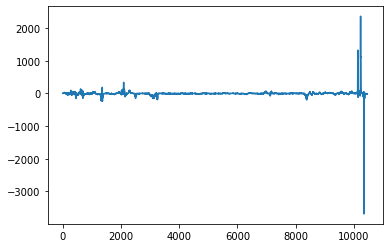

In [16]:
from matplotlib import pyplot as plt
plt.plot(predictions_list)
plt.show()

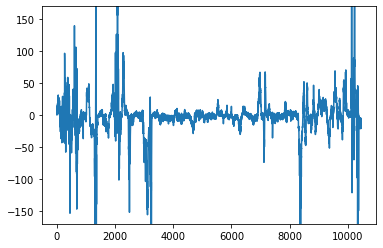

In [17]:
from matplotlib import pyplot as plt
plt.plot(predictions_list)
plt.ylim(-170, 170)
plt.show()

In [18]:
import numpy as np
import matplotlib.pylab as plt

def running_mean(x, N):
        cumsum = np.cumsum(np.insert(x, 0, 0)) 
        return (cumsum[N:] - cumsum[:-N]) / float(N)

def get_smoothness_score(series):
    
    smooth = running_mean(series, 9)
    diff = series[4:-4] - smooth
    
    smoothness = 1/np.mean(np.abs(diff))
    print(smoothness)
    return smoothness


#time = np.linspace(0, 100, 100)
#clean = np.sin(time/100)
#noise = np.random.normal(0,0.1,100)
#noisy = clean+noise

#get_smoothness_score(noisy)

#plt.plot(time, noisy)
#plt.show()

In [19]:
get_smoothness_score(ground_truth)

1.8380261883179116


1.8380261883179116

In [20]:
get_smoothness_score(predictions_list)

0.21392381848405728


0.21392381848405728

3.330734839989158


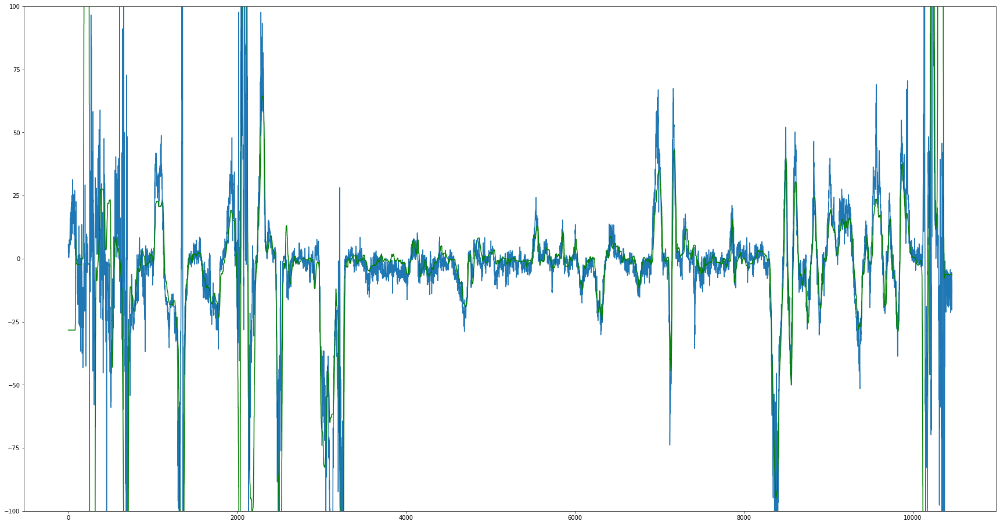

In [27]:
idxs = np.linspace(0, len(ground_truth), len(ground_truth))

plt.figure(figsize=(30,16))

#plt.show()
plt.plot(idxs, predictions_list)

plt.ylim(-100,100)
smooth_idxs = idxs[4:-4]
smooth = running_mean(predictions_list, 9)
#plt.plot(smooth_idxs, smooth, color = 'red')

super_smooth_idxs = idxs[20:-20]
super_smooth = running_mean(predictions_list, 41)
#plt.plot(super_smooth_idxs, super_smooth)

get_smoothness_score(super_smooth)


plt.plot(idxs, ground_truth, color = 'green')

plt.show()

In [22]:
get_smoothness_score(smooth)

0.7938581678594906


0.7938581678594906

# Links/Rechts Tendenz

In [23]:
np.mean(ground_truth)

-3.7782501911314985

In [24]:
np.mean(predictions_list)

-1.6196797568335515

# Test Shift-Verhalten:

In [25]:
from matplotlib import pyplot as plt
import ipywidgets as widgets
from ipywidgets import interact
from tensorflow.keras.preprocessing.image import img_to_array
import matplotlib as mpl

mpl.rcParams['figure.figsize'] = [12, 12]
mpl.rcParams['figure.dpi'] = 72

def show_crop(index, shift):
    frame = val_set.get_cropped_frame(index, shift)[0]
    frame_arr = img_to_array(frame)/255
    plt.imshow(frame_arr)
    plt.show()
    
crop_slider = widgets.IntSlider(min=0, max=val_set.get_batch_size()*len(val_set)-1, continuous_update=False)
shift_slider = widgets.IntSlider(min=-100, max=100, continuous_update=False)

interact(show_crop, index=crop_slider, shift = shift_slider);

interactive(children=(IntSlider(value=0, continuous_update=False, description='index', max=10463), IntSlider(v…

In [26]:
gui = AutopilotGUI()

predictions_lists = []
render_list = []

fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter(model_name + '_shift_behaviour.avi',fourcc, 15.0, (848,170))

frames = range(0, val_set.get_batch_size()*len(val_set)-1, 50)

shifts = range(-100,100,4)


for frame_idx in frames:
    predictions_lists.append([])
    for shift in shifts:
        cropped_sample = val_set.get_cropped_frame(frame_idx, shift, offset=0)
        cropped_frame = cropped_sample[0]
        actual_swa = cropped_sample[1]['steering_wheel_angle']*90
        test_data = np.expand_dims(cropped_frame, axis=0)
        predictions = loaded_model.predict(test_data)
        predicted_swa = predictions[0][0]*90
        predictions_lists[-1].append({'shift':shift, 'actual':actual_swa, 'predicted':predicted_swa})



        gui.set_frame(cropped_frame)
        gui.set_show_overlay(True)
        gui.set_engaged(False)
        gui.set_recording(False)

        gui.set_timestring('')

        velocity = cropped_sample[1]['speed']
        gui.set_velocity(velocity)

        gui.set_actual_swa(actual_swa)
        gui.set_predicted_swa(predicted_swa)

        print("Ground-truth: " +str(actual_swa))
        print("Prediction: " + str(predicted_swa))

        gui.render()
        frame = gui.get_rendered_gui()

        rgb_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

        out.write(rgb_frame.astype(np.uint8))
    
out.release()

AttributeError: 'RoadDataset' object has no attribute 'get_cropped_frame'

In [ ]:
print(predictions_lists)

In [ ]:
good_predictions = []
for prediction_list in predictions_lists:
    predictions = [element['predicted'] for element in prediction_list]
    ground_truths = [element['actual'] for element in prediction_list]
    base_pred = predictions[len(predictions)//2]
    base_gt = ground_truths[len(ground_truths)//2]
    error = abs(base_gt - base_pred)
    
    linewidth = 0.2
    if error < 10:
        linewidth = 0.2
        good_predictions.append(predictions)
    #plt.plot(shifts, np.asarray(prediction_list), linewidth = 0.5)
    plt.plot(shifts, np.asarray(predictions)-base_pred, linewidth = linewidth)

median_predictions = np.median(good_predictions, axis=0)
plt.plot(shifts, np.asarray(median_predictions)-median_predictions[len(median_predictions)//2], linewidth = 3)

plt.xlabel("shift (px)")
plt.ylabel("swa offset (deg)")
plt.grid()
plt.show()



# Lenkrad Winkelgeschwindigkeit

In [ ]:
speeds = velocity_list[:]
angles = ground_truth[:] # deg
fps = 15
angular_speed = np.diff(angles)*fps # deg/s


idxs = range(1, len(angles)+1)
print(len(angles))
#print(angles)
print(len(angular_speed))
#print(angular_speed)

plt.plot(idxs, angles)
#plt.plot(idxs[:len(angular_speed)], angular_speed)
plt.xlabel("frame idx")
plt.ylabel("swa (deg)")
plt.show()


In [ ]:
speeds = np.asarray(speeds)
abs_angles = abs(np.asarray(angles))
abs_angular_speed = abs(angular_speed)

In [ ]:
# get indices where abs(swa) > 45
invalid_angle_indxs = np.argwhere(abs_angles>45)

# get indices where speed < 25
invalid_speed_indxs = np.argwhere(speeds[:-1]<25)

In [ ]:
# remove samples from angular speed array
abs_angular_speed[invalid_angle_indxs] = 0
abs_angular_speed[invalid_speed_indxs] = 0

In [ ]:
plt.plot(idxs[:len(abs_angular_speed)], abs_angular_speed)
plt.xlabel("frame idx")
plt.ylabel("swa abs(deg/s)")
plt.show()

In [ ]:
qs = list(range(60,90,5))
qs.extend(list(range(90,101,1)))

for q in qs:
    print("{}th: {} deg/s".format(q, round(np.percentile(abs_angular_speed, q=q),1)))